In [1]:
#Trying to replicate the results of "Adaptive activation functions accelerate convergence in deep and physics-informed neural networks"
import torch
import torch.autograd as autograd         # computation graph
from torch import Tensor                  # tensor node in the computation graph
import torch.nn as nn                     # neural networks
import torch.optim as optim               # optimizers e.g. gradient descent, ADAM, etc.

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from mpl_toolkits.axes_grid1 import make_axes_locatable
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.ticker
from torch.nn.parameter import Parameter

import numpy as np
import time
from pyDOE import lhs         #Latin Hypercube Sampling
import scipy.io
from scipy.io import savemat

from smt.sampling_methods import LHS

#Set default dtype to float32
torch.set_default_dtype(torch.float)

#PyTorch random number generator
torch.manual_seed(1234)

# Random number generators in other libraries
np.random.seed(1234)

# Device configuration
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')

print(device)

if device == 'cuda': 
    print(torch.cuda.get_device_name())


cuda:0


In [2]:
lr_tune = np.array([8e-6,8e-5,8e-4,8e-3,8e-2]).reshape(-1,1)
n_value = np.array([1.0,3.0,5.0,8.0,10.0]).reshape(-1,1)

LR_tune,N_value = np.meshgrid(lr_tune,n_value)

LR_tune = LR_tune.flatten('F').reshape(-1,1)
N_value = N_value.flatten('F').reshape(-1,1)

lrn_tune = np.hstack((LR_tune,N_value))

In [3]:
def true_smooth(x): #[-3,3]
    term1 = (np.power(x,3) - x)
    term2 = np.sin(7*x)/7  
    
    term3 = np.sin(12*x)
    term12 = np.multiply(term1,term2)

    return 50*(term12  + term3)

In [4]:
# Domain bounds
label = "Regr_smooth_atanh"
loss_thresh = 0.1

lb = np.array(-3.0)  # [-1. 0.]
ub = np.array(3.0) # [1.  0.99]

x_test = np.linspace(lb,ub,1000).reshape(-1,1)
u_true = true_smooth(x_test)

u_true_norm = np.linalg.norm(u_true,2)

In [5]:
def trainingdata(N_train,seed):
    np.random.seed(seed)
    
    x_train = np.random.uniform(low=lb, high=ub, size=(N_train,)).reshape(-1,1)

    u_train = true_smooth(x_train)

    return x_train, u_train

In [6]:
class Sequentialmodel(nn.Module):
    
    def __init__(self,layers,n_val):
        super().__init__() #call __init__ from parent class 
              
        'activation function'
        self.activation = nn.Tanh()
     
        'loss function'
        self.loss_function = nn.MSELoss(reduction ='mean')
        
        'Initialise neural network as a list using nn.Modulelist'  
        self.linears = nn.ModuleList([nn.Linear(layers[i], layers[i+1]) for i in range(len(layers)-1)])
     
        
        for i in range(len(layers)-1):
            nn.init.xavier_normal_(self.linears[i].weight.data, gain=1.0)
            # set biases to zero
            nn.init.zeros_(self.linears[i].bias.data)

        
        self.alpha = Parameter(torch.ones((layers[1],len(layers)-2)))
        self.alpha.requiresGrad = True
        
        self.n = torch.tensor(n_val)
            
            
    'foward pass'
    def forward(self,x):
        if torch.is_tensor(x) != True:         
            x = torch.from_numpy(x)                
        
        u_b = torch.from_numpy(ub).float().to(device)
        l_b = torch.from_numpy(lb).float().to(device)
                      
        #preprocessing input 
        x = (x - l_b)/(u_b - l_b) #feature scaling
        
        #convert to float
        a = x.float()
        
        for i in range(len(layers)-2):
            z = self.linears[i](a)
            a = self.activation(self.n*self.alpha[:,i]*z)
    
        a = self.linears[-1](a) 
        
        return a
    
    
    def loss(self,x,u):

        loss_val = self.loss_function(self.forward(x),u)
        
        return loss_val
        
    'test neural network'
    def test(self):
        u_pred = self.forward(x_test_tensor)       
        u_pred = u_pred.cpu().detach().numpy()
        
        return u_pred
    
    def test_loss(self):
        u_pred = self.test()
        
        test_mse_loss = np.mean(np.square(u_pred.reshape(-1,1) - u_true.reshape(-1,1)))
        test_re_loss = np.linalg.norm(u_pred.reshape(-1,1) - u_true.reshape(-1,1),2)/u_true_norm
        
        return test_mse_loss, test_re_loss  

In [7]:
def data_update(loss_np):
    train_loss.append(loss_np)
    alpha_val.append(model_NN.alpha.cpu().detach().numpy())
    test_mse, test_re = model_NN.test_loss()
    test_mse_loss.append(test_mse)
    test_re_loss.append(test_re)

In [8]:
def train_step():
    optimizer.zero_grad()     # zeroes the gradient buffers of all parameters
    loss = model_NN.loss(x_train,u_train)
    loss.backward() #backprop
    optimizer.step()
    
    return loss

In [9]:
def train_model(max_iter,rep):
    print(rep) 
   
    torch.manual_seed(rep*123)
    start_time = time.time()
    thresh_flag = 0
    
    nan_flag = 0
    
    for i in range(max_iter):
        loss_np = train_step().cpu().detach().numpy()
        if(thresh_flag == 0):
            if(loss_np < loss_thresh):
                time_threshold[rep] = time.time() - start_time
                epoch_threshold[rep] = i+1            
                thresh_flag = 1
                
        data_update(loss_np)
        print(i,"Train Loss",train_loss[-1],"Test MSE",test_mse_loss[-1],"Test RE",test_re_loss[-1])
        
        if(np.isnan(loss_np)):
            nan_flag =1
            print("NAN BREAK!")
            break
    
    elapsed_time[rep] = time.time() - start_time
    print('Training time: %.2f' % (elapsed_time[rep]))
    
    return nan_flag

In [10]:
nan_tune = []

for tune_reps in range(25):
    label = "Regr_atanh_tune"+str(tune_reps)
    max_reps = 10
    max_iter = 500
    layers = np.array([1,50,50,50,50,1])

    train_loss_full = []
    test_mse_full = []
    test_re_full = []
    alpha_full = []
    elapsed_time= np.zeros((max_reps,1))

    time_threshold = np.empty((max_reps,1))
    time_threshold[:] = np.nan
    epoch_threshold = max_iter*np.ones((max_reps,1))

    n_val = lrn_tune[tune_reps,1] 
    for reps in range(max_reps):
        print(label)
        print(reps)
        train_loss = []
        test_mse_loss = []
        test_re_loss = []
        alpha_val = []
        'Generate Training data'
        N_train = 300

        x_train_np_array, u_train_np_array = trainingdata(N_train,reps*1234)

        'Convert to tensor and send to GPU'
        x_train = torch.from_numpy(x_train_np_array).float().to(device)
        u_train = torch.from_numpy(u_train_np_array).float().to(device)

        x_test_tensor = torch.from_numpy(x_test).float().to(device)


        model_NN = Sequentialmodel(layers,n_val)
        model_NN.to(device)
        print(model_NN)
        params = list(model_NN.parameters())
        #optimizer = optim.Adam(PINN.parameters(), lr=0.0008,betas=(0.9, 0.999), eps=1e-08, weight_decay=0, amsgrad=False)
        optimizer = optim.Adam(model_NN.parameters(), lr=lrn_tune[tune_reps,0])

        nan_flag = train_model(max_iter,reps)

        torch.save(model_NN.state_dict(),label+'_'+str(reps)+'.pt')
        train_loss_full.append(train_loss)
        test_mse_full.append(test_mse_loss)
        test_re_full.append(test_re_loss)
        alpha_full.append(alpha_val)
        
        if(nan_flag == 1):
            nan_tune.append(tune_reps)
            break


    mdic = {"train_loss": train_loss_full,"test_mse": test_mse_full, "test_re": test_re_full,"Time": elapsed_time, "Thresh_time": time_threshold, "epoch_thresh": epoch_threshold,"alpha": alpha_full, "label": label}
    savemat(label+'.mat', mdic) 

Regr_atanh_tune0
0
Sequentialmodel(
  (activation): Tanh()
  (loss_function): MSELoss()
  (linears): ModuleList(
    (0): Linear(in_features=1, out_features=50, bias=True)
    (1): Linear(in_features=50, out_features=50, bias=True)
    (2): Linear(in_features=50, out_features=50, bias=True)
    (3): Linear(in_features=50, out_features=50, bias=True)
    (4): Linear(in_features=50, out_features=1, bias=True)
  )
)
0
0 Train Loss 3616.8254 Test MSE 3506.530065861728 Test RE 0.9998632205293331
1 Train Loss 3616.8047 Test MSE 3506.5202451260257 Test RE 0.9998618203703273
2 Train Loss 3616.7842 Test MSE 3506.5104246670517 Test RE 0.9998604202488142
3 Train Loss 3616.764 Test MSE 3506.500604291564 Test RE 0.9998590201372435
4 Train Loss 3616.7434 Test MSE 3506.490783979727 Test RE 0.999857620032787
5 Train Loss 3616.723 Test MSE 3506.4809628884827 Test RE 0.999856219815248
6 Train Loss 3616.7026 Test MSE 3506.471141921167 Test RE 0.9998548196134167
7 Train Loss 3616.6821 Test MSE 3506.461320

100 Train Loss 3614.7588 Test MSE 3505.5428732417013 Test RE 0.9997224649882271
101 Train Loss 3614.7375 Test MSE 3505.5329040008937 Test RE 0.9997210434564645
102 Train Loss 3614.7168 Test MSE 3505.522931765985 Test RE 0.9997196214957452
103 Train Loss 3614.6958 Test MSE 3505.5129570264735 Test RE 0.9997181991758667
104 Train Loss 3614.6746 Test MSE 3505.502979736505 Test RE 0.9997167764902881
105 Train Loss 3614.6533 Test MSE 3505.4929993804903 Test RE 0.9997153533654892
106 Train Loss 3614.6326 Test MSE 3505.4830162221356 Test RE 0.9997139298390711
107 Train Loss 3614.6118 Test MSE 3505.473030510394 Test RE 0.9997125059465303
108 Train Loss 3614.5908 Test MSE 3505.4630418654083 Test RE 0.9997110816337006
109 Train Loss 3614.57 Test MSE 3505.453050955491 Test RE 0.9997096569958771
110 Train Loss 3614.5483 Test MSE 3505.4430567309623 Test RE 0.9997082318833806
111 Train Loss 3614.5276 Test MSE 3505.4330601622464 Test RE 0.999706806434586
112 Train Loss 3614.5068 Test MSE 3505.42306051

204 Train Loss 3612.5288 Test MSE 3504.4885076991745 Test RE 0.9995721099322704
205 Train Loss 3612.5068 Test MSE 3504.4781700506333 Test RE 0.9995706356468274
206 Train Loss 3612.485 Test MSE 3504.467828073536 Test RE 0.9995691607418992
207 Train Loss 3612.463 Test MSE 3504.4574815875512 Test RE 0.9995676851917655
208 Train Loss 3612.441 Test MSE 3504.44713105578 Test RE 0.9995662090624676
209 Train Loss 3612.419 Test MSE 3504.4367762082675 Test RE 0.999564732315504
210 Train Loss 3612.3967 Test MSE 3504.4264169704115 Test RE 0.9995632549402327
211 Train Loss 3612.3748 Test MSE 3504.4160532859137 Test RE 0.9995617769286218
212 Train Loss 3612.3525 Test MSE 3504.405685625982 Test RE 0.9995602983478693
213 Train Loss 3612.3306 Test MSE 3504.3953130065756 Test RE 0.9995588190576343
214 Train Loss 3612.3083 Test MSE 3504.384935890113 Test RE 0.9995573391238612
215 Train Loss 3612.2869 Test MSE 3504.3745546850228 Test RE 0.9995558586047957
216 Train Loss 3612.2642 Test MSE 3504.36416865979

309 Train Loss 3610.152 Test MSE 3503.377006356705 Test RE 0.9994135826823943
310 Train Loss 3610.1284 Test MSE 3503.366142987223 Test RE 0.9994120331763875
311 Train Loss 3610.105 Test MSE 3503.3552749511414 Test RE 0.9994104830023522
312 Train Loss 3610.0818 Test MSE 3503.3444004823555 Test RE 0.999408931908375
313 Train Loss 3610.0583 Test MSE 3503.3335211161116 Test RE 0.9994073801134333
314 Train Loss 3610.0352 Test MSE 3503.3226352903994 Test RE 0.999405827394724
315 Train Loss 3610.0112 Test MSE 3503.311743934406 Test RE 0.9994042738847791
316 Train Loss 3609.988 Test MSE 3503.300847146637 Test RE 0.9994027195976455
317 Train Loss 3609.9646 Test MSE 3503.289944233413 Test RE 0.9994011644343751
318 Train Loss 3609.9414 Test MSE 3503.279035767419 Test RE 0.9993996084766501
319 Train Loss 3609.9175 Test MSE 3503.26812165143 Test RE 0.9993980517105991
320 Train Loss 3609.8943 Test MSE 3503.2572018131295 Test RE 0.9993964941259026
321 Train Loss 3609.8706 Test MSE 3503.2462767933966 

414 Train Loss 3607.6125 Test MSE 3502.2042304311135 Test RE 0.9992462889120383
415 Train Loss 3607.5876 Test MSE 3502.192742990857 Test RE 0.9992446501167678
416 Train Loss 3607.5625 Test MSE 3502.1812496771713 Test RE 0.9992430104809059
417 Train Loss 3607.5376 Test MSE 3502.169750314761 Test RE 0.99924136997944
418 Train Loss 3607.5127 Test MSE 3502.1582458421435 Test RE 0.9992397287462561
419 Train Loss 3607.487 Test MSE 3502.146734749214 Test RE 0.9992380865659175
420 Train Loss 3607.4626 Test MSE 3502.1352175404063 Test RE 0.9992364435103825
421 Train Loss 3607.4373 Test MSE 3502.123694966961 Test RE 0.9992347996868199
422 Train Loss 3607.4119 Test MSE 3502.1121665828773 Test RE 0.9992331550315986
423 Train Loss 3607.3867 Test MSE 3502.100631763149 Test RE 0.9992315094555504
424 Train Loss 3607.3618 Test MSE 3502.089091441139 Test RE 0.9992298630918253
425 Train Loss 3607.3364 Test MSE 3502.077545890586 Test RE 0.9992282159794728
426 Train Loss 3607.3113 Test MSE 3502.06599357509

14 Train Loss 3665.3052 Test MSE 3507.9698979182053 Test RE 1.000068478624451
15 Train Loss 3665.293 Test MSE 3507.9591789734095 Test RE 1.000066950719806
16 Train Loss 3665.281 Test MSE 3507.9484641796084 Test RE 1.000065423404521
17 Train Loss 3665.2693 Test MSE 3507.937753462548 Test RE 1.0000638966680142
18 Train Loss 3665.2568 Test MSE 3507.927046027987 Test RE 1.0000623703970746
19 Train Loss 3665.245 Test MSE 3507.9163426335517 Test RE 1.000060844699699
20 Train Loss 3665.2334 Test MSE 3507.9056435770535 Test RE 1.0000593196183414
21 Train Loss 3665.2214 Test MSE 3507.8949478230697 Test RE 1.0000577950054108
22 Train Loss 3665.2092 Test MSE 3507.884256360185 Test RE 1.000056271001827
23 Train Loss 3665.1975 Test MSE 3507.8735687769054 Test RE 1.0000547475489363
24 Train Loss 3665.1855 Test MSE 3507.862884475803 Test RE 1.000053224561581
25 Train Loss 3665.1733 Test MSE 3507.852204494018 Test RE 1.0000517021876023
26 Train Loss 3665.1619 Test MSE 3507.841528175556 Test RE 1.00005

120 Train Loss 3664.056 Test MSE 3506.8502788721444 Test RE 0.9999088727691234
121 Train Loss 3664.0442 Test MSE 3506.839799805851 Test RE 0.9999073788189461
122 Train Loss 3664.0322 Test MSE 3506.82932094186 Test RE 0.9999058848953776
123 Train Loss 3664.021 Test MSE 3506.818842160985 Test RE 0.999904390981427
124 Train Loss 3664.0088 Test MSE 3506.8083640894833 Test RE 0.9999028971663768
125 Train Loss 3663.9976 Test MSE 3506.7978859642285 Test RE 0.9999014033414314
126 Train Loss 3663.9856 Test MSE 3506.787407985214 Test RE 0.9998999095351033
127 Train Loss 3663.9739 Test MSE 3506.7769298092226 Test RE 0.9998984156984612
128 Train Loss 3663.9617 Test MSE 3506.7664523973926 Test RE 0.9998969219685313
129 Train Loss 3663.9502 Test MSE 3506.755974995953 Test RE 0.9998954282378514
130 Train Loss 3663.9385 Test MSE 3506.7454975649575 Test RE 0.9998939345007264
131 Train Loss 3663.9268 Test MSE 3506.7350201842105 Test RE 0.9998924407685335
132 Train Loss 3663.915 Test MSE 3506.72454254643

225 Train Loss 3662.8225 Test MSE 3505.7481201608434 Test RE 0.9997517310619871
226 Train Loss 3662.8105 Test MSE 3505.7375808853294 Test RE 0.999750228291894
227 Train Loss 3662.7993 Test MSE 3505.7270404745154 Test RE 0.9997487253576617
228 Train Loss 3662.7869 Test MSE 3505.716498932234 Test RE 0.9997472222598365
229 Train Loss 3662.7751 Test MSE 3505.7059565143863 Test RE 0.9997457190349059
230 Train Loss 3662.7634 Test MSE 3505.6954127099934 Test RE 0.9997442156100093
231 Train Loss 3662.7517 Test MSE 3505.6848677499797 Test RE 0.9997427120180731
232 Train Loss 3662.7397 Test MSE 3505.6743217529447 Test RE 0.999741208276008
233 Train Loss 3662.728 Test MSE 3505.6637741601944 Test RE 0.999739704304149
234 Train Loss 3662.7158 Test MSE 3505.653225658859 Test RE 0.9997382002004731
235 Train Loss 3662.7043 Test MSE 3505.6426757480913 Test RE 0.9997366958935637
236 Train Loss 3662.6926 Test MSE 3505.6321244832566 Test RE 0.9997351913913148
237 Train Loss 3662.6804 Test MSE 3505.6215722

329 Train Loss 3661.5825 Test MSE 3504.6445370519423 Test RE 0.99959436151807
330 Train Loss 3661.5708 Test MSE 3504.6338411591933 Test RE 0.9995928361761809
331 Train Loss 3661.5588 Test MSE 3504.6231433657003 Test RE 0.9995913105608979
332 Train Loss 3661.5469 Test MSE 3504.6124431387393 Test RE 0.9995897845962477
333 Train Loss 3661.5347 Test MSE 3504.6017413701375 Test RE 0.9995882584094138
334 Train Loss 3661.5227 Test MSE 3504.591037912816 Test RE 0.9995867319794195
335 Train Loss 3661.511 Test MSE 3504.580332265653 Test RE 0.9995852052347981
336 Train Loss 3661.4985 Test MSE 3504.5696250162778 Test RE 0.9995836782593512
337 Train Loss 3661.4868 Test MSE 3504.558915762441 Test RE 0.9995821509957118
338 Train Loss 3661.4744 Test MSE 3504.5482046608886 Test RE 0.999580623466233
339 Train Loss 3661.4626 Test MSE 3504.5374921531748 Test RE 0.9995790957338839
340 Train Loss 3661.4502 Test MSE 3504.5267778208913 Test RE 0.9995775677389934
341 Train Loss 3661.4385 Test MSE 3504.51606123

434 Train Loss 3660.3025 Test MSE 3503.5106588640906 Test RE 0.9994326461256193
435 Train Loss 3660.29 Test MSE 3503.499746311351 Test RE 0.9994310896340006
436 Train Loss 3660.278 Test MSE 3503.48883159699 Test RE 0.9994295328316386
437 Train Loss 3660.2651 Test MSE 3503.4779144448357 Test RE 0.9994279756791394
438 Train Loss 3660.253 Test MSE 3503.4669951116593 Test RE 0.9994264182131269
439 Train Loss 3660.241 Test MSE 3503.456073071265 Test RE 0.9994248603585457
440 Train Loss 3660.228 Test MSE 3503.4451492937965 Test RE 0.9994233022537694
441 Train Loss 3660.2158 Test MSE 3503.4342228473733 Test RE 0.9994217437658788
442 Train Loss 3660.2034 Test MSE 3503.4232944053088 Test RE 0.99942018499091
443 Train Loss 3660.191 Test MSE 3503.412363028346 Test RE 0.9994186257948908
444 Train Loss 3660.179 Test MSE 3503.401430002967 Test RE 0.999417066361317
445 Train Loss 3660.1663 Test MSE 3503.3904942474433 Test RE 0.9994155065358943
446 Train Loss 3660.1543 Test MSE 3503.3795564594434 Test

33 Train Loss 3131.1826 Test MSE 3506.696290499991 Test RE 0.9998869191615133
34 Train Loss 3131.1736 Test MSE 3506.688321861896 Test RE 0.9998857830862932
35 Train Loss 3131.165 Test MSE 3506.6803525971713 Test RE 0.9998846469204445
36 Train Loss 3131.1562 Test MSE 3506.6723824118612 Test RE 0.9998835106220578
37 Train Loss 3131.1475 Test MSE 3506.664411797357 Test RE 0.9998823742611903
38 Train Loss 3131.139 Test MSE 3506.6564402933927 Test RE 0.9998812377722218
39 Train Loss 3131.1304 Test MSE 3506.6484680801827 Test RE 0.999880101180845
40 Train Loss 3131.121 Test MSE 3506.6404950945357 Test RE 0.9998789644780507
41 Train Loss 3131.1128 Test MSE 3506.632521179167 Test RE 0.9998778276414139
42 Train Loss 3131.1038 Test MSE 3506.6245467933772 Test RE 0.9998766907364165
43 Train Loss 3131.095 Test MSE 3506.616571473385 Test RE 0.9998755536969376
44 Train Loss 3131.0864 Test MSE 3506.6085953931247 Test RE 0.9998744165477742
45 Train Loss 3131.0776 Test MSE 3506.6006182865112 Test RE 0.

138 Train Loss 3130.2542 Test MSE 3505.850672477036 Test RE 0.9997663536335953
139 Train Loss 3130.2454 Test MSE 3505.842486326333 Test RE 0.9997651864072099
140 Train Loss 3130.2363 Test MSE 3505.834297042358 Test RE 0.9997640187327018
141 Train Loss 3130.227 Test MSE 3505.826104645361 Test RE 0.9997628506129569
142 Train Loss 3130.2185 Test MSE 3505.8179090025874 Test RE 0.9997616820290446
143 Train Loss 3130.2092 Test MSE 3505.809710301671 Test RE 0.9997605130077173
144 Train Loss 3130.2002 Test MSE 3505.801508324989 Test RE 0.9997593435179434
145 Train Loss 3130.1914 Test MSE 3505.793303359308 Test RE 0.9997581736006101
146 Train Loss 3130.1821 Test MSE 3505.7850952411086 Test RE 0.9997570032324006
147 Train Loss 3130.1733 Test MSE 3505.7768837468384 Test RE 0.9997558323814373
148 Train Loss 3130.1643 Test MSE 3505.7686692040584 Test RE 0.9997546610944247
149 Train Loss 3130.1553 Test MSE 3505.760451505427 Test RE 0.999753489356056
150 Train Loss 3130.146 Test MSE 3505.752230620144

242 Train Loss 3129.3005 Test MSE 3504.9809044415288 Test RE 0.9996423297036026
243 Train Loss 3129.291 Test MSE 3504.9723439777986 Test RE 0.999641108954137
244 Train Loss 3129.2817 Test MSE 3504.963779810665 Test RE 0.9996398876750624
245 Train Loss 3129.2722 Test MSE 3504.9552109408455 Test RE 0.9996386657238757
246 Train Loss 3129.263 Test MSE 3504.9466381710117 Test RE 0.9996374432150389
247 Train Loss 3129.2534 Test MSE 3504.938061251426 Test RE 0.9996362201129355
248 Train Loss 3129.2441 Test MSE 3504.929480003015 Test RE 0.999634996392027
249 Train Loss 3129.2349 Test MSE 3504.9208947517855 Test RE 0.9996337720988014
250 Train Loss 3129.2256 Test MSE 3504.9123053849594 Test RE 0.9996325472171739
251 Train Loss 3129.2158 Test MSE 3504.903711913064 Test RE 0.9996313217486432
252 Train Loss 3129.2063 Test MSE 3504.895114207966 Test RE 0.9996300956749349
253 Train Loss 3129.1973 Test MSE 3504.886512087276 Test RE 0.9996288689700374
254 Train Loss 3129.1877 Test MSE 3504.87790577937

346 Train Loss 3128.3003 Test MSE 3504.0673885121755 Test RE 0.9995120510050236
347 Train Loss 3128.2905 Test MSE 3504.0583657417346 Test RE 0.9995107641613936
348 Train Loss 3128.281 Test MSE 3504.049338084381 Test RE 0.9995094766191255
349 Train Loss 3128.2708 Test MSE 3504.040305346015 Test RE 0.9995081883505331
350 Train Loss 3128.261 Test MSE 3504.0312680897264 Test RE 0.9995068994359237
351 Train Loss 3128.2512 Test MSE 3504.022226228973 Test RE 0.9995056098629512
352 Train Loss 3128.2412 Test MSE 3504.0131797859467 Test RE 0.9995043196347781
353 Train Loss 3128.2314 Test MSE 3504.004128259135 Test RE 0.9995030286798748
354 Train Loss 3128.2214 Test MSE 3503.995072061437 Test RE 0.9995017370571279
355 Train Loss 3128.2114 Test MSE 3503.9860109815045 Test RE 0.9995004447363911
356 Train Loss 3128.2014 Test MSE 3503.976945269238 Test RE 0.9994991517533034
357 Train Loss 3128.1917 Test MSE 3503.9678746316376 Test RE 0.9994978580660735
358 Train Loss 3128.1816 Test MSE 3503.958799374

451 Train Loss 3127.2366 Test MSE 3503.0932351428996 Test RE 0.9993731059440758
452 Train Loss 3127.2258 Test MSE 3503.083691246525 Test RE 0.9993717445872377
453 Train Loss 3127.2158 Test MSE 3503.074141967229 Test RE 0.9993703824607152
454 Train Loss 3127.205 Test MSE 3503.064587850122 Test RE 0.9993690196422604
455 Train Loss 3127.1948 Test MSE 3503.0550283305533 Test RE 0.999367656051328
456 Train Loss 3127.1846 Test MSE 3503.045464100399 Test RE 0.999366291786605
457 Train Loss 3127.1738 Test MSE 3503.035894650582 Test RE 0.9993649267754731
458 Train Loss 3127.1636 Test MSE 3503.02631943312 Test RE 0.999363560939763
459 Train Loss 3127.153 Test MSE 3503.0167396551155 Test RE 0.9993621944516564
460 Train Loss 3127.1426 Test MSE 3503.0071542443975 Test RE 0.9993608271582124
461 Train Loss 3127.132 Test MSE 3502.9975640257253 Test RE 0.9993594591770748
462 Train Loss 3127.1218 Test MSE 3502.9879688303854 Test RE 0.9993580904841745
463 Train Loss 3127.1113 Test MSE 3502.978367999824 T

50 Train Loss 3462.8386 Test MSE 3507.63830173825 Test RE 1.0000212110118543
51 Train Loss 3462.8342 Test MSE 3507.627086168274 Test RE 1.0000196122414182
52 Train Loss 3462.8298 Test MSE 3507.615873626753 Test RE 1.000018013900131
53 Train Loss 3462.826 Test MSE 3507.6046636854185 Test RE 1.000016415926945
54 Train Loss 3462.8218 Test MSE 3507.593456878582 Test RE 1.000014818398028
55 Train Loss 3462.8174 Test MSE 3507.5822532724196 Test RE 1.000013221322816
56 Train Loss 3462.8135 Test MSE 3507.571051964822 Test RE 1.0000116245727146
57 Train Loss 3462.809 Test MSE 3507.5598538970116 Test RE 1.0000100282818976
58 Train Loss 3462.8052 Test MSE 3507.5486584896157 Test RE 1.0000084323677767
59 Train Loss 3462.8008 Test MSE 3507.5374655725286 Test RE 1.0000068368061055
60 Train Loss 3462.7964 Test MSE 3507.526275750208 Test RE 1.0000052416830516
61 Train Loss 3462.7922 Test MSE 3507.5150885438366 Test RE 1.0000036469303608
62 Train Loss 3462.788 Test MSE 3507.5039043275774 Test RE 1.0000

156 Train Loss 3462.4038 Test MSE 3506.4620258497384 Test RE 0.9998535199087407
157 Train Loss 3462.4 Test MSE 3506.451021675379 Test RE 0.999851951009517
158 Train Loss 3462.3958 Test MSE 3506.44001928376 Test RE 0.9998503823620034
159 Train Loss 3462.3918 Test MSE 3506.4290174515368 Test RE 0.9998488137917834
160 Train Loss 3462.3877 Test MSE 3506.4180172096976 Test RE 0.99984724544585
161 Train Loss 3462.384 Test MSE 3506.407018266287 Test RE 0.9998456772825789
162 Train Loss 3462.3796 Test MSE 3506.3960208946096 Test RE 0.9998441093409369
163 Train Loss 3462.376 Test MSE 3506.385024555378 Test RE 0.999842541544037
164 Train Loss 3462.3718 Test MSE 3506.374029588746 Test RE 0.9998409739403762
165 Train Loss 3462.368 Test MSE 3506.3630358304135 Test RE 0.9998394065065314
166 Train Loss 3462.364 Test MSE 3506.352043288048 Test RE 0.9998378392435958
167 Train Loss 3462.36 Test MSE 3506.3410521948085 Test RE 0.9998362721848135
168 Train Loss 3462.3564 Test MSE 3506.330062036788 Test RE 

260 Train Loss 3462.0027 Test MSE 3505.3234311078513 Test RE 0.999691173876942
261 Train Loss 3461.9988 Test MSE 3505.3125289621266 Test RE 0.9996896192718471
262 Train Loss 3461.995 Test MSE 3505.301627974331 Test RE 0.9996880648294512
263 Train Loss 3461.9915 Test MSE 3505.2907279436313 Test RE 0.9996865105211169
264 Train Loss 3461.9875 Test MSE 3505.279828151236 Test RE 0.9996849562443478
265 Train Loss 3461.9836 Test MSE 3505.268929149464 Test RE 0.9996834020779027
266 Train Loss 3461.98 Test MSE 3505.2580311785714 Test RE 0.9996818480560425
267 Train Loss 3461.9763 Test MSE 3505.2471335709065 Test RE 0.9996802940835615
268 Train Loss 3461.9727 Test MSE 3505.236236619342 Test RE 0.9996787402022237
269 Train Loss 3461.9692 Test MSE 3505.2253410196104 Test RE 0.9996771865112394
270 Train Loss 3461.9653 Test MSE 3505.214446235984 Test RE 0.9996756329342155
271 Train Loss 3461.9614 Test MSE 3505.203551417809 Test RE 0.9996740793498506
272 Train Loss 3461.9578 Test MSE 3505.19265768367

364 Train Loss 3461.6257 Test MSE 3504.1934583378984 Test RE 0.9995300311353607
365 Train Loss 3461.622 Test MSE 3504.182634235011 Test RE 0.999528487410053
366 Train Loss 3461.6184 Test MSE 3504.1718107704205 Test RE 0.9995269437733943
367 Train Loss 3461.615 Test MSE 3504.160988523559 Test RE 0.9995254003080241
368 Train Loss 3461.6116 Test MSE 3504.150167195481 Test RE 0.9995238569713075
369 Train Loss 3461.608 Test MSE 3504.1393466756867 Test RE 0.9995223137474853
370 Train Loss 3461.6047 Test MSE 3504.128527519685 Test RE 0.9995207707157854
371 Train Loss 3461.6008 Test MSE 3504.1177092473295 Test RE 0.9995192278077294
372 Train Loss 3461.5977 Test MSE 3504.106891690823 Test RE 0.9995176849993866
373 Train Loss 3461.594 Test MSE 3504.096075357235 Test RE 0.9995161423630766
374 Train Loss 3461.5908 Test MSE 3504.0852599264517 Test RE 0.9995145998531448
375 Train Loss 3461.5872 Test MSE 3504.074446063982 Test RE 0.999513057564508
376 Train Loss 3461.5837 Test MSE 3504.0636324730194 

469 Train Loss 3461.2725 Test MSE 3503.0636956791395 Test RE 0.9993688923811046
470 Train Loss 3461.2693 Test MSE 3503.0530198337137 Test RE 0.9993673695546773
471 Train Loss 3461.2659 Test MSE 3503.042346815842 Test RE 0.9993658471292587
472 Train Loss 3461.2627 Test MSE 3503.0316756781704 Test RE 0.9993643249697176
473 Train Loss 3461.2595 Test MSE 3503.021006428816 Test RE 0.9993628030772135
474 Train Loss 3461.256 Test MSE 3503.010339248254 Test RE 0.999361281477491
475 Train Loss 3461.253 Test MSE 3502.999674507075 Test RE 0.9993597602234138
476 Train Loss 3461.2498 Test MSE 3502.989011079638 Test RE 0.9993582391544175
477 Train Loss 3461.2468 Test MSE 3502.9783506315252 Test RE 0.9993567185080887
478 Train Loss 3461.2434 Test MSE 3502.9676918406794 Test RE 0.9993551980958452
479 Train Loss 3461.2405 Test MSE 3502.957034946854 Test RE 0.9993536779518877
480 Train Loss 3461.237 Test MSE 3502.9463797889557 Test RE 0.9993521580532383
481 Train Loss 3461.234 Test MSE 3502.935727424843

68 Train Loss 3130.046 Test MSE 3503.7594656502015 Test RE 0.9994681335601032
69 Train Loss 3130.037 Test MSE 3503.7474657800244 Test RE 0.9994664220416276
70 Train Loss 3130.0283 Test MSE 3503.735466628156 Test RE 0.9994647106226724
71 Train Loss 3130.0198 Test MSE 3503.7234681089512 Test RE 0.999462999291023
72 Train Loss 3130.0112 Test MSE 3503.7114717528407 Test RE 0.9994612882649629
73 Train Loss 3130.0027 Test MSE 3503.6994765598038 Test RE 0.9994595774018619
74 Train Loss 3129.9941 Test MSE 3503.687481406588 Test RE 0.9994578665415121
75 Train Loss 3129.9854 Test MSE 3503.6754886661106 Test RE 0.9994561560223617
76 Train Loss 3129.9768 Test MSE 3503.663496458934 Test RE 0.9994544455763484
77 Train Loss 3129.968 Test MSE 3503.6515055654663 Test RE 0.9994527353147823
78 Train Loss 3129.9592 Test MSE 3503.6395147603425 Test RE 0.9994510250628903
79 Train Loss 3129.951 Test MSE 3503.6275256411554 Test RE 0.9994493150485378
80 Train Loss 3129.9424 Test MSE 3503.6155373395427 Test RE 

172 Train Loss 3129.151 Test MSE 3502.513644001482 Test RE 0.9992904287612596
173 Train Loss 3129.1423 Test MSE 3502.501649759761 Test RE 0.9992887177413419
174 Train Loss 3129.1338 Test MSE 3502.4896547694216 Test RE 0.9992870066117013
175 Train Loss 3129.125 Test MSE 3502.4776583228036 Test RE 0.9992852952713869
176 Train Loss 3129.1165 Test MSE 3502.4656616620628 Test RE 0.9992835838975956
177 Train Loss 3129.108 Test MSE 3502.4536635832537 Test RE 0.9992818723185797
178 Train Loss 3129.099 Test MSE 3502.4416647537305 Test RE 0.9992801606295393
179 Train Loss 3129.0906 Test MSE 3502.4296653850965 Test RE 0.9992784488606602
180 Train Loss 3129.0823 Test MSE 3502.4176645484836 Test RE 0.9992767368794339
181 Train Loss 3129.0737 Test MSE 3502.4056630306695 Test RE 0.9992750247980973
182 Train Loss 3129.0647 Test MSE 3502.3936609786397 Test RE 0.9992733126376182
183 Train Loss 3129.0562 Test MSE 3502.3816571742714 Test RE 0.9992716002242242
184 Train Loss 3129.0476 Test MSE 3502.3696525

276 Train Loss 3128.2527 Test MSE 3501.260151067655 Test RE 0.9991115978257792
277 Train Loss 3128.244 Test MSE 3501.2480297804454 Test RE 0.999109868372869
278 Train Loss 3128.2354 Test MSE 3501.2359063368463 Test RE 0.9991081386092933
279 Train Loss 3128.2266 Test MSE 3501.2237808174723 Test RE 0.999106408546552
280 Train Loss 3128.218 Test MSE 3501.211655329919 Test RE 0.999104678485355
281 Train Loss 3128.2092 Test MSE 3501.1995275305217 Test RE 0.999102948091308
282 Train Loss 3128.2004 Test MSE 3501.1873978224226 Test RE 0.99910121742193
283 Train Loss 3128.1917 Test MSE 3501.1752673657916 Test RE 0.999099486642753
284 Train Loss 3128.1833 Test MSE 3501.163135774551 Test RE 0.999097755698691
285 Train Loss 3128.1746 Test MSE 3501.1510019336642 Test RE 0.9990960244306475
286 Train Loss 3128.166 Test MSE 3501.138867311377 Test RE 0.9990942930481134
287 Train Loss 3128.1572 Test MSE 3501.126732051994 Test RE 0.9990925615716766
288 Train Loss 3128.1487 Test MSE 3501.114594393678 Test

381 Train Loss 3127.3364 Test MSE 3499.9797304204126 Test RE 0.9989288921649168
382 Train Loss 3127.328 Test MSE 3499.9674666316623 Test RE 0.9989271420599758
383 Train Loss 3127.3193 Test MSE 3499.9552023327824 Test RE 0.9989253918791698
384 Train Loss 3127.3108 Test MSE 3499.9429365499627 Test RE 0.9989236414835309
385 Train Loss 3127.3018 Test MSE 3499.9306702952363 Test RE 0.9989218910174811
386 Train Loss 3127.293 Test MSE 3499.9184018687956 Test RE 0.9989201402384466
387 Train Loss 3127.2842 Test MSE 3499.906132745753 Test RE 0.9989183893569337
388 Train Loss 3127.2754 Test MSE 3499.893862758142 Test RE 0.9989166383489726
389 Train Loss 3127.2668 Test MSE 3499.8815912997356 Test RE 0.9989148871280494
390 Train Loss 3127.258 Test MSE 3499.8693187789127 Test RE 0.9989131357524412
391 Train Loss 3127.2493 Test MSE 3499.8570448579408 Test RE 0.998911384173951
392 Train Loss 3127.2405 Test MSE 3499.8447713082646 Test RE 0.998909632645376
393 Train Loss 3127.2314 Test MSE 3499.83249523

486 Train Loss 3126.4138 Test MSE 3498.6871922662463 Test RE 0.9987444235346306
487 Train Loss 3126.405 Test MSE 3498.674848879092 Test RE 0.9987426617452387
488 Train Loss 3126.396 Test MSE 3498.6625068626827 Test RE 0.998740900148388
489 Train Loss 3126.3875 Test MSE 3498.650164523156 Test RE 0.9987391385023107
490 Train Loss 3126.3784 Test MSE 3498.6378214084502 Test RE 0.9987373767424835
491 Train Loss 3126.3696 Test MSE 3498.6254781277785 Test RE 0.9987356149558596
492 Train Loss 3126.3608 Test MSE 3498.613134186847 Test RE 0.998733853071887
493 Train Loss 3126.352 Test MSE 3498.6007900255004 Test RE 0.9987320911533457
494 Train Loss 3126.3433 Test MSE 3498.5884457968677 Test RE 0.9987303292220922
495 Train Loss 3126.3345 Test MSE 3498.576101108087 Test RE 0.9987285672220518
496 Train Loss 3126.3257 Test MSE 3498.563756528598 Test RE 0.9987268052345026
497 Train Loss 3126.3167 Test MSE 3498.5514125691493 Test RE 0.9987250433323454
498 Train Loss 3126.308 Test MSE 3498.539067066182

87 Train Loss 3388.1414 Test MSE 3507.715140122647 Test RE 1.0000321641927121
88 Train Loss 3388.1262 Test MSE 3507.704511208765 Test RE 1.0000306490662867
89 Train Loss 3388.111 Test MSE 3507.693883763117 Test RE 1.0000291341468595
90 Train Loss 3388.0964 Test MSE 3507.6832579382285 Test RE 1.0000276194561732
91 Train Loss 3388.0813 Test MSE 3507.6726336876686 Test RE 1.0000261049876111
92 Train Loss 3388.0667 Test MSE 3507.6620111749266 Test RE 1.0000245907644787
93 Train Loss 3388.0518 Test MSE 3507.651389503416 Test RE 1.0000230766589702
94 Train Loss 3388.0369 Test MSE 3507.6407699495994 Test RE 1.0000215628530444
95 Train Loss 3388.022 Test MSE 3507.6301516162716 Test RE 1.0000200492188067
96 Train Loss 3388.007 Test MSE 3507.6195350354556 Test RE 1.0000185358320977
97 Train Loss 3387.9922 Test MSE 3507.6089197144215 Test RE 1.0000170226226797
98 Train Loss 3387.9773 Test MSE 3507.5983056102805 Test RE 1.00001550958444
99 Train Loss 3387.9622 Test MSE 3507.587693042281 Test RE 1.

191 Train Loss 3386.5908 Test MSE 3506.6142269930383 Test RE 0.9998752194446848
192 Train Loss 3386.576 Test MSE 3506.603647832692 Test RE 0.9998737111738051
193 Train Loss 3386.561 Test MSE 3506.593068306663 Test RE 0.9998722028485145
194 Train Loss 3386.546 Test MSE 3506.582488082768 Test RE 0.9998706944214534
195 Train Loss 3386.531 Test MSE 3506.571906771129 Test RE 0.9998691858370364
196 Train Loss 3386.5159 Test MSE 3506.5613250025913 Test RE 0.9998676771852026
197 Train Loss 3386.5012 Test MSE 3506.550742980331 Test RE 0.9998661684949188
198 Train Loss 3386.4863 Test MSE 3506.5401600123364 Test RE 0.9998646596675244
199 Train Loss 3386.4714 Test MSE 3506.5295765433602 Test RE 0.9998631507664267
200 Train Loss 3386.4563 Test MSE 3506.5189922944296 Test RE 0.9998616417518528
201 Train Loss 3386.4412 Test MSE 3506.5084073630746 Test RE 0.999860132637707
202 Train Loss 3386.4263 Test MSE 3506.4978216577056 Test RE 0.9998586234109301
203 Train Loss 3386.4114 Test MSE 3506.48723508151

296 Train Loss 3385.0051 Test MSE 3505.497095510087 Test RE 0.9997159374434568
297 Train Loss 3384.9897 Test MSE 3505.486364297411 Test RE 0.9997144072506966
298 Train Loss 3384.9744 Test MSE 3505.475630690244 Test RE 0.9997128767141571
299 Train Loss 3384.9592 Test MSE 3505.4648946645316 Test RE 0.9997113458304057
300 Train Loss 3384.9436 Test MSE 3505.4541561012215 Test RE 0.9997098145824654
301 Train Loss 3384.9285 Test MSE 3505.443415844241 Test RE 0.9997082830906728
302 Train Loss 3384.913 Test MSE 3505.432672471693 Test RE 0.999706751152273
303 Train Loss 3384.898 Test MSE 3505.4219269015043 Test RE 0.9997052188981552
304 Train Loss 3384.8823 Test MSE 3505.4111793043194 Test RE 0.9997036863526504
305 Train Loss 3384.8672 Test MSE 3505.4004290658618 Test RE 0.9997021534281652
306 Train Loss 3384.8518 Test MSE 3505.3896763809203 Test RE 0.9997006201524734
307 Train Loss 3384.8367 Test MSE 3505.378920978453 Test RE 0.9996990864869248
308 Train Loss 3384.8208 Test MSE 3505.3681637465

401 Train Loss 3383.3691 Test MSE 3504.355291237241 Test RE 0.9995531113358824
402 Train Loss 3383.353 Test MSE 3504.344249490389 Test RE 0.9995515366066962
403 Train Loss 3383.3372 Test MSE 3504.3332042246047 Test RE 0.9995499613731715
404 Train Loss 3383.321 Test MSE 3504.3221553989342 Test RE 0.9995483856294661
405 Train Loss 3383.3052 Test MSE 3504.311103625056 Test RE 0.9995468094628127
406 Train Loss 3383.2893 Test MSE 3504.300047857948 Test RE 0.9995452327241715
407 Train Loss 3383.2734 Test MSE 3504.288988576146 Test RE 0.9995436554817873
408 Train Loss 3383.2576 Test MSE 3504.277925690988 Test RE 0.9995420777230134
409 Train Loss 3383.2415 Test MSE 3504.2668590235703 Test RE 0.9995404994223319
410 Train Loss 3383.2256 Test MSE 3504.2557889046775 Test RE 0.999538920626916
411 Train Loss 3383.2097 Test MSE 3504.2447151826977 Test RE 0.9995373413151409
412 Train Loss 3383.1936 Test MSE 3504.2336374436522 Test RE 0.9995357614279633
413 Train Loss 3383.1775 Test MSE 3504.2225565643

0 Train Loss 3925.4243 Test MSE 3508.2748262841046 Test RE 1.000111942882875
1 Train Loss 3925.3948 Test MSE 3508.2646974726736 Test RE 1.0001104991600922
2 Train Loss 3925.365 Test MSE 3508.254570812515 Test RE 1.0001090557418604
3 Train Loss 3925.3352 Test MSE 3508.244446823423 Test RE 1.00010761270227
4 Train Loss 3925.3054 Test MSE 3508.234324642424 Test RE 1.000106169918318
5 Train Loss 3925.276 Test MSE 3508.2242047198383 Test RE 1.000104727454192
6 Train Loss 3925.2463 Test MSE 3508.214086775827 Test RE 1.000103285270007
7 Train Loss 3925.2163 Test MSE 3508.203971253219 Test RE 1.0001018434288826
8 Train Loss 3925.1868 Test MSE 3508.1938582758794 Test RE 1.0001004019484765
9 Train Loss 3925.1572 Test MSE 3508.1837473590253 Test RE 1.0000989607596906
10 Train Loss 3925.1277 Test MSE 3508.17363913635 Test RE 1.0000975199528512
11 Train Loss 3925.098 Test MSE 3508.163532763193 Test RE 1.0000960794075635
12 Train Loss 3925.0684 Test MSE 3508.153428627317 Test RE 1.0000946391790995
1

106 Train Loss 3922.2764 Test MSE 3507.207502704944 Test RE 0.9999597991212279
107 Train Loss 3922.2463 Test MSE 3507.1974161879502 Test RE 0.9999583612081944
108 Train Loss 3922.2168 Test MSE 3507.187327595761 Test RE 0.9999569229972568
109 Train Loss 3922.1868 Test MSE 3507.1772371163756 Test RE 0.9999554845152151
110 Train Loss 3922.1567 Test MSE 3507.16714474489 Test RE 0.9999540457613689
111 Train Loss 3922.1267 Test MSE 3507.157050551068 Test RE 0.9999526067456623
112 Train Loss 3922.0967 Test MSE 3507.14695427976 Test RE 0.9999511674317204
113 Train Loss 3922.0667 Test MSE 3507.1368558728177 Test RE 0.9999497278112521
114 Train Loss 3922.0369 Test MSE 3507.1267550932366 Test RE 0.9999482878504693
115 Train Loss 3922.0063 Test MSE 3507.116652681508 Test RE 0.9999468476549347
116 Train Loss 3921.9768 Test MSE 3507.106547779263 Test RE 0.9999454071022778
117 Train Loss 3921.9463 Test MSE 3507.0964406250846 Test RE 0.9999439662265097
118 Train Loss 3921.9167 Test MSE 3507.0863312686

210 Train Loss 3919.0884 Test MSE 3506.1413649233364 Test RE 0.9998078012778453
211 Train Loss 3919.0571 Test MSE 3506.1308871277843 Test RE 0.9998063073578248
212 Train Loss 3919.0254 Test MSE 3506.1204042405784 Test RE 0.9998048127096043
213 Train Loss 3918.9941 Test MSE 3506.1099159945434 Test RE 0.9998033172950871
214 Train Loss 3918.9626 Test MSE 3506.099422285584 Test RE 0.9998018210994273
215 Train Loss 3918.9304 Test MSE 3506.0889238933914 Test RE 0.9998003242337903
216 Train Loss 3918.899 Test MSE 3506.0784198734545 Test RE 0.9997988265635037
217 Train Loss 3918.8677 Test MSE 3506.067910711713 Test RE 0.9997973281578504
218 Train Loss 3918.836 Test MSE 3506.0573963339702 Test RE 0.999795829006248
219 Train Loss 3918.8042 Test MSE 3506.046876115797 Test RE 0.9997943290196601
220 Train Loss 3918.7727 Test MSE 3506.036350725946 Test RE 0.9997928282934356
221 Train Loss 3918.7405 Test MSE 3506.02582053705 Test RE 0.9997913268807019
222 Train Loss 3918.7085 Test MSE 3506.0152847956

315 Train Loss 3915.652 Test MSE 3505.0098504262305 Test RE 0.9996464574824167
316 Train Loss 3915.618 Test MSE 3504.9987420593825 Test RE 0.9996448734000828
317 Train Loss 3915.5837 Test MSE 3504.987627106588 Test RE 0.9996432883760638
318 Train Loss 3915.55 Test MSE 3504.976505483048 Test RE 0.9996417023982616
319 Train Loss 3915.5159 Test MSE 3504.9653771510816 Test RE 0.9996401154612984
320 Train Loss 3915.4817 Test MSE 3504.9542420113344 Test RE 0.9996385275510019
321 Train Loss 3915.4475 Test MSE 3504.943100269677 Test RE 0.9996369386967249
322 Train Loss 3915.4133 Test MSE 3504.9319512662973 Test RE 0.9996353488043711
323 Train Loss 3915.379 Test MSE 3504.920795965277 Test RE 0.9996337580114179
324 Train Loss 3915.3452 Test MSE 3504.9096336173347 Test RE 0.9996321662110099
325 Train Loss 3915.3105 Test MSE 3504.8984641795446 Test RE 0.999630573397021
326 Train Loss 3915.276 Test MSE 3504.887288058393 Test RE 0.9996289796274132
327 Train Loss 3915.2422 Test MSE 3504.8761050170347

420 Train Loss 3911.9246 Test MSE 3503.804852554723 Test RE 0.9994746069807661
421 Train Loss 3911.8877 Test MSE 3503.7929872553814 Test RE 0.999472914666848
422 Train Loss 3911.8506 Test MSE 3503.781114653811 Test RE 0.9994712213085657
423 Train Loss 3911.813 Test MSE 3503.769235028569 Test RE 0.9994695269456438
424 Train Loss 3911.776 Test MSE 3503.757346901328 Test RE 0.9994678313672265
425 Train Loss 3911.7388 Test MSE 3503.745452257337 Test RE 0.9994661348564602
426 Train Loss 3911.7014 Test MSE 3503.733549603605 Test RE 0.9994644372003966
427 Train Loss 3911.6643 Test MSE 3503.721640083631 Test RE 0.9994627385621263
428 Train Loss 3911.6267 Test MSE 3503.709722965575 Test RE 0.9994610388372627
429 Train Loss 3911.5896 Test MSE 3503.69779769275 Test RE 0.9994593379463994
430 Train Loss 3911.5525 Test MSE 3503.685865662211 Test RE 0.9994576360887931
431 Train Loss 3911.5151 Test MSE 3503.6739256500855 Test RE 0.9994559330898772
432 Train Loss 3911.4775 Test MSE 3503.661977851913 Te

20 Train Loss 3722.6772 Test MSE 3506.9819465064325 Test RE 0.9999276438014677
21 Train Loss 3722.6655 Test MSE 3506.9716972907268 Test RE 0.9999261826474392
22 Train Loss 3722.6543 Test MSE 3506.9614513630363 Test RE 0.9999247219600241
23 Train Loss 3722.6426 Test MSE 3506.9512082288543 Test RE 0.9999232616687262
24 Train Loss 3722.6309 Test MSE 3506.9409678413654 Test RE 0.9999218017668736
25 Train Loss 3722.6191 Test MSE 3506.9307302588654 Test RE 0.9999203422627782
26 Train Loss 3722.6077 Test MSE 3506.920495843933 Test RE 0.9999188832081325
27 Train Loss 3722.596 Test MSE 3506.910264066884 Test RE 0.9999174245274245
28 Train Loss 3722.5842 Test MSE 3506.9000353023084 Test RE 0.9999159662740592
29 Train Loss 3722.573 Test MSE 3506.8898092832937 Test RE 0.9999145084099863
30 Train Loss 3722.5613 Test MSE 3506.879585803152 Test RE 0.9999130509057408
31 Train Loss 3722.5496 Test MSE 3506.8693652587413 Test RE 0.9999115938179024
32 Train Loss 3722.538 Test MSE 3506.859147317679 Test RE

125 Train Loss 3721.4697 Test MSE 3505.9162120582732 Test RE 0.9997756985783808
126 Train Loss 3721.4585 Test MSE 3505.906102656507 Test RE 0.9997742571375579
127 Train Loss 3721.4468 Test MSE 3505.8959929201474 Test RE 0.9997728156469492
128 Train Loss 3721.435 Test MSE 3505.885882515398 Test RE 0.9997713740589597
129 Train Loss 3721.4243 Test MSE 3505.8757717146755 Test RE 0.999769932412432
130 Train Loss 3721.4126 Test MSE 3505.8656607442153 Test RE 0.9997684907396232
131 Train Loss 3721.401 Test MSE 3505.8555490532367 Test RE 0.9997670489620002
132 Train Loss 3721.3896 Test MSE 3505.8454368829653 Test RE 0.9997656071139576
133 Train Loss 3721.378 Test MSE 3505.8353238498926 Test RE 0.9997641651408126
134 Train Loss 3721.3667 Test MSE 3505.8252104882317 Test RE 0.9997627231187359
135 Train Loss 3721.355 Test MSE 3505.815096739406 Test RE 0.9997612810393746
136 Train Loss 3721.3435 Test MSE 3505.804981692115 Test RE 0.9997598387727898
137 Train Loss 3721.3323 Test MSE 3505.7948661636

230 Train Loss 3720.2576 Test MSE 3504.8466530859155 Test RE 0.9996231848599255
231 Train Loss 3720.2458 Test MSE 3504.836330562645 Test RE 0.9996217128067649
232 Train Loss 3720.2344 Test MSE 3504.826004430391 Test RE 0.9996202402367731
233 Train Loss 3720.2227 Test MSE 3504.8156749107634 Test RE 0.9996187671815505
234 Train Loss 3720.2104 Test MSE 3504.805341941647 Test RE 0.9996172936322371
235 Train Loss 3720.1992 Test MSE 3504.795004987218 Test RE 0.9996158195124186
236 Train Loss 3720.1873 Test MSE 3504.7846638920646 Test RE 0.9996143447999295
237 Train Loss 3720.1755 Test MSE 3504.774319429715 Test RE 0.999612869605078
238 Train Loss 3720.1638 Test MSE 3504.763971354303 Test RE 0.9996113938927995
239 Train Loss 3720.1519 Test MSE 3504.753619080038 Test RE 0.9996099175795533
240 Train Loss 3720.1401 Test MSE 3504.743263581285 Test RE 0.9996084408042896
241 Train Loss 3720.1284 Test MSE 3504.732903854922 Test RE 0.9996069634239522
242 Train Loss 3720.1167 Test MSE 3504.72254010559

335 Train Loss 3719.0012 Test MSE 3503.738433462421 Test RE 0.9994651337775527
336 Train Loss 3718.9893 Test MSE 3503.7276031361175 Test RE 0.9994635890643703
337 Train Loss 3718.9768 Test MSE 3503.716766601623 Test RE 0.9994620434633332
338 Train Loss 3718.9644 Test MSE 3503.705924282951 Test RE 0.9994604970349142
339 Train Loss 3718.9517 Test MSE 3503.695075604336 Test RE 0.9994589496969886
340 Train Loss 3718.9402 Test MSE 3503.684221834163 Test RE 0.999457401630461
341 Train Loss 3718.9272 Test MSE 3503.6733621071553 Test RE 0.999455852711914
342 Train Loss 3718.915 Test MSE 3503.662495806711 Test RE 0.9994543028533978
343 Train Loss 3718.9026 Test MSE 3503.651624086939 Test RE 0.9994527522195187
344 Train Loss 3718.8906 Test MSE 3503.640746185548 Test RE 0.9994512007015468
345 Train Loss 3718.878 Test MSE 3503.6298620301122 Test RE 0.9994496482891486
346 Train Loss 3718.866 Test MSE 3503.618972515535 Test RE 0.9994480951099602
347 Train Loss 3718.8535 Test MSE 3503.6080765779643 T

440 Train Loss 3717.673 Test MSE 3502.567218195109 Test RE 0.9992980712688471
441 Train Loss 3717.6602 Test MSE 3502.5557186491556 Test RE 0.9992964308315898
442 Train Loss 3717.6472 Test MSE 3502.5442123146245 Test RE 0.99929478942323
443 Train Loss 3717.6338 Test MSE 3502.532700040432 Test RE 0.9992931471648645
444 Train Loss 3717.6208 Test MSE 3502.5211799555914 Test RE 0.999291503789586
445 Train Loss 3717.6077 Test MSE 3502.5096542317738 Test RE 0.9992898596071855
446 Train Loss 3717.5947 Test MSE 3502.4981217693557 Test RE 0.9992882144607944
447 Train Loss 3717.5818 Test MSE 3502.4865821401722 Test RE 0.9992865682893276
448 Train Loss 3717.5684 Test MSE 3502.4750359734244 Test RE 0.9992849211825389
449 Train Loss 3717.5552 Test MSE 3502.463483202264 Test RE 0.9992832731308866
450 Train Loss 3717.5422 Test MSE 3502.451924047995 Test RE 0.999281624165937
451 Train Loss 3717.5293 Test MSE 3502.4403576788336 Test RE 0.9992799741690271
452 Train Loss 3717.5159 Test MSE 3502.4287854087

39 Train Loss 2996.3562 Test MSE 3509.1222612440174 Test RE 1.000232725702279
40 Train Loss 2996.349 Test MSE 3509.132946633223 Test RE 1.0002342485713953
41 Train Loss 2996.3413 Test MSE 3509.1436343105474 Test RE 1.0002357717642925
42 Train Loss 2996.3337 Test MSE 3509.1543252777437 Test RE 1.0002372954237368
43 Train Loss 2996.3262 Test MSE 3509.165018967865 Test RE 1.000238819468926
44 Train Loss 2996.3186 Test MSE 3509.175716064703 Test RE 1.000240343997311
45 Train Loss 2996.3108 Test MSE 3509.1864155218195 Test RE 1.000241868859754
46 Train Loss 2996.3035 Test MSE 3509.1971180493565 Test RE 1.0002433941574604
47 Train Loss 2996.2957 Test MSE 3509.2078232892545 Test RE 1.0002449198393992
48 Train Loss 2996.2883 Test MSE 3509.2185318357388 Test RE 1.0002464459902551
49 Train Loss 2996.2808 Test MSE 3509.2292433129205 Test RE 1.0002479725564564
50 Train Loss 2996.273 Test MSE 3509.239958325849 Test RE 1.00024949962423
51 Train Loss 2996.2656 Test MSE 3509.2506755020604 Test RE 1.00

145 Train Loss 2995.5574 Test MSE 3510.2748384737097 Test RE 1.000396976294057
146 Train Loss 2995.5498 Test MSE 3510.28595141013 Test RE 1.0003985598366152
147 Train Loss 2995.5425 Test MSE 3510.297069979227 Test RE 1.0004001441792953
148 Train Loss 2995.5347 Test MSE 3510.3081935777714 Test RE 1.0004017292361365
149 Train Loss 2995.527 Test MSE 3510.319322771661 Test RE 1.000403315087773
150 Train Loss 2995.5198 Test MSE 3510.330457355621 Test RE 1.0004049017049508
151 Train Loss 2995.5122 Test MSE 3510.341598297977 Test RE 1.0004064892256463
152 Train Loss 2995.505 Test MSE 3510.3527442777176 Test RE 1.0004080774616195
153 Train Loss 2995.497 Test MSE 3510.3638958089864 Test RE 1.0004096664861295
154 Train Loss 2995.4897 Test MSE 3510.375052715338 Test RE 1.0004112562740297
155 Train Loss 2995.4822 Test MSE 3510.3862160522544 Test RE 1.0004128469757159
156 Train Loss 2995.4746 Test MSE 3510.397384466902 Test RE 1.0004144383984137
157 Train Loss 2995.467 Test MSE 3510.4085589827896 T

250 Train Loss 2994.763 Test MSE 3511.4758413333047 Test RE 1.0005680992023445
251 Train Loss 2994.7554 Test MSE 3511.4876530195984 Test RE 1.0005697820256216
252 Train Loss 2994.748 Test MSE 3511.4994726362092 Test RE 1.000571465975906
253 Train Loss 2994.7402 Test MSE 3511.5112997545843 Test RE 1.000573150992136
254 Train Loss 2994.7327 Test MSE 3511.5231347945332 Test RE 1.0005748371341168
255 Train Loss 2994.725 Test MSE 3511.534978470217 Test RE 1.0005765245035887
256 Train Loss 2994.7173 Test MSE 3511.546829858002 Test RE 1.0005782129689562
257 Train Loss 2994.7097 Test MSE 3511.558688159626 Test RE 1.0005799024164856
258 Train Loss 2994.702 Test MSE 3511.5705560275055 Test RE 1.0005815932240592
259 Train Loss 2994.6943 Test MSE 3511.582430928159 Test RE 1.0005832850307284
260 Train Loss 2994.6868 Test MSE 3511.5943140771687 Test RE 1.0005849780096696
261 Train Loss 2994.6792 Test MSE 3511.6062061274824 Test RE 1.0005866722539023
262 Train Loss 2994.6714 Test MSE 3511.61810481094

354 Train Loss 2993.96 Test MSE 3512.750349692707 Test RE 1.0007496634180963
355 Train Loss 2993.9521 Test MSE 3512.763093543178 Test RE 1.0007514787182505
356 Train Loss 2993.9443 Test MSE 3512.775848151148 Test RE 1.0007532955474618
357 Train Loss 2993.9363 Test MSE 3512.7886119290206 Test RE 1.0007551136795767
358 Train Loss 2993.9287 Test MSE 3512.8013855964205 Test RE 1.0007569332170958
359 Train Loss 2993.921 Test MSE 3512.8141689022095 Test RE 1.0007587541242373
360 Train Loss 2993.913 Test MSE 3512.8269634676067 Test RE 1.0007605766319263
361 Train Loss 2993.905 Test MSE 3512.839767438093 Test RE 1.0007624004759905
362 Train Loss 2993.8972 Test MSE 3512.8525816937463 Test RE 1.0007642257817833
363 Train Loss 2993.8894 Test MSE 3512.86540537337 Test RE 1.000766052426625
364 Train Loss 2993.8818 Test MSE 3512.8782397976297 Test RE 1.0007678805986284
365 Train Loss 2993.8735 Test MSE 3512.891084564911 Test RE 1.0007697102405773
366 Train Loss 2993.8657 Test MSE 3512.903938575837 T

459 Train Loss 2993.1245 Test MSE 3514.1455762142486 Test RE 1.0009483871693283
460 Train Loss 2993.116 Test MSE 3514.1594425284693 Test RE 1.0009503619667381
461 Train Loss 2993.1077 Test MSE 3514.173320063428 Test RE 1.00095233835827
462 Train Loss 2993.0999 Test MSE 3514.187208525114 Test RE 1.000954316302042
463 Train Loss 2993.0918 Test MSE 3514.2011090404067 Test RE 1.000956295958531
464 Train Loss 2993.0835 Test MSE 3514.215020852301 Test RE 1.0009582772199175
465 Train Loss 2993.0757 Test MSE 3514.2289436467627 Test RE 1.000960260041468
466 Train Loss 2993.0671 Test MSE 3514.242877506924 Test RE 1.0009622444350135
467 Train Loss 2993.0593 Test MSE 3514.256822802005 Test RE 1.0009642304531265
468 Train Loss 2993.0513 Test MSE 3514.2707799782706 Test RE 1.000966218159352
469 Train Loss 2993.0432 Test MSE 3514.284748328451 Test RE 1.0009682074529545
470 Train Loss 2993.0352 Test MSE 3514.2987274562856 Test RE 1.0009701982774917
471 Train Loss 2993.027 Test MSE 3514.3127183542283 T

59 Train Loss 3505.4126 Test MSE 3508.8823976231315 Test RE 1.000198540010605
60 Train Loss 3505.3992 Test MSE 3508.873116957278 Test RE 1.0001972172939217
61 Train Loss 3505.3862 Test MSE 3508.863839335073 Test RE 1.0001958950092826
62 Train Loss 3505.3735 Test MSE 3508.8545640461994 Test RE 1.0001945730554522
63 Train Loss 3505.36 Test MSE 3508.8452911080776 Test RE 1.0001932514349139
64 Train Loss 3505.3467 Test MSE 3508.836020868154 Test RE 1.0001919301971895
65 Train Loss 3505.3337 Test MSE 3508.826753228732 Test RE 1.0001906093283561
66 Train Loss 3505.3208 Test MSE 3508.81748787874 Test RE 1.0001892887840798
67 Train Loss 3505.3076 Test MSE 3508.8082249269605 Test RE 1.000187968579866
68 Train Loss 3505.2947 Test MSE 3508.7989644236845 Test RE 1.0001866487228834
69 Train Loss 3505.2817 Test MSE 3508.7897060447062 Test RE 1.0001853291669265
70 Train Loss 3505.2688 Test MSE 3508.7804503040315 Test RE 1.000184009985255
71 Train Loss 3505.2556 Test MSE 3508.771196636906 Test RE 1.00

164 Train Loss 3504.0454 Test MSE 3507.915081382809 Test RE 1.0000606649166779
165 Train Loss 3504.0325 Test MSE 3507.9058652740446 Test RE 1.0000593512198381
166 Train Loss 3504.0193 Test MSE 3507.8966478571065 Test RE 1.0000580373348007
167 Train Loss 3504.0063 Test MSE 3507.887428881422 Test RE 1.0000567232258468
168 Train Loss 3503.9934 Test MSE 3507.8782087317254 Test RE 1.000055408947818
169 Train Loss 3503.98 Test MSE 3507.8689869764744 Test RE 1.0000540944391991
170 Train Loss 3503.9673 Test MSE 3507.8597633657278 Test RE 1.0000527796643612
171 Train Loss 3503.9543 Test MSE 3507.8505381830637 Test RE 1.0000514646637264
172 Train Loss 3503.941 Test MSE 3507.8413117899486 Test RE 1.0000501494888188
173 Train Loss 3503.9275 Test MSE 3507.832083489351 Test RE 1.0000488340402793
174 Train Loss 3503.9146 Test MSE 3507.822853345838 Test RE 1.00004751832731
175 Train Loss 3503.9019 Test MSE 3507.81362195449 Test RE 1.000046202434737
176 Train Loss 3503.889 Test MSE 3507.8043885391394 T

269 Train Loss 3502.6533 Test MSE 3506.9347207686938 Test RE 0.9999209111634958
270 Train Loss 3502.6401 Test MSE 3506.925220419582 Test RE 0.9999195567607294
271 Train Loss 3502.6262 Test MSE 3506.915716141047 Test RE 0.9999182017959353
272 Train Loss 3502.6125 Test MSE 3506.9062082894657 Test RE 0.9999168463199173
273 Train Loss 3502.5994 Test MSE 3506.896696676737 Test RE 0.9999154903058574
274 Train Loss 3502.586 Test MSE 3506.887181081582 Test RE 0.9999141337222062
275 Train Loss 3502.5723 Test MSE 3506.8776616131813 Test RE 0.9999127765845272
276 Train Loss 3502.5588 Test MSE 3506.868138607725 Test RE 0.9999114189407466
277 Train Loss 3502.5452 Test MSE 3506.8586115090625 Test RE 0.9999100607115756
278 Train Loss 3502.5317 Test MSE 3506.8490803304667 Test RE 0.9999087018989027
279 Train Loss 3502.518 Test MSE 3506.8395456657354 Test RE 0.9999073425873818
280 Train Loss 3502.5042 Test MSE 3506.830006945426 Test RE 0.9999059826958273
281 Train Loss 3502.491 Test MSE 3506.8204644158

374 Train Loss 3501.1946 Test MSE 3505.913259961054 Test RE 0.9997752776562163
375 Train Loss 3501.1804 Test MSE 3505.9032670414244 Test RE 0.9997738528233162
376 Train Loss 3501.1663 Test MSE 3505.893268352789 Test RE 0.9997724271658143
377 Train Loss 3501.1519 Test MSE 3505.883264463492 Test RE 0.9997710007647443
378 Train Loss 3501.1377 Test MSE 3505.873254854769 Test RE 0.9997695735461354
379 Train Loss 3501.1235 Test MSE 3505.8632396338367 Test RE 0.9997681455252708
380 Train Loss 3501.109 Test MSE 3505.8532187630753 Test RE 0.9997667166967836
381 Train Loss 3501.0942 Test MSE 3505.8431920364555 Test RE 0.9997652870312939
382 Train Loss 3501.08 Test MSE 3505.8331597388005 Test RE 0.999763856569409
383 Train Loss 3501.066 Test MSE 3505.823121764729 Test RE 0.9997624252961004
384 Train Loss 3501.0513 Test MSE 3505.813078122462 Test RE 0.9997609932125359
385 Train Loss 3501.0369 Test MSE 3505.803029151897 Test RE 0.9997595603671778
386 Train Loss 3501.0227 Test MSE 3505.7929738517714

478 Train Loss 3499.6543 Test MSE 3504.841858331017 Test RE 0.9996225010996536
479 Train Loss 3499.6392 Test MSE 3504.831222241722 Test RE 0.9996209843290432
480 Train Loss 3499.6235 Test MSE 3504.8205796683587 Test RE 0.9996194666314617
481 Train Loss 3499.6084 Test MSE 3504.80993019002 Test RE 0.9996179479468812
482 Train Loss 3499.593 Test MSE 3504.7992742388988 Test RE 0.9996164283369308
483 Train Loss 3499.5776 Test MSE 3504.7886114870653 Test RE 0.9996149077548407
484 Train Loss 3499.5623 Test MSE 3504.7779424309338 Test RE 0.9996133862713991
485 Train Loss 3499.5466 Test MSE 3504.7672664090014 Test RE 0.9996118637922664
486 Train Loss 3499.531 Test MSE 3504.7565838632268 Test RE 0.9996103403804655
487 Train Loss 3499.5159 Test MSE 3504.745894598415 Test RE 0.9996088160081548
488 Train Loss 3499.5 Test MSE 3504.7351985432224 Test RE 0.9996072906651563
489 Train Loss 3499.485 Test MSE 3504.724495619168 Test RE 0.999605764340273
490 Train Loss 3499.4692 Test MSE 3504.713785783871 T

78 Train Loss 3597.2676 Test MSE 3497.0273106867457 Test RE 0.9985074783529179
79 Train Loss 3597.1243 Test MSE 3496.943924449403 Test RE 0.9984955736306309
80 Train Loss 3596.98 Test MSE 3496.8605199621743 Test RE 0.998483666160896
81 Train Loss 3596.8367 Test MSE 3496.777094184636 Test RE 0.9984717555095326
82 Train Loss 3596.6926 Test MSE 3496.6936375411506 Test RE 0.9984598403092939
83 Train Loss 3596.5483 Test MSE 3496.610145331668 Test RE 0.9984479198889737
84 Train Loss 3596.4043 Test MSE 3496.5266120641204 Test RE 0.9984359934642527
85 Train Loss 3596.2598 Test MSE 3496.4430299250466 Test RE 0.9984240599193323
86 Train Loss 3596.115 Test MSE 3496.359394901408 Test RE 0.9984121186809806
87 Train Loss 3595.97 Test MSE 3496.2757019031096 Test RE 0.9984001690221543
88 Train Loss 3595.8254 Test MSE 3496.1919444822265 Test RE 0.9983882100219029
89 Train Loss 3595.6802 Test MSE 3496.1081155413367 Test RE 0.9983762406664921
90 Train Loss 3595.5342 Test MSE 3496.024213404366 Test RE 0.9

183 Train Loss 3581.3093 Test MSE 3488.191556881414 Test RE 0.9972452425456926
184 Train Loss 3581.1592 Test MSE 3488.110932936917 Test RE 0.9972337176181811
185 Train Loss 3581.0093 Test MSE 3488.0304165039493 Test RE 0.9972222079261609
186 Train Loss 3580.8594 Test MSE 3487.950007541404 Test RE 0.9972107134642837
187 Train Loss 3580.7097 Test MSE 3487.8697085768954 Test RE 0.9971992345944047
188 Train Loss 3580.56 Test MSE 3487.789526668922 Test RE 0.9971877723261041
189 Train Loss 3580.411 Test MSE 3487.7094590225647 Test RE 0.9971763262604043
190 Train Loss 3580.2617 Test MSE 3487.629514194948 Test RE 0.9971648976211678
191 Train Loss 3580.1125 Test MSE 3487.5496915271324 Test RE 0.9971534863147918
192 Train Loss 3579.9644 Test MSE 3487.469989900503 Test RE 0.9971420921819543
193 Train Loss 3579.8152 Test MSE 3487.390422740199 Test RE 0.9971307171425321
194 Train Loss 3579.6672 Test MSE 3487.31098582391 Test RE 0.997119360593541
195 Train Loss 3579.5193 Test MSE 3487.2316828189846 

287 Train Loss 3567.6125 Test MSE 3480.7170341929495 Test RE 0.9961762173160045
288 Train Loss 3567.5017 Test MSE 3480.6535127586435 Test RE 0.9961671274028877
289 Train Loss 3567.3909 Test MSE 3480.5900685059214 Test RE 0.9961580484516568
290 Train Loss 3567.281 Test MSE 3480.526701743983 Test RE 0.9961489805068584
291 Train Loss 3567.1702 Test MSE 3480.463411805282 Test RE 0.9961399234732643
292 Train Loss 3567.06 Test MSE 3480.400189788659 Test RE 0.9961308760773652
293 Train Loss 3566.9502 Test MSE 3480.3370382291673 Test RE 0.996121838682207
294 Train Loss 3566.8406 Test MSE 3480.273953665116 Test RE 0.9961128107926654
295 Train Loss 3566.7314 Test MSE 3480.2109328563083 Test RE 0.9961037919452953
296 Train Loss 3566.6218 Test MSE 3480.147973144864 Test RE 0.9960947817599702
297 Train Loss 3566.513 Test MSE 3480.0850735600256 Test RE 0.9960857800979983
298 Train Loss 3566.4043 Test MSE 3480.022230520715 Test RE 0.9960767864471096
299 Train Loss 3566.2952 Test MSE 3479.959440557503

391 Train Loss 3556.1973 Test MSE 3474.2159472373937 Test RE 0.9952454816430185
392 Train Loss 3556.083 Test MSE 3474.153863472553 Test RE 0.9952365891528249
393 Train Loss 3555.9688 Test MSE 3474.091870623027 Test RE 0.9952277096054912
394 Train Loss 3555.8547 Test MSE 3474.0299634348676 Test RE 0.9952188422488046
395 Train Loss 3555.74 Test MSE 3473.968156622209 Test RE 0.9952099891907172
396 Train Loss 3555.626 Test MSE 3473.90645211364 Test RE 0.9952011507078606
397 Train Loss 3555.5117 Test MSE 3473.8448578276616 Test RE 0.995192327934875
398 Train Loss 3555.398 Test MSE 3473.7833778679096 Test RE 0.9951835214599913
399 Train Loss 3555.2842 Test MSE 3473.7220146356867 Test RE 0.9951747316276134
400 Train Loss 3555.1702 Test MSE 3473.660776321399 Test RE 0.9951659596114123
401 Train Loss 3555.0566 Test MSE 3473.599669029246 Test RE 0.9951572062862609
402 Train Loss 3554.9434 Test MSE 3473.5386952096774 Test RE 0.995148472003672
403 Train Loss 3554.83 Test MSE 3473.4778638851235 Tes

496 Train Loss 3545.4502 Test MSE 3468.3815134519123 Test RE 0.9944094464235568
497 Train Loss 3545.355 Test MSE 3468.329149371418 Test RE 0.9944019398195924
498 Train Loss 3545.2605 Test MSE 3468.2767785737515 Test RE 0.994394432196017
499 Train Loss 3545.165 Test MSE 3468.2244060046824 Test RE 0.9943869242618159
Training time: 87.21
Regr_atanh_tune1
1
Sequentialmodel(
  (activation): Tanh()
  (loss_function): MSELoss()
  (linears): ModuleList(
    (0): Linear(in_features=1, out_features=50, bias=True)
    (1): Linear(in_features=50, out_features=50, bias=True)
    (2): Linear(in_features=50, out_features=50, bias=True)
    (3): Linear(in_features=50, out_features=50, bias=True)
    (4): Linear(in_features=50, out_features=1, bias=True)
  )
)
1
0 Train Loss 3670.5525 Test MSE 3511.138083698485 Test RE 1.0005199773218456
1 Train Loss 3670.433 Test MSE 3511.031573570083 Test RE 1.0005048018549612
2 Train Loss 3670.313 Test MSE 3510.9252382713316 Test RE 1.0004896510680323
3 Train Loss 3

97 Train Loss 3659.8843 Test MSE 3501.8038905380827 Test RE 0.9991891749405333
98 Train Loss 3659.7852 Test MSE 3501.7192107181754 Test RE 0.9991770937855701
99 Train Loss 3659.6868 Test MSE 3501.6347757899266 Test RE 0.9991650474235244
100 Train Loss 3659.5894 Test MSE 3501.5505834268924 Test RE 0.9991530355237335
101 Train Loss 3659.491 Test MSE 3501.466631008627 Test RE 0.9991410577135693
102 Train Loss 3659.3933 Test MSE 3501.3829225821 Test RE 0.9991291145716652
103 Train Loss 3659.296 Test MSE 3501.2994515719984 Test RE 0.9991172051611112
104 Train Loss 3659.1992 Test MSE 3501.2162228951565 Test RE 0.9991053301846463
105 Train Loss 3659.1018 Test MSE 3501.1332330165656 Test RE 0.9990934891391184
106 Train Loss 3659.0056 Test MSE 3501.050486601897 Test RE 0.999081682691446
107 Train Loss 3658.9092 Test MSE 3500.9679777928086 Test RE 0.9990699100069598
108 Train Loss 3658.8125 Test MSE 3500.8857074151747 Test RE 0.999058171204694
109 Train Loss 3658.7173 Test MSE 3500.8036768430566

201 Train Loss 3651.0051 Test MSE 3494.234584918693 Test RE 0.9981086947183503
202 Train Loss 3650.9333 Test MSE 3494.172871407445 Test RE 0.9980998806186331
203 Train Loss 3650.8608 Test MSE 3494.1113274829313 Test RE 0.9980910906622605
204 Train Loss 3650.7896 Test MSE 3494.049951177156 Test RE 0.9980823245687896
205 Train Loss 3650.718 Test MSE 3493.9887401903607 Test RE 0.998073582010381
206 Train Loss 3650.6467 Test MSE 3493.927696610098 Test RE 0.9980648632858151
207 Train Loss 3650.5752 Test MSE 3493.866813602257 Test RE 0.9980561674196025
208 Train Loss 3650.5042 Test MSE 3493.806094096551 Test RE 0.998047494830794
209 Train Loss 3650.4333 Test MSE 3493.745531877063 Test RE 0.9980388446321637
210 Train Loss 3650.363 Test MSE 3493.6851294344333 Test RE 0.9980302171800403
211 Train Loss 3650.2925 Test MSE 3493.6248801245492 Test RE 0.9980216115260039
212 Train Loss 3650.2227 Test MSE 3493.5647878503764 Test RE 0.9980130282281019
213 Train Loss 3650.1526 Test MSE 3493.504847641365

306 Train Loss 3644.225 Test MSE 3488.4014515685817 Test RE 0.9972752456756957
307 Train Loss 3644.166 Test MSE 3488.3500601150085 Test RE 0.9972678996729547
308 Train Loss 3644.106 Test MSE 3488.298721556888 Test RE 0.9972605611771728
309 Train Loss 3644.0469 Test MSE 3488.2474317966976 Test RE 0.9972532296027965
310 Train Loss 3643.987 Test MSE 3488.1961907258556 Test RE 0.9972459049344569
311 Train Loss 3643.9275 Test MSE 3488.14499845119 Test RE 0.9972385871875771
312 Train Loss 3643.8684 Test MSE 3488.093854450659 Test RE 0.9972312762876846
313 Train Loss 3643.8093 Test MSE 3488.0427605875498 Test RE 0.9972239725012854
314 Train Loss 3643.7498 Test MSE 3487.991711437902 Test RE 0.99721667505318
315 Train Loss 3643.6904 Test MSE 3487.9407116278708 Test RE 0.9972093846048213
316 Train Loss 3643.6313 Test MSE 3487.889755133573 Test RE 0.9972021002952369
317 Train Loss 3643.5723 Test MSE 3487.8388457830656 Test RE 0.9971948226717935
318 Train Loss 3643.5134 Test MSE 3487.7879826064027

410 Train Loss 3638.146 Test MSE 3483.236166019597 Test RE 0.9965366380709458
411 Train Loss 3638.0872 Test MSE 3483.187251665378 Test RE 0.9965296409689818
412 Train Loss 3638.0283 Test MSE 3483.138329643202 Test RE 0.99652264272099
413 Train Loss 3637.97 Test MSE 3483.089394902059 Test RE 0.996515642604396
414 Train Loss 3637.911 Test MSE 3483.0404585512065 Test RE 0.9965086422083573
415 Train Loss 3637.852 Test MSE 3482.9915105125856 Test RE 0.9965016400911764
416 Train Loss 3637.7935 Test MSE 3482.9425513732003 Test RE 0.9964946363367893
417 Train Loss 3637.7346 Test MSE 3482.893586271094 Test RE 0.996487631680182
418 Train Loss 3637.676 Test MSE 3482.8446092409886 Test RE 0.9964806252679699
419 Train Loss 3637.6167 Test MSE 3482.795620989949 Test RE 0.9964736172012657
420 Train Loss 3637.558 Test MSE 3482.746622360295 Test RE 0.9964666076005351
421 Train Loss 3637.4993 Test MSE 3482.697610114484 Test RE 0.9964595960025868
422 Train Loss 3637.4402 Test MSE 3482.6485861726837 Test R

9 Train Loss 3129.355 Test MSE 3505.821577378683 Test RE 0.9997622050882837
10 Train Loss 3129.2793 Test MSE 3505.7439112648276 Test RE 0.9997511309258401
11 Train Loss 3129.2031 Test MSE 3505.6664774100336 Test RE 0.9997400897583525
12 Train Loss 3129.128 Test MSE 3505.589273303444 Test RE 0.9997290812288895
13 Train Loss 3129.0527 Test MSE 3505.5123031684357 Test RE 0.9997181059407511
14 Train Loss 3128.978 Test MSE 3505.4355716583373 Test RE 0.9997071645585675
15 Train Loss 3128.9033 Test MSE 3505.3590875614104 Test RE 0.9996962583366171
16 Train Loss 3128.8289 Test MSE 3505.2828483942412 Test RE 0.9996853869219248
17 Train Loss 3128.755 Test MSE 3505.20686248012 Test RE 0.9996745515025139
18 Train Loss 3128.6814 Test MSE 3505.1311336617537 Test RE 0.9996637526275258
19 Train Loss 3128.6077 Test MSE 3505.0556650782014 Test RE 0.9996529907457792
20 Train Loss 3128.535 Test MSE 3504.9804621733297 Test RE 0.9996422666347815
21 Train Loss 3128.462 Test MSE 3504.9055252914845 Test RE 0.9

114 Train Loss 3122.8481 Test MSE 3498.942168114448 Test RE 0.998780815908831
115 Train Loss 3122.7966 Test MSE 3498.885470140489 Test RE 0.9987727235947287
116 Train Loss 3122.745 Test MSE 3498.828871484862 Test RE 0.9987646453906085
117 Train Loss 3122.6938 Test MSE 3498.7723710551168 Test RE 0.9987565811408883
118 Train Loss 3122.6426 Test MSE 3498.715968661054 Test RE 0.9987485308187583
119 Train Loss 3122.592 Test MSE 3498.6596609984767 Test RE 0.9987404939529416
120 Train Loss 3122.541 Test MSE 3498.6034497560754 Test RE 0.9987324707847947
121 Train Loss 3122.4897 Test MSE 3498.5473337937615 Test RE 0.9987244611519182
122 Train Loss 3122.4392 Test MSE 3498.491311111333 Test RE 0.998716464769138
123 Train Loss 3122.389 Test MSE 3498.435382373849 Test RE 0.9987084817317007
124 Train Loss 3122.3384 Test MSE 3498.3795464687764 Test RE 0.9987005118811261
125 Train Loss 3122.2878 Test MSE 3498.3238015641496 Test RE 0.9986925549562377
126 Train Loss 3122.2378 Test MSE 3498.2681505876203

219 Train Loss 3117.9824 Test MSE 3493.4343515602313 Test RE 0.9979943970676793
220 Train Loss 3117.9402 Test MSE 3493.3855641412406 Test RE 0.997987428317748
221 Train Loss 3117.8984 Test MSE 3493.3368323832224 Test RE 0.9979804674698003
222 Train Loss 3117.8564 Test MSE 3493.2881539244477 Test RE 0.997973514186648
223 Train Loss 3117.8145 Test MSE 3493.2395304170273 Test RE 0.997966568704442
224 Train Loss 3117.773 Test MSE 3493.1909603695626 Test RE 0.9979596308103073
225 Train Loss 3117.731 Test MSE 3493.1424434311925 Test RE 0.9979527004542842
226 Train Loss 3117.6892 Test MSE 3493.0939798226977 Test RE 0.997945777668067
227 Train Loss 3117.6477 Test MSE 3493.0455660821262 Test RE 0.9979388619572858
228 Train Loss 3117.606 Test MSE 3492.9972060665496 Test RE 0.9979319538730603
229 Train Loss 3117.5642 Test MSE 3492.9488960103517 Test RE 0.9979250528776367
230 Train Loss 3117.5232 Test MSE 3492.9006381274085 Test RE 0.997918159287413
231 Train Loss 3117.4814 Test MSE 3492.852425609

323 Train Loss 3113.754 Test MSE 3488.534728470265 Test RE 0.997294296304934
324 Train Loss 3113.7126 Test MSE 3488.48806567859 Test RE 0.997287626356771
325 Train Loss 3113.6714 Test MSE 3488.441390590183 Test RE 0.9972809546062945
326 Train Loss 3113.6304 Test MSE 3488.394708041017 Test RE 0.9972742817447302
327 Train Loss 3113.589 Test MSE 3488.348016753871 Test RE 0.9972676075894864
328 Train Loss 3113.5479 Test MSE 3488.3013173790573 Test RE 0.9972609322334955
329 Train Loss 3113.5066 Test MSE 3488.254608709372 Test RE 0.9972542555041699
330 Train Loss 3113.4653 Test MSE 3488.207890038344 Test RE 0.997247577300495
331 Train Loss 3113.424 Test MSE 3488.161165269693 Test RE 0.9972408981804647
332 Train Loss 3113.3826 Test MSE 3488.114431675505 Test RE 0.9972342177541115
333 Train Loss 3113.341 Test MSE 3488.0676926203478 Test RE 0.9972275365023696
334 Train Loss 3113.2996 Test MSE 3488.0209444851066 Test RE 0.9972208539078713
335 Train Loss 3113.258 Test MSE 3487.974188965341 Test R

428 Train Loss 3109.3562 Test MSE 3483.7194229629094 Test RE 0.996605764384
429 Train Loss 3109.3154 Test MSE 3483.675993844593 Test RE 0.9965995523675754
430 Train Loss 3109.275 Test MSE 3483.632634201372 Test RE 0.9965933502501049
431 Train Loss 3109.2344 Test MSE 3483.589332936681 Test RE 0.9965871564445173
432 Train Loss 3109.1938 Test MSE 3483.5461006821743 Test RE 0.996580972471732
433 Train Loss 3109.1533 Test MSE 3483.5029277463996 Test RE 0.9965747969456471
434 Train Loss 3109.1133 Test MSE 3483.459816915964 Test RE 0.9965686302650235
435 Train Loss 3109.0725 Test MSE 3483.416772828282 Test RE 0.9965624730933793
436 Train Loss 3109.0325 Test MSE 3483.3737896699618 Test RE 0.9965563245993155
437 Train Loss 3108.9922 Test MSE 3483.3308719011166 Test RE 0.9965501854209925
438 Train Loss 3108.9521 Test MSE 3483.2880140085604 Test RE 0.9965440547699407
439 Train Loss 3108.912 Test MSE 3483.245221107269 Test RE 0.996537933378001
440 Train Loss 3108.872 Test MSE 3483.202491658302 Tes

27 Train Loss 3461.7505 Test MSE 3505.811670792752 Test RE 0.9997607925467475
28 Train Loss 3461.7004 Test MSE 3505.705310437636 Test RE 0.9997456269118782
29 Train Loss 3461.6511 Test MSE 3505.5994634724375 Test RE 0.9997305342514899
30 Train Loss 3461.6013 Test MSE 3505.494125081906 Test RE 0.9997155138822698
31 Train Loss 3461.552 Test MSE 3505.3892795744528 Test RE 0.9997005635699363
32 Train Loss 3461.503 Test MSE 3505.2849247781355 Test RE 0.9996856830079212
33 Train Loss 3461.4539 Test MSE 3505.181042598138 Test RE 0.9996708696190353
34 Train Loss 3461.4048 Test MSE 3505.0776280335513 Test RE 0.9996561226931299
35 Train Loss 3461.3562 Test MSE 3504.9746679554337 Test RE 0.9996414403609167
36 Train Loss 3461.3071 Test MSE 3504.872151416936 Test RE 0.999626821064163
37 Train Loss 3461.2588 Test MSE 3504.770071324265 Test RE 0.999612263794007
38 Train Loss 3461.2102 Test MSE 3504.668415490214 Test RE 0.999597766815148
39 Train Loss 3461.1616 Test MSE 3504.567171170941 Test RE 0.999

133 Train Loss 3457.1853 Test MSE 3496.0402156277096 Test RE 0.9983665456016634
134 Train Loss 3457.1484 Test MSE 3495.9556070290373 Test RE 0.9983544646614778
135 Train Loss 3457.111 Test MSE 3495.871081901796 Test RE 0.9983423954938854
136 Train Loss 3457.074 Test MSE 3495.7866476101854 Test RE 0.9983303391508508
137 Train Loss 3457.0369 Test MSE 3495.7022994442714 Test RE 0.9983182949602968
138 Train Loss 3457.0 Test MSE 3495.6180319914733 Test RE 0.9983062621497795
139 Train Loss 3456.9631 Test MSE 3495.533848395289 Test RE 0.9982942411685882
140 Train Loss 3456.9265 Test MSE 3495.4497398445114 Test RE 0.9982822307589331
141 Train Loss 3456.8896 Test MSE 3495.3657150191943 Test RE 0.998270232160699
142 Train Loss 3456.853 Test MSE 3495.2817649965464 Test RE 0.9982582441001308
143 Train Loss 3456.8164 Test MSE 3495.197891420075 Test RE 0.9982462668123043
144 Train Loss 3456.7798 Test MSE 3495.1140959076033 Test RE 0.99823430052864
145 Train Loss 3456.7432 Test MSE 3495.030370262563 

238 Train Loss 3453.6702 Test MSE 3487.925680562878 Test RE 0.9972072358963917
239 Train Loss 3453.641 Test MSE 3487.860558901215 Test RE 0.9971979266247368
240 Train Loss 3453.6118 Test MSE 3487.79564474114 Test RE 0.9971886469293572
241 Train Loss 3453.5828 Test MSE 3487.7309334058555 Test RE 0.9971793961425043
242 Train Loss 3453.5535 Test MSE 3487.6664243264813 Test RE 0.9971701741836584
243 Train Loss 3453.5247 Test MSE 3487.60210577145 Test RE 0.997160979376498
244 Train Loss 3453.4956 Test MSE 3487.53798873442 Test RE 0.9971518132934196
245 Train Loss 3453.467 Test MSE 3487.4740573052986 Test RE 0.9971426736606992
246 Train Loss 3453.438 Test MSE 3487.410312156479 Test RE 0.9971335605751904
247 Train Loss 3453.409 Test MSE 3487.346751154402 Test RE 0.9971244737326016
248 Train Loss 3453.3804 Test MSE 3487.283371190151 Test RE 0.9971154126891845
249 Train Loss 3453.3518 Test MSE 3487.220170179448 Test RE 0.9971063771476626
250 Train Loss 3453.3232 Test MSE 3487.1571413113275 Test

342 Train Loss 3450.8596 Test MSE 3481.8545124885927 Test RE 0.9963389763473808
343 Train Loss 3450.834 Test MSE 3481.8001568926175 Test RE 0.9963311993409003
344 Train Loss 3450.8086 Test MSE 3481.7458251689413 Test RE 0.9963234256893189
345 Train Loss 3450.7825 Test MSE 3481.691522840916 Test RE 0.9963156561829922
346 Train Loss 3450.757 Test MSE 3481.6372366825135 Test RE 0.9963078889296325
347 Train Loss 3450.7314 Test MSE 3481.582978076108 Test RE 0.9963001255578987
348 Train Loss 3450.7058 Test MSE 3481.528737564589 Test RE 0.9962923647147343
349 Train Loss 3450.6802 Test MSE 3481.4745186737923 Test RE 0.9962846069046878
350 Train Loss 3450.6545 Test MSE 3481.420315026576 Test RE 0.9962768512153579
351 Train Loss 3450.629 Test MSE 3481.366126861379 Test RE 0.9962690976809113
352 Train Loss 3450.6033 Test MSE 3481.3119522894135 Test RE 0.9962613460311373
353 Train Loss 3450.5774 Test MSE 3481.2577922269393 Test RE 0.9962535963971856
354 Train Loss 3450.5518 Test MSE 3481.203641114

446 Train Loss 3448.111 Test MSE 3476.121601958879 Test RE 0.9955183970682961
447 Train Loss 3448.0837 Test MSE 3476.0660896356544 Test RE 0.9955104480138617
448 Train Loss 3448.0566 Test MSE 3476.0106758092297 Test RE 0.9955025130003142
449 Train Loss 3448.0298 Test MSE 3475.9553473232886 Test RE 0.9954945901440414
450 Train Loss 3448.0027 Test MSE 3475.9001160900016 Test RE 0.9954866811511367
451 Train Loss 3447.9756 Test MSE 3475.844988056586 Test RE 0.9954787868735699
452 Train Loss 3447.9487 Test MSE 3475.7899580184944 Test RE 0.9954709065663961
453 Train Loss 3447.9216 Test MSE 3475.7350385800164 Test RE 0.9954630420349041
454 Train Loss 3447.8948 Test MSE 3475.6802234968995 Test RE 0.9954551923852727
455 Train Loss 3447.8677 Test MSE 3475.625521341115 Test RE 0.9954473588453951
456 Train Loss 3447.8406 Test MSE 3475.5709292758324 Test RE 0.9954395410094021
457 Train Loss 3447.8137 Test MSE 3475.516451656796 Test RE 0.9954317395014346
458 Train Loss 3447.7869 Test MSE 3475.462088

45 Train Loss 3122.9849 Test MSE 3499.426514299287 Test RE 0.9988499423639775
46 Train Loss 3122.9172 Test MSE 3499.3425943058132 Test RE 0.9988379655467972
47 Train Loss 3122.8499 Test MSE 3499.259200220151 Test RE 0.9988260636433836
48 Train Loss 3122.783 Test MSE 3499.176327659203 Test RE 0.9988142360308525
49 Train Loss 3122.7163 Test MSE 3499.0939616404153 Test RE 0.9988024805734884
50 Train Loss 3122.6501 Test MSE 3499.0120925821757 Test RE 0.9987907959063063
51 Train Loss 3122.5845 Test MSE 3498.930708977318 Test RE 0.9987791803894149
52 Train Loss 3122.5188 Test MSE 3498.849797676806 Test RE 0.9987676321484916
53 Train Loss 3122.4539 Test MSE 3498.7693517330417 Test RE 0.9987561501942414
54 Train Loss 3122.389 Test MSE 3498.6893586101073 Test RE 0.9987447327396831
55 Train Loss 3122.3242 Test MSE 3498.6098085438266 Test RE 0.9987333783933602
56 Train Loss 3122.2598 Test MSE 3498.5306861592708 Test RE 0.9987220849628916
57 Train Loss 3122.1958 Test MSE 3498.4519876187796 Test RE

151 Train Loss 3116.7693 Test MSE 3491.9116413146294 Test RE 0.9977768715937894
152 Train Loss 3116.7158 Test MSE 3491.8492406786086 Test RE 0.9977679563926116
153 Train Loss 3116.6626 Test MSE 3491.7870623026574 Test RE 0.9977590728665756
154 Train Loss 3116.6091 Test MSE 3491.725105948157 Test RE 0.9977502209824348
155 Train Loss 3116.5564 Test MSE 3491.663367574664 Test RE 0.9977414001637536
156 Train Loss 3116.5034 Test MSE 3491.601852152381 Test RE 0.997732611121479
157 Train Loss 3116.4502 Test MSE 3491.5405522284655 Test RE 0.9977238527916089
158 Train Loss 3116.3975 Test MSE 3491.479470216915 Test RE 0.9977151255198601
159 Train Loss 3116.3447 Test MSE 3491.418602111619 Test RE 0.9977064287346559
160 Train Loss 3116.2922 Test MSE 3491.3579464811187 Test RE 0.9976977622322648
161 Train Loss 3116.2397 Test MSE 3491.2974993107287 Test RE 0.9976891254398489
162 Train Loss 3116.1873 Test MSE 3491.2372646733106 Test RE 0.9976805189401243
163 Train Loss 3116.1348 Test MSE 3491.1772333

256 Train Loss 3111.4038 Test MSE 3486.160607258631 Test RE 0.9969548843886845
257 Train Loss 3111.3542 Test MSE 3486.110568824118 Test RE 0.9969477294916037
258 Train Loss 3111.3042 Test MSE 3486.06059893883 Test RE 0.996940584344997
259 Train Loss 3111.2546 Test MSE 3486.010698371835 Test RE 0.9969334490590438
260 Train Loss 3111.205 Test MSE 3485.9608679780486 Test RE 0.9969263237562014
261 Train Loss 3111.1558 Test MSE 3485.9111082754202 Test RE 0.9969192085107471
262 Train Loss 3111.1064 Test MSE 3485.861425142594 Test RE 0.996912104163505
263 Train Loss 3111.0566 Test MSE 3485.811811780011 Test RE 0.996905009742407
264 Train Loss 3111.0073 Test MSE 3485.762272429232 Test RE 0.9968979258541908
265 Train Loss 3110.958 Test MSE 3485.712805229037 Test RE 0.9968908522329315
266 Train Loss 3110.909 Test MSE 3485.663414332962 Test RE 0.9968837894727944
267 Train Loss 3110.8596 Test MSE 3485.6141006760186 Test RE 0.996876737707716
268 Train Loss 3110.8105 Test MSE 3485.564868007702 Test 

360 Train Loss 3106.8618 Test MSE 3481.566082439791 Test RE 0.9962977081022311
361 Train Loss 3106.8252 Test MSE 3481.5285028160765 Test RE 0.9962923311263064
362 Train Loss 3106.7883 Test MSE 3481.4909962108823 Test RE 0.9962869645690985
363 Train Loss 3106.7522 Test MSE 3481.4535634683602 Test RE 0.9962816085515604
364 Train Loss 3106.7156 Test MSE 3481.4161956059297 Test RE 0.9962762617885905
365 Train Loss 3106.6792 Test MSE 3481.3788982753463 Test RE 0.9962709250890232
366 Train Loss 3106.643 Test MSE 3481.3416616922696 Test RE 0.9962655970530132
367 Train Loss 3106.6067 Test MSE 3481.3044890810465 Test RE 0.9962602781420626
368 Train Loss 3106.5708 Test MSE 3481.267377289178 Test RE 0.996254967905233
369 Train Loss 3106.5347 Test MSE 3481.2303255967936 Test RE 0.9962496662396577
370 Train Loss 3106.4988 Test MSE 3481.193330705605 Test RE 0.9962443726735232
371 Train Loss 3106.463 Test MSE 3481.15638778816 Test RE 0.996239086516197
372 Train Loss 3106.4272 Test MSE 3481.1194976815

465 Train Loss 3103.3237 Test MSE 3477.821185147099 Test RE 0.9957617371699724
466 Train Loss 3103.2922 Test MSE 3477.7868531092704 Test RE 0.9957568222229151
467 Train Loss 3103.2605 Test MSE 3477.7525389518228 Test RE 0.9957519098113583
468 Train Loss 3103.2285 Test MSE 3477.7182570946557 Test RE 0.9957470019997055
469 Train Loss 3103.197 Test MSE 3477.6839960674474 Test RE 0.995742097145915
470 Train Loss 3103.165 Test MSE 3477.6497564652636 Test RE 0.9957371953352215
471 Train Loss 3103.1338 Test MSE 3477.615548745161 Test RE 0.9957322980647343
472 Train Loss 3103.102 Test MSE 3477.5813607272057 Test RE 0.9957274035907944
473 Train Loss 3103.0706 Test MSE 3477.547198228541 Test RE 0.995722512746252
474 Train Loss 3103.039 Test MSE 3477.51306220567 Test RE 0.9957176256680984
475 Train Loss 3103.0073 Test MSE 3477.47895317889 Test RE 0.9957127424308778
476 Train Loss 3102.9758 Test MSE 3477.4448628224236 Test RE 0.9957078618426736
477 Train Loss 3102.9443 Test MSE 3477.410804278617 T

66 Train Loss 3383.5652 Test MSE 3501.5357070421137 Test RE 0.9991509130639198
67 Train Loss 3383.4172 Test MSE 3501.4246103193796 Test RE 0.9991350624084174
68 Train Loss 3383.2693 Test MSE 3501.313744335289 Test RE 0.999119244422725
69 Train Loss 3383.1216 Test MSE 3501.2031024754224 Test RE 0.9991034581646486
70 Train Loss 3382.974 Test MSE 3501.0926894309223 Test RE 0.9990877043050351
71 Train Loss 3382.827 Test MSE 3500.982501293977 Test RE 0.9990719822878331
72 Train Loss 3382.6802 Test MSE 3500.8725384090963 Test RE 0.9990562921637025
73 Train Loss 3382.5334 Test MSE 3500.762801900281 Test RE 0.9990406340945287
74 Train Loss 3382.387 Test MSE 3500.6532892931205 Test RE 0.9990250077287425
75 Train Loss 3382.2405 Test MSE 3500.5440039103823 Test RE 0.9990094135419683
76 Train Loss 3382.0942 Test MSE 3500.4349406733036 Test RE 0.9989938508109957
77 Train Loss 3381.9485 Test MSE 3500.326102176329 Test RE 0.9989783199075167
78 Train Loss 3381.803 Test MSE 3500.217485620268 Test RE 0.

172 Train Loss 3369.3506 Test MSE 3491.137010099368 Test RE 0.9976661941111533
173 Train Loss 3369.2388 Test MSE 3491.056246669971 Test RE 0.9976546541158732
174 Train Loss 3369.1282 Test MSE 3490.9759111893595 Test RE 0.9976431751362254
175 Train Loss 3369.018 Test MSE 3490.8960037389875 Test RE 0.997631757185955
176 Train Loss 3368.9082 Test MSE 3490.81652727475 Test RE 0.9976204006895315
177 Train Loss 3368.7993 Test MSE 3490.737472677851 Test RE 0.9976091043460349
178 Train Loss 3368.6914 Test MSE 3490.658848023535 Test RE 0.9975978693114237
179 Train Loss 3368.5837 Test MSE 3490.5806509773397 Test RE 0.9975866952541811
180 Train Loss 3368.4766 Test MSE 3490.502878515099 Test RE 0.997575581744208
181 Train Loss 3368.37 Test MSE 3490.4255275428936 Test RE 0.9975645283414064
182 Train Loss 3368.2642 Test MSE 3490.3486028361385 Test RE 0.9975535357301888
183 Train Loss 3368.1597 Test MSE 3490.27209577776 Test RE 0.9975426026811575
184 Train Loss 3368.0552 Test MSE 3490.196008276006 Te

277 Train Loss 3360.4504 Test MSE 3484.5124588739027 Test RE 0.9967191918864513
278 Train Loss 3360.3848 Test MSE 3484.4620381466916 Test RE 0.9967119806210488
279 Train Loss 3360.3196 Test MSE 3484.411773571341 Test RE 0.9967047916368412
280 Train Loss 3360.2546 Test MSE 3484.3616646058795 Test RE 0.9966976248567955
281 Train Loss 3360.1897 Test MSE 3484.3117117161814 Test RE 0.9966904803480223
282 Train Loss 3360.1252 Test MSE 3484.2619067281103 Test RE 0.9966833569418834
283 Train Loss 3360.061 Test MSE 3484.2122556159584 Test RE 0.9966762554933186
284 Train Loss 3359.997 Test MSE 3484.1627535144607 Test RE 0.9966691753069259
285 Train Loss 3359.933 Test MSE 3484.1133994771326 Test RE 0.9966621162477833
286 Train Loss 3359.8694 Test MSE 3484.0641884633324 Test RE 0.996655077595374
287 Train Loss 3359.806 Test MSE 3484.01512049728 Test RE 0.9966480593535946
288 Train Loss 3359.743 Test MSE 3483.966200302039 Test RE 0.996641062198428
289 Train Loss 3359.6802 Test MSE 3483.917421548125

381 Train Loss 3354.7002 Test MSE 3479.882007401419 Test RE 0.9960567184142326
382 Train Loss 3354.6533 Test MSE 3479.841845384759 Test RE 0.9960509705524003
383 Train Loss 3354.6064 Test MSE 3479.8017392380566 Test RE 0.9960452306534012
384 Train Loss 3354.5596 Test MSE 3479.7616974359435 Test RE 0.996039499930253
385 Train Loss 3354.5132 Test MSE 3479.7217133670547 Test RE 0.9960337774368974
386 Train Loss 3354.4663 Test MSE 3479.6817881272855 Test RE 0.9960280633303212
387 Train Loss 3354.4202 Test MSE 3479.6419237918703 Test RE 0.9960223579076792
388 Train Loss 3354.3738 Test MSE 3479.6021154255614 Test RE 0.9960166604627773
389 Train Loss 3354.3276 Test MSE 3479.5623695250238 Test RE 0.9960109719255745
390 Train Loss 3354.2815 Test MSE 3479.522676619583 Test RE 0.9960052909407442
391 Train Loss 3354.2356 Test MSE 3479.4830412149977 Test RE 0.9959996181533011
392 Train Loss 3354.1897 Test MSE 3479.443465541791 Test RE 0.9959939538826292
393 Train Loss 3354.144 Test MSE 3479.4039466

486 Train Loss 3350.3296 Test MSE 3475.9361353797754 Test RE 0.9954918390424952
487 Train Loss 3350.2925 Test MSE 3475.9007763624313 Test RE 0.995486775701089
488 Train Loss 3350.2556 Test MSE 3475.8654543135613 Test RE 0.9954817176277814
489 Train Loss 3350.2185 Test MSE 3475.830169158256 Test RE 0.9954766648119265
490 Train Loss 3350.1816 Test MSE 3475.7949191963103 Test RE 0.9954716170101335
491 Train Loss 3350.1448 Test MSE 3475.759707089715 Test RE 0.9954665746036794
492 Train Loss 3350.1082 Test MSE 3475.7245314137854 Test RE 0.9954615373886283
493 Train Loss 3350.0713 Test MSE 3475.6893928710447 Test RE 0.9954565054656623
494 Train Loss 3350.035 Test MSE 3475.654289563368 Test RE 0.9954514785630438
495 Train Loss 3349.9985 Test MSE 3475.6192221664032 Test RE 0.9954464567776043
496 Train Loss 3349.962 Test MSE 3475.5841904380904 Test RE 0.9954414400747569
497 Train Loss 3349.9255 Test MSE 3475.549199421875 Test RE 0.9954364291768285
498 Train Loss 3349.8892 Test MSE 3475.51424247

86 Train Loss 3914.0042 Test MSE 3502.898079738255 Test RE 0.9993452682922975
87 Train Loss 3913.7139 Test MSE 3502.816317161663 Test RE 0.9993336051609434
88 Train Loss 3913.4243 Test MSE 3502.734645851486 Test RE 0.9993219549125155
89 Train Loss 3913.1343 Test MSE 3502.653066389086 Test RE 0.9993103176303952
90 Train Loss 3912.8442 Test MSE 3502.571568839771 Test RE 0.9992986918978315
91 Train Loss 3912.5542 Test MSE 3502.490152107371 Test RE 0.9992870775588535
92 Train Loss 3912.2651 Test MSE 3502.4088048228245 Test RE 0.9992754729920006
93 Train Loss 3911.9756 Test MSE 3502.327528243931 Test RE 0.9992638783770467
94 Train Loss 3911.6863 Test MSE 3502.2463191787915 Test RE 0.9992522932589863
95 Train Loss 3911.3967 Test MSE 3502.165167077642 Test RE 0.9992407161331159
96 Train Loss 3911.1077 Test MSE 3502.0840785947535 Test RE 0.9992291479490252
97 Train Loss 3910.8188 Test MSE 3502.003045279304 Test RE 0.999217587501399
98 Train Loss 3910.5298 Test MSE 3501.922064834811 Test RE 0.9

191 Train Loss 3886.9858 Test MSE 3495.3856237513655 Test RE 0.9982730751059025
192 Train Loss 3886.778 Test MSE 3495.3295241327255 Test RE 0.9982650641209141
193 Train Loss 3886.57 Test MSE 3495.2736135313344 Test RE 0.9982570800634891
194 Train Loss 3886.3625 Test MSE 3495.2178811457334 Test RE 0.998249121391802
195 Train Loss 3886.1555 Test MSE 3495.16232375725 Test RE 0.9982411876468229
196 Train Loss 3885.9485 Test MSE 3495.106932355214 Test RE 0.9982332775423831
197 Train Loss 3885.7427 Test MSE 3495.0517016188987 Test RE 0.9982253903192151
198 Train Loss 3885.536 Test MSE 3494.99662933234 Test RE 0.9982175256614072
199 Train Loss 3885.33 Test MSE 3494.941705071179 Test RE 0.9982096820808127
200 Train Loss 3885.1248 Test MSE 3494.886926214661 Test RE 0.9982018592036624
201 Train Loss 3884.919 Test MSE 3494.832282465744 Test RE 0.9981940555599214
202 Train Loss 3884.7144 Test MSE 3494.7777697688384 Test RE 0.998186270570858
203 Train Loss 3884.5085 Test MSE 3494.723384232615 Test 

296 Train Loss 3864.6318 Test MSE 3489.9826764739782 Test RE 0.9975012428583514
297 Train Loss 3864.4385 Test MSE 3489.9397420009514 Test RE 0.9974951071084218
298 Train Loss 3864.2463 Test MSE 3489.8970593942554 Test RE 0.9974890073152072
299 Train Loss 3864.056 Test MSE 3489.8546259896057 Test RE 0.9974829430986094
300 Train Loss 3863.8672 Test MSE 3489.812437545313 Test RE 0.9974769138530863
301 Train Loss 3863.6797 Test MSE 3489.7704871032756 Test RE 0.997470918584865
302 Train Loss 3863.4934 Test MSE 3489.728774257967 Test RE 0.9974649572366023
303 Train Loss 3863.3093 Test MSE 3489.6872927050313 Test RE 0.9974590289079184
304 Train Loss 3863.126 Test MSE 3489.646034483268 Test RE 0.9974531324616178
305 Train Loss 3862.9443 Test MSE 3489.605000044684 Test RE 0.9974472679628659
306 Train Loss 3862.7642 Test MSE 3489.5641805640103 Test RE 0.9974414341509383
307 Train Loss 3862.5852 Test MSE 3489.523571988188 Test RE 0.9974356304471157
308 Train Loss 3862.4077 Test MSE 3489.483164911

400 Train Loss 3849.7363 Test MSE 3486.2469210607214 Test RE 0.9969672261083659
401 Train Loss 3849.6208 Test MSE 3486.2154781342783 Test RE 0.9969627302079679
402 Train Loss 3849.5051 Test MSE 3486.1841209458253 Test RE 0.9969582465467159
403 Train Loss 3849.3901 Test MSE 3486.152845230173 Test RE 0.9969537745149063
404 Train Loss 3849.2751 Test MSE 3486.121653332781 Test RE 0.9969493144480673
405 Train Loss 3849.1604 Test MSE 3486.0905473866537 Test RE 0.996944866651357
406 Train Loss 3849.046 Test MSE 3486.0595224783106 Test RE 0.9969404304223624
407 Train Loss 3848.9316 Test MSE 3486.0285842500266 Test RE 0.9969360065680283
408 Train Loss 3848.8184 Test MSE 3485.99772959783 Test RE 0.9969315946446797
409 Train Loss 3848.7046 Test MSE 3485.966959856945 Test RE 0.9969271948434006
410 Train Loss 3848.5913 Test MSE 3485.9362772107347 Test RE 0.9969228074765559
411 Train Loss 3848.4785 Test MSE 3485.9056791027156 Test RE 0.9969184321787504
412 Train Loss 3848.366 Test MSE 3485.875167178

0 Train Loss 3723.7456 Test MSE 3507.7461360176003 Test RE 1.0000365825708013
1 Train Loss 3723.6313 Test MSE 3507.6362428989387 Test RE 1.0000209175261658
2 Train Loss 3723.5176 Test MSE 3507.5263681234846 Test RE 1.000005254850987
3 Train Loss 3723.4033 Test MSE 3507.416529164118 Test RE 0.9999895970361978
4 Train Loss 3723.2898 Test MSE 3507.306712204489 Test RE 0.9999739421124261
5 Train Loss 3723.1755 Test MSE 3507.1969209625126 Test RE 0.9999582906098252
6 Train Loss 3723.0618 Test MSE 3507.0871596371744 Test RE 0.9999426431271655
7 Train Loss 3722.9475 Test MSE 3506.9774452558104 Test RE 0.9999270020920948
8 Train Loss 3722.8337 Test MSE 3506.86777104204 Test RE 0.9999113665388428
9 Train Loss 3722.72 Test MSE 3506.7581332460345 Test RE 0.9998957359330649
10 Train Loss 3722.606 Test MSE 3506.6485474524497 Test RE 0.9998801124968855
11 Train Loss 3722.4922 Test MSE 3506.539020384212 Test RE 0.9998644971891373
12 Train Loss 3722.3784 Test MSE 3506.4295481714717 Test RE 0.999848889

106 Train Loss 3712.723 Test MSE 3497.139460872967 Test RE 0.9985234893662556
107 Train Loss 3712.6362 Test MSE 3497.0556719225647 Test RE 0.9985115273416911
108 Train Loss 3712.55 Test MSE 3496.9721807393917 Test RE 0.9984996076849502
109 Train Loss 3712.4646 Test MSE 3496.8889764992855 Test RE 0.9984877288522062
110 Train Loss 3712.379 Test MSE 3496.8060645819037 Test RE 0.9984758916129681
111 Train Loss 3712.294 Test MSE 3496.7234402326408 Test RE 0.9984640952898934
112 Train Loss 3712.2092 Test MSE 3496.641096132547 Test RE 0.9984523388394839
113 Train Loss 3712.1243 Test MSE 3496.5590358340537 Test RE 0.9984406227703454
114 Train Loss 3712.04 Test MSE 3496.4772507450957 Test RE 0.9984289458571548
115 Train Loss 3711.9563 Test MSE 3496.395742025381 Test RE 0.998417308266867
116 Train Loss 3711.8726 Test MSE 3496.314506722053 Test RE 0.9984057095792495
117 Train Loss 3711.7888 Test MSE 3496.2335421873404 Test RE 0.998394149417605
118 Train Loss 3711.7058 Test MSE 3496.1528444204755 

211 Train Loss 3704.72 Test MSE 3489.3732602298455 Test RE 0.9974141478700659
212 Train Loss 3704.6477 Test MSE 3489.303981545477 Test RE 0.9974042463952503
213 Train Loss 3704.5754 Test MSE 3489.234748460168 Test RE 0.9973943513393624
214 Train Loss 3704.5034 Test MSE 3489.165563223167 Test RE 0.9973844630240701
215 Train Loss 3704.4316 Test MSE 3489.096427936544 Test RE 0.9973745817500161
216 Train Loss 3704.3594 Test MSE 3489.0273462183745 Test RE 0.9973647080345375
217 Train Loss 3704.2876 Test MSE 3488.9583235566765 Test RE 0.9973548426622619
218 Train Loss 3704.2156 Test MSE 3488.889359904591 Test RE 0.9973449856267391
219 Train Loss 3704.1438 Test MSE 3488.820461150035 Test RE 0.9973351377697941
220 Train Loss 3704.0718 Test MSE 3488.751629121022 Test RE 0.9973252993529846
221 Train Loss 3704.0 Test MSE 3488.682870054254 Test RE 0.9973154712680385
222 Train Loss 3703.9285 Test MSE 3488.6141885350803 Test RE 0.9973056541706782
223 Train Loss 3703.8567 Test MSE 3488.545591083797 T

316 Train Loss 3698.149 Test MSE 3483.007922146983 Test RE 0.9965039878145744
317 Train Loss 3698.0994 Test MSE 3482.9581394999395 Test RE 0.9964968662712594
318 Train Loss 3698.05 Test MSE 3482.908513345938 Test RE 0.9964897670640451
319 Train Loss 3698.001 Test MSE 3482.8590353824684 Test RE 0.996482689005691
320 Train Loss 3697.9514 Test MSE 3482.8097043712805 Test RE 0.9964756319195092
321 Train Loss 3697.9026 Test MSE 3482.7605186266715 Test RE 0.9964685955647916
322 Train Loss 3697.8538 Test MSE 3482.711475360369 Test RE 0.996461579543093
323 Train Loss 3697.8052 Test MSE 3482.6625749246377 Test RE 0.9964545839052373
324 Train Loss 3697.7568 Test MSE 3482.6138127537133 Test RE 0.9964476079984743
325 Train Loss 3697.7085 Test MSE 3482.565190995984 Test RE 0.9964406521305696
326 Train Loss 3697.6604 Test MSE 3482.5166997431543 Test RE 0.9964337148844391
327 Train Loss 3697.6125 Test MSE 3482.4683434248404 Test RE 0.9964267968941874
328 Train Loss 3697.5647 Test MSE 3482.42011661400

420 Train Loss 3693.6255 Test MSE 3478.3659158506357 Test RE 0.9958397171356692
421 Train Loss 3693.586 Test MSE 3478.3247145103187 Test RE 0.9958338192437309
422 Train Loss 3693.5464 Test MSE 3478.2835552544007 Test RE 0.995827927341215
423 Train Loss 3693.507 Test MSE 3478.2424392511302 Test RE 0.9958220415954633
424 Train Loss 3693.4675 Test MSE 3478.2013661819474 Test RE 0.9958161619609825
425 Train Loss 3693.4285 Test MSE 3478.16033778103 Test RE 0.9958102886861321
426 Train Loss 3693.3892 Test MSE 3478.1193422495207 Test RE 0.9958044200819858
427 Train Loss 3693.35 Test MSE 3478.078393932603 Test RE 0.9957985582021897
428 Train Loss 3693.311 Test MSE 3478.037487266165 Test RE 0.9957927022503368
429 Train Loss 3693.2717 Test MSE 3477.996618038085 Test RE 0.995786851623543
430 Train Loss 3693.2327 Test MSE 3477.955787673996 Test RE 0.9957810065259909
431 Train Loss 3693.1934 Test MSE 3477.9150008572815 Test RE 0.9957751676282367
432 Train Loss 3693.1548 Test MSE 3477.874249820414 T

20 Train Loss 2990.8584 Test MSE 3513.3700478549144 Test RE 1.0008379326254966
21 Train Loss 2990.7568 Test MSE 3513.3943205887517 Test RE 1.0008413898518154
22 Train Loss 2990.656 Test MSE 3513.418313015027 Test RE 1.0008448071414895
23 Train Loss 2990.555 Test MSE 3513.4420140258417 Test RE 1.000848182912815
24 Train Loss 2990.4539 Test MSE 3513.4654287063227 Test RE 1.0008515178904918
25 Train Loss 2990.3538 Test MSE 3513.488548226091 Test RE 1.0008548108172128
26 Train Loss 2990.2537 Test MSE 3513.5113724329017 Test RE 1.000858061671709
27 Train Loss 2990.1538 Test MSE 3513.5338938278883 Test RE 1.000861269386332
28 Train Loss 2990.054 Test MSE 3513.5561084211545 Test RE 1.0008644333932182
29 Train Loss 2989.955 Test MSE 3513.5780178095197 Test RE 1.0008675539202159
30 Train Loss 2989.856 Test MSE 3513.5996193092187 Test RE 1.0008706305854875
31 Train Loss 2989.7573 Test MSE 3513.6209015624154 Test RE 1.0008736617717684
32 Train Loss 2989.6592 Test MSE 3513.6418671995502 Test RE 1.

126 Train Loss 2982.2058 Test MSE 3514.2989021250837 Test RE 1.0009702231527615
127 Train Loss 2982.1414 Test MSE 3514.295690275821 Test RE 1.0009697657405865
128 Train Loss 2982.0764 Test MSE 3514.2923701962923 Test RE 1.0009692929146914
129 Train Loss 2982.0125 Test MSE 3514.2889458774935 Test RE 1.0009688052434278
130 Train Loss 2981.948 Test MSE 3514.2854207852965 Test RE 1.0009683032203636
131 Train Loss 2981.8843 Test MSE 3514.2817975027333 Test RE 1.000967787213338
132 Train Loss 2981.8203 Test MSE 3514.2780804678846 Test RE 1.0009672578543756
133 Train Loss 2981.7568 Test MSE 3514.2742714645065 Test RE 1.0009667153974882
134 Train Loss 2981.6934 Test MSE 3514.270377713315 Test RE 1.0009661608709886
135 Train Loss 2981.6301 Test MSE 3514.266399730498 Test RE 1.0009655943483697
136 Train Loss 2981.567 Test MSE 3514.2623403623393 Test RE 1.0009650162349637
137 Train Loss 2981.5042 Test MSE 3514.2582017746327 Test RE 1.000964426839192
138 Train Loss 2981.4414 Test MSE 3514.25398826

231 Train Loss 2976.1433 Test MSE 3513.8435098212344 Test RE 1.0009053668447596
232 Train Loss 2976.0908 Test MSE 3513.8403362223853 Test RE 1.0009049148506923
233 Train Loss 2976.0386 Test MSE 3513.837170737778 Test RE 1.000904464012078
234 Train Loss 2975.9866 Test MSE 3513.834020856031 Test RE 1.000904015395473
235 Train Loss 2975.9346 Test MSE 3513.8308787480805 Test RE 1.0009035678858367
236 Train Loss 2975.8828 Test MSE 3513.827745408098 Test RE 1.000903121624765
237 Train Loss 2975.8306 Test MSE 3513.824618170277 Test RE 1.0009026762325857
238 Train Loss 2975.7788 Test MSE 3513.8214947253923 Test RE 1.000902231380412
239 Train Loss 2975.727 Test MSE 3513.8183718687847 Test RE 1.0009017866118253
240 Train Loss 2975.676 Test MSE 3513.815253111064 Test RE 1.0009013424268196
241 Train Loss 2975.6243 Test MSE 3513.812133754687 Test RE 1.0009008981563536
242 Train Loss 2975.5728 Test MSE 3513.8090094744575 Test RE 1.0009004531844168
243 Train Loss 2975.522 Test MSE 3513.805883803669 T

336 Train Loss 2971.1875 Test MSE 3513.3130346551916 Test RE 1.0008298120455894
337 Train Loss 2971.145 Test MSE 3513.305163069149 Test RE 1.0008286908641981
338 Train Loss 2971.103 Test MSE 3513.2972628370803 Test RE 1.000827565601376
339 Train Loss 2971.0608 Test MSE 3513.289330549543 Test RE 1.000826435771488
340 Train Loss 2971.0195 Test MSE 3513.2813777398524 Test RE 1.000825303017261
341 Train Loss 2970.977 Test MSE 3513.2733953963393 Test RE 1.0008241660551103
342 Train Loss 2970.9355 Test MSE 3513.265389386083 Test RE 1.0008230257206983
343 Train Loss 2970.8938 Test MSE 3513.2573599884704 Test RE 1.000821882053808
344 Train Loss 2970.8523 Test MSE 3513.2493087412167 Test RE 1.0008207352734526
345 Train Loss 2970.8108 Test MSE 3513.241238410165 Test RE 1.000819585773576
346 Train Loss 2970.7693 Test MSE 3513.233147598503 Test RE 1.0008184333552121
347 Train Loss 2970.7278 Test MSE 3513.2250421003932 Test RE 1.0008172788436474
348 Train Loss 2970.6863 Test MSE 3513.2169217401406 

440 Train Loss 2967.116 Test MSE 3512.5200526333056 Test RE 1.0007168581431298
441 Train Loss 2967.0793 Test MSE 3512.5131335423885 Test RE 1.0007158725182463
442 Train Loss 2967.0427 Test MSE 3512.5062092324606 Test RE 1.000714886148943
443 Train Loss 2967.0063 Test MSE 3512.499274594167 Test RE 1.0007138983073873
444 Train Loss 2966.97 Test MSE 3512.492330118698 Test RE 1.0007129090635456
445 Train Loss 2966.9336 Test MSE 3512.485373980099 Test RE 1.0007119181573052
446 Train Loss 2966.8972 Test MSE 3512.4784022697804 Test RE 1.0007109250318786
447 Train Loss 2966.8608 Test MSE 3512.471419574055 Test RE 1.000709930340585
448 Train Loss 2966.8247 Test MSE 3512.4644153924883 Test RE 1.0007089325876208
449 Train Loss 2966.7883 Test MSE 3512.457399229687 Test RE 1.0007079331269197
450 Train Loss 2966.7527 Test MSE 3512.4503659995394 Test RE 1.0007069312339534
451 Train Loss 2966.7163 Test MSE 3512.443312714925 Test RE 1.0007059264831941
452 Train Loss 2966.6804 Test MSE 3512.436240850324

39 Train Loss 3509.5723 Test MSE 3509.282720179671 Test RE 1.000255593877273
40 Train Loss 3509.4343 Test MSE 3509.1815556578163 Test RE 1.0002411762432097
41 Train Loss 3509.297 Test MSE 3509.0805074513983 Test RE 1.000226774978576
42 Train Loss 3509.1592 Test MSE 3508.9795801482724 Test RE 1.0002123907379488
43 Train Loss 3509.0222 Test MSE 3508.8787751277628 Test RE 1.0001980237186487
44 Train Loss 3508.885 Test MSE 3508.77809535845 Test RE 1.0001836743445187
45 Train Loss 3508.7476 Test MSE 3508.6775448741373 Test RE 1.0001693431912462
46 Train Loss 3508.6108 Test MSE 3508.577127228653 Test RE 1.000155030766143
47 Train Loss 3508.4744 Test MSE 3508.476847982293 Test RE 1.0001407378625335
48 Train Loss 3508.3376 Test MSE 3508.376706384459 Test RE 1.000126464374268
49 Train Loss 3508.2014 Test MSE 3508.2767093971866 Test RE 1.0001122112945195
50 Train Loss 3508.0652 Test MSE 3508.1768601291596 Test RE 1.0000979790672673
51 Train Loss 3507.929 Test MSE 3508.0771602635773 Test RE 1.000

144 Train Loss 3496.6367 Test MSE 3499.925002031537 Test RE 0.9989210821221745
145 Train Loss 3496.5322 Test MSE 3499.8511294581012 Test RE 0.9989105400019374
146 Train Loss 3496.428 Test MSE 3499.77750895839 Test RE 0.9989000337436506
147 Train Loss 3496.3242 Test MSE 3499.7041409193725 Test RE 0.9988895634036704
148 Train Loss 3496.221 Test MSE 3499.6310230602962 Test RE 0.998879128657636
149 Train Loss 3496.1177 Test MSE 3499.5581517776486 Test RE 0.9988687289923917
150 Train Loss 3496.0151 Test MSE 3499.4855227501885 Test RE 0.9988583637923278
151 Train Loss 3495.912 Test MSE 3499.413133024472 Test RE 0.9988480326370122
152 Train Loss 3495.81 Test MSE 3499.340979643085 Test RE 0.9988377351054246
153 Train Loss 3495.7085 Test MSE 3499.269061219046 Test RE 0.9988274710006563
154 Train Loss 3495.6067 Test MSE 3499.197371992615 Test RE 0.9988172395017021
155 Train Loss 3495.5051 Test MSE 3499.125909980001 Test RE 0.9988070403264331
156 Train Loss 3495.4043 Test MSE 3499.0546719102535 T

249 Train Loss 3486.5823 Test MSE 3492.9502511645815 Test RE 0.9979252464593734
250 Train Loss 3486.4878 Test MSE 3492.8859536154005 Test RE 0.9979160616101364
251 Train Loss 3486.3933 Test MSE 3492.821632440251 Test RE 0.9979068733013656
252 Train Loss 3486.2988 Test MSE 3492.757285296741 Test RE 0.997897681198349
253 Train Loss 3486.2039 Test MSE 3492.6929159157357 Test RE 0.997888485833949
254 Train Loss 3486.1091 Test MSE 3492.628519561573 Test RE 0.997879286531563
255 Train Loss 3486.0142 Test MSE 3492.564101602979 Test RE 0.9978700840580382
256 Train Loss 3485.9194 Test MSE 3492.499659582288 Test RE 0.9978608780621909
257 Train Loss 3485.8245 Test MSE 3492.435199622577 Test RE 0.9978516694186602
258 Train Loss 3485.7295 Test MSE 3492.370718194476 Test RE 0.9978424576231658
259 Train Loss 3485.6343 Test MSE 3492.3062175525483 Test RE 0.9978332429977108
260 Train Loss 3485.539 Test MSE 3492.2416990513775 Test RE 0.9978240257357371
261 Train Loss 3485.4438 Test MSE 3492.177166913779

354 Train Loss 3476.866 Test MSE 3486.39581595545 Test RE 0.996988515728493
355 Train Loss 3476.7812 Test MSE 3486.338248206813 Test RE 0.9969802845028627
356 Train Loss 3476.6973 Test MSE 3486.280811882 Test RE 0.9969720720009158
357 Train Loss 3476.6135 Test MSE 3486.2235035637477 Test RE 0.9969638777344935
358 Train Loss 3476.5298 Test MSE 3486.1663251442983 Test RE 0.9969557019746121
359 Train Loss 3476.446 Test MSE 3486.109281034033 Test RE 0.996947545352361
360 Train Loss 3476.363 Test MSE 3486.0523641753025 Test RE 0.9969394068590385
361 Train Loss 3476.28 Test MSE 3485.995584730991 Test RE 0.9969312879482886
362 Train Loss 3476.1975 Test MSE 3485.9389357037094 Test RE 0.9969231876200187
363 Train Loss 3476.115 Test MSE 3485.8824198644693 Test RE 0.9969151062709175
364 Train Loss 3476.0327 Test MSE 3485.826035417455 Test RE 0.9969070436446551
365 Train Loss 3475.9507 Test MSE 3485.76978509784 Test RE 0.9968990001328036
366 Train Loss 3475.8691 Test MSE 3485.71366801704 Test RE 0

458 Train Loss 3469.1484 Test MSE 3480.960890135251 Test RE 0.996211112315107
459 Train Loss 3469.0796 Test MSE 3480.911514383859 Test RE 0.9962040469029697
460 Train Loss 3469.011 Test MSE 3480.862162717508 Test RE 0.996196984887202
461 Train Loss 3468.9421 Test MSE 3480.812836646735 Test RE 0.9961899264840296
462 Train Loss 3468.8733 Test MSE 3480.7635338950345 Test RE 0.9961828713677657
463 Train Loss 3468.8044 Test MSE 3480.714259531881 Test RE 0.9961758202639184
464 Train Loss 3468.7358 Test MSE 3480.6650117986264 Test RE 0.9961687729209097
465 Train Loss 3468.667 Test MSE 3480.615791385009 Test RE 0.9961617294375219
466 Train Loss 3468.5984 Test MSE 3480.5666008079797 Test RE 0.9961546901740186
467 Train Loss 3468.5298 Test MSE 3480.517441658413 Test RE 0.9961476553581489
468 Train Loss 3468.4612 Test MSE 3480.46830969283 Test RE 0.996140624382746
469 Train Loss 3468.3923 Test MSE 3480.419214688442 Test RE 0.9961335986470635
470 Train Loss 3468.3237 Test MSE 3480.37015334385 Test

57 Train Loss 3575.561 Test MSE 3482.01371085284 Test RE 0.9963617535371911
58 Train Loss 3575.2285 Test MSE 3481.7627566452934 Test RE 0.9963258482104994
59 Train Loss 3574.8984 Test MSE 3481.5124503216807 Test RE 0.9962900342909532
60 Train Loss 3574.5693 Test MSE 3481.2627088812187 Test RE 0.9962542999119886
61 Train Loss 3574.2417 Test MSE 3481.0134640317124 Test RE 0.996218635310017
62 Train Loss 3573.915 Test MSE 3480.764624239368 Test RE 0.9961830273942026
63 Train Loss 3573.59 Test MSE 3480.516124603689 Test RE 0.9961474668831416
64 Train Loss 3573.2659 Test MSE 3480.2678997620346 Test RE 0.9961119444279601
65 Train Loss 3572.9421 Test MSE 3480.0198909612104 Test RE 0.9960764516243482
66 Train Loss 3572.6191 Test MSE 3479.772025630123 Test RE 0.9960409780891943
67 Train Loss 3572.2964 Test MSE 3479.524241850487 Test RE 0.9960055149625758
68 Train Loss 3571.9744 Test MSE 3479.2764838125054 Test RE 0.9959700542576102
69 Train Loss 3571.6519 Test MSE 3479.028693323606 Test RE 0.99

162 Train Loss 3535.1147 Test MSE 3457.42146686145 Test RE 0.992837041909824
163 Train Loss 3534.8477 Test MSE 3457.275413884354 Test RE 0.9928160713196661
164 Train Loss 3534.586 Test MSE 3457.131182869953 Test RE 0.9927953618959983
165 Train Loss 3534.3293 Test MSE 3456.9887190153127 Test RE 0.9927749057860351
166 Train Loss 3534.0776 Test MSE 3456.847952554142 Test RE 0.9927546929875215
167 Train Loss 3533.83 Test MSE 3456.7088272525407 Test RE 0.9927347154403919
168 Train Loss 3533.5876 Test MSE 3456.5712711018245 Test RE 0.9927149628185306
169 Train Loss 3533.3484 Test MSE 3456.43523124263 Test RE 0.9926954275447041
170 Train Loss 3533.1135 Test MSE 3456.3006511347667 Test RE 0.9926761015123559
171 Train Loss 3532.8818 Test MSE 3456.1674860392595 Test RE 0.9926569783088949
172 Train Loss 3532.6533 Test MSE 3456.035672879218 Test RE 0.9926380488876123
173 Train Loss 3532.429 Test MSE 3455.905173801169 Test RE 0.9926193078233791
174 Train Loss 3532.2073 Test MSE 3455.77593876037 Tes

266 Train Loss 3517.5247 Test MSE 3447.4460974602057 Test RE 0.991403738163898
267 Train Loss 3517.4192 Test MSE 3447.374209659134 Test RE 0.9913934014966614
268 Train Loss 3517.3147 Test MSE 3447.3024525107035 Test RE 0.9913830835083411
269 Train Loss 3517.211 Test MSE 3447.2308349519512 Test RE 0.991372785484601
270 Train Loss 3517.1084 Test MSE 3447.1593548283968 Test RE 0.9913625071162615
271 Train Loss 3517.0059 Test MSE 3447.088022463204 Test RE 0.9913522498883595
272 Train Loss 3516.9048 Test MSE 3447.0168454437053 Test RE 0.9913420148925873
273 Train Loss 3516.804 Test MSE 3446.945826703024 Test RE 0.9913318025514132
274 Train Loss 3516.7034 Test MSE 3446.8749688627317 Test RE 0.9913216132425193
275 Train Loss 3516.6042 Test MSE 3446.804281972131 Test RE 0.99131144841172
276 Train Loss 3516.5051 Test MSE 3446.7337668809705 Test RE 0.9913013081819657
277 Train Loss 3516.4072 Test MSE 3446.6634280140506 Test RE 0.9912911931903172
278 Train Loss 3516.3096 Test MSE 3446.59326910519

370 Train Loss 3507.3276 Test MSE 3440.5098581030484 Test RE 0.9904058870238628
371 Train Loss 3507.2441 Test MSE 3440.448946203921 Test RE 0.9903971197520061
372 Train Loss 3507.1626 Test MSE 3440.387785478841 Test RE 0.990388316587635
373 Train Loss 3507.0813 Test MSE 3440.3263950293453 Test RE 0.9903794802792077
374 Train Loss 3507.0012 Test MSE 3440.2648083048216 Test RE 0.9903706156404795
375 Train Loss 3506.9226 Test MSE 3440.2030485665455 Test RE 0.990361726018904
376 Train Loss 3506.8447 Test MSE 3440.141143573177 Test RE 0.9903528154094103
377 Train Loss 3506.7676 Test MSE 3440.0791398977835 Test RE 0.9903438905152538
378 Train Loss 3506.6917 Test MSE 3440.0170672777213 Test RE 0.9903349556165413
379 Train Loss 3506.6167 Test MSE 3439.954952707983 Test RE 0.9903260145987868
380 Train Loss 3506.5425 Test MSE 3439.892854345605 Test RE 0.9903170758332919
381 Train Loss 3506.4688 Test MSE 3439.83079877766 Test RE 0.9903081431472535
382 Train Loss 3506.3955 Test MSE 3439.7688199478

475 Train Loss 3500.913 Test MSE 3435.026967537049 Test RE 0.9896164034142214
476 Train Loss 3500.8635 Test MSE 3434.984040890314 Test RE 0.9896102199043287
477 Train Loss 3500.8135 Test MSE 3434.9412393934654 Test RE 0.989604054383594
478 Train Loss 3500.764 Test MSE 3434.898574370928 Test RE 0.9895979084836428
479 Train Loss 3500.7144 Test MSE 3434.856019269841 Test RE 0.9895917783798635
480 Train Loss 3500.665 Test MSE 3434.8136063199954 Test RE 0.9895856687153254
481 Train Loss 3500.616 Test MSE 3434.7713104752966 Test RE 0.9895795758824371
482 Train Loss 3500.5667 Test MSE 3434.729140558927 Test RE 0.989573501152525
483 Train Loss 3500.518 Test MSE 3434.6870950196817 Test RE 0.9895674443024638
484 Train Loss 3500.4692 Test MSE 3434.64516343802 Test RE 0.9895614038315859
485 Train Loss 3500.421 Test MSE 3434.6033561195695 Test RE 0.989555381224786
486 Train Loss 3500.3726 Test MSE 3434.561655324379 Test RE 0.9895493739268163
487 Train Loss 3500.3242 Test MSE 3434.5200819477263 Test

75 Train Loss 3647.118 Test MSE 3489.58532363973 Test RE 0.9974444558675098
76 Train Loss 3646.9038 Test MSE 3489.388554760352 Test RE 0.9974163337876016
77 Train Loss 3646.6914 Test MSE 3489.193259632749 Test RE 0.9973884215512993
78 Train Loss 3646.4805 Test MSE 3488.999507661129 Test RE 0.9973607290961187
79 Train Loss 3646.2717 Test MSE 3488.8073802603963 Test RE 0.9973332680772657
80 Train Loss 3646.0647 Test MSE 3488.6169533185034 Test RE 0.9973060493610667
81 Train Loss 3645.8596 Test MSE 3488.428310902651 Test RE 0.9972790849840141
82 Train Loss 3645.6562 Test MSE 3488.241521988927 Test RE 0.9972523848265161
83 Train Loss 3645.4556 Test MSE 3488.0566597289703 Test RE 0.9972259593667232
84 Train Loss 3645.2568 Test MSE 3487.8737847802254 Test RE 0.9971998172976009
85 Train Loss 3645.06 Test MSE 3487.692953056182 Test RE 0.9971739666346118
86 Train Loss 3644.8655 Test MSE 3487.5142037012192 Test RE 0.9971484129964908
87 Train Loss 3644.6726 Test MSE 3487.3375648835517 Test RE 0.9

180 Train Loss 3631.0676 Test MSE 3474.7661174192344 Test RE 0.9953242811074481
181 Train Loss 3630.9285 Test MSE 3474.6289089287757 Test RE 0.9953046296711071
182 Train Loss 3630.7876 Test MSE 3474.490887465328 Test RE 0.9952848614067258
183 Train Loss 3630.6472 Test MSE 3474.352166020195 Test RE 0.9952649924911202
184 Train Loss 3630.5059 Test MSE 3474.2128850823665 Test RE 0.9952450430409465
185 Train Loss 3630.3647 Test MSE 3474.0732244172323 Test RE 0.9952250388002453
186 Train Loss 3630.2234 Test MSE 3473.9333955090538 Test RE 0.9952050100584932
187 Train Loss 3630.0825 Test MSE 3473.793634275845 Test RE 0.9951849906075348
188 Train Loss 3629.9417 Test MSE 3473.6542087517355 Test RE 0.9951650188423972
189 Train Loss 3629.8018 Test MSE 3473.5153887516985 Test RE 0.9951451334162852
190 Train Loss 3629.6626 Test MSE 3473.377447264827 Test RE 0.9951253734401706
191 Train Loss 3629.5251 Test MSE 3473.240641038582 Test RE 0.9951057757014267
192 Train Loss 3629.3884 Test MSE 3473.105220

284 Train Loss 3619.9644 Test MSE 3463.997007798207 Test RE 0.9937807133097323
285 Train Loss 3619.8784 Test MSE 3463.9150151828176 Test RE 0.993768951873189
286 Train Loss 3619.7935 Test MSE 3463.833328127081 Test RE 0.9937572341292488
287 Train Loss 3619.708 Test MSE 3463.7519468478936 Test RE 0.9937455601105706
288 Train Loss 3619.6235 Test MSE 3463.670873921643 Test RE 0.9937339301882809
289 Train Loss 3619.5388 Test MSE 3463.5901070965074 Test RE 0.993722344040898
290 Train Loss 3619.4546 Test MSE 3463.509646399218 Test RE 0.9937108016737879
291 Train Loss 3619.3713 Test MSE 3463.429491547931 Test RE 0.9936993030480442
292 Train Loss 3619.288 Test MSE 3463.3496396399396 Test RE 0.9936878477487696
293 Train Loss 3619.205 Test MSE 3463.270090363703 Test RE 0.993676435732769
294 Train Loss 3619.1226 Test MSE 3463.1908419418182 Test RE 0.9936650667465464
295 Train Loss 3619.04 Test MSE 3463.111896092968 Test RE 0.9936537410381451
296 Train Loss 3618.9575 Test MSE 3463.033247222733 Tes

388 Train Loss 3612.6038 Test MSE 3456.7135745438736 Test RE 0.9927353971291787
389 Train Loss 3612.5442 Test MSE 3456.650220238135 Test RE 0.9927262997092314
390 Train Loss 3612.4846 Test MSE 3456.5868427594332 Test RE 0.9927171988783253
391 Train Loss 3612.425 Test MSE 3456.5234403891805 Test RE 0.9927080943895786
392 Train Loss 3612.366 Test MSE 3456.460000731172 Test RE 0.9926989844627893
393 Train Loss 3612.3064 Test MSE 3456.3965191817592 Test RE 0.9926898684367144
394 Train Loss 3612.247 Test MSE 3456.332983920185 Test RE 0.9926807446136885
395 Train Loss 3612.188 Test MSE 3456.2693879229587 Test RE 0.9926716119848915
396 Train Loss 3612.129 Test MSE 3456.205723610099 Test RE 0.9926624694615511
397 Train Loss 3612.0696 Test MSE 3456.1419748698586 Test RE 0.9926533147296318
398 Train Loss 3612.0105 Test MSE 3456.0781396702987 Test RE 0.9926441474969924
399 Train Loss 3611.9517 Test MSE 3456.0142065791556 Test RE 0.9926349661215016
400 Train Loss 3611.8926 Test MSE 3455.9501575574

492 Train Loss 3606.001 Test MSE 3449.1993929588507 Test RE 0.9916558092206883
493 Train Loss 3605.9414 Test MSE 3449.132860716729 Test RE 0.9916462450588279
494 Train Loss 3605.8818 Test MSE 3449.066289484502 Test RE 0.9916366751997254
495 Train Loss 3605.8225 Test MSE 3448.9996626068255 Test RE 0.9916270972489135
496 Train Loss 3605.7627 Test MSE 3448.9329826951816 Test RE 0.9916175115815777
497 Train Loss 3605.7034 Test MSE 3448.866242756852 Test RE 0.9916079171922305
498 Train Loss 3605.6433 Test MSE 3448.799438412282 Test RE 0.9915983134510148
499 Train Loss 3605.5842 Test MSE 3448.7325745324247 Test RE 0.9915887010579135
Training time: 79.65
Regr_atanh_tune2
2
Sequentialmodel(
  (activation): Tanh()
  (loss_function): MSELoss()
  (linears): ModuleList(
    (0): Linear(in_features=1, out_features=50, bias=True)
    (1): Linear(in_features=50, out_features=50, bias=True)
    (2): Linear(in_features=50, out_features=50, bias=True)
    (3): Linear(in_features=50, out_features=50, bia

93 Train Loss 3107.294 Test MSE 3480.338732345053 Test RE 0.9961220811221786
94 Train Loss 3107.1355 Test MSE 3480.1855708805633 Test RE 0.9961001623942821
95 Train Loss 3106.9778 Test MSE 3480.0334274176575 Test RE 0.9960783888736768
96 Train Loss 3106.8208 Test MSE 3479.8822961218793 Test RE 0.9960567597348791
97 Train Loss 3106.6643 Test MSE 3479.7321677513623 Test RE 0.9960352736646029
98 Train Loss 3106.5076 Test MSE 3479.5830310681185 Test RE 0.9960139290636977
99 Train Loss 3106.352 Test MSE 3479.4348870820813 Test RE 0.9959927260858056
100 Train Loss 3106.1968 Test MSE 3479.2877250405636 Test RE 0.9959716632009535
101 Train Loss 3106.0417 Test MSE 3479.1415440497444 Test RE 0.995950740290096
102 Train Loss 3105.8875 Test MSE 3478.996352506233 Test RE 0.995929958563901
103 Train Loss 3105.7336 Test MSE 3478.8521442718798 Test RE 0.9959093171526063
104 Train Loss 3105.5796 Test MSE 3478.7089240858063 Test RE 0.995888816743297
105 Train Loss 3105.4272 Test MSE 3478.566698126375 Te

197 Train Loss 3095.3733 Test MSE 3469.674608551394 Test RE 0.9945947988925748
198 Train Loss 3095.307 Test MSE 3469.6130079743925 Test RE 0.9945859698390837
199 Train Loss 3095.2412 Test MSE 3469.5516994998725 Test RE 0.9945771825740749
200 Train Loss 3095.1755 Test MSE 3469.490675396693 Test RE 0.9945684359905472
201 Train Loss 3095.1104 Test MSE 3469.4299628019717 Test RE 0.9945597339791872
202 Train Loss 3095.0452 Test MSE 3469.369548395525 Test RE 0.9945510746319425
203 Train Loss 3094.981 Test MSE 3469.309457729429 Test RE 0.9945424616124169
204 Train Loss 3094.9165 Test MSE 3469.24968604671 Test RE 0.9945338942399706
205 Train Loss 3094.8528 Test MSE 3469.1902406543413 Test RE 0.9945253735631423
206 Train Loss 3094.7896 Test MSE 3469.131137476061 Test RE 0.9945169018656085
207 Train Loss 3094.7263 Test MSE 3469.072369823994 Test RE 0.9945084781899866
208 Train Loss 3094.6636 Test MSE 3469.013941307376 Test RE 0.994500103054846
209 Train Loss 3094.601 Test MSE 3468.9558574146145 

301 Train Loss 3089.9429 Test MSE 3464.461224212377 Test RE 0.9938473002414343
302 Train Loss 3089.9004 Test MSE 3464.418498794703 Test RE 0.9938411719188499
303 Train Loss 3089.8577 Test MSE 3464.3758463965532 Test RE 0.9938350540321328
304 Train Loss 3089.8154 Test MSE 3464.3332620999918 Test RE 0.9938289458760599
305 Train Loss 3089.773 Test MSE 3464.2907465120234 Test RE 0.9938228475378783
306 Train Loss 3089.7305 Test MSE 3464.2482948830557 Test RE 0.9938167583364921
307 Train Loss 3089.6885 Test MSE 3464.205909294879 Test RE 0.993810678570681
308 Train Loss 3089.646 Test MSE 3464.163577514573 Test RE 0.9938046064859182
309 Train Loss 3089.6038 Test MSE 3464.1213171676723 Test RE 0.9937985446105808
310 Train Loss 3089.5618 Test MSE 3464.0791089488553 Test RE 0.9937924901756515
311 Train Loss 3089.5195 Test MSE 3464.036962949829 Test RE 0.9937864446288548
312 Train Loss 3089.4775 Test MSE 3463.994871081116 Test RE 0.9937804068099637
313 Train Loss 3089.4358 Test MSE 3463.9528371193

405 Train Loss 3085.4949 Test MSE 3460.3564787114055 Test RE 0.9932583631676923
406 Train Loss 3085.4414 Test MSE 3460.319180746383 Test RE 0.993253010162049
407 Train Loss 3085.3872 Test MSE 3460.2817628441944 Test RE 0.9932476399140298
408 Train Loss 3085.331 Test MSE 3460.2441985143046 Test RE 0.9932422486213799
409 Train Loss 3085.2742 Test MSE 3460.2064808322357 Test RE 0.9932368352899369
410 Train Loss 3085.216 Test MSE 3460.168595823854 Test RE 0.9932313979137228
411 Train Loss 3085.1562 Test MSE 3460.130529093181 Test RE 0.9932259344261699
412 Train Loss 3085.0947 Test MSE 3460.0922663866336 Test RE 0.9932204427810996
413 Train Loss 3085.0317 Test MSE 3460.0537898373354 Test RE 0.9932149204136841
414 Train Loss 3084.967 Test MSE 3460.0150927315876 Test RE 0.9932093663598164
415 Train Loss 3084.901 Test MSE 3459.9761560386173 Test RE 0.9932037778875242
416 Train Loss 3084.8328 Test MSE 3459.936972328055 Test RE 0.9931981539297583
417 Train Loss 3084.7627 Test MSE 3459.8975287804

5 Train Loss 3464.7097 Test MSE 3512.4452253092063 Test RE 1.0007061989351598
6 Train Loss 3464.424 Test MSE 3511.973715098325 Test RE 1.0006390293429346
7 Train Loss 3464.1428 Test MSE 3511.5089783673557 Test RE 1.0005728202630113
8 Train Loss 3463.8667 Test MSE 3511.0512160186645 Test RE 1.0005076005106026
9 Train Loss 3463.595 Test MSE 3510.600517409235 Test RE 1.0004433830115742
10 Train Loss 3463.3284 Test MSE 3510.1569284042366 Test RE 1.000380174494631
11 Train Loss 3463.0664 Test MSE 3509.7204430402453 Test RE 1.000317974301212
12 Train Loss 3462.8093 Test MSE 3509.2910282186344 Test RE 1.0002567779023563
13 Train Loss 3462.5566 Test MSE 3508.8686022702864 Test RE 1.000196573842496
14 Train Loss 3462.3083 Test MSE 3508.453030333993 Test RE 1.0001373430787277
15 Train Loss 3462.0642 Test MSE 3508.044158086177 Test RE 1.0000790637865735
16 Train Loss 3461.8242 Test MSE 3507.6418025603143 Test RE 1.000021710050687
17 Train Loss 3461.588 Test MSE 3507.2457322498008 Test RE 0.999965

111 Train Loss 3445.0117 Test MSE 3482.105550386422 Test RE 0.996374893174619
112 Train Loss 3444.888 Test MSE 3481.9035816348387 Test RE 0.9963459969351909
113 Train Loss 3444.765 Test MSE 3481.7021094207184 Test RE 0.9963171709017886
114 Train Loss 3444.6418 Test MSE 3481.5011196866935 Test RE 0.9962884130691328
115 Train Loss 3444.5193 Test MSE 3481.300587984115 Test RE 0.9962597199448389
116 Train Loss 3444.3977 Test MSE 3481.100487509457 Test RE 0.9962310876991435
117 Train Loss 3444.2754 Test MSE 3480.9008060461197 Test RE 0.996202514589156
118 Train Loss 3444.1543 Test MSE 3480.701514402305 Test RE 0.9961739964426298
119 Train Loss 3444.0332 Test MSE 3480.5025789739325 Test RE 0.9961455284554176
120 Train Loss 3443.9126 Test MSE 3480.303966000815 Test RE 0.9961171058004749
121 Train Loss 3443.7922 Test MSE 3480.1056667457633 Test RE 0.9960887272312868
122 Train Loss 3443.672 Test MSE 3479.907623896856 Test RE 0.9960603845493732
123 Train Loss 3443.5525 Test MSE 3479.709820797166

215 Train Loss 3432.576 Test MSE 3461.7692735004575 Test RE 0.9934611063020615
216 Train Loss 3432.477 Test MSE 3461.6147978447457 Test RE 0.9934389402858185
217 Train Loss 3432.3792 Test MSE 3461.461203377678 Test RE 0.993416900222706
218 Train Loss 3432.2817 Test MSE 3461.3084897008657 Test RE 0.9933949860639385
219 Train Loss 3432.1843 Test MSE 3461.156678367612 Test RE 0.9933732009108145
220 Train Loss 3432.0876 Test MSE 3461.005780171181 Test RE 0.9933515463207211
221 Train Loss 3431.9917 Test MSE 3460.8557997201897 Test RE 0.9933300229635771
222 Train Loss 3431.8962 Test MSE 3460.70674069825 Test RE 0.9933086313765569
223 Train Loss 3431.801 Test MSE 3460.558617246167 Test RE 0.9932873735975982
224 Train Loss 3431.706 Test MSE 3460.4114239537935 Test RE 0.9932662488588364
225 Train Loss 3431.612 Test MSE 3460.265163710924 Test RE 0.9932452575835075
226 Train Loss 3431.5183 Test MSE 3460.1198164213297 Test RE 0.993224396895771
227 Train Loss 3431.425 Test MSE 3459.9753821032223 Te

320 Train Loss 3423.6597 Test MSE 3448.3128360731 Test RE 0.9915283570664031
321 Train Loss 3423.5747 Test MSE 3448.190153649121 Test RE 0.9915107188488124
322 Train Loss 3423.489 Test MSE 3448.067413131791 Test RE 0.9914930719650633
323 Train Loss 3423.4036 Test MSE 3447.944659774012 Test RE 0.9914754229210533
324 Train Loss 3423.318 Test MSE 3447.821862435482 Test RE 0.9914577672393049
325 Train Loss 3423.2327 Test MSE 3447.6990444385365 Test RE 0.9914401082728158
326 Train Loss 3423.1465 Test MSE 3447.576222332881 Test RE 0.991422448401017
327 Train Loss 3423.0605 Test MSE 3447.4534027970935 Test RE 0.9914047885841598
328 Train Loss 3422.9746 Test MSE 3447.330595676379 Test RE 0.9913871302378938
329 Train Loss 3422.8884 Test MSE 3447.2078003764823 Test RE 0.9913694732768487
330 Train Loss 3422.8022 Test MSE 3447.085046682761 Test RE 0.991351821984103
331 Train Loss 3422.716 Test MSE 3446.962341109894 Test RE 0.9913341772967599
332 Train Loss 3422.63 Test MSE 3446.8397001002513 Test 

425 Train Loss 3415.8792 Test MSE 3437.158037161106 Test RE 0.9899233317854624
426 Train Loss 3415.8171 Test MSE 3437.066959294638 Test RE 0.9899102161967513
427 Train Loss 3415.7556 Test MSE 3436.9760715039597 Test RE 0.989897127806508
428 Train Loss 3415.6938 Test MSE 3436.8854036821313 Test RE 0.9898840709206775
429 Train Loss 3415.632 Test MSE 3436.7949436582503 Test RE 0.9898710437877652
430 Train Loss 3415.5706 Test MSE 3436.704689376128 Test RE 0.9898580461128286
431 Train Loss 3415.5095 Test MSE 3436.614642660654 Test RE 0.9898450781598389
432 Train Loss 3415.4478 Test MSE 3436.524834043289 Test RE 0.9898321443269965
433 Train Loss 3415.3867 Test MSE 3436.435229234649 Test RE 0.9898192396773396
434 Train Loss 3415.3254 Test MSE 3436.3458497628076 Test RE 0.989806367312487
435 Train Loss 3415.2644 Test MSE 3436.25668665351 Test RE 0.9897935259412072
436 Train Loss 3415.2036 Test MSE 3436.167766051977 Test RE 0.9897807193302445
437 Train Loss 3415.143 Test MSE 3436.0790657825173 

24 Train Loss 3120.0466 Test MSE 3485.683663497542 Test RE 0.9968866850528039
25 Train Loss 3119.765 Test MSE 3485.4582471940153 Test RE 0.9968544506095186
26 Train Loss 3119.484 Test MSE 3485.235458513874 Test RE 0.9968225908911341
27 Train Loss 3119.2034 Test MSE 3485.015132343713 Test RE 0.9967910823205465
28 Train Loss 3118.9243 Test MSE 3484.797096547829 Test RE 0.9967599003129853
29 Train Loss 3118.6462 Test MSE 3484.5811858772886 Test RE 0.9967290212652116
30 Train Loss 3118.3691 Test MSE 3484.367243541604 Test RE 0.9966984227805321
31 Train Loss 3118.0935 Test MSE 3484.1550904288197 Test RE 0.9966680792666454
32 Train Loss 3117.8193 Test MSE 3483.944597716501 Test RE 0.9966379723209817
33 Train Loss 3117.5457 Test MSE 3483.735604937064 Test RE 0.9966080790121367
34 Train Loss 3117.2737 Test MSE 3483.527983024578 Test RE 0.9965783808975458
35 Train Loss 3117.0024 Test MSE 3483.3215975267394 Test RE 0.9965488587618268
36 Train Loss 3116.7322 Test MSE 3483.1163257524513 Test RE 0.

130 Train Loss 3099.442 Test MSE 3466.059385129252 Test RE 0.9940765054017117
131 Train Loss 3099.3179 Test MSE 3465.9106841826683 Test RE 0.9940551812282938
132 Train Loss 3099.1943 Test MSE 3465.7630532635917 Test RE 0.9940340100475903
133 Train Loss 3099.071 Test MSE 3465.616493168436 Test RE 0.9940129919835908
134 Train Loss 3098.9485 Test MSE 3465.471007342049 Test RE 0.9939921275400467
135 Train Loss 3098.8264 Test MSE 3465.326589732348 Test RE 0.9939714158586622
136 Train Loss 3098.7046 Test MSE 3465.1832450953593 Test RE 0.9939508576310947
137 Train Loss 3098.5835 Test MSE 3465.0409704402327 Test RE 0.9939304524379109
138 Train Loss 3098.463 Test MSE 3464.8997577275395 Test RE 0.9939101991354764
139 Train Loss 3098.3425 Test MSE 3464.759603392573 Test RE 0.9938900972217968
140 Train Loss 3098.223 Test MSE 3464.620498860988 Test RE 0.9938701454762288
141 Train Loss 3098.1038 Test MSE 3464.482424384817 Test RE 0.9938503410752824
142 Train Loss 3097.985 Test MSE 3464.3453929464154

234 Train Loss 3088.6292 Test MSE 3454.599813288021 Test RE 0.9924318246081285
235 Train Loss 3088.541 Test MSE 3454.5116649207694 Test RE 0.9924191629674566
236 Train Loss 3088.453 Test MSE 3454.4236595056805 Test RE 0.9924065216992971
237 Train Loss 3088.3652 Test MSE 3454.33579100996 Test RE 0.9923938999378498
238 Train Loss 3088.2776 Test MSE 3454.248050291554 Test RE 0.9923812963706352
239 Train Loss 3088.1902 Test MSE 3454.160451897668 Test RE 0.9923687130880278
240 Train Loss 3088.103 Test MSE 3454.0729825593617 Test RE 0.9923561481847141
241 Train Loss 3088.0159 Test MSE 3453.985641261794 Test RE 0.9923436015156087
242 Train Loss 3087.9292 Test MSE 3453.898446536924 Test RE 0.9923310757435888
243 Train Loss 3087.8425 Test MSE 3453.811385707219 Test RE 0.9923185690482477
244 Train Loss 3087.7563 Test MSE 3453.7244598628563 Test RE 0.9923060815869179
245 Train Loss 3087.67 Test MSE 3453.6376855552708 Test RE 0.9922936157380924
246 Train Loss 3087.5837 Test MSE 3453.5510583258474 

338 Train Loss 3080.9644 Test MSE 3447.1290541211774 Test RE 0.9913581500430896
339 Train Loss 3080.905 Test MSE 3447.0735804952596 Test RE 0.991350173194594
340 Train Loss 3080.8464 Test MSE 3447.0182350681 Test RE 0.991342214716518
341 Train Loss 3080.788 Test MSE 3446.9630197884676 Test RE 0.9913342748895336
342 Train Loss 3080.7292 Test MSE 3446.9079241213426 Test RE 0.9913263521991593
343 Train Loss 3080.6711 Test MSE 3446.852943035045 Test RE 0.9913184459222487
344 Train Loss 3080.613 Test MSE 3446.7980768211987 Test RE 0.99131055610113
345 Train Loss 3080.5552 Test MSE 3446.7433285309894 Test RE 0.991302683174965
346 Train Loss 3080.4973 Test MSE 3446.6886895988064 Test RE 0.9912948259123877
347 Train Loss 3080.44 Test MSE 3446.6341533419713 Test RE 0.9912869833527679
348 Train Loss 3080.382 Test MSE 3446.579719460201 Test RE 0.9912791554532718
349 Train Loss 3080.3252 Test MSE 3446.5253958410426 Test RE 0.9912713433485342
350 Train Loss 3080.268 Test MSE 3446.4711570631234 Test

442 Train Loss 3075.5225 Test MSE 3441.7908637020373 Test RE 0.9905902488576588
443 Train Loss 3075.475 Test MSE 3441.7431784551172 Test RE 0.9905833866301008
444 Train Loss 3075.4277 Test MSE 3441.695539609139 Test RE 0.9905765310324813
445 Train Loss 3075.3804 Test MSE 3441.6479790677 Test RE 0.9905696866561602
446 Train Loss 3075.3335 Test MSE 3441.6004857355783 Test RE 0.9905628519046533
447 Train Loss 3075.2864 Test MSE 3441.553055110343 Test RE 0.9905560261302104
448 Train Loss 3075.2395 Test MSE 3441.505689304951 Test RE 0.990549209637097
449 Train Loss 3075.1926 Test MSE 3441.4583854698044 Test RE 0.9905424020154103
450 Train Loss 3075.1458 Test MSE 3441.411142802395 Test RE 0.9905356031498406
451 Train Loss 3075.0989 Test MSE 3441.363968185812 Test RE 0.9905288140311495
452 Train Loss 3075.0522 Test MSE 3441.3168576128564 Test RE 0.9905220340828362
453 Train Loss 3075.0054 Test MSE 3441.269810292162 Test RE 0.9905152631911983
454 Train Loss 3074.9592 Test MSE 3441.222815598661

42 Train Loss 3385.01 Test MSE 3501.387469876463 Test RE 0.9991297633628452
43 Train Loss 3384.7122 Test MSE 3501.0297967567303 Test RE 0.9990787305952192
44 Train Loss 3384.4175 Test MSE 3500.674765041671 Test RE 0.999028072124897
45 Train Loss 3384.1243 Test MSE 3500.322479295518 Test RE 0.9989778029299243
46 Train Loss 3383.8333 Test MSE 3499.973021341661 Test RE 0.9989279347456842
47 Train Loss 3383.5447 Test MSE 3499.626466673757 Test RE 0.9988784784060997
48 Train Loss 3383.2583 Test MSE 3499.282895045516 Test RE 0.99882944535473
49 Train Loss 3382.9739 Test MSE 3498.9423793348287 Test RE 0.9987808460554941
50 Train Loss 3382.6917 Test MSE 3498.6049874107803 Test RE 0.9987326902588699
51 Train Loss 3382.4119 Test MSE 3498.270784131221 Test RE 0.9986849872868104
52 Train Loss 3382.1338 Test MSE 3497.939824214938 Test RE 0.9986377450151261
53 Train Loss 3381.8584 Test MSE 3497.612159611711 Test RE 0.9985909709252019
54 Train Loss 3381.585 Test MSE 3497.287843558745 Test RE 0.998544

148 Train Loss 3360.9575 Test MSE 3475.3661143476406 Test RE 0.9954102100180318
149 Train Loss 3360.781 Test MSE 3475.1697640507837 Test RE 0.9953820904121418
150 Train Loss 3360.605 Test MSE 3474.9741000418935 Test RE 0.995354068300287
151 Train Loss 3360.431 Test MSE 3474.779129200682 Test RE 0.9953261446760245
152 Train Loss 3360.2573 Test MSE 3474.584852777586 Test RE 0.9952983197267374
153 Train Loss 3360.085 Test MSE 3474.3912828039606 Test RE 0.9952705951839479
154 Train Loss 3359.9133 Test MSE 3474.1984412319234 Test RE 0.9952429742003236
155 Train Loss 3359.743 Test MSE 3474.0063486763097 Test RE 0.9952154597373039
156 Train Loss 3359.5737 Test MSE 3473.815042676021 Test RE 0.9951880571808475
157 Train Loss 3359.4053 Test MSE 3473.6245607069545 Test RE 0.9951607719084442
158 Train Loss 3359.238 Test MSE 3473.434940450756 Test RE 0.9951336093276079
159 Train Loss 3359.0713 Test MSE 3473.2462333384124 Test RE 0.9951065768160335
160 Train Loss 3358.906 Test MSE 3473.058479014578 

253 Train Loss 3347.6206 Test MSE 3461.0998558222213 Test RE 0.9933650466677799
254 Train Loss 3347.5183 Test MSE 3461.0010934561983 Test RE 0.9933508737478556
255 Train Loss 3347.4158 Test MSE 3460.902587023989 Test RE 0.9933367373543481
256 Train Loss 3347.3135 Test MSE 3460.804329098969 Test RE 0.9933226364230197
257 Train Loss 3347.2114 Test MSE 3460.7063319424324 Test RE 0.9933085727150284
258 Train Loss 3347.1091 Test MSE 3460.6085910412576 Test RE 0.993294545584257
259 Train Loss 3347.0068 Test MSE 3460.5111188278865 Test RE 0.9932805568165152
260 Train Loss 3346.9048 Test MSE 3460.413910515771 Test RE 0.9932666057264657
261 Train Loss 3346.8025 Test MSE 3460.31697812532 Test RE 0.9932526940408716
262 Train Loss 3346.701 Test MSE 3460.2203162316287 Test RE 0.9932388209827919
263 Train Loss 3346.5989 Test MSE 3460.1239364133953 Test RE 0.9932249882156723
264 Train Loss 3346.497 Test MSE 3460.0278358972173 Test RE 0.9932111953431397
265 Train Loss 3346.3953 Test MSE 3459.932021164

358 Train Loss 3338.1035 Test MSE 3452.2239899279675 Test RE 0.9920905045757932
359 Train Loss 3338.0295 Test MSE 3452.1511925365508 Test RE 0.9920800443649651
360 Train Loss 3337.9556 Test MSE 3452.078515975276 Test RE 0.9920696014061268
361 Train Loss 3337.8818 Test MSE 3452.005950800809 Test RE 0.9920591743428807
362 Train Loss 3337.8083 Test MSE 3451.933497226195 Test RE 0.9920487632063419
363 Train Loss 3337.7356 Test MSE 3451.8611513340697 Test RE 0.9920383674341012
364 Train Loss 3337.6624 Test MSE 3451.788914259856 Test RE 0.9920279871897997
365 Train Loss 3337.59 Test MSE 3451.7167670860736 Test RE 0.9920176197554983
366 Train Loss 3337.5176 Test MSE 3451.6447158530327 Test RE 0.9920072659995954
367 Train Loss 3337.4453 Test MSE 3451.5727599003862 Test RE 0.9919969258276261
368 Train Loss 3337.3735 Test MSE 3451.5008890556487 Test RE 0.9919865977781919
369 Train Loss 3337.3018 Test MSE 3451.4291001332635 Test RE 0.9919762813938903
370 Train Loss 3337.23 Test MSE 3451.357386741

462 Train Loss 3331.1914 Test MSE 3444.826149254012 Test RE 0.9910269490786261
463 Train Loss 3331.1296 Test MSE 3444.7559849543795 Test RE 0.9910168563971872
464 Train Loss 3331.068 Test MSE 3444.6858457121643 Test RE 0.9910067672173645
465 Train Loss 3331.0066 Test MSE 3444.6157304904427 Test RE 0.9909966813901062
466 Train Loss 3330.9448 Test MSE 3444.545640222851 Test RE 0.9909865990498169
467 Train Loss 3330.8833 Test MSE 3444.475566638196 Test RE 0.9909765190067914
468 Train Loss 3330.8223 Test MSE 3444.4055175284034 Test RE 0.9909664423819801
469 Train Loss 3330.761 Test MSE 3444.335481058309 Test RE 0.9909563674729632
470 Train Loss 3330.6992 Test MSE 3444.265463010015 Test RE 0.9909462951115741
471 Train Loss 3330.6384 Test MSE 3444.195459342933 Test RE 0.9909362247166282
472 Train Loss 3330.5771 Test MSE 3444.125461933414 Test RE 0.9909261551195376
473 Train Loss 3330.5159 Test MSE 3444.055473974823 Test RE 0.9909160867797208
474 Train Loss 3330.455 Test MSE 3443.985491922960

62 Train Loss 3905.119 Test MSE 3495.3629578658783 Test RE 0.9982698384415795
63 Train Loss 3904.758 Test MSE 3495.130746803443 Test RE 0.9982366783445149
64 Train Loss 3904.4014 Test MSE 3494.900747900848 Test RE 0.9982038330614007
65 Train Loss 3904.0488 Test MSE 3494.6729426729376 Test RE 0.9981712999833883
66 Train Loss 3903.6992 Test MSE 3494.447331330561 Test RE 0.9981390791711184
67 Train Loss 3903.3542 Test MSE 3494.223900380186 Test RE 0.9981071687276539
68 Train Loss 3903.0117 Test MSE 3494.0026290780847 Test RE 0.99807556572
69 Train Loss 3902.673 Test MSE 3493.7835158795847 Test RE 0.9980442699567341
70 Train Loss 3902.3376 Test MSE 3493.566534390523 Test RE 0.9980132776967263
71 Train Loss 3902.0051 Test MSE 3493.3516674998255 Test RE 0.997982586524102
72 Train Loss 3901.676 Test MSE 3493.1389070630025 Test RE 0.9979521953032439
73 Train Loss 3901.3496 Test MSE 3492.9282246411976 Test RE 0.9979220999990964
74 Train Loss 3901.0264 Test MSE 3492.719597571333 Test RE 0.997892

167 Train Loss 3866.1309 Test MSE 3476.941897886285 Test RE 0.9956358514627968
168 Train Loss 3865.6 Test MSE 3476.781625340556 Test RE 0.9956129038645656
169 Train Loss 3865.0676 Test MSE 3476.6217594124496 Test RE 0.9955900139583618
170 Train Loss 3864.5352 Test MSE 3476.462292720322 Test RE 0.9955671806912102
171 Train Loss 3864.0022 Test MSE 3476.3032276637323 Test RE 0.9955444044106015
172 Train Loss 3863.4697 Test MSE 3476.1445458917815 Test RE 0.995521682492719
173 Train Loss 3862.9373 Test MSE 3475.986252219614 Test RE 0.9954990156307986
174 Train Loss 3862.405 Test MSE 3475.828343033497 Test RE 0.9954764033111144
175 Train Loss 3861.8743 Test MSE 3475.6708390347585 Test RE 0.9954538485018786
176 Train Loss 3861.3442 Test MSE 3475.513740285033 Test RE 0.9954313512158264
177 Train Loss 3860.8167 Test MSE 3475.357079272282 Test RE 0.9954089161094464
178 Train Loss 3860.2917 Test MSE 3475.2008820143406 Test RE 0.9953865469130295
179 Train Loss 3859.7683 Test MSE 3475.0452027421316

272 Train Loss 3834.4167 Test MSE 3466.0532539628775 Test RE 0.9940756261826242
273 Train Loss 3834.2334 Test MSE 3465.981597560872 Test RE 0.9940653504820455
274 Train Loss 3834.0505 Test MSE 3465.9097892293426 Test RE 0.9940550528878476
275 Train Loss 3833.8672 Test MSE 3465.837804136632 Test RE 0.9940447298383385
276 Train Loss 3833.683 Test MSE 3465.765615769906 Test RE 0.9940343775305829
277 Train Loss 3833.4988 Test MSE 3465.693203940224 Test RE 0.9940239930683882
278 Train Loss 3833.3147 Test MSE 3465.620536202486 Test RE 0.9940135717977748
279 Train Loss 3833.1301 Test MSE 3465.547597431439 Test RE 0.9940031115484411
280 Train Loss 3832.9446 Test MSE 3465.4743571844697 Test RE 0.9939926079532693
281 Train Loss 3832.7585 Test MSE 3465.400788917983 Test RE 0.9939820572041319
282 Train Loss 3832.5725 Test MSE 3465.3268607589403 Test RE 0.9939714547284012
283 Train Loss 3832.386 Test MSE 3465.2525572699997 Test RE 0.9939607983104256
284 Train Loss 3832.1985 Test MSE 3465.1778442662

377 Train Loss 3815.7485 Test MSE 3458.181797891202 Test RE 0.9929462046659489
378 Train Loss 3815.6213 Test MSE 3458.126705313823 Test RE 0.9929382952808029
379 Train Loss 3815.4946 Test MSE 3458.071890416892 Test RE 0.9929304256984192
380 Train Loss 3815.369 Test MSE 3458.017351144476 Test RE 0.9929225956245779
381 Train Loss 3815.2434 Test MSE 3457.9630821017186 Test RE 0.9929148042856777
382 Train Loss 3815.1191 Test MSE 3457.9090768447604 Test RE 0.9929070507574824
383 Train Loss 3814.995 Test MSE 3457.8553353996995 Test RE 0.9928993350446254
384 Train Loss 3814.8718 Test MSE 3457.8018493805603 Test RE 0.9928916559439909
385 Train Loss 3814.7493 Test MSE 3457.7486149509064 Test RE 0.9928840129056168
386 Train Loss 3814.6277 Test MSE 3457.695630008745 Test RE 0.9928764056285425
387 Train Loss 3814.5063 Test MSE 3457.642892487819 Test RE 0.9928688338169255
388 Train Loss 3814.3855 Test MSE 3457.590394179104 Test RE 0.9928612962929494
389 Train Loss 3814.2656 Test MSE 3457.5381359376

481 Train Loss 3805.3284 Test MSE 3453.6024452544716 Test RE 0.9922885531319525
482 Train Loss 3805.2493 Test MSE 3453.568102894893 Test RE 0.9922836194988034
483 Train Loss 3805.171 Test MSE 3453.5339117223384 Test RE 0.9922787075608571
484 Train Loss 3805.0925 Test MSE 3453.4998694202363 Test RE 0.9922738169856322
485 Train Loss 3805.0142 Test MSE 3453.4659761162197 Test RE 0.99226894779178
486 Train Loss 3804.9368 Test MSE 3453.432227139745 Test RE 0.9922640993086299
487 Train Loss 3804.8594 Test MSE 3453.3986198217644 Test RE 0.9922592711530381
488 Train Loss 3804.7817 Test MSE 3453.365152475816 Test RE 0.9922544630830161
489 Train Loss 3804.7056 Test MSE 3453.331825471747 Test RE 0.9922496751519905
490 Train Loss 3804.6284 Test MSE 3453.2986397396885 Test RE 0.9922449074938811
491 Train Loss 3804.5522 Test MSE 3453.265585156376 Test RE 0.9922401586546019
492 Train Loss 3804.4763 Test MSE 3453.2326689333904 Test RE 0.9922354296704936
493 Train Loss 3804.4004 Test MSE 3453.199885180

82 Train Loss 3699.01 Test MSE 3480.231978565235 Test RE 0.9961068037855513
83 Train Loss 3698.6648 Test MSE 3479.886334774346 Test RE 0.9960573377322911
84 Train Loss 3698.318 Test MSE 3479.540893265323 Test RE 0.9960078981736147
85 Train Loss 3697.9705 Test MSE 3479.1958409589542 Test RE 0.9959585118675459
86 Train Loss 3697.6226 Test MSE 3478.8513613784226 Test RE 0.9959092050910842
87 Train Loss 3697.2747 Test MSE 3478.507686244626 Test RE 0.9958600110256655
88 Train Loss 3696.9263 Test MSE 3478.165044325333 Test RE 0.9958109624365057
89 Train Loss 3696.5784 Test MSE 3477.8236997885806 Test RE 0.9957620971630807
90 Train Loss 3696.2317 Test MSE 3477.4839238903755 Test RE 0.9957134540669598
91 Train Loss 3695.886 Test MSE 3477.14599250849 Test RE 0.9956650726788855
92 Train Loss 3695.5413 Test MSE 3476.810174023176 Test RE 0.9956169914636042
93 Train Loss 3695.1992 Test MSE 3476.47674082784 Test RE 0.9955692494676722
94 Train Loss 3694.859 Test MSE 3476.145939636238 Test RE 0.995521

186 Train Loss 3676.1462 Test MSE 3457.9875151603 Test RE 0.9929183121170442
187 Train Loss 3676.0325 Test MSE 3457.869989451806 Test RE 0.9929014389474446
188 Train Loss 3675.9185 Test MSE 3457.753160172387 Test RE 0.9928846654799887
189 Train Loss 3675.8052 Test MSE 3457.6370091124445 Test RE 0.9928679891052662
190 Train Loss 3675.693 Test MSE 3457.521529552756 Test RE 0.9928514088634338
191 Train Loss 3675.5808 Test MSE 3457.406719438429 Test RE 0.9928349244642648
192 Train Loss 3675.47 Test MSE 3457.2925570267325 Test RE 0.9928185327906415
193 Train Loss 3675.3594 Test MSE 3457.179038146939 Test RE 0.9928022332482997
194 Train Loss 3675.2493 Test MSE 3457.0661604055877 Test RE 0.9927860254981057
195 Train Loss 3675.1406 Test MSE 3456.953903385146 Test RE 0.9927699066127961
196 Train Loss 3675.0317 Test MSE 3456.842260914277 Test RE 0.9927538757105412
197 Train Loss 3674.9238 Test MSE 3456.7312358855556 Test RE 0.9927379332109619
198 Train Loss 3674.8164 Test MSE 3456.6208036153316 

291 Train Loss 3666.5876 Test MSE 3448.1830787694557 Test RE 0.9915097016742501
292 Train Loss 3666.5122 Test MSE 3448.106135275948 Test RE 0.9914986392329372
293 Train Loss 3666.4368 Test MSE 3448.029407254327 Test RE 0.9914876076478786
294 Train Loss 3666.3618 Test MSE 3447.952882599536 Test RE 0.9914766051796676
295 Train Loss 3666.287 Test MSE 3447.8765741893503 Test RE 0.9914656336808298
296 Train Loss 3666.2126 Test MSE 3447.800472827687 Test RE 0.9914546918301733
297 Train Loss 3666.1384 Test MSE 3447.724576865888 Test RE 0.9914437793916323
298 Train Loss 3666.0637 Test MSE 3447.648886644654 Test RE 0.9914328964151647
299 Train Loss 3665.99 Test MSE 3447.57339799493 Test RE 0.9914220423022915
300 Train Loss 3665.916 Test MSE 3447.498112335563 Test RE 0.9914112172579724
301 Train Loss 3665.8418 Test MSE 3447.4230344022026 Test RE 0.9914004219640923
302 Train Loss 3665.7683 Test MSE 3447.3481560213067 Test RE 0.9913896552463476
303 Train Loss 3665.6956 Test MSE 3447.2734764632146 

395 Train Loss 3659.6975 Test MSE 3441.207959839228 Test RE 0.9905063618123002
396 Train Loss 3659.6406 Test MSE 3441.150463178396 Test RE 0.9904980869496804
397 Train Loss 3659.5835 Test MSE 3441.093132734168 Test RE 0.990489835939959
398 Train Loss 3659.5264 Test MSE 3441.0359768173853 Test RE 0.9904816099798448
399 Train Loss 3659.4697 Test MSE 3440.9789874483113 Test RE 0.9904734079214923
400 Train Loss 3659.4133 Test MSE 3440.922168092152 Test RE 0.9904652302642236
401 Train Loss 3659.3567 Test MSE 3440.865517035037 Test RE 0.990457076761973
402 Train Loss 3659.301 Test MSE 3440.809033700116 Test RE 0.990448947332313
403 Train Loss 3659.2446 Test MSE 3440.7527191885056 Test RE 0.9904408421343177
404 Train Loss 3659.1885 Test MSE 3440.6965726142776 Test RE 0.9904327610410707
405 Train Loss 3659.133 Test MSE 3440.6405871269753 Test RE 0.9904247030671748
406 Train Loss 3659.0771 Test MSE 3440.584771441511 Test RE 0.9904166694675436
407 Train Loss 3659.0217 Test MSE 3440.5291163725137

499 Train Loss 3654.5117 Test MSE 3436.017532642091 Test RE 0.9897590818887719
Training time: 91.11
Regr_atanh_tune2
8
Sequentialmodel(
  (activation): Tanh()
  (loss_function): MSELoss()
  (linears): ModuleList(
    (0): Linear(in_features=1, out_features=50, bias=True)
    (1): Linear(in_features=50, out_features=50, bias=True)
    (2): Linear(in_features=50, out_features=50, bias=True)
    (3): Linear(in_features=50, out_features=50, bias=True)
    (4): Linear(in_features=50, out_features=1, bias=True)
  )
)
8
0 Train Loss 2994.2444 Test MSE 3524.289461123513 Test RE 1.002392008148203
1 Train Loss 2994.0684 Test MSE 3524.121019083906 Test RE 1.0023680533945258
2 Train Loss 2993.893 Test MSE 3523.9515971917986 Test RE 1.0023439587149758
3 Train Loss 2993.7173 Test MSE 3523.7811863267484 Test RE 1.0023197228023322
4 Train Loss 2993.5417 Test MSE 3523.609854143993 Test RE 1.00229535526866
5 Train Loss 2993.3662 Test MSE 3523.4376434525548 Test RE 1.002270862193048
6 Train Loss 2993.191

100 Train Loss 2978.217 Test MSE 3510.8307492940144 Test RE 1.0004761879673405
101 Train Loss 2978.043 Test MSE 3510.7879253626993 Test RE 1.0004700862129032
102 Train Loss 2977.8691 Test MSE 3510.7445015396506 Test RE 1.0004638989450803
103 Train Loss 2977.695 Test MSE 3510.7002751825453 Test RE 1.0004575972884093
104 Train Loss 2977.5217 Test MSE 3510.6550645361076 Test RE 1.000451155342817
105 Train Loss 2977.3489 Test MSE 3510.6087045841327 Test RE 1.0004445495926386
106 Train Loss 2977.1763 Test MSE 3510.5610488528773 Test RE 1.0004377591636269
107 Train Loss 2977.005 Test MSE 3510.511972069581 Test RE 1.000430766201815
108 Train Loss 2976.8342 Test MSE 3510.4613665238526 Test RE 1.0004235553551144
109 Train Loss 2976.6646 Test MSE 3510.4091389901387 Test RE 1.000416113334843
110 Train Loss 2976.4963 Test MSE 3510.355217264344 Test RE 1.0004084298471976
111 Train Loss 2976.3293 Test MSE 3510.299557683306 Test RE 1.0004004986648314
112 Train Loss 2976.1638 Test MSE 3510.24211537227

204 Train Loss 2966.303 Test MSE 3503.3248492841853 Test RE 0.9994061431917789
205 Train Loss 2966.23 Test MSE 3503.262551163628 Test RE 0.9993972571472545
206 Train Loss 2966.1572 Test MSE 3503.2005410428123 Test RE 0.9993884121038139
207 Train Loss 2966.0847 Test MSE 3503.138822712554 Test RE 0.9993796086032685
208 Train Loss 2966.0122 Test MSE 3503.077390717706 Test RE 0.9993708458685855
209 Train Loss 2965.9402 Test MSE 3503.0162495429217 Test RE 0.9993621245405411
210 Train Loss 2965.8684 Test MSE 3502.955409060789 Test RE 0.9993534460284882
211 Train Loss 2965.7966 Test MSE 3502.8948664797326 Test RE 0.9993448099353367
212 Train Loss 2965.7253 Test MSE 3502.8346302759264 Test RE 0.999336217471285
213 Train Loss 2965.6543 Test MSE 3502.7747046192144 Test RE 0.9993276692322787
214 Train Loss 2965.583 Test MSE 3502.7150933783155 Test RE 0.9993191657713221
215 Train Loss 2965.5125 Test MSE 3502.655804911437 Test RE 0.9993107082818607
216 Train Loss 2965.4417 Test MSE 3502.59685303474

309 Train Loss 2959.426 Test MSE 3498.595936170454 Test RE 0.9987313983474538
310 Train Loss 2959.3699 Test MSE 3498.5505453896617 Test RE 0.9987249195562702
311 Train Loss 2959.3137 Test MSE 3498.5047457997257 Test RE 0.998718382371673
312 Train Loss 2959.258 Test MSE 3498.4585577413177 Test RE 0.9987117896958613
313 Train Loss 2959.2024 Test MSE 3498.4119678020234 Test RE 0.9987051396132892
314 Train Loss 2959.1472 Test MSE 3498.365001273561 Test RE 0.9986984357328961
315 Train Loss 2959.0923 Test MSE 3498.317651448913 Test RE 0.9986916770962471
316 Train Loss 2959.0378 Test MSE 3498.2699257758163 Test RE 0.998684864765319
317 Train Loss 2958.9834 Test MSE 3498.221840490234 Test RE 0.9986780010565472
318 Train Loss 2958.929 Test MSE 3498.17339478187 Test RE 0.9986710858532093
319 Train Loss 2958.875 Test MSE 3498.124609174858 Test RE 0.9986641220839081
320 Train Loss 2958.8213 Test MSE 3498.0754800085842 Test RE 0.9986571092250973
321 Train Loss 2958.768 Test MSE 3498.0260226260434 T

413 Train Loss 2953.651 Test MSE 3492.3747200175226 Test RE 0.9978430293247577
414 Train Loss 2953.578 Test MSE 3492.3014871120354 Test RE 0.9978325671989545
415 Train Loss 2953.5044 Test MSE 3492.2282804262836 Test RE 0.997822108709293
416 Train Loss 2953.4307 Test MSE 3492.1551064278087 Test RE 0.9978116547798705
417 Train Loss 2953.3567 Test MSE 3492.082007663558 Test RE 0.9978012114893532
418 Train Loss 2953.2822 Test MSE 3492.008994493693 Test RE 0.9977907803182071
419 Train Loss 2953.2073 Test MSE 3491.9360962155965 Test RE 0.9977803654525074
420 Train Loss 2953.132 Test MSE 3491.863317932444 Test RE 0.9977699676218584
421 Train Loss 2953.057 Test MSE 3491.790695741919 Test RE 0.9977595919841481
422 Train Loss 2952.9814 Test MSE 3491.7182340699705 Test RE 0.9977492391724204
423 Train Loss 2952.9055 Test MSE 3491.6459550146824 Test RE 0.9977389123446531
424 Train Loss 2952.8296 Test MSE 3491.5738807942616 Test RE 0.9977286146761155
425 Train Loss 2952.7534 Test MSE 3491.5020155132

13 Train Loss 3515.86 Test MSE 3515.5284375076985 Test RE 1.0011453108034947
14 Train Loss 3515.55 Test MSE 3515.238563842578 Test RE 1.0011040351249998
15 Train Loss 3515.2415 Test MSE 3514.9497486301334 Test RE 1.0010629084690907
16 Train Loss 3514.9333 Test MSE 3514.6620154600982 Test RE 1.0010219342134679
17 Train Loss 3514.6272 Test MSE 3514.375372213179 Test RE 1.000981113499156
18 Train Loss 3514.3225 Test MSE 3514.089840498771 Test RE 1.0009404494225114
19 Train Loss 3514.0183 Test MSE 3513.805407291729 Test RE 1.000899940147533
20 Train Loss 3513.7168 Test MSE 3513.522072121894 Test RE 1.0008595856260525
21 Train Loss 3513.4155 Test MSE 3513.2398148556636 Test RE 1.0008193830090524
22 Train Loss 3513.1155 Test MSE 3512.958601863543 Test RE 1.0007793275246175
23 Train Loss 3512.8171 Test MSE 3512.678400499445 Test RE 1.0007394145400843
24 Train Loss 3512.5198 Test MSE 3512.3991811104875 Test RE 1.0006996398483796
25 Train Loss 3512.223 Test MSE 3512.120893428496 Test RE 1.00065

118 Train Loss 3486.5608 Test MSE 3488.9451298811664 Test RE 0.9973529568861388
119 Train Loss 3486.3286 Test MSE 3488.731134054042 Test RE 0.9973223698984114
120 Train Loss 3486.0967 Test MSE 3488.5177152023684 Test RE 0.9972918644449926
121 Train Loss 3485.866 Test MSE 3488.304850773209 Test RE 0.9972614373095674
122 Train Loss 3485.6355 Test MSE 3488.0925285925196 Test RE 0.9972310867590503
123 Train Loss 3485.405 Test MSE 3487.8807447999434 Test RE 0.9972008122485877
124 Train Loss 3485.1755 Test MSE 3487.669493565958 Test RE 0.9971706129517369
125 Train Loss 3484.9465 Test MSE 3487.458793277988 Test RE 0.9971404915040138
126 Train Loss 3484.7175 Test MSE 3487.2486614465965 Test RE 0.9971104504158756
127 Train Loss 3484.4893 Test MSE 3487.0391226057764 Test RE 0.9970804932021974
128 Train Loss 3484.2612 Test MSE 3486.8302138950116 Test RE 0.9970506251805134
129 Train Loss 3484.0334 Test MSE 3486.6219769221416 Test RE 0.9970208523078468
130 Train Loss 3483.8064 Test MSE 3486.4144590

222 Train Loss 3467.731 Test MSE 3472.3224011895854 Test RE 0.9949742261958424
223 Train Loss 3467.5896 Test MSE 3472.1944689684583 Test RE 0.9949558969020045
224 Train Loss 3467.4478 Test MSE 3472.0664516516163 Test RE 0.9949375550781977
225 Train Loss 3467.3057 Test MSE 3471.938358341067 Test RE 0.9949192020278664
226 Train Loss 3467.1633 Test MSE 3471.810189620031 Test RE 0.9949008378339542
227 Train Loss 3467.0205 Test MSE 3471.681957405474 Test RE 0.9948824642033711
228 Train Loss 3466.8777 Test MSE 3471.553683197191 Test RE 0.9948640842162575
229 Train Loss 3466.7341 Test MSE 3471.4253685238205 Test RE 0.9948456980913002
230 Train Loss 3466.5908 Test MSE 3471.2970328105957 Test RE 0.9948273086116654
231 Train Loss 3466.4473 Test MSE 3471.1686944287385 Test RE 0.9948089184096885
232 Train Loss 3466.3032 Test MSE 3471.0403707296537 Test RE 0.9947905299717619
233 Train Loss 3466.159 Test MSE 3470.9120798139875 Test RE 0.994772145891829
234 Train Loss 3466.0151 Test MSE 3470.78384565

326 Train Loss 3455.186 Test MSE 3461.3344563270743 Test RE 0.9933987122657462
327 Train Loss 3455.1096 Test MSE 3461.2640255794563 Test RE 0.9933886054455606
328 Train Loss 3455.034 Test MSE 3461.193996126746 Test RE 0.9933785561092877
329 Train Loss 3454.9592 Test MSE 3461.1243583169544 Test RE 0.9933685628735758
330 Train Loss 3454.8848 Test MSE 3461.05509162574 Test RE 0.9933586227947684
331 Train Loss 3454.8108 Test MSE 3460.986179453995 Test RE 0.9933487334923803
332 Train Loss 3454.737 Test MSE 3460.9176140187546 Test RE 0.9933388938510096
333 Train Loss 3454.6643 Test MSE 3460.849377997567 Test RE 0.9933291013861971
334 Train Loss 3454.5913 Test MSE 3460.7814570358264 Test RE 0.9933193540392964
335 Train Loss 3454.5195 Test MSE 3460.7138371184888 Test RE 0.9933096498003053
336 Train Loss 3454.4475 Test MSE 3460.6465134226437 Test RE 0.9932999879783333
337 Train Loss 3454.3762 Test MSE 3460.5794681166253 Test RE 0.9932903660155066
338 Train Loss 3454.3052 Test MSE 3460.512691742

431 Train Loss 3447.773 Test MSE 3454.4819375834436 Test RE 0.9924148928931948
432 Train Loss 3447.7017 Test MSE 3454.4186637751272 Test RE 0.9924058040980615
433 Train Loss 3447.6306 Test MSE 3454.355653768801 Test RE 0.9923967531133321
434 Train Loss 3447.5603 Test MSE 3454.292896978087 Test RE 0.9923877384193557
435 Train Loss 3447.49 Test MSE 3454.230406163925 Test RE 0.9923787618501904
436 Train Loss 3447.42 Test MSE 3454.168170246065 Test RE 0.9923698218152125
437 Train Loss 3447.35 Test MSE 3454.1061939564747 Test RE 0.9923609189951543
438 Train Loss 3447.2808 Test MSE 3454.0444740087187 Test RE 0.9923520529189185
439 Train Loss 3447.2117 Test MSE 3453.9829997339407 Test RE 0.9923432220548876
440 Train Loss 3447.1428 Test MSE 3453.9217787382545 Test RE 0.9923344274966444
441 Train Loss 3447.0745 Test MSE 3453.8607997897657 Test RE 0.9923256676316415
442 Train Loss 3447.006 Test MSE 3453.8000642404154 Test RE 0.9923169426550125
443 Train Loss 3446.9382 Test MSE 3453.739567293378 

30 Train Loss 3585.6643 Test MSE 3488.0198001462854 Test RE 0.9972206903253344
31 Train Loss 3585.3254 Test MSE 3487.827984025773 Test RE 0.9971932699485958
32 Train Loss 3584.9868 Test MSE 3487.6402047505185 Test RE 0.9971664259140294
33 Train Loss 3584.649 Test MSE 3487.455859506919 Test RE 0.9971400720893748
34 Train Loss 3584.3137 Test MSE 3487.2742523497222 Test RE 0.9971141090179146
35 Train Loss 3583.983 Test MSE 3487.0945667733845 Test RE 0.9970884199957171
36 Train Loss 3583.6575 Test MSE 3486.9158814851794 Test RE 0.9970628733248829
37 Train Loss 3583.3396 Test MSE 3486.7371519209223 Test RE 0.9970373196690778
38 Train Loss 3583.03 Test MSE 3486.557306577756 Test RE 0.9970116058249624
39 Train Loss 3582.73 Test MSE 3486.375232255723 Test RE 0.9969855726113582
40 Train Loss 3582.4392 Test MSE 3486.1898923584745 Test RE 0.9969590717835446
41 Train Loss 3582.1575 Test MSE 3486.0003577813263 Test RE 0.9969319704508153
42 Train Loss 3581.885 Test MSE 3485.8058403630966 Test RE 0.9

135 Train Loss 3551.6091 Test MSE 3463.3705736418488 Test RE 0.9936908508864877
136 Train Loss 3551.4575 Test MSE 3463.3058761112184 Test RE 0.9936815695169174
137 Train Loss 3551.3125 Test MSE 3463.2422025927053 Test RE 0.9936724349652937
138 Train Loss 3551.175 Test MSE 3463.179310289095 Test RE 0.9936634124036968
139 Train Loss 3551.0435 Test MSE 3463.1169653985476 Test RE 0.9936544682933942
140 Train Loss 3550.918 Test MSE 3463.054959237542 Test RE 0.993645572697988
141 Train Loss 3550.7976 Test MSE 3462.993098089604 Test RE 0.9936366978272452
142 Train Loss 3550.6816 Test MSE 3462.9312341431887 Test RE 0.9936278224757469
143 Train Loss 3550.5696 Test MSE 3462.8692251852667 Test RE 0.9936189262405212
144 Train Loss 3550.4614 Test MSE 3462.80697060699 Test RE 0.9936099946867698
145 Train Loss 3550.3567 Test MSE 3462.7443779846626 Test RE 0.9936010145534978
146 Train Loss 3550.2551 Test MSE 3462.6813990301853 Test RE 0.9935919789114227
147 Train Loss 3550.156 Test MSE 3462.6179983358

239 Train Loss 3534.4658 Test MSE 3453.90279676774 Test RE 0.9923317006704552
240 Train Loss 3534.3013 Test MSE 3453.7748444351673 Test RE 0.9923133196766615
241 Train Loss 3534.1401 Test MSE 3453.647115464074 Test RE 0.9922949704302703
242 Train Loss 3533.9822 Test MSE 3453.5200082938472 Test RE 0.9922767101735009
243 Train Loss 3533.8289 Test MSE 3453.393844165963 Test RE 0.9922585850621888
244 Train Loss 3533.6797 Test MSE 3453.2689196260426 Test RE 0.9922406377075202
245 Train Loss 3533.5352 Test MSE 3453.1454505472275 Test RE 0.992222899133513
246 Train Loss 3533.3962 Test MSE 3453.023593844717 Test RE 0.9922053918956815
247 Train Loss 3533.2617 Test MSE 3452.9034582088557 Test RE 0.9921881316222984
248 Train Loss 3533.133 Test MSE 3452.7851042751163 Test RE 0.9921711270381715
249 Train Loss 3533.0083 Test MSE 3452.668574038215 Test RE 0.992154384190221
250 Train Loss 3532.8892 Test MSE 3452.5538496709737 Test RE 0.9921379005302579
251 Train Loss 3532.7747 Test MSE 3452.4409133441

343 Train Loss 3527.4404 Test MSE 3445.9457440053666 Test RE 0.9911879816509944
344 Train Loss 3527.406 Test MSE 3445.9070986647316 Test RE 0.991182423684122
345 Train Loss 3527.3708 Test MSE 3445.868433525868 Test RE 0.9911768628386812
346 Train Loss 3527.3367 Test MSE 3445.8297334403155 Test RE 0.9911712969359442
347 Train Loss 3527.3022 Test MSE 3445.79100253608 Test RE 0.9911657265695268
348 Train Loss 3527.2676 Test MSE 3445.752230038113 Test RE 0.9911601501896483
349 Train Loss 3527.2334 Test MSE 3445.713422775041 Test RE 0.99115456877833
350 Train Loss 3527.1987 Test MSE 3445.6745737204737 Test RE 0.9911489813249151
351 Train Loss 3527.165 Test MSE 3445.6356826087244 Test RE 0.9911433877910891
352 Train Loss 3527.1309 Test MSE 3445.5967490798253 Test RE 0.9911377881249762
353 Train Loss 3527.0967 Test MSE 3445.557775945382 Test RE 0.9911321827308583
354 Train Loss 3527.0625 Test MSE 3445.5187535549762 Test RE 0.991126570220635
355 Train Loss 3527.0288 Test MSE 3445.4796762052683

448 Train Loss 3523.004 Test MSE 3441.4387842354718 Test RE 0.9905395811355375
449 Train Loss 3522.9487 Test MSE 3441.402818660974 Test RE 0.9905344051872773
450 Train Loss 3522.8926 Test MSE 3441.3666464916273 Test RE 0.9905291994798539
451 Train Loss 3522.836 Test MSE 3441.330243847068 Test RE 0.9905239605760354
452 Train Loss 3522.7783 Test MSE 3441.293629944794 Test RE 0.9905186912410127
453 Train Loss 3522.72 Test MSE 3441.256813381737 Test RE 0.9905133927115477
454 Train Loss 3522.661 Test MSE 3441.2197991073504 Test RE 0.9905080656994881
455 Train Loss 3522.6008 Test MSE 3441.182589807015 Test RE 0.9905027105908516
456 Train Loss 3522.541 Test MSE 3441.1451962704778 Test RE 0.9904973289380403
457 Train Loss 3522.481 Test MSE 3441.107620137733 Test RE 0.9904919209766498
458 Train Loss 3522.4202 Test MSE 3441.0698722024467 Test RE 0.9904864882596879
459 Train Loss 3522.359 Test MSE 3441.031952818777 Test RE 0.9904810308377182
460 Train Loss 3522.297 Test MSE 3440.9938637180644 Tes

48 Train Loss 3643.9543 Test MSE 3489.138195553568 Test RE 0.9973805514667823
49 Train Loss 3643.751 Test MSE 3488.9481518004145 Test RE 0.9973533888103067
50 Train Loss 3643.5469 Test MSE 3488.7595665663034 Test RE 0.9973264338863838
51 Train Loss 3643.3394 Test MSE 3488.571779851813 Test RE 0.9972995923728035
52 Train Loss 3643.1284 Test MSE 3488.384515468478 Test RE 0.9972728247998124
53 Train Loss 3642.915 Test MSE 3488.1977798943403 Test RE 0.9972461320993721
54 Train Loss 3642.6987 Test MSE 3488.0117959752492 Test RE 0.9972195461332138
55 Train Loss 3642.4797 Test MSE 3487.8269040325304 Test RE 0.9971931155599503
56 Train Loss 3642.2593 Test MSE 3487.6434759527765 Test RE 0.9971668935557739
57 Train Loss 3642.0376 Test MSE 3487.4619462343976 Test RE 0.9971409422533959
58 Train Loss 3641.8164 Test MSE 3487.28265457148 Test RE 0.9971153102381528
59 Train Loss 3641.596 Test MSE 3487.105914084892 Test RE 0.9970900423009743
60 Train Loss 3641.3772 Test MSE 3486.9319400040895 Test RE 0

154 Train Loss 3630.4175 Test MSE 3477.4942319149422 Test RE 0.9957149298223287
155 Train Loss 3630.3425 Test MSE 3477.414129895839 Test RE 0.9957034619045817
156 Train Loss 3630.2683 Test MSE 3477.3342793957113 Test RE 0.9956920298644403
157 Train Loss 3630.1943 Test MSE 3477.2547116230594 Test RE 0.9956806381712775
158 Train Loss 3630.1208 Test MSE 3477.175474077482 Test RE 0.9956692936270967
159 Train Loss 3630.0483 Test MSE 3477.0966030530844 Test RE 0.9956580014298735
160 Train Loss 3629.9768 Test MSE 3477.018124254471 Test RE 0.9956467652616553
161 Train Loss 3629.905 Test MSE 3476.9400724334364 Test RE 0.9956355900999965
162 Train Loss 3629.8347 Test MSE 3476.8624709932396 Test RE 0.9956244792977966
163 Train Loss 3629.7642 Test MSE 3476.785345198687 Test RE 0.9956134364746291
164 Train Loss 3629.6946 Test MSE 3476.7087084443847 Test RE 0.9956024635506201
165 Train Loss 3629.6255 Test MSE 3476.6325621166393 Test RE 0.9955915607265761
166 Train Loss 3629.5571 Test MSE 3476.556915

258 Train Loss 3623.286 Test MSE 3470.2885308803343 Test RE 0.9946827865306939
259 Train Loss 3623.2039 Test MSE 3470.2115442246486 Test RE 0.9946717531936622
260 Train Loss 3623.122 Test MSE 3470.1340278205944 Test RE 0.9946606438121275
261 Train Loss 3623.041 Test MSE 3470.056053705046 Test RE 0.9946494687077886
262 Train Loss 3622.9604 Test MSE 3469.977719338298 Test RE 0.9946382418464949
263 Train Loss 3622.8806 Test MSE 3469.8991156997067 Test RE 0.9946269762658522
264 Train Loss 3622.801 Test MSE 3469.820357508395 Test RE 0.9946156884065258
265 Train Loss 3622.7217 Test MSE 3469.741558874828 Test RE 0.994604394622689
266 Train Loss 3622.6438 Test MSE 3469.6628316195724 Test RE 0.9945931109410526
267 Train Loss 3622.5667 Test MSE 3469.584284817474 Test RE 0.9945818529955136
268 Train Loss 3622.491 Test MSE 3469.506026225018 Test RE 0.994570636231715
269 Train Loss 3622.416 Test MSE 3469.428168243487 Test RE 0.9945594767617397
270 Train Loss 3622.3418 Test MSE 3469.350776167189 Tes

362 Train Loss 3617.161 Test MSE 3463.7860138026904 Test RE 0.9937504469792545
363 Train Loss 3617.0935 Test MSE 3463.7145441617063 Test RE 0.9937401947070652
364 Train Loss 3617.024 Test MSE 3463.6421377984816 Test RE 0.9937298079548361
365 Train Loss 3616.9534 Test MSE 3463.568864722395 Test RE 0.9937192967614124
366 Train Loss 3616.8818 Test MSE 3463.4947870564383 Test RE 0.9937086700346747
367 Train Loss 3616.8083 Test MSE 3463.420006973564 Test RE 0.9936979424282575
368 Train Loss 3616.7344 Test MSE 3463.344686181917 Test RE 0.9936871371371776
369 Train Loss 3616.659 Test MSE 3463.269009612995 Test RE 0.9936762806890436
370 Train Loss 3616.5825 Test MSE 3463.193217538545 Test RE 0.9936654075517724
371 Train Loss 3616.5051 Test MSE 3463.1175738026336 Test RE 0.9936545555765294
372 Train Loss 3616.4272 Test MSE 3463.042372954231 Test RE 0.9936437670211797
373 Train Loss 3616.3489 Test MSE 3462.967899308266 Test RE 0.9936330826771832
374 Train Loss 3616.271 Test MSE 3462.894420751783

467 Train Loss 3601.8176 Test MSE 3448.8483186660746 Test RE 0.9916053404478504
468 Train Loss 3601.626 Test MSE 3448.7184908421245 Test RE 0.991586676365925
469 Train Loss 3601.441 Test MSE 3448.5932868571504 Test RE 0.991568676675535
470 Train Loss 3601.2634 Test MSE 3448.472832552741 Test RE 0.9915513595046973
471 Train Loss 3601.093 Test MSE 3448.3571350552397 Test RE 0.991534725913721
472 Train Loss 3600.9297 Test MSE 3448.2461362364534 Test RE 0.9915187675798338
473 Train Loss 3600.7727 Test MSE 3448.1396281526368 Test RE 0.9915034546388034
474 Train Loss 3600.6218 Test MSE 3448.0372362643407 Test RE 0.9914887332708192
475 Train Loss 3600.4768 Test MSE 3447.9384366369136 Test RE 0.9914745281720244
476 Train Loss 3600.336 Test MSE 3447.8426305811895 Test RE 0.99146075328516
477 Train Loss 3600.201 Test MSE 3447.749176974378 Test RE 0.99144731644636
478 Train Loss 3600.07 Test MSE 3447.6576133016 Test RE 0.9914341511672555
479 Train Loss 3599.9438 Test MSE 3447.567556973588 Test RE

67 Train Loss 3103.989 Test MSE 3478.781335231012 Test RE 0.9958991816625855
68 Train Loss 3103.8901 Test MSE 3478.697880401917 Test RE 0.9958872359427403
69 Train Loss 3103.793 Test MSE 3478.6151557242656 Test RE 0.9958753945953178
70 Train Loss 3103.698 Test MSE 3478.5332116967134 Test RE 0.9958636648526307
71 Train Loss 3103.6047 Test MSE 3478.452123909387 Test RE 0.9958520575390368
72 Train Loss 3103.5127 Test MSE 3478.371937799125 Test RE 0.9958405791629874
73 Train Loss 3103.423 Test MSE 3478.2926918198 Test RE 0.99582923523358
74 Train Loss 3103.3347 Test MSE 3478.214392954429 Test RE 0.9958180267550334
75 Train Loss 3103.2476 Test MSE 3478.137040901059 Test RE 0.9958069536886961
76 Train Loss 3103.1624 Test MSE 3478.0605954115526 Test RE 0.9957960102774069
77 Train Loss 3103.078 Test MSE 3477.9850225493815 Test RE 0.9957851916672402
78 Train Loss 3102.9956 Test MSE 3477.9102518547866 Test RE 0.9957744877754557
79 Train Loss 3102.9138 Test MSE 3477.8362103726295 Test RE 0.995763

173 Train Loss 3094.049 Test MSE 3469.556079936278 Test RE 0.9945778104189811
174 Train Loss 3093.9448 Test MSE 3469.459387600599 Test RE 0.9945639514815091
175 Train Loss 3093.841 Test MSE 3469.361796502255 Test RE 0.9945499635283281
176 Train Loss 3093.738 Test MSE 3469.2632520525804 Test RE 0.9945358387295116
177 Train Loss 3093.635 Test MSE 3469.1637028912196 Test RE 0.9945215697173706
178 Train Loss 3093.5325 Test MSE 3469.063088074997 Test RE 0.9945071477501368
179 Train Loss 3093.4302 Test MSE 3468.9613686331227 Test RE 0.9944925672350226
180 Train Loss 3093.328 Test MSE 3468.8584903419633 Test RE 0.9944778203924397
181 Train Loss 3093.2256 Test MSE 3468.7544210059086 Test RE 0.9944629025998828
182 Train Loss 3093.1233 Test MSE 3468.6490739136943 Test RE 0.9944478014197718
183 Train Loss 3093.0212 Test MSE 3468.542433658092 Test RE 0.9944325146351239
184 Train Loss 3092.919 Test MSE 3468.434477475274 Test RE 0.9944170389741284
185 Train Loss 3092.8171 Test MSE 3468.3251480024933

277 Train Loss 3080.9814 Test MSE 3455.945261938556 Test RE 0.9926250649465913
278 Train Loss 3080.8408 Test MSE 3455.823516965704 Test RE 0.9926075808479243
279 Train Loss 3080.7039 Test MSE 3455.7042811745046 Test RE 0.9925904568005619
280 Train Loss 3080.5718 Test MSE 3455.5870603837734 Test RE 0.992573621849498
281 Train Loss 3080.444 Test MSE 3455.471307866756 Test RE 0.9925569974879623
282 Train Loss 3080.322 Test MSE 3455.356421020654 Test RE 0.9925404971786413
283 Train Loss 3080.2053 Test MSE 3455.2418126890598 Test RE 0.992524036596891
284 Train Loss 3080.0938 Test MSE 3455.1268883727253 Test RE 0.9925075303578164
285 Train Loss 3079.9875 Test MSE 3455.011188657461 Test RE 0.9924909124731883
286 Train Loss 3079.8862 Test MSE 3454.894358349081 Test RE 0.9924741319197715
287 Train Loss 3079.7893 Test MSE 3454.776195940216 Test RE 0.9924571597456985
288 Train Loss 3079.696 Test MSE 3454.6566566922497 Test RE 0.9924399895149723
289 Train Loss 3079.607 Test MSE 3454.535846349575 T

382 Train Loss 3073.2314 Test MSE 3445.5078808704056 Test RE 0.9911250064190944
383 Train Loss 3073.1875 Test MSE 3445.448803417484 Test RE 0.9911165093565536
384 Train Loss 3073.1438 Test MSE 3445.390132327461 Test RE 0.9911080706687634
385 Train Loss 3073.1003 Test MSE 3445.3318533737697 Test RE 0.991099688310976
386 Train Loss 3073.057 Test MSE 3445.2739707503015 Test RE 0.9910913628878429
387 Train Loss 3073.013 Test MSE 3445.2164756246375 Test RE 0.9910830931303903
388 Train Loss 3072.97 Test MSE 3445.1593634574206 Test RE 0.9910748783870899
389 Train Loss 3072.926 Test MSE 3445.102629756077 Test RE 0.9910667180131113
390 Train Loss 3072.8826 Test MSE 3445.046267359957 Test RE 0.991058610979822
391 Train Loss 3072.8389 Test MSE 3444.9902700431144 Test RE 0.9910505563929948
392 Train Loss 3072.7947 Test MSE 3444.934633926339 Test RE 0.9910425536959212
393 Train Loss 3072.751 Test MSE 3444.879343196686 Test RE 0.9910346006152968
394 Train Loss 3072.7073 Test MSE 3444.8244008881375 T

487 Train Loss 3067.8115 Test MSE 3440.4800838348306 Test RE 0.9904016015145136
488 Train Loss 3067.7693 Test MSE 3440.44659600666 Test RE 0.9903967814779852
489 Train Loss 3067.727 Test MSE 3440.4132463109354 Test RE 0.9903919813000973
490 Train Loss 3067.6853 Test MSE 3440.3800498528863 Test RE 0.9903872031553203
491 Train Loss 3067.643 Test MSE 3440.346985545122 Test RE 0.9903824440087292
492 Train Loss 3067.6013 Test MSE 3440.3140620710446 Test RE 0.9903777051104626
493 Train Loss 3067.5593 Test MSE 3440.2812892851066 Test RE 0.990372987879239
494 Train Loss 3067.5176 Test MSE 3440.2486597923794 Test RE 0.990368291250953
495 Train Loss 3067.4756 Test MSE 3440.2161775860627 Test RE 0.9903636158006759
496 Train Loss 3067.4333 Test MSE 3440.1838556062253 Test RE 0.9903589633912984
497 Train Loss 3067.3918 Test MSE 3440.1516935792342 Test RE 0.9903543339837588
498 Train Loss 3067.3496 Test MSE 3440.119695249254 Test RE 0.990349728117319
499 Train Loss 3067.3076 Test MSE 3440.0878672820

88 Train Loss 3428.18 Test MSE 3469.8412551924966 Test RE 0.9946186835375445
89 Train Loss 3427.698 Test MSE 3469.3968240529694 Test RE 0.9945549841291476
90 Train Loss 3427.2112 Test MSE 3468.9597261344798 Test RE 0.9944923317967009
91 Train Loss 3426.7285 Test MSE 3468.53418307386 Test RE 0.994431331911507
92 Train Loss 3426.2556 Test MSE 3468.122536656603 Test RE 0.9943723204934752
93 Train Loss 3425.7979 Test MSE 3467.7251898348004 Test RE 0.9943153556667165
94 Train Loss 3425.3552 Test MSE 3467.34083098034 Test RE 0.9942602497282879
95 Train Loss 3424.9282 Test MSE 3466.9669371590244 Test RE 0.9942066412420608
96 Train Loss 3424.5142 Test MSE 3466.6002747994958 Test RE 0.9941540667874529
97 Train Loss 3424.1099 Test MSE 3466.2375500373146 Test RE 0.9941020541955423
98 Train Loss 3423.712 Test MSE 3465.8759313152314 Test RE 0.9940501974941924
99 Train Loss 3423.3176 Test MSE 3465.5133788109365 Test RE 0.9939982041711423
100 Train Loss 3422.9243 Test MSE 3465.148780474872 Test RE 0.

192 Train Loss 3403.7751 Test MSE 3444.051955209651 Test RE 0.990915580573893
193 Train Loss 3403.6414 Test MSE 3443.869782698377 Test RE 0.990889373076257
194 Train Loss 3403.5083 Test MSE 3443.689148251484 Test RE 0.9908633861615029
195 Train Loss 3403.3765 Test MSE 3443.5098843098194 Test RE 0.9908375957402014
196 Train Loss 3403.246 Test MSE 3443.331816181074 Test RE 0.9908119766940117
197 Train Loss 3403.1162 Test MSE 3443.1547393696 Test RE 0.990786499613861
198 Train Loss 3402.987 Test MSE 3442.9785186720424 Test RE 0.990761145057453
199 Train Loss 3402.8594 Test MSE 3442.8029476994075 Test RE 0.9907358833379009
200 Train Loss 3402.7317 Test MSE 3442.6278772103806 Test RE 0.9907106929881625
201 Train Loss 3402.605 Test MSE 3442.453142386091 Test RE 0.9906855502975038
202 Train Loss 3402.4788 Test MSE 3442.2785949782774 Test RE 0.9906604339372173
203 Train Loss 3402.3535 Test MSE 3442.104100858979 Test RE 0.9906353246083355
204 Train Loss 3402.2285 Test MSE 3441.9295554382884 Tes

297 Train Loss 3391.1162 Test MSE 3426.586936383482 Test RE 0.9883998874701777
298 Train Loss 3390.9949 Test MSE 3426.430913338154 Test RE 0.9883773847701445
299 Train Loss 3390.873 Test MSE 3426.2746768273896 Test RE 0.9883548507692907
300 Train Loss 3390.7498 Test MSE 3426.1180888106624 Test RE 0.9883322655552014
301 Train Loss 3390.626 Test MSE 3425.961075585732 Test RE 0.9883096184936787
302 Train Loss 3390.5005 Test MSE 3425.8035743144665 Test RE 0.9882869005165974
303 Train Loss 3390.3743 Test MSE 3425.6454867917696 Test RE 0.9882640974534785
304 Train Loss 3390.2463 Test MSE 3425.4867604355336 Test RE 0.9882412017135526
305 Train Loss 3390.1177 Test MSE 3425.3273380179007 Test RE 0.9882182050351658
306 Train Loss 3389.9873 Test MSE 3425.167181309711 Test RE 0.9881951018965229
307 Train Loss 3389.856 Test MSE 3425.006304842874 Test RE 0.9881718943865073
308 Train Loss 3389.7234 Test MSE 3424.8446891278 Test RE 0.9881485796861611
309 Train Loss 3389.5896 Test MSE 3424.682357710004

401 Train Loss 3379.4175 Test MSE 3412.0832679846 Test RE 0.9863058758475677
402 Train Loss 3379.3215 Test MSE 3411.966756086537 Test RE 0.986289036084047
403 Train Loss 3379.2256 Test MSE 3411.8509134266405 Test RE 0.9862722927621836
404 Train Loss 3379.1296 Test MSE 3411.7358663346286 Test RE 0.9862556641464206
405 Train Loss 3379.0332 Test MSE 3411.6217030249813 Test RE 0.9862391629931794
406 Train Loss 3378.9368 Test MSE 3411.5085578266458 Test RE 0.9862228087252346
407 Train Loss 3378.8403 Test MSE 3411.3965144386616 Test RE 0.9862066134482453
408 Train Loss 3378.7441 Test MSE 3411.2856753343603 Test RE 0.9861905919823826
409 Train Loss 3378.6484 Test MSE 3411.1761160544784 Test RE 0.986174755255573
410 Train Loss 3378.5525 Test MSE 3411.067893809367 Test RE 0.9861591115466348
411 Train Loss 3378.4575 Test MSE 3410.961045064414 Test RE 0.9861436661360126
412 Train Loss 3378.3633 Test MSE 3410.855583623447 Test RE 0.9861284210284682
413 Train Loss 3378.2693 Test MSE 3410.7515036427

1 Train Loss 3120.9758 Test MSE 3489.034499340851 Test RE 0.9973657304209431
2 Train Loss 3120.0234 Test MSE 3488.248100804812 Test RE 0.9972533252339815
3 Train Loss 3119.0583 Test MSE 3487.479668968807 Test RE 0.9971434759070832
4 Train Loss 3118.105 Test MSE 3486.7434808897283 Test RE 0.997038224557367
5 Train Loss 3117.1885 Test MSE 3486.053159625114 Test RE 0.9969395206001898
6 Train Loss 3116.332 Test MSE 3485.419424650559 Test RE 0.9968488988957626
7 Train Loss 3115.5527 Test MSE 3484.8460570137227 Test RE 0.9967669023932128
8 Train Loss 3114.859 Test MSE 3484.3298501311633 Test RE 0.9966930745995574
9 Train Loss 3114.2483 Test MSE 3483.863641385642 Test RE 0.9966263928282701
10 Train Loss 3113.7114 Test MSE 3483.4385144692465 Test RE 0.9965655830958702
11 Train Loss 3113.236 Test MSE 3483.0454936545434 Test RE 0.996509362487412
12 Train Loss 3112.808 Test MSE 3482.676684652008 Test RE 0.9964566024310022
13 Train Loss 3112.4155 Test MSE 3482.3257655595708 Test RE 0.9964063990261

107 Train Loss 3090.679 Test MSE 3459.8104879196026 Test RE 0.993179999664217
108 Train Loss 3090.551 Test MSE 3459.614682521071 Test RE 0.9931518951252725
109 Train Loss 3090.4238 Test MSE 3459.4202004011527 Test RE 0.9931239797332058
110 Train Loss 3090.298 Test MSE 3459.2270696730548 Test RE 0.9930962575394234
111 Train Loss 3090.173 Test MSE 3459.035298540016 Test RE 0.9930687297376569
112 Train Loss 3090.0493 Test MSE 3458.844850632874 Test RE 0.9930413911232414
113 Train Loss 3089.926 Test MSE 3458.6556694802407 Test RE 0.9930142336050557
114 Train Loss 3089.8025 Test MSE 3458.4676763815833 Test RE 0.9929872458998007
115 Train Loss 3089.6802 Test MSE 3458.280764813096 Test RE 0.9929604127284752
116 Train Loss 3089.5571 Test MSE 3458.094806282857 Test RE 0.9929337156564615
117 Train Loss 3089.4346 Test MSE 3457.9096692785893 Test RE 0.9929071358134639
118 Train Loss 3089.3118 Test MSE 3457.7251797661715 Test RE 0.9928806482220782
119 Train Loss 3089.1882 Test MSE 3457.54118415122 

211 Train Loss 3069.1765 Test MSE 3440.958905994811 Test RE 0.9904705177302451
212 Train Loss 3068.8818 Test MSE 3440.860994223778 Test RE 0.9904564258135609
213 Train Loss 3068.599 Test MSE 3440.785187465972 Test RE 0.9904455152153026
214 Train Loss 3068.3364 Test MSE 3440.7301910967135 Test RE 0.990437599707362
215 Train Loss 3068.0984 Test MSE 3440.6914694344728 Test RE 0.9904320265446932
216 Train Loss 3067.8877 Test MSE 3440.661975085909 Test RE 0.9904277814372369
217 Train Loss 3067.7014 Test MSE 3440.63359337758 Test RE 0.9904236964543779
218 Train Loss 3067.5354 Test MSE 3440.5987576285434 Test RE 0.990418682517595
219 Train Loss 3067.3848 Test MSE 3440.551581368829 Test RE 0.9904118923609314
220 Train Loss 3067.2441 Test MSE 3440.4883625286493 Test RE 0.9904027930962819
221 Train Loss 3067.1084 Test MSE 3440.407548500714 Test RE 0.990391161185261
222 Train Loss 3066.9756 Test MSE 3440.3093759956423 Test RE 0.9903770306100974
223 Train Loss 3066.8435 Test MSE 3440.1953031705243

316 Train Loss 3057.025 Test MSE 3430.81098064732 Test RE 0.989008913167314
317 Train Loss 3056.9487 Test MSE 3430.7343176040504 Test RE 0.9889978631769333
318 Train Loss 3056.8735 Test MSE 3430.658410376871 Test RE 0.9889869220060655
319 Train Loss 3056.7988 Test MSE 3430.5832787611143 Test RE 0.9889760925116444
320 Train Loss 3056.725 Test MSE 3430.5089485900958 Test RE 0.9889653784210206
321 Train Loss 3056.6519 Test MSE 3430.435444681225 Test RE 0.988954783315231
322 Train Loss 3056.5793 Test MSE 3430.362760092503 Test RE 0.9889443061974404
323 Train Loss 3056.507 Test MSE 3430.2909164008793 Test RE 0.9889339501816563
324 Train Loss 3056.4358 Test MSE 3430.2198948346263 Test RE 0.9889237125657628
325 Train Loss 3056.3652 Test MSE 3430.1496753338993 Test RE 0.9889135904618059
326 Train Loss 3056.2952 Test MSE 3430.0802476638783 Test RE 0.9889035823979667
327 Train Loss 3056.2258 Test MSE 3430.011591217694 Test RE 0.9888936854071633
328 Train Loss 3056.1572 Test MSE 3429.943688220701

420 Train Loss 3051.586 Test MSE 3425.323200012142 Test RE 0.9882176081208484
421 Train Loss 3051.5496 Test MSE 3425.28458293297 Test RE 0.9882120375245946
422 Train Loss 3051.5134 Test MSE 3425.2461909864774 Test RE 0.9882064993730836
423 Train Loss 3051.4773 Test MSE 3425.2080247179747 Test RE 0.9882009937455237
424 Train Loss 3051.4414 Test MSE 3425.170083088613 Test RE 0.9881955204925998
425 Train Loss 3051.4055 Test MSE 3425.1323513814773 Test RE 0.9881900774918505
426 Train Loss 3051.37 Test MSE 3425.0948365779277 Test RE 0.9881846657508819
427 Train Loss 3051.3347 Test MSE 3425.057533277539 Test RE 0.988179284491157
428 Train Loss 3051.2996 Test MSE 3425.0204447661786 Test RE 0.988173934187187
429 Train Loss 3051.2646 Test MSE 3424.983566449005 Test RE 0.9881686141766276
430 Train Loss 3051.2297 Test MSE 3424.9468989486136 Test RE 0.9881633245497838
431 Train Loss 3051.195 Test MSE 3424.9104289054526 Test RE 0.9881580633798883
432 Train Loss 3051.1604 Test MSE 3424.8741504600634

20 Train Loss 3377.4338 Test MSE 3492.618650122198 Test RE 0.9978778766312508
21 Train Loss 3376.995 Test MSE 3492.151560306525 Test RE 0.9978111481640506
22 Train Loss 3376.563 Test MSE 3491.6901228185434 Test RE 0.997745222806509
23 Train Loss 3376.1367 Test MSE 3491.2334878731963 Test RE 0.9976799792974945
24 Train Loss 3375.7158 Test MSE 3490.781146800684 Test RE 0.9976153450855099
25 Train Loss 3375.2996 Test MSE 3490.3329281307347 Test RE 0.9975512957855397
26 Train Loss 3374.8884 Test MSE 3489.8889116452615 Test RE 0.9974878429119796
27 Train Loss 3374.4814 Test MSE 3489.44939850077 Test RE 0.997425029619981
28 Train Loss 3374.0796 Test MSE 3489.014869262537 Test RE 0.9973629247171103
29 Train Loss 3373.6826 Test MSE 3488.5859593912314 Test RE 0.997301619167063
30 Train Loss 3373.2905 Test MSE 3488.1634341728623 Test RE 0.9972412225121913
31 Train Loss 3372.9036 Test MSE 3487.7481535302554 Test RE 0.9971818578478914
32 Train Loss 3372.522 Test MSE 3487.341054998602 Test RE 0.997

126 Train Loss 3354.217 Test MSE 3466.5020251384553 Test RE 0.9941399786341584
127 Train Loss 3354.1125 Test MSE 3466.3539481582616 Test RE 0.9941187452962054
128 Train Loss 3354.0078 Test MSE 3466.206221248351 Test RE 0.9940975617042767
129 Train Loss 3353.9028 Test MSE 3466.0589454807678 Test RE 0.9940764423554401
130 Train Loss 3353.7974 Test MSE 3465.9122799208853 Test RE 0.9940554100644937
131 Train Loss 3353.6917 Test MSE 3465.766377251523 Test RE 0.9940344867328409
132 Train Loss 3353.5852 Test MSE 3465.621450696676 Test RE 0.9940137029459444
133 Train Loss 3353.4785 Test MSE 3465.477732713328 Test RE 0.9939930920500437
134 Train Loss 3353.3713 Test MSE 3465.3354728710597 Test RE 0.9939726898482957
135 Train Loss 3353.264 Test MSE 3465.1949396819996 Test RE 0.9939525348634068
136 Train Loss 3353.156 Test MSE 3465.056381813809 Test RE 0.993932662774904
137 Train Loss 3353.0479 Test MSE 3464.92004621024 Test RE 0.9939131090176913
138 Train Loss 3352.9402 Test MSE 3464.786128519676

231 Train Loss 3345.3535 Test MSE 3456.4073147227773 Test RE 0.992691418695165
232 Train Loss 3345.2983 Test MSE 3456.356096080396 Test RE 0.992684063587607
233 Train Loss 3345.244 Test MSE 3456.305468642555 Test RE 0.9926767933247393
234 Train Loss 3345.1892 Test MSE 3456.2554241132234 Test RE 0.9926696067170777
235 Train Loss 3345.1348 Test MSE 3456.2059396046634 Test RE 0.9926625004796256
236 Train Loss 3345.0806 Test MSE 3456.1570187945636 Test RE 0.9926554751422513
237 Train Loss 3345.0264 Test MSE 3456.1086359881424 Test RE 0.9926485270167001
238 Train Loss 3344.9727 Test MSE 3456.060785597534 Test RE 0.9926416553021269
239 Train Loss 3344.919 Test MSE 3456.013458515569 Test RE 0.9926348586922391
240 Train Loss 3344.8655 Test MSE 3455.9666394181636 Test RE 0.9926281349878766
241 Train Loss 3344.8123 Test MSE 3455.9203181581543 Test RE 0.9926214827332686
242 Train Loss 3344.7588 Test MSE 3455.8744950352593 Test RE 0.9926149019728953
243 Train Loss 3344.7058 Test MSE 3455.829148383

335 Train Loss 3340.058 Test MSE 3452.574275217492 Test RE 0.9921408353040154
336 Train Loss 3340.0098 Test MSE 3452.5409396667937 Test RE 0.9921360455966386
337 Train Loss 3339.9614 Test MSE 3452.50748172597 Test RE 0.9921312382807944
338 Train Loss 3339.9133 Test MSE 3452.473886053509 Test RE 0.992126411151906
339 Train Loss 3339.865 Test MSE 3452.4401287713495 Test RE 0.9921215607787861
340 Train Loss 3339.8171 Test MSE 3452.4061930655876 Test RE 0.9921166847451917
341 Train Loss 3339.7688 Test MSE 3452.3720665482188 Test RE 0.9921117812707667
342 Train Loss 3339.721 Test MSE 3452.3377274205695 Test RE 0.9921068472229355
343 Train Loss 3339.6729 Test MSE 3452.303161169868 Test RE 0.9921018805159457
344 Train Loss 3339.6248 Test MSE 3452.268357885814 Test RE 0.9920968797253187
345 Train Loss 3339.577 Test MSE 3452.2333073127807 Test RE 0.9920918433769244
346 Train Loss 3339.529 Test MSE 3452.197999823193 Test RE 0.9920867700868431
347 Train Loss 3339.4814 Test MSE 3452.1624176309433 

440 Train Loss 3335.8542 Test MSE 3448.839819949791 Test RE 0.9916041186809205
441 Train Loss 3335.8198 Test MSE 3448.804350387467 Test RE 0.9915990195959591
442 Train Loss 3335.786 Test MSE 3448.768797756856 Test RE 0.991593908542833
443 Train Loss 3335.7515 Test MSE 3448.7331615578737 Test RE 0.9915887854494639
444 Train Loss 3335.7173 Test MSE 3448.697433257226 Test RE 0.9915836490889015
445 Train Loss 3335.6829 Test MSE 3448.661609439477 Test RE 0.9915784989699271
446 Train Loss 3335.6484 Test MSE 3448.625678934166 Test RE 0.991573333486421
447 Train Loss 3335.6138 Test MSE 3448.589635432907 Test RE 0.9915681517312225
448 Train Loss 3335.5793 Test MSE 3448.553469301872 Test RE 0.9915629523190689
449 Train Loss 3335.5447 Test MSE 3448.5171729839717 Test RE 0.991557734163231
450 Train Loss 3335.5098 Test MSE 3448.4807393034744 Test RE 0.9915524962317829
451 Train Loss 3335.4746 Test MSE 3448.444154482723 Test RE 0.9915472365436341
452 Train Loss 3335.4397 Test MSE 3448.4073991017653 

40 Train Loss 3905.0496 Test MSE 3489.576034328183 Test RE 0.997443128262994
41 Train Loss 3904.4392 Test MSE 3489.1643454366094 Test RE 0.9973842889707789
42 Train Loss 3903.836 Test MSE 3488.75664162688 Test RE 0.9973260158122861
43 Train Loss 3903.2415 Test MSE 3488.3536304991794 Test RE 0.9972684100329459
44 Train Loss 3902.6562 Test MSE 3487.9558039654476 Test RE 0.9972115420675811
45 Train Loss 3902.0813 Test MSE 3487.5636369245376 Test RE 0.9971554799333738
46 Train Loss 3901.517 Test MSE 3487.1773789287727 Test RE 0.9971002594439119
47 Train Loss 3900.9644 Test MSE 3486.7972717926677 Test RE 0.9970459153123382
48 Train Loss 3900.4226 Test MSE 3486.423504668505 Test RE 0.996992474727353
49 Train Loss 3899.892 Test MSE 3486.056255476563 Test RE 0.9969399632750189
50 Train Loss 3899.3735 Test MSE 3485.6956628870535 Test RE 0.9968884009315945
51 Train Loss 3898.8667 Test MSE 3485.3419015262184 Test RE 0.9968378128166658
52 Train Loss 3898.3718 Test MSE 3484.995160456611 Test RE 0.9

145 Train Loss 3856.8843 Test MSE 3460.276746658609 Test RE 0.993246919984752
146 Train Loss 3856.3264 Test MSE 3459.9308885124287 Test RE 0.9931972807292994
147 Train Loss 3855.8164 Test MSE 3459.6161407980226 Test RE 0.9931521044390977
148 Train Loss 3855.3567 Test MSE 3459.3320816879564 Test RE 0.9931113311737132
149 Train Loss 3854.9468 Test MSE 3459.076210645971 Test RE 0.9930746025330248
150 Train Loss 3854.5818 Test MSE 3458.84488189721 Test RE 0.9930413956112686
151 Train Loss 3854.2551 Test MSE 3458.6340783486057 Test RE 0.9930111340865514
152 Train Loss 3853.961 Test MSE 3458.4399541069542 Test RE 0.9929832661141159
153 Train Loss 3853.6926 Test MSE 3458.2591465599503 Test RE 0.9929573091483189
154 Train Loss 3853.4443 Test MSE 3458.0888925256036 Test RE 0.992932866638172
155 Train Loss 3853.2117 Test MSE 3457.927023972331 Test RE 0.9929096274311294
156 Train Loss 3852.9915 Test MSE 3457.7718837016514 Test RE 0.9928873536822781
157 Train Loss 3852.781 Test MSE 3457.6222509143

249 Train Loss 3840.048 Test MSE 3449.1307291685457 Test RE 0.99164593864238
250 Train Loss 3839.9143 Test MSE 3449.067360336817 Test RE 0.9916368291394089
251 Train Loss 3839.78 Test MSE 3449.0036963179705 Test RE 0.9916276771179329
252 Train Loss 3839.645 Test MSE 3448.9396274258734 Test RE 0.991618466808625
253 Train Loss 3839.5093 Test MSE 3448.8750530155794 Test RE 0.9916091837413097
254 Train Loss 3839.372 Test MSE 3448.809855889809 Test RE 0.9915998110656966
255 Train Loss 3839.235 Test MSE 3448.743933882713 Test RE 0.9915903340917713
256 Train Loss 3839.096 Test MSE 3448.6771784622965 Test RE 0.9915807372137159
257 Train Loss 3838.9556 Test MSE 3448.6094875506546 Test RE 0.9915710057529322
258 Train Loss 3838.814 Test MSE 3448.5407642566106 Test RE 0.9915611257758667
259 Train Loss 3838.6702 Test MSE 3448.470902441675 Test RE 0.9915510820188923
260 Train Loss 3838.5251 Test MSE 3448.399838104723 Test RE 0.9915408652757016
261 Train Loss 3838.3777 Test MSE 3448.327461895738 Test

353 Train Loss 3819.0994 Test MSE 3441.027439042882 Test RE 0.9904803812054379
354 Train Loss 3818.9644 Test MSE 3440.961968160458 Test RE 0.9904709584481091
355 Train Loss 3818.8318 Test MSE 3440.8960855930127 Test RE 0.9904614763493994
356 Train Loss 3818.7014 Test MSE 3440.82988983894 Test RE 0.9904519490841159
357 Train Loss 3818.573 Test MSE 3440.763475944496 Test RE 0.9904423903307449
358 Train Loss 3818.4473 Test MSE 3440.696937762799 Test RE 0.9904328135965692
359 Train Loss 3818.323 Test MSE 3440.630365766422 Test RE 0.99042323190283
360 Train Loss 3818.2004 Test MSE 3440.5638281033553 Test RE 0.9904136550580511
361 Train Loss 3818.08 Test MSE 3440.49737778589 Test RE 0.9904040906926058
362 Train Loss 3817.9614 Test MSE 3440.4310869823953 Test RE 0.9903945491943855
363 Train Loss 3817.8442 Test MSE 3440.3650008409068 Test RE 0.9903850370624804
364 Train Loss 3817.7285 Test MSE 3440.2991725146576 Test RE 0.990375561948476
365 Train Loss 3817.6138 Test MSE 3440.2336257319494 Tes

457 Train Loss 3808.8418 Test MSE 3435.185412994869 Test RE 0.9896392268763764
458 Train Loss 3808.7522 Test MSE 3435.143385259654 Test RE 0.9896331729931648
459 Train Loss 3808.6614 Test MSE 3435.101683255824 Test RE 0.9896271659933115
460 Train Loss 3808.5693 Test MSE 3435.0602823664776 Test RE 0.9896212023316759
461 Train Loss 3808.4768 Test MSE 3435.0191921135356 Test RE 0.9896152833806559
462 Train Loss 3808.3835 Test MSE 3434.978383583058 Test RE 0.9896094049760327
463 Train Loss 3808.2883 Test MSE 3434.937820748315 Test RE 0.9896035619288899
464 Train Loss 3808.1917 Test MSE 3434.8975091864627 Test RE 0.9895977550432459
465 Train Loss 3808.095 Test MSE 3434.8574263464375 Test RE 0.9895919810712251
466 Train Loss 3807.9958 Test MSE 3434.8175646984537 Test RE 0.9895862389287216
467 Train Loss 3807.8967 Test MSE 3434.7779193043707 Test RE 0.9895805279049349
468 Train Loss 3807.7952 Test MSE 3434.738476136958 Test RE 0.9895748459797271
469 Train Loss 3807.6926 Test MSE 3434.69922139

57 Train Loss 3694.4993 Test MSE 3477.521161420797 Test RE 0.995718785193083
58 Train Loss 3694.041 Test MSE 3477.00358882175 Test RE 0.9956446841434129
59 Train Loss 3693.58 Test MSE 3476.4837429288846 Test RE 0.9955702520736854
60 Train Loss 3693.1167 Test MSE 3475.9618561705183 Test RE 0.9954955221927195
61 Train Loss 3692.651 Test MSE 3475.4384461774644 Test RE 0.9954205685622717
62 Train Loss 3692.1833 Test MSE 3474.9142843638615 Test RE 0.9953455016127414
63 Train Loss 3691.7144 Test MSE 3474.390429615881 Test RE 0.9952704729822451
64 Train Loss 3691.2458 Test MSE 3473.8681920290624 Test RE 0.9951956703379135
65 Train Loss 3690.778 Test MSE 3473.3491195192355 Test RE 0.9951213154711888
66 Train Loss 3690.3135 Test MSE 3472.8349760573437 Test RE 0.9950476611917503
67 Train Loss 3689.8535 Test MSE 3472.327663102734 Test RE 0.994974980081193
68 Train Loss 3689.4001 Test MSE 3471.8291616106144 Test RE 0.9949035561887186
69 Train Loss 3688.9563 Test MSE 3471.3413633181826 Test RE 0.99

163 Train Loss 3664.0212 Test MSE 3446.2267757454533 Test RE 0.9912283986547451
164 Train Loss 3663.8264 Test MSE 3446.072648112594 Test RE 0.9912062327607318
165 Train Loss 3663.6384 Test MSE 3445.9221149439186 Test RE 0.9911845833267584
166 Train Loss 3663.4573 Test MSE 3445.7748083277047 Test RE 0.9911633974724986
167 Train Loss 3663.2822 Test MSE 3445.630362779161 Test RE 0.9911426226614563
168 Train Loss 3663.113 Test MSE 3445.4883872115315 Test RE 0.9911222026698694
169 Train Loss 3662.9485 Test MSE 3445.3485585321337 Test RE 0.9911020910486342
170 Train Loss 3662.7888 Test MSE 3445.2105612671644 Test RE 0.9910822424404183
171 Train Loss 3662.6326 Test MSE 3445.07411455943 Test RE 0.9910626164631908
172 Train Loss 3662.4805 Test MSE 3444.939004150241 Test RE 0.9910431823111118
173 Train Loss 3662.3308 Test MSE 3444.80502463274 Test RE 0.9910239104490759
174 Train Loss 3662.1838 Test MSE 3444.6720386794727 Test RE 0.9910047811325434
175 Train Loss 3662.0393 Test MSE 3444.539960494

268 Train Loss 3652.4644 Test MSE 3435.501875119592 Test RE 0.9896848104595346
269 Train Loss 3652.373 Test MSE 3435.4173646031645 Test RE 0.9896726376690893
270 Train Loss 3652.2812 Test MSE 3435.3324673707484 Test RE 0.9896604090257963
271 Train Loss 3652.1892 Test MSE 3435.2471650056077 Test RE 0.9896481218747792
272 Train Loss 3652.0967 Test MSE 3435.1614537572796 Test RE 0.9896357756736236
273 Train Loss 3652.0042 Test MSE 3435.075335957544 Test RE 0.9896233707560042
274 Train Loss 3651.911 Test MSE 3434.988808809318 Test RE 0.9896109067167974
275 Train Loss 3651.8167 Test MSE 3434.9018896903826 Test RE 0.9895983860570464
276 Train Loss 3651.7227 Test MSE 3434.8145863737127 Test RE 0.9895858098943171
277 Train Loss 3651.628 Test MSE 3434.7269263849257 Test RE 0.9895731821916721
278 Train Loss 3651.5334 Test MSE 3434.6389281313805 Test RE 0.9895605055988286
279 Train Loss 3651.4375 Test MSE 3434.550619694925 Test RE 0.9895477841593168
280 Train Loss 3651.3418 Test MSE 3434.46205389

372 Train Loss 3644.6094 Test MSE 3428.662797852045 Test RE 0.9886992335288923
373 Train Loss 3644.5547 Test MSE 3428.6168968195357 Test RE 0.9886926154287429
374 Train Loss 3644.5 Test MSE 3428.571106719778 Test RE 0.9886860132789532
375 Train Loss 3644.4456 Test MSE 3428.5254574305804 Test RE 0.9886794313877557
376 Train Loss 3644.3914 Test MSE 3428.4799245741365 Test RE 0.988672866240633
377 Train Loss 3644.3372 Test MSE 3428.434510909542 Test RE 0.9886663182357427
378 Train Loss 3644.2834 Test MSE 3428.389223274768 Test RE 0.9886597883593728
379 Train Loss 3644.23 Test MSE 3428.344056524284 Test RE 0.9886532758699588
380 Train Loss 3644.1768 Test MSE 3428.2990041125863 Test RE 0.9886467798240534
381 Train Loss 3644.1243 Test MSE 3428.2540763100565 Test RE 0.9886403017028672
382 Train Loss 3644.0718 Test MSE 3428.2092634723117 Test RE 0.9886338401161204
383 Train Loss 3644.0193 Test MSE 3428.1645716913386 Test RE 0.9886273959425517
384 Train Loss 3643.9673 Test MSE 3428.119995892165

477 Train Loss 3639.7676 Test MSE 3424.1436211257796 Test RE 0.9880474371718212
478 Train Loss 3639.7239 Test MSE 3424.0963729875734 Test RE 0.9880406203486864
479 Train Loss 3639.6802 Test MSE 3424.0486311141067 Test RE 0.988033732243101
480 Train Loss 3639.636 Test MSE 3424.0003470109236 Test RE 0.988026765856814
481 Train Loss 3639.5918 Test MSE 3423.951473892387 Test RE 0.9880197144379087
482 Train Loss 3639.5469 Test MSE 3423.90196046933 Test RE 0.9880125705844778
483 Train Loss 3639.5012 Test MSE 3423.8517415211236 Test RE 0.988005324884306
484 Train Loss 3639.4558 Test MSE 3423.8007707411666 Test RE 0.9879979706538606
485 Train Loss 3639.4092 Test MSE 3423.748978696374 Test RE 0.9879904978725723
486 Train Loss 3639.362 Test MSE 3423.696280192519 Test RE 0.9879828942454177
487 Train Loss 3639.3147 Test MSE 3423.64260848057 Test RE 0.9879751501383488
488 Train Loss 3639.2664 Test MSE 3423.587879915522 Test RE 0.9879672534790676
489 Train Loss 3639.2168 Test MSE 3423.531991657842 T

77 Train Loss 2974.421 Test MSE 3504.0219929813006 Test RE 0.9995055765965584
78 Train Loss 2974.2793 Test MSE 3503.875134412594 Test RE 0.9994846310236247
79 Train Loss 2974.1392 Test MSE 3503.7337664160914 Test RE 0.9994644681240332
80 Train Loss 2974.0012 Test MSE 3503.598380484163 Test RE 0.9994451580473214
81 Train Loss 2973.8662 Test MSE 3503.469175899381 Test RE 0.9994267292673663
82 Train Loss 2973.7341 Test MSE 3503.346077552974 Test RE 0.9994091711196774
83 Train Loss 2973.6055 Test MSE 3503.228734769982 Test RE 0.9993924336303015
84 Train Loss 2973.4805 Test MSE 3503.116658477248 Test RE 0.9993764470785671
85 Train Loss 2973.359 Test MSE 3503.009241208192 Test RE 0.9993611248495191
86 Train Loss 2973.24 Test MSE 3502.9058476093073 Test RE 0.9993463763435028
87 Train Loss 2973.1238 Test MSE 3502.805929581743 Test RE 0.9993321234010614
88 Train Loss 2973.0098 Test MSE 3502.708995912527 Test RE 0.9993182959721931
89 Train Loss 2972.8975 Test MSE 3502.6147164056547 Test RE 0.999

181 Train Loss 2960.6768 Test MSE 3489.769480072512 Test RE 0.9974707746665215
182 Train Loss 2960.5115 Test MSE 3489.5412625637746 Test RE 0.997438158756165
183 Train Loss 2960.3455 Test MSE 3489.311324247091 Test RE 0.997405295836336
184 Train Loss 2960.18 Test MSE 3489.082059685434 Test RE 0.9973725281319105
185 Train Loss 2960.0154 Test MSE 3488.8566692543336 Test RE 0.9973403130892748
186 Train Loss 2959.8535 Test MSE 3488.6388692067394 Test RE 0.9973091819511277
187 Train Loss 2959.695 Test MSE 3488.4324290185314 Test RE 0.9972796736315738
188 Train Loss 2959.5417 Test MSE 3488.240566103705 Test RE 0.9972522481876284
189 Train Loss 2959.3933 Test MSE 3488.0655007757823 Test RE 0.9972272231816011
190 Train Loss 2959.2502 Test MSE 3487.908202714108 Test RE 0.9972047374115197
191 Train Loss 2959.112 Test MSE 3487.768460323766 Test RE 0.9971847608007015
192 Train Loss 2958.978 Test MSE 3487.645231187661 Test RE 0.9971671444790563
193 Train Loss 2958.848 Test MSE 3487.536953048526 Tes

285 Train Loss 2952.1697 Test MSE 3484.299171193757 Test RE 0.9966886867325828
286 Train Loss 2952.1218 Test MSE 3484.251301601199 Test RE 0.9966818401268711
287 Train Loss 2952.074 Test MSE 3484.2033786969705 Test RE 0.9966749858490831
288 Train Loss 2952.0266 Test MSE 3484.155445541085 Test RE 0.9966681300578759
289 Train Loss 2951.9788 Test MSE 3484.107547636057 Test RE 0.9966612792614268
290 Train Loss 2951.9316 Test MSE 3484.059698094622 Test RE 0.9966544353353618
291 Train Loss 2951.884 Test MSE 3484.0118656757327 Test RE 0.9966475938113648
292 Train Loss 2951.8364 Test MSE 3483.9640562802088 Test RE 0.9966407555334948
293 Train Loss 2951.7896 Test MSE 3483.9162444237722 Test RE 0.9966339168567121
294 Train Loss 2951.7422 Test MSE 3483.8683678318775 Test RE 0.9966270688735965
295 Train Loss 2951.6948 Test MSE 3483.82040124035 Test RE 0.9966202079702817
296 Train Loss 2951.6475 Test MSE 3483.7722970997925 Test RE 0.9966133273452011
297 Train Loss 2951.6003 Test MSE 3483.7240145519

390 Train Loss 2945.7031 Test MSE 3479.456191981653 Test RE 0.995995775358634
391 Train Loss 2945.6306 Test MSE 3479.376836656048 Test RE 0.9959844175464722
392 Train Loss 2945.5586 Test MSE 3479.294774393721 Test RE 0.9959726721649984
393 Train Loss 2945.4875 Test MSE 3479.210768579333 Test RE 0.995960648463948
394 Train Loss 2945.4172 Test MSE 3479.1255512488856 Test RE 0.995948451211029
395 Train Loss 2945.348 Test MSE 3479.039732984394 Test RE 0.9959361677947767
396 Train Loss 2945.2793 Test MSE 3478.9538203062752 Test RE 0.9959238707130793
397 Train Loss 2945.2117 Test MSE 3478.868249292804 Test RE 0.9959116223844993
398 Train Loss 2945.145 Test MSE 3478.7832737847993 Test RE 0.9958994591453699
399 Train Loss 2945.079 Test MSE 3478.6991330989654 Test RE 0.995887415254789
400 Train Loss 2945.014 Test MSE 3478.6159779679624 Test RE 0.9958755122933356
401 Train Loss 2944.9495 Test MSE 3478.5338650352023 Test RE 0.9958637583742377
402 Train Loss 2944.8862 Test MSE 3478.4528225027666 T

494 Train Loss 2938.3955 Test MSE 3470.318359249228 Test RE 0.9946870613483448
495 Train Loss 2938.2927 Test MSE 3470.2983873099124 Test RE 0.9946841990953537
496 Train Loss 2938.1902 Test MSE 3470.279349734844 Test RE 0.9946814707419145
497 Train Loss 2938.0881 Test MSE 3470.260149456297 Test RE 0.9946787190631883
498 Train Loss 2937.988 Test MSE 3470.2394406027115 Test RE 0.9946757511752201
499 Train Loss 2937.8904 Test MSE 3470.215788454701 Test RE 0.9946723614583751
Training time: 83.51
Regr_atanh_tune3
9
Sequentialmodel(
  (activation): Tanh()
  (loss_function): MSELoss()
  (linears): ModuleList(
    (0): Linear(in_features=1, out_features=50, bias=True)
    (1): Linear(in_features=50, out_features=50, bias=True)
    (2): Linear(in_features=50, out_features=50, bias=True)
    (3): Linear(in_features=50, out_features=50, bias=True)
    (4): Linear(in_features=50, out_features=1, bias=True)
  )
)
9
0 Train Loss 3513.7039 Test MSE 3514.1368410317027 Test RE 1.0009471431297567
1 Train

94 Train Loss 3487.253 Test MSE 3488.4712747694475 Test RE 0.9972852262645596
95 Train Loss 3487.0637 Test MSE 3488.271983084252 Test RE 0.9972567390739854
96 Train Loss 3486.8809 Test MSE 3488.078440878226 Test RE 0.9972290729476756
97 Train Loss 3486.705 Test MSE 3487.8907806193984 Test RE 0.9972022468905445
98 Train Loss 3486.535 Test MSE 3487.7090484147793 Test RE 0.9971762675616537
99 Train Loss 3486.3706 Test MSE 3487.53319734718 Test RE 0.9971511283199322
100 Train Loss 3486.2112 Test MSE 3487.363135564699 Test RE 0.9971268160975097
101 Train Loss 3486.056 Test MSE 3487.1987142923103 Test RE 0.9971033096850769
102 Train Loss 3485.905 Test MSE 3487.039762261498 Test RE 0.9970805846534533
103 Train Loss 3485.7583 Test MSE 3486.8860883775587 Test RE 0.9970586137347532
104 Train Loss 3485.6147 Test MSE 3486.737492266329 Test RE 0.9970373683301972
105 Train Loss 3485.4744 Test MSE 3486.5937681609767 Test RE 0.9970168190659047
106 Train Loss 3485.3364 Test MSE 3486.454724454526 Test R

199 Train Loss 3476.2925 Test MSE 3478.1736361346684 Test RE 0.9958121923684573
200 Train Loss 3476.1309 Test MSE 3478.04105752819 Test RE 0.9957932133489042
201 Train Loss 3475.9614 Test MSE 3477.904141780394 Test RE 0.995773613075071
202 Train Loss 3475.7834 Test MSE 3477.76242198117 Test RE 0.9957533246673959
203 Train Loss 3475.5947 Test MSE 3477.6154373313757 Test RE 0.9957322821143934
204 Train Loss 3475.3936 Test MSE 3477.462767718843 Test RE 0.9957104252223797
205 Train Loss 3475.179 Test MSE 3477.304092959525 Test RE 0.9956877080971417
206 Train Loss 3474.95 Test MSE 3477.139248257436 Test RE 0.9956641070854814
207 Train Loss 3474.7073 Test MSE 3476.9682677249602 Test RE 0.9956396270086314
208 Train Loss 3474.453 Test MSE 3476.7914201888702 Test RE 0.995614306292379
209 Train Loss 3474.191 Test MSE 3476.609266629954 Test RE 0.9955882251959464
210 Train Loss 3473.9268 Test MSE 3476.422606847355 Test RE 0.9955614981809321
211 Train Loss 3473.6663 Test MSE 3476.23242898836 Test R

304 Train Loss 3456.7258 Test MSE 3462.539370959053 Test RE 0.9935716017263633
305 Train Loss 3456.6191 Test MSE 3462.46584625859 Test RE 0.9935610527571844
306 Train Loss 3456.5146 Test MSE 3462.3935156467014 Test RE 0.9935506750007813
307 Train Loss 3456.4116 Test MSE 3462.3224256787043 Test RE 0.993540475142226
308 Train Loss 3456.3105 Test MSE 3462.2526235606315 Test RE 0.9935304599601357
309 Train Loss 3456.2117 Test MSE 3462.184133073745 Test RE 0.9935206328722727
310 Train Loss 3456.1147 Test MSE 3462.1169844579044 Test RE 0.9935109982231292
311 Train Loss 3456.0198 Test MSE 3462.0511808914066 Test RE 0.9935015564743401
312 Train Loss 3455.927 Test MSE 3461.986729335879 Test RE 0.9934923086303008
313 Train Loss 3455.836 Test MSE 3461.923641983678 Test RE 0.9934832564458724
314 Train Loss 3455.747 Test MSE 3461.8618935704335 Test RE 0.9934743963012586
315 Train Loss 3455.66 Test MSE 3461.8014740243507 Test RE 0.9934657267563977
316 Train Loss 3455.5747 Test MSE 3461.7423730565583

408 Train Loss 3449.1235 Test MSE 3457.4020383667594 Test RE 0.9928342523516978
409 Train Loss 3448.9614 Test MSE 3457.2995931054465 Test RE 0.9928195430531046
410 Train Loss 3448.796 Test MSE 3457.196608712735 Test RE 0.9928047561252761
411 Train Loss 3448.6328 Test MSE 3457.094531939303 Test RE 0.9927900992998637
412 Train Loss 3448.477 Test MSE 3456.9946531682 Test RE 0.9927757578680092
413 Train Loss 3448.333 Test MSE 3456.8979288213823 Test RE 0.992761869177392
414 Train Loss 3448.2014 Test MSE 3456.8049862845837 Test RE 0.9927485233354462
415 Train Loss 3448.0825 Test MSE 3456.716194993212 Test RE 0.992735773413222
416 Train Loss 3447.975 Test MSE 3456.6317956188955 Test RE 0.9927236539933957
417 Train Loss 3447.8792 Test MSE 3456.5519700319064 Test RE 0.9927121912153796
418 Train Loss 3447.7935 Test MSE 3456.4769249705173 Test RE 0.9927014147895745
419 Train Loss 3447.7168 Test MSE 3456.4068644088143 Test RE 0.9926913540293458
420 Train Loss 3447.6465 Test MSE 3456.342001914161 

8 Train Loss 3601.2185 Test MSE 3495.9406169979743 Test RE 0.9983523242766787
9 Train Loss 3600.6367 Test MSE 3495.587559960925 Test RE 0.9983019109184759
10 Train Loss 3600.0566 Test MSE 3495.2321224277657 Test RE 0.9982511550751484
11 Train Loss 3599.4775 Test MSE 3494.8713973309364 Test RE 0.9981996415385201
12 Train Loss 3598.899 Test MSE 3494.503547662222 Test RE 0.9981471078358153
13 Train Loss 3598.3193 Test MSE 3494.128873852875 Test RE 0.9980935967148568
14 Train Loss 3597.7415 Test MSE 3493.7503509025387 Test RE 0.9980395329440219
15 Train Loss 3597.166 Test MSE 3493.373273931188 Test RE 0.9979856727878064
16 Train Loss 3596.5977 Test MSE 3493.0043107941906 Test RE 0.9979329687652453
17 Train Loss 3596.0393 Test MSE 3492.6499303539777 Test RE 0.9978823451668264
18 Train Loss 3595.4968 Test MSE 3492.3154183785678 Test RE 0.9978345574420131
19 Train Loss 3594.9727 Test MSE 3492.0041818192153 Test RE 0.9977900927421037
20 Train Loss 3594.4714 Test MSE 3491.717873816241 Test RE 0

113 Train Loss 3568.6914 Test MSE 3476.373988892994 Test RE 0.9955545366664411
114 Train Loss 3568.6235 Test MSE 3476.319181010188 Test RE 0.9955466887692336
115 Train Loss 3568.5566 Test MSE 3476.265885241647 Test RE 0.9955390573311383
116 Train Loss 3568.4922 Test MSE 3476.214049799883 Test RE 0.9955316349415821
117 Train Loss 3568.4285 Test MSE 3476.1636403290872 Test RE 0.9955244166857309
118 Train Loss 3568.3667 Test MSE 3476.1145749347943 Test RE 0.9955173908412294
119 Train Loss 3568.3052 Test MSE 3476.066776508321 Test RE 0.9955105463705766
120 Train Loss 3568.245 Test MSE 3476.0201476431407 Test RE 0.9955038693292956
121 Train Loss 3568.186 Test MSE 3475.9745609944753 Test RE 0.9954973414853823
122 Train Loss 3568.1277 Test MSE 3475.9299051510734 Test RE 0.9954909468879265
123 Train Loss 3568.0696 Test MSE 3475.886046503834 Test RE 0.9954846664068486
124 Train Loss 3568.0122 Test MSE 3475.842833204953 Test RE 0.9954784782997658
125 Train Loss 3567.955 Test MSE 3475.80013452403

217 Train Loss 3563.6409 Test MSE 3472.330307782469 Test RE 0.9949753589897985
218 Train Loss 3563.5894 Test MSE 3472.2993733226144 Test RE 0.9949709269382477
219 Train Loss 3563.536 Test MSE 3472.2677142671037 Test RE 0.9949663910517612
220 Train Loss 3563.4817 Test MSE 3472.2351718945874 Test RE 0.9949617285882841
221 Train Loss 3563.4263 Test MSE 3472.201642801051 Test RE 0.9949569247308626
222 Train Loss 3563.37 Test MSE 3472.1670144971786 Test RE 0.9949519633605023
223 Train Loss 3563.3135 Test MSE 3472.131233014424 Test RE 0.9949468367424437
224 Train Loss 3563.2559 Test MSE 3472.0942616949983 Test RE 0.9949415396219198
225 Train Loss 3563.198 Test MSE 3472.056092043585 Test RE 0.9949360707790177
226 Train Loss 3563.1406 Test MSE 3472.0167172499273 Test RE 0.994930429235143
227 Train Loss 3563.0835 Test MSE 3471.976180734473 Test RE 0.9949246212086091
228 Train Loss 3563.0269 Test MSE 3471.9345190271797 Test RE 0.9949186519305185
229 Train Loss 3562.9717 Test MSE 3471.89176279497

322 Train Loss 3556.8193 Test MSE 3467.265673764548 Test RE 0.9942494740011928
323 Train Loss 3556.7893 Test MSE 3467.2422426490234 Test RE 0.9942461145220187
324 Train Loss 3556.76 Test MSE 3467.2187633002463 Test RE 0.9942427481159272
325 Train Loss 3556.7314 Test MSE 3467.1952416463437 Test RE 0.9942393756328107
326 Train Loss 3556.7021 Test MSE 3467.1716927189846 Test RE 0.9942359992278265
327 Train Loss 3556.6733 Test MSE 3467.148097072392 Test RE 0.9942326161128181
328 Train Loss 3556.6448 Test MSE 3467.12447925148 Test RE 0.9942292298069546
329 Train Loss 3556.616 Test MSE 3467.100836865986 Test RE 0.9942258399674879
330 Train Loss 3556.5876 Test MSE 3467.0771828543234 Test RE 0.9942224484494973
331 Train Loss 3556.5593 Test MSE 3467.0535251020947 Test RE 0.9942190563836117
332 Train Loss 3556.531 Test MSE 3467.0298778451215 Test RE 0.9942156658109782
333 Train Loss 3556.503 Test MSE 3467.0062487963623 Test RE 0.9942122778375111
334 Train Loss 3556.475 Test MSE 3466.982653757983

427 Train Loss 3554.3 Test MSE 3465.1567713256622 Test RE 0.9939470607645955
428 Train Loss 3554.2805 Test MSE 3465.1401816610332 Test RE 0.9939446814684738
429 Train Loss 3554.261 Test MSE 3465.123563102482 Test RE 0.9939422980226644
430 Train Loss 3554.2415 Test MSE 3465.106891865193 Test RE 0.9939399070158895
431 Train Loss 3554.2217 Test MSE 3465.0901820827535 Test RE 0.9939375104751554
432 Train Loss 3554.2021 Test MSE 3465.073414758877 Test RE 0.9939351056759385
433 Train Loss 3554.1826 Test MSE 3465.0565981752766 Test RE 0.9939326938059612
434 Train Loss 3554.163 Test MSE 3465.0397408999474 Test RE 0.9939302760940162
435 Train Loss 3554.1433 Test MSE 3465.0228334205026 Test RE 0.9939278511757655
436 Train Loss 3554.1243 Test MSE 3465.0058865463106 Test RE 0.9939254206014729
437 Train Loss 3554.1042 Test MSE 3464.988867244918 Test RE 0.9939229796334599
438 Train Loss 3554.0847 Test MSE 3464.971811954431 Test RE 0.993920533497751
439 Train Loss 3554.0652 Test MSE 3464.954701112766

27 Train Loss 3643.3252 Test MSE 3488.7585862259466 Test RE 0.9973262937621646
28 Train Loss 3642.7834 Test MSE 3488.274946452625 Test RE 0.99725716267032
29 Train Loss 3642.297 Test MSE 3487.8449734486194 Test RE 0.9971956986402586
30 Train Loss 3641.8618 Test MSE 3487.460646495475 Test RE 0.9971407564416173
31 Train Loss 3641.4675 Test MSE 3487.1115777417785 Test RE 0.997090852023095
32 Train Loss 3641.1042 Test MSE 3486.786708354647 Test RE 0.9970444050093459
33 Train Loss 3640.76 Test MSE 3486.4758921126377 Test RE 0.9969999651672408
34 Train Loss 3640.425 Test MSE 3486.1708656608853 Test RE 0.9969563512110522
35 Train Loss 3640.0908 Test MSE 3485.8656234246487 Test RE 0.9969127044910031
36 Train Loss 3639.751 Test MSE 3485.5564299798593 Test RE 0.9968684908376393
37 Train Loss 3639.4001 Test MSE 3485.241573326611 Test RE 0.9968234653486671
38 Train Loss 3639.036 Test MSE 3484.920826049558 Test RE 0.9967775953907333
39 Train Loss 3638.656 Test MSE 3484.5951316137753 Test RE 0.99673

132 Train Loss 3623.1538 Test MSE 3469.452386248683 Test RE 0.9945629479684307
133 Train Loss 3623.0576 Test MSE 3469.3465887075504 Test RE 0.9945477837429483
134 Train Loss 3622.9622 Test MSE 3469.241548338392 Test RE 0.9945327278160719
135 Train Loss 3622.8665 Test MSE 3469.137215897113 Test RE 0.994517773134175
136 Train Loss 3622.771 Test MSE 3469.0334968177667 Test RE 0.994502906146736
137 Train Loss 3622.676 Test MSE 3468.9303130980024 Test RE 0.9944881156766612
138 Train Loss 3622.5806 Test MSE 3468.8276169876394 Test RE 0.9944733948826477
139 Train Loss 3622.485 Test MSE 3468.7253390987516 Test RE 0.994458733821279
140 Train Loss 3622.3896 Test MSE 3468.623401140782 Test RE 0.9944441212723608
141 Train Loss 3622.2935 Test MSE 3468.5217303368663 Test RE 0.9944295468054224
142 Train Loss 3622.1975 Test MSE 3468.4202390052073 Test RE 0.9944149978527138
143 Train Loss 3622.1 Test MSE 3468.3188688938963 Test RE 0.9944004660646626
144 Train Loss 3622.0017 Test MSE 3468.217494906667 T

236 Train Loss 3614.5059 Test MSE 3460.3681899601233 Test RE 0.993260043960692
237 Train Loss 3614.4539 Test MSE 3460.309468062511 Test RE 0.9932516161924819
238 Train Loss 3614.4014 Test MSE 3460.2506734347244 Test RE 0.9932431779143921
239 Train Loss 3614.3496 Test MSE 3460.19178717969 Test RE 0.9932347264139885
240 Train Loss 3614.2976 Test MSE 3460.1327927811863 Test RE 0.9932262593204546
241 Train Loss 3614.2458 Test MSE 3460.07371292603 Test RE 0.993217779889529
242 Train Loss 3614.1943 Test MSE 3460.014480872144 Test RE 0.9932092785416218
243 Train Loss 3614.1426 Test MSE 3459.955137319158 Test RE 0.9932007611177064
244 Train Loss 3614.0908 Test MSE 3459.895645807989 Test RE 0.9931922223844251
245 Train Loss 3614.0396 Test MSE 3459.8360084968367 Test RE 0.9931836626509957
246 Train Loss 3613.988 Test MSE 3459.7761921272972 Test RE 0.9931750771432408
247 Train Loss 3613.9368 Test MSE 3459.716210855905 Test RE 0.9931664678924205
248 Train Loss 3613.885 Test MSE 3459.6560136376656 

341 Train Loss 3607.8494 Test MSE 3452.6925137520393 Test RE 0.9921578238268884
342 Train Loss 3607.8035 Test MSE 3452.6382345674297 Test RE 0.9921500250250656
343 Train Loss 3607.758 Test MSE 3452.584352106195 Test RE 0.9921422831635955
344 Train Loss 3607.7126 Test MSE 3452.5308502287844 Test RE 0.9921345959248438
345 Train Loss 3607.6667 Test MSE 3452.477722889749 Test RE 0.9921269624414505
346 Train Loss 3607.6218 Test MSE 3452.4249267311216 Test RE 0.9921193764847918
347 Train Loss 3607.5764 Test MSE 3452.372474817313 Test RE 0.9921118399331239
348 Train Loss 3607.531 Test MSE 3452.3203588471133 Test RE 0.992104351594801
349 Train Loss 3607.4856 Test MSE 3452.2685568514858 Test RE 0.9920969083142346
350 Train Loss 3607.4402 Test MSE 3452.217118478758 Test RE 0.9920895172263449
351 Train Loss 3607.3948 Test MSE 3452.1660101956363 Test RE 0.9920821735139057
352 Train Loss 3607.3489 Test MSE 3452.115246191507 Test RE 0.9920748792168541
353 Train Loss 3607.3035 Test MSE 3452.064862621

445 Train Loss 3602.0334 Test MSE 3446.519491220157 Test RE 0.9912704942203091
446 Train Loss 3601.9255 Test MSE 3446.405055671868 Test RE 0.9912540373970662
447 Train Loss 3601.816 Test MSE 3446.2869126391734 Test RE 0.9912370471188041
448 Train Loss 3601.6997 Test MSE 3446.163264771523 Test RE 0.9912192648723319
449 Train Loss 3601.5713 Test MSE 3446.0318715921426 Test RE 0.9912003683949866
450 Train Loss 3601.4263 Test MSE 3445.890088068462 Test RE 0.9911799772129368
451 Train Loss 3601.2576 Test MSE 3445.7350447500685 Test RE 0.9911576785386446
452 Train Loss 3601.0596 Test MSE 3445.564343207169 Test RE 0.9911331272835014
453 Train Loss 3600.826 Test MSE 3445.3776715017234 Test RE 0.9911062784136561
454 Train Loss 3600.556 Test MSE 3445.178701576825 Test RE 0.991077659898106
455 Train Loss 3600.2551 Test MSE 3444.9754043787466 Test RE 0.9910484181226832
456 Train Loss 3599.9402 Test MSE 3444.7771267535045 Test RE 0.9910198975192945
457 Train Loss 3599.6284 Test MSE 3444.59009559693

44 Train Loss 3107.0173 Test MSE 3482.1892021003123 Test RE 0.9963868612160404
45 Train Loss 3106.6418 Test MSE 3481.9086992303423 Test RE 0.9963467291343747
46 Train Loss 3106.33 Test MSE 3481.6701437815336 Test RE 0.9963125972784146
47 Train Loss 3106.0588 Test MSE 3481.4569576065073 Test RE 0.9962820941987947
48 Train Loss 3105.8125 Test MSE 3481.258001232333 Test RE 0.9962536263033842
49 Train Loss 3105.5793 Test MSE 3481.066357679395 Test RE 0.9962262040019926
50 Train Loss 3105.352 Test MSE 3480.877865541144 Test RE 0.996199231900612
51 Train Loss 3105.1277 Test MSE 3480.690197037873 Test RE 0.9961723769309777
52 Train Loss 3104.9043 Test MSE 3480.502219599931 Test RE 0.9961454770276704
53 Train Loss 3104.6816 Test MSE 3480.313538098351 Test RE 0.9961184756411028
54 Train Loss 3104.4604 Test MSE 3480.124155444165 Test RE 0.9960913731796234
55 Train Loss 3104.24 Test MSE 3479.934234239243 Test RE 0.9960641929058104
56 Train Loss 3104.021 Test MSE 3479.743893621031 Test RE 0.996036

149 Train Loss 3092.9368 Test MSE 3469.655146583011 Test RE 0.9945920094667847
150 Train Loss 3092.8887 Test MSE 3469.6040268345555 Test RE 0.9945846825886848
151 Train Loss 3092.8406 Test MSE 3469.5534440883453 Test RE 0.9945774326247758
152 Train Loss 3092.792 Test MSE 3469.5033942506875 Test RE 0.9945702589899893
153 Train Loss 3092.7437 Test MSE 3469.4538748739483 Test RE 0.9945631613351538
154 Train Loss 3092.6946 Test MSE 3469.404888276463 Test RE 0.9945561399941889
155 Train Loss 3092.6453 Test MSE 3469.3564346436933 Test RE 0.9945491949952939
156 Train Loss 3092.5957 Test MSE 3469.3084951779597 Test RE 0.9945423236457139
157 Train Loss 3092.546 Test MSE 3469.2610732250146 Test RE 0.9945355264265408
158 Train Loss 3092.4958 Test MSE 3469.2141371307866 Test RE 0.9945287988021159
159 Train Loss 3092.4456 Test MSE 3469.1676724050285 Test RE 0.9945221386968587
160 Train Loss 3092.3948 Test MSE 3469.1216239296227 Test RE 0.9945155382115924
161 Train Loss 3092.3435 Test MSE 3469.07595

254 Train Loss 3080.1929 Test MSE 3456.127293051893 Test RE 0.9926512063135347
255 Train Loss 3080.0122 Test MSE 3455.8528073042144 Test RE 0.9926117873344972
256 Train Loss 3079.833 Test MSE 3455.5869166028556 Test RE 0.9925736011998738
257 Train Loss 3079.6555 Test MSE 3455.3278179452454 Test RE 0.9925363890974509
258 Train Loss 3079.4795 Test MSE 3455.0744218000864 Test RE 0.9924999946481584
259 Train Loss 3079.3054 Test MSE 3454.8263294576873 Test RE 0.9924643606734912
260 Train Loss 3079.1335 Test MSE 3454.5837399277343 Test RE 0.9924295158410218
261 Train Loss 3078.9656 Test MSE 3454.3471958534456 Test RE 0.9923955381815596
262 Train Loss 3078.801 Test MSE 3454.117316812629 Test RE 0.9923625167860514
263 Train Loss 3078.6418 Test MSE 3453.894594980521 Test RE 0.9923305224528314
264 Train Loss 3078.487 Test MSE 3453.6792267744013 Test RE 0.9922995834982244
265 Train Loss 3078.3364 Test MSE 3453.4710608739906 Test RE 0.9922696782818763
266 Train Loss 3078.1902 Test MSE 3453.2695937

359 Train Loss 3064.761 Test MSE 3441.577344327382 Test RE 0.9905595216142942
360 Train Loss 3064.6836 Test MSE 3441.526116719369 Test RE 0.9905521493865859
361 Train Loss 3064.6057 Test MSE 3441.476406648272 Test RE 0.9905449954970156
362 Train Loss 3064.5278 Test MSE 3441.4283307459523 Test RE 0.99053807673525
363 Train Loss 3064.4504 Test MSE 3441.381898490795 Test RE 0.9905313944702951
364 Train Loss 3064.3738 Test MSE 3441.337042651897 Test RE 0.9905249390313541
365 Train Loss 3064.2974 Test MSE 3441.293650443553 Test RE 0.9905186941911249
366 Train Loss 3064.2222 Test MSE 3441.251558740668 Test RE 0.9905126364770349
367 Train Loss 3064.148 Test MSE 3441.210588100551 Test RE 0.9905067400674209
368 Train Loss 3064.0752 Test MSE 3441.1705585385025 Test RE 0.990500979061911
369 Train Loss 3064.0027 Test MSE 3441.1312200174693 Test RE 0.9904953174775322
370 Train Loss 3063.9321 Test MSE 3441.092334564377 Test RE 0.990489721066708
371 Train Loss 3063.8635 Test MSE 3441.0535296673925 Te

463 Train Loss 3059.8416 Test MSE 3436.6429641302257 Test RE 0.9898491568553606
464 Train Loss 3059.8179 Test MSE 3436.611839506959 Test RE 0.989844674464816
465 Train Loss 3059.7942 Test MSE 3436.5809674636 Test RE 0.9898402284293362
466 Train Loss 3059.771 Test MSE 3436.550331824477 Test RE 0.9898358164198567
467 Train Loss 3059.7476 Test MSE 3436.519925702406 Test RE 0.9898314374449645
468 Train Loss 3059.724 Test MSE 3436.489736709295 Test RE 0.9898270897209996
469 Train Loss 3059.7012 Test MSE 3436.459767757293 Test RE 0.9898227736677754
470 Train Loss 3059.678 Test MSE 3436.430005234527 Test RE 0.9898184873253456
471 Train Loss 3059.6545 Test MSE 3436.4004312641423 Test RE 0.9898142281194886
472 Train Loss 3059.6316 Test MSE 3436.371053369013 Test RE 0.9898099971339963
473 Train Loss 3059.609 Test MSE 3436.3418726946293 Test RE 0.9898057945342048
474 Train Loss 3059.586 Test MSE 3436.312868285362 Test RE 0.9898016173024271
475 Train Loss 3059.563 Test MSE 3436.2840383592015 Test 

63 Train Loss 3423.0432 Test MSE 3465.0361262819238 Test RE 0.993929757675831
64 Train Loss 3422.7341 Test MSE 3464.7168309103436 Test RE 0.9938839624126632
65 Train Loss 3422.4285 Test MSE 3464.4017523193966 Test RE 0.9938387698769543
66 Train Loss 3422.1248 Test MSE 3464.0899029453835 Test RE 0.9937940384925338
67 Train Loss 3421.8208 Test MSE 3463.7803314576436 Test RE 0.9937496318545291
68 Train Loss 3421.5164 Test MSE 3463.472381938622 Test RE 0.9937054559117724
69 Train Loss 3421.2097 Test MSE 3463.165704507027 Test RE 0.9936614605005604
70 Train Loss 3420.9 Test MSE 3462.860107444008 Test RE 0.9936176181393985
71 Train Loss 3420.5872 Test MSE 3462.5555067594305 Test RE 0.9935739167981406
72 Train Loss 3420.2712 Test MSE 3462.2517947116753 Test RE 0.9935303410365874
73 Train Loss 3419.9514 Test MSE 3461.948697412784 Test RE 0.9934868515719983
74 Train Loss 3419.6274 Test MSE 3461.6456829344784 Test RE 0.9934433720877617
75 Train Loss 3419.298 Test MSE 3461.3421787103957 Test RE 0

168 Train Loss 3397.0295 Test MSE 3439.1699559561657 Test RE 0.9902130120927631
169 Train Loss 3396.8376 Test MSE 3438.9343854637086 Test RE 0.9901790985373893
170 Train Loss 3396.6497 Test MSE 3438.7059368760542 Test RE 0.990146209167012
171 Train Loss 3396.4648 Test MSE 3438.484328453157 Test RE 0.9901143035200599
172 Train Loss 3396.2834 Test MSE 3438.2692472047515 Test RE 0.9900833366273284
173 Train Loss 3396.105 Test MSE 3438.060185631683 Test RE 0.9900532355050071
174 Train Loss 3395.9297 Test MSE 3437.8566666937268 Test RE 0.9900239315437429
175 Train Loss 3395.7576 Test MSE 3437.658041097846 Test RE 0.9899953313208694
176 Train Loss 3395.588 Test MSE 3437.46374122893 Test RE 0.9899673531626412
177 Train Loss 3395.4216 Test MSE 3437.2732850831308 Test RE 0.9899399277128831
178 Train Loss 3395.2578 Test MSE 3437.086181947254 Test RE 0.9899129843525404
179 Train Loss 3395.0964 Test MSE 3436.9020476267597 Test RE 0.9898864677936865
180 Train Loss 3394.9373 Test MSE 3436.7205507708

273 Train Loss 3384.5508 Test MSE 3422.928610272809 Test RE 0.9878721240124739
274 Train Loss 3384.4365 Test MSE 3422.7904907087336 Test RE 0.9878521928571502
275 Train Loss 3384.3184 Test MSE 3422.6492546117424 Test RE 0.9878318115589368
276 Train Loss 3384.1956 Test MSE 3422.5047310659907 Test RE 0.9878109554249146
277 Train Loss 3384.068 Test MSE 3422.3569404761643 Test RE 0.9877896273696933
278 Train Loss 3383.9355 Test MSE 3422.20594395805 Test RE 0.9877678361827756
279 Train Loss 3383.7979 Test MSE 3422.0518511450373 Test RE 0.9877455976558734
280 Train Loss 3383.655 Test MSE 3421.8948996762924 Test RE 0.9877229460558009
281 Train Loss 3383.5076 Test MSE 3421.7354173162125 Test RE 0.987699928659502
282 Train Loss 3383.3557 Test MSE 3421.573710671393 Test RE 0.9876765896941632
283 Train Loss 3383.2004 Test MSE 3421.4101748710154 Test RE 0.9876529861676427
284 Train Loss 3383.0427 Test MSE 3421.2451887378575 Test RE 0.9876291727393738
285 Train Loss 3382.8833 Test MSE 3421.07897808

377 Train Loss 3371.3293 Test MSE 3406.109166380789 Test RE 0.9854420527128759
378 Train Loss 3371.2493 Test MSE 3406.0032734458564 Test RE 0.9854267343309433
379 Train Loss 3371.1702 Test MSE 3405.8984671630747 Test RE 0.9854115729087135
380 Train Loss 3371.0908 Test MSE 3405.7944048363165 Test RE 0.9853965188773961
381 Train Loss 3371.012 Test MSE 3405.6908978661745 Test RE 0.985381544957821
382 Train Loss 3370.9333 Test MSE 3405.587702584425 Test RE 0.985366615902378
383 Train Loss 3370.8547 Test MSE 3405.484752090542 Test RE 0.9853517220345208
384 Train Loss 3370.7766 Test MSE 3405.3819542142523 Test RE 0.9853368500212528
385 Train Loss 3370.6987 Test MSE 3405.279310709295 Test RE 0.9853220001172863
386 Train Loss 3370.6208 Test MSE 3405.1768371058224 Test RE 0.9853071745704898
387 Train Loss 3370.544 Test MSE 3405.074600936282 Test RE 0.9852923831525575
388 Train Loss 3370.4673 Test MSE 3404.9726920811945 Test RE 0.9852776388691343
389 Train Loss 3370.3914 Test MSE 3404.8711412381

481 Train Loss 3363.859 Test MSE 3396.4814918307047 Test RE 0.9840483467673221
482 Train Loss 3363.7913 Test MSE 3396.407615382936 Test RE 0.9840376447523425
483 Train Loss 3363.7231 Test MSE 3396.333797436293 Test RE 0.984026951095798
484 Train Loss 3363.6548 Test MSE 3396.2600306954264 Test RE 0.9840162647411009
485 Train Loss 3363.586 Test MSE 3396.186276829023 Test RE 0.9840055801354625
486 Train Loss 3363.517 Test MSE 3396.1124392741135 Test RE 0.9839948832897877
487 Train Loss 3363.4487 Test MSE 3396.0384077395397 Test RE 0.983984158225538
488 Train Loss 3363.3806 Test MSE 3395.964077112414 Test RE 0.9839733897136725
489 Train Loss 3363.3137 Test MSE 3395.8892255681 Test RE 0.9839625456158018
490 Train Loss 3363.247 Test MSE 3395.8136708803318 Test RE 0.9839515995290056
491 Train Loss 3363.1816 Test MSE 3395.737160593482 Test RE 0.9839405148744177
492 Train Loss 3363.1167 Test MSE 3395.659549342544 Test RE 0.9839292705868092
493 Train Loss 3363.0522 Test MSE 3395.5806061231087 Te

81 Train Loss 3081.7312 Test MSE 3462.2852867452702 Test RE 0.9935351464743575
82 Train Loss 3081.4285 Test MSE 3462.0292368503688 Test RE 0.9934984078389886
83 Train Loss 3081.126 Test MSE 3461.7673731926902 Test RE 0.9934608336261601
84 Train Loss 3080.8325 Test MSE 3461.506722044059 Test RE 0.9934234319821484
85 Train Loss 3080.5552 Test MSE 3461.2544586880663 Test RE 0.9933872325876403
86 Train Loss 3080.293 Test MSE 3461.014301779153 Test RE 0.9933527692235103
87 Train Loss 3080.0405 Test MSE 3460.7860503132792 Test RE 0.9933200132242138
88 Train Loss 3079.791 Test MSE 3460.566804671987 Test RE 0.9932885486191452
89 Train Loss 3079.5386 Test MSE 3460.352417802944 Test RE 0.9932577803473241
90 Train Loss 3079.28 Test MSE 3460.138037269364 Test RE 0.9932270120316528
91 Train Loss 3079.0151 Test MSE 3459.918614854036 Test RE 0.9931955191081362
92 Train Loss 3078.745 Test MSE 3459.6893056473223 Test RE 0.9931626061012652
93 Train Loss 3078.4768 Test MSE 3459.446123061671 Test RE 0.993

186 Train Loss 3061.6062 Test MSE 3435.8343505521725 Test RE 0.9897326983572645
187 Train Loss 3061.5046 Test MSE 3435.702079896082 Test RE 0.9897136471109033
188 Train Loss 3061.4045 Test MSE 3435.5724477251606 Test RE 0.9896949755357911
189 Train Loss 3061.3054 Test MSE 3435.445432628121 Test RE 0.9896766805693555
190 Train Loss 3061.2075 Test MSE 3435.3209874880854 Test RE 0.9896587554456887
191 Train Loss 3061.1108 Test MSE 3435.1990639743167 Test RE 0.9896411932231236
192 Train Loss 3061.0151 Test MSE 3435.0795654053773 Test RE 0.9896239799943354
193 Train Loss 3060.9202 Test MSE 3434.96239646589 Test RE 0.9896071020474332
194 Train Loss 3060.8267 Test MSE 3434.84742949272 Test RE 0.9895905410094927
195 Train Loss 3060.7334 Test MSE 3434.7345495212526 Test RE 0.9895742803353161
196 Train Loss 3060.641 Test MSE 3434.6236105181697 Test RE 0.9895582990026925
197 Train Loss 3060.5496 Test MSE 3434.5144720797025 Test RE 0.989542576798788
198 Train Loss 3060.4585 Test MSE 3434.406999748

290 Train Loss 3052.0808 Test MSE 3424.5599509982726 Test RE 0.9881075019947432
291 Train Loss 3052.016 Test MSE 3424.4814308647187 Test RE 0.9880961740024065
292 Train Loss 3051.9507 Test MSE 3424.403883867393 Test RE 0.9880849862756369
293 Train Loss 3051.8855 Test MSE 3424.3274111143414 Test RE 0.9880739534063303
294 Train Loss 3051.82 Test MSE 3424.252069154067 Test RE 0.988063083558169
295 Train Loss 3051.7542 Test MSE 3424.1778437379703 Test RE 0.9880523746808051
296 Train Loss 3051.6882 Test MSE 3424.104666566905 Test RE 0.9880418169254491
297 Train Loss 3051.622 Test MSE 3424.0324402792407 Test RE 0.988031396249715
298 Train Loss 3051.5554 Test MSE 3423.96099335758 Test RE 0.9880210879113377
299 Train Loss 3051.489 Test MSE 3423.890191956154 Test RE 0.9880108726023099
300 Train Loss 3051.4226 Test MSE 3423.8198644649547 Test RE 0.9880007255650421
301 Train Loss 3051.3555 Test MSE 3423.7498632087822 Test RE 0.9879906254943408
302 Train Loss 3051.2888 Test MSE 3423.6800090807656 

395 Train Loss 3047.102 Test MSE 3418.629122187596 Test RE 0.9872515035577406
396 Train Loss 3047.0718 Test MSE 3418.5923625074197 Test RE 0.9872461957068762
397 Train Loss 3047.041 Test MSE 3418.5555555844194 Test RE 0.987240881005873
398 Train Loss 3047.0105 Test MSE 3418.518711823119 Test RE 0.9872355609569838
399 Train Loss 3046.98 Test MSE 3418.4818569470476 Test RE 0.9872302392744975
400 Train Loss 3046.9495 Test MSE 3418.4450184329867 Test RE 0.9872249199259457
401 Train Loss 3046.919 Test MSE 3418.408222937502 Test RE 0.9872196067605096
402 Train Loss 3046.8884 Test MSE 3418.3714715836404 Test RE 0.9872142999404552
403 Train Loss 3046.8577 Test MSE 3418.3347646021894 Test RE 0.9872089994992103
404 Train Loss 3046.8271 Test MSE 3418.29808079886 Test RE 0.9872037023764243
405 Train Loss 3046.7964 Test MSE 3418.2613835143497 Test RE 0.9871984032785236
406 Train Loss 3046.7654 Test MSE 3418.224621183933 Test RE 0.987193094759456
407 Train Loss 3046.7349 Test MSE 3418.1877733550573 

Regr_atanh_tune4
5
Sequentialmodel(
  (activation): Tanh()
  (loss_function): MSELoss()
  (linears): ModuleList(
    (0): Linear(in_features=1, out_features=50, bias=True)
    (1): Linear(in_features=50, out_features=50, bias=True)
    (2): Linear(in_features=50, out_features=50, bias=True)
    (3): Linear(in_features=50, out_features=50, bias=True)
    (4): Linear(in_features=50, out_features=1, bias=True)
  )
)
5
0 Train Loss 3389.257 Test MSE 3506.5567292243595 Test RE 0.9998670219604416
1 Train Loss 3388.6426 Test MSE 3505.859312373652 Test RE 0.99976758555609
2 Train Loss 3388.038 Test MSE 3505.2054437085026 Test RE 0.999674349187775
3 Train Loss 3387.4333 Test MSE 3504.564444063638 Test RE 0.9995829393957869
4 Train Loss 3386.8232 Test MSE 3503.9220358066295 Test RE 0.9994913203410011
5 Train Loss 3386.2068 Test MSE 3503.274645846763 Test RE 0.9993989823080929
6 Train Loss 3385.5847 Test MSE 3502.6245872506433 Test RE 0.9993062550592253
7 Train Loss 3384.9587 Test MSE 3501.978168

101 Train Loss 3357.3772 Test MSE 3474.288449185202 Test RE 0.9952558662680118
102 Train Loss 3357.2332 Test MSE 3474.123915916646 Test RE 0.9952322996238065
103 Train Loss 3357.0908 Test MSE 3473.960940480739 Test RE 0.9952089555629634
104 Train Loss 3356.9504 Test MSE 3473.799619101595 Test RE 0.9951858478844519
105 Train Loss 3356.8113 Test MSE 3473.64003186128 Test RE 0.995162988076091
106 Train Loss 3356.6746 Test MSE 3473.4822454021955 Test RE 0.9951403857013698
107 Train Loss 3356.5398 Test MSE 3473.3263251751946 Test RE 0.9951180501537584
108 Train Loss 3356.4065 Test MSE 3473.1723349521653 Test RE 0.9950959905868426
109 Train Loss 3356.2751 Test MSE 3473.02026314851 Test RE 0.995074205359393
110 Train Loss 3356.1448 Test MSE 3472.8701482891547 Test RE 0.9950527000085427
111 Train Loss 3356.016 Test MSE 3472.7219560484273 Test RE 0.9950314696348078
112 Train Loss 3355.889 Test MSE 3472.5756442832508 Test RE 0.9950105082180808
113 Train Loss 3355.7627 Test MSE 3472.4311568249577

206 Train Loss 3345.385 Test MSE 3461.6387634185057 Test RE 0.9934423791856357
207 Train Loss 3345.308 Test MSE 3461.5466637453073 Test RE 0.9934291634324472
208 Train Loss 3345.2314 Test MSE 3461.4548590588643 Test RE 0.9934159898331264
209 Train Loss 3345.1562 Test MSE 3461.3633316001615 Test RE 0.9934028558409541
210 Train Loss 3345.0823 Test MSE 3461.272022787794 Test RE 0.9933897530510294
211 Train Loss 3345.0088 Test MSE 3461.180945853633 Test RE 0.9933766833633949
212 Train Loss 3344.9368 Test MSE 3461.090133494922 Test RE 0.9933636514715567
213 Train Loss 3344.8655 Test MSE 3460.9996737306574 Test RE 0.9933506700082853
214 Train Loss 3344.7952 Test MSE 3460.909636138825 Test RE 0.9933377489605681
215 Train Loss 3344.7256 Test MSE 3460.8201581961025 Test RE 0.9933249080600474
216 Train Loss 3344.6565 Test MSE 3460.731349668425 Test RE 0.9933121630625475
217 Train Loss 3344.5886 Test MSE 3460.643325112165 Test RE 0.9932995304121707
218 Train Loss 3344.5212 Test MSE 3460.556206036

311 Train Loss 3339.278 Test MSE 3454.2737760412356 Test RE 0.9923849917776981
312 Train Loss 3339.234 Test MSE 3454.225874839956 Test RE 0.9923781109394785
313 Train Loss 3339.1895 Test MSE 3454.1779339999616 Test RE 0.9923712243595284
314 Train Loss 3339.1455 Test MSE 3454.129885423503 Test RE 0.9923643222555576
315 Train Loss 3339.1008 Test MSE 3454.081690569384 Test RE 0.992357399090801
316 Train Loss 3339.057 Test MSE 3454.03328297828 Test RE 0.9923504453178714
317 Train Loss 3339.0125 Test MSE 3453.984569425595 Test RE 0.9923434475442278
318 Train Loss 3338.9675 Test MSE 3453.935480264269 Test RE 0.9923363957639301
319 Train Loss 3338.9229 Test MSE 3453.885909322354 Test RE 0.9923292747237985
320 Train Loss 3338.8777 Test MSE 3453.8357468193926 Test RE 0.9923220686518223
321 Train Loss 3338.8318 Test MSE 3453.7848552394175 Test RE 0.992314757791137
322 Train Loss 3338.7854 Test MSE 3453.733117268117 Test RE 0.9923073252863804
323 Train Loss 3338.7388 Test MSE 3453.6803425861303 T

415 Train Loss 3333.239 Test MSE 3447.7235223000207 Test RE 0.991443627763678
416 Train Loss 3333.1946 Test MSE 3447.6754715032566 Test RE 0.9914367188827976
417 Train Loss 3333.1504 Test MSE 3447.627682366669 Test RE 0.991429847576412
418 Train Loss 3333.1064 Test MSE 3447.580203760678 Test RE 0.9914230208721533
419 Train Loss 3333.0625 Test MSE 3447.5330139073785 Test RE 0.991416235639578
420 Train Loss 3333.0188 Test MSE 3447.4861239872052 Test RE 0.9914094934871416
421 Train Loss 3332.975 Test MSE 3447.4395373456487 Test RE 0.9914027948967657
422 Train Loss 3332.9316 Test MSE 3447.393244921118 Test RE 0.9913961385663741
423 Train Loss 3332.8884 Test MSE 3447.34727175093 Test RE 0.9913895280969386
424 Train Loss 3332.8452 Test MSE 3447.3015980033215 Test RE 0.9913829606377448
425 Train Loss 3332.8025 Test MSE 3447.2562431449524 Test RE 0.9913764389887989
426 Train Loss 3332.7598 Test MSE 3447.2112102324063 Test RE 0.9913699635905214
427 Train Loss 3332.7168 Test MSE 3447.16650070833

14 Train Loss 3929.03 Test MSE 3500.1610692132704 Test RE 0.9989547697738076
15 Train Loss 3927.8938 Test MSE 3499.493445996163 Test RE 0.998859494557976
16 Train Loss 3926.8408 Test MSE 3498.8614768552343 Test RE 0.9987692990928194
17 Train Loss 3925.8547 Test MSE 3498.261484025225 Test RE 0.9986836597906011
18 Train Loss 3924.9238 Test MSE 3497.6917467216535 Test RE 0.9986023321787745
19 Train Loss 3924.037 Test MSE 3497.1512361990995 Test RE 0.9985251704444584
20 Train Loss 3923.189 Test MSE 3496.6390127044115 Test RE 0.9984520413820173
21 Train Loss 3922.3735 Test MSE 3496.153583704591 Test RE 0.9983827327692546
22 Train Loss 3921.5876 Test MSE 3495.692791714723 Test RE 0.9983169373294128
23 Train Loss 3920.8284 Test MSE 3495.25370774372 Test RE 0.9982542374932202
24 Train Loss 3920.0923 Test MSE 3494.832812535587 Test RE 0.9981941312591972
25 Train Loss 3919.376 Test MSE 3494.426184953344 Test RE 0.9981360590859071
26 Train Loss 3918.6755 Test MSE 3494.0298285498566 Test RE 0.9980

120 Train Loss 3883.705 Test MSE 3470.381411003816 Test RE 0.9946960974760314
121 Train Loss 3883.5452 Test MSE 3470.2781487747534 Test RE 0.9946812986271173
122 Train Loss 3883.3848 Test MSE 3470.1766219476704 Test RE 0.9946667482696948
123 Train Loss 3883.2234 Test MSE 3470.0766689053808 Test RE 0.9946524232519357
124 Train Loss 3883.0618 Test MSE 3469.9780781961754 Test RE 0.9946382932782025
125 Train Loss 3882.8992 Test MSE 3469.8807194659876 Test RE 0.99462433967413
126 Train Loss 3882.735 Test MSE 3469.7843874967966 Test RE 0.9946105330343622
127 Train Loss 3882.57 Test MSE 3469.6889541036608 Test RE 0.9945968549927187
128 Train Loss 3882.4043 Test MSE 3469.594307111881 Test RE 0.9945832894766775
129 Train Loss 3882.237 Test MSE 3469.500341248123 Test RE 0.9945698214019724
130 Train Loss 3882.0693 Test MSE 3469.4069935895045 Test RE 0.9945564417536782
131 Train Loss 3881.9001 Test MSE 3469.314188562855 Test RE 0.9945431397031399
132 Train Loss 3881.731 Test MSE 3469.221895688832 

225 Train Loss 3843.24 Test MSE 3452.0919650032442 Test RE 0.9920715339170415
226 Train Loss 3842.9602 Test MSE 3451.9363719111307 Test RE 0.9920491762831065
227 Train Loss 3842.7175 Test MSE 3451.8004429367725 Test RE 0.9920296438323248
228 Train Loss 3842.5068 Test MSE 3451.680666565487 Test RE 0.9920124321273469
229 Train Loss 3842.3218 Test MSE 3451.57394854097 Test RE 0.9919970966378315
230 Train Loss 3842.156 Test MSE 3451.477591528791 Test RE 0.9919832498327404
231 Train Loss 3842.0063 Test MSE 3451.389355264947 Test RE 0.9919705698351363
232 Train Loss 3841.8677 Test MSE 3451.3074035073323 Test RE 0.9919587928076977
233 Train Loss 3841.7368 Test MSE 3451.2302675970923 Test RE 0.9919477077226865
234 Train Loss 3841.6108 Test MSE 3451.156787455626 Test RE 0.9919371478874669
235 Train Loss 3841.4875 Test MSE 3451.086097770797 Test RE 0.991926988962831
236 Train Loss 3841.3647 Test MSE 3451.0175375050076 Test RE 0.9919171359609288
237 Train Loss 3841.241 Test MSE 3450.950598606972 

330 Train Loss 3822.693 Test MSE 3440.6551338825616 Test RE 0.9904267967835174
331 Train Loss 3822.5518 Test MSE 3440.5985085670472 Test RE 0.9904186466698862
332 Train Loss 3822.4163 Test MSE 3440.545617344325 Test RE 0.9904110339457597
333 Train Loss 3822.287 Test MSE 3440.495920892027 Test RE 0.9904038809970827
334 Train Loss 3822.163 Test MSE 3440.4488590599585 Test RE 0.990397107209002
335 Train Loss 3822.0435 Test MSE 3440.403896346538 Test RE 0.9903906355117581
336 Train Loss 3821.928 Test MSE 3440.3605808895395 Test RE 0.9903844008719739
337 Train Loss 3821.8167 Test MSE 3440.318447266762 Test RE 0.9903783363026459
338 Train Loss 3821.7075 Test MSE 3440.277127151549 Test RE 0.9903723887907421
339 Train Loss 3821.6018 Test MSE 3440.2362922006987 Test RE 0.9903665110770674
340 Train Loss 3821.498 Test MSE 3440.1956734036216 Test RE 0.9903606644415938
341 Train Loss 3821.3955 Test MSE 3440.1550553634297 Test RE 0.9903548178805507
342 Train Loss 3821.2952 Test MSE 3440.114296809374

435 Train Loss 3815.3335 Test MSE 3436.8076390688857 Test RE 0.9898728720620699
436 Train Loss 3815.2883 Test MSE 3436.7783795743403 Test RE 0.9898686583782407
437 Train Loss 3815.2434 Test MSE 3436.748679545504 Test RE 0.9898643812343625
438 Train Loss 3815.1975 Test MSE 3436.7185099917397 Test RE 0.9898600364546019
439 Train Loss 3815.1526 Test MSE 3436.6878077958168 Test RE 0.9898556149483656
440 Train Loss 3815.1072 Test MSE 3436.656577511452 Test RE 0.9898511173704219
441 Train Loss 3815.0613 Test MSE 3436.624764863268 Test RE 0.989846535903302
442 Train Loss 3815.0159 Test MSE 3436.592390001773 Test RE 0.9898418734478164
443 Train Loss 3814.97 Test MSE 3436.559426182146 Test RE 0.989837126151146
444 Train Loss 3814.9243 Test MSE 3436.5258872981517 Test RE 0.9898322960130007
445 Train Loss 3814.8777 Test MSE 3436.4917775345502 Test RE 0.9898273836348445
446 Train Loss 3814.8308 Test MSE 3436.4570875127015 Test RE 0.9898223876647619
447 Train Loss 3814.7842 Test MSE 3436.4218264707

34 Train Loss 3710.7075 Test MSE 3496.1614225975686 Test RE 0.9983838520294384
35 Train Loss 3709.892 Test MSE 3495.5184734905297 Test RE 0.9982920456962477
36 Train Loss 3709.0056 Test MSE 3494.860744091024 Test RE 0.9981981201565928
37 Train Loss 3708.027 Test MSE 3494.1897881685486 Test RE 0.9981022967264539
38 Train Loss 3706.9426 Test MSE 3493.508316139564 Test RE 0.9980049620071647
39 Train Loss 3705.7576 Test MSE 3492.8196422716296 Test RE 0.9979065890035346
40 Train Loss 3704.5134 Test MSE 3492.1273193272696 Test RE 0.9978076849751107
41 Train Loss 3703.2805 Test MSE 3491.436179977461 Test RE 0.9977089402535654
42 Train Loss 3702.1262 Test MSE 3490.7519654066973 Test RE 0.9976111752641935
43 Train Loss 3701.0852 Test MSE 3490.0804666107633 Test RE 0.9975152178703672
44 Train Loss 3700.1667 Test MSE 3489.4279539320396 Test RE 0.9974219647550094
45 Train Loss 3699.3726 Test MSE 3488.800811899237 Test RE 0.9973323292395095
46 Train Loss 3698.7026 Test MSE 3488.2045265997385 Test R

140 Train Loss 3675.7175 Test MSE 3465.4015425906723 Test RE 0.9939821652922195
141 Train Loss 3675.5693 Test MSE 3465.2505776932444 Test RE 0.9939605144029845
142 Train Loss 3675.416 Test MSE 3465.0983568110983 Test RE 0.9939386829070289
143 Train Loss 3675.2559 Test MSE 3464.9448057013997 Test RE 0.993916660144203
144 Train Loss 3675.0889 Test MSE 3464.7901791992635 Test RE 0.9938944826522332
145 Train Loss 3674.915 Test MSE 3464.6350249586426 Test RE 0.9938722289713274
146 Train Loss 3674.735 Test MSE 3464.4800510304444 Test RE 0.9938500006551029
147 Train Loss 3674.554 Test MSE 3464.3260252909463 Test RE 0.9938279078474529
148 Train Loss 3674.376 Test MSE 3464.173478977929 Test RE 0.9938060267584665
149 Train Loss 3674.2056 Test MSE 3464.0226129888024 Test RE 0.9937843862195955
150 Train Loss 3674.047 Test MSE 3463.8732130829035 Test RE 0.9937629555144207
151 Train Loss 3673.901 Test MSE 3463.724771937615 Test RE 0.9937416618811625
152 Train Loss 3673.7651 Test MSE 3463.57669019264

244 Train Loss 3654.3252 Test MSE 3442.373518861662 Test RE 0.9906740930128306
245 Train Loss 3654.2085 Test MSE 3442.2730121604554 Test RE 0.9906596305915819
246 Train Loss 3654.0994 Test MSE 3442.1701505761894 Test RE 0.9906448290955981
247 Train Loss 3653.9917 Test MSE 3442.0639432609864 Test RE 0.9906295459261708
248 Train Loss 3653.8855 Test MSE 3441.9540829836633 Test RE 0.990613736849577
249 Train Loss 3653.7783 Test MSE 3441.8408349989695 Test RE 0.9905974400121695
250 Train Loss 3653.6702 Test MSE 3441.7247814048756 Test RE 0.9905807391582034
251 Train Loss 3653.5618 Test MSE 3441.6066899770776 Test RE 0.990563744757907
252 Train Loss 3653.4526 Test MSE 3441.4873722337734 Test RE 0.9905465735838462
253 Train Loss 3653.3442 Test MSE 3441.367615728401 Test RE 0.9905293389676441
254 Train Loss 3653.2368 Test MSE 3441.2481560439332 Test RE 0.9905121467693094
255 Train Loss 3653.1309 Test MSE 3441.1296545230784 Test RE 0.9904950921715298
256 Train Loss 3653.026 Test MSE 3441.012649

349 Train Loss 3645.8308 Test MSE 3433.450103688491 Test RE 0.9893892335151504
350 Train Loss 3645.7576 Test MSE 3433.3861196569383 Test RE 0.9893800145946832
351 Train Loss 3645.685 Test MSE 3433.3221702431742 Test RE 0.9893708005761699
352 Train Loss 3645.6143 Test MSE 3433.2583111940316 Test RE 0.9893615994920261
353 Train Loss 3645.5447 Test MSE 3433.1946122978607 Test RE 0.989352421398156
354 Train Loss 3645.4768 Test MSE 3433.1311279958186 Test RE 0.9893432741394955
355 Train Loss 3645.4097 Test MSE 3433.0679119956076 Test RE 0.9893341654555852
356 Train Loss 3645.3442 Test MSE 3433.0050537344246 Test RE 0.9893251082345186
357 Train Loss 3645.2793 Test MSE 3432.9425961515867 Test RE 0.9893161086649024
358 Train Loss 3645.2158 Test MSE 3432.8805843047753 Test RE 0.9893071732408001
359 Train Loss 3645.1533 Test MSE 3432.819090035378 Test RE 0.9892983123158738
360 Train Loss 3645.0918 Test MSE 3432.758093042786 Test RE 0.9892895229669001
361 Train Loss 3645.0317 Test MSE 3432.697633

454 Train Loss 3640.737 Test MSE 3427.630133503849 Test RE 0.9885503312601981
455 Train Loss 3640.6897 Test MSE 3427.569575269584 Test RE 0.9885415985316609
456 Train Loss 3640.6418 Test MSE 3427.508594226258 Test RE 0.9885328047544882
457 Train Loss 3640.5935 Test MSE 3427.447211053894 Test RE 0.9885239529092555
458 Train Loss 3640.5452 Test MSE 3427.3854158689555 Test RE 0.9885150415691144
459 Train Loss 3640.4958 Test MSE 3427.3232051474106 Test RE 0.9885060702242567
460 Train Loss 3640.4473 Test MSE 3427.260595957263 Test RE 0.9884970413344415
461 Train Loss 3640.398 Test MSE 3427.1975934951283 Test RE 0.9884879556475081
462 Train Loss 3640.3484 Test MSE 3427.134207445658 Test RE 0.9884788145585486
463 Train Loss 3640.2983 Test MSE 3427.0704331044985 Test RE 0.9884696173875879
464 Train Loss 3640.2485 Test MSE 3427.0062932229334 Test RE 0.9884603674141668
465 Train Loss 3640.198 Test MSE 3426.9417814994144 Test RE 0.9884510637280081
466 Train Loss 3640.1477 Test MSE 3426.8769052161

53 Train Loss 2969.8018 Test MSE 3496.2801804421993 Test RE 0.9984008084701176
54 Train Loss 2969.6746 Test MSE 3496.0917760061716 Test RE 0.9983739076404224
55 Train Loss 2969.546 Test MSE 3495.9067860556534 Test RE 0.9983474936337541
56 Train Loss 2969.4155 Test MSE 3495.725333370606 Test RE 0.9983215840207221
57 Train Loss 2969.2837 Test MSE 3495.5474775906077 Test RE 0.9982961873568568
58 Train Loss 2969.149 Test MSE 3495.3730532969917 Test RE 0.9982712800596936
59 Train Loss 2969.0112 Test MSE 3495.2015890918774 Test RE 0.9982467948490868
60 Train Loss 2968.8696 Test MSE 3495.0323700098825 Test RE 0.998222629654812
61 Train Loss 2968.723 Test MSE 3494.8645734044826 Test RE 0.9981986670185035
62 Train Loss 2968.571 Test MSE 3494.697436533542 Test RE 0.9981747980254428
63 Train Loss 2968.414 Test MSE 3494.5304764661882 Test RE 0.9981509537120103
64 Train Loss 2968.2546 Test MSE 3494.3636553977744 Test RE 0.9981271286807308
65 Train Loss 2968.0957 Test MSE 3494.197248536708 Test RE 0

159 Train Loss 2955.3152 Test MSE 3481.8332289274513 Test RE 0.9963359311779388
160 Train Loss 2955.1277 Test MSE 3481.6611930112954 Test RE 0.9963113166041251
161 Train Loss 2954.944 Test MSE 3481.491985033836 Test RE 0.996287106053214
162 Train Loss 2954.7698 Test MSE 3481.32942246427 Test RE 0.9962638457838627
163 Train Loss 2954.6091 Test MSE 3481.1759362265325 Test RE 0.9962418837032343
164 Train Loss 2954.4656 Test MSE 3481.0317707593827 Test RE 0.9962212548746162
165 Train Loss 2954.3372 Test MSE 3480.8951920179975 Test RE 0.996201711246645
166 Train Loss 2954.224 Test MSE 3480.7632510825515 Test RE 0.9961828308977722
167 Train Loss 2954.1218 Test MSE 3480.6326339822335 Test RE 0.9961641396332297
168 Train Loss 2954.0276 Test MSE 3480.500171670092 Test RE 0.996145183961294
169 Train Loss 2953.9373 Test MSE 3480.3632995996777 Test RE 0.9961255968635332
170 Train Loss 2953.8489 Test MSE 3480.2203839218205 Test RE 0.996105144483401
171 Train Loss 2953.76 Test MSE 3480.07083343827 T

264 Train Loss 2947.4773 Test MSE 3468.6398351694265 Test RE 0.9944464770633948
265 Train Loss 2947.4387 Test MSE 3468.579219494485 Test RE 0.9944377878782075
266 Train Loss 2947.401 Test MSE 3468.518644426413 Test RE 0.9944291044381182
267 Train Loss 2947.3635 Test MSE 3468.4579801353734 Test RE 0.9944204081319175
268 Train Loss 2947.3271 Test MSE 3468.397144150452 Test RE 0.9944116871367984
269 Train Loss 2947.291 Test MSE 3468.336097907218 Test RE 0.9944029359237281
270 Train Loss 2947.2554 Test MSE 3468.274848129394 Test RE 0.9943941554557925
271 Train Loss 2947.22 Test MSE 3468.213484089986 Test RE 0.9943853585301272
272 Train Loss 2947.185 Test MSE 3468.1520877035514 Test RE 0.9943765568894246
273 Train Loss 2947.1501 Test MSE 3468.0908044006624 Test RE 0.9943677713824192
274 Train Loss 2947.1155 Test MSE 3468.029784296364 Test RE 0.994359023530151
275 Train Loss 2947.0808 Test MSE 3467.9691795808208 Test RE 0.9943503351519081
276 Train Loss 2947.0466 Test MSE 3467.909142137086 T

368 Train Loss 2943.1091 Test MSE 3462.5423001537442 Test RE 0.993572021990761
369 Train Loss 2943.0608 Test MSE 3462.4972770260783 Test RE 0.9935655623057186
370 Train Loss 2943.013 Test MSE 3462.45304241983 Test RE 0.9935592157127421
371 Train Loss 2942.9653 Test MSE 3462.4096024996707 Test RE 0.9935529830984872
372 Train Loss 2942.9175 Test MSE 3462.366946547752 Test RE 0.9935468629273242
373 Train Loss 2942.8706 Test MSE 3462.3249694617107 Test RE 0.9935408401213645
374 Train Loss 2942.8232 Test MSE 3462.283550995686 Test RE 0.9935348974295373
375 Train Loss 2942.7764 Test MSE 3462.242584637574 Test RE 0.9935290195708635
376 Train Loss 2942.7292 Test MSE 3462.201924976371 Test RE 0.9935231856827194
377 Train Loss 2942.6829 Test MSE 3462.161497921082 Test RE 0.9935173851351373
378 Train Loss 2942.6362 Test MSE 3462.121219633605 Test RE 0.9935116058993527
379 Train Loss 2942.5898 Test MSE 3462.081027796332 Test RE 0.9935058390341637
380 Train Loss 2942.544 Test MSE 3462.040947029104 

472 Train Loss 2938.848 Test MSE 3459.731947235627 Test RE 0.9931687265786742
473 Train Loss 2938.8083 Test MSE 3459.7123833030014 Test RE 0.9931659185123533
474 Train Loss 2938.769 Test MSE 3459.6922865395827 Test RE 0.9931630339590618
475 Train Loss 2938.73 Test MSE 3459.67201594803 Test RE 0.9931601244471705
476 Train Loss 2938.6917 Test MSE 3459.651883065683 Test RE 0.9931572346927466
477 Train Loss 2938.6536 Test MSE 3459.6320504854602 Test RE 0.9931543880336862
478 Train Loss 2938.6162 Test MSE 3459.6126251027335 Test RE 0.9931515998135958
479 Train Loss 2938.579 Test MSE 3459.593630231652 Test RE 0.9931488733793761
480 Train Loss 2938.5425 Test MSE 3459.575010120186 Test RE 0.9931462007291194
481 Train Loss 2938.5066 Test MSE 3459.5566973761406 Test RE 0.9931435721900378
482 Train Loss 2938.471 Test MSE 3459.5386258103617 Test RE 0.993140978261913
483 Train Loss 2938.4353 Test MSE 3459.5207184240485 Test RE 0.993138407892841
484 Train Loss 2938.4006 Test MSE 3459.5029183096963 T

73 Train Loss 3489.3228 Test MSE 3490.9299363633304 Test RE 0.9976366058238619
74 Train Loss 3489.1497 Test MSE 3490.733990558349 Test RE 0.9976086067728129
75 Train Loss 3488.9824 Test MSE 3490.541265022096 Test RE 0.9975810671052148
76 Train Loss 3488.8203 Test MSE 3490.3518568101154 Test RE 0.9975540007285112
77 Train Loss 3488.6628 Test MSE 3490.1657349609036 Test RE 0.9975274032566601
78 Train Loss 3488.5098 Test MSE 3489.982806717278 Test RE 0.9975012614713167
79 Train Loss 3488.3613 Test MSE 3489.8029503247994 Test RE 0.9974755580080313
80 Train Loss 3488.2166 Test MSE 3489.6260629331423 Test RE 0.9974502782016818
81 Train Loss 3488.0752 Test MSE 3489.452071709783 Test RE 0.9974254116752518
82 Train Loss 3487.937 Test MSE 3489.2809657493654 Test RE 0.9974009569010197
83 Train Loss 3487.801 Test MSE 3489.112782872155 Test RE 0.9973769193148107
84 Train Loss 3487.668 Test MSE 3488.9476120159843 Test RE 0.9973533116587086
85 Train Loss 3487.5369 Test MSE 3488.7855501948234 Test RE 

177 Train Loss 3476.8909 Test MSE 3478.924996615051 Test RE 0.9959197450099118
178 Train Loss 3476.8325 Test MSE 3478.8744922884844 Test RE 0.9959125159896492
179 Train Loss 3476.775 Test MSE 3478.8244320965114 Test RE 0.9959053504895424
180 Train Loss 3476.718 Test MSE 3478.774748896737 Test RE 0.9958982389002522
181 Train Loss 3476.6619 Test MSE 3478.7254054724312 Test RE 0.9958911758957215
182 Train Loss 3476.6067 Test MSE 3478.676408846977 Test RE 0.9958841624823204
183 Train Loss 3476.552 Test MSE 3478.6277567357906 Test RE 0.9958771983340755
184 Train Loss 3476.4983 Test MSE 3478.579489822263 Test RE 0.9958702892755733
185 Train Loss 3476.4448 Test MSE 3478.5316463495164 Test RE 0.9958634407822429
186 Train Loss 3476.3923 Test MSE 3478.4843011731855 Test RE 0.9958566635705578
187 Train Loss 3476.3403 Test MSE 3478.4374983961634 Test RE 0.9958499639551339
188 Train Loss 3476.289 Test MSE 3478.3913107013186 Test RE 0.9958433523418802
189 Train Loss 3476.238 Test MSE 3478.3457686530

281 Train Loss 3472.4946 Test MSE 3475.255471617303 Test RE 0.9953943648126053
282 Train Loss 3472.4475 Test MSE 3475.217658288503 Test RE 0.9953889494874448
283 Train Loss 3472.3992 Test MSE 3475.179238912328 Test RE 0.9953834473388103
284 Train Loss 3472.35 Test MSE 3475.140169300958 Test RE 0.9953778520369454
285 Train Loss 3472.2993 Test MSE 3475.100432065826 Test RE 0.9953721610899767
286 Train Loss 3472.247 Test MSE 3475.05996766578 Test RE 0.995366365969036
287 Train Loss 3472.193 Test MSE 3475.018726501287 Test RE 0.9953604595688293
288 Train Loss 3472.1367 Test MSE 3474.976655429192 Test RE 0.9953544342763495
289 Train Loss 3472.078 Test MSE 3474.9337054525395 Test RE 0.9953482830721762
290 Train Loss 3472.0168 Test MSE 3474.88978634944 Test RE 0.9953419930324663
291 Train Loss 3471.9521 Test MSE 3474.8448301404173 Test RE 0.9953355544185578
292 Train Loss 3471.8833 Test MSE 3474.798748762834 Test RE 0.9953289546151408
293 Train Loss 3471.8093 Test MSE 3474.7514266648723 Test 

385 Train Loss 3459.607 Test MSE 3466.2779047231943 Test RE 0.9941078409540653
386 Train Loss 3459.4766 Test MSE 3466.189199687505 Test RE 0.9940951208349478
387 Train Loss 3459.3464 Test MSE 3466.1007477497865 Test RE 0.9940824368474885
388 Train Loss 3459.2173 Test MSE 3466.0123499162087 Test RE 0.9940697604568559
389 Train Loss 3459.0889 Test MSE 3465.923832029283 Test RE 0.9940570666884004
390 Train Loss 3458.9614 Test MSE 3465.8350672121423 Test RE 0.9940443373465292
391 Train Loss 3458.8357 Test MSE 3465.74599396825 Test RE 0.994031563610779
392 Train Loss 3458.7114 Test MSE 3465.656585737697 Test RE 0.9940187416704855
393 Train Loss 3458.5886 Test MSE 3465.5668474992794 Test RE 0.9940058722378013
394 Train Loss 3458.468 Test MSE 3465.4768331499176 Test RE 0.993992963040432
395 Train Loss 3458.3486 Test MSE 3465.386634166889 Test RE 0.9939800271960844
396 Train Loss 3458.2314 Test MSE 3465.296350045965 Test RE 0.9939670789731356
397 Train Loss 3458.1162 Test MSE 3465.206132997451

490 Train Loss 3450.4385 Test MSE 3458.7615928972755 Test RE 0.9930294393187091
491 Train Loss 3450.3892 Test MSE 3458.7129097029615 Test RE 0.9930224506879561
492 Train Loss 3450.3408 Test MSE 3458.6656026424484 Test RE 0.9930156595585643
493 Train Loss 3450.2935 Test MSE 3458.6196874065763 Test RE 0.9930090681870943
494 Train Loss 3450.246 Test MSE 3458.5751147773785 Test RE 0.9930026695119591
495 Train Loss 3450.1992 Test MSE 3458.5318132090815 Test RE 0.9929964532659511
496 Train Loss 3450.153 Test MSE 3458.4896481368096 Test RE 0.9929904001345804
497 Train Loss 3450.107 Test MSE 3458.448431461022 Test RE 0.9929844831174011
498 Train Loss 3450.0613 Test MSE 3458.407945912276 Test RE 0.9929786710256286
499 Train Loss 3450.0156 Test MSE 3458.3679779110785 Test RE 0.9929729331994384
Training time: 80.14
Regr_atanh_tune5
0
Sequentialmodel(
  (activation): Tanh()
  (loss_function): MSELoss()
  (linears): ModuleList(
    (0): Linear(in_features=1, out_features=50, bias=True)
    (1): Lin

91 Train Loss 3592.0488 Test MSE 3495.52400297691 Test RE 0.9982928352844204
92 Train Loss 3591.7422 Test MSE 3495.4018461179444 Test RE 0.9982753916361404
93 Train Loss 3591.435 Test MSE 3495.279834807527 Test RE 0.9982579684675071
94 Train Loss 3591.1277 Test MSE 3495.1579836609053 Test RE 0.9982405678666993
95 Train Loss 3590.8193 Test MSE 3495.0363051582012 Test RE 0.9982231916171319
96 Train Loss 3590.51 Test MSE 3494.914813164074 Test RE 0.998205841700065
97 Train Loss 3590.2004 Test MSE 3494.793523602821 Test RE 0.9981885203910333
98 Train Loss 3589.8906 Test MSE 3494.672446878837 Test RE 0.998171229177412
99 Train Loss 3589.58 Test MSE 3494.5516021860167 Test RE 0.9981539708019552
100 Train Loss 3589.2693 Test MSE 3494.4310021413316 Test RE 0.9981367470682999
101 Train Loss 3588.9573 Test MSE 3494.310661490819 Test RE 0.998119560084278
102 Train Loss 3588.6455 Test MSE 3494.1905963771346 Test RE 0.9981024121573328
103 Train Loss 3588.3335 Test MSE 3494.070822425204 Test RE 0.99

196 Train Loss 3561.4072 Test MSE 3486.0924022549557 Test RE 0.996945131876996
197 Train Loss 3561.1743 Test MSE 3486.051681116166 Test RE 0.9969393091885888
198 Train Loss 3560.9426 Test MSE 3486.011906902552 Test RE 0.9969336218675482
199 Train Loss 3560.7134 Test MSE 3485.973072872426 Test RE 0.9969280689521882
200 Train Loss 3560.485 Test MSE 3485.935175701846 Test RE 0.9969226499694569
201 Train Loss 3560.2588 Test MSE 3485.898202133633 Test RE 0.9969173630258559
202 Train Loss 3560.034 Test MSE 3485.862143269868 Test RE 0.9969122068511403
203 Train Loss 3559.8105 Test MSE 3485.8270003779894 Test RE 0.9969071816285758
204 Train Loss 3559.5884 Test MSE 3485.792756954213 Test RE 0.9969022850001832
205 Train Loss 3559.3684 Test MSE 3485.759409586692 Test RE 0.9968975164799774
206 Train Loss 3559.1501 Test MSE 3485.726949344508 Test RE 0.9968928747927076
207 Train Loss 3558.933 Test MSE 3485.6953703419695 Test RE 0.9968883590985093
208 Train Loss 3558.7175 Test MSE 3485.664659815767 T

301 Train Loss 3544.5159 Test MSE 3485.401689261832 Test RE 0.9968463626837519
302 Train Loss 3544.4126 Test MSE 3485.414814209374 Test RE 0.9968482395899261
303 Train Loss 3544.3105 Test MSE 3485.4280665582933 Test RE 0.9968501347112869
304 Train Loss 3544.2085 Test MSE 3485.4414528076704 Test RE 0.9968520489771144
305 Train Loss 3544.1077 Test MSE 3485.454960226403 Test RE 0.9968539805667244
306 Train Loss 3544.007 Test MSE 3485.468591043911 Test RE 0.9968559297988278
307 Train Loss 3543.9075 Test MSE 3485.482340451049 Test RE 0.996857895985606
308 Train Loss 3543.8083 Test MSE 3485.496200445044 Test RE 0.9968598779825534
309 Train Loss 3543.7104 Test MSE 3485.510168298969 Test RE 0.9968618753996223
310 Train Loss 3543.613 Test MSE 3485.524238898422 Test RE 0.9968638875053583
311 Train Loss 3543.5164 Test MSE 3485.5384048343312 Test RE 0.9968659132401722
312 Train Loss 3543.4202 Test MSE 3485.552675697048 Test RE 0.996867953975402
313 Train Loss 3543.3252 Test MSE 3485.5670314043305 

405 Train Loss 3536.6902 Test MSE 3486.964418859853 Test RE 0.9970698127876473
406 Train Loss 3536.635 Test MSE 3486.9785742114254 Test RE 0.9970718365908358
407 Train Loss 3536.5806 Test MSE 3486.992703657884 Test RE 0.9970738566862507
408 Train Loss 3536.526 Test MSE 3487.0067843717366 Test RE 0.9970758698102642
409 Train Loss 3536.4714 Test MSE 3487.02082949563 Test RE 0.9970778778419209
410 Train Loss 3536.4175 Test MSE 3487.0348383173246 Test RE 0.9970798806794232
411 Train Loss 3536.3638 Test MSE 3487.0488038926005 Test RE 0.9970818773299924
412 Train Loss 3536.31 Test MSE 3487.0627369542967 Test RE 0.9970838693281282
413 Train Loss 3536.2568 Test MSE 3487.0766274210437 Test RE 0.9970858552325389
414 Train Loss 3536.2039 Test MSE 3487.090475710844 Test RE 0.9970878351030215
415 Train Loss 3536.151 Test MSE 3487.1042877956415 Test RE 0.9970898097934099
416 Train Loss 3536.0984 Test MSE 3487.1180630990034 Test RE 0.9970917792213234
417 Train Loss 3536.0464 Test MSE 3487.13180114183

3 Train Loss 3665.1143 Test MSE 3507.702797911821 Test RE 1.0000304048396622
4 Train Loss 3664.995 Test MSE 3507.596553842703 Test RE 1.0000152598701322
5 Train Loss 3664.8767 Test MSE 3507.490638806123 Test RE 1.0000001615755056
6 Train Loss 3664.7583 Test MSE 3507.385041153192 Test RE 0.9999851082972976
7 Train Loss 3664.6409 Test MSE 3507.279745930571 Test RE 0.9999700979058485
8 Train Loss 3664.5234 Test MSE 3507.1747335496993 Test RE 0.9999551276105727
9 Train Loss 3664.4062 Test MSE 3507.0699865489164 Test RE 0.9999401949239268
10 Train Loss 3664.2896 Test MSE 3506.9654867229415 Test RE 0.9999252972522004
11 Train Loss 3664.173 Test MSE 3506.861219015878 Test RE 0.9999104324505164
12 Train Loss 3664.0564 Test MSE 3506.7571694119993 Test RE 0.9998955985221613
13 Train Loss 3663.9404 Test MSE 3506.6533231573803 Test RE 0.9998807933650553
14 Train Loss 3663.8242 Test MSE 3506.5496683755164 Test RE 0.9998660152872287
15 Train Loss 3663.7085 Test MSE 3506.446191526996 Test RE 0.999851

109 Train Loss 3652.118 Test MSE 3496.3553510436786 Test RE 0.9984115413035894
110 Train Loss 3651.9805 Test MSE 3496.240626738811 Test RE 0.9983951609591782
111 Train Loss 3651.843 Test MSE 3496.1259139000713 Test RE 0.9983787819831907
112 Train Loss 3651.705 Test MSE 3496.01122285973 Test RE 0.9983624058509967
113 Train Loss 3651.5667 Test MSE 3495.8965669081513 Test RE 0.9983460344604443
114 Train Loss 3651.4285 Test MSE 3495.7819563958624 Test RE 0.998329669289725
115 Train Loss 3651.2905 Test MSE 3495.667403527451 Test RE 0.9983133120818736
116 Train Loss 3651.152 Test MSE 3495.5529172265074 Test RE 0.9982969641115285
117 Train Loss 3651.0134 Test MSE 3495.4385139536016 Test RE 0.9982806277296732
118 Train Loss 3650.875 Test MSE 3495.324205757187 Test RE 0.9982643046573957
119 Train Loss 3650.7363 Test MSE 3495.210000622877 Test RE 0.9982479960357128
120 Train Loss 3650.5977 Test MSE 3495.0959140483437 Test RE 0.9982317040784718
121 Train Loss 3650.4585 Test MSE 3494.9819551299443

214 Train Loss 3638.9255 Test MSE 3486.3624666110045 Test RE 0.9969837473380566
215 Train Loss 3638.8276 Test MSE 3486.2993051968697 Test RE 0.9969747162649595
216 Train Loss 3638.73 Test MSE 3486.2367620967025 Test RE 0.9969657735202695
217 Train Loss 3638.6333 Test MSE 3486.174835157509 Test RE 0.9969569187985133
218 Train Loss 3638.5376 Test MSE 3486.1135163659983 Test RE 0.9969481509562282
219 Train Loss 3638.4417 Test MSE 3486.052804404658 Test RE 0.9969394698073154
220 Train Loss 3638.3472 Test MSE 3485.992693889982 Test RE 0.9969308745842471
221 Train Loss 3638.253 Test MSE 3485.933169564064 Test RE 0.9969223631074843
222 Train Loss 3638.1592 Test MSE 3485.874236412469 Test RE 0.9969139360920755
223 Train Loss 3638.0664 Test MSE 3485.815878780268 Test RE 0.9969055913015917
224 Train Loss 3637.9739 Test MSE 3485.7581019374634 Test RE 0.9968973294916861
225 Train Loss 3637.8818 Test MSE 3485.700892896339 Test RE 0.9968891488072184
226 Train Loss 3637.791 Test MSE 3485.644243384486

319 Train Loss 3631.1885 Test MSE 3481.9837511815017 Test RE 0.9963574671188484
320 Train Loss 3631.1318 Test MSE 3481.954467054173 Test RE 0.9963532773347534
321 Train Loss 3631.0752 Test MSE 3481.92530302659 Test RE 0.9963491047162454
322 Train Loss 3631.0183 Test MSE 3481.896250426066 Test RE 0.9963449480226944
323 Train Loss 3630.9622 Test MSE 3481.867312794334 Test RE 0.9963408077610358
324 Train Loss 3630.906 Test MSE 3481.838486532716 Test RE 0.9963366834165892
325 Train Loss 3630.85 Test MSE 3481.8097731708003 Test RE 0.9963325752084009
326 Train Loss 3630.7942 Test MSE 3481.781165334992 Test RE 0.9963284820816757
327 Train Loss 3630.7393 Test MSE 3481.752669510032 Test RE 0.9963244049644232
328 Train Loss 3630.6833 Test MSE 3481.7242769627524 Test RE 0.9963203426073104
329 Train Loss 3630.6284 Test MSE 3481.6959909937063 Test RE 0.9963162954827582
330 Train Loss 3630.5735 Test MSE 3481.6678058079588 Test RE 0.9963122627618147
331 Train Loss 3630.5193 Test MSE 3481.639729009955

423 Train Loss 3626.28 Test MSE 3479.444699710014 Test RE 0.9959941305235189
424 Train Loss 3626.2427 Test MSE 3479.424906793158 Test RE 0.9959912976494899
425 Train Loss 3626.205 Test MSE 3479.405199530839 Test RE 0.9959884770268168
426 Train Loss 3626.1675 Test MSE 3479.3855793319185 Test RE 0.9959856688572489
427 Train Loss 3626.1306 Test MSE 3479.3660454088113 Test RE 0.9959828730281673
428 Train Loss 3626.0935 Test MSE 3479.346600095018 Test RE 0.9959800898736636
429 Train Loss 3626.0566 Test MSE 3479.3272401899644 Test RE 0.9959773189357531
430 Train Loss 3626.02 Test MSE 3479.307966767787 Test RE 0.9959745603682761
431 Train Loss 3625.9834 Test MSE 3479.2887755469624 Test RE 0.995971813558528
432 Train Loss 3625.9473 Test MSE 3479.269673982376 Test RE 0.9959690795736157
433 Train Loss 3625.911 Test MSE 3479.250658627393 Test RE 0.9959663579203307
434 Train Loss 3625.875 Test MSE 3479.2317332086295 Test RE 0.9959636491321633
435 Train Loss 3625.8394 Test MSE 3479.2128861361634 Te

22 Train Loss 3129.5344 Test MSE 3505.1215292094985 Test RE 0.9996623830312121
23 Train Loss 3129.4448 Test MSE 3505.039712104545 Test RE 0.9996507158238528
24 Train Loss 3129.355 Test MSE 3504.9576832815715 Test RE 0.9996390182885739
25 Train Loss 3129.2651 Test MSE 3504.8754318337405 Test RE 0.9996272888689379
26 Train Loss 3129.1746 Test MSE 3504.792947994537 Test RE 0.9996155261710501
27 Train Loss 3129.0845 Test MSE 3504.710221050979 Test RE 0.9996037286659722
28 Train Loss 3128.9937 Test MSE 3504.6272410157753 Test RE 0.9995918949281811
29 Train Loss 3128.9026 Test MSE 3504.5439978622826 Test RE 0.9995800235264704
30 Train Loss 3128.8115 Test MSE 3504.460481509507 Test RE 0.9995681130218104
31 Train Loss 3128.72 Test MSE 3504.376681724595 Test RE 0.9995561619534403
32 Train Loss 3128.628 Test MSE 3504.2925894783566 Test RE 0.9995441690321888
33 Train Loss 3128.536 Test MSE 3504.208194367689 Test RE 0.9995321327728711
34 Train Loss 3128.4434 Test MSE 3504.1234882269728 Test RE 0.9

128 Train Loss 3118.0247 Test MSE 3494.4267716457134 Test RE 0.9981361428763142
129 Train Loss 3117.9067 Test MSE 3494.315188789161 Test RE 0.9981202066758383
130 Train Loss 3117.7896 Test MSE 3494.2038829644525 Test RE 0.9981043097873961
131 Train Loss 3117.672 Test MSE 3494.09286918888 Test RE 0.9980884543577118
132 Train Loss 3117.5554 Test MSE 3493.982166113357 Test RE 0.9980726430526229
133 Train Loss 3117.4395 Test MSE 3493.871791095051 Test RE 0.998056878353344
134 Train Loss 3117.3235 Test MSE 3493.761759092833 Test RE 0.9980411623986875
135 Train Loss 3117.208 Test MSE 3493.6520908743128 Test RE 0.9980254981572797
136 Train Loss 3117.0935 Test MSE 3493.5427980739237 Test RE 0.9980098872933758
137 Train Loss 3116.9788 Test MSE 3493.4338996012593 Test RE 0.9979943325105
138 Train Loss 3116.865 Test MSE 3493.3254124872806 Test RE 0.9979788362439906
139 Train Loss 3116.7512 Test MSE 3493.2173494631365 Test RE 0.9979634003151301
140 Train Loss 3116.6384 Test MSE 3493.109729806927 T

233 Train Loss 3109.5354 Test MSE 3486.016431022278 Test RE 0.9969342687737727
234 Train Loss 3109.494 Test MSE 3485.970504925871 Test RE 0.9969277017579474
235 Train Loss 3109.4524 Test MSE 3485.92503952144 Test RE 0.996921200574292
236 Train Loss 3109.4116 Test MSE 3485.880028107556 Test RE 0.9969147642658356
237 Train Loss 3109.3713 Test MSE 3485.835464520918 Test RE 0.9969083919525176
238 Train Loss 3109.3313 Test MSE 3485.7913401646074 Test RE 0.9969020824062487
239 Train Loss 3109.2922 Test MSE 3485.7476477014134 Test RE 0.9968958345790289
240 Train Loss 3109.2532 Test MSE 3485.7043778967877 Test RE 0.996889647151507
241 Train Loss 3109.2146 Test MSE 3485.6615219416162 Test RE 0.9968835188651244
242 Train Loss 3109.177 Test MSE 3485.6190787556925 Test RE 0.9968774495665033
243 Train Loss 3109.1392 Test MSE 3485.5770376916103 Test RE 0.996871437734148
244 Train Loss 3109.102 Test MSE 3485.5353907442 Test RE 0.9968654822243563
245 Train Loss 3109.0657 Test MSE 3485.494132232262 Tes

338 Train Loss 3106.7297 Test MSE 3482.655064293522 Test RE 0.9964535094389811
339 Train Loss 3106.711 Test MSE 3482.630462145214 Test RE 0.9964499898627004
340 Train Loss 3106.6917 Test MSE 3482.605928001742 Test RE 0.9964464800027921
341 Train Loss 3106.673 Test MSE 3482.5814601199363 Test RE 0.996442979609979
342 Train Loss 3106.6543 Test MSE 3482.5570581795446 Test RE 0.996439488638545
343 Train Loss 3106.6355 Test MSE 3482.5327227209336 Test RE 0.9964360071658956
344 Train Loss 3106.6172 Test MSE 3482.5084528817215 Test RE 0.9964325350687558
345 Train Loss 3106.5986 Test MSE 3482.4842453471238 Test RE 0.9964290718730006
346 Train Loss 3106.58 Test MSE 3482.460100491318 Test RE 0.9964256176322533
347 Train Loss 3106.5618 Test MSE 3482.4360199688085 Test RE 0.9964221725833079
348 Train Loss 3106.5432 Test MSE 3482.4119977906553 Test RE 0.9964187358694551
349 Train Loss 3106.525 Test MSE 3482.38803932806 Test RE 0.9964153082592113
350 Train Loss 3106.5068 Test MSE 3482.3641421401016 

442 Train Loss 3105.0552 Test MSE 3480.376210460576 Test RE 0.9961274444906318
443 Train Loss 3105.042 Test MSE 3480.3567215250478 Test RE 0.9961246554974961
444 Train Loss 3105.0286 Test MSE 3480.3372787123667 Test RE 0.9961218730970584
445 Train Loss 3105.0151 Test MSE 3480.3178839891248 Test RE 0.9961190975708073
446 Train Loss 3105.0022 Test MSE 3480.2985361398923 Test RE 0.996116328744863
447 Train Loss 3104.9888 Test MSE 3480.2792339811936 Test RE 0.9961135664499161
448 Train Loss 3104.9756 Test MSE 3480.259985489008 Test RE 0.9961108118274531
449 Train Loss 3104.9622 Test MSE 3480.2407781024126 Test RE 0.9961080630799557
450 Train Loss 3104.9492 Test MSE 3480.221621806273 Test RE 0.9961053216364008
451 Train Loss 3104.936 Test MSE 3480.2025132515746 Test RE 0.9961025870175719
452 Train Loss 3104.923 Test MSE 3480.1834551799707 Test RE 0.9960998596158839
453 Train Loss 3104.9104 Test MSE 3480.1644432842013 Test RE 0.9960971388149815
454 Train Loss 3104.8975 Test MSE 3480.14548122

42 Train Loss 3461.4358 Test MSE 3503.49599854838 Test RE 0.9994305550782563
43 Train Loss 3461.4028 Test MSE 3503.3897297096905 Test RE 0.9994153974856858
44 Train Loss 3461.3699 Test MSE 3503.283610813569 Test RE 0.9994002610506804
45 Train Loss 3461.3376 Test MSE 3503.1776455694253 Test RE 0.9993851463033105
46 Train Loss 3461.3052 Test MSE 3503.0718381042725 Test RE 0.9993700538332457
47 Train Loss 3461.2734 Test MSE 3502.966195008612 Test RE 0.9993549845815911
48 Train Loss 3461.2417 Test MSE 3502.860721507509 Test RE 0.9993399392947333
49 Train Loss 3461.2102 Test MSE 3502.7554245860115 Test RE 0.9993249189701606
50 Train Loss 3461.1792 Test MSE 3502.6503098437634 Test RE 0.9993099244077909
51 Train Loss 3461.1487 Test MSE 3502.545386176776 Test RE 0.9992949568778235
52 Train Loss 3461.1182 Test MSE 3502.44066047478 Test RE 0.9992800173643264
53 Train Loss 3461.088 Test MSE 3502.336141740813 Test RE 0.9992651071529021
54 Train Loss 3461.058 Test MSE 3502.2318389039838 Test RE 0.9

148 Train Loss 3459.6763 Test MSE 3495.5223155851627 Test RE 0.9982925943318058
149 Train Loss 3459.6716 Test MSE 3495.499698846532 Test RE 0.9982893647487613
150 Train Loss 3459.6672 Test MSE 3495.4779925043727 Test RE 0.9982862651569959
151 Train Loss 3459.6626 Test MSE 3495.4571751045373 Test RE 0.9982832924941271
152 Train Loss 3459.658 Test MSE 3495.4372270214926 Test RE 0.9982804439588092
153 Train Loss 3459.6536 Test MSE 3495.418129627471 Test RE 0.9982777168920954
154 Train Loss 3459.649 Test MSE 3495.3998628714053 Test RE 0.9982751084317215
155 Train Loss 3459.6448 Test MSE 3495.3824061464225 Test RE 0.9982726156359805
156 Train Loss 3459.6404 Test MSE 3495.3657386415152 Test RE 0.9982702355339456
157 Train Loss 3459.636 Test MSE 3495.349841308495 Test RE 0.9982679654063522
158 Train Loss 3459.6316 Test MSE 3495.334692719467 Test RE 0.9982658021940531
159 Train Loss 3459.6272 Test MSE 3495.3202724328685 Test RE 0.9982637429786871
160 Train Loss 3459.6226 Test MSE 3495.30655950

253 Train Loss 3459.2456 Test MSE 3495.352897840255 Test RE 0.9982684018772655
254 Train Loss 3459.2415 Test MSE 3495.35930670368 Test RE 0.9982693170585223
255 Train Loss 3459.237 Test MSE 3495.365807469596 Test RE 0.9982702453625343
256 Train Loss 3459.2334 Test MSE 3495.3723968620366 Test RE 0.9982711863214598
257 Train Loss 3459.2295 Test MSE 3495.379078637439 Test RE 0.9982721404716777
258 Train Loss 3459.2256 Test MSE 3495.3858505726594 Test RE 0.9982731074956886
259 Train Loss 3459.2214 Test MSE 3495.392714849643 Test RE 0.9982740877050339
260 Train Loss 3459.2175 Test MSE 3495.3996719327 Test RE 0.9982750811659771
261 Train Loss 3459.2134 Test MSE 3495.406720266657 Test RE 0.9982760876564024
262 Train Loss 3459.2095 Test MSE 3495.4138610473715 Test RE 0.9982771073470371
263 Train Loss 3459.2056 Test MSE 3495.4210966712385 Test RE 0.9982781405800407
264 Train Loss 3459.2014 Test MSE 3495.4284243401103 Test RE 0.9982791869558021
265 Train Loss 3459.1973 Test MSE 3495.435844679878

358 Train Loss 3458.8213 Test MSE 3496.5436214673514 Test RE 0.9984384219857032
359 Train Loss 3458.8174 Test MSE 3496.5599671782993 Test RE 0.99844075574277
360 Train Loss 3458.8137 Test MSE 3496.576402279735 Test RE 0.998443102257054
361 Train Loss 3458.8096 Test MSE 3496.5929260854805 Test RE 0.9984454614304968
362 Train Loss 3458.8054 Test MSE 3496.6095356240253 Test RE 0.9984478328387553
363 Train Loss 3458.8018 Test MSE 3496.626233597292 Test RE 0.9984502168675047
364 Train Loss 3458.7976 Test MSE 3496.6430172521978 Test RE 0.9984526131235887
365 Train Loss 3458.7937 Test MSE 3496.6598870954344 Test RE 0.9984550216792609
366 Train Loss 3458.7896 Test MSE 3496.6768420846893 Test RE 0.9984574423856192
367 Train Loss 3458.7856 Test MSE 3496.6938830553468 Test RE 0.9984598753618446
368 Train Loss 3458.782 Test MSE 3496.711006983218 Test RE 0.9984623201760787
369 Train Loss 3458.778 Test MSE 3496.728213575906 Test RE 0.9984647767864891
370 Train Loss 3458.774 Test MSE 3496.74550479523

463 Train Loss 3458.4575 Test MSE 3498.5433964351632 Test RE 0.9987238991561701
464 Train Loss 3458.4548 Test MSE 3498.562041603891 Test RE 0.9987265604567017
465 Train Loss 3458.4521 Test MSE 3498.5806022094803 Test RE 0.9987292096801504
466 Train Loss 3458.4495 Test MSE 3498.5990743430684 Test RE 0.998731846268688
467 Train Loss 3458.447 Test MSE 3498.617454957672 Test RE 0.9987344697875107
468 Train Loss 3458.4443 Test MSE 3498.635742556463 Test RE 0.9987370800230749
469 Train Loss 3458.4417 Test MSE 3498.6539347158273 Test RE 0.9987396766295583
470 Train Loss 3458.4392 Test MSE 3498.6720318588523 Test RE 0.9987422596674549
471 Train Loss 3458.4363 Test MSE 3498.6900310504457 Test RE 0.9987448287179405
472 Train Loss 3458.4338 Test MSE 3498.7079240091252 Test RE 0.9987473825990993
473 Train Loss 3458.4314 Test MSE 3498.725715359879 Test RE 0.9987499219711753
474 Train Loss 3458.429 Test MSE 3498.7433999767627 Test RE 0.9987524461026522
475 Train Loss 3458.4263 Test MSE 3498.76097566

63 Train Loss 3125.308 Test MSE 3497.016175383741 Test RE 0.9985058886180962
64 Train Loss 3125.224 Test MSE 3496.898589677372 Test RE 0.9984891013055244
65 Train Loss 3125.1409 Test MSE 3496.7810929582456 Test RE 0.9984723264154349
66 Train Loss 3125.0571 Test MSE 3496.663692522596 Test RE 0.9984555649901559
67 Train Loss 3124.9739 Test MSE 3496.5463995335663 Test RE 0.9984388186241835
68 Train Loss 3124.8909 Test MSE 3496.429225885644 Test RE 0.9984220890165393
69 Train Loss 3124.8076 Test MSE 3496.3121804216494 Test RE 0.9984053774306417
70 Train Loss 3124.7244 Test MSE 3496.195276447275 Test RE 0.998388685767211
71 Train Loss 3124.6414 Test MSE 3496.078520598097 Test RE 0.9983720149747048
72 Train Loss 3124.5586 Test MSE 3495.9619284606233 Test RE 0.9983553672797177
73 Train Loss 3124.4758 Test MSE 3495.8455108549483 Test RE 0.9983387442283995
74 Train Loss 3124.3933 Test MSE 3495.7292806180344 Test RE 0.9983221476549924
75 Train Loss 3124.3108 Test MSE 3495.6132498516317 Test RE 0

167 Train Loss 3118.2117 Test MSE 3487.1771818367447 Test RE 0.9971002312663212
168 Train Loss 3118.1646 Test MSE 3487.1159620469602 Test RE 0.9970914788383142
169 Train Loss 3118.1172 Test MSE 3487.0552918785343 Test RE 0.9970828049123909
170 Train Loss 3118.0706 Test MSE 3486.9951629481106 Test RE 0.9970742082920279
171 Train Loss 3118.024 Test MSE 3486.9355617226547 Test RE 0.9970656870443851
172 Train Loss 3117.9773 Test MSE 3486.876483942075 Test RE 0.9970572405623178
173 Train Loss 3117.9314 Test MSE 3486.8179193751403 Test RE 0.9970488673849257
174 Train Loss 3117.8857 Test MSE 3486.7598577118692 Test RE 0.9970405660399835
175 Train Loss 3117.8396 Test MSE 3486.7022912600896 Test RE 0.9970323354294863
176 Train Loss 3117.7947 Test MSE 3486.6452060744714 Test RE 0.9970241735613167
177 Train Loss 3117.7495 Test MSE 3486.5885958764397 Test RE 0.9970160795394596
178 Train Loss 3117.7046 Test MSE 3486.532448633089 Test RE 0.9970080516451046
179 Train Loss 3117.66 Test MSE 3486.476757

272 Train Loss 3113.6465 Test MSE 3482.251378865507 Test RE 0.9963957567458019
273 Train Loss 3113.5994 Test MSE 3482.209314002391 Test RE 0.9963897386022028
274 Train Loss 3113.5525 Test MSE 3482.1672656923415 Test RE 0.9963837227904928
275 Train Loss 3113.5054 Test MSE 3482.1252208248984 Test RE 0.9963777074349958
276 Train Loss 3113.4583 Test MSE 3482.0831940221487 Test RE 0.9963716946277202
277 Train Loss 3113.411 Test MSE 3482.041179926298 Test RE 0.9963656836021613
278 Train Loss 3113.3633 Test MSE 3481.999178760908 Test RE 0.9963596743903369
279 Train Loss 3113.3157 Test MSE 3481.9571976745306 Test RE 0.9963536680150502
280 Train Loss 3113.268 Test MSE 3481.915230361906 Test RE 0.9963476635742298
281 Train Loss 3113.2197 Test MSE 3481.873281364495 Test RE 0.9963416617176821
282 Train Loss 3113.1716 Test MSE 3481.8313481837117 Test RE 0.9963356620879658
283 Train Loss 3113.1235 Test MSE 3481.7894357685745 Test RE 0.9963296653932128
284 Train Loss 3113.0752 Test MSE 3481.747545931

377 Train Loss 3108.043 Test MSE 3478.451993658985 Test RE 0.9958520388942305
378 Train Loss 3107.987 Test MSE 3478.4313834922696 Test RE 0.9958490886297183
379 Train Loss 3107.9316 Test MSE 3478.411293787323 Test RE 0.9958462128588547
380 Train Loss 3107.876 Test MSE 3478.391722909413 Test RE 0.9958434113482775
381 Train Loss 3107.8208 Test MSE 3478.372681544438 Test RE 0.9958406856282731
382 Train Loss 3107.7654 Test MSE 3478.3541705142056 Test RE 0.9958380358171038
383 Train Loss 3107.7102 Test MSE 3478.3361979586775 Test RE 0.9958354630805971
384 Train Loss 3107.6553 Test MSE 3478.3187581744455 Test RE 0.9958329666029153
385 Train Loss 3107.6006 Test MSE 3478.3018653944637 Test RE 0.9958305484220646
386 Train Loss 3107.5464 Test MSE 3478.2855172720515 Test RE 0.9958282082026894
387 Train Loss 3107.4917 Test MSE 3478.2697179037673 Test RE 0.9958259465317603
388 Train Loss 3107.4377 Test MSE 3478.254469046809 Test RE 0.9958237636613549
389 Train Loss 3107.3838 Test MSE 3478.239778245

482 Train Loss 3104.0364 Test MSE 3478.901093246718 Test RE 0.9959163235683157
483 Train Loss 3104.0183 Test MSE 3478.919166654059 Test RE 0.9959189105314878
484 Train Loss 3104.0005 Test MSE 3478.9371574325396 Test RE 0.9959214856607852
485 Train Loss 3103.983 Test MSE 3478.9550623674104 Test RE 0.9959240484961552
486 Train Loss 3103.9656 Test MSE 3478.972868664494 Test RE 0.9959265972063958
487 Train Loss 3103.9485 Test MSE 3478.9905640419825 Test RE 0.9959291300336619
488 Train Loss 3103.9314 Test MSE 3479.008146388368 Test RE 0.995931646675845
489 Train Loss 3103.9146 Test MSE 3479.0256026605125 Test RE 0.9959341452661502
490 Train Loss 3103.898 Test MSE 3479.0429250089983 Test RE 0.9959366246811976
491 Train Loss 3103.8813 Test MSE 3479.0601128959656 Test RE 0.9959390848441444
492 Train Loss 3103.865 Test MSE 3479.0771480314156 Test RE 0.995941523137231
493 Train Loss 3103.8489 Test MSE 3479.0940270668916 Test RE 0.9959439390813445
494 Train Loss 3103.8328 Test MSE 3479.1107466477

83 Train Loss 3376.6333 Test MSE 3499.69332974564 Test RE 0.9988880205336859
84 Train Loss 3376.4573 Test MSE 3499.577044316603 Test RE 0.9988714252100402
85 Train Loss 3376.28 Test MSE 3499.460458886545 Test RE 0.9988547867958674
86 Train Loss 3376.102 Test MSE 3499.343580072657 Test RE 0.9988381062334051
87 Train Loss 3375.9236 Test MSE 3499.2264139727595 Test RE 0.9988213843908249
88 Train Loss 3375.7441 Test MSE 3499.108968888661 Test RE 0.9988046224509094
89 Train Loss 3375.5642 Test MSE 3498.99125173806 Test RE 0.99878782139897
90 Train Loss 3375.3833 Test MSE 3498.873270115613 Test RE 0.9987709823169991
91 Train Loss 3375.2021 Test MSE 3498.7550332840456 Test RE 0.9987541065251409
92 Train Loss 3375.0198 Test MSE 3498.6365475987054 Test RE 0.9987371949286487
93 Train Loss 3374.8372 Test MSE 3498.517824128696 Test RE 0.9987202491056488
94 Train Loss 3374.6538 Test MSE 3498.3988697105897 Test RE 0.9987032700302328
95 Train Loss 3374.4695 Test MSE 3498.279695850242 Test RE 0.998686

188 Train Loss 3356.3315 Test MSE 3487.9186982236056 Test RE 0.9972062377612005
189 Train Loss 3356.151 Test MSE 3487.8326603680002 Test RE 0.997193938447079
190 Train Loss 3355.9707 Test MSE 3487.747442046024 Test RE 0.9971817561376802
191 Train Loss 3355.7917 Test MSE 3487.6630450143666 Test RE 0.9971696910884227
192 Train Loss 3355.6135 Test MSE 3487.579470610141 Test RE 0.9971577434947146
193 Train Loss 3355.4358 Test MSE 3487.4967272825743 Test RE 0.9971459145686807
194 Train Loss 3355.2593 Test MSE 3487.414812589869 Test RE 0.9971342039654604
195 Train Loss 3355.0835 Test MSE 3487.333734990883 Test RE 0.9971226128985297
196 Train Loss 3354.9084 Test MSE 3487.253492770424 Test RE 0.9971111411268451
197 Train Loss 3354.7341 Test MSE 3487.1740913494614 Test RE 0.9970997894295421
198 Train Loss 3354.561 Test MSE 3487.095530952556 Test RE 0.9970885578428275
199 Train Loss 3354.389 Test MSE 3487.0178161455115 Test RE 0.9970774470235322
200 Train Loss 3354.2173 Test MSE 3486.94094660404

293 Train Loss 3342.6921 Test MSE 3483.126754757718 Test RE 0.9965209869376181
294 Train Loss 3342.6133 Test MSE 3483.1135271742096 Test RE 0.9965190947329964
295 Train Loss 3342.5356 Test MSE 3483.1006730940508 Test RE 0.9965172559545529
296 Train Loss 3342.4587 Test MSE 3483.088192779636 Test RE 0.9965154706401185
297 Train Loss 3342.3828 Test MSE 3483.0760809069184 Test RE 0.9965137380283721
298 Train Loss 3342.3074 Test MSE 3483.064318042313 Test RE 0.9965120553395932
299 Train Loss 3342.233 Test MSE 3483.052904647883 Test RE 0.9965104226401337
300 Train Loss 3342.1592 Test MSE 3483.0418379785815 Test RE 0.996508839537556
301 Train Loss 3342.0864 Test MSE 3483.031110524941 Test RE 0.9965073049578543
302 Train Loss 3342.0142 Test MSE 3483.0207076127185 Test RE 0.9965058168020737
303 Train Loss 3341.9424 Test MSE 3483.0106295662717 Test RE 0.9965043751168218
304 Train Loss 3341.872 Test MSE 3483.0008682483412 Test RE 0.9965029787382469
305 Train Loss 3341.8022 Test MSE 3482.991418892

398 Train Loss 3337.704 Test MSE 3482.7850659513797 Test RE 0.996472107232468
399 Train Loss 3337.6777 Test MSE 3482.7849114847954 Test RE 0.9964720851349739
400 Train Loss 3337.6519 Test MSE 3482.78473160743 Test RE 0.9964720594022947
401 Train Loss 3337.6262 Test MSE 3482.7845258545603 Test RE 0.9964720299679477
402 Train Loss 3337.6006 Test MSE 3482.784294058363 Test RE 0.9964719968079244
403 Train Loss 3337.5752 Test MSE 3482.784032496601 Test RE 0.9964719593897333
404 Train Loss 3337.5505 Test MSE 3482.7837432353936 Test RE 0.9964719180089463
405 Train Loss 3337.5256 Test MSE 3482.7834292025295 Test RE 0.9964718730844031
406 Train Loss 3337.5012 Test MSE 3482.783078863471 Test RE 0.9964718229660089
407 Train Loss 3337.4768 Test MSE 3482.782696464114 Test RE 0.9964717682611669
408 Train Loss 3337.453 Test MSE 3482.782285600347 Test RE 0.9964717094842936
409 Train Loss 3337.4287 Test MSE 3482.7818361660006 Test RE 0.9964716451896305
410 Train Loss 3337.405 Test MSE 3482.781358431489

1 Train Loss 3925.1277 Test MSE 3508.0827520741946 Test RE 1.0000845649905932
2 Train Loss 3924.8308 Test MSE 3507.9819777440775 Test RE 1.00007020050962
3 Train Loss 3924.5352 Test MSE 3507.8814023838645 Test RE 1.000055864184314
4 Train Loss 3924.2393 Test MSE 3507.781013751982 Test RE 1.0000415542708967
5 Train Loss 3923.9434 Test MSE 3507.6808002340717 Test RE 1.000027269114896
6 Train Loss 3923.6477 Test MSE 3507.5807497633873 Test RE 1.0000130069972544
7 Train Loss 3923.3523 Test MSE 3507.4808492567354 Test RE 0.9999987660539192
8 Train Loss 3923.0566 Test MSE 3507.3810846547435 Test RE 0.999984544281571
9 Train Loss 3922.7617 Test MSE 3507.2814380416403 Test RE 0.9999703391270212
10 Train Loss 3922.4658 Test MSE 3507.181890693726 Test RE 0.9999561479217579
11 Train Loss 3922.1704 Test MSE 3507.0824203179495 Test RE 0.9999419674882695
12 Train Loss 3921.875 Test MSE 3506.983003497183 Test RE 0.9999277944886124
13 Train Loss 3921.5793 Test MSE 3506.8836159484317 Test RE 0.99991362

107 Train Loss 3884.7969 Test MSE 3495.7363440474096 Test RE 0.9983231562534641
108 Train Loss 3884.2646 Test MSE 3495.596668533997 Test RE 0.9983032115724896
109 Train Loss 3883.7292 Test MSE 3495.4569196222587 Test RE 0.9982832560119616
110 Train Loss 3883.191 Test MSE 3495.3171185993087 Test RE 0.9982632926110302
111 Train Loss 3882.6501 Test MSE 3495.177286084254 Test RE 0.9982433243136941
112 Train Loss 3882.1064 Test MSE 3495.0374496244813 Test RE 0.9982233550535872
113 Train Loss 3881.5593 Test MSE 3494.8976258100297 Test RE 0.9982033871998522
114 Train Loss 3881.0098 Test MSE 3494.757844115247 Test RE 0.998183424961851
115 Train Loss 3880.4575 Test MSE 3494.618124001241 Test RE 0.9981634711192467
116 Train Loss 3879.902 Test MSE 3494.478489247581 Test RE 0.9981435290686745
117 Train Loss 3879.3442 Test MSE 3494.338965537799 Test RE 0.9981236024789664
118 Train Loss 3878.784 Test MSE 3494.199577029699 Test RE 0.9981036948013357
119 Train Loss 3878.2202 Test MSE 3494.060346972952

211 Train Loss 3821.6418 Test MSE 3484.895579996087 Test RE 0.996773984871685
212 Train Loss 3821.0483 Test MSE 3484.8574045733412 Test RE 0.9967685252572445
213 Train Loss 3820.4568 Test MSE 3484.820706977494 Test RE 0.9967632769643379
214 Train Loss 3819.8672 Test MSE 3484.785475989081 Test RE 0.9967582383917438
215 Train Loss 3819.2793 Test MSE 3484.75170873283 Test RE 0.9967534091314316
216 Train Loss 3818.6934 Test MSE 3484.7194013983317 Test RE 0.9967487886414899
217 Train Loss 3818.1094 Test MSE 3484.6885392174004 Test RE 0.9967443748127099
218 Train Loss 3817.527 Test MSE 3484.6591224552913 Test RE 0.9967401676857736
219 Train Loss 3816.9468 Test MSE 3484.6311421689843 Test RE 0.9967361659842767
220 Train Loss 3816.3684 Test MSE 3484.604587240237 Test RE 0.9967323681205699
221 Train Loss 3815.7925 Test MSE 3484.5794537959873 Test RE 0.9967287735430576
222 Train Loss 3815.218 Test MSE 3484.555731019481 Test RE 0.996725380706922
223 Train Loss 3814.646 Test MSE 3484.5334125999307

315 Train Loss 3771.7617 Test MSE 3486.87165796108 Test RE 0.9970565505778891
316 Train Loss 3771.4004 Test MSE 3486.9265292078676 Test RE 0.997064395650232
317 Train Loss 3771.0417 Test MSE 3486.9816870586296 Test RE 0.9970722816368147
318 Train Loss 3770.6846 Test MSE 3487.037122438716 Test RE 0.9970802072392679
319 Train Loss 3770.3296 Test MSE 3487.09283128251 Test RE 0.9970881718753926
320 Train Loss 3769.9768 Test MSE 3487.1488066293728 Test RE 0.9970961745491094
321 Train Loss 3769.6255 Test MSE 3487.2050335012714 Test RE 0.9971042131181518
322 Train Loss 3769.2769 Test MSE 3487.261511224962 Test RE 0.9971122874854014
323 Train Loss 3768.9292 Test MSE 3487.3182305944633 Test RE 0.9971203963338662
324 Train Loss 3768.5847 Test MSE 3487.3751832636513 Test RE 0.9971285384695218
325 Train Loss 3768.2417 Test MSE 3487.4323618566273 Test RE 0.9971367128370838
326 Train Loss 3767.9001 Test MSE 3487.4897621225873 Test RE 0.9971449188280627
327 Train Loss 3767.561 Test MSE 3487.547361623

420 Train Loss 3743.1846 Test MSE 3493.173767077378 Test RE 0.9979571748563059
421 Train Loss 3742.9868 Test MSE 3493.2328305547126 Test RE 0.9979656116784846
422 Train Loss 3742.7898 Test MSE 3493.2918248400233 Test RE 0.997974038545847
423 Train Loss 3742.5942 Test MSE 3493.350734847586 Test RE 0.997982453303796
424 Train Loss 3742.3992 Test MSE 3493.409562546637 Test RE 0.9979908562339216
425 Train Loss 3742.2056 Test MSE 3493.4683164714306 Test RE 0.9979992485555379
426 Train Loss 3742.013 Test MSE 3493.526999231129 Test RE 0.9980076306415965
427 Train Loss 3741.8218 Test MSE 3493.585591408098 Test RE 0.9980159997188274
428 Train Loss 3741.6309 Test MSE 3493.64410067512 Test RE 0.9980243568834948
429 Train Loss 3741.4417 Test MSE 3493.702538013999 Test RE 0.9980327037044632
430 Train Loss 3741.2534 Test MSE 3493.760891390015 Test RE 0.9980410384630497
431 Train Loss 3741.0667 Test MSE 3493.81916326446 Test RE 0.9980493615111051
432 Train Loss 3740.8806 Test MSE 3493.8773437420873 T

19 Train Loss 3720.7358 Test MSE 3505.1797990450705 Test RE 0.9996706922895521
20 Train Loss 3720.623 Test MSE 3505.080327151866 Test RE 0.9996565075904011
21 Train Loss 3720.51 Test MSE 3504.9808670571792 Test RE 0.9996423243724782
22 Train Loss 3720.3977 Test MSE 3504.881398931686 Test RE 0.9996281398080823
23 Train Loss 3720.2847 Test MSE 3504.7819010100684 Test RE 0.9996139507932665
24 Train Loss 3720.1719 Test MSE 3504.6823530163188 Test RE 0.999599754436296
25 Train Loss 3720.0588 Test MSE 3504.582732883256 Test RE 0.999585547589831
26 Train Loss 3719.9456 Test MSE 3504.4830195981026 Test RE 0.9995713272567242
27 Train Loss 3719.8325 Test MSE 3504.3831915425026 Test RE 0.9995570903532918
28 Train Loss 3719.7192 Test MSE 3504.2832266886053 Test RE 0.9995428337372737
29 Train Loss 3719.606 Test MSE 3504.183103519794 Test RE 0.9995285543391406
30 Train Loss 3719.4922 Test MSE 3504.082801762093 Test RE 0.9995142492664134
31 Train Loss 3719.3784 Test MSE 3503.982299174257 Test RE 0.99

125 Train Loss 3706.415 Test MSE 3492.5635465573732 Test RE 0.9978700047662328
126 Train Loss 3706.2634 Test MSE 3492.4317623200395 Test RE 0.9978511783689022
127 Train Loss 3706.1125 Test MSE 3492.300379196281 Test RE 0.9978324089201644
128 Train Loss 3705.9617 Test MSE 3492.1694234087167 Test RE 0.9978137001695131
129 Train Loss 3705.8118 Test MSE 3492.038920994954 Test RE 0.9977950558402803
130 Train Loss 3705.662 Test MSE 3491.9088979792637 Test RE 0.9977764796541588
131 Train Loss 3705.5134 Test MSE 3491.779380520581 Test RE 0.9977579753523459
132 Train Loss 3705.3647 Test MSE 3491.650394373434 Test RE 0.9977395466185202
133 Train Loss 3705.2168 Test MSE 3491.52196592396 Test RE 0.99772119722686
134 Train Loss 3705.0693 Test MSE 3491.3941184111764 Test RE 0.9977029305021408
135 Train Loss 3704.9226 Test MSE 3491.2668774275426 Test RE 0.9976847501056283
136 Train Loss 3704.7764 Test MSE 3491.14026925267 Test RE 0.9976666597970175
137 Train Loss 3704.6309 Test MSE 3491.0143173680126

229 Train Loss 3696.0635 Test MSE 3483.7227191657075 Test RE 0.9966062358648416
230 Train Loss 3696.021 Test MSE 3483.6864208764464 Test RE 0.9966010438334176
231 Train Loss 3695.9792 Test MSE 3483.6506800728607 Test RE 0.9965959315171503
232 Train Loss 3695.938 Test MSE 3483.615478972543 Test RE 0.9965908963736749
233 Train Loss 3695.8977 Test MSE 3483.5808036137623 Test RE 0.9965859364070697
234 Train Loss 3695.858 Test MSE 3483.546638381042 Test RE 0.9965810493848005
235 Train Loss 3695.8188 Test MSE 3483.512979549078 Test RE 0.9965762347750667
236 Train Loss 3695.781 Test MSE 3483.4798030332877 Test RE 0.9965714891337984
237 Train Loss 3695.743 Test MSE 3483.447098326981 Test RE 0.9965668109590694
238 Train Loss 3695.7058 Test MSE 3483.414855060057 Test RE 0.9965621987684516
239 Train Loss 3695.6692 Test MSE 3483.383052011431 Test RE 0.9965576495273011
240 Train Loss 3695.633 Test MSE 3483.351687016501 Test RE 0.996553162926844
241 Train Loss 3695.5977 Test MSE 3483.3207426203603 T

334 Train Loss 3693.5088 Test MSE 3481.2162221841077 Test RE 0.9962476481981755
335 Train Loss 3693.4917 Test MSE 3481.1962521737023 Test RE 0.9962447907048222
336 Train Loss 3693.4746 Test MSE 3481.176293744656 Test RE 0.9962419348604478
337 Train Loss 3693.4575 Test MSE 3481.156352629819 Test RE 0.996239081485381
338 Train Loss 3693.441 Test MSE 3481.1364312753285 Test RE 0.9962362309296628
339 Train Loss 3693.4243 Test MSE 3481.1165220125245 Test RE 0.9962333820960009
340 Train Loss 3693.4075 Test MSE 3481.096633468715 Test RE 0.9962305362189038
341 Train Loss 3693.3909 Test MSE 3481.0767557588965 Test RE 0.9962276918839332
342 Train Loss 3693.3738 Test MSE 3481.056898103678 Test RE 0.9962248504105007
343 Train Loss 3693.3577 Test MSE 3481.0370569049037 Test RE 0.9962220112837603
344 Train Loss 3693.3408 Test MSE 3481.0172290095556 Test RE 0.9962191740525577
345 Train Loss 3693.3242 Test MSE 3480.9974214433705 Test RE 0.9962163397222461
346 Train Loss 3693.3076 Test MSE 3480.9776297

438 Train Loss 3691.978 Test MSE 3479.2726903626435 Test RE 0.9959695113051441
439 Train Loss 3691.9658 Test MSE 3479.255959412461 Test RE 0.9959671166184104
440 Train Loss 3691.9534 Test MSE 3479.239274455349 Test RE 0.9959647285088918
441 Train Loss 3691.9417 Test MSE 3479.222645381219 Test RE 0.9959623483921788
442 Train Loss 3691.9297 Test MSE 3479.2060662626673 Test RE 0.9959599754199375
443 Train Loss 3691.9175 Test MSE 3479.1895389317096 Test RE 0.9959576098544365
444 Train Loss 3691.906 Test MSE 3479.173063041877 Test RE 0.9959552516461381
445 Train Loss 3691.8938 Test MSE 3479.156640116543 Test RE 0.9959529010131369
446 Train Loss 3691.8818 Test MSE 3479.140270672343 Test RE 0.9959505580294341
447 Train Loss 3691.87 Test MSE 3479.123954451204 Test RE 0.9959482226581448
448 Train Loss 3691.8584 Test MSE 3479.107691290363 Test RE 0.9959458948760256
449 Train Loss 3691.8467 Test MSE 3479.091482658449 Test RE 0.995943574893339
450 Train Loss 3691.8354 Test MSE 3479.0753260607808 T

38 Train Loss 2993.8113 Test MSE 3513.11285905303 Test RE 1.0008012998461246
39 Train Loss 2993.7356 Test MSE 3513.237616450157 Test RE 1.0008190698782526
40 Train Loss 2993.6604 Test MSE 3513.3632025685424 Test RE 1.0008369576320424
41 Train Loss 2993.585 Test MSE 3513.4896345942648 Test RE 1.0008549655490007
42 Train Loss 2993.5093 Test MSE 3513.6169287642592 Test RE 1.0008730959352319
43 Train Loss 2993.4333 Test MSE 3513.745103740382 Test RE 1.000891351441998
44 Train Loss 2993.3577 Test MSE 3513.874174566544 Test RE 1.000909734205045
45 Train Loss 2993.2812 Test MSE 3514.0041579280596 Test RE 1.0009282465936828
46 Train Loss 2993.2048 Test MSE 3514.1350702771256 Test RE 1.000946890943795
47 Train Loss 2993.1284 Test MSE 3514.266928175729 Test RE 1.0009656696066762
48 Train Loss 2993.0522 Test MSE 3514.3997468537773 Test RE 1.000984584743687
49 Train Loss 2992.975 Test MSE 3514.533542124097 Test RE 1.0010036385989827
50 Train Loss 2992.898 Test MSE 3514.6683304024546 Test RE 1.0010

144 Train Loss 2985.431 Test MSE 3532.4765037717675 Test RE 1.0035556278894797
145 Train Loss 2985.364 Test MSE 3532.707225871865 Test RE 1.0035884007446048
146 Train Loss 2985.2976 Test MSE 3532.938066071214 Test RE 1.0036211893040983
147 Train Loss 2985.2314 Test MSE 3533.168991682998 Test RE 1.0036539889238099
148 Train Loss 2985.1663 Test MSE 3533.3999599053923 Test RE 1.0036867935235783
149 Train Loss 2985.102 Test MSE 3533.6309357876303 Test RE 1.0037195981390734
150 Train Loss 2985.038 Test MSE 3533.8618854203914 Test RE 1.003752397954519
151 Train Loss 2984.975 Test MSE 3534.0927684083304 Test RE 1.0037851872336594
152 Train Loss 2984.912 Test MSE 3534.3235494886803 Test RE 1.0038179609698645
153 Train Loss 2984.85 Test MSE 3534.5541913366756 Test RE 1.0038507138643424
154 Train Loss 2984.789 Test MSE 3534.7846515344468 Test RE 1.003883439895769
155 Train Loss 2984.7283 Test MSE 3535.0148974211143 Test RE 1.0039161344290555
156 Train Loss 2984.6685 Test MSE 3535.2448893858414 T

248 Train Loss 2981.4429 Test MSE 3550.9858693719248 Test RE 1.0061813932866928
249 Train Loss 2981.421 Test MSE 3551.071590414076 Test RE 1.0061935378572822
250 Train Loss 2981.399 Test MSE 3551.155479460587 Test RE 1.0062054227370776
251 Train Loss 2981.3772 Test MSE 3551.237547528429 Test RE 1.0062170494960694
252 Train Loss 2981.355 Test MSE 3551.317824589138 Test RE 1.0062284223892652
253 Train Loss 2981.3335 Test MSE 3551.396311678442 Test RE 1.0062395415720018
254 Train Loss 2981.3113 Test MSE 3551.4730345309827 Test RE 1.00625041069843
255 Train Loss 2981.2896 Test MSE 3551.5480049594603 Test RE 1.0062610314501002
256 Train Loss 2981.2676 Test MSE 3551.621244992796 Test RE 1.006271406955575
257 Train Loss 2981.2456 Test MSE 3551.6927782124344 Test RE 1.0062815405630405
258 Train Loss 2981.2236 Test MSE 3551.7626059999775 Test RE 1.006291432475524
259 Train Loss 2981.2017 Test MSE 3551.830762009252 Test RE 1.0063010874675362
260 Train Loss 2981.1797 Test MSE 3551.8972569202037 T

352 Train Loss 2978.5205 Test MSE 3552.921088731853 Test RE 1.0064555307462009
353 Train Loss 2978.481 Test MSE 3552.890439739515 Test RE 1.0064511896823822
354 Train Loss 2978.4407 Test MSE 3552.859020998356 Test RE 1.006446739573399
355 Train Loss 2978.4001 Test MSE 3552.826813434119 Test RE 1.006442177716133
356 Train Loss 2978.3594 Test MSE 3552.7938211572737 Test RE 1.0064375046912737
357 Train Loss 2978.3184 Test MSE 3552.760045436263 Test RE 1.0064327206769348
358 Train Loss 2978.277 Test MSE 3552.7254905499994 Test RE 1.006427826277607
359 Train Loss 2978.2356 Test MSE 3552.690148468634 Test RE 1.006422820354312
360 Train Loss 2978.1934 Test MSE 3552.6540259805556 Test RE 1.006417703866915
361 Train Loss 2978.1511 Test MSE 3552.617121358693 Test RE 1.0064124765691007
362 Train Loss 2978.1082 Test MSE 3552.579423924877 Test RE 1.0064071369466367
363 Train Loss 2978.0652 Test MSE 3552.5409414618684 Test RE 1.0064016861001281
364 Train Loss 2978.0217 Test MSE 3552.5016807234583 Te

456 Train Loss 2972.673 Test MSE 3546.0220740186 Test RE 1.0054778949724466
457 Train Loss 2972.6057 Test MSE 3545.936454529656 Test RE 1.0054657561558549
458 Train Loss 2972.538 Test MSE 3545.8510843324752 Test RE 1.005453652537021
459 Train Loss 2972.4707 Test MSE 3545.765969216968 Test RE 1.0054415849381135
460 Train Loss 2972.403 Test MSE 3545.6811259184333 Test RE 1.0054295557331978
461 Train Loss 2972.3354 Test MSE 3545.5965799569826 Test RE 1.0054175685419957
462 Train Loss 2972.2683 Test MSE 3545.5123564594937 Test RE 1.0054056269286402
463 Train Loss 2972.2007 Test MSE 3545.4284605384487 Test RE 1.0053937316196409
464 Train Loss 2972.1333 Test MSE 3545.344918553632 Test RE 1.0053818863541688
465 Train Loss 2972.0662 Test MSE 3545.261748504447 Test RE 1.005370093686141
466 Train Loss 2971.9988 Test MSE 3545.178959655186 Test RE 1.005358354931013
467 Train Loss 2971.9316 Test MSE 3545.096577827905 Test RE 1.005346673752086
468 Train Loss 2971.8647 Test MSE 3545.014611698988 Test

56 Train Loss 3498.7825 Test MSE 3504.149257348208 Test RE 0.9995237272088726
57 Train Loss 3498.6367 Test MSE 3504.0482928759184 Test RE 0.9995093275493292
58 Train Loss 3498.49 Test MSE 3503.9467413897673 Test RE 0.9994948439599817
59 Train Loss 3498.3425 Test MSE 3503.844592967389 Test RE 0.9994802750219922
60 Train Loss 3498.1938 Test MSE 3503.74183680757 Test RE 0.9994656191910695
61 Train Loss 3498.0442 Test MSE 3503.638464267578 Test RE 0.9994508752306737
62 Train Loss 3497.8933 Test MSE 3503.534465720824 Test RE 0.9994360417638404
63 Train Loss 3497.7417 Test MSE 3503.4298335796216 Test RE 0.999421117704317
64 Train Loss 3497.5894 Test MSE 3503.3245594361556 Test RE 0.9994061018487804
65 Train Loss 3497.435 Test MSE 3503.218636611702 Test RE 0.9993909932404479
66 Train Loss 3497.2805 Test MSE 3503.1120575894715 Test RE 0.9993757908029078
67 Train Loss 3497.1243 Test MSE 3503.0048175420297 Test RE 0.9993604938432779
68 Train Loss 3496.9675 Test MSE 3502.89690992476 Test RE 0.999

162 Train Loss 3477.8564 Test MSE 3490.88941008313 Test RE 0.9976308150147217
163 Train Loss 3477.6355 Test MSE 3490.768676255279 Test RE 0.9976135631321238
164 Train Loss 3477.415 Test MSE 3490.6487672173134 Test RE 0.9975964288100017
165 Train Loss 3477.195 Test MSE 3490.5296971767766 Test RE 0.9975794140846426
166 Train Loss 3476.9758 Test MSE 3490.4114832164328 Test RE 0.9975625214033002
167 Train Loss 3476.757 Test MSE 3490.294138697257 Test RE 0.997545752681496
168 Train Loss 3476.5388 Test MSE 3490.1776813741353 Test RE 0.9975291104627467
169 Train Loss 3476.3213 Test MSE 3490.0621210560266 Test RE 0.9975125961551586
170 Train Loss 3476.1045 Test MSE 3489.947474913453 Test RE 0.9974962122189225
171 Train Loss 3475.8884 Test MSE 3489.833751118889 Test RE 0.9974799598284092
172 Train Loss 3475.6726 Test MSE 3489.72096671456 Test RE 0.9974638414256309
173 Train Loss 3475.458 Test MSE 3489.609129408646 Test RE 0.9974478581187123
174 Train Loss 3475.2437 Test MSE 3489.498251310896 Te

267 Train Loss 3459.4814 Test MSE 3483.391407650956 Test RE 0.9965588447549528
268 Train Loss 3459.3547 Test MSE 3483.3615343546626 Test RE 0.9965545715398605
269 Train Loss 3459.2285 Test MSE 3483.332149423903 Test RE 0.9965503681649667
270 Train Loss 3459.103 Test MSE 3483.303252642692 Test RE 0.9965462346002586
271 Train Loss 3458.978 Test MSE 3483.2748323249166 Test RE 0.9965421691749451
272 Train Loss 3458.854 Test MSE 3483.246881546309 Test RE 0.996538170899362
273 Train Loss 3458.7305 Test MSE 3483.2193903244547 Test RE 0.9965342383463549
274 Train Loss 3458.608 Test MSE 3483.192355462927 Test RE 0.9965303710594575
275 Train Loss 3458.4856 Test MSE 3483.1657654390715 Test RE 0.9965265673911262
276 Train Loss 3458.3643 Test MSE 3483.1396216447242 Test RE 0.9965228275411909
277 Train Loss 3458.244 Test MSE 3483.1139038600463 Test RE 0.9965191486179211
278 Train Loss 3458.1235 Test MSE 3483.0886182783584 Test RE 0.9965155315079495
279 Train Loss 3458.0042 Test MSE 3483.06375100059 

372 Train Loss 3449.229 Test MSE 3481.932032017844 Test RE 0.996350067462512
373 Train Loss 3449.156 Test MSE 3481.927971151718 Test RE 0.9963494864567107
374 Train Loss 3449.0828 Test MSE 3481.924022433434 Test RE 0.9963489214960651
375 Train Loss 3449.0103 Test MSE 3481.920184890459 Test RE 0.9963483724414572
376 Train Loss 3448.938 Test MSE 3481.91645837132 Test RE 0.9963478392712414
377 Train Loss 3448.8665 Test MSE 3481.912835945556 Test RE 0.9963473209938696
378 Train Loss 3448.795 Test MSE 3481.909324216308 Test RE 0.9963468185541082
379 Train Loss 3448.724 Test MSE 3481.9059157001348 Test RE 0.9963463308812885
380 Train Loss 3448.6533 Test MSE 3481.902616120323 Test RE 0.9963458587942908
381 Train Loss 3448.583 Test MSE 3481.899413017797 Test RE 0.9963454005105561
382 Train Loss 3448.5132 Test MSE 3481.8963193549394 Test RE 0.9963449578846962
383 Train Loss 3448.4438 Test MSE 3481.8933266053637 Test RE 0.9963445296968185
384 Train Loss 3448.3748 Test MSE 3481.8904348492138 Test

476 Train Loss 3443.5222 Test MSE 3481.9392544483976 Test RE 0.9963511008062663
477 Train Loss 3443.4836 Test MSE 3481.9420767632046 Test RE 0.9963515046065182
478 Train Loss 3443.4458 Test MSE 3481.9449340707015 Test RE 0.996351913413152
479 Train Loss 3443.408 Test MSE 3481.9478151537755 Test RE 0.9963523256212847
480 Train Loss 3443.3706 Test MSE 3481.950722893679 Test RE 0.9963527416431444
481 Train Loss 3443.3335 Test MSE 3481.9536579002447 Test RE 0.9963531615659771
482 Train Loss 3443.2964 Test MSE 3481.956616922236 Test RE 0.9963535849246113
483 Train Loss 3443.2598 Test MSE 3481.9595976231576 Test RE 0.9963540113847515
484 Train Loss 3443.2234 Test MSE 3481.9625980595624 Test RE 0.9963544406683373
485 Train Loss 3443.1873 Test MSE 3481.9656326824593 Test RE 0.9963548748429233
486 Train Loss 3443.1511 Test MSE 3481.9686839895808 Test RE 0.996355311404392
487 Train Loss 3443.1155 Test MSE 3481.9717534516767 Test RE 0.9963557505631646
488 Train Loss 3443.0803 Test MSE 3481.974848

77 Train Loss 3529.4797 Test MSE 3459.1109042579087 Test RE 0.9930795826572545
78 Train Loss 3528.8643 Test MSE 3458.7642952884335 Test RE 0.9930298272543011
79 Train Loss 3528.2588 Test MSE 3458.4130808926866 Test RE 0.9929794082035746
80 Train Loss 3527.6626 Test MSE 3458.0564004250837 Test RE 0.9929282018433535
81 Train Loss 3527.0725 Test MSE 3457.693642398115 Test RE 0.9928761202575624
82 Train Loss 3526.488 Test MSE 3457.324427459255 Test RE 0.992823108840052
83 Train Loss 3525.9067 Test MSE 3456.948666228719 Test RE 0.9927691546077924
84 Train Loss 3525.3293 Test MSE 3456.566556227864 Test RE 0.9927142857707921
85 Train Loss 3524.7542 Test MSE 3456.1785777264054 Test RE 0.9926585711471845
86 Train Loss 3524.1821 Test MSE 3455.785463900517 Test RE 0.9926021158893156
87 Train Loss 3523.6125 Test MSE 3455.3881860034476 Test RE 0.9925450593649275
88 Train Loss 3523.0476 Test MSE 3454.987904555575 Test RE 0.992487568157179
89 Train Loss 3522.4868 Test MSE 3454.585939173768 Test RE 0.

182 Train Loss 3481.0486 Test MSE 3425.924495768537 Test RE 0.9883043422688645
183 Train Loss 3480.677 Test MSE 3425.663621935629 Test RE 0.9882667133528655
184 Train Loss 3480.307 Test MSE 3425.404576429589 Test RE 0.9882293467402853
185 Train Loss 3479.9392 Test MSE 3425.1473032139493 Test RE 0.988192234377315
186 Train Loss 3479.5732 Test MSE 3424.8917186303424 Test RE 0.9881553642239758
187 Train Loss 3479.2092 Test MSE 3424.637725121389 Test RE 0.9881187222331527
188 Train Loss 3478.8472 Test MSE 3424.385251617688 Test RE 0.9880822981769399
189 Train Loss 3478.487 Test MSE 3424.1342157872086 Test RE 0.988046080200841
190 Train Loss 3478.129 Test MSE 3423.8845336833697 Test RE 0.9880100562155352
191 Train Loss 3477.7722 Test MSE 3423.636155938952 Test RE 0.9879742191191817
192 Train Loss 3477.4175 Test MSE 3423.389046277968 Test RE 0.9879385636977662
193 Train Loss 3477.0652 Test MSE 3423.1431695968945 Test RE 0.9879030849056037
194 Train Loss 3476.7139 Test MSE 3422.8985198694127 

287 Train Loss 3448.1792 Test MSE 3404.3121675161997 Test RE 0.9851820681101859
288 Train Loss 3447.8748 Test MSE 3404.1280397087103 Test RE 0.985155425155877
289 Train Loss 3447.5752 Test MSE 3403.947924489169 Test RE 0.9851293621184677
290 Train Loss 3447.2798 Test MSE 3403.77149723746 Test RE 0.9851038320689604
291 Train Loss 3446.987 Test MSE 3403.5982165438663 Test RE 0.9850787567006539
292 Train Loss 3446.698 Test MSE 3403.4273312440405 Test RE 0.9850540273435222
293 Train Loss 3446.4104 Test MSE 3403.2579866559595 Test RE 0.98502952033524
294 Train Loss 3446.1243 Test MSE 3403.089301264465 Test RE 0.9850051081176034
295 Train Loss 3445.8394 Test MSE 3402.920464874018 Test RE 0.984980673441481
296 Train Loss 3445.555 Test MSE 3402.750750711489 Test RE 0.9849561111197723
297 Train Loss 3445.2712 Test MSE 3402.579626723705 Test RE 0.9849313441372612
298 Train Loss 3444.9883 Test MSE 3402.4067283319255 Test RE 0.9849063197105812
299 Train Loss 3444.7056 Test MSE 3402.231902598043 Te

391 Train Loss 3421.1252 Test MSE 3386.0089030218974 Test RE 0.9825300858954326
392 Train Loss 3420.9133 Test MSE 3385.864849768077 Test RE 0.9825091854540414
393 Train Loss 3420.7024 Test MSE 3385.72140773759 Test RE 0.982488373252215
394 Train Loss 3420.4924 Test MSE 3385.5785832792053 Test RE 0.9824676502167413
395 Train Loss 3420.2825 Test MSE 3385.4363690260457 Test RE 0.9824470152843363
396 Train Loss 3420.074 Test MSE 3385.294749555927 Test RE 0.9824264662227609
397 Train Loss 3419.866 Test MSE 3385.1537121066804 Test RE 0.9824060011855482
398 Train Loss 3419.659 Test MSE 3385.013248631943 Test RE 0.982385619010357
399 Train Loss 3419.4524 Test MSE 3384.873333209803 Test RE 0.9823653159407876
400 Train Loss 3419.2466 Test MSE 3384.7339784084115 Test RE 0.9823450938055613
401 Train Loss 3419.0415 Test MSE 3384.5951464200457 Test RE 0.9823249471231307
402 Train Loss 3418.8376 Test MSE 3384.456843275392 Test RE 0.9823048767733115
403 Train Loss 3418.6333 Test MSE 3384.3190732835 Te

495 Train Loss 3402.0933 Test MSE 3373.31046012919 Test RE 0.9806859794293277
496 Train Loss 3401.9307 Test MSE 3373.20441764861 Test RE 0.9806705650178088
497 Train Loss 3401.7688 Test MSE 3373.098551427985 Test RE 0.9806551759858768
498 Train Loss 3401.6072 Test MSE 3372.9928689890253 Test RE 0.9806398134281304
499 Train Loss 3401.4456 Test MSE 3372.8873608127283 Test RE 0.9806244759620496
Training time: 73.38
Regr_atanh_tune6
1
Sequentialmodel(
  (activation): Tanh()
  (loss_function): MSELoss()
  (linears): ModuleList(
    (0): Linear(in_features=1, out_features=50, bias=True)
    (1): Linear(in_features=50, out_features=50, bias=True)
    (2): Linear(in_features=50, out_features=50, bias=True)
    (3): Linear(in_features=50, out_features=50, bias=True)
    (4): Linear(in_features=50, out_features=1, bias=True)
  )
)
1
0 Train Loss 3670.5525 Test MSE 3510.1861048263004 Test RE 1.0003843320656653
1 Train Loss 3669.3608 Test MSE 3509.146438265861 Test RE 1.0002361713797168
2 Train Lo

96 Train Loss 3618.3909 Test MSE 3465.1572936321572 Test RE 0.9939471356739027
97 Train Loss 3618.1384 Test MSE 3464.9050636094266 Test RE 0.9939109601341305
98 Train Loss 3617.8877 Test MSE 3464.6540445261467 Test RE 0.9938749569634349
99 Train Loss 3617.6384 Test MSE 3464.404143026653 Test RE 0.993839112790005
100 Train Loss 3617.3906 Test MSE 3464.155272009731 Test RE 0.9938034151371651
101 Train Loss 3617.1443 Test MSE 3463.9073519737026 Test RE 0.9937678526164998
102 Train Loss 3616.8992 Test MSE 3463.660305989041 Test RE 0.9937324142068856
103 Train Loss 3616.655 Test MSE 3463.4140521794043 Test RE 0.9936970881759237
104 Train Loss 3616.412 Test MSE 3463.1685054435616 Test RE 0.9936618623268606
105 Train Loss 3616.1704 Test MSE 3462.9235988233845 Test RE 0.9936267270641058
106 Train Loss 3615.9302 Test MSE 3462.679264210544 Test RE 0.9935916726256638
107 Train Loss 3615.6902 Test MSE 3462.4354188363313 Test RE 0.9935566871447202
108 Train Loss 3615.4514 Test MSE 3462.192007405983

201 Train Loss 3596.8264 Test MSE 3441.863037203088 Test RE 0.9906006350191655
202 Train Loss 3596.6191 Test MSE 3441.6008763250547 Test RE 0.9905629081144627
203 Train Loss 3596.4097 Test MSE 3441.335054983636 Test RE 0.9905246529746206
204 Train Loss 3596.1992 Test MSE 3441.066466274175 Test RE 0.9904859980739472
205 Train Loss 3595.987 Test MSE 3440.7961488918027 Test RE 0.9904470928619468
206 Train Loss 3595.7751 Test MSE 3440.525320465441 Test RE 0.9904081125657396
207 Train Loss 3595.5637 Test MSE 3440.2552985984944 Test RE 0.99036924683012
208 Train Loss 3595.3542 Test MSE 3439.9874464470386 Test RE 0.9903306918866509
209 Train Loss 3595.1462 Test MSE 3439.7230624097156 Test RE 0.9902926346754491
210 Train Loss 3594.9417 Test MSE 3439.463335678969 Test RE 0.9902552464440025
211 Train Loss 3594.741 Test MSE 3439.2092572212655 Test RE 0.990218669927853
212 Train Loss 3594.544 Test MSE 3438.961550634452 Test RE 0.9901830093900177
213 Train Loss 3594.3513 Test MSE 3438.7206796706487

306 Train Loss 3579.905 Test MSE 3422.622965347456 Test RE 0.9878280177986798
307 Train Loss 3579.7493 Test MSE 3422.451302133831 Test RE 0.9878032450059889
308 Train Loss 3579.5947 Test MSE 3422.2798500422145 Test RE 0.9877785020602678
309 Train Loss 3579.4397 Test MSE 3422.10860962005 Test RE 0.9877537890427663
310 Train Loss 3579.2852 Test MSE 3421.937595000227 Test RE 0.9877291079954329
311 Train Loss 3579.1306 Test MSE 3421.766815070893 Test RE 0.9877044602034607
312 Train Loss 3578.9768 Test MSE 3421.5962676954523 Test RE 0.9876798453609648
313 Train Loss 3578.8225 Test MSE 3421.4259613648924 Test RE 0.987655264695945
314 Train Loss 3578.669 Test MSE 3421.2558990458956 Test RE 0.9876307186391567
315 Train Loss 3578.5156 Test MSE 3421.0860800825167 Test RE 0.9876062070985007
316 Train Loss 3578.3625 Test MSE 3420.9165032829856 Test RE 0.9875817299045213
317 Train Loss 3578.2092 Test MSE 3420.7471635020743 Test RE 0.9875572863170681
318 Train Loss 3578.0566 Test MSE 3420.5780564734

411 Train Loss 3563.405 Test MSE 3404.0274366937883 Test RE 0.9851408677806776
412 Train Loss 3563.2517 Test MSE 3403.864844697559 Test RE 0.9851173400718137
413 Train Loss 3563.0994 Test MSE 3403.702607399258 Test RE 0.9850938631290596
414 Train Loss 3562.9468 Test MSE 3403.540680856347 Test RE 0.985070430597006
415 Train Loss 3562.7942 Test MSE 3403.3790239106897 Test RE 0.9850470365225806
416 Train Loss 3562.642 Test MSE 3403.2176087127164 Test RE 0.9850236768781476
417 Train Loss 3562.4905 Test MSE 3403.0563971340252 Test RE 0.9850003461481047
418 Train Loss 3562.3384 Test MSE 3402.8953793222327 Test RE 0.9849770429086074
419 Train Loss 3562.1873 Test MSE 3402.7345333444637 Test RE 0.9849537639872669
420 Train Loss 3562.036 Test MSE 3402.573852396203 Test RE 0.9849305084009692
421 Train Loss 3561.8843 Test MSE 3402.413329395719 Test RE 0.9849072751263813
422 Train Loss 3561.7334 Test MSE 3402.252960497097 Test RE 0.984884063608425
423 Train Loss 3561.5823 Test MSE 3402.09276708394 

12 Train Loss 3122.62 Test MSE 3498.209634583895 Test RE 0.9986762587741344
13 Train Loss 3122.15 Test MSE 3497.699114992436 Test RE 0.9986033840108177
14 Train Loss 3121.6929 Test MSE 3497.199390211055 Test RE 0.998532045015249
15 Train Loss 3121.248 Test MSE 3496.7091861078598 Test RE 0.9984620602066862
16 Train Loss 3120.8125 Test MSE 3496.2274659095647 Test RE 0.9983932818378588
17 Train Loss 3120.3867 Test MSE 3495.7534271390523 Test RE 0.998325595571458
18 Train Loss 3119.9688 Test MSE 3495.286488298567 Test RE 0.9982589185913313
19 Train Loss 3119.5586 Test MSE 3494.8262762386266 Test RE 0.9981931978102075
20 Train Loss 3119.1562 Test MSE 3494.372574165553 Test RE 0.9981284024546238
21 Train Loss 3118.761 Test MSE 3493.9252910978253 Test RE 0.9980645197100604
22 Train Loss 3118.373 Test MSE 3493.4844122415775 Test RE 0.9980015476386487
23 Train Loss 3117.9924 Test MSE 3493.0499533623793 Test RE 0.99793948866484
24 Train Loss 3117.619 Test MSE 3492.621911140427 Test RE 0.99787834

118 Train Loss 3090.937 Test MSE 3462.5277352590892 Test RE 0.9935699322997483
119 Train Loss 3090.7307 Test MSE 3462.29297913874 Test RE 0.9935362501758717
120 Train Loss 3090.5254 Test MSE 3462.0599996216297 Test RE 0.9935028218248741
121 Train Loss 3090.322 Test MSE 3461.8287977181367 Test RE 0.9934696474173522
122 Train Loss 3090.1199 Test MSE 3461.599358340396 Test RE 0.9934367248137281
123 Train Loss 3089.919 Test MSE 3461.3716640996886 Test RE 0.9934040515437815
124 Train Loss 3089.7197 Test MSE 3461.145708900852 Test RE 0.9933716267574382
125 Train Loss 3089.5215 Test MSE 3460.9214786481057 Test RE 0.9933394484561752
126 Train Loss 3089.3252 Test MSE 3460.6989529717207 Test RE 0.9933075137406356
127 Train Loss 3089.1296 Test MSE 3460.478113814193 Test RE 0.9932758200427524
128 Train Loss 3088.9353 Test MSE 3460.2589413723977 Test RE 0.9932443645434196
129 Train Loss 3088.7422 Test MSE 3460.0414013685527 Test RE 0.99321314234551
130 Train Loss 3088.55 Test MSE 3459.8254766668956

222 Train Loss 3073.2844 Test MSE 3443.8627915956918 Test RE 0.9908883673162674
223 Train Loss 3073.126 Test MSE 3443.709219220342 Test RE 0.9908662736984338
224 Train Loss 3072.967 Test MSE 3443.5555235081397 Test RE 0.9908441618435696
225 Train Loss 3072.8071 Test MSE 3443.4016986905513 Test RE 0.9908220309205198
226 Train Loss 3072.6472 Test MSE 3443.2477097459087 Test RE 0.9907998758892376
227 Train Loss 3072.486 Test MSE 3443.0935280209974 Test RE 0.9907776926255096
228 Train Loss 3072.3247 Test MSE 3442.9391294925526 Test RE 0.9907554776709185
229 Train Loss 3072.1626 Test MSE 3442.7844678868137 Test RE 0.9907332243652117
230 Train Loss 3071.9998 Test MSE 3442.629509605015 Test RE 0.9907109278713223
231 Train Loss 3071.836 Test MSE 3442.474220370843 Test RE 0.9906885832542494
232 Train Loss 3071.671 Test MSE 3442.3185639191456 Test RE 0.9906661852923548
233 Train Loss 3071.5054 Test MSE 3442.16250188 Test RE 0.9906437284606486
234 Train Loss 3071.3386 Test MSE 3442.0059975784593 

327 Train Loss 3053.5557 Test MSE 3426.8950167224557 Test RE 0.9884443193981979
328 Train Loss 3053.3792 Test MSE 3426.745813998055 Test RE 0.9884228013490679
329 Train Loss 3053.2026 Test MSE 3426.5967348910467 Test RE 0.9884013006601876
330 Train Loss 3053.026 Test MSE 3426.4477843781333 Test RE 0.9883798180504687
331 Train Loss 3052.85 Test MSE 3426.298977366774 Test RE 0.9883583556712117
332 Train Loss 3052.6738 Test MSE 3426.150343315294 Test RE 0.9883369177726357
333 Train Loss 3052.4978 Test MSE 3426.0019282311696 Test RE 0.9883155109923344
334 Train Loss 3052.322 Test MSE 3425.8537603081186 Test RE 0.9882941393990078
335 Train Loss 3052.1462 Test MSE 3425.7058888779025 Test RE 0.9882728101107333
336 Train Loss 3051.9705 Test MSE 3425.5583362418542 Test RE 0.9882515263471454
337 Train Loss 3051.7952 Test MSE 3425.4110873177547 Test RE 0.988230285935577
338 Train Loss 3051.62 Test MSE 3425.264151053001 Test RE 0.988209090169513
339 Train Loss 3051.445 Test MSE 3425.117489772975 T

432 Train Loss 3035.4143 Test MSE 3412.466807841802 Test RE 0.9863613078161311
433 Train Loss 3035.26 Test MSE 3412.350092721005 Test RE 0.9863444396280917
434 Train Loss 3035.1064 Test MSE 3412.23394159584 Test RE 0.9863276526648154
435 Train Loss 3034.9526 Test MSE 3412.118344594754 Test RE 0.9863109455037087
436 Train Loss 3034.7993 Test MSE 3412.0033019316234 Test RE 0.9862943181797386
437 Train Loss 3034.646 Test MSE 3411.8888119499416 Test RE 0.9862777704575194
438 Train Loss 3034.493 Test MSE 3411.774860170068 Test RE 0.986261300248201
439 Train Loss 3034.34 Test MSE 3411.661447259974 Test RE 0.9862449076522165
440 Train Loss 3034.1873 Test MSE 3411.5485747242556 Test RE 0.9862285928909132
441 Train Loss 3034.0347 Test MSE 3411.4362368680518 Test RE 0.9862123551449908
442 Train Loss 3033.8818 Test MSE 3411.3244302666653 Test RE 0.9861961939232222
443 Train Loss 3033.7292 Test MSE 3411.213166649101 Test RE 0.9861801109247945
444 Train Loss 3033.5764 Test MSE 3411.1024366662464 Te

32 Train Loss 3452.2014 Test MSE 3482.746307841718 Test RE 0.9964665626062674
33 Train Loss 3451.9685 Test MSE 3482.2279068240555 Test RE 0.9963923986479264
34 Train Loss 3451.7375 Test MSE 3481.7242313606253 Test RE 0.9963203360826225
35 Train Loss 3451.5076 Test MSE 3481.234404249472 Test RE 0.9962502498487269
36 Train Loss 3451.2788 Test MSE 3480.757578985257 Test RE 0.9961820192297792
37 Train Loss 3451.051 Test MSE 3480.292887527786 Test RE 0.9961155203836008
38 Train Loss 3450.8247 Test MSE 3479.839402925645 Test RE 0.9960506209942442
39 Train Loss 3450.599 Test MSE 3479.396081584413 Test RE 0.9959871720084296
40 Train Loss 3450.375 Test MSE 3478.961722102559 Test RE 0.995925001740319
41 Train Loss 3450.1519 Test MSE 3478.534940914465 Test RE 0.9958639123800812
42 Train Loss 3449.9302 Test MSE 3478.1141364145483 Test RE 0.9958036748523219
43 Train Loss 3449.7102 Test MSE 3477.697527001949 Test RE 0.9957440342552109
44 Train Loss 3449.491 Test MSE 3477.2831942023477 Test RE 0.9956

137 Train Loss 3429.1675 Test MSE 3441.8593680149675 Test RE 0.9906001070055561
138 Train Loss 3428.9556 Test MSE 3441.5464991937274 Test RE 0.9905550826599662
139 Train Loss 3428.743 Test MSE 3441.2343670003493 Test RE 0.9905101622816722
140 Train Loss 3428.5312 Test MSE 3440.9230510143925 Test RE 0.9904653573382582
141 Train Loss 3428.3196 Test MSE 3440.612708035541 Test RE 0.9904206904137036
142 Train Loss 3428.108 Test MSE 3440.303569609389 Test RE 0.9903761948547372
143 Train Loss 3427.8967 Test MSE 3439.9958725343076 Test RE 0.990331904770107
144 Train Loss 3427.6855 Test MSE 3439.6897894486965 Test RE 0.9902878450387086
145 Train Loss 3427.4744 Test MSE 3439.3854140136286 Test RE 0.990244029174414
146 Train Loss 3427.264 Test MSE 3439.082718543577 Test RE 0.9902004532239083
147 Train Loss 3427.053 Test MSE 3438.781585775865 Test RE 0.9901571003366556
148 Train Loss 3426.8423 Test MSE 3438.481813465839 Test RE 0.9901139414236921
149 Train Loss 3426.632 Test MSE 3438.183188716417 

241 Train Loss 3406.883 Test MSE 3413.0949427381634 Test RE 0.9864520837099793
242 Train Loss 3406.625 Test MSE 3412.814191777975 Test RE 0.9864115115797313
243 Train Loss 3406.3628 Test MSE 3412.532315884803 Test RE 0.98637077520329
244 Train Loss 3406.0952 Test MSE 3412.249415543857 Test RE 0.9863298890832123
245 Train Loss 3405.8237 Test MSE 3411.9657071804977 Test RE 0.9862888844816605
246 Train Loss 3405.547 Test MSE 3411.6815712190855 Test RE 0.9862478163703344
247 Train Loss 3405.267 Test MSE 3411.397541564066 Test RE 0.9862067619149781
248 Train Loss 3404.9846 Test MSE 3411.114252880971 Test RE 0.9861658128593842
249 Train Loss 3404.701 Test MSE 3410.8323526532376 Test RE 0.9861250628154894
250 Train Loss 3404.4175 Test MSE 3410.55223927391 Test RE 0.9860845694011681
251 Train Loss 3404.1367 Test MSE 3410.2738173985117 Test RE 0.9860443188641168
252 Train Loss 3403.86 Test MSE 3409.996200617185 Test RE 0.9860041830808918
253 Train Loss 3403.5881 Test MSE 3409.7176308959893 Test

345 Train Loss 3374.9104 Test MSE 3379.592111098461 Test RE 0.9815986528833752
346 Train Loss 3374.558 Test MSE 3379.2349299145426 Test RE 0.9815467800801368
347 Train Loss 3374.2043 Test MSE 3378.876908637354 Test RE 0.9814947825204117
348 Train Loss 3373.8484 Test MSE 3378.5180031947402 Test RE 0.9814426537829996
349 Train Loss 3373.4902 Test MSE 3378.158111178978 Test RE 0.9813903789717383
350 Train Loss 3373.1306 Test MSE 3377.7972538604604 Test RE 0.9813379611530857
351 Train Loss 3372.7688 Test MSE 3377.4353736650346 Test RE 0.9812853919402815
352 Train Loss 3372.4048 Test MSE 3377.0724141926785 Test RE 0.9812326631152778
353 Train Loss 3372.0383 Test MSE 3376.708374546633 Test RE 0.9811797745220544
354 Train Loss 3371.6697 Test MSE 3376.3432380935164 Test RE 0.9811267237180387
355 Train Loss 3371.2988 Test MSE 3375.9769931138326 Test RE 0.9810735089740489
356 Train Loss 3370.9263 Test MSE 3375.6096573520026 Test RE 0.9810201328418484
357 Train Loss 3370.552 Test MSE 3375.2413458

449 Train Loss 3337.0903 Test MSE 3343.5002405422756 Test RE 0.9763431627006466
450 Train Loss 3336.7336 Test MSE 3343.1681276886243 Test RE 0.9762946709789266
451 Train Loss 3336.3777 Test MSE 3342.820668724012 Test RE 0.9762439359968723
452 Train Loss 3336.022 Test MSE 3342.516453898016 Test RE 0.9761995132375119
453 Train Loss 3335.6648 Test MSE 3342.172266071155 Test RE 0.9761492510108746
454 Train Loss 3335.3079 Test MSE 3341.8416975836744 Test RE 0.9761009751987377
455 Train Loss 3334.9504 Test MSE 3341.531327165751 Test RE 0.9760556469142965
456 Train Loss 3334.5933 Test MSE 3341.183621621794 Test RE 0.9760048634926431
457 Train Loss 3334.2346 Test MSE 3340.8688875141993 Test RE 0.9759588933681513
458 Train Loss 3333.8752 Test MSE 3340.5438692914536 Test RE 0.9759114188711115
459 Train Loss 3333.5154 Test MSE 3340.2046302333856 Test RE 0.9758618647133133
460 Train Loss 3333.155 Test MSE 3339.8954519459085 Test RE 0.9758166994740892
461 Train Loss 3332.7932 Test MSE 3339.55631465

49 Train Loss 3104.2595 Test MSE 3477.7118256866866 Test RE 0.9957460812727099
50 Train Loss 3104.0059 Test MSE 3477.4596061718426 Test RE 0.9957099725955317
51 Train Loss 3103.7537 Test MSE 3477.2065288174517 Test RE 0.9956737397906859
52 Train Loss 3103.5012 Test MSE 3476.9517015101965 Test RE 0.9956372551147478
53 Train Loss 3103.249 Test MSE 3476.6945815005374 Test RE 0.9956004408280448
54 Train Loss 3102.9956 Test MSE 3476.434937929828 Test RE 0.9955632638379655
55 Train Loss 3102.7412 Test MSE 3476.1728416404994 Test RE 0.9955257342480011
56 Train Loss 3102.4858 Test MSE 3475.908588071902 Test RE 0.9954878943246637
57 Train Loss 3102.2305 Test MSE 3475.642642490121 Test RE 0.995449810660394
58 Train Loss 3101.975 Test MSE 3475.3755484272288 Test RE 0.9954115610660166
59 Train Loss 3101.7205 Test MSE 3475.1078825837067 Test RE 0.995373228114406
60 Train Loss 3101.467 Test MSE 3474.840200261328 Test RE 0.9953348913263869
61 Train Loss 3101.215 Test MSE 3474.572991729902 Test RE 0.9

155 Train Loss 3078.4321 Test MSE 3451.9457401260565 Test RE 0.9920505224440135
156 Train Loss 3078.219 Test MSE 3451.7023383456044 Test RE 0.992015546355405
157 Train Loss 3078.0063 Test MSE 3451.45912795311 Test RE 0.9919805965368959
158 Train Loss 3077.794 Test MSE 3451.216216261206 Test RE 0.9919456884131174
159 Train Loss 3077.582 Test MSE 3450.97378130298 Test RE 0.9919108475744308
160 Train Loss 3077.3704 Test MSE 3450.732094423567 Test RE 0.9918761130255594
161 Train Loss 3077.159 Test MSE 3450.491417612061 Test RE 0.9918415224319679
162 Train Loss 3076.9475 Test MSE 3450.252055014048 Test RE 0.9918071195234619
163 Train Loss 3076.7368 Test MSE 3450.014202544498 Test RE 0.9917729324793354
164 Train Loss 3076.526 Test MSE 3449.7780330958635 Test RE 0.9917389861733943
165 Train Loss 3076.3154 Test MSE 3449.543577438892 Test RE 0.9917052850534828
166 Train Loss 3076.105 Test MSE 3449.3107795422375 Test RE 0.991671821090133
167 Train Loss 3075.895 Test MSE 3449.0794961813885 Test R

260 Train Loss 3056.0476 Test MSE 3429.7092173833253 Test RE 0.9888500963174862
261 Train Loss 3055.8306 Test MSE 3429.4946809336116 Test RE 0.9888191683738684
262 Train Loss 3055.6143 Test MSE 3429.2804112254826 Test RE 0.988788277918596
263 Train Loss 3055.3987 Test MSE 3429.0669035323235 Test RE 0.9887574963602189
264 Train Loss 3055.1838 Test MSE 3428.8546276494367 Test RE 0.9887268914427881
265 Train Loss 3054.9692 Test MSE 3428.6439694357327 Test RE 0.9886965188165642
266 Train Loss 3054.7551 Test MSE 3428.435054492085 Test RE 0.9886663966128749
267 Train Loss 3054.5413 Test MSE 3428.2277179336875 Test RE 0.9886365010797694
268 Train Loss 3054.328 Test MSE 3428.021573812336 Test RE 0.9886067765860327
269 Train Loss 3054.1143 Test MSE 3427.815977574138 Test RE 0.988577130202895
270 Train Loss 3053.901 Test MSE 3427.61020699719 Test RE 0.9885474577903922
271 Train Loss 3053.6873 Test MSE 3427.4035616999035 Test RE 0.988517658345595
272 Train Loss 3053.4731 Test MSE 3427.19542943905

364 Train Loss 3031.616 Test MSE 3407.9673396129133 Test RE 0.9857108157331798
365 Train Loss 3031.3535 Test MSE 3407.749056668525 Test RE 0.9856792474575485
366 Train Loss 3031.0923 Test MSE 3407.5302726322216 Test RE 0.985647605699003
367 Train Loss 3030.8328 Test MSE 3407.3107435839333 Test RE 0.9856158551716926
368 Train Loss 3030.5742 Test MSE 3407.090206548265 Test RE 0.9855839578290823
369 Train Loss 3030.3171 Test MSE 3406.8684405219433 Test RE 0.9855518816905828
370 Train Loss 3030.0605 Test MSE 3406.6453101357965 Test RE 0.9855196071580403
371 Train Loss 3029.805 Test MSE 3406.420827159473 Test RE 0.9854871359144589
372 Train Loss 3029.5496 Test MSE 3406.1951154241856 Test RE 0.9854544858533467
373 Train Loss 3029.295 Test MSE 3405.9683660000387 Test RE 0.9854216845973246
374 Train Loss 3029.0405 Test MSE 3405.740901248581 Test RE 0.9853887787660013
375 Train Loss 3028.7866 Test MSE 3405.5130096583516 Test RE 0.9853558100847356
376 Train Loss 3028.5325 Test MSE 3405.285024610

469 Train Loss 3005.8093 Test MSE 3384.837690173148 Test RE 0.9823601437272816
470 Train Loss 3005.5269 Test MSE 3384.586057766919 Test RE 0.9823236282036868
471 Train Loss 3005.2393 Test MSE 3384.3295880082546 Test RE 0.9822864093130445
472 Train Loss 3004.9458 Test MSE 3384.06755525871 Test RE 0.9822483816646848
473 Train Loss 3004.646 Test MSE 3383.799242117072 Test RE 0.9822094410452833
474 Train Loss 3004.339 Test MSE 3383.5239108084197 Test RE 0.9821694802655854
475 Train Loss 3004.024 Test MSE 3383.2408801326724 Test RE 0.9821284003275399
476 Train Loss 3003.7012 Test MSE 3382.9497228763926 Test RE 0.9820861390796787
477 Train Loss 3003.37 Test MSE 3382.6501907856714 Test RE 0.9820426603332607
478 Train Loss 3003.03 Test MSE 3382.3425776440386 Test RE 0.9819980065737643
479 Train Loss 3002.6826 Test MSE 3382.027917521581 Test RE 0.9819523277590483
480 Train Loss 3002.3284 Test MSE 3381.707947271915 Test RE 0.9819058759007375
481 Train Loss 3001.9697 Test MSE 3381.3852263909876 T

69 Train Loss 3345.0142 Test MSE 3471.3934856309274 Test RE 0.9948411295598902
70 Train Loss 3344.7734 Test MSE 3471.1284292423634 Test RE 0.9948031485543175
71 Train Loss 3344.5347 Test MSE 3470.8645925844517 Test RE 0.9947653408887465
72 Train Loss 3344.2988 Test MSE 3470.6020968289504 Test RE 0.9947277239477835
73 Train Loss 3344.0654 Test MSE 3470.3410499638253 Test RE 0.9946903132291512
74 Train Loss 3343.8345 Test MSE 3470.0815738242854 Test RE 0.9946531262173477
75 Train Loss 3343.6062 Test MSE 3469.823775530533 Test RE 0.9946161782903316
76 Train Loss 3343.38 Test MSE 3469.567771584071 Test RE 0.9945794861727948
77 Train Loss 3343.1562 Test MSE 3469.313660469008 Test RE 0.9945430640091981
78 Train Loss 3342.935 Test MSE 3469.0615472227 Test RE 0.9945069268852009
79 Train Loss 3342.7163 Test MSE 3468.8115150468916 Test RE 0.9944710867584008
80 Train Loss 3342.5 Test MSE 3468.563652389616 Test RE 0.9944355563399148
81 Train Loss 3342.2861 Test MSE 3468.318032649959 Test RE 0.9944

174 Train Loss 3328.6426 Test MSE 3452.2967124739876 Test RE 0.9921009539220171
175 Train Loss 3328.5327 Test MSE 3452.166381571548 Test RE 0.9920822268768393
176 Train Loss 3328.4233 Test MSE 3452.0365127170767 Test RE 0.992063565870987
177 Train Loss 3328.3147 Test MSE 3451.9071049202394 Test RE 0.9920449707658808
178 Train Loss 3328.2063 Test MSE 3451.7781467445448 Test RE 0.9920264399218272
179 Train Loss 3328.0984 Test MSE 3451.64963963142 Test RE 0.9920079735495603
180 Train Loss 3327.9907 Test MSE 3451.521564736958 Test RE 0.9919895689447514
181 Train Loss 3327.8835 Test MSE 3451.3939146824146 Test RE 0.9919712250504692
182 Train Loss 3327.7769 Test MSE 3451.266687255481 Test RE 0.9919529415521541
183 Train Loss 3327.671 Test MSE 3451.139879425146 Test RE 0.9919347180175556
184 Train Loss 3327.565 Test MSE 3451.01347297598 Test RE 0.9919165518321703
185 Train Loss 3327.4597 Test MSE 3450.887460555615 Test RE 0.991898441942493
186 Train Loss 3327.3545 Test MSE 3450.761840682314 T

279 Train Loss 3317.9543 Test MSE 3440.1379255074216 Test RE 0.9903523521985864
280 Train Loss 3317.8672 Test MSE 3440.013297463903 Test RE 0.9903344129768756
281 Train Loss 3317.7808 Test MSE 3439.8874527830903 Test RE 0.990316298300107
282 Train Loss 3317.694 Test MSE 3439.7606078693366 Test RE 0.9902980393097751
283 Train Loss 3317.6077 Test MSE 3439.6329895389786 Test RE 0.9902796686484167
284 Train Loss 3317.5217 Test MSE 3439.504797953069 Test RE 0.99026121512381
285 Train Loss 3317.4355 Test MSE 3439.3762500715884 Test RE 0.9902427099641713
286 Train Loss 3317.35 Test MSE 3439.247554974609 Test RE 0.9902241832656532
287 Train Loss 3317.2642 Test MSE 3439.118915350466 Test RE 0.9902056642064885
288 Train Loss 3317.1787 Test MSE 3438.9905208807086 Test RE 0.9901871800945726
289 Train Loss 3317.0935 Test MSE 3438.8625462400614 Test RE 0.9901687560793431
290 Train Loss 3317.008 Test MSE 3438.735158360445 Test RE 0.9901504161973689
291 Train Loss 3316.9229 Test MSE 3438.6084889641656

383 Train Loss 3308.858 Test MSE 3428.1870488719037 Test RE 0.9886306369654959
384 Train Loss 3308.7769 Test MSE 3428.087684346457 Test RE 0.9886163093450193
385 Train Loss 3308.6958 Test MSE 3427.9884929674045 Test RE 0.988602006483851
386 Train Loss 3308.6147 Test MSE 3427.8893597616247 Test RE 0.9885877118042032
387 Train Loss 3308.534 Test MSE 3427.79018808711 Test RE 0.9885734113706713
388 Train Loss 3308.4534 Test MSE 3427.6909076989505 Test RE 0.9885590950535559
389 Train Loss 3308.373 Test MSE 3427.5914712708354 Test RE 0.9885447560275241
390 Train Loss 3308.2922 Test MSE 3427.491869267725 Test RE 0.9885303929165771
391 Train Loss 3308.2117 Test MSE 3427.392105475061 Test RE 0.9885160062655561
392 Train Loss 3308.1309 Test MSE 3427.292205939384 Test RE 0.988501599829613
393 Train Loss 3308.0505 Test MSE 3427.1922245579194 Test RE 0.9884871813805305
394 Train Loss 3307.9702 Test MSE 3427.092206845986 Test RE 0.9884727574817516
395 Train Loss 3307.8896 Test MSE 3426.992224762259 

488 Train Loss 3300.072 Test MSE 3417.6814596187164 Test RE 0.9871146583328576
489 Train Loss 3299.9775 Test MSE 3417.566936464564 Test RE 0.987098119572215
490 Train Loss 3299.883 Test MSE 3417.451952731448 Test RE 0.9870815140186819
491 Train Loss 3299.788 Test MSE 3417.3365288969676 Test RE 0.9870648446262662
492 Train Loss 3299.6924 Test MSE 3417.220673722731 Test RE 0.9870481126571085
493 Train Loss 3299.5967 Test MSE 3417.104406140656 Test RE 0.9870313208422701
494 Train Loss 3299.5005 Test MSE 3416.987773217828 Test RE 0.9870144759764816
495 Train Loss 3299.4043 Test MSE 3416.870785011653 Test RE 0.986997579509618
496 Train Loss 3299.3076 Test MSE 3416.7534677004137 Test RE 0.9869806352200251
497 Train Loss 3299.2104 Test MSE 3416.635861565045 Test RE 0.9869636489232168
498 Train Loss 3299.1135 Test MSE 3416.518000160039 Test RE 0.9869466254635508
499 Train Loss 3299.0156 Test MSE 3416.3999161073034 Test RE 0.9869295695510125
Training time: 71.11
Regr_atanh_tune6
6
Sequentialmod

89 Train Loss 3805.4133 Test MSE 3477.152503236919 Test RE 0.9956660048373103
90 Train Loss 3804.4375 Test MSE 3477.0613025760904 Test RE 0.9956529473149619
91 Train Loss 3803.5283 Test MSE 3476.967092323289 Test RE 0.9956394587188326
92 Train Loss 3802.6816 Test MSE 3476.8693713969037 Test RE 0.9956254672873205
93 Train Loss 3801.8909 Test MSE 3476.7681378157795 Test RE 0.9956109727155635
94 Train Loss 3801.1497 Test MSE 3476.663711733656 Test RE 0.9955960208220567
95 Train Loss 3800.451 Test MSE 3476.55659862163 Test RE 0.9955806839620167
96 Train Loss 3799.7883 Test MSE 3476.4473707875027 Test RE 0.9955650440647668
97 Train Loss 3799.156 Test MSE 3476.3366208119533 Test RE 0.9955491859673075
98 Train Loss 3798.5493 Test MSE 3476.224903413187 Test RE 0.9955331890902636
99 Train Loss 3797.963 Test MSE 3476.1127181709385 Test RE 0.9955171249637798
100 Train Loss 3797.3938 Test MSE 3476.000504814558 Test RE 0.9955010565522324
101 Train Loss 3796.8389 Test MSE 3475.8886093618335 Test RE 

194 Train Loss 3766.8025 Test MSE 3468.4851459141614 Test RE 0.9944243023915695
195 Train Loss 3766.6191 Test MSE 3468.42607171165 Test RE 0.9944158339867352
196 Train Loss 3766.4373 Test MSE 3468.3674897998767 Test RE 0.9944074360815426
197 Train Loss 3766.2563 Test MSE 3468.30940069566 Test RE 0.9943991087518662
198 Train Loss 3766.0764 Test MSE 3468.251810711047 Test RE 0.9943908529043501
199 Train Loss 3765.8972 Test MSE 3468.1947196136675 Test RE 0.9943826685074633
200 Train Loss 3765.7188 Test MSE 3468.138123205007 Test RE 0.9943745549610767
201 Train Loss 3765.5413 Test MSE 3468.082024835456 Test RE 0.9943665127472354
202 Train Loss 3765.365 Test MSE 3468.026420142197 Test RE 0.9943585412422135
203 Train Loss 3765.1887 Test MSE 3467.9713078348127 Test RE 0.9943506402627144
204 Train Loss 3765.0142 Test MSE 3467.9166927393167 Test RE 0.9943428105022916
205 Train Loss 3764.84 Test MSE 3467.8625634231644 Test RE 0.9943350503236091
206 Train Loss 3764.6667 Test MSE 3467.808918146268

298 Train Loss 3749.7163 Test MSE 3465.1770305092336 Test RE 0.9939499663368192
299 Train Loss 3749.58 Test MSE 3465.168401730801 Test RE 0.9939487287984056
300 Train Loss 3749.446 Test MSE 3465.159688656383 Test RE 0.9939474791687076
301 Train Loss 3749.3142 Test MSE 3465.150917778668 Test RE 0.9939462212472703
302 Train Loss 3749.1846 Test MSE 3465.1420901191077 Test RE 0.9939449551805594
303 Train Loss 3749.056 Test MSE 3465.13323029984 Test RE 0.9939436844998679
304 Train Loss 3748.9292 Test MSE 3465.1243279106916 Test RE 0.9939424077121422
305 Train Loss 3748.8042 Test MSE 3465.1154123342058 Test RE 0.9939411290314342
306 Train Loss 3748.681 Test MSE 3465.106472938763 Test RE 0.9939398469329362
307 Train Loss 3748.5588 Test MSE 3465.097538993427 Test RE 0.9939385656144468
308 Train Loss 3748.4375 Test MSE 3465.0885956678817 Test RE 0.9939372829489808
309 Train Loss 3748.3184 Test MSE 3465.0796683702915 Test RE 0.9939360025806175
310 Train Loss 3748.1992 Test MSE 3465.0707430669686

403 Train Loss 3739.3352 Test MSE 3464.4035713641765 Test RE 0.993839030793141
404 Train Loss 3739.2527 Test MSE 3464.3980665640565 Test RE 0.9938382412073904
405 Train Loss 3739.171 Test MSE 3464.392579576755 Test RE 0.9938374541760122
406 Train Loss 3739.0889 Test MSE 3464.3871022420253 Test RE 0.9938366685285389
407 Train Loss 3739.0068 Test MSE 3464.3816442232105 Test RE 0.993835885651047
408 Train Loss 3738.9255 Test MSE 3464.376184701797 Test RE 0.9938351025574107
409 Train Loss 3738.8442 Test MSE 3464.370733069629 Test RE 0.9938343205947633
410 Train Loss 3738.7627 Test MSE 3464.365292889392 Test RE 0.9938335402741264
411 Train Loss 3738.6814 Test MSE 3464.359853798809 Test RE 0.9938327601091735
412 Train Loss 3738.6 Test MSE 3464.354418758827 Test RE 0.9938319805246136
413 Train Loss 3738.5193 Test MSE 3464.3489960698626 Test RE 0.9938312027110339
414 Train Loss 3738.4385 Test MSE 3464.3435550609197 Test RE 0.9938304222690824
415 Train Loss 3738.3577 Test MSE 3464.3381305082394

3 Train Loss 3720.3508 Test MSE 3503.525929681248 Test RE 0.99943482424609
4 Train Loss 3719.2468 Test MSE 3502.486497124235 Test RE 0.9992865561614745
5 Train Loss 3718.1663 Test MSE 3501.4753249100504 Test RE 0.999142298112149
6 Train Loss 3717.1167 Test MSE 3500.497121871 Test RE 0.999002723759547
7 Train Loss 3716.1025 Test MSE 3499.5552153893273 Test RE 0.9988683099299045
8 Train Loss 3715.1277 Test MSE 3498.6511594819385 Test RE 0.9987392805148244
9 Train Loss 3714.1934 Test MSE 3497.7847475486487 Test RE 0.9986156081093204
10 Train Loss 3713.3 Test MSE 3496.9544124064037 Test RE 0.9984970709624462
11 Train Loss 3712.445 Test MSE 3496.1577558734816 Test RE 0.9983833284839503
12 Train Loss 3711.626 Test MSE 3495.39205334909 Test RE 0.9982739932437033
13 Train Loss 3710.84 Test MSE 3494.654606429347 Test RE 0.9981686813211543
14 Train Loss 3710.0842 Test MSE 3493.942905933127 Test RE 0.9980670356081569
15 Train Loss 3709.3555 Test MSE 3493.254704347672 Test RE 0.9979687361852176
16

110 Train Loss 3672.5925 Test MSE 3455.83360447584 Test RE 0.992609029552072
111 Train Loss 3672.271 Test MSE 3455.493963874956 Test RE 0.9925602513628482
112 Train Loss 3671.9485 Test MSE 3455.1542890003966 Test RE 0.9925114658537127
113 Train Loss 3671.626 Test MSE 3454.8146497999765 Test RE 0.9924626830705214
114 Train Loss 3671.3035 Test MSE 3454.4751270803968 Test RE 0.9924139146208945
115 Train Loss 3670.98 Test MSE 3454.135775922876 Test RE 0.9923651684192979
116 Train Loss 3670.6572 Test MSE 3453.7966638735206 Test RE 0.9923164541724065
117 Train Loss 3670.3342 Test MSE 3453.457854222076 Test RE 0.9922677809773175
118 Train Loss 3670.0112 Test MSE 3453.11939875712 Test RE 0.992219156280536
119 Train Loss 3669.6885 Test MSE 3452.7813502748945 Test RE 0.9921705876747977
120 Train Loss 3669.365 Test MSE 3452.443759986127 Test RE 0.9921220825265055
121 Train Loss 3669.0425 Test MSE 3452.1066852619874 Test RE 0.9920736490886897
122 Train Loss 3668.721 Test MSE 3451.770169073809 Test

214 Train Loss 3642.0112 Test MSE 3423.9297093085756 Test RE 0.9880165742251722
215 Train Loss 3641.7458 Test MSE 3423.651381866052 Test RE 0.987976416024172
216 Train Loss 3641.481 Test MSE 3423.373976736349 Test RE 0.9879363892739008
217 Train Loss 3641.2175 Test MSE 3423.097516674951 Test RE 0.9878964972739213
218 Train Loss 3640.9546 Test MSE 3422.8220479396805 Test RE 0.9878567467157667
219 Train Loss 3640.6926 Test MSE 3422.5475879801725 Test RE 0.9878171401346729
220 Train Loss 3640.4316 Test MSE 3422.274163936827 Test RE 0.9877776814647523
221 Train Loss 3640.1719 Test MSE 3422.001785846375 Test RE 0.9877383721722496
222 Train Loss 3639.9126 Test MSE 3421.7304692609378 Test RE 0.9876992145195975
223 Train Loss 3639.6548 Test MSE 3421.4602231608274 Test RE 0.9876602098209896
224 Train Loss 3639.3977 Test MSE 3421.1910476788453 Test RE 0.9876213581137155
225 Train Loss 3639.1418 Test MSE 3420.922952710673 Test RE 0.9875826608442189
226 Train Loss 3638.8862 Test MSE 3420.655933844

318 Train Loss 3619.2617 Test MSE 3401.0151904688096 Test RE 0.9847048924994818
319 Train Loss 3619.0742 Test MSE 3400.8439113848735 Test RE 0.984680096744977
320 Train Loss 3618.886 Test MSE 3400.672887075508 Test RE 0.9846553372506953
321 Train Loss 3618.6973 Test MSE 3400.502085049767 Test RE 0.9846306093154215
322 Train Loss 3618.5083 Test MSE 3400.331485486178 Test RE 0.9846059100717645
323 Train Loss 3618.3193 Test MSE 3400.1610509398542 Test RE 0.9845812341004432
324 Train Loss 3618.1296 Test MSE 3399.9907482536028 Test RE 0.9845565766024404
325 Train Loss 3617.9397 Test MSE 3399.8205437467013 Test RE 0.9845319327024532
326 Train Loss 3617.7493 Test MSE 3399.650410057881 Test RE 0.9845072984397176
327 Train Loss 3617.558 Test MSE 3399.480302425298 Test RE 0.9844826673334869
328 Train Loss 3617.3667 Test MSE 3399.310197557265 Test RE 0.984458036011301
329 Train Loss 3617.1743 Test MSE 3399.1400434198595 Test RE 0.9844333969383068
330 Train Loss 3616.9814 Test MSE 3398.96982558543

423 Train Loss 3597.4805 Test MSE 3383.1524601838296 Test RE 0.9821155664334456
424 Train Loss 3597.2598 Test MSE 3382.9817979152863 Test RE 0.9820907948356049
425 Train Loss 3597.0383 Test MSE 3382.8109879579797 Test RE 0.9820660011751173
426 Train Loss 3596.8164 Test MSE 3382.6400445478566 Test RE 0.9820411875167874
427 Train Loss 3596.5938 Test MSE 3382.4689726604997 Test RE 0.9820163545813683
428 Train Loss 3596.3708 Test MSE 3382.297763553425 Test RE 0.9819915010982825
429 Train Loss 3596.1467 Test MSE 3382.1264302155755 Test RE 0.9819666289515757
430 Train Loss 3595.922 Test MSE 3381.954963365241 Test RE 0.9819417367923686
431 Train Loss 3595.6968 Test MSE 3381.7833438639213 Test RE 0.981916821840663
432 Train Loss 3595.471 Test MSE 3381.611580507008 Test RE 0.981891885371648
433 Train Loss 3595.2441 Test MSE 3381.439655850645 Test RE 0.9818669248511015
434 Train Loss 3595.017 Test MSE 3381.2675441829074 Test RE 0.9818419365441153
435 Train Loss 3594.7888 Test MSE 3381.0952440573

23 Train Loss 2976.2705 Test MSE 3514.4348385020344 Test RE 1.000989582198986
24 Train Loss 2975.7876 Test MSE 3514.365483326592 Test RE 1.0009797051983027
25 Train Loss 2975.3137 Test MSE 3514.2953323080324 Test RE 1.000969714760963
26 Train Loss 2974.848 Test MSE 3514.224679165244 Test RE 1.0009596527136742
27 Train Loss 2974.3909 Test MSE 3514.1536105074556 Test RE 1.0009495313888912
28 Train Loss 2973.9424 Test MSE 3514.082042461182 Test RE 1.0009393388396957
29 Train Loss 2973.5015 Test MSE 3514.009775685988 Test RE 1.0009290466738894
30 Train Loss 2973.069 Test MSE 3513.936514179416 Test RE 1.000918612731354
31 Train Loss 2972.6448 Test MSE 3513.861929053549 Test RE 1.0009079901665248
32 Train Loss 2972.2288 Test MSE 3513.7856823424595 Test RE 1.000897130838826
33 Train Loss 2971.8213 Test MSE 3513.7074635725585 Test RE 1.0008859905210687
34 Train Loss 2971.4216 Test MSE 3513.6270135749214 Test RE 1.0008745322910768
35 Train Loss 2971.0303 Test MSE 3513.544136843323 Test RE 1.000

128 Train Loss 2947.4885 Test MSE 3497.262930150199 Test RE 0.9985411160418206
129 Train Loss 2947.2998 Test MSE 3496.995573286879 Test RE 0.9985029473469808
130 Train Loss 2947.1113 Test MSE 3496.7284680754233 Test RE 0.998464813121712
131 Train Loss 2946.9238 Test MSE 3496.4614063420586 Test RE 0.9984266836475919
132 Train Loss 2946.7368 Test MSE 3496.194129665069 Test RE 0.9983885220271477
133 Train Loss 2946.55 Test MSE 3495.926378557694 Test RE 0.998350291205185
134 Train Loss 2946.364 Test MSE 3495.657864102553 Test RE 0.9983119499183348
135 Train Loss 2946.1785 Test MSE 3495.38828085987 Test RE 0.9982734545374814
136 Train Loss 2945.9934 Test MSE 3495.1173185856837 Test RE 0.998234760740663
137 Train Loss 2945.8083 Test MSE 3494.8446390379854 Test RE 0.9981958202005479
138 Train Loss 2945.6238 Test MSE 3494.5698991260633 Test RE 0.9981565838896319
139 Train Loss 2945.4402 Test MSE 3494.292760615572 Test RE 0.9981170034660577
140 Train Loss 2945.2563 Test MSE 3494.0128827279145 T

232 Train Loss 2931.0808 Test MSE 3475.180505546541 Test RE 0.9953836287376
233 Train Loss 2930.9443 Test MSE 3474.9882850093973 Test RE 0.9953560998335155
234 Train Loss 2930.8079 Test MSE 3474.795141192875 Test RE 0.9953284379348913
235 Train Loss 2930.6716 Test MSE 3474.6011096851494 Test RE 0.9953006481277612
236 Train Loss 2930.5361 Test MSE 3474.406271527558 Test RE 0.9952727420088954
237 Train Loss 2930.401 Test MSE 3474.2106804982604 Test RE 0.9952447272713283
238 Train Loss 2930.2664 Test MSE 3474.0144396407827 Test RE 0.9952166186655601
239 Train Loss 2930.1318 Test MSE 3473.817642286581 Test RE 0.9951884295525578
240 Train Loss 2929.998 Test MSE 3473.620414347376 Test RE 0.9951601779617528
241 Train Loss 2929.8643 Test MSE 3473.4228681968098 Test RE 0.9951318799852873
242 Train Loss 2929.7312 Test MSE 3473.2251354332248 Test RE 0.995103554471132
243 Train Loss 2929.5986 Test MSE 3473.0273687558583 Test RE 0.9950752232922635
244 Train Loss 2929.4663 Test MSE 3472.829697398855

337 Train Loss 2918.9717 Test MSE 3457.8845062088967 Test RE 0.9929035231342299
338 Train Loss 2918.8757 Test MSE 3457.7501746018547 Test RE 0.992884236830559
339 Train Loss 2918.7805 Test MSE 3457.616144352309 Test RE 0.992864993420115
340 Train Loss 2918.6846 Test MSE 3457.482389202442 Test RE 0.9928457891353136
341 Train Loss 2918.5896 Test MSE 3457.3488982899657 Test RE 0.9928266224187949
342 Train Loss 2918.495 Test MSE 3457.2156529759636 Test RE 0.9928074905964694
343 Train Loss 2918.4004 Test MSE 3457.082645510296 Test RE 0.9927883925575303
344 Train Loss 2918.306 Test MSE 3456.949851710226 Test RE 0.9927693248315193
345 Train Loss 2918.2117 Test MSE 3456.817249348104 Test RE 0.9927502842284461
346 Train Loss 2918.1184 Test MSE 3456.6848274697036 Test RE 0.9927312691768895
347 Train Loss 2918.0247 Test MSE 3456.552564121147 Test RE 0.9927122765257717
348 Train Loss 2917.9314 Test MSE 3456.42043719937 Test RE 0.9926933031023478
349 Train Loss 2917.8384 Test MSE 3456.2884372056933

441 Train Loss 2909.9595 Test MSE 3444.031866483433 Test RE 0.9909126906260801
442 Train Loss 2909.8845 Test MSE 3443.9419439277804 Test RE 0.9908997543370647
443 Train Loss 2909.8098 Test MSE 3443.852167331959 Test RE 0.990886838877404
444 Train Loss 2909.7356 Test MSE 3443.7624929165363 Test RE 0.9908739379495833
445 Train Loss 2909.6614 Test MSE 3443.6728776292175 Test RE 0.9908610453603701
446 Train Loss 2909.5876 Test MSE 3443.5833072272308 Test RE 0.9908481590610004
447 Train Loss 2909.5137 Test MSE 3443.493752506079 Test RE 0.9908352748500499
448 Train Loss 2909.4402 Test MSE 3443.404200707296 Test RE 0.9908223908920073
449 Train Loss 2909.3667 Test MSE 3443.314660539035 Test RE 0.9908095084397626
450 Train Loss 2909.2937 Test MSE 3443.225119114763 Test RE 0.9907966256393087
451 Train Loss 2909.2205 Test MSE 3443.1355755487643 Test RE 0.9907837423631966
452 Train Loss 2909.1475 Test MSE 3443.0460351699953 Test RE 0.9907708593781384
453 Train Loss 2909.0752 Test MSE 3442.95648021

41 Train Loss 3476.0708 Test MSE 3485.7650853144823 Test RE 0.9968983280845619
42 Train Loss 3475.3293 Test MSE 3485.26185147966 Test RE 0.9968263652494295
43 Train Loss 3474.5896 Test MSE 3484.760442452252 Test RE 0.9967546581959104
44 Train Loss 3473.855 Test MSE 3484.262861592296 Test RE 0.996683493512727
45 Train Loss 3473.1287 Test MSE 3483.7710806873874 Test RE 0.9966131533537893
46 Train Loss 3472.4133 Test MSE 3483.286932141874 Test RE 0.9965439000127265
47 Train Loss 3471.7117 Test MSE 3482.811974038017 Test RE 0.9964759566095466
48 Train Loss 3471.0269 Test MSE 3482.3474100108483 Test RE 0.9964094956112151
49 Train Loss 3470.3604 Test MSE 3481.8940031526126 Test RE 0.9963446264938848
50 Train Loss 3469.7136 Test MSE 3481.4520427474426 Test RE 0.9962813909604854
51 Train Loss 3469.0864 Test MSE 3481.02134067048 Test RE 0.9962197624027397
52 Train Loss 3468.479 Test MSE 3480.601283476741 Test RE 0.9961596533339073
53 Train Loss 3467.89 Test MSE 3480.1909096129643 Test RE 0.9961

147 Train Loss 3438.2488 Test MSE 3458.087587567391 Test RE 0.9929326792896015
148 Train Loss 3438.1025 Test MSE 3457.962366971067 Test RE 0.9929147016148521
149 Train Loss 3437.9573 Test MSE 3457.8377470647088 Test RE 0.9928968098568095
150 Train Loss 3437.813 Test MSE 3457.7136885502664 Test RE 0.9928789983779202
151 Train Loss 3437.6697 Test MSE 3457.590157552264 Test RE 0.992861262318764
152 Train Loss 3437.5269 Test MSE 3457.467123753718 Test RE 0.9928435973304818
153 Train Loss 3437.3853 Test MSE 3457.3445609838495 Test RE 0.9928259996592098
154 Train Loss 3437.2441 Test MSE 3457.22243824387 Test RE 0.9928084648575762
155 Train Loss 3437.1042 Test MSE 3457.100741703839 Test RE 0.9927909909431101
156 Train Loss 3436.9646 Test MSE 3456.9794429695544 Test RE 0.9927735738419099
157 Train Loss 3436.826 Test MSE 3456.8585273438507 Test RE 0.9927562114465666
158 Train Loss 3436.6877 Test MSE 3456.7379789694646 Test RE 0.9927389014829306
159 Train Loss 3436.5505 Test MSE 3456.61778705947

252 Train Loss 3424.771 Test MSE 3445.2004474474074 Test RE 0.9910807877202578
253 Train Loss 3424.6448 Test MSE 3445.079425806974 Test RE 0.9910633804201746
254 Train Loss 3424.5183 Test MSE 3444.9589934424866 Test RE 0.9910460575758172
255 Train Loss 3424.3918 Test MSE 3444.8391746415505 Test RE 0.9910288226852045
256 Train Loss 3424.2659 Test MSE 3444.7199943719343 Test RE 0.9910116793444159
257 Train Loss 3424.1396 Test MSE 3444.601458192449 Test RE 0.9909946283578226
258 Train Loss 3424.0134 Test MSE 3444.4835822722953 Test RE 0.9909776720561311
259 Train Loss 3423.8875 Test MSE 3444.3663765696974 Test RE 0.9909608118767166
260 Train Loss 3423.7612 Test MSE 3444.249843845576 Test RE 0.9909440482216572
261 Train Loss 3423.635 Test MSE 3444.133981122901 Test RE 0.9909273806675839
262 Train Loss 3423.5093 Test MSE 3444.018775577306 Test RE 0.9909108073744373
263 Train Loss 3423.3833 Test MSE 3443.9042089620916 Test RE 0.9908943257219393
264 Train Loss 3423.2578 Test MSE 3443.79027239

357 Train Loss 3409.98 Test MSE 3432.3372906053364 Test RE 0.9892288853993915
358 Train Loss 3409.8245 Test MSE 3432.2060342831646 Test RE 0.9892099706227182
359 Train Loss 3409.6692 Test MSE 3432.0749745804737 Test RE 0.9891910838191559
360 Train Loss 3409.5144 Test MSE 3431.944033454639 Test RE 0.9891722137433872
361 Train Loss 3409.36 Test MSE 3431.813164263283 Test RE 0.9891533536744912
362 Train Loss 3409.2058 Test MSE 3431.68229064731 Test RE 0.9891344926083184
363 Train Loss 3409.052 Test MSE 3431.5513671390217 Test RE 0.9891156239919725
364 Train Loss 3408.898 Test MSE 3431.4203360213464 Test RE 0.9890967395066343
365 Train Loss 3408.7446 Test MSE 3431.2891535414597 Test RE 0.9890778328454627
366 Train Loss 3408.5908 Test MSE 3431.157762563432 Test RE 0.9890588957722405
367 Train Loss 3408.4377 Test MSE 3431.0261428780154 Test RE 0.9890399253724254
368 Train Loss 3408.2847 Test MSE 3430.894265398424 Test RE 0.9890209174516877
369 Train Loss 3408.1313 Test MSE 3430.7621198309844

462 Train Loss 3394.4412 Test MSE 3419.392455722561 Test RE 0.9873617173438203
463 Train Loss 3394.3022 Test MSE 3419.279074571872 Test RE 0.9873453476031243
464 Train Loss 3394.164 Test MSE 3419.1664868596245 Test RE 0.987329092148897
465 Train Loss 3394.0256 Test MSE 3419.054619272548 Test RE 0.9873129404015267
466 Train Loss 3393.8877 Test MSE 3418.94339161834 Test RE 0.987296880787437
467 Train Loss 3393.75 Test MSE 3418.832706334151 Test RE 0.9872808992241617
468 Train Loss 3393.6128 Test MSE 3418.7224947398367 Test RE 0.9872649857987009
469 Train Loss 3393.4758 Test MSE 3418.6126795003674 Test RE 0.9872491293476949
470 Train Loss 3393.339 Test MSE 3418.503196866783 Test RE 0.9872333206688225
471 Train Loss 3393.2024 Test MSE 3418.393993997438 Test RE 0.9872175521341578
472 Train Loss 3393.0667 Test MSE 3418.2850147478057 Test RE 0.9872018156383461
473 Train Loss 3392.9302 Test MSE 3418.1762597127677 Test RE 0.987186111268822
474 Train Loss 3392.7947 Test MSE 3418.0676759881385 Te

62 Train Loss 3502.5693 Test MSE 3434.5830013545287 Test RE 0.9895524489797736
63 Train Loss 3502.2056 Test MSE 3434.3366766131035 Test RE 0.9895169635043054
64 Train Loss 3501.8494 Test MSE 3434.0913677091958 Test RE 0.9894816231053715
65 Train Loss 3501.5005 Test MSE 3433.8450528346366 Test RE 0.9894461365113509
66 Train Loss 3501.1575 Test MSE 3433.5958114941864 Test RE 0.989410227005721
67 Train Loss 3500.8193 Test MSE 3433.34192965028 Test RE 0.9893736475784798
68 Train Loss 3500.4841 Test MSE 3433.0820006807876 Test RE 0.9893361954770781
69 Train Loss 3500.151 Test MSE 3432.8149780921676 Test RE 0.9892977198087259
70 Train Loss 3499.816 Test MSE 3432.540213433512 Test RE 0.9892581270122183
71 Train Loss 3499.4792 Test MSE 3432.2574721631304 Test RE 0.9892173831545679
72 Train Loss 3499.1396 Test MSE 3431.966889319243 Test RE 0.9891755075541727
73 Train Loss 3498.7964 Test MSE 3431.6689835819507 Test RE 0.9891325748185892
74 Train Loss 3498.4492 Test MSE 3431.364558561864 Test RE 

168 Train Loss 3465.5417 Test MSE 3409.0917454296027 Test RE 0.9858734122987599
169 Train Loss 3465.2693 Test MSE 3408.877439971443 Test RE 0.9858424243715374
170 Train Loss 3464.9814 Test MSE 3408.6543061937373 Test RE 0.9858101588606666
171 Train Loss 3464.6746 Test MSE 3408.4217556168437 Test RE 0.9857765305412821
172 Train Loss 3464.345 Test MSE 3408.1797091481176 Test RE 0.9857415278359988
173 Train Loss 3463.9883 Test MSE 3407.9288254074827 Test RE 0.985705245847625
174 Train Loss 3463.5994 Test MSE 3407.670919614781 Test RE 0.9856679469608648
175 Train Loss 3463.1743 Test MSE 3407.4093461731886 Test RE 0.9856301162091445
176 Train Loss 3462.711 Test MSE 3407.1493043801506 Test RE 0.9855925055367951
177 Train Loss 3462.2114 Test MSE 3406.8978240271804 Test RE 0.9855561317675876
178 Train Loss 3461.6846 Test MSE 3406.663147924298 Test RE 0.9855221873308649
179 Train Loss 3461.1484 Test MSE 3406.4531561404297 Test RE 0.9854918123359693
180 Train Loss 3460.6277 Test MSE 3406.2730973

273 Train Loss 3442.78 Test MSE 3393.302613840511 Test RE 0.9835877374691245
274 Train Loss 3442.5781 Test MSE 3393.1633291031067 Test RE 0.9835675506215025
275 Train Loss 3442.3777 Test MSE 3393.0275987678738 Test RE 0.9835478785227136
276 Train Loss 3442.1763 Test MSE 3392.893983820819 Test RE 0.9835285126337419
277 Train Loss 3441.9727 Test MSE 3392.760704456754 Test RE 0.9835091950036207
278 Train Loss 3441.7642 Test MSE 3392.625731639844 Test RE 0.9834896315362336
279 Train Loss 3441.548 Test MSE 3392.4868818924288 Test RE 0.9834695057258773
280 Train Loss 3441.3206 Test MSE 3392.341847773662 Test RE 0.9834484830716151
281 Train Loss 3441.0757 Test MSE 3392.188153976108 Test RE 0.9834262047089255
282 Train Loss 3440.8074 Test MSE 3392.023159326894 Test RE 0.9834022876932085
283 Train Loss 3440.5068 Test MSE 3391.844264629999 Test RE 0.9833763551205886
284 Train Loss 3440.164 Test MSE 3391.6496690839544 Test RE 0.9833481457765552
285 Train Loss 3439.7698 Test MSE 3391.4401012090398

377 Train Loss 3417.6804 Test MSE 3377.374102827264 Test RE 0.9812764910370684
378 Train Loss 3417.5444 Test MSE 3377.273874344796 Test RE 0.9812619305264056
379 Train Loss 3417.409 Test MSE 3377.163761207764 Test RE 0.9812459337914394
380 Train Loss 3417.274 Test MSE 3377.0452978248086 Test RE 0.9812287236795763
381 Train Loss 3417.1401 Test MSE 3376.9213234722392 Test RE 0.9812107126223536
382 Train Loss 3417.0076 Test MSE 3376.7955785283016 Test RE 0.9811924439949804
383 Train Loss 3416.8772 Test MSE 3376.6719097183077 Test RE 0.981174476663214
384 Train Loss 3416.748 Test MSE 3376.5536921852304 Test RE 0.9811573010174167
385 Train Loss 3416.6199 Test MSE 3376.4432805896236 Test RE 0.9811412592128683
386 Train Loss 3416.4927 Test MSE 3376.34174551103 Test RE 0.9811265068543165
387 Train Loss 3416.365 Test MSE 3376.248842426924 Test RE 0.9811130084717056
388 Train Loss 3416.2373 Test MSE 3376.1632002891915 Test RE 0.9811005649060544
389 Train Loss 3416.1096 Test MSE 3376.082589077019

481 Train Loss 3404.78 Test MSE 3367.7759082439848 Test RE 0.9798811490405335
482 Train Loss 3404.659 Test MSE 3367.691889184629 Test RE 0.9798689259579775
483 Train Loss 3404.538 Test MSE 3367.6080129716265 Test RE 0.9798567235046056
484 Train Loss 3404.4172 Test MSE 3367.5242841476575 Test RE 0.9798445423420767
485 Train Loss 3404.2966 Test MSE 3367.440695924626 Test RE 0.9798323814836115
486 Train Loss 3404.176 Test MSE 3367.357207561624 Test RE 0.9798202350026514
487 Train Loss 3404.0554 Test MSE 3367.2738025096014 Test RE 0.9798081004920128
488 Train Loss 3403.935 Test MSE 3367.1904743857904 Test RE 0.9797959770235022
489 Train Loss 3403.8152 Test MSE 3367.1072315238703 Test RE 0.9797838658100235
490 Train Loss 3403.695 Test MSE 3367.0240806622055 Test RE 0.9797717678324324
491 Train Loss 3403.5752 Test MSE 3366.941024233857 Test RE 0.9797596834452214
492 Train Loss 3403.4556 Test MSE 3366.8580916068645 Test RE 0.9797476169219083
493 Train Loss 3403.336 Test MSE 3366.775275588576 

80 Train Loss 3600.6008 Test MSE 3443.7982867783467 Test RE 0.9908790874209419
81 Train Loss 3600.3184 Test MSE 3443.5055668245373 Test RE 0.9908369745821065
82 Train Loss 3600.0376 Test MSE 3443.213843856063 Test RE 0.990795003396058
83 Train Loss 3599.7556 Test MSE 3442.921778161525 Test RE 0.9907529811196766
84 Train Loss 3599.4717 Test MSE 3442.6289413455206 Test RE 0.9907108461052027
85 Train Loss 3599.1868 Test MSE 3442.335633262233 Test RE 0.9906686414857209
86 Train Loss 3598.9001 Test MSE 3442.0426304534235 Test RE 0.990626478997446
87 Train Loss 3598.6143 Test MSE 3441.7509681264423 Test RE 0.9905845076194129
88 Train Loss 3598.3284 Test MSE 3441.4616774923256 Test RE 0.9905428757807083
89 Train Loss 3598.046 Test MSE 3441.1756320571553 Test RE 0.9905017092383517
90 Train Loss 3597.7659 Test MSE 3440.893365364524 Test RE 0.9904610848406195
91 Train Loss 3597.4893 Test MSE 3440.6150764401523 Test RE 0.9904210313001568
92 Train Loss 3597.2168 Test MSE 3440.340594881989 Test RE 

184 Train Loss 3577.7996 Test MSE 3419.4226570568644 Test RE 0.9873660777054702
185 Train Loss 3577.605 Test MSE 3419.272382160998 Test RE 0.9873443813579262
186 Train Loss 3577.485 Test MSE 3419.117190188263 Test RE 0.98732197459358
187 Train Loss 3577.3525 Test MSE 3418.9166260505945 Test RE 0.987293016199721
188 Train Loss 3577.166 Test MSE 3418.672173193558 Test RE 0.987257719797502
189 Train Loss 3576.9263 Test MSE 3418.3991463722823 Test RE 0.9872182961257769
190 Train Loss 3576.6501 Test MSE 3418.1092758692416 Test RE 0.9871764385897468
191 Train Loss 3576.352 Test MSE 3417.8097491257245 Test RE 0.9871331848201865
192 Train Loss 3576.0417 Test MSE 3417.508458610499 Test RE 0.9870896744374474
193 Train Loss 3575.73 Test MSE 3417.215779855283 Test RE 0.9870474058715626
194 Train Loss 3575.4292 Test MSE 3416.941283701206 Test RE 0.9870077615857654
195 Train Loss 3575.1492 Test MSE 3416.6888481804017 Test RE 0.9869713020157029
196 Train Loss 3574.8943 Test MSE 3416.4541403455596 Tes

288 Train Loss 3557.36 Test MSE 3397.8156055172662 Test RE 0.9842415913762407
289 Train Loss 3557.245 Test MSE 3397.6980887885084 Test RE 0.9842245707568686
290 Train Loss 3557.1313 Test MSE 3397.5809859671904 Test RE 0.9842076097932793
291 Train Loss 3557.0176 Test MSE 3397.4643797716712 Test RE 0.9841907204696454
292 Train Loss 3556.9043 Test MSE 3397.348350598899 Test RE 0.984173914434705
293 Train Loss 3556.7922 Test MSE 3397.2329497084716 Test RE 0.9841571991175181
294 Train Loss 3556.6797 Test MSE 3397.1181798923403 Test RE 0.9841405749271189
295 Train Loss 3556.5676 Test MSE 3397.00399863635 Test RE 0.9841240357098755
296 Train Loss 3556.4563 Test MSE 3396.8903687249917 Test RE 0.9841075760792495
297 Train Loss 3556.345 Test MSE 3396.777198546597 Test RE 0.9840911827686801
298 Train Loss 3556.2346 Test MSE 3396.66442080341 Test RE 0.9840748460327962
299 Train Loss 3556.1248 Test MSE 3396.5519700801133 Test RE 0.9840585563982599
300 Train Loss 3556.0146 Test MSE 3396.439788669190

392 Train Loss 3547.0159 Test MSE 3387.3125442955024 Test RE 0.9827192087753306
393 Train Loss 3546.925 Test MSE 3387.222632074453 Test RE 0.9827061661269294
394 Train Loss 3546.8352 Test MSE 3387.1328336561305 Test RE 0.9826931398139503
395 Train Loss 3546.745 Test MSE 3387.0431439070658 Test RE 0.982680129092359
396 Train Loss 3546.655 Test MSE 3386.953567092162 Test RE 0.9826671345814683
397 Train Loss 3546.5652 Test MSE 3386.8640852762423 Test RE 0.982654153680094
398 Train Loss 3546.475 Test MSE 3386.7747008634506 Test RE 0.982641186737545
399 Train Loss 3546.385 Test MSE 3386.685402812748 Test RE 0.9826282321526258
400 Train Loss 3546.2952 Test MSE 3386.5961913573465 Test RE 0.9826152899596581
401 Train Loss 3546.205 Test MSE 3386.5070499409194 Test RE 0.9826023577572041
402 Train Loss 3546.116 Test MSE 3386.417973238638 Test RE 0.9825894347731436
403 Train Loss 3546.026 Test MSE 3386.3289567668567 Test RE 0.9825765203573531
404 Train Loss 3545.9363 Test MSE 3386.2399885069335 Te

496 Train Loss 3536.2893 Test MSE 3376.5760458087184 Test RE 0.9811605487644675
497 Train Loss 3536.0134 Test MSE 3376.3215155032167 Test RE 0.9811235675448318
498 Train Loss 3535.7568 Test MSE 3376.1192147029733 Test RE 0.9810941738607339
499 Train Loss 3535.5483 Test MSE 3375.976623592348 Test RE 0.9810734552817768
Training time: 69.28
Regr_atanh_tune7
2
Sequentialmodel(
  (activation): Tanh()
  (loss_function): MSELoss()
  (linears): ModuleList(
    (0): Linear(in_features=1, out_features=50, bias=True)
    (1): Linear(in_features=50, out_features=50, bias=True)
    (2): Linear(in_features=50, out_features=50, bias=True)
    (3): Linear(in_features=50, out_features=50, bias=True)
    (4): Linear(in_features=50, out_features=1, bias=True)
  )
)
2
0 Train Loss 3124.2925 Test MSE 3497.1783817062565 Test RE 0.9985290458015322
1 Train Loss 3122.4282 Test MSE 3494.9445981566464 Test RE 0.9982100952358195
2 Train Loss 3120.5918 Test MSE 3492.773505719741 Test RE 0.9978999983223835
3 Train 

97 Train Loss 3070.8323 Test MSE 3448.584615850752 Test RE 0.9915674300942438
98 Train Loss 3070.5225 Test MSE 3448.3914612053636 Test RE 0.9915396609427539
99 Train Loss 3070.2158 Test MSE 3448.189784996778 Test RE 0.9915106658466949
100 Train Loss 3069.9087 Test MSE 3447.9824353286467 Test RE 0.9914808541902754
101 Train Loss 3069.6057 Test MSE 3447.774156970722 Test RE 0.9914509081092403
102 Train Loss 3069.3135 Test MSE 3447.568432869976 Test RE 0.9914213283891232
103 Train Loss 3069.034 Test MSE 3447.365976657361 Test RE 0.9913922176755834
104 Train Loss 3068.7637 Test MSE 3447.1655056475292 Test RE 0.991363391567505
105 Train Loss 3068.4956 Test MSE 3446.965449381227 Test RE 0.9913346242605794
106 Train Loss 3068.2256 Test MSE 3446.7648034752383 Test RE 0.991305771327268
107 Train Loss 3067.9543 Test MSE 3446.562841213718 Test RE 0.9912767282535894
108 Train Loss 3067.6833 Test MSE 3446.358192420808 Test RE 0.9912472979767158
109 Train Loss 3067.415 Test MSE 3446.1485989245643 Te

202 Train Loss 3038.9114 Test MSE 3422.5673022257515 Test RE 0.987819985097547
203 Train Loss 3038.6904 Test MSE 3422.4256427707764 Test RE 0.9877995420388228
204 Train Loss 3038.4697 Test MSE 3422.282539762375 Test RE 0.9877788902294629
205 Train Loss 3038.2483 Test MSE 3422.1375977948746 Test RE 0.9877579725918804
206 Train Loss 3038.0276 Test MSE 3421.9908027824085 Test RE 0.9877367870762869
207 Train Loss 3037.808 Test MSE 3421.8423664831807 Test RE 0.9877153642274664
208 Train Loss 3037.5903 Test MSE 3421.6925642694587 Test RE 0.9876937437739719
209 Train Loss 3037.3743 Test MSE 3421.5416616245425 Test RE 0.9876719640204092
210 Train Loss 3037.16 Test MSE 3421.3898887759315 Test RE 0.9876500581860412
211 Train Loss 3036.9473 Test MSE 3421.2373737583703 Test RE 0.9876280447427368
212 Train Loss 3036.7363 Test MSE 3421.0842586305507 Test RE 0.9876059441882047
213 Train Loss 3036.527 Test MSE 3420.9307344816075 Test RE 0.9875837840992264
214 Train Loss 3036.3193 Test MSE 3420.7770033

306 Train Loss 3018.372 Test MSE 3405.928094083682 Test RE 0.9854158588037906
307 Train Loss 3018.1826 Test MSE 3405.7534246898636 Test RE 0.9853905904785658
308 Train Loss 3017.9941 Test MSE 3405.579220301111 Test RE 0.9853653887773208
309 Train Loss 3017.8071 Test MSE 3405.405773498087 Test RE 0.9853402960336796
310 Train Loss 3017.6213 Test MSE 3405.2330702798063 Test RE 0.9853153102303512
311 Train Loss 3017.4373 Test MSE 3405.0608551501805 Test RE 0.985290394410224
312 Train Loss 3017.2546 Test MSE 3404.8888430943553 Test RE 0.9852655073415338
313 Train Loss 3017.0728 Test MSE 3404.7167920800616 Test RE 0.9852406140073919
314 Train Loss 3016.8923 Test MSE 3404.5446196459206 Test RE 0.9852157024758823
315 Train Loss 3016.7134 Test MSE 3404.3723191003824 Test RE 0.9851907717773909
316 Train Loss 3016.5354 Test MSE 3404.199948671469 Test RE 0.9851658303359759
317 Train Loss 3016.3591 Test MSE 3404.0275008809494 Test RE 0.9851408770687043
318 Train Loss 3016.1846 Test MSE 3403.8549476

410 Train Loss 2996.929 Test MSE 3385.5717160017193 Test RE 0.9824666538019144
411 Train Loss 2996.7104 Test MSE 3385.4018428510885 Test RE 0.982442005557329
412 Train Loss 2996.4956 Test MSE 3385.233738668245 Test RE 0.9824176133775463
413 Train Loss 2996.2842 Test MSE 3385.066813964538 Test RE 0.9823933917427481
414 Train Loss 2996.0767 Test MSE 3384.9007279031416 Test RE 0.9823692912065477
415 Train Loss 2995.8733 Test MSE 3384.7352981253366 Test RE 0.982345285315046
416 Train Loss 2995.6738 Test MSE 3384.5705305520396 Test RE 0.9823213749344111
417 Train Loss 2995.4788 Test MSE 3384.4066290735873 Test RE 0.982297589660407
418 Train Loss 2995.2876 Test MSE 3384.243845691082 Test RE 0.9822739660736776
419 Train Loss 2995.1006 Test MSE 3384.0823942516245 Test RE 0.9822505352211016
420 Train Loss 2994.9175 Test MSE 3383.9222718823626 Test RE 0.9822272966995306
421 Train Loss 2994.738 Test MSE 3383.7632515579357 Test RE 0.9822042175733157
422 Train Loss 2994.5613 Test MSE 3383.604915612

9 Train Loss 3449.4956 Test MSE 3486.555415704928 Test RE 0.9970113354691003
10 Train Loss 3448.2375 Test MSE 3484.835239503176 Test RE 0.9967653553313526
11 Train Loss 3447.0298 Test MSE 3483.163414959601 Test RE 0.9965262311573967
12 Train Loss 3445.8655 Test MSE 3481.5304130413906 Test RE 0.9962926044462818
13 Train Loss 3444.752 Test MSE 3479.933008312142 Test RE 0.9960640174567769
14 Train Loss 3443.703 Test MSE 3478.366875305007 Test RE 0.9958398544792848
15 Train Loss 3442.727 Test MSE 3476.823096674379 Test RE 0.9956188417226796
16 Train Loss 3441.8184 Test MSE 3475.289992135982 Test RE 0.9953993085418813
17 Train Loss 3440.9604 Test MSE 3473.7584048453764 Test RE 0.9951799442672784
18 Train Loss 3440.1328 Test MSE 3472.2262388365475 Test RE 0.9949604487129088
19 Train Loss 3439.3215 Test MSE 3470.6987656546366 Test RE 0.9947415772344298
20 Train Loss 3438.521 Test MSE 3469.185788700684 Test RE 0.9945247354340705
21 Train Loss 3437.732 Test MSE 3467.6979607897597 Test RE 0.9943

114 Train Loss 3393.9568 Test MSE 3408.420159504117 Test RE 0.9857762997290819
115 Train Loss 3393.6072 Test MSE 3408.0292865305537 Test RE 0.9857197743679253
116 Train Loss 3393.2642 Test MSE 3407.64853609343 Test RE 0.9856647097416193
117 Train Loss 3392.9263 Test MSE 3407.2771534281287 Test RE 0.9856109969309531
118 Train Loss 3392.5925 Test MSE 3406.913184423289 Test RE 0.9855583535124549
119 Train Loss 3392.2615 Test MSE 3406.554331815558 Test RE 0.9855064473616876
120 Train Loss 3391.9329 Test MSE 3406.1993158985965 Test RE 0.985455093477827
121 Train Loss 3391.6047 Test MSE 3405.848498554248 Test RE 0.9854043442983341
122 Train Loss 3391.2764 Test MSE 3405.503004324977 Test RE 0.9853543626052241
123 Train Loss 3390.948 Test MSE 3405.1630418924715 Test RE 0.98530517870697
124 Train Loss 3390.6191 Test MSE 3404.8273986953163 Test RE 0.9852566172833108
125 Train Loss 3390.2893 Test MSE 3404.494634898885 Test RE 0.9852084700932993
126 Train Loss 3389.9587 Test MSE 3404.1645027568534

219 Train Loss 3356.6333 Test MSE 3373.141114546721 Test RE 0.980661363117736
220 Train Loss 3356.3142 Test MSE 3372.8438433611213 Test RE 0.9806181498664436
221 Train Loss 3355.994 Test MSE 3372.5489657916937 Test RE 0.9805752826851537
222 Train Loss 3355.6726 Test MSE 3372.2571236236904 Test RE 0.9805328549234619
223 Train Loss 3355.3503 Test MSE 3371.968088621013 Test RE 0.9804908334555065
224 Train Loss 3355.0264 Test MSE 3371.6828220296984 Test RE 0.9804493580935789
225 Train Loss 3354.701 Test MSE 3371.4005207503988 Test RE 0.9804083121357482
226 Train Loss 3354.3738 Test MSE 3371.1230640344943 Test RE 0.9803679688917872
227 Train Loss 3354.0447 Test MSE 3370.848435191122 Test RE 0.9803280351961248
228 Train Loss 3353.7134 Test MSE 3370.580980695881 Test RE 0.9802891431566436
229 Train Loss 3353.3794 Test MSE 3370.314751434593 Test RE 0.9802504277527392
230 Train Loss 3353.0425 Test MSE 3370.0608633580337 Test RE 0.9802135055954425
231 Train Loss 3352.7021 Test MSE 3369.801420778

323 Train Loss 3324.297 Test MSE 3344.153303926047 Test RE 0.9764385093122084
324 Train Loss 3324.043 Test MSE 3343.9019363547754 Test RE 0.9764018109962608
325 Train Loss 3323.7893 Test MSE 3343.65308540689 Test RE 0.9763654787350952
326 Train Loss 3323.5361 Test MSE 3343.4037802806206 Test RE 0.9763290788081032
327 Train Loss 3323.2834 Test MSE 3343.155669780548 Test RE 0.9762928519557527
328 Train Loss 3323.031 Test MSE 3342.908133051196 Test RE 0.9762567075405725
329 Train Loss 3322.7786 Test MSE 3342.6600230120484 Test RE 0.9762204780698818
330 Train Loss 3322.5266 Test MSE 3342.413207804088 Test RE 0.9761844363386623
331 Train Loss 3322.2742 Test MSE 3342.164433251746 Test RE 0.9761481071432533
332 Train Loss 3322.0212 Test MSE 3341.9171455670116 Test RE 0.9761119937389793
333 Train Loss 3321.768 Test MSE 3341.6670449417697 Test RE 0.976075468179409
334 Train Loss 3321.5137 Test MSE 3341.418039039398 Test RE 0.9760391011390432
335 Train Loss 3321.2583 Test MSE 3341.165728378852 T

427 Train Loss 3299.4 Test MSE 3319.779433653089 Test RE 0.9728736144070015
428 Train Loss 3299.202 Test MSE 3319.5829725001736 Test RE 0.9728448271481522
429 Train Loss 3299.005 Test MSE 3319.3875425194938 Test RE 0.9728161901407851
430 Train Loss 3298.8083 Test MSE 3319.187607268092 Test RE 0.9727868920886665
431 Train Loss 3298.613 Test MSE 3318.9967448663187 Test RE 0.9727589227278177
432 Train Loss 3298.4182 Test MSE 3318.7969855157157 Test RE 0.9727296487288417
433 Train Loss 3298.2244 Test MSE 3318.606478027603 Test RE 0.9727017297355698
434 Train Loss 3298.0305 Test MSE 3318.4107524383653 Test RE 0.9726730451916724
435 Train Loss 3297.838 Test MSE 3318.2181395299494 Test RE 0.9726448160005261
436 Train Loss 3297.6455 Test MSE 3318.0275195770573 Test RE 0.9726168780886696
437 Train Loss 3297.4543 Test MSE 3317.8331105956236 Test RE 0.9725883840172261
438 Train Loss 3297.2634 Test MSE 3317.6458412139837 Test RE 0.9725609355908956
439 Train Loss 3297.073 Test MSE 3317.451711600606

27 Train Loss 3090.3777 Test MSE 3454.8925147221285 Test RE 0.9924738671139465
28 Train Loss 3089.7642 Test MSE 3454.330104081247 Test RE 0.9923930830404737
29 Train Loss 3089.138 Test MSE 3453.7769809577753 Test RE 0.992313626601636
30 Train Loss 3088.4963 Test MSE 3453.2316668949325 Test RE 0.992235285710004
31 Train Loss 3087.8413 Test MSE 3452.694606279554 Test RE 0.9921581244788031
32 Train Loss 3087.1782 Test MSE 3452.1668916667895 Test RE 0.9920823001723224
33 Train Loss 3086.5137 Test MSE 3451.649586648349 Test RE 0.9920079659358632
34 Train Loss 3085.855 Test MSE 3451.1435251312123 Test RE 0.9919352419461113
35 Train Loss 3085.2114 Test MSE 3450.6489204819936 Test RE 0.9918641592226067
36 Train Loss 3084.5896 Test MSE 3450.1646800913936 Test RE 0.9917945610759012
37 Train Loss 3083.995 Test MSE 3449.6877576035627 Test RE 0.9917260099311443
38 Train Loss 3083.4285 Test MSE 3449.2130793377287 Test RE 0.9916577766574917
39 Train Loss 3082.8857 Test MSE 3448.7343488617344 Test RE 

132 Train Loss 3045.6418 Test MSE 3411.9161002380756 Test RE 0.986281714574642
133 Train Loss 3045.301 Test MSE 3411.6093527605144 Test RE 0.9862373778706519
134 Train Loss 3044.9543 Test MSE 3411.3019442861273 Test RE 0.986192943627711
135 Train Loss 3044.6023 Test MSE 3410.987735388047 Test RE 0.9861475243510083
136 Train Loss 3044.2456 Test MSE 3410.6633615453948 Test RE 0.9861006335246597
137 Train Loss 3043.8855 Test MSE 3410.330297086682 Test RE 0.986052484080174
138 Train Loss 3043.5247 Test MSE 3409.9964470994364 Test RE 0.9860042187161996
139 Train Loss 3043.1697 Test MSE 3409.6750744538135 Test RE 0.9859577549946764
140 Train Loss 3042.8271 Test MSE 3409.3781425321117 Test RE 0.98591482294124
141 Train Loss 3042.5044 Test MSE 3409.1056038894235 Test RE 0.9858754161570024
142 Train Loss 3042.1987 Test MSE 3408.843611125562 Test RE 0.9858375327327557
143 Train Loss 3041.8997 Test MSE 3408.578411583498 Test RE 0.9857991841346431
144 Train Loss 3041.5986 Test MSE 3408.30777442825

237 Train Loss 3012.1267 Test MSE 3379.45992231045 Test RE 0.9815794556547136
238 Train Loss 3011.8213 Test MSE 3379.1171287638613 Test RE 0.9815296714223702
239 Train Loss 3011.5146 Test MSE 3378.7863227763874 Test RE 0.981481625760307
240 Train Loss 3011.2073 Test MSE 3378.4802702554334 Test RE 0.981437173152224
241 Train Loss 3010.8997 Test MSE 3378.189254210843 Test RE 0.9813949026500859
242 Train Loss 3010.5933 Test MSE 3377.888814250631 Test RE 0.981351261400403
243 Train Loss 3010.2888 Test MSE 3377.562968494087 Test RE 0.9813039275664996
244 Train Loss 3009.9868 Test MSE 3377.222534345071 Test RE 0.9812544721175565
245 Train Loss 3009.6897 Test MSE 3376.8946124428658 Test RE 0.9812068319870819
246 Train Loss 3009.397 Test MSE 3376.5976216932954 Test RE 0.9811636835040151
247 Train Loss 3009.1067 Test MSE 3376.327837541776 Test RE 0.981124486103401
248 Train Loss 3008.8193 Test MSE 3376.0614983618566 Test RE 0.9810857876924123
249 Train Loss 3008.5354 Test MSE 3375.774260330173 

342 Train Loss 2982.509 Test MSE 3351.161952394942 Test RE 0.9774611795891271
343 Train Loss 2982.1836 Test MSE 3350.723531770724 Test RE 0.9773972386093158
344 Train Loss 2981.8276 Test MSE 3350.2190744341833 Test RE 0.977323661400985
345 Train Loss 2981.4421 Test MSE 3349.700772082668 Test RE 0.9772480590696402
346 Train Loss 2981.0566 Test MSE 3349.271532563977 Test RE 0.9771854434878272
347 Train Loss 2980.7085 Test MSE 3348.9297793262594 Test RE 0.9771355871525891
348 Train Loss 2980.3796 Test MSE 3348.6248316300935 Test RE 0.9770910980098831
349 Train Loss 2980.0552 Test MSE 3348.375655012074 Test RE 0.9770547438649838
350 Train Loss 2979.7498 Test MSE 3348.086289062509 Test RE 0.9770125245157503
351 Train Loss 2979.4404 Test MSE 3347.679306949376 Test RE 0.9769531415321998
352 Train Loss 2979.097 Test MSE 3347.2418606572264 Test RE 0.976889309478382
353 Train Loss 2978.731 Test MSE 3346.811410795997 Test RE 0.9768264942703629
354 Train Loss 2978.3562 Test MSE 3346.385220128026 T

447 Train Loss 2944.4216 Test MSE 3312.060323574166 Test RE 0.9717418993139718
448 Train Loss 2944.136 Test MSE 3312.263718351073 Test RE 0.9717717363599808
449 Train Loss 2943.8433 Test MSE 3311.9224803445877 Test RE 0.9717216778472197
450 Train Loss 2943.5735 Test MSE 3311.306085060674 Test RE 0.9716312481142497
451 Train Loss 2943.3252 Test MSE 3311.5955250823367 Test RE 0.9716737121476277
452 Train Loss 2943.0679 Test MSE 3310.8661389092526 Test RE 0.9715666996224115
453 Train Loss 2942.7937 Test MSE 3310.638288473739 Test RE 0.9715332679318615
454 Train Loss 2942.5347 Test MSE 3310.695779691463 Test RE 0.9715417035239258
455 Train Loss 2942.2917 Test MSE 3309.9704337411504 Test RE 0.9714352693345549
456 Train Loss 2942.0383 Test MSE 3309.969295668131 Test RE 0.9714351023293827
457 Train Loss 2941.7786 Test MSE 3309.7753329859884 Test RE 0.9714066390867379
458 Train Loss 2941.5334 Test MSE 3309.2090129129347 Test RE 0.971323529123388
459 Train Loss 2941.2937 Test MSE 3309.303674348

46 Train Loss 3336.438 Test MSE 3451.7478896240323 Test RE 0.992022092028068
47 Train Loss 3335.8088 Test MSE 3451.1878379934324 Test RE 0.9919416101756979
48 Train Loss 3335.2136 Test MSE 3450.641729002766 Test RE 0.9918631256526349
49 Train Loss 3334.651 Test MSE 3450.1065872144804 Test RE 0.9917862112654958
50 Train Loss 3334.1177 Test MSE 3449.5791638128057 Test RE 0.9917104003829859
51 Train Loss 3333.6082 Test MSE 3449.056555386666 Test RE 0.9916352758796754
52 Train Loss 3333.119 Test MSE 3448.5365374666603 Test RE 0.9915605181098754
53 Train Loss 3332.6453 Test MSE 3448.017742263251 Test RE 0.9914859305009475
54 Train Loss 3332.1833 Test MSE 3447.499580026268 Test RE 0.9914114282928777
55 Train Loss 3331.73 Test MSE 3446.982110708994 Test RE 0.9913370201260711
56 Train Loss 3331.283 Test MSE 3446.46577388615 Test RE 0.9912627692363288
57 Train Loss 3330.8398 Test MSE 3445.9511660841704 Test RE 0.9911887614510305
58 Train Loss 3330.3994 Test MSE 3445.4388348227867 Test RE 0.9911

152 Train Loss 3301.423 Test MSE 3414.67634431317 Test RE 0.9866805854436608
153 Train Loss 3301.1873 Test MSE 3414.432431363859 Test RE 0.9866453451389856
154 Train Loss 3300.951 Test MSE 3414.192437954397 Test RE 0.9866106698970445
155 Train Loss 3300.7134 Test MSE 3413.9554031056296 Test RE 0.9865764209239196
156 Train Loss 3300.4734 Test MSE 3413.720202327188 Test RE 0.9865424357789
157 Train Loss 3300.2307 Test MSE 3413.4855433643647 Test RE 0.986508527756344
158 Train Loss 3299.9834 Test MSE 3413.250008910137 Test RE 0.9864744920539683
159 Train Loss 3299.73 Test MSE 3413.011978517677 Test RE 0.9864400944851136
160 Train Loss 3299.4688 Test MSE 3412.769626012407 Test RE 0.9864050710990574
161 Train Loss 3299.1982 Test MSE 3412.5209248118426 Test RE 0.9863691289432985
162 Train Loss 3298.9155 Test MSE 3412.26375498876 Test RE 0.9863319615296426
163 Train Loss 3298.62 Test MSE 3411.996284918285 Test RE 0.9862933039890517
164 Train Loss 3298.3123 Test MSE 3411.71756040554 Test RE 0.

256 Train Loss 3277.3293 Test MSE 3386.9586878567357 Test RE 0.9826678774326838
257 Train Loss 3277.1482 Test MSE 3386.747934071793 Test RE 0.9826373036620217
258 Train Loss 3276.9666 Test MSE 3386.5387839765926 Test RE 0.9826069615960218
259 Train Loss 3276.7852 Test MSE 3386.3309639816584 Test RE 0.9825768115638291
260 Train Loss 3276.604 Test MSE 3386.1245739615415 Test RE 0.982546868073348
261 Train Loss 3276.424 Test MSE 3385.9201646847605 Test RE 0.9825172110537299
262 Train Loss 3276.2456 Test MSE 3385.7188415098926 Test RE 0.9824880009106883
263 Train Loss 3276.0696 Test MSE 3385.5220074262666 Test RE 0.9824594412539093
264 Train Loss 3275.8962 Test MSE 3385.330981417089 Test RE 0.9824317235262928
265 Train Loss 3275.7253 Test MSE 3385.146651073385 Test RE 0.982404976593212
266 Train Loss 3275.5564 Test MSE 3384.9691967797153 Test RE 0.9823792267093912
267 Train Loss 3275.389 Test MSE 3384.79798665358 Test RE 0.9823543822590611
268 Train Loss 3275.2227 Test MSE 3384.63165082720

360 Train Loss 3261.9739 Test MSE 3371.40774951906 Test RE 0.980409363203552
361 Train Loss 3261.8472 Test MSE 3371.291663854559 Test RE 0.9803924841339492
362 Train Loss 3261.7222 Test MSE 3371.176327505069 Test RE 0.9803757137283319
363 Train Loss 3261.598 Test MSE 3371.0613885087205 Test RE 0.9803590008141851
364 Train Loss 3261.4746 Test MSE 3370.946547081771 Test RE 0.9803423018027345
365 Train Loss 3261.3528 Test MSE 3370.831621820986 Test RE 0.9803255903163
366 Train Loss 3261.2314 Test MSE 3370.7165900540726 Test RE 0.9803088630573401
367 Train Loss 3261.1106 Test MSE 3370.601551543981 Test RE 0.9802921345323745
368 Train Loss 3260.9905 Test MSE 3370.486671796852 Test RE 0.9802754288093177
369 Train Loss 3260.8706 Test MSE 3370.372112554107 Test RE 0.9802587694102465
370 Train Loss 3260.752 Test MSE 3370.2580001854903 Test RE 0.9802421747148929
371 Train Loss 3260.6333 Test MSE 3370.144346571834 Test RE 0.9802256464543467
372 Train Loss 3260.5154 Test MSE 3370.031051039575 Test

465 Train Loss 3249.9192 Test MSE 3358.939871902062 Test RE 0.978594847291739
466 Train Loss 3249.7798 Test MSE 3358.811546013516 Test RE 0.9785761538560818
467 Train Loss 3249.639 Test MSE 3358.684061622818 Test RE 0.9785575826491536
468 Train Loss 3249.4958 Test MSE 3358.557062398577 Test RE 0.978539081768094
469 Train Loss 3249.352 Test MSE 3358.430620454295 Test RE 0.9785206617224765
470 Train Loss 3249.2073 Test MSE 3358.305084338825 Test RE 0.9785023732948441
471 Train Loss 3249.0618 Test MSE 3358.1808396216875 Test RE 0.9784842726649132
472 Train Loss 3248.917 Test MSE 3358.0579631586947 Test RE 0.9784663710401774
473 Train Loss 3248.7727 Test MSE 3357.9360585782974 Test RE 0.9784486106834105
474 Train Loss 3248.6301 Test MSE 3357.814284919897 Test RE 0.9784308690788889
475 Train Loss 3248.489 Test MSE 3357.6916925577334 Test RE 0.9784130078697646
476 Train Loss 3248.35 Test MSE 3357.5675532331675 Test RE 0.9783949209422375
477 Train Loss 3248.2124 Test MSE 3357.441675436559 Tes

64 Train Loss 3798.7942 Test MSE 3451.8437899453215 Test RE 0.9920358726661123
65 Train Loss 3797.9622 Test MSE 3451.4958764410485 Test RE 0.9919858774468824
66 Train Loss 3797.176 Test MSE 3451.1726905499204 Test RE 0.9919394333315649
67 Train Loss 3796.4343 Test MSE 3450.8751531861235 Test RE 0.9918966731697283
68 Train Loss 3795.733 Test MSE 3450.6012184687743 Test RE 0.9918573033989854
69 Train Loss 3795.0664 Test MSE 3450.346569523425 Test RE 0.9918207039688651
70 Train Loss 3794.4263 Test MSE 3450.1055946204133 Test RE 0.9917860685972688
71 Train Loss 3793.8054 Test MSE 3449.8723467166287 Test RE 0.9917525426768078
72 Train Loss 3793.196 Test MSE 3449.641389114706 Test RE 0.9917193448364753
73 Train Loss 3792.59 Test MSE 3449.4082932307697 Test RE 0.9916858385127179
74 Train Loss 3791.981 Test MSE 3449.1697815079447 Test RE 0.9916515525183364
75 Train Loss 3791.3647 Test MSE 3448.923631533489 Test RE 0.9916161672843674
76 Train Loss 3790.7358 Test MSE 3448.668325528879 Test RE 0.

170 Train Loss 3752.123 Test MSE 3434.490398807614 Test RE 0.989539108831244
171 Train Loss 3751.8625 Test MSE 3434.367371579182 Test RE 0.9895213854822044
172 Train Loss 3751.605 Test MSE 3434.2390042952275 Test RE 0.9895028925043304
173 Train Loss 3751.3494 Test MSE 3434.1051660692688 Test RE 0.9894836109980256
174 Train Loss 3751.096 Test MSE 3433.965844547895 Test RE 0.989463539137435
175 Train Loss 3750.8438 Test MSE 3433.8211022285836 Test RE 0.989442685878666
176 Train Loss 3750.5925 Test MSE 3433.6711287829735 Test RE 0.9894210784994956
177 Train Loss 3750.3425 Test MSE 3433.5162027520446 Test RE 0.9893987570825683
178 Train Loss 3750.0935 Test MSE 3433.3567004364345 Test RE 0.9893757757980335
179 Train Loss 3749.8442 Test MSE 3433.1930289366246 Test RE 0.989352193257513
180 Train Loss 3749.596 Test MSE 3433.0256461839544 Test RE 0.9893280754012559
181 Train Loss 3749.3472 Test MSE 3432.8549876902644 Test RE 0.9893034849444948
182 Train Loss 3749.0984 Test MSE 3432.681449313051

274 Train Loss 3723.566 Test MSE 3417.1170097085796 Test RE 0.9870331411122041
275 Train Loss 3723.2817 Test MSE 3416.910473455571 Test RE 0.9870033116965803
276 Train Loss 3723.0022 Test MSE 3416.7187136275575 Test RE 0.9869756155888966
277 Train Loss 3722.7222 Test MSE 3416.5390858747323 Test RE 0.9869496710267311
278 Train Loss 3722.4402 Test MSE 3416.3700330674546 Test RE 0.9869252532354651
279 Train Loss 3722.1548 Test MSE 3416.2104556336008 Test RE 0.9869022035018412
280 Train Loss 3721.8677 Test MSE 3416.058842742599 Test RE 0.9868803036864875
281 Train Loss 3721.5796 Test MSE 3415.912904962085 Test RE 0.9868592231568446
282 Train Loss 3721.29 Test MSE 3415.7697694231497 Test RE 0.9868385469700603
283 Train Loss 3720.9988 Test MSE 3415.626619143258 Test RE 0.986817868220636
284 Train Loss 3720.7043 Test MSE 3415.4812344970182 Test RE 0.9867968662626692
285 Train Loss 3720.4062 Test MSE 3415.3322934180646 Test RE 0.9867753500864384
286 Train Loss 3720.1042 Test MSE 3415.179203222

378 Train Loss 3701.9204 Test MSE 3404.7477861162233 Test RE 0.9852450984499441
379 Train Loss 3701.763 Test MSE 3404.6607606522657 Test RE 0.9852325069211314
380 Train Loss 3701.606 Test MSE 3404.5737901352372 Test RE 0.9852199231816996
381 Train Loss 3701.4485 Test MSE 3404.4868035729833 Test RE 0.9852073369599161
382 Train Loss 3701.291 Test MSE 3404.3997158619295 Test RE 0.9851947359416803
383 Train Loss 3701.1335 Test MSE 3404.312391291361 Test RE 0.9851821004896009
384 Train Loss 3700.9758 Test MSE 3404.224704432874 Test RE 0.9851694124531062
385 Train Loss 3700.8176 Test MSE 3404.136526783278 Test RE 0.9851566532357617
386 Train Loss 3700.6597 Test MSE 3404.0476697568065 Test RE 0.9851437955460983
387 Train Loss 3700.5 Test MSE 3403.9579766971956 Test RE 0.9851308167115153
388 Train Loss 3700.3408 Test MSE 3403.8672491727702 Test RE 0.9851176880130383
389 Train Loss 3700.1802 Test MSE 3403.775240931453 Test RE 0.9851043738101272
390 Train Loss 3700.0188 Test MSE 3403.68174998117

482 Train Loss 3685.1875 Test MSE 3394.5763536055106 Test RE 0.9837723241991396
483 Train Loss 3685.0168 Test MSE 3394.4321130204303 Test RE 0.9837514230043712
484 Train Loss 3684.838 Test MSE 3394.276659519274 Test RE 0.9837288965037944
485 Train Loss 3684.6526 Test MSE 3394.1117045950646 Test RE 0.9837049926041717
486 Train Loss 3684.4617 Test MSE 3393.9410078334427 Test RE 0.9836802560335314
487 Train Loss 3684.2676 Test MSE 3393.7704401444917 Test RE 0.9836555375461353
488 Train Loss 3684.0737 Test MSE 3393.607294106601 Test RE 0.9836318940152706
489 Train Loss 3683.8867 Test MSE 3393.458515609659 Test RE 0.9836103321688283
490 Train Loss 3683.7104 Test MSE 3393.328768162992 Test RE 0.983591528027208
491 Train Loss 3683.5476 Test MSE 3393.2190995299093 Test RE 0.9835756336035716
492 Train Loss 3683.3967 Test MSE 3393.1271266793915 Test RE 0.9835623036556563
493 Train Loss 3683.2551 Test MSE 3393.048430201411 Test RE 0.9835508977555696
494 Train Loss 3683.1172 Test MSE 3392.97839439

82 Train Loss 3644.8926 Test MSE 3426.1569386489487 Test RE 0.9883378690456307
83 Train Loss 3644.5925 Test MSE 3425.8595565247583 Test RE 0.9882949754481964
84 Train Loss 3644.2935 Test MSE 3425.5629527435995 Test RE 0.9882521922624371
85 Train Loss 3643.995 Test MSE 3425.2664481295874 Test RE 0.9882094215295896
86 Train Loss 3643.6958 Test MSE 3424.9691586279046 Test RE 0.9881665357182485
87 Train Loss 3643.395 Test MSE 3424.6699842399416 Test RE 0.9881233761216068
88 Train Loss 3643.0913 Test MSE 3424.367414777681 Test RE 0.9880797248261747
89 Train Loss 3642.7825 Test MSE 3424.059450338329 Test RE 0.9880352932241495
90 Train Loss 3642.4658 Test MSE 3423.7434186754012 Test RE 0.9879896956452255
91 Train Loss 3642.1384 Test MSE 3423.4158859897993 Test RE 0.9879424364586512
92 Train Loss 3641.7954 Test MSE 3423.072706377888 Test RE 0.9878929171758001
93 Train Loss 3641.4321 Test MSE 3422.709577189008 Test RE 0.9878405165552413
94 Train Loss 3641.0425 Test MSE 3422.323471198733 Test RE

186 Train Loss 3615.7534 Test MSE 3399.253635721092 Test RE 0.9844498456752407
187 Train Loss 3615.493 Test MSE 3399.013713440519 Test RE 0.9844151033986716
188 Train Loss 3615.2268 Test MSE 3398.7689349228726 Test RE 0.9843796566443402
189 Train Loss 3614.9526 Test MSE 3398.519076616745 Test RE 0.9843434729615443
190 Train Loss 3614.6704 Test MSE 3398.264123002689 Test RE 0.9843065500214118
191 Train Loss 3614.3801 Test MSE 3398.00442185421 Test RE 0.9842689381089375
192 Train Loss 3614.0818 Test MSE 3397.7407672308736 Test RE 0.9842307521535985
193 Train Loss 3613.7754 Test MSE 3397.474333281203 Test RE 0.984192162154303
194 Train Loss 3613.4617 Test MSE 3397.2064192809457 Test RE 0.9841533562603151
195 Train Loss 3613.1426 Test MSE 3396.9381677052506 Test RE 0.9841144999372519
196 Train Loss 3612.8184 Test MSE 3396.670251975269 Test RE 0.9840756907301778
197 Train Loss 3612.4927 Test MSE 3396.402819476896 Test RE 0.9840369499956636
198 Train Loss 3612.1667 Test MSE 3396.135350234125

290 Train Loss 3588.2656 Test MSE 3375.5733740956903 Test RE 0.981014860505265
291 Train Loss 3588.0269 Test MSE 3375.3633331346687 Test RE 0.9809843388002547
292 Train Loss 3587.788 Test MSE 3375.1527310897286 Test RE 0.9809537346089249
293 Train Loss 3587.5505 Test MSE 3374.941468775472 Test RE 0.9809230335094922
294 Train Loss 3587.3135 Test MSE 3374.7294970807734 Test RE 0.9808922283555856
295 Train Loss 3587.0764 Test MSE 3374.5168791773613 Test RE 0.9808613283183751
296 Train Loss 3586.8384 Test MSE 3374.303821066881 Test RE 0.9808303633287989
297 Train Loss 3586.6006 Test MSE 3374.0906225356916 Test RE 0.9807993769524863
298 Train Loss 3586.362 Test MSE 3373.8776261726653 Test RE 0.9807684189818003
299 Train Loss 3586.1235 Test MSE 3373.665063524791 Test RE 0.9807375230752354
300 Train Loss 3585.8833 Test MSE 3373.4530167390717 Test RE 0.9807067011792587
301 Train Loss 3585.6418 Test MSE 3373.2413571902835 Test RE 0.980675934603749
302 Train Loss 3585.3992 Test MSE 3373.02975484

394 Train Loss 3563.1301 Test MSE 3354.978016011909 Test RE 0.9780175526952104
395 Train Loss 3562.9202 Test MSE 3354.804141969547 Test RE 0.977992209150797
396 Train Loss 3562.7102 Test MSE 3354.630068545185 Test RE 0.9779668358869527
397 Train Loss 3562.5005 Test MSE 3354.4556987109186 Test RE 0.9779414187578467
398 Train Loss 3562.291 Test MSE 3354.2809850840345 Test RE 0.9779159508530177
399 Train Loss 3562.0806 Test MSE 3354.1057794712083 Test RE 0.977890410565598
400 Train Loss 3561.87 Test MSE 3353.930010177621 Test RE 0.9778647874383203
401 Train Loss 3561.6592 Test MSE 3353.7535163643324 Test RE 0.9778390580171243
402 Train Loss 3561.4485 Test MSE 3353.5761482174985 Test RE 0.9778132004527624
403 Train Loss 3561.2358 Test MSE 3353.397690125158 Test RE 0.977787183300889
404 Train Loss 3561.0222 Test MSE 3353.21789888118 Test RE 0.9777609710906667
405 Train Loss 3560.8076 Test MSE 3353.0364569040953 Test RE 0.9777345175035467
406 Train Loss 3560.59 Test MSE 3352.8529851656504 Te

498 Train Loss 3542.1643 Test MSE 3337.5172275626696 Test RE 0.9754692148935998
499 Train Loss 3541.9893 Test MSE 3337.3772934102135 Test RE 0.9754487651281978
Training time: 67.53
Regr_atanh_tune7
8
Sequentialmodel(
  (activation): Tanh()
  (loss_function): MSELoss()
  (linears): ModuleList(
    (0): Linear(in_features=1, out_features=50, bias=True)
    (1): Linear(in_features=50, out_features=50, bias=True)
    (2): Linear(in_features=50, out_features=50, bias=True)
    (3): Linear(in_features=50, out_features=50, bias=True)
    (4): Linear(in_features=50, out_features=1, bias=True)
  )
)
8
0 Train Loss 2994.2444 Test MSE 3522.754069122116 Test RE 1.0021736333023916
1 Train Loss 2992.4998 Test MSE 3521.0315809915205 Test RE 1.001928591607628
2 Train Loss 2990.8281 Test MSE 3519.3626015966356 Test RE 1.0016911049024153
3 Train Loss 2989.2527 Test MSE 3517.7830275728534 Test RE 1.0014662882231593
4 Train Loss 2987.7568 Test MSE 3516.3038961879934 Test RE 1.0012557215181548
5 Train Loss

98 Train Loss 2937.2725 Test MSE 3476.8664858561324 Test RE 0.9956250541400079
99 Train Loss 2937.0718 Test MSE 3476.7674554795985 Test RE 0.9956108750183066
100 Train Loss 2936.872 Test MSE 3476.6448243438276 Test RE 0.9955933164713838
101 Train Loss 2936.6726 Test MSE 3476.5037879376673 Test RE 0.9955731222418146
102 Train Loss 2936.4727 Test MSE 3476.350445208368 Test RE 0.9955511654725189
103 Train Loss 2936.271 Test MSE 3476.1899587028147 Test RE 0.9955281852847917
104 Train Loss 2936.0676 Test MSE 3476.025344466517 Test RE 0.9955046134929691
105 Train Loss 2935.8618 Test MSE 3475.8569302571013 Test RE 0.9954804969896872
106 Train Loss 2935.653 Test MSE 3475.6826305098116 Test RE 0.9954555370765179
107 Train Loss 2935.4414 Test MSE 3475.4987133048876 Test RE 0.9954291992543559
108 Train Loss 2935.2266 Test MSE 3475.3010697604986 Test RE 0.9954008949779805
109 Train Loss 2935.0083 Test MSE 3475.086567339394 Test RE 0.9953701754529072
110 Train Loss 2934.7874 Test MSE 3474.854228072

202 Train Loss 2916.461 Test MSE 3452.898145626737 Test RE 0.9921873683395975
203 Train Loss 2916.2952 Test MSE 3452.7896891366486 Test RE 0.9921717857767818
204 Train Loss 2916.1284 Test MSE 3452.6832296769758 Test RE 0.9921564899007036
205 Train Loss 2915.9614 Test MSE 3452.5780376002426 Test RE 0.9921413758879754
206 Train Loss 2915.7937 Test MSE 3452.4724769955324 Test RE 0.9921262086936367
207 Train Loss 2915.6262 Test MSE 3452.364173940062 Test RE 0.992110647216577
208 Train Loss 2915.4592 Test MSE 3452.251025560719 Test RE 0.9920943892805667
209 Train Loss 2915.2935 Test MSE 3452.131686029251 Test RE 0.9920772414686135
210 Train Loss 2915.129 Test MSE 3452.0050668205376 Test RE 0.9920590473209686
211 Train Loss 2914.9656 Test MSE 3451.8700196814557 Test RE 0.9920396417807258
212 Train Loss 2914.804 Test MSE 3451.7263474056963 Test RE 0.9920189964384527
213 Train Loss 2914.644 Test MSE 3451.575955688143 Test RE 0.9919973850691252
214 Train Loss 2914.4856 Test MSE 3451.42232790023

307 Train Loss 2898.1401 Test MSE 3432.9588156313353 Test RE 0.9893184457522823
308 Train Loss 2897.927 Test MSE 3432.7347172256436 Test RE 0.9892861546126889
309 Train Loss 2897.7188 Test MSE 3432.6397646993937 Test RE 0.9892724722461653
310 Train Loss 2897.518 Test MSE 3432.299542876333 Test RE 0.9892234457756897
311 Train Loss 2897.34 Test MSE 3432.542578970481 Test RE 0.9892584678860495
312 Train Loss 2897.2136 Test MSE 3431.930528787448 Test RE 0.9891702675498376
313 Train Loss 2897.0571 Test MSE 3432.039297859124 Test RE 0.9891859424416166
314 Train Loss 2896.7612 Test MSE 3431.884918576909 Test RE 0.9891636945126382
315 Train Loss 2896.5898 Test MSE 3431.38204208943 Test RE 0.9890912204350597
316 Train Loss 2896.4587 Test MSE 3431.3668280992633 Test RE 0.9890890277266119
317 Train Loss 2896.1943 Test MSE 3431.3424373480493 Test RE 0.9890855124120911
318 Train Loss 2896.0574 Test MSE 3430.861816987309 Test RE 0.9890162405029493
319 Train Loss 2895.8728 Test MSE 3430.748249820293 

411 Train Loss 2880.6077 Test MSE 3413.87294996851 Test RE 0.9865645070582593
412 Train Loss 2880.4404 Test MSE 3413.676250477768 Test RE 0.9865360848623658
413 Train Loss 2880.274 Test MSE 3413.486407436434 Test RE 0.9865086526161684
414 Train Loss 2880.1084 Test MSE 3413.2938325201403 Test RE 0.9864808248357076
415 Train Loss 2879.9438 Test MSE 3413.104244374788 Test RE 0.986453427887732
416 Train Loss 2879.7805 Test MSE 3412.917494450829 Test RE 0.9864264403406996
417 Train Loss 2879.6184 Test MSE 3412.729499814182 Test RE 0.9863992721723652
418 Train Loss 2879.457 Test MSE 3412.548127611868 Test RE 0.9863730603402459
419 Train Loss 2879.2964 Test MSE 3412.3636003927754 Test RE 0.9863463918316164
420 Train Loss 2879.1362 Test MSE 3412.1855162075562 Test RE 0.9863206538086652
421 Train Loss 2878.9758 Test MSE 3412.005393956473 Test RE 0.9862946205463725
422 Train Loss 2878.8157 Test MSE 3411.8292488171046 Test RE 0.9862691614357305
423 Train Loss 2878.6555 Test MSE 3411.6535793063185

10 Train Loss 3494.3054 Test MSE 3494.2776430816193 Test RE 0.9981148443619068
11 Train Loss 3492.313 Test MSE 3492.574002848753 Test RE 0.997871498513101
12 Train Loss 3490.3271 Test MSE 3490.896824100196 Test RE 0.9976318744077721
13 Train Loss 3488.3435 Test MSE 3489.2381329246955 Test RE 0.9973948350621882
14 Train Loss 3486.389 Test MSE 3487.6022009749327 Test RE 0.9971609929865937
15 Train Loss 3484.5073 Test MSE 3486.005048608725 Test RE 0.9969326411957592
16 Train Loss 3482.7366 Test MSE 3484.468598635283 Test RE 0.9967129189171802
17 Train Loss 3481.0852 Test MSE 3483.0123686150228 Test RE 0.996504623891468
18 Train Loss 3479.5344 Test MSE 3481.648158040802 Test RE 0.9963094515603929
19 Train Loss 3478.0513 Test MSE 3480.380872804447 Test RE 0.9961281117011359
20 Train Loss 3476.6062 Test MSE 3479.2133827345037 Test RE 0.9959610226285737
21 Train Loss 3475.1917 Test MSE 3478.1507993412383 Test RE 0.9958089232397364
22 Train Loss 3473.8281 Test MSE 3477.2010959060317 Test RE 0.

116 Train Loss 3423.4233 Test MSE 3436.0005970910684 Test RE 0.9897566427079576
117 Train Loss 3423.1716 Test MSE 3435.741185536393 Test RE 0.989719279624268
118 Train Loss 3422.913 Test MSE 3435.4713594371037 Test RE 0.989680415035576
119 Train Loss 3422.646 Test MSE 3435.1891002307693 Test RE 0.9896397580023375
120 Train Loss 3422.3691 Test MSE 3434.892693119719 Test RE 0.9895970612859364
121 Train Loss 3422.083 Test MSE 3434.5811142789844 Test RE 0.9895521771330191
122 Train Loss 3421.787 Test MSE 3434.254569112181 Test RE 0.9895051348371919
123 Train Loss 3421.484 Test MSE 3433.914932297045 Test RE 0.9894562041776667
124 Train Loss 3421.1765 Test MSE 3433.565936979507 Test RE 0.989405922740416
125 Train Loss 3420.8694 Test MSE 3433.2129206954537 Test RE 0.9893550593833839
126 Train Loss 3420.5671 Test MSE 3432.8621068280418 Test RE 0.9893045107647211
127 Train Loss 3420.2734 Test MSE 3432.519517286446 Test RE 0.9892551446928174
128 Train Loss 3419.9917 Test MSE 3432.1900670754026 T

221 Train Loss 3398.6624 Test MSE 3415.344398847195 Test RE 0.9867770988662725
222 Train Loss 3398.4846 Test MSE 3415.202453028847 Test RE 0.9867565928320552
223 Train Loss 3398.3042 Test MSE 3415.059382114339 Test RE 0.986735923830926
224 Train Loss 3398.1218 Test MSE 3414.916520286143 Test RE 0.9867152846038227
225 Train Loss 3397.9392 Test MSE 3414.776400130572 Test RE 0.9866950410463825
226 Train Loss 3397.7593 Test MSE 3414.6422566894134 Test RE 0.9866756605727343
227 Train Loss 3397.5854 Test MSE 3414.5162467394157 Test RE 0.9866574548445249
228 Train Loss 3397.4214 Test MSE 3414.396883523998 Test RE 0.9866402091167151
229 Train Loss 3397.2654 Test MSE 3414.278591879423 Test RE 0.986623117913231
230 Train Loss 3397.1123 Test MSE 3414.155339477049 Test RE 0.986605309646607
231 Train Loss 3396.9563 Test MSE 3414.0251212118014 Test RE 0.9865864945599783
232 Train Loss 3396.795 Test MSE 3413.890297979693 Test RE 0.9865670137289249
233 Train Loss 3396.6318 Test MSE 3413.7549808525882 

325 Train Loss 3383.1758 Test MSE 3404.4789487258245 Test RE 0.9852062004218765
326 Train Loss 3383.0483 Test MSE 3404.381803271117 Test RE 0.9851921440877767
327 Train Loss 3382.9224 Test MSE 3404.284256581795 Test RE 0.9851780294957629
328 Train Loss 3382.7966 Test MSE 3404.1864995198976 Test RE 0.9851638842608542
329 Train Loss 3382.6726 Test MSE 3404.08871517344 Test RE 0.9851497348747393
330 Train Loss 3382.5496 Test MSE 3403.9910832928185 Test RE 0.9851356073476669
331 Train Loss 3382.4277 Test MSE 3403.8937905669127 Test RE 0.985121528695408
332 Train Loss 3382.3074 Test MSE 3403.79703455366 Test RE 0.9851075275081054
333 Train Loss 3382.1875 Test MSE 3403.7010728811156 Test RE 0.9850936410702094
334 Train Loss 3382.069 Test MSE 3403.606167842806 Test RE 0.9850799073433855
335 Train Loss 3381.951 Test MSE 3403.5125635802938 Test RE 0.985066361664528
336 Train Loss 3381.8335 Test MSE 3403.4204221796854 Test RE 0.985053027497711
337 Train Loss 3381.7168 Test MSE 3403.3298069704433

430 Train Loss 3369.2954 Test MSE 3392.9961143335745 Test RE 0.9835433152647536
431 Train Loss 3369.1382 Test MSE 3392.8812697289914 Test RE 0.9835266698582822
432 Train Loss 3368.9856 Test MSE 3392.7718688795317 Test RE 0.983510813199595
433 Train Loss 3368.8389 Test MSE 3392.6586243105735 Test RE 0.9834943991594207
434 Train Loss 3368.693 Test MSE 3392.5364932889493 Test RE 0.9834766967805425
435 Train Loss 3368.5447 Test MSE 3392.406580626412 Test RE 0.9834578661357348
436 Train Loss 3368.395 Test MSE 3392.2736439381792 Test RE 0.9834385967897046
437 Train Loss 3368.247 Test MSE 3392.142749549819 Test RE 0.9834196231087882
438 Train Loss 3368.1025 Test MSE 3392.0173001664366 Test RE 0.983401438360227
439 Train Loss 3367.9614 Test MSE 3391.8985774208213 Test RE 0.9833842283742377
440 Train Loss 3367.8223 Test MSE 3391.7857385502393 Test RE 0.9833678710324681
441 Train Loss 3367.6843 Test MSE 3391.676620163006 Test RE 0.9833520527604053
442 Train Loss 3367.5454 Test MSE 3391.569393810

29 Train Loss 3545.5293 Test MSE 3458.8223739086466 Test RE 0.9930381645613805
30 Train Loss 3544.921 Test MSE 3458.312782480267 Test RE 0.992965009261346
31 Train Loss 3544.1575 Test MSE 3457.619646819718 Test RE 0.992865496292073
32 Train Loss 3543.1685 Test MSE 3456.6451337209214 Test RE 0.9927255693024869
33 Train Loss 3541.8394 Test MSE 3455.159463359098 Test RE 0.992512209034478
34 Train Loss 3539.8901 Test MSE 3453.039687275263 Test RE 0.9922077040678289
35 Train Loss 3537.105 Test MSE 3451.169251634718 Test RE 0.9919389391232549
36 Train Loss 3534.4785 Test MSE 3450.140707871156 Test RE 0.9917911155071892
37 Train Loss 3532.9675 Test MSE 3449.5166776684737 Test RE 0.9917014183540342
38 Train Loss 3532.1338 Test MSE 3448.9931964800066 Test RE 0.9916261677055387
39 Train Loss 3531.5217 Test MSE 3448.4637320134757 Test RE 0.9915500511490175
40 Train Loss 3530.941 Test MSE 3447.896539928049 Test RE 0.9914685043339243
41 Train Loss 3530.3135 Test MSE 3447.293026751357 Test RE 0.9913

135 Train Loss 3491.1138 Test MSE 3422.0480061353696 Test RE 0.9877450427413654
136 Train Loss 3490.9678 Test MSE 3421.951543046606 Test RE 0.9877311210183164
137 Train Loss 3490.8196 Test MSE 3421.8500891656417 Test RE 0.9877164788036216
138 Train Loss 3490.6697 Test MSE 3421.743955479806 Test RE 0.9877011609491569
139 Train Loss 3490.5176 Test MSE 3421.634382286707 Test RE 0.9876853464349982
140 Train Loss 3490.364 Test MSE 3421.523099676497 Test RE 0.987669284944373
141 Train Loss 3490.2087 Test MSE 3421.4116003949553 Test RE 0.9876531919194756
142 Train Loss 3490.0522 Test MSE 3421.3006030493752 Test RE 0.987637171080038
143 Train Loss 3489.8926 Test MSE 3421.189957832971 Test RE 0.9876212008066353
144 Train Loss 3489.7292 Test MSE 3421.0789522407667 Test RE 0.9876051782579135
145 Train Loss 3489.5605 Test MSE 3420.9666088268273 Test RE 0.9875889623433173
146 Train Loss 3489.386 Test MSE 3420.8518851248946 Test RE 0.9875724025775244
147 Train Loss 3489.2046 Test MSE 3420.7337512690

240 Train Loss 3449.5776 Test MSE 3399.909096162768 Test RE 0.9845447542782582
241 Train Loss 3449.3748 Test MSE 3399.876013125851 Test RE 0.9845399641781748
242 Train Loss 3449.1963 Test MSE 3399.8618965742276 Test RE 0.984537920232513
243 Train Loss 3449.0437 Test MSE 3399.849210957625 Test RE 0.9845360834693421
244 Train Loss 3448.911 Test MSE 3399.8171781353076 Test RE 0.9845314453895689
245 Train Loss 3448.781 Test MSE 3399.7475754678344 Test RE 0.9845213674409694
246 Train Loss 3448.6367 Test MSE 3399.630303107667 Test RE 0.9845043870420566
247 Train Loss 3448.473 Test MSE 3399.4666065625934 Test RE 0.9844806841843249
248 Train Loss 3448.297 Test MSE 3399.2669711962258 Test RE 0.9844517767011316
249 Train Loss 3448.121 Test MSE 3399.044879573579 Test RE 0.9844196165228242
250 Train Loss 3447.9556 Test MSE 3398.811504969401 Test RE 0.9843858213700646
251 Train Loss 3447.802 Test MSE 3398.5748296846727 Test RE 0.9843515470582607
252 Train Loss 3447.6562 Test MSE 3398.3412448126105 

345 Train Loss 3438.05 Test MSE 3391.226155885759 Test RE 0.9832867488222102
346 Train Loss 3437.949 Test MSE 3391.1454456143965 Test RE 0.9832750477723724
347 Train Loss 3437.8486 Test MSE 3391.066712206367 Test RE 0.9832636331860414
348 Train Loss 3437.7498 Test MSE 3390.990149424184 Test RE 0.9832525331649138
349 Train Loss 3437.651 Test MSE 3390.9158141541384 Test RE 0.9832417559671159
350 Train Loss 3437.553 Test MSE 3390.84370835377 Test RE 0.9832313018870743
351 Train Loss 3437.455 Test MSE 3390.7736891844015 Test RE 0.9832211502256613
352 Train Loss 3437.358 Test MSE 3390.705544979131 Test RE 0.9832112703034575
353 Train Loss 3437.26 Test MSE 3390.6389700745312 Test RE 0.9832016178112314
354 Train Loss 3437.1626 Test MSE 3390.5736144845428 Test RE 0.9831921420115328
355 Train Loss 3437.0654 Test MSE 3390.509178881999 Test RE 0.9831827995098964
356 Train Loss 3436.9685 Test MSE 3390.445357379075 Test RE 0.9831735459588967
357 Train Loss 3436.8713 Test MSE 3390.3819992847016 Test

450 Train Loss 3427.0305 Test MSE 3383.4430384446327 Test RE 0.9821577423786603
451 Train Loss 3426.864 Test MSE 3383.336318180901 Test RE 0.9821422526898077
452 Train Loss 3426.6716 Test MSE 3383.2212689912353 Test RE 0.9821255538428286
453 Train Loss 3426.4443 Test MSE 3383.1024122704666 Test RE 0.9821083020524954
454 Train Loss 3426.1797 Test MSE 3382.990733622477 Test RE 0.9820920918674109
455 Train Loss 3425.8853 Test MSE 3382.8973032218114 Test RE 0.9820785302146608
456 Train Loss 3425.5808 Test MSE 3382.8204485958786 Test RE 0.9820673744360484
457 Train Loss 3425.2888 Test MSE 3382.7444576669764 Test RE 0.9820563439021679
458 Train Loss 3425.0193 Test MSE 3382.654055343611 Test RE 0.9820432213075653
459 Train Loss 3424.771 Test MSE 3382.5448922771625 Test RE 0.9820273752126674
460 Train Loss 3424.5393 Test MSE 3382.42214262327 Test RE 0.9820095565852901
461 Train Loss 3424.3206 Test MSE 3382.2942820474523 Test RE 0.9819909957007105
462 Train Loss 3424.1135 Test MSE 3382.16834992

50 Train Loss 3609.7087 Test MSE 3455.498294058947 Test RE 0.9925608732662878
51 Train Loss 3609.3284 Test MSE 3455.101019974115 Test RE 0.9925038149185134
52 Train Loss 3608.9434 Test MSE 3454.7138901552967 Test RE 0.9924482103814515
53 Train Loss 3608.551 Test MSE 3454.334425296927 Test RE 0.9923937037604224
54 Train Loss 3608.1477 Test MSE 3453.9521702104184 Test RE 0.992338793321889
55 Train Loss 3607.7258 Test MSE 3453.551089376474 Test RE 0.9922811753228201
56 Train Loss 3607.2742 Test MSE 3453.117078370713 Test RE 0.9922188229106225
57 Train Loss 3606.7817 Test MSE 3452.6469807326152 Test RE 0.9921512816731594
58 Train Loss 3606.2546 Test MSE 3452.162834266471 Test RE 0.9920817171651344
59 Train Loss 3605.7268 Test MSE 3451.7100598086195 Test RE 0.9920166559248748
60 Train Loss 3605.2488 Test MSE 3451.315840738654 Test RE 0.9919600053019358
61 Train Loss 3604.8408 Test MSE 3450.962336062811 Test RE 0.9919092027245986
62 Train Loss 3604.4768 Test MSE 3450.613538099927 Test RE 0.9

156 Train Loss 3557.0754 Test MSE 3406.3566373747217 Test RE 0.9854778507279908
157 Train Loss 3556.798 Test MSE 3406.102878441453 Test RE 0.9854411431115678
158 Train Loss 3556.5247 Test MSE 3405.8460161201683 Test RE 0.9854039851805144
159 Train Loss 3556.2512 Test MSE 3405.585097259731 Test RE 0.985366238992327
160 Train Loss 3555.975 Test MSE 3405.3218723759846 Test RE 0.9853281577348688
161 Train Loss 3555.6938 Test MSE 3405.0562467429913 Test RE 0.9852897276643026
162 Train Loss 3555.4014 Test MSE 3404.7874577468647 Test RE 0.9852508384001896
163 Train Loss 3555.0925 Test MSE 3404.5160935853114 Test RE 0.9852115749955798
164 Train Loss 3554.7627 Test MSE 3404.240826510163 Test RE 0.9851717452836309
165 Train Loss 3554.4043 Test MSE 3403.9527795121717 Test RE 0.9851300646591812
166 Train Loss 3554.0027 Test MSE 3403.634252631439 Test RE 0.9850839715186384
167 Train Loss 3553.546 Test MSE 3403.2787402588597 Test RE 0.9850325237631944
168 Train Loss 3553.0525 Test MSE 3402.918212014

261 Train Loss 3530.7068 Test MSE 3382.684287283934 Test RE 0.9820476097264278
262 Train Loss 3530.55 Test MSE 3382.5414169557484 Test RE 0.9820268707313151
263 Train Loss 3530.3933 Test MSE 3382.3992785948935 Test RE 0.982006237553637
264 Train Loss 3530.237 Test MSE 3382.257994921706 Test RE 0.9819857280150294
265 Train Loss 3530.0818 Test MSE 3382.117576460151 Test RE 0.9819653436510054
266 Train Loss 3529.9268 Test MSE 3381.9778531539173 Test RE 0.9819450597817433
267 Train Loss 3529.7734 Test MSE 3381.8390005921165 Test RE 0.9819249019048264
268 Train Loss 3529.6196 Test MSE 3381.7008144393794 Test RE 0.9819048403627815
269 Train Loss 3529.4673 Test MSE 3381.562945236794 Test RE 0.9818848244263358
270 Train Loss 3529.3154 Test MSE 3381.425578617825 Test RE 0.9818648810494826
271 Train Loss 3529.1643 Test MSE 3381.2889820392024 Test RE 0.9818450490681473
272 Train Loss 3529.0142 Test MSE 3381.1530868277455 Test RE 0.9818253185183587
273 Train Loss 3528.865 Test MSE 3381.01804803107

366 Train Loss 3514.9072 Test MSE 3368.6672116323716 Test RE 0.9800108063624525
367 Train Loss 3514.6768 Test MSE 3368.462265204704 Test RE 0.9799809944581908
368 Train Loss 3514.4067 Test MSE 3368.229406612871 Test RE 0.9799471212958506
369 Train Loss 3514.0825 Test MSE 3367.9785204476416 Test RE 0.9799106244121654
370 Train Loss 3513.7134 Test MSE 3367.705326301052 Test RE 0.9798708807982861
371 Train Loss 3513.3235 Test MSE 3367.400517528978 Test RE 0.979826536063591
372 Train Loss 3512.9343 Test MSE 3367.131227435679 Test RE 0.979787357050981
373 Train Loss 3512.561 Test MSE 3366.899885629868 Test RE 0.979753697883186
374 Train Loss 3512.2275 Test MSE 3366.6576554448193 Test RE 0.9797184532670205
375 Train Loss 3511.925 Test MSE 3366.4474370845023 Test RE 0.9796878653601088
376 Train Loss 3511.6392 Test MSE 3366.2562037009657 Test RE 0.979660039040301
377 Train Loss 3511.385 Test MSE 3366.1148921328445 Test RE 0.9796394763230187
378 Train Loss 3511.1968 Test MSE 3366.2464552190377 

471 Train Loss 3496.771 Test MSE 3352.895000753746 Test RE 0.9777138932095049
472 Train Loss 3496.6208 Test MSE 3352.717442562215 Test RE 0.9776880046253008
473 Train Loss 3496.463 Test MSE 3352.5120891550882 Test RE 0.9776580625498507
474 Train Loss 3496.2917 Test MSE 3352.2667054104386 Test RE 0.9776222825466779
475 Train Loss 3496.0935 Test MSE 3351.9694187469263 Test RE 0.9775789326977693
476 Train Loss 3495.8394 Test MSE 3351.6036577514906 Test RE 0.9775255953975899
477 Train Loss 3495.4805 Test MSE 3351.1613347441526 Test RE 0.9774610895114607
478 Train Loss 3495.0093 Test MSE 3350.6735155720453 Test RE 0.9773899437853112
479 Train Loss 3494.531 Test MSE 3350.1788906965785 Test RE 0.9773178001969183
480 Train Loss 3493.9446 Test MSE 3349.667623462416 Test RE 0.9772432236369926
481 Train Loss 3493.007 Test MSE 3349.154909273191 Test RE 0.9771684302995718
482 Train Loss 3492.085 Test MSE 3348.6641244497114 Test RE 0.9770968305946859
483 Train Loss 3491.3538 Test MSE 3348.1623253875

71 Train Loss 3064.6404 Test MSE 3438.9645351197673 Test RE 0.9901834390525719
72 Train Loss 3064.335 Test MSE 3438.681686476606 Test RE 0.9901427178124357
73 Train Loss 3064.036 Test MSE 3438.390187527148 Test RE 0.9901007494499399
74 Train Loss 3063.74 Test MSE 3438.0940775719537 Test RE 0.9900581153995724
75 Train Loss 3063.4553 Test MSE 3437.793351178845 Test RE 0.9900148147931528
76 Train Loss 3063.185 Test MSE 3437.4863516982514 Test RE 0.9899706089918431
77 Train Loss 3062.926 Test MSE 3437.1754158730137 Test RE 0.9899258343719685
78 Train Loss 3062.676 Test MSE 3436.8641874649356 Test RE 0.989881015592176
79 Train Loss 3062.4333 Test MSE 3436.5514849914525 Test RE 0.9898359824942291
80 Train Loss 3062.19 Test MSE 3436.2308019203647 Test RE 0.9897897979616246
81 Train Loss 3061.9326 Test MSE 3435.8960425366304 Test RE 0.9897415838700592
82 Train Loss 3061.6519 Test MSE 3435.5484609836676 Test RE 0.9896915205658648
83 Train Loss 3061.346 Test MSE 3435.2009875459125 Test RE 0.9896

176 Train Loss 3044.977 Test MSE 3421.031767467005 Test RE 0.9875983675282819
177 Train Loss 3044.6868 Test MSE 3420.6095485341484 Test RE 0.9875374216464803
178 Train Loss 3044.297 Test MSE 3419.988347722307 Test RE 0.9874477465617143
179 Train Loss 3043.72 Test MSE 3419.1833830168953 Test RE 0.987331531639205
180 Train Loss 3042.8938 Test MSE 3418.496332428448 Test RE 0.9872323294739539
181 Train Loss 3042.0608 Test MSE 3418.3450519702537 Test RE 0.9872104849848913
182 Train Loss 3041.7122 Test MSE 3418.4511830765614 Test RE 0.9872258100802386
183 Train Loss 3041.645 Test MSE 3418.293762973571 Test RE 0.9872030788827504
184 Train Loss 3041.4983 Test MSE 3417.8440022492573 Test RE 0.9871381313082431
185 Train Loss 3041.2546 Test MSE 3417.2968131775733 Test RE 0.9870591088574941
186 Train Loss 3040.9976 Test MSE 3416.7933289769353 Test RE 0.9869863924678992
187 Train Loss 3040.757 Test MSE 3416.385932568874 Test RE 0.9869275497667331
188 Train Loss 3040.5293 Test MSE 3416.077802129249 

281 Train Loss 3019.282 Test MSE 3401.211318780717 Test RE 0.984733284863709
282 Train Loss 3019.116 Test MSE 3401.094935436465 Test RE 0.9847164368171498
283 Train Loss 3018.9504 Test MSE 3400.9789247711 Test RE 0.9846996424339628
284 Train Loss 3018.7854 Test MSE 3400.8667019499503 Test RE 0.9846833961287201
285 Train Loss 3018.6213 Test MSE 3400.760369578201 Test RE 0.9846680023264125
286 Train Loss 3018.458 Test MSE 3400.6584018351627 Test RE 0.9846532401680177
287 Train Loss 3018.2952 Test MSE 3400.5569613632947 Test RE 0.9846385541245535
288 Train Loss 3018.1318 Test MSE 3400.4521764928413 Test RE 0.984623383665812
289 Train Loss 3017.9666 Test MSE 3400.3415124559037 Test RE 0.984607361784107
290 Train Loss 3017.7996 Test MSE 3400.224543619843 Test RE 0.9845904268134427
291 Train Loss 3017.6306 Test MSE 3400.1033848110337 Test RE 0.9845728849034253
292 Train Loss 3017.4597 Test MSE 3399.9812245663647 Test RE 0.9845551976846485
293 Train Loss 3017.288 Test MSE 3399.860313939645 Te

385 Train Loss 3001.3992 Test MSE 3386.568258086026 Test RE 0.9826112375550392
386 Train Loss 3001.2822 Test MSE 3386.452221251841 Test RE 0.9825944033935441
387 Train Loss 3001.165 Test MSE 3386.3383859861 Test RE 0.9825778883465682
388 Train Loss 3001.048 Test MSE 3386.226616304161 Test RE 0.9825616727012667
389 Train Loss 3000.9314 Test MSE 3386.1168042914737 Test RE 0.9825457408157405
390 Train Loss 3000.8147 Test MSE 3386.0088250893855 Test RE 0.982530074588457
391 Train Loss 3000.698 Test MSE 3385.902549507739 Test RE 0.9825146552880494
392 Train Loss 3000.5815 Test MSE 3385.797865644537 Test RE 0.9824994666901391
393 Train Loss 3000.465 Test MSE 3385.6946304384255 Test RE 0.9824844880481557
394 Train Loss 3000.3489 Test MSE 3385.5926513009304 Test RE 0.9824696914279478
395 Train Loss 3000.2324 Test MSE 3385.49166895511 Test RE 0.9824550392172174
396 Train Loss 3000.116 Test MSE 3385.3913074713782 Test RE 0.9824404768750475
397 Train Loss 2999.9995 Test MSE 3385.2911558102705 Tes

489 Train Loss 2986.4873 Test MSE 3373.9287983181553 Test RE 0.9807758566899049
490 Train Loss 2986.3284 Test MSE 3373.768831857535 Test RE 0.9807526058877196
491 Train Loss 2986.1606 Test MSE 3373.5894205739946 Test RE 0.9807265281639664
492 Train Loss 2985.9812 Test MSE 3373.3857018577855 Test RE 0.9806969164743631
493 Train Loss 2985.7869 Test MSE 3373.156072326724 Test RE 0.9806635374265134
494 Train Loss 2985.5771 Test MSE 3372.9055746168765 Test RE 0.9806271236754366
495 Train Loss 2985.357 Test MSE 3372.641726583206 Test RE 0.9805887677842346
496 Train Loss 2985.1338 Test MSE 3372.3616720723426 Test RE 0.9805480542974342
497 Train Loss 2984.9082 Test MSE 3372.0566041253205 Test RE 0.9805037025083504
498 Train Loss 2984.6772 Test MSE 3371.7324686511624 Test RE 0.9804565764206774
499 Train Loss 2984.4448 Test MSE 3371.405967061406 Test RE 0.9804091040331204
Training time: 74.32
Regr_atanh_tune8
3
Sequentialmodel(
  (activation): Tanh()
  (loss_function): MSELoss()
  (linears): Mod

89 Train Loss 3361.679 Test MSE 3385.9950812888837 Test RE 0.9825280805429994
90 Train Loss 3361.4019 Test MSE 3385.7097095498048 Test RE 0.982486675926589
91 Train Loss 3361.13 Test MSE 3385.4282955773033 Test RE 0.9824458438341178
92 Train Loss 3360.8635 Test MSE 3385.151737410065 Test RE 0.9824057146469958
93 Train Loss 3360.603 Test MSE 3384.8785919004845 Test RE 0.9823660790348266
94 Train Loss 3360.3464 Test MSE 3384.6064045414887 Test RE 0.9823265808671793
95 Train Loss 3360.0945 Test MSE 3384.33030457565 Test RE 0.9822865133032675
96 Train Loss 3359.8457 Test MSE 3384.0475984496356 Test RE 0.982245485361346
97 Train Loss 3359.5984 Test MSE 3383.7600305265923 Test RE 0.982203750089173
98 Train Loss 3359.353 Test MSE 3383.4683506128895 Test RE 0.9821614162243923
99 Train Loss 3359.107 Test MSE 3383.171592614615 Test RE 0.982118343463413
100 Train Loss 3358.8591 Test MSE 3382.867428313479 Test RE 0.9820741937586275
101 Train Loss 3358.6064 Test MSE 3382.553761274409 Test RE 0.9820

193 Train Loss 3339.794 Test MSE 3358.4860705666692 Test RE 0.9785287397301564
194 Train Loss 3339.6218 Test MSE 3358.2709451619935 Test RE 0.9784973997517011
195 Train Loss 3339.4517 Test MSE 3358.0716544371053 Test RE 0.9784683657112034
196 Train Loss 3339.2842 Test MSE 3357.884279556566 Test RE 0.9784410668668668
197 Train Loss 3339.121 Test MSE 3357.704516990419 Test RE 0.9784148763527769
198 Train Loss 3338.961 Test MSE 3357.529960452052 Test RE 0.9783894436601757
199 Train Loss 3338.8025 Test MSE 3357.36011273492 Test RE 0.9783646964029526
200 Train Loss 3338.645 Test MSE 3357.193734493255 Test RE 0.9783404540504562
201 Train Loss 3338.4883 Test MSE 3357.0279454230013 Test RE 0.9783162969463969
202 Train Loss 3338.3308 Test MSE 3356.8601832145555 Test RE 0.9782918517294191
203 Train Loss 3338.172 Test MSE 3356.6895125090286 Test RE 0.978266982078358
204 Train Loss 3338.0127 Test MSE 3356.515485997117 Test RE 0.9782416227776842
205 Train Loss 3337.8518 Test MSE 3356.33730916242 Te

297 Train Loss 3324.8833 Test MSE 3341.1652410455295 Test RE 0.9760021788816594
298 Train Loss 3324.755 Test MSE 3341.0117212916675 Test RE 0.9759797559656014
299 Train Loss 3324.6265 Test MSE 3340.859080277162 Test RE 0.9759574608864298
300 Train Loss 3324.4985 Test MSE 3340.7072042495047 Test RE 0.9759352770373992
301 Train Loss 3324.3706 Test MSE 3340.55604934559 Test RE 0.9759131980189905
302 Train Loss 3324.2427 Test MSE 3340.4055377409127 Test RE 0.9758912124702002
303 Train Loss 3324.115 Test MSE 3340.255585200525 Test RE 0.9758693080925542
304 Train Loss 3323.9875 Test MSE 3340.1061068159297 Test RE 0.9758474724880587
305 Train Loss 3323.8604 Test MSE 3339.9569498291194 Test RE 0.9758256833458959
306 Train Loss 3323.733 Test MSE 3339.808038485316 Test RE 0.9758039296024023
307 Train Loss 3323.606 Test MSE 3339.659218349846 Test RE 0.9757821886985716
308 Train Loss 3323.4785 Test MSE 3339.510386130889 Test RE 0.9757604455450151
309 Train Loss 3323.3518 Test MSE 3339.361445852902

402 Train Loss 3304.9316 Test MSE 3316.291797256213 Test RE 0.9723624477601003
403 Train Loss 3304.7869 Test MSE 3316.123771365589 Test RE 0.972337814201619
404 Train Loss 3304.643 Test MSE 3315.9595692101175 Test RE 0.972313740621675
405 Train Loss 3304.4993 Test MSE 3315.798341112364 Test RE 0.9722901024865986
406 Train Loss 3304.3545 Test MSE 3315.6373943813405 Test RE 0.9722665050303465
407 Train Loss 3304.2095 Test MSE 3315.4738468858104 Test RE 0.9722425256722507
408 Train Loss 3304.0652 Test MSE 3315.3059582834007 Test RE 0.9722179092052214
409 Train Loss 3303.922 Test MSE 3315.13355306302 Test RE 0.9721926298457624
410 Train Loss 3303.779 Test MSE 3314.957818627028 Test RE 0.972166861654986
411 Train Loss 3303.6348 Test MSE 3314.7808426657302 Test RE 0.9721409107273011
412 Train Loss 3303.4905 Test MSE 3314.6042364725845 Test RE 0.9721150133300909
413 Train Loss 3303.345 Test MSE 3314.4284722687703 Test RE 0.9720892387165471
414 Train Loss 3303.1978 Test MSE 3314.25394248216 Te

1 Train Loss 3113.8948 Test MSE 3481.324913855675 Test RE 0.9962632006617489
2 Train Loss 3110.8042 Test MSE 3479.0287884822856 Test RE 0.9959346012656629
3 Train Loss 3108.1973 Test MSE 3476.863983167683 Test RE 0.995624695808766
4 Train Loss 3105.6418 Test MSE 3474.996173160029 Test RE 0.9953572295516252
5 Train Loss 3103.4504 Test MSE 3473.3614230518297 Test RE 0.995123077962703
6 Train Loss 3101.5396 Test MSE 3471.627367888842 Test RE 0.9948746422935604
7 Train Loss 3099.7883 Test MSE 3469.7042102268274 Test RE 0.994599041597288
8 Train Loss 3098.2368 Test MSE 3467.7586139426553 Test RE 0.9943201475723301
9 Train Loss 3096.8022 Test MSE 3466.0110844770097 Test RE 0.9940695789896785
10 Train Loss 3095.554 Test MSE 3464.5338087962614 Test RE 0.9938577113285015
11 Train Loss 3094.5735 Test MSE 3463.194196772393 Test RE 0.9936655480334998
12 Train Loss 3093.762 Test MSE 3461.7993344079405 Test RE 0.9934654197434285
13 Train Loss 3092.861 Test MSE 3460.2490573729874 Test RE 0.9932429459

107 Train Loss 3049.3674 Test MSE 3414.0193843015245 Test RE 0.9865856656321912
108 Train Loss 3049.2593 Test MSE 3413.9061032077625 Test RE 0.986569297472286
109 Train Loss 3049.152 Test MSE 3413.794563363886 Test RE 0.9865531806429232
110 Train Loss 3049.0466 Test MSE 3413.68410771208 Test RE 0.9865372202132525
111 Train Loss 3048.9417 Test MSE 3413.5737940869926 Test RE 0.9865212800481952
112 Train Loss 3048.838 Test MSE 3413.4626203291127 Test RE 0.9865052153345634
113 Train Loss 3048.7346 Test MSE 3413.349866810818 Test RE 0.9864889220768386
114 Train Loss 3048.6328 Test MSE 3413.235417643029 Test RE 0.9864723835169209
115 Train Loss 3048.5312 Test MSE 3413.119832002887 Test RE 0.9864556804488191
116 Train Loss 3048.4312 Test MSE 3413.0040953407624 Test RE 0.9864389552734261
117 Train Loss 3048.3313 Test MSE 3412.889091806145 Test RE 0.9864223357618418
118 Train Loss 3048.2324 Test MSE 3412.775272194485 Test RE 0.9864058870668696
119 Train Loss 3048.134 Test MSE 3412.662540273604 

212 Train Loss 3033.278 Test MSE 3400.9669743072745 Test RE 0.984697912398574
213 Train Loss 3033.1575 Test MSE 3400.8431650944076 Test RE 0.984679988704528
214 Train Loss 3033.0374 Test MSE 3400.7342745489077 Test RE 0.9846642244963301
215 Train Loss 3032.9172 Test MSE 3400.6254799015915 Test RE 0.9846484739193696
216 Train Loss 3032.797 Test MSE 3400.5082204042756 Test RE 0.9846314975747099
217 Train Loss 3032.6775 Test MSE 3400.393578769545 Test RE 0.9846148999503886
218 Train Loss 3032.5583 Test MSE 3400.283344652008 Test RE 0.9845989401751806
219 Train Loss 3032.4392 Test MSE 3400.1649444473105 Test RE 0.9845817978198114
220 Train Loss 3032.32 Test MSE 3400.0409155665234 Test RE 0.9845638402068628
221 Train Loss 3032.2004 Test MSE 3399.9244979712776 Test RE 0.9845469843014988
222 Train Loss 3032.0813 Test MSE 3399.811668962131 Test RE 0.9845306477060255
223 Train Loss 3031.963 Test MSE 3399.6944806383276 Test RE 0.9845136796351719
224 Train Loss 3031.8438 Test MSE 3399.58226472217

317 Train Loss 3020.3333 Test MSE 3387.7451171022103 Test RE 0.9827819552786432
318 Train Loss 3020.1943 Test MSE 3387.579872076807 Test RE 0.9827579862662239
319 Train Loss 3020.0537 Test MSE 3387.4726528445567 Test RE 0.9827424336601556
320 Train Loss 3019.9114 Test MSE 3387.2691246025697 Test RE 0.9827129103451643
321 Train Loss 3019.7668 Test MSE 3387.1988752457123 Test RE 0.9827027199372982
322 Train Loss 3019.6206 Test MSE 3386.916223138864 Test RE 0.9826617172091884
323 Train Loss 3019.4736 Test MSE 3386.951932119551 Test RE 0.9826668974016527
324 Train Loss 3019.328 Test MSE 3386.5102106427157 Test RE 0.9826028162993345
325 Train Loss 3019.1858 Test MSE 3386.754602271687 Test RE 0.9826382710234648
326 Train Loss 3019.0483 Test MSE 3386.1251373567347 Test RE 0.9825469498131285
327 Train Loss 3018.9019 Test MSE 3386.336309136246 Test RE 0.9825775870377763
328 Train Loss 3018.7388 Test MSE 3385.948939913022 Test RE 0.9825213860040501
329 Train Loss 3018.5798 Test MSE 3385.71297332

422 Train Loss 3007.3572 Test MSE 3372.91629399575 Test RE 0.9806286819321219
423 Train Loss 3007.2483 Test MSE 3372.790967251173 Test RE 0.980610463255569
424 Train Loss 3007.139 Test MSE 3372.668543284829 Test RE 0.9805926662273928
425 Train Loss 3007.0293 Test MSE 3372.547987109688 Test RE 0.9805751404082789
426 Train Loss 3006.9194 Test MSE 3372.4233045550195 Test RE 0.9805570143884227
427 Train Loss 3006.8093 Test MSE 3372.304648209444 Test RE 0.9805397641317256
428 Train Loss 3006.6992 Test MSE 3372.1823153459873 Test RE 0.9805219790652129
429 Train Loss 3006.5886 Test MSE 3372.0620660782515 Test RE 0.9805044966028055
430 Train Loss 3006.4773 Test MSE 3371.944085121381 Test RE 0.9804873436162456
431 Train Loss 3006.3655 Test MSE 3371.822772657127 Test RE 0.9804697059563876
432 Train Loss 3006.2527 Test MSE 3371.706183854904 Test RE 0.9804527547723383
433 Train Loss 3006.1384 Test MSE 3371.5863810747733 Test RE 0.9804353359934144
434 Train Loss 3006.023 Test MSE 3371.4674325021374

21 Train Loss 3350.0806 Test MSE 3462.0122201259564 Test RE 0.9934959661915864
22 Train Loss 3349.4746 Test MSE 3461.4770705950073 Test RE 0.9934191771142936
23 Train Loss 3348.9404 Test MSE 3460.9947864843784 Test RE 0.9933499686572972
24 Train Loss 3348.4321 Test MSE 3460.541508194589 Test RE 0.9932849181810326
25 Train Loss 3347.9148 Test MSE 3460.124012427385 Test RE 0.9932249991255407
26 Train Loss 3347.3877 Test MSE 3459.748816631344 Test RE 0.9931711478841533
27 Train Loss 3346.8623 Test MSE 3459.401093517315 Test RE 0.9931212371449076
28 Train Loss 3346.3438 Test MSE 3459.064813750892 Test RE 0.9930729665505132
29 Train Loss 3345.845 Test MSE 3458.743544681223 Test RE 0.9930268484443792
30 Train Loss 3345.3923 Test MSE 3458.4433653502297 Test RE 0.9929837558301005
31 Train Loss 3345.0042 Test MSE 3458.1451897631437 Test RE 0.9929409490142598
32 Train Loss 3344.6638 Test MSE 3457.8081329236347 Test RE 0.9928925580886084
33 Train Loss 3344.3313 Test MSE 3457.395841682467 Test RE 

127 Train Loss 3307.3367 Test MSE 3417.6216471171265 Test RE 0.9871060205975839
128 Train Loss 3306.7976 Test MSE 3417.217026069316 Test RE 0.987047585853205
129 Train Loss 3306.2712 Test MSE 3416.5639471786485 Test RE 0.9869532619136592
130 Train Loss 3305.7888 Test MSE 3415.796080850572 Test RE 0.9868423477357087
131 Train Loss 3305.3984 Test MSE 3414.976837806385 Test RE 0.9867239987196719
132 Train Loss 3305.0242 Test MSE 3414.1033174398312 Test RE 0.9865977930856207
133 Train Loss 3304.545 Test MSE 3413.2049445702664 Test RE 0.9864679799367196
134 Train Loss 3303.9463 Test MSE 3412.2747719958234 Test RE 0.9863335537889457
135 Train Loss 3303.2124 Test MSE 3411.284382289703 Test RE 0.9861904050750523
136 Train Loss 3302.3088 Test MSE 3410.370747288874 Test RE 0.9860583318867803
137 Train Loss 3301.4138 Test MSE 3409.779958344778 Test RE 0.9859729192388016
138 Train Loss 3300.8647 Test MSE 3409.318155486149 Test RE 0.9859061494565933
139 Train Loss 3300.483 Test MSE 3408.80712240787

232 Train Loss 3267.928 Test MSE 3376.417320183184 Test RE 0.9811374873629206
233 Train Loss 3267.7273 Test MSE 3376.179578674972 Test RE 0.9811029446523963
234 Train Loss 3267.5396 Test MSE 3375.952669312855 Test RE 0.9810699746668229
235 Train Loss 3267.3564 Test MSE 3375.734945254381 Test RE 0.9810383382664476
236 Train Loss 3267.1755 Test MSE 3375.530062778391 Test RE 0.9810085668808222
237 Train Loss 3266.9993 Test MSE 3375.3402504359747 Test RE 0.9809809845236339
238 Train Loss 3266.83 Test MSE 3375.161767754941 Test RE 0.9809550478153576
239 Train Loss 3266.6653 Test MSE 3374.990333080267 Test RE 0.9809301346620659
240 Train Loss 3266.501 Test MSE 3374.8268519952267 Test RE 0.9809063767473838
241 Train Loss 3266.3367 Test MSE 3374.6727778269433 Test RE 0.9808839853676518
242 Train Loss 3266.1755 Test MSE 3374.523989000001 Test RE 0.9808623616139038
243 Train Loss 3266.0198 Test MSE 3374.3726203707597 Test RE 0.9808403624435548
244 Train Loss 3265.8674 Test MSE 3374.2146884014205

338 Train Loss 3254.3323 Test MSE 3362.1817920708518 Test RE 0.9790669845377769
339 Train Loss 3254.2056 Test MSE 3362.0505611723393 Test RE 0.979047877139399
340 Train Loss 3254.0786 Test MSE 3361.9195676427753 Test RE 0.9790288039303634
341 Train Loss 3253.9514 Test MSE 3361.788767606262 Test RE 0.9790097585239657
342 Train Loss 3253.8247 Test MSE 3361.6580870175435 Test RE 0.9789907301400036
343 Train Loss 3253.6982 Test MSE 3361.527414437442 Test RE 0.9789717025523529
344 Train Loss 3253.5713 Test MSE 3361.396621141445 Test RE 0.9789526570165882
345 Train Loss 3253.4448 Test MSE 3361.265472819029 Test RE 0.9789335594114132
346 Train Loss 3253.3184 Test MSE 3361.1335322920813 Test RE 0.978914346070747
347 Train Loss 3253.1917 Test MSE 3361.0002257405026 Test RE 0.9788949334249178
348 Train Loss 3253.0645 Test MSE 3360.8646470646813 Test RE 0.9788751895081715
349 Train Loss 3252.9358 Test MSE 3360.7254741379443 Test RE 0.9788549217572033
350 Train Loss 3252.805 Test MSE 3360.58054453

442 Train Loss 3237.8796 Test MSE 3344.841305230324 Test RE 0.9765389467560295
443 Train Loss 3237.585 Test MSE 3344.635648785235 Test RE 0.9765089252098538
444 Train Loss 3237.2864 Test MSE 3344.4160993737705 Test RE 0.9764768745620791
445 Train Loss 3236.9968 Test MSE 3344.1806473830834 Test RE 0.9764425012269662
446 Train Loss 3236.7068 Test MSE 3343.9528400294025 Test RE 0.976409242770859
447 Train Loss 3236.404 Test MSE 3343.730444300608 Test RE 0.9763767732854725
448 Train Loss 3236.0928 Test MSE 3343.515638009024 Test RE 0.976345410822823
449 Train Loss 3235.7888 Test MSE 3343.3039372193393 Test RE 0.9763145007884839
450 Train Loss 3235.5105 Test MSE 3343.0766783262943 Test RE 0.9762813180555527
451 Train Loss 3235.2642 Test MSE 3342.840208212199 Test RE 0.976246789168022
452 Train Loss 3235.0386 Test MSE 3342.591447668182 Test RE 0.9762104643386227
453 Train Loss 3234.8215 Test MSE 3342.3380776862955 Test RE 0.9761734650345071
454 Train Loss 3234.6099 Test MSE 3342.092407485258

42 Train Loss 3822.9175 Test MSE 3439.8002660910156 Test RE 0.9903037480422201
43 Train Loss 3821.8933 Test MSE 3439.3188371474175 Test RE 0.99023444495291
44 Train Loss 3820.951 Test MSE 3438.8721245698957 Test RE 0.9901701350464007
45 Train Loss 3819.9927 Test MSE 3438.447351867662 Test RE 0.9901089797871121
46 Train Loss 3818.97 Test MSE 3438.059948545247 Test RE 0.9900532013682873
47 Train Loss 3817.905 Test MSE 3437.7328715036697 Test RE 0.990006106294467
48 Train Loss 3816.8525 Test MSE 3437.4743766903375 Test RE 0.9899688846335492
49 Train Loss 3815.8484 Test MSE 3437.272365935266 Test RE 0.9899397953548837
50 Train Loss 3814.8901 Test MSE 3437.103778611037 Test RE 0.9899155183512158
51 Train Loss 3813.9534 Test MSE 3436.9461760503355 Test RE 0.9898928226429846
52 Train Loss 3813.0293 Test MSE 3436.779256970826 Test RE 0.9898687847330895
53 Train Loss 3812.1309 Test MSE 3436.5774603042114 Test RE 0.9898397233447233
54 Train Loss 3811.2742 Test MSE 3436.3128468787745 Test RE 0.98

147 Train Loss 3751.156 Test MSE 3405.0795338228772 Test RE 0.9852930968423289
148 Train Loss 3750.6377 Test MSE 3404.8869585285074 Test RE 0.9852652346750728
149 Train Loss 3750.1733 Test MSE 3404.7503132528427 Test RE 0.9852454640935485
150 Train Loss 3749.7559 Test MSE 3404.6416086688587 Test RE 0.9852297358398859
151 Train Loss 3749.37 Test MSE 3404.5489156830386 Test RE 0.9852163240747102
152 Train Loss 3749.0198 Test MSE 3404.460529408301 Test RE 0.985203535278304
153 Train Loss 3748.6963 Test MSE 3404.3594199409526 Test RE 0.9851889053327604
154 Train Loss 3748.3735 Test MSE 3404.239520865816 Test RE 0.9851715563598574
155 Train Loss 3748.0388 Test MSE 3404.107412374449 Test RE 0.9851524403737533
156 Train Loss 3747.7046 Test MSE 3403.962062727379 Test RE 0.9851314079751369
157 Train Loss 3747.3792 Test MSE 3403.7868084590837 Test RE 0.9851060477180051
158 Train Loss 3747.0488 Test MSE 3403.5714957661467 Test RE 0.9850748898925757
159 Train Loss 3746.7034 Test MSE 3403.329338285

252 Train Loss 3725.165 Test MSE 3387.9620448672863 Test RE 0.9828134200543287
253 Train Loss 3724.9763 Test MSE 3387.8487816629026 Test RE 0.9827969916637259
254 Train Loss 3724.7883 Test MSE 3387.7345746250385 Test RE 0.9827804260956571
255 Train Loss 3724.5996 Test MSE 3387.6193091090895 Test RE 0.9827637067137256
256 Train Loss 3724.4114 Test MSE 3387.502509814848 Test RE 0.9827467645655236
257 Train Loss 3724.223 Test MSE 3387.383527405839 Test RE 0.9827295054485296
258 Train Loss 3724.0347 Test MSE 3387.2617793144473 Test RE 0.9827118448388352
259 Train Loss 3723.8467 Test MSE 3387.136974635902 Test RE 0.9826937405153946
260 Train Loss 3723.6584 Test MSE 3387.0089841054164 Test RE 0.9826751737018449
261 Train Loss 3723.4705 Test MSE 3386.877717342397 Test RE 0.9826561312606248
262 Train Loss 3723.2817 Test MSE 3386.742947749206 Test RE 0.9826365802913308
263 Train Loss 3723.0923 Test MSE 3386.604323087229 Test RE 0.9826164696629454
264 Train Loss 3722.901 Test MSE 3386.4615432827

357 Train Loss 3696.0784 Test MSE 3366.630955007935 Test RE 0.9797145682621776
358 Train Loss 3695.836 Test MSE 3366.502851378993 Test RE 0.9796959285319669
359 Train Loss 3695.5984 Test MSE 3366.368463682691 Test RE 0.9796763740567921
360 Train Loss 3695.375 Test MSE 3366.225860805935 Test RE 0.9796556237808974
361 Train Loss 3695.1685 Test MSE 3366.077305284982 Test RE 0.9796340068628359
362 Train Loss 3694.9734 Test MSE 3365.928472586495 Test RE 0.9796123491331917
363 Train Loss 3694.7854 Test MSE 3365.7853314782215 Test RE 0.9795915191765686
364 Train Loss 3694.6025 Test MSE 3365.650271397753 Test RE 0.9795718647685104
365 Train Loss 3694.4246 Test MSE 3365.5211912597233 Test RE 0.9795530802137161
366 Train Loss 3694.2485 Test MSE 3365.3939848269465 Test RE 0.9795345679798874
367 Train Loss 3694.073 Test MSE 3365.2659465632596 Test RE 0.9795159343371709
368 Train Loss 3693.8977 Test MSE 3365.136945918808 Test RE 0.9794971602789343
369 Train Loss 3693.7217 Test MSE 3365.008211753356

462 Train Loss 3676.0046 Test MSE 3352.5448525239212 Test RE 0.9776628397575958
463 Train Loss 3675.8193 Test MSE 3352.407335052004 Test RE 0.9776427882583981
464 Train Loss 3675.6384 Test MSE 3352.270571414075 Test RE 0.9776228462682643
465 Train Loss 3675.4626 Test MSE 3352.133810986504 Test RE 0.9776029043394645
466 Train Loss 3675.2888 Test MSE 3351.997140907649 Test RE 0.9775829751786027
467 Train Loss 3675.116 Test MSE 3351.8617312164533 Test RE 0.9775632294061393
468 Train Loss 3674.9434 Test MSE 3351.7293965659746 Test RE 0.9775439316582679
469 Train Loss 3674.7722 Test MSE 3351.6015343788927 Test RE 0.9775252857471057
470 Train Loss 3674.6018 Test MSE 3351.4783853572585 Test RE 0.9775073268120786
471 Train Loss 3674.433 Test MSE 3351.358883807701 Test RE 0.9774898994758211
472 Train Loss 3674.2656 Test MSE 3351.2413726904265 Test RE 0.977472762108395
473 Train Loss 3674.0994 Test MSE 3351.124600185349 Test RE 0.9774557321596826
474 Train Loss 3673.9338 Test MSE 3351.0082281494

62 Train Loss 3638.7087 Test MSE 3421.446505399362 Test RE 0.9876582298913887
63 Train Loss 3638.336 Test MSE 3421.0082445131598 Test RE 0.987594972168003
64 Train Loss 3637.929 Test MSE 3420.5079240033865 Test RE 0.9875227519259132
65 Train Loss 3637.4558 Test MSE 3419.8950193750966 Test RE 0.9874342731978456
66 Train Loss 3636.8572 Test MSE 3419.0659964492597 Test RE 0.9873145830814046
67 Train Loss 3636.0051 Test MSE 3417.85981866787 Test RE 0.9871404153463444
68 Train Loss 3634.705 Test MSE 3416.294552525444 Test RE 0.9869143507184978
69 Train Loss 3633.0105 Test MSE 3414.942761468546 Test RE 0.9867190756959133
70 Train Loss 3631.6785 Test MSE 3414.1232971598906 Test RE 0.9866006799225212
71 Train Loss 3630.981 Test MSE 3413.5910103097417 Test RE 0.9865237677853463
72 Train Loss 3630.5093 Test MSE 3413.206904696842 Test RE 0.9864682631898287
73 Train Loss 3630.1177 Test MSE 3412.906428989529 Test RE 0.986424841229021
74 Train Loss 3629.7693 Test MSE 3412.6383464008422 Test RE 0.986

167 Train Loss 3600.8867 Test MSE 3389.385910289183 Test RE 0.9830199228170268
168 Train Loss 3600.618 Test MSE 3389.1562575169837 Test RE 0.9829866192805503
169 Train Loss 3600.3484 Test MSE 3388.929250888863 Test RE 0.9829536983707916
170 Train Loss 3600.0796 Test MSE 3388.7051029312024 Test RE 0.9829211909486901
171 Train Loss 3599.8118 Test MSE 3388.4824962494567 Test RE 0.9828889059885693
172 Train Loss 3599.546 Test MSE 3388.2583813516526 Test RE 0.9828564012184513
173 Train Loss 3599.2817 Test MSE 3388.029388438169 Test RE 0.9828231878491629
174 Train Loss 3599.02 Test MSE 3387.7951106662613 Test RE 0.9827892067969343
175 Train Loss 3598.7598 Test MSE 3387.558081473144 Test RE 0.9827548254663281
176 Train Loss 3598.501 Test MSE 3387.3217146661823 Test RE 0.9827205390176983
177 Train Loss 3598.2434 Test MSE 3387.0893946378237 Test RE 0.9826868384132894
178 Train Loss 3597.9858 Test MSE 3386.8621473558255 Test RE 0.9826538725489691
179 Train Loss 3597.7285 Test MSE 3386.6375882480

271 Train Loss 3568.4788 Test MSE 3365.420612080844 Test RE 0.9795384430483295
272 Train Loss 3568.2388 Test MSE 3365.213687590025 Test RE 0.9795083288913405
273 Train Loss 3567.993 Test MSE 3365.00659457923 Test RE 0.9794781892822902
274 Train Loss 3567.7415 Test MSE 3364.793379663351 Test RE 0.9794471577431076
275 Train Loss 3567.485 Test MSE 3364.5772482012117 Test RE 0.9794157007230345
276 Train Loss 3567.2275 Test MSE 3364.36903721492 Test RE 0.9793853955392062
277 Train Loss 3566.9722 Test MSE 3364.1646499315825 Test RE 0.9793556459846269
278 Train Loss 3566.7217 Test MSE 3363.964242878455 Test RE 0.9793264748942538
279 Train Loss 3566.4768 Test MSE 3363.7701692988962 Test RE 0.9792982248710451
280 Train Loss 3566.2358 Test MSE 3363.5741431468596 Test RE 0.9792696897973171
281 Train Loss 3565.9968 Test MSE 3363.3784732642325 Test RE 0.9792412057556574
282 Train Loss 3565.7583 Test MSE 3363.187363761774 Test RE 0.9792133847774996
283 Train Loss 3565.52 Test MSE 3362.993457884228 T

376 Train Loss 3510.4475 Test MSE 3322.573154853794 Test RE 0.9732828834751538
377 Train Loss 3510.205 Test MSE 3322.3616708540812 Test RE 0.9732519079295564
378 Train Loss 3509.9673 Test MSE 3322.160722386663 Test RE 0.97322247458424
379 Train Loss 3509.7327 Test MSE 3321.9616722337937 Test RE 0.9731933184114442
380 Train Loss 3509.498 Test MSE 3321.750990344259 Test RE 0.9731624575108073
381 Train Loss 3509.264 Test MSE 3321.5334026755645 Test RE 0.9731305840171735
382 Train Loss 3509.03 Test MSE 3321.3138004605335 Test RE 0.9730984143626525
383 Train Loss 3508.7983 Test MSE 3321.095337879961 Test RE 0.9730664105985708
384 Train Loss 3508.5693 Test MSE 3320.8833514047164 Test RE 0.9730353545478768
385 Train Loss 3508.3425 Test MSE 3320.6703729134974 Test RE 0.9730041521684861
386 Train Loss 3508.118 Test MSE 3320.4536971154316 Test RE 0.9729724070889135
387 Train Loss 3507.8938 Test MSE 3320.242230235893 Test RE 0.9729414241670671
388 Train Loss 3507.6702 Test MSE 3320.0372213673672 

480 Train Loss 3487.3872 Test MSE 3302.433808764714 Test RE 0.9703286860903307
481 Train Loss 3487.1863 Test MSE 3302.2246669494416 Test RE 0.9702979603396206
482 Train Loss 3486.9841 Test MSE 3302.020487839805 Test RE 0.9702679627385944
483 Train Loss 3486.7793 Test MSE 3301.8202138750244 Test RE 0.9702385379728996
484 Train Loss 3486.5723 Test MSE 3301.623895133394 Test RE 0.9702096934526168
485 Train Loss 3486.3638 Test MSE 3301.4298698548023 Test RE 0.9701811850613282
486 Train Loss 3486.1555 Test MSE 3301.237031471714 Test RE 0.970152850232108
487 Train Loss 3485.9482 Test MSE 3301.0426421036664 Test RE 0.9701242866703376
488 Train Loss 3485.7417 Test MSE 3300.844380561705 Test RE 0.9700951532652468
489 Train Loss 3485.5337 Test MSE 3300.640087605114 Test RE 0.9700651326628293
490 Train Loss 3485.3223 Test MSE 3300.4291225369675 Test RE 0.9700341306266164
491 Train Loss 3485.1064 Test MSE 3300.210079898687 Test RE 0.9700019405154419
492 Train Loss 3484.8855 Test MSE 3299.982019587

80 Train Loss 2939.2607 Test MSE 3472.142892535711 Test RE 0.9949485072717678
81 Train Loss 2938.9812 Test MSE 3471.8673617548957 Test RE 0.9949090295794131
82 Train Loss 2938.683 Test MSE 3471.5164053094177 Test RE 0.9948587427273128
83 Train Loss 2938.365 Test MSE 3471.1737487008245 Test RE 0.9948096426662081
84 Train Loss 2938.046 Test MSE 3470.846498844957 Test RE 0.9947627480119698
85 Train Loss 2937.7378 Test MSE 3470.470250182803 Test RE 0.9947088291341181
86 Train Loss 2937.4426 Test MSE 3470.073111267046 Test RE 0.994651913376386
87 Train Loss 2937.157 Test MSE 3469.721285577365 Test RE 0.9946014889393893
88 Train Loss 2936.8816 Test MSE 3469.3888332828246 Test RE 0.9945538387910305
89 Train Loss 2936.6187 Test MSE 3469.05258484292 Test RE 0.9945056422215526
90 Train Loss 2936.3616 Test MSE 3468.7558651314107 Test RE 0.9944631096092174
91 Train Loss 2936.0942 Test MSE 3468.480316177237 Test RE 0.9944236100418489
92 Train Loss 2935.8022 Test MSE 3468.1522408160813 Test RE 0.994

185 Train Loss 2899.108 Test MSE 3425.732316170079 Test RE 0.9882766220731112
186 Train Loss 2898.711 Test MSE 3425.2371307541684 Test RE 0.9882051924033249
187 Train Loss 2898.4446 Test MSE 3425.1462275573294 Test RE 0.9881920792079882
188 Train Loss 2898.1199 Test MSE 3424.3704875487265 Test RE 0.9880801681404747
189 Train Loss 2897.735 Test MSE 3424.2387423906566 Test RE 0.9880611608469472
190 Train Loss 2897.3792 Test MSE 3424.1799811074397 Test RE 0.9880526830515655
191 Train Loss 2897.0735 Test MSE 3423.572044973948 Test RE 0.9879649686798492
192 Train Loss 2896.784 Test MSE 3423.635327217006 Test RE 0.9879740995451485
193 Train Loss 2896.4524 Test MSE 3423.30303075992 Test RE 0.9879261522277288
194 Train Loss 2896.1545 Test MSE 3422.741261189944 Test RE 0.9878450887613709
195 Train Loss 2895.905 Test MSE 3422.7554630383306 Test RE 0.9878471381730204
196 Train Loss 2895.605 Test MSE 3422.228800823156 Test RE 0.9877711348209726
197 Train Loss 2895.3015 Test MSE 3421.831947214061 T

289 Train Loss 2869.8577 Test MSE 3393.2832072951783 Test RE 0.9835849248600708
290 Train Loss 2869.6113 Test MSE 3392.9265867156396 Test RE 0.9835332380686905
291 Train Loss 2869.365 Test MSE 3392.7087979432667 Test RE 0.9835016715245131
292 Train Loss 2869.1055 Test MSE 3392.4465931486557 Test RE 0.9834636659290048
293 Train Loss 2868.8513 Test MSE 3392.1130289330836 Test RE 0.9834153149319383
294 Train Loss 2868.6013 Test MSE 3391.9054721410293 Test RE 0.9833852278374458
295 Train Loss 2868.335 Test MSE 3391.594445059558 Test RE 0.9833401401350026
296 Train Loss 2868.0667 Test MSE 3391.274315533731 Test RE 0.9832937307475346
297 Train Loss 2867.7979 Test MSE 3391.0235711586106 Test RE 0.9832573786411046
298 Train Loss 2867.5164 Test MSE 3390.6502240078207 Test RE 0.9832032494913265
299 Train Loss 2867.2239 Test MSE 3390.329106462705 Test RE 0.9831566903848693
300 Train Loss 2866.9216 Test MSE 3390.0308587785344 Test RE 0.9831134452240159
301 Train Loss 2866.6128 Test MSE 3389.656447

394 Train Loss 2847.7473 Test MSE 3370.5736660699954 Test RE 0.9802880794747039
395 Train Loss 2847.6018 Test MSE 3370.5771731036275 Test RE 0.9802885894624257
396 Train Loss 2847.4739 Test MSE 3370.3172042150163 Test RE 0.9802507844462233
397 Train Loss 2847.3652 Test MSE 3370.4482112481687 Test RE 0.9802698358427703
398 Train Loss 2847.274 Test MSE 3370.0861810098427 Test RE 0.9802171875256258
399 Train Loss 2847.1147 Test MSE 3370.105495448378 Test RE 0.9802199964029773
400 Train Loss 2846.8535 Test MSE 3369.674933780041 Test RE 0.9801573783872435
401 Train Loss 2846.5122 Test MSE 3369.515261259515 Test RE 0.9801341556645429
402 Train Loss 2846.2664 Test MSE 3369.459292745544 Test RE 0.9801260154907008
403 Train Loss 2846.1545 Test MSE 3369.203717970465 Test RE 0.9800888433193786
404 Train Loss 2846.0552 Test MSE 3369.1603272971856 Test RE 0.9800825322062394
405 Train Loss 2845.8628 Test MSE 3368.7912199173225 Test RE 0.9800288444073634
406 Train Loss 2845.5999 Test MSE 3368.6059975

498 Train Loss 2824.5269 Test MSE 3345.4113160758634 Test RE 0.9766221516119742
499 Train Loss 2824.3938 Test MSE 3345.212477221544 Test RE 0.9765931277794825
Training time: 72.90
Regr_atanh_tune8
9
Sequentialmodel(
  (activation): Tanh()
  (loss_function): MSELoss()
  (linears): ModuleList(
    (0): Linear(in_features=1, out_features=50, bias=True)
    (1): Linear(in_features=50, out_features=50, bias=True)
    (2): Linear(in_features=50, out_features=50, bias=True)
    (3): Linear(in_features=50, out_features=50, bias=True)
    (4): Linear(in_features=50, out_features=1, bias=True)
  )
)
9
0 Train Loss 3513.7039 Test MSE 3509.6835033148704 Test RE 1.0003127101257476
1 Train Loss 3508.7285 Test MSE 3506.3938879455955 Test RE 0.9998438052371197
2 Train Loss 3505.4475 Test MSE 3503.908818773984 Test RE 0.9994894352645449
3 Train Loss 3502.8035 Test MSE 3501.9885504939416 Test RE 0.9992155196192097
4 Train Loss 3500.7034 Test MSE 3500.243579760993 Test RE 0.9989665440633084
5 Train Loss 

98 Train Loss 3426.661 Test MSE 3437.9950232664532 Test RE 0.9900438531043602
99 Train Loss 3426.493 Test MSE 3437.834906783565 Test RE 0.9900207983610673
100 Train Loss 3426.3203 Test MSE 3437.671066269827 Test RE 0.9899972068487846
101 Train Loss 3426.1414 Test MSE 3437.504520941682 Test RE 0.9899732252921531
102 Train Loss 3425.955 Test MSE 3437.3358739824603 Test RE 0.9899489405208983
103 Train Loss 3425.7585 Test MSE 3437.1648031067157 Test RE 0.9899243061026237
104 Train Loss 3425.551 Test MSE 3436.991109327382 Test RE 0.9898992933557615
105 Train Loss 3425.3303 Test MSE 3436.816437108623 Test RE 0.9898741390714874
106 Train Loss 3425.1008 Test MSE 3436.644351442623 Test RE 0.989849356647699
107 Train Loss 3424.8677 Test MSE 3436.474846057982 Test RE 0.989824945209136
108 Train Loss 3424.6333 Test MSE 3436.299751630306 Test RE 0.9897997282283999
109 Train Loss 3424.3904 Test MSE 3436.112331653739 Test RE 0.9897727354185741
110 Train Loss 3424.1316 Test MSE 3435.915494179864 Test 

204 Train Loss 3396.7112 Test MSE 3413.0662856983404 Test RE 0.9864479424750505
205 Train Loss 3396.5615 Test MSE 3412.943419019902 Test RE 0.986430186788111
206 Train Loss 3396.4116 Test MSE 3412.817275258507 Test RE 0.9864119571914516
207 Train Loss 3396.2612 Test MSE 3412.686076003955 Test RE 0.9863929966455384
208 Train Loss 3396.1106 Test MSE 3412.549611960697 Test RE 0.9863732748605228
209 Train Loss 3395.96 Test MSE 3412.408621374963 Test RE 0.9863528984853718
210 Train Loss 3395.8103 Test MSE 3412.263940069151 Test RE 0.9863319882788504
211 Train Loss 3395.6611 Test MSE 3412.116699009597 Test RE 0.9863107076662886
212 Train Loss 3395.5127 Test MSE 3411.968886184589 Test RE 0.9862893439551633
213 Train Loss 3395.365 Test MSE 3411.822990818801 Test RE 0.9862682569248187
214 Train Loss 3395.2175 Test MSE 3411.6806021633133 Test RE 0.9862476763031581
215 Train Loss 3395.0693 Test MSE 3411.5416853663296 Test RE 0.9862275970843091
216 Train Loss 3394.9182 Test MSE 3411.405341479011 T

308 Train Loss 3382.7993 Test MSE 3401.023814961512 Test RE 0.9847061410347427
309 Train Loss 3382.6733 Test MSE 3400.9292952353044 Test RE 0.9846924576842888
310 Train Loss 3382.5432 Test MSE 3400.8367086550948 Test RE 0.9846790540054993
311 Train Loss 3382.4077 Test MSE 3400.7464650726833 Test RE 0.9846659893448764
312 Train Loss 3382.2664 Test MSE 3400.659011925675 Test RE 0.984653328493204
313 Train Loss 3382.1172 Test MSE 3400.5748213210272 Test RE 0.9846411398156724
314 Train Loss 3381.9614 Test MSE 3400.4939322713735 Test RE 0.9846294289779642
315 Train Loss 3381.803 Test MSE 3400.4150729329763 Test RE 0.9846180118607665
316 Train Loss 3381.6501 Test MSE 3400.3347850887394 Test RE 0.9846063877909821
317 Train Loss 3381.5117 Test MSE 3400.247697393715 Test RE 0.9845937790840054
318 Train Loss 3381.3884 Test MSE 3400.1481739978335 Test RE 0.9845793697170683
319 Train Loss 3381.2754 Test MSE 3400.0323717784713 Test RE 0.9845626031761522
320 Train Loss 3381.1646 Test MSE 3399.899562

413 Train Loss 3370.0613 Test MSE 3389.0286649799123 Test RE 0.9829681157168902
414 Train Loss 3369.9578 Test MSE 3388.9139458781565 Test RE 0.9829514787709195
415 Train Loss 3369.855 Test MSE 3388.801097652373 Test RE 0.9829351128708668
416 Train Loss 3369.7527 Test MSE 3388.6906792835093 Test RE 0.9829190990989092
417 Train Loss 3369.6511 Test MSE 3388.5830337039747 Test RE 0.9829034872083069
418 Train Loss 3369.5503 Test MSE 3388.478159401473 Test RE 0.9828882769988759
419 Train Loss 3369.4502 Test MSE 3388.376089343874 Test RE 0.9828734732707946
420 Train Loss 3369.3506 Test MSE 3388.2765625225475 Test RE 0.9828590381862105
421 Train Loss 3369.252 Test MSE 3388.178972856192 Test RE 0.9828448838551658
422 Train Loss 3369.1533 Test MSE 3388.082861839668 Test RE 0.9828309437871333
423 Train Loss 3369.056 Test MSE 3387.9878801170225 Test RE 0.9828171673191164
424 Train Loss 3368.9587 Test MSE 3387.893601370398 Test RE 0.9828034926221286
425 Train Loss 3368.862 Test MSE 3387.79982509909

12 Train Loss 3571.51 Test MSE 3477.3874888925197 Test RE 0.9956996477787614
13 Train Loss 3570.373 Test MSE 3476.579750757675 Test RE 0.9955839989923362
14 Train Loss 3569.4602 Test MSE 3476.0373762904123 Test RE 0.995506336398392
15 Train Loss 3568.8784 Test MSE 3475.567385392968 Test RE 0.9954390335068792
16 Train Loss 3568.4404 Test MSE 3475.0017700367366 Test RE 0.9953580311193353
17 Train Loss 3567.9968 Test MSE 3474.4043238590402 Test RE 0.995272463045886
18 Train Loss 3567.5664 Test MSE 3473.8958993555075 Test RE 0.9951996391350597
19 Train Loss 3567.2092 Test MSE 3473.4918970602575 Test RE 0.995141768283369
20 Train Loss 3566.8906 Test MSE 3473.1087481786644 Test RE 0.9950868814458507
21 Train Loss 3566.485 Test MSE 3472.7248463907417 Test RE 0.9950318837164704
22 Train Loss 3565.9817 Test MSE 3472.3911809215824 Test RE 0.9949840803674649
23 Train Loss 3565.518 Test MSE 3472.116927041479 Test RE 0.9949447870363362
24 Train Loss 3565.1492 Test MSE 3471.841556230624 Test RE 0.99

118 Train Loss 3537.1484 Test MSE 3452.347325380412 Test RE 0.9921082263167282
119 Train Loss 3536.9575 Test MSE 3452.1507094081203 Test RE 0.9920799749441801
120 Train Loss 3536.8105 Test MSE 3451.98895667433 Test RE 0.9920567324004171
121 Train Loss 3536.6816 Test MSE 3451.831126812821 Test RE 0.9920340530163849
122 Train Loss 3536.5334 Test MSE 3451.677290523147 Test RE 0.9920119469902334
123 Train Loss 3536.3735 Test MSE 3451.5092583139267 Test RE 0.9919878004704813
124 Train Loss 3536.1885 Test MSE 3451.3195767032685 Test RE 0.9919605421879595
125 Train Loss 3535.9668 Test MSE 3451.115553055533 Test RE 0.9919312220402922
126 Train Loss 3535.6985 Test MSE 3450.8735008977806 Test RE 0.9918964357082969
127 Train Loss 3535.3293 Test MSE 3450.533949507204 Test RE 0.9918476352959819
128 Train Loss 3534.741 Test MSE 3450.0453165970985 Test RE 0.9917774046356521
129 Train Loss 3533.7485 Test MSE 3449.4313815367855 Test RE 0.9916891573874134
130 Train Loss 3532.2002 Test MSE 3447.841787826

223 Train Loss 3477.8904 Test MSE 3417.6003808832393 Test RE 0.9871029494471862
224 Train Loss 3477.4019 Test MSE 3417.1400218859835 Test RE 0.9870364646366022
225 Train Loss 3476.8933 Test MSE 3416.668109131405 Test RE 0.9869683065896983
226 Train Loss 3476.352 Test MSE 3416.1882179609192 Test RE 0.9868989913982295
227 Train Loss 3475.7583 Test MSE 3415.698804160838 Test RE 0.9868282957492793
228 Train Loss 3475.1123 Test MSE 3415.185550752375 Test RE 0.9867541510363481
229 Train Loss 3474.4395 Test MSE 3414.6247421052485 Test RE 0.9866731301120357
230 Train Loss 3473.7458 Test MSE 3414.0081019039276 Test RE 0.9865840354333426
231 Train Loss 3473.0288 Test MSE 3413.3520737396284 Test RE 0.9864892409879608
232 Train Loss 3472.304 Test MSE 3412.6891092562823 Test RE 0.9863934350067178
233 Train Loss 3471.595 Test MSE 3412.055253835788 Test RE 0.9863018269170282
234 Train Loss 3470.9285 Test MSE 3411.4773355915663 Test RE 0.9862182957436156
235 Train Loss 3470.326 Test MSE 3410.965277046

327 Train Loss 3446.1604 Test MSE 3389.278509877888 Test RE 0.9830043480811914
328 Train Loss 3446.0396 Test MSE 3389.208398123161 Test RE 0.9829941806493945
329 Train Loss 3445.919 Test MSE 3389.144746558638 Test RE 0.9829849499671908
330 Train Loss 3445.7974 Test MSE 3389.0842842070983 Test RE 0.9829761817009876
331 Train Loss 3445.6763 Test MSE 3389.0164517944195 Test RE 0.9829663445334725
332 Train Loss 3445.556 Test MSE 3388.9408411251393 Test RE 0.9829553792344256
333 Train Loss 3445.4363 Test MSE 3388.8680515091646 Test RE 0.9829448229379119
334 Train Loss 3445.3167 Test MSE 3388.8034715476665 Test RE 0.982935457149649
335 Train Loss 3445.1968 Test MSE 3388.7432631042207 Test RE 0.9829267252657781
336 Train Loss 3445.0776 Test MSE 3388.680965163697 Test RE 0.9829176902655806
337 Train Loss 3444.958 Test MSE 3388.6185747946893 Test RE 0.9829086417773487
338 Train Loss 3444.8394 Test MSE 3388.5597241518126 Test RE 0.9829001065799912
339 Train Loss 3444.7205 Test MSE 3388.502185654

431 Train Loss 3409.464 Test MSE 3361.8694095770156 Test RE 0.9790215006065774
432 Train Loss 3409.201 Test MSE 3361.420275486152 Test RE 0.9789561014840927
433 Train Loss 3408.8855 Test MSE 3360.955035767773 Test RE 0.978888352588698
434 Train Loss 3408.6196 Test MSE 3360.6234716650993 Test RE 0.9788400668723031
435 Train Loss 3408.4 Test MSE 3360.326157046321 Test RE 0.9787967668863357
436 Train Loss 3408.162 Test MSE 3359.9452954865124 Test RE 0.978741296582338
437 Train Loss 3407.949 Test MSE 3359.6661688151376 Test RE 0.9787006413855538
438 Train Loss 3407.7598 Test MSE 3359.4246081282945 Test RE 0.9786654563646316
439 Train Loss 3407.578 Test MSE 3359.143301416612 Test RE 0.9786244804599754
440 Train Loss 3407.3816 Test MSE 3358.966744719999 Test RE 0.9785987618525183
441 Train Loss 3407.1746 Test MSE 3358.8066609403163 Test RE 0.9785754422326675
442 Train Loss 3406.9805 Test MSE 3358.5926717715124 Test RE 0.9785442692742294
443 Train Loss 3406.805 Test MSE 3358.42992676371 Test 

31 Train Loss 3615.0667 Test MSE 3459.23285053098 Test RE 0.9930970873412635
32 Train Loss 3614.3726 Test MSE 3458.598184666018 Test RE 0.9930059813415484
33 Train Loss 3613.778 Test MSE 3457.988215566052 Test RE 0.9929184126734598
34 Train Loss 3613.1714 Test MSE 3457.3829849667354 Test RE 0.9928315166423386
35 Train Loss 3612.5447 Test MSE 3456.873676238028 Test RE 0.9927583867080352
36 Train Loss 3612.011 Test MSE 3456.4619768397633 Test RE 0.9926992682329919
37 Train Loss 3611.5908 Test MSE 3456.0366681891014 Test RE 0.9926381918234036
38 Train Loss 3611.1768 Test MSE 3455.557882604912 Test RE 0.9925694313669157
39 Train Loss 3610.7197 Test MSE 3455.088659827546 Test RE 0.9925020396442851
40 Train Loss 3610.27 Test MSE 3454.6497472041365 Test RE 0.9924389970493785
41 Train Loss 3609.8293 Test MSE 3454.215377255572 Test RE 0.99237660299222
42 Train Loss 3609.3577 Test MSE 3453.8251054213206 Test RE 0.9923205399598035
43 Train Loss 3608.9067 Test MSE 3453.513656106685 Test RE 0.99227

136 Train Loss 3559.9285 Test MSE 3405.6687923350137 Test RE 0.9853783470137846
137 Train Loss 3559.6326 Test MSE 3405.37369091921 Test RE 0.9853356545409577
138 Train Loss 3559.3425 Test MSE 3405.0600945006704 Test RE 0.9852902843592248
139 Train Loss 3559.0588 Test MSE 3404.737963201425 Test RE 0.9852436772014047
140 Train Loss 3558.7869 Test MSE 3404.426759503909 Test RE 0.9851986489958207
141 Train Loss 3558.5352 Test MSE 3404.1427193953505 Test RE 0.985157549305905
142 Train Loss 3558.3083 Test MSE 3403.8899689001682 Test RE 0.9851209756806149
143 Train Loss 3558.0994 Test MSE 3403.663797135505 Test RE 0.9850882469125385
144 Train Loss 3557.8967 Test MSE 3403.4569710254623 Test RE 0.9850583166553909
145 Train Loss 3557.6934 Test MSE 3403.262889366528 Test RE 0.985030229848436
146 Train Loss 3557.4863 Test MSE 3403.077089477284 Test RE 0.9850033407993698
147 Train Loss 3557.276 Test MSE 3402.897060824922 Test RE 0.9849772862662716
148 Train Loss 3557.0642 Test MSE 3402.719586370894

241 Train Loss 3530.138 Test MSE 3376.870801872778 Test RE 0.9812033727237782
242 Train Loss 3529.896 Test MSE 3376.504235996916 Test RE 0.9811501155137414
243 Train Loss 3529.6235 Test MSE 3376.102115319641 Test RE 0.9810916893325613
244 Train Loss 3529.3184 Test MSE 3375.720219996468 Test RE 0.981036198575604
245 Train Loss 3529.0383 Test MSE 3375.390942697363 Test RE 0.9809883508858503
246 Train Loss 3528.7993 Test MSE 3375.111240580176 Test RE 0.9809477051935738
247 Train Loss 3528.5776 Test MSE 3374.8679798106227 Test RE 0.9809123537078687
248 Train Loss 3528.3494 Test MSE 3374.65621453966 Test RE 0.9808815782182412
249 Train Loss 3528.116 Test MSE 3374.4716431573183 Test RE 0.9808547539829973
250 Train Loss 3527.8997 Test MSE 3374.298693613505 Test RE 0.9808296181137657
251 Train Loss 3527.7026 Test MSE 3374.126109182529 Test RE 0.9808045346665919
252 Train Loss 3527.5068 Test MSE 3373.950958390549 Test RE 0.9807790775682336
253 Train Loss 3527.3076 Test MSE 3373.77435478829 Test

345 Train Loss 3511.6792 Test MSE 3359.8178515890413 Test RE 0.9787227344068692
346 Train Loss 3511.5193 Test MSE 3359.6792406147247 Test RE 0.9787025453494528
347 Train Loss 3511.3596 Test MSE 3359.540798475473 Test RE 0.9786823804675974
348 Train Loss 3511.1992 Test MSE 3359.4029898887175 Test RE 0.9786623074536118
349 Train Loss 3511.037 Test MSE 3359.266304905472 Test RE 0.9786423976955094
350 Train Loss 3510.872 Test MSE 3359.131592898434 Test RE 0.9786227749280174
351 Train Loss 3510.7017 Test MSE 3359.00088186274 Test RE 0.9786037345842066
352 Train Loss 3510.52 Test MSE 3358.877969622491 Test RE 0.978585829933103
353 Train Loss 3510.3066 Test MSE 3358.7634812955816 Test RE 0.9785691521004851
354 Train Loss 3509.9846 Test MSE 3358.666105011508 Test RE 0.978554966802989
355 Train Loss 3509.3635 Test MSE 3358.7885894147194 Test RE 0.9785728096942804
356 Train Loss 3509.2952 Test MSE 3358.8029689650366 Test RE 0.9785749044110987
357 Train Loss 3509.8076 Test MSE 3357.8466999674233 

450 Train Loss 3486.658 Test MSE 3338.5041518728412 Test RE 0.975613430347298
451 Train Loss 3486.4805 Test MSE 3338.342759029236 Test RE 0.9755898480898484
452 Train Loss 3486.3005 Test MSE 3338.175249236516 Test RE 0.9755653714385435
453 Train Loss 3486.1094 Test MSE 3337.986546784361 Test RE 0.9755377973650202
454 Train Loss 3485.8938 Test MSE 3337.77451089629 Test RE 0.9755068127721696
455 Train Loss 3485.6404 Test MSE 3337.5352010121 Test RE 0.9754718414752481
456 Train Loss 3485.3564 Test MSE 3337.263361217029 Test RE 0.9754321149331667
457 Train Loss 3485.0889 Test MSE 3336.9842926739243 Test RE 0.9753913303020603
458 Train Loss 3484.8643 Test MSE 3336.7209400448305 Test RE 0.9753528409180925
459 Train Loss 3484.6475 Test MSE 3336.4748600509183 Test RE 0.9753168745830516
460 Train Loss 3484.4143 Test MSE 3336.242800031799 Test RE 0.9752829561515213
461 Train Loss 3484.1619 Test MSE 3336.017017398584 Test RE 0.9752499541050761
462 Train Loss 3483.8904 Test MSE 3335.789419565894 T

50 Train Loss 3069.7766 Test MSE 3442.393390159096 Test RE 0.9906769523700508
51 Train Loss 3069.471 Test MSE 3442.0978360340378 Test RE 0.9906344231016508
52 Train Loss 3069.1365 Test MSE 3441.816960880817 Test RE 0.9905940043969756
53 Train Loss 3068.7866 Test MSE 3441.553454360387 Test RE 0.9905560835867597
54 Train Loss 3068.4202 Test MSE 3441.2947506895002 Test RE 0.9905188525347889
55 Train Loss 3068.0305 Test MSE 3441.0345886703376 Test RE 0.9904814101949149
56 Train Loss 3067.6362 Test MSE 3440.754884588731 Test RE 0.9904411537958434
57 Train Loss 3067.2341 Test MSE 3440.423172769157 Test RE 0.990393410064148
58 Train Loss 3066.816 Test MSE 3440.055821278542 Test RE 0.9903405339803754
59 Train Loss 3066.4126 Test MSE 3439.6899934049993 Test RE 0.9902878743982522
60 Train Loss 3066.051 Test MSE 3439.3535268830015 Test RE 0.9902394388028652
61 Train Loss 3065.7273 Test MSE 3439.064438177417 Test RE 0.9901978215263898
62 Train Loss 3065.4268 Test MSE 3438.832439340393 Test RE 0.99

156 Train Loss 3041.1826 Test MSE 3423.9657666122357 Test RE 0.9880217765983036
157 Train Loss 3041.0325 Test MSE 3423.811732054137 Test RE 0.987999552192482
158 Train Loss 3040.888 Test MSE 3423.651794933026 Test RE 0.9879764756243432
159 Train Loss 3040.7485 Test MSE 3423.493295914233 Test RE 0.9879536060213897
160 Train Loss 3040.6155 Test MSE 3423.3407391905716 Test RE 0.9879315933239272
161 Train Loss 3040.488 Test MSE 3423.1945057862927 Test RE 0.9879104925697332
162 Train Loss 3040.3655 Test MSE 3423.0524675772726 Test RE 0.9878899967298953
163 Train Loss 3040.2458 Test MSE 3422.912009058033 Test RE 0.9878697284180789
164 Train Loss 3040.1284 Test MSE 3422.7711733048677 Test RE 0.9878494052534763
165 Train Loss 3040.0117 Test MSE 3422.628839325049 Test RE 0.9878288654639371
166 Train Loss 3039.8958 Test MSE 3422.4845428667945 Test RE 0.9878080420390597
167 Train Loss 3039.781 Test MSE 3422.3379322212604 Test RE 0.9877868842041753
168 Train Loss 3039.668 Test MSE 3422.18910556819

261 Train Loss 3018.1235 Test MSE 3400.7017464806877 Test RE 0.9846595153219175
262 Train Loss 3017.938 Test MSE 3400.5120444102954 Test RE 0.9846320512030899
263 Train Loss 3017.7502 Test MSE 3400.3107911444986 Test RE 0.9846029139223872
264 Train Loss 3017.5452 Test MSE 3400.0882705486574 Test RE 0.9845706965715181
265 Train Loss 3017.3052 Test MSE 3399.8335840640325 Test RE 0.9845338208310102
266 Train Loss 3017.0251 Test MSE 3399.5344923987377 Test RE 0.9844905139559477
267 Train Loss 3016.7422 Test MSE 3399.1774815390622 Test RE 0.9844388181967589
268 Train Loss 3016.5034 Test MSE 3398.7503886025575 Test RE 0.984376970871097
269 Train Loss 3016.284 Test MSE 3398.2634748923406 Test RE 0.9843064561588882
270 Train Loss 3016.075 Test MSE 3397.758514887225 Test RE 0.9842333226508122
271 Train Loss 3015.888 Test MSE 3397.294733338501 Test RE 0.9841661482429868
272 Train Loss 3015.7102 Test MSE 3396.9133743975704 Test RE 0.9841109085415735
273 Train Loss 3015.5225 Test MSE 3396.61601022

365 Train Loss 3000.7554 Test MSE 3386.0414072101726 Test RE 0.982534801811304
366 Train Loss 3000.635 Test MSE 3385.977959656825 Test RE 0.9825255964127595
367 Train Loss 3000.514 Test MSE 3385.8956272009937 Test RE 0.9825136509367423
368 Train Loss 3000.3904 Test MSE 3385.8306760912265 Test RE 0.9825042271881896
369 Train Loss 3000.264 Test MSE 3385.737377318739 Test RE 0.9824906903225545
370 Train Loss 3000.1318 Test MSE 3385.6578399713426 Test RE 0.9824791499764514
371 Train Loss 2999.991 Test MSE 3385.550527593555 Test RE 0.9824635794412474
372 Train Loss 2999.8345 Test MSE 3385.4323596303025 Test RE 0.9824464335247614
373 Train Loss 2999.6475 Test MSE 3385.262444463064 Test RE 0.9824217786761384
374 Train Loss 2999.3948 Test MSE 3385.0055600907244 Test RE 0.9823845033401869
375 Train Loss 2999.0146 Test MSE 3384.752641007049 Test RE 0.9823478020076024
376 Train Loss 2998.5554 Test MSE 3384.6961414224443 Test RE 0.9823396031109245
377 Train Loss 2998.2764 Test MSE 3384.69978490779

470 Train Loss 2986.1575 Test MSE 3376.5935939545525 Test RE 0.981163098318482
471 Train Loss 2986.02 Test MSE 3376.4625659093035 Test RE 0.9811440612140045
472 Train Loss 2985.8818 Test MSE 3376.310591352495 Test RE 0.9811219803218215
473 Train Loss 2985.7427 Test MSE 3376.184487817837 Test RE 0.9811036579398057
474 Train Loss 2985.6038 Test MSE 3376.012942721097 Test RE 0.9810787325157856
475 Train Loss 2985.465 Test MSE 3375.90142167973 Test RE 0.9810625282198695
476 Train Loss 2985.3281 Test MSE 3375.705601593531 Test RE 0.9810340744069764
477 Train Loss 2985.1943 Test MSE 3375.6185425234366 Test RE 0.9810214239458579
478 Train Loss 2985.0588 Test MSE 3375.3682549942887 Test RE 0.9809850540218422
479 Train Loss 2984.903 Test MSE 3375.214834626411 Test RE 0.9809627594473336
480 Train Loss 2984.6985 Test MSE 3374.8726689628274 Test RE 0.9809130351635219
481 Train Loss 2984.4346 Test MSE 3374.5041788841113 Test RE 0.9808594825373829
482 Train Loss 2984.0767 Test MSE 3373.9138616933215

71 Train Loss 3359.55 Test MSE 3386.6779833520427 Test RE 0.9826271557940803
72 Train Loss 3358.9956 Test MSE 3386.055909181025 Test RE 0.9825369058428394
73 Train Loss 3358.3022 Test MSE 3385.355701639007 Test RE 0.9824353104556098
74 Train Loss 3357.37 Test MSE 3384.7021710396048 Test RE 0.9823404780977538
75 Train Loss 3356.4558 Test MSE 3384.104579338532 Test RE 0.9822537548941528
76 Train Loss 3355.867 Test MSE 3383.5147341749584 Test RE 0.9821681483678852
77 Train Loss 3355.3948 Test MSE 3382.908311081443 Test RE 0.9820801280423279
78 Train Loss 3354.939 Test MSE 3382.3211667637433 Test RE 0.9819948984505389
79 Train Loss 3354.473 Test MSE 3381.7834691071266 Test RE 0.9819168400231421
80 Train Loss 3354.013 Test MSE 3381.268261334697 Test RE 0.9818420406662615
81 Train Loss 3353.553 Test MSE 3380.7377181685183 Test RE 0.9817650089166609
82 Train Loss 3353.0757 Test MSE 3380.1967802342615 Test RE 0.9816864616844347
83 Train Loss 3352.594 Test MSE 3379.6704057104207 Test RE 0.98161

176 Train Loss 3320.673 Test MSE 3345.3226005110528 Test RE 0.9766092022087448
177 Train Loss 3320.4294 Test MSE 3345.0189197083396 Test RE 0.976564874017888
178 Train Loss 3320.1875 Test MSE 3344.7226643498834 Test RE 0.9765216277777534
179 Train Loss 3319.9475 Test MSE 3344.4324719267 Test RE 0.9764792647251559
180 Train Loss 3319.7107 Test MSE 3344.1447777046956 Test RE 0.9764372645522624
181 Train Loss 3319.475 Test MSE 3343.854953806213 Test RE 0.9763949516433982
182 Train Loss 3319.2402 Test MSE 3343.557921310548 Test RE 0.976351584410948
183 Train Loss 3319.0042 Test MSE 3343.2505915483366 Test RE 0.9763067117329733
184 Train Loss 3318.7612 Test MSE 3342.9318373606893 Test RE 0.9762601688157854
185 Train Loss 3318.4998 Test MSE 3342.600329959923 Test RE 0.976211761383224
186 Train Loss 3318.1963 Test MSE 3342.2592544686436 Test RE 0.9761619542918215
187 Train Loss 3317.8394 Test MSE 3341.9222517884255 Test RE 0.9761127394549627
188 Train Loss 3317.5212 Test MSE 3341.584434807792

280 Train Loss 3297.6738 Test MSE 3318.274061430034 Test RE 0.9726530119531078
281 Train Loss 3297.5063 Test MSE 3318.1025303103615 Test RE 0.9726278720138994
282 Train Loss 3297.34 Test MSE 3317.927970155095 Test RE 0.972602287466126
283 Train Loss 3297.173 Test MSE 3317.749909364493 Test RE 0.9725761891515482
284 Train Loss 3297.006 Test MSE 3317.5704451185875 Test RE 0.9725498844243157
285 Train Loss 3296.8403 Test MSE 3317.3894656236794 Test RE 0.9725233568810021
286 Train Loss 3296.676 Test MSE 3317.2054942937766 Test RE 0.9724963900599858
287 Train Loss 3296.5122 Test MSE 3317.0233990504303 Test RE 0.9724696975024348
288 Train Loss 3296.3506 Test MSE 3316.843376232615 Test RE 0.9724433080125956
289 Train Loss 3296.1892 Test MSE 3316.67313936585 Test RE 0.9724183523835084
290 Train Loss 3296.0288 Test MSE 3316.5059898374343 Test RE 0.9723938487152077
291 Train Loss 3295.869 Test MSE 3316.3531389999453 Test RE 0.9723714406557674
292 Train Loss 3295.7087 Test MSE 3316.1923283491033 

384 Train Loss 3280.7058 Test MSE 3300.749724976021 Test RE 0.9700812438571345
385 Train Loss 3280.5442 Test MSE 3300.5956482560982 Test RE 0.9700586022313132
386 Train Loss 3280.393 Test MSE 3300.4651872461113 Test RE 0.970039430528828
387 Train Loss 3280.2483 Test MSE 3300.283579448305 Test RE 0.9700127419958142
388 Train Loss 3280.1006 Test MSE 3300.1530414582403 Test RE 0.969993558073773
389 Train Loss 3279.945 Test MSE 3299.974934915465 Test RE 0.9699673828437162
390 Train Loss 3279.7864 Test MSE 3299.812891608033 Test RE 0.9699435677154986
391 Train Loss 3279.6306 Test MSE 3299.6777791800423 Test RE 0.969923710108981
392 Train Loss 3279.4814 Test MSE 3299.4871619175574 Test RE 0.9698956942109133
393 Train Loss 3279.3337 Test MSE 3299.3774140539745 Test RE 0.9698795636942197
394 Train Loss 3279.1843 Test MSE 3299.1685883985333 Test RE 0.9698488701852608
395 Train Loss 3279.0303 Test MSE 3299.0585540799484 Test RE 0.9698326967848231
396 Train Loss 3278.8765 Test MSE 3298.8589242591

488 Train Loss 3262.7134 Test MSE 3282.5970104658736 Test RE 0.9674100498136632
489 Train Loss 3262.5793 Test MSE 3282.4460624459143 Test RE 0.9673878067070867
490 Train Loss 3262.439 Test MSE 3282.299389477682 Test RE 0.9673661930653956
491 Train Loss 3262.297 Test MSE 3282.1558801525466 Test RE 0.9673450451488697
492 Train Loss 3262.165 Test MSE 3282.009387629702 Test RE 0.9673234571435221
493 Train Loss 3262.025 Test MSE 3281.852337081696 Test RE 0.9673003127099535
494 Train Loss 3261.884 Test MSE 3281.712208713483 Test RE 0.9672796616191383
495 Train Loss 3261.7498 Test MSE 3281.5669669216395 Test RE 0.9672582564841342
496 Train Loss 3261.6108 Test MSE 3281.416102028098 Test RE 0.9672360221380775
497 Train Loss 3261.4734 Test MSE 3281.281381719049 Test RE 0.9672161667358288
498 Train Loss 3261.3376 Test MSE 3281.128016271335 Test RE 0.9671935628721947
499 Train Loss 3261.1985 Test MSE 3280.9825897563865 Test RE 0.9671721286052285
Training time: 70.94
Regr_atanh_tune9
4
Sequentialmo

89 Train Loss 3031.7393 Test MSE 3404.09176878791 Test RE 0.9851501767355519
90 Train Loss 3031.408 Test MSE 3403.8655746317822 Test RE 0.9851174456974561
91 Train Loss 3031.0618 Test MSE 3403.548369250652 Test RE 0.9850715432038943
92 Train Loss 3030.6643 Test MSE 3403.0617648440684 Test RE 0.9850011229783346
93 Train Loss 3030.2034 Test MSE 3402.953125347411 Test RE 0.9849854002428008
94 Train Loss 3029.7468 Test MSE 3402.3858184411793 Test RE 0.9849032932771141
95 Train Loss 3029.3613 Test MSE 3402.31533212882 Test RE 0.9848930912358947
96 Train Loss 3029.0283 Test MSE 3401.7343787286404 Test RE 0.9848090012322446
97 Train Loss 3028.691 Test MSE 3401.4845313346677 Test RE 0.9847728349045366
98 Train Loss 3028.3223 Test MSE 3401.027438576092 Test RE 0.9847066656112778
99 Train Loss 3027.938 Test MSE 3400.595742234811 Test RE 0.9846441686507654
100 Train Loss 3027.5808 Test MSE 3400.348272060526 Test RE 0.9846083404436244
101 Train Loss 3027.2693 Test MSE 3399.8538284094225 Test RE 0.

193 Train Loss 2992.3643 Test MSE 3364.4144910273617 Test RE 0.9793920114379417
194 Train Loss 2992.086 Test MSE 3364.118279673668 Test RE 0.9793488964442345
195 Train Loss 2991.8704 Test MSE 3363.700374479106 Test RE 0.979288065095817
196 Train Loss 2991.723 Test MSE 3364.148145592924 Test RE 0.9793532436591232
197 Train Loss 2991.5671 Test MSE 3363.394037831193 Test RE 0.9792434715499782
198 Train Loss 2991.3489 Test MSE 3363.499431647298 Test RE 0.9792588139982175
199 Train Loss 2991.119 Test MSE 3363.363048890976 Test RE 0.9792389603647057
200 Train Loss 2990.9385 Test MSE 3362.873841761804 Test RE 0.9791677417518815
201 Train Loss 2990.7854 Test MSE 3363.163638627871 Test RE 0.9792099309096159
202 Train Loss 2990.603 Test MSE 3362.575880750396 Test RE 0.9791243621475226
203 Train Loss 2990.389 Test MSE 3362.4842482065696 Test RE 0.9791110211449031
204 Train Loss 2990.1958 Test MSE 3362.495523951875 Test RE 0.9791126628176113
205 Train Loss 2990.0354 Test MSE 3361.9767157983456 Tes

298 Train Loss 2967.4307 Test MSE 3342.341368324501 Test RE 0.9761739455713101
299 Train Loss 2967.0913 Test MSE 3342.10797025769 Test RE 0.9761398615170042
300 Train Loss 2966.779 Test MSE 3341.9590707162047 Test RE 0.9761181164988857
301 Train Loss 2966.516 Test MSE 3341.3113371210093 Test RE 0.9760235170255425
302 Train Loss 2966.293 Test MSE 3341.452113086547 Test RE 0.9760440776964774
303 Train Loss 2966.0935 Test MSE 3340.6528508983124 Test RE 0.9759273377650576
304 Train Loss 2965.9004 Test MSE 3340.8664424410035 Test RE 0.9759585362318122
305 Train Loss 2965.7114 Test MSE 3340.137835037552 Test RE 0.9758521073455093
306 Train Loss 2965.5227 Test MSE 3340.425277829714 Test RE 0.9758940959749899
307 Train Loss 2965.3389 Test MSE 3339.7882449937465 Test RE 0.9758010380297057
308 Train Loss 2965.158 Test MSE 3340.151482947352 Test RE 0.9758541010249012
309 Train Loss 2964.9844 Test MSE 3339.539097082179 Test RE 0.9757646400147383
310 Train Loss 2964.8135 Test MSE 3339.902039443342 

402 Train Loss 2942.7166 Test MSE 3313.951255493566 Test RE 0.9720192547064883
403 Train Loss 2942.5557 Test MSE 3313.5930161564934 Test RE 0.9719667154689368
404 Train Loss 2942.3933 Test MSE 3313.461300991929 Test RE 0.9719473974616403
405 Train Loss 2942.2305 Test MSE 3313.1788045522694 Test RE 0.9719059638206632
406 Train Loss 2942.0667 Test MSE 3312.9742613500557 Test RE 0.9718759624476385
407 Train Loss 2941.9011 Test MSE 3312.7740505188976 Test RE 0.971846595628174
408 Train Loss 2941.734 Test MSE 3312.495710740615 Test RE 0.9718057674213596
409 Train Loss 2941.5635 Test MSE 3312.3612381323055 Test RE 0.9717860417229705
410 Train Loss 2941.3901 Test MSE 3312.0283457689193 Test RE 0.9717372082387534
411 Train Loss 2941.213 Test MSE 3311.9482694999715 Test RE 0.9717254611230519
412 Train Loss 2941.0322 Test MSE 3311.550653633105 Test RE 0.9716671291342418
413 Train Loss 2940.848 Test MSE 3311.5520922093747 Test RE 0.9716673401859919
414 Train Loss 2940.6604 Test MSE 3311.057165630

0 Train Loss 3389.257 Test MSE 3501.0417183123645 Test RE 0.9990804316036684
1 Train Loss 3383.6685 Test MSE 3495.9347502640467 Test RE 0.9983514865808263
2 Train Loss 3378.4968 Test MSE 3492.4659805927463 Test RE 0.9978560667478927
3 Train Loss 3375.257 Test MSE 3490.601796639462 Test RE 0.9975897169003425
4 Train Loss 3373.113 Test MSE 3488.8422565818223 Test RE 0.9973382530513423
5 Train Loss 3371.1582 Test MSE 3486.741261144653 Test RE 0.9970379071880147
6 Train Loss 3368.997 Test MSE 3485.038931417778 Test RE 0.9967944858444046
7 Train Loss 3367.02 Test MSE 3483.6368316755934 Test RE 0.9965939506540618
8 Train Loss 3365.6836 Test MSE 3482.2087422490367 Test RE 0.9963896568022379
9 Train Loss 3364.5645 Test MSE 3480.684997569224 Test RE 0.9961716328876008
10 Train Loss 3363.3604 Test MSE 3479.086422968817 Test RE 0.9959428506859936
11 Train Loss 3362.0989 Test MSE 3477.4698054563673 Test RE 0.995711432788175
12 Train Loss 3360.8108 Test MSE 3475.877862013926 Test RE 0.9954834943979

107 Train Loss 3296.1643 Test MSE 3409.91194669343 Test RE 0.985992001947903
108 Train Loss 3295.7175 Test MSE 3409.5707043300326 Test RE 0.9859426648001309
109 Train Loss 3295.3594 Test MSE 3409.099875962418 Test RE 0.9858745879302695
110 Train Loss 3294.9456 Test MSE 3408.604386623946 Test RE 0.9858029402642967
111 Train Loss 3294.5198 Test MSE 3408.129439953295 Test RE 0.9857342581759668
112 Train Loss 3294.0984 Test MSE 3407.69056184733 Test RE 0.9856707877121563
113 Train Loss 3293.6738 Test MSE 3407.3260563983695 Test RE 0.9856180699000919
114 Train Loss 3293.256 Test MSE 3407.060352877825 Test RE 0.9855796398683977
115 Train Loss 3292.8435 Test MSE 3406.870562770149 Test RE 0.9855521886565578
116 Train Loss 3292.4204 Test MSE 3406.710569438433 Test RE 0.9855290466517999
117 Train Loss 3291.9941 Test MSE 3406.545518114181 Test RE 0.9855051724715345
118 Train Loss 3291.5876 Test MSE 3406.3696113329092 Test RE 0.985479727445202
119 Train Loss 3291.2068 Test MSE 3406.203274805101 Te

212 Train Loss 3275.2642 Test MSE 3391.0447179546354 Test RE 0.9832604444869136
213 Train Loss 3275.1519 Test MSE 3390.946914990315 Test RE 0.983246265010149
214 Train Loss 3275.0396 Test MSE 3390.850080414643 Test RE 0.9832322257289412
215 Train Loss 3274.9275 Test MSE 3390.753870837999 Test RE 0.9832182768628828
216 Train Loss 3274.8164 Test MSE 3390.6579884899047 Test RE 0.9832043752428994
217 Train Loss 3274.7046 Test MSE 3390.56253939807 Test RE 0.9831905362438778
218 Train Loss 3274.5935 Test MSE 3390.4673006687412 Test RE 0.9831767275508011
219 Train Loss 3274.4824 Test MSE 3390.3721154662753 Test RE 0.9831629264248195
220 Train Loss 3274.3713 Test MSE 3390.277130257787 Test RE 0.9831491541033086
221 Train Loss 3274.2605 Test MSE 3390.1825052328 Test RE 0.9831354338145468
222 Train Loss 3274.1497 Test MSE 3390.088049231532 Test RE 0.9831217378426517
223 Train Loss 3274.0388 Test MSE 3389.993830497411 Test RE 0.9831080760840365
224 Train Loss 3273.928 Test MSE 3389.9000648110873 

317 Train Loss 3263.7888 Test MSE 3380.8464664557746 Test RE 0.9817807990212981
318 Train Loss 3263.6926 Test MSE 3380.7688111995235 Test RE 0.9817695236087516
319 Train Loss 3263.5908 Test MSE 3380.6511336320436 Test RE 0.9817524367771472
320 Train Loss 3263.4846 Test MSE 3380.556692425566 Test RE 0.9817387236596926
321 Train Loss 3263.385 Test MSE 3380.4838149337806 Test RE 0.9817281415207314
322 Train Loss 3263.2883 Test MSE 3380.3691436192944 Test RE 0.9817114905001489
323 Train Loss 3263.1863 Test MSE 3380.285870448174 Test RE 0.9816993985171528
324 Train Loss 3263.0837 Test MSE 3380.205558517009 Test RE 0.9816877363906571
325 Train Loss 3262.987 Test MSE 3380.1005795914743 Test RE 0.9816724921514886
326 Train Loss 3262.8896 Test MSE 3380.0273505065256 Test RE 0.981661858241937
327 Train Loss 3262.7896 Test MSE 3379.935540797787 Test RE 0.9816485259975558
328 Train Loss 3262.6902 Test MSE 3379.842771978694 Test RE 0.9816350542910244
329 Train Loss 3262.5947 Test MSE 3379.773880591

422 Train Loss 3253.4937 Test MSE 3370.2423037195053 Test RE 0.9802398920475324
423 Train Loss 3253.3975 Test MSE 3370.1591208483405 Test RE 0.9802277950431575
424 Train Loss 3253.3022 Test MSE 3370.0592514763557 Test RE 0.9802132711800353
425 Train Loss 3253.2073 Test MSE 3369.9670924246634 Test RE 0.9801998684270887
426 Train Loss 3253.1135 Test MSE 3369.8731135223825 Test RE 0.9801862008233166
427 Train Loss 3253.0198 Test MSE 3369.771466558543 Test RE 0.9801714178182473
428 Train Loss 3252.926 Test MSE 3369.6809129275616 Test RE 0.9801582479819483
429 Train Loss 3252.8325 Test MSE 3369.5718089200554 Test RE 0.9801423800019754
430 Train Loss 3252.7395 Test MSE 3369.4813757208003 Test RE 0.9801292272913493
431 Train Loss 3252.646 Test MSE 3369.3683370954022 Test RE 0.9801127865728178
432 Train Loss 3252.5525 Test MSE 3369.2762417019294 Test RE 0.9800993917046251
433 Train Loss 3252.4587 Test MSE 3369.1624061970183 Test RE 0.9800828345802585
434 Train Loss 3252.3657 Test MSE 3369.0683

21 Train Loss 3848.56 Test MSE 3455.3656476049955 Test RE 0.9925418223317342
22 Train Loss 3847.1418 Test MSE 3454.608384095309 Test RE 0.9924330557111648
23 Train Loss 3845.6746 Test MSE 3453.7787795316585 Test RE 0.992313884978067
24 Train Loss 3844.2246 Test MSE 3452.8717855254145 Test RE 0.9921835810559341
25 Train Loss 3842.788 Test MSE 3451.9959273741915 Test RE 0.9920577340441538
26 Train Loss 3841.4485 Test MSE 3451.278277158824 Test RE 0.9919546071187565
27 Train Loss 3840.3284 Test MSE 3450.6050297796824 Test RE 0.9918578511695445
28 Train Loss 3839.1946 Test MSE 3449.77386580507 Test RE 0.9917383871687694
29 Train Loss 3837.7517 Test MSE 3448.7404794250774 Test RE 0.9915898374750718
30 Train Loss 3835.9976 Test MSE 3447.5992339403942 Test RE 0.9914257571293412
31 Train Loss 3834.112 Test MSE 3446.525238366367 Test RE 0.9912713207025186
32 Train Loss 3832.3313 Test MSE 3445.6404614722496 Test RE 0.9911440751152549
33 Train Loss 3830.7917 Test MSE 3444.909903479524 Test RE 0.9

127 Train Loss 3775.7576 Test MSE 3418.375418556258 Test RE 0.9872148698765661
128 Train Loss 3775.3792 Test MSE 3418.1572935756258 Test RE 0.9871833725081907
129 Train Loss 3774.9768 Test MSE 3417.778556327394 Test RE 0.987128680251636
130 Train Loss 3774.568 Test MSE 3417.3606286053405 Test RE 0.9870683251048146
131 Train Loss 3774.185 Test MSE 3416.9435718717436 Test RE 0.9870080920628667
132 Train Loss 3773.7434 Test MSE 3416.6161878934026 Test RE 0.9869608073522257
133 Train Loss 3773.306 Test MSE 3416.384416921459 Test RE 0.9869273308461566
134 Train Loss 3772.9602 Test MSE 3416.088492382415 Test RE 0.9868845864847943
135 Train Loss 3772.6042 Test MSE 3415.689101547392 Test RE 0.9868268941590279
136 Train Loss 3772.1685 Test MSE 3415.3528462269765 Test RE 0.9867783191935346
137 Train Loss 3771.7427 Test MSE 3415.1500948612575 Test RE 0.9867490288639176
138 Train Loss 3771.3367 Test MSE 3415.0139075978286 Test RE 0.9867293541811171
139 Train Loss 3770.905 Test MSE 3414.86541383390

232 Train Loss 3750.5085 Test MSE 3400.054808098431 Test RE 0.9845658516636262
233 Train Loss 3750.336 Test MSE 3399.916952272309 Test RE 0.9845458917626361
234 Train Loss 3750.1626 Test MSE 3399.7874727984286 Test RE 0.9845271442903327
235 Train Loss 3749.9858 Test MSE 3399.6673397414165 Test RE 0.9845097497765081
236 Train Loss 3749.8052 Test MSE 3399.553747855994 Test RE 0.9844933021006494
237 Train Loss 3749.6167 Test MSE 3399.439899207812 Test RE 0.984476816970789
238 Train Loss 3749.4167 Test MSE 3399.316482895163 Test RE 0.9844589461442669
239 Train Loss 3749.1973 Test MSE 3399.172725994051 Test RE 0.9844381295677048
240 Train Loss 3748.9502 Test MSE 3398.9959838548402 Test RE 0.9844125359929254
241 Train Loss 3748.661 Test MSE 3398.7703593610845 Test RE 0.9843798629231248
242 Train Loss 3748.3076 Test MSE 3398.476322802671 Test RE 0.9843372813573137
243 Train Loss 3747.86 Test MSE 3398.0961772346573 Test RE 0.9842822269911766
244 Train Loss 3747.2842 Test MSE 3397.6380590760623

336 Train Loss 3728.4426 Test MSE 3388.3222381688543 Test RE 0.9828656628772114
337 Train Loss 3728.2375 Test MSE 3388.1116081087694 Test RE 0.9828351132044728
338 Train Loss 3727.9993 Test MSE 3387.864401668516 Test RE 0.9827992573015719
339 Train Loss 3727.6838 Test MSE 3387.569392723529 Test RE 0.9827564662022727
340 Train Loss 3727.2168 Test MSE 3387.232860856344 Test RE 0.9827076499206655
341 Train Loss 3726.576 Test MSE 3386.9049310278688 Test RE 0.9826600790915472
342 Train Loss 3725.9858 Test MSE 3386.706481593299 Test RE 0.9826312900942673
343 Train Loss 3725.7114 Test MSE 3386.6360065615345 Test RE 0.9826210661005395
344 Train Loss 3725.59 Test MSE 3386.5989857897357 Test RE 0.982615695359545
345 Train Loss 3725.431 Test MSE 3386.4988807717655 Test RE 0.9826011726054249
346 Train Loss 3725.1785 Test MSE 3386.2961418041 Test RE 0.9825717595543647
347 Train Loss 3724.8193 Test MSE 3386.052009170466 Test RE 0.982536340006729
348 Train Loss 3724.4075 Test MSE 3385.857596492716 Te

441 Train Loss 3707.2717 Test MSE 3372.1639024543397 Test RE 0.9805193021237081
442 Train Loss 3707.1467 Test MSE 3371.9846364592813 Test RE 0.9804932393181072
443 Train Loss 3707.013 Test MSE 3371.8542334138206 Test RE 0.980474280076825
444 Train Loss 3706.8667 Test MSE 3371.764166766558 Test RE 0.9804611851126399
445 Train Loss 3706.7205 Test MSE 3371.6858593396155 Test RE 0.9804497997021235
446 Train Loss 3706.5808 Test MSE 3371.6158171868346 Test RE 0.9804396158988008
447 Train Loss 3706.4456 Test MSE 3371.556130429282 Test RE 0.9804309376383149
448 Train Loss 3706.3054 Test MSE 3371.488321013139 Test RE 0.9804210782764717
449 Train Loss 3706.1619 Test MSE 3371.3892047520335 Test RE 0.9804066667797458
450 Train Loss 3706.0217 Test MSE 3371.2660917119006 Test RE 0.98038876585821
451 Train Loss 3705.8867 Test MSE 3371.1487701138913 Test RE 0.980371706721633
452 Train Loss 3705.751 Test MSE 3371.0482277319393 Test RE 0.9803570871292826
453 Train Loss 3705.615 Test MSE 3370.94560488049

40 Train Loss 3652.8083 Test MSE 3438.724068789606 Test RE 0.9901488196289315
41 Train Loss 3652.1887 Test MSE 3438.100889139198 Test RE 0.9900590961528524
42 Train Loss 3651.4338 Test MSE 3437.413348176582 Test RE 0.9899600966992651
43 Train Loss 3650.628 Test MSE 3436.7572771993996 Test RE 0.9898656193967689
44 Train Loss 3649.9238 Test MSE 3436.208388005178 Test RE 0.9897865698459885
45 Train Loss 3649.4233 Test MSE 3435.7603784169983 Test RE 0.9897220440259519
46 Train Loss 3649.0884 Test MSE 3435.345022682663 Test RE 0.9896622175092388
47 Train Loss 3648.7952 Test MSE 3434.907699434217 Test RE 0.9895992229529572
48 Train Loss 3648.4568 Test MSE 3434.448825947498 Test RE 0.9895331198648086
49 Train Loss 3648.0752 Test MSE 3434.00092413153 Test RE 0.9894685930433125
50 Train Loss 3647.6958 Test MSE 3433.584079537647 Test RE 0.9894085366891644
51 Train Loss 3647.3406 Test MSE 3433.196110909882 Test RE 0.989352637327551
52 Train Loss 3646.995 Test MSE 3432.8302441140745 Test RE 0.9892

145 Train Loss 3607.3625 Test MSE 3398.087071802578 Test RE 0.9842809082643803
146 Train Loss 3606.6072 Test MSE 3397.5516228642723 Test RE 0.9842033568480371
147 Train Loss 3606.0637 Test MSE 3397.09613396509 Test RE 0.9841373815841777
148 Train Loss 3605.5696 Test MSE 3396.489509426315 Test RE 0.9840495082188225
149 Train Loss 3604.8564 Test MSE 3395.814695001259 Test RE 0.9839517479007137
150 Train Loss 3604.044 Test MSE 3394.9019822979735 Test RE 0.9838195078209312
151 Train Loss 3602.9019 Test MSE 3393.941646316385 Test RE 0.9836803485606309
152 Train Loss 3601.6704 Test MSE 3393.274011990389 Test RE 0.9835835921730026
153 Train Loss 3600.7527 Test MSE 3392.686760555961 Test RE 0.9834984773449156
154 Train Loss 3599.8838 Test MSE 3392.1468854710924 Test RE 0.9834202226332188
155 Train Loss 3599.1584 Test MSE 3391.545814195146 Test RE 0.9833330902277655
156 Train Loss 3598.4531 Test MSE 3390.9463150794672 Test RE 0.9832461780344253
157 Train Loss 3597.7812 Test MSE 3390.31115696055

249 Train Loss 3549.9888 Test MSE 3349.8098476303703 Test RE 0.9772639698937412
250 Train Loss 3549.7651 Test MSE 3349.5935183897727 Test RE 0.9772324137464672
251 Train Loss 3549.5425 Test MSE 3349.3805490598547 Test RE 0.9772013467170795
252 Train Loss 3549.3235 Test MSE 3349.1697979084956 Test RE 0.9771706022934948
253 Train Loss 3549.1035 Test MSE 3348.956516476529 Test RE 0.9771394877672038
254 Train Loss 3548.8826 Test MSE 3348.7505526241885 Test RE 0.977109439824415
255 Train Loss 3548.661 Test MSE 3348.537295700834 Test RE 0.9770783269261542
256 Train Loss 3548.4387 Test MSE 3348.330261728036 Test RE 0.9770481209710202
257 Train Loss 3548.2175 Test MSE 3348.1191078855 Test RE 0.9770173129709687
258 Train Loss 3547.9956 Test MSE 3347.9141166882164 Test RE 0.9769874031905869
259 Train Loss 3547.773 Test MSE 3347.706721791777 Test RE 0.976957141760286
260 Train Loss 3547.5483 Test MSE 3347.503624209699 Test RE 0.9769275064518124
261 Train Loss 3547.3208 Test MSE 3347.2959780314645

354 Train Loss 3519.2556 Test MSE 3325.5505091273103 Test RE 0.9737188647052838
355 Train Loss 3518.9917 Test MSE 3325.3261989024672 Test RE 0.9736860252129869
356 Train Loss 3518.7292 Test MSE 3325.1064060642625 Test RE 0.9736538460012886
357 Train Loss 3518.4692 Test MSE 3324.8900683101506 Test RE 0.9736221715995038
358 Train Loss 3518.2085 Test MSE 3324.672077373176 Test RE 0.9735902541099019
359 Train Loss 3517.9468 Test MSE 3324.45122004384 Test RE 0.9735579158657813
360 Train Loss 3517.683 Test MSE 3324.2309940955156 Test RE 0.9735256689997671
361 Train Loss 3517.415 Test MSE 3324.0078603276797 Test RE 0.9734929952631399
362 Train Loss 3517.1401 Test MSE 3323.776282832356 Test RE 0.9734590839419807
363 Train Loss 3516.8572 Test MSE 3323.536629234206 Test RE 0.9734239887433741
364 Train Loss 3516.5635 Test MSE 3323.2869420178727 Test RE 0.9733874228621637
365 Train Loss 3516.2556 Test MSE 3323.0226748646137 Test RE 0.9733487203002492
366 Train Loss 3515.9316 Test MSE 3322.74451755

459 Train Loss 3494.2742 Test MSE 3302.5366210849434 Test RE 0.9703437902487996
460 Train Loss 3494.1165 Test MSE 3302.3854999826262 Test RE 0.9703215889657262
461 Train Loss 3493.9587 Test MSE 3302.2321219596474 Test RE 0.9702990555977938
462 Train Loss 3493.8018 Test MSE 3302.0823939995485 Test RE 0.9702770579701645
463 Train Loss 3493.6455 Test MSE 3301.940776455223 Test RE 0.9702562514439834
464 Train Loss 3493.4893 Test MSE 3301.8053751898537 Test RE 0.9702363577996241
465 Train Loss 3493.3333 Test MSE 3301.6705207899 Test RE 0.9702165440972746
466 Train Loss 3493.1775 Test MSE 3301.5330122368564 Test RE 0.9701963400124924
467 Train Loss 3493.0222 Test MSE 3301.3935285727084 Test RE 0.9701758452954472
468 Train Loss 3492.867 Test MSE 3301.252861356537 Test RE 0.9701551762373787
469 Train Loss 3492.7122 Test MSE 3301.1109161513887 Test RE 0.9701343189505223
470 Train Loss 3492.557 Test MSE 3300.9689709805175 Test RE 0.9701134612202748
471 Train Loss 3492.402 Test MSE 3300.828461303

59 Train Loss 2944.1326 Test MSE 3470.455013702346 Test RE 0.9947066455858985
60 Train Loss 2943.919 Test MSE 3470.294770279174 Test RE 0.9946836807243289
61 Train Loss 2943.6946 Test MSE 3470.220580753642 Test RE 0.9946730482695056
62 Train Loss 2943.4543 Test MSE 3470.1924545513375 Test RE 0.9946690173395664
63 Train Loss 2943.2092 Test MSE 3470.13932824374 Test RE 0.9946614034542971
64 Train Loss 2942.967 Test MSE 3470.016000709764 Test RE 0.9946437283386389
65 Train Loss 2942.7285 Test MSE 3469.832684570552 Test RE 0.9946174551663665
66 Train Loss 2942.4917 Test MSE 3469.6155317736648 Test RE 0.9945863315703322
67 Train Loss 2942.25 Test MSE 3469.3663649220903 Test RE 0.9945506183346803
68 Train Loss 2941.9983 Test MSE 3469.0667092701046 Test RE 0.9945076668100945
69 Train Loss 2941.742 Test MSE 3468.7052935844436 Test RE 0.9944558603643707
70 Train Loss 2941.4888 Test MSE 3468.290391203086 Test RE 0.9943963836419941
71 Train Loss 2941.2273 Test MSE 3467.8328184618717 Test RE 0.994

164 Train Loss 2906.8647 Test MSE 3433.414472262599 Test RE 0.9893840996935495
165 Train Loss 2906.6821 Test MSE 3433.2705494751244 Test RE 0.9893633628423874
166 Train Loss 2906.4978 Test MSE 3432.9667821047174 Test RE 0.9893195936504827
167 Train Loss 2906.3052 Test MSE 3432.7388882265545 Test RE 0.9892867556367321
168 Train Loss 2906.1196 Test MSE 3432.564839563828 Test RE 0.9892616756313667
169 Train Loss 2905.9417 Test MSE 3432.2935765369266 Test RE 0.9892225859956328
170 Train Loss 2905.766 Test MSE 3432.1088255774353 Test RE 0.9891959620665797
171 Train Loss 2905.5864 Test MSE 3431.9244402240315 Test RE 0.9891693901094983
172 Train Loss 2905.4155 Test MSE 3431.7111283496174 Test RE 0.9891386486320554
173 Train Loss 2905.2556 Test MSE 3431.561017923341 Test RE 0.9891170148694243
174 Train Loss 2905.0889 Test MSE 3431.3538960524234 Test RE 0.9890871638982416
175 Train Loss 2904.9233 Test MSE 3431.1721316174126 Test RE 0.9890609667679172
176 Train Loss 2904.7683 Test MSE 3431.00894

269 Train Loss 2890.4438 Test MSE 3416.6683240191546 Test RE 0.9869683376268649
270 Train Loss 2890.3035 Test MSE 3416.5588641168997 Test RE 0.9869525277336004
271 Train Loss 2890.1753 Test MSE 3416.448714948957 Test RE 0.9869366180302583
272 Train Loss 2890.0554 Test MSE 3416.361404871408 Test RE 0.986924006972639
273 Train Loss 2889.9338 Test MSE 3416.2438053007695 Test RE 0.9869070206493965
274 Train Loss 2889.8022 Test MSE 3416.1384242419367 Test RE 0.9868917989446854
275 Train Loss 2889.6614 Test MSE 3416.0156130175087 Test RE 0.9868740592537711
276 Train Loss 2889.5195 Test MSE 3415.9035447029687 Test RE 0.9868578710637695
277 Train Loss 2889.383 Test MSE 3415.7988620996066 Test RE 0.986842749494728
278 Train Loss 2889.2495 Test MSE 3415.6759753037586 Test RE 0.9868249980053827
279 Train Loss 2889.1106 Test MSE 3415.5495643640284 Test RE 0.9868067371061571
280 Train Loss 2888.96 Test MSE 3415.398097710602 Test RE 0.9867848562977606
281 Train Loss 2888.798 Test MSE 3415.2440475479

373 Train Loss 2870.8477 Test MSE 3394.3691246150443 Test RE 0.9837422955245998
374 Train Loss 2870.7275 Test MSE 3394.300852801607 Test RE 0.9837324023447895
375 Train Loss 2870.5947 Test MSE 3394.249290444139 Test RE 0.9837249304445931
376 Train Loss 2870.4705 Test MSE 3394.2013199914795 Test RE 0.9837179789962902
377 Train Loss 2870.3464 Test MSE 3394.139079910012 Test RE 0.9837089596479864
378 Train Loss 2870.215 Test MSE 3394.0848769913973 Test RE 0.9837011049154162
379 Train Loss 2870.0967 Test MSE 3394.0286017925246 Test RE 0.9836929498151784
380 Train Loss 2869.9656 Test MSE 3393.977722011984 Test RE 0.9836855765318542
381 Train Loss 2869.8442 Test MSE 3393.9154257814844 Test RE 0.9836765487494653
382 Train Loss 2869.7197 Test MSE 3393.8535295140705 Test RE 0.9836675788464664
383 Train Loss 2869.5935 Test MSE 3393.7974954325496 Test RE 0.9836594584110474
384 Train Loss 2869.4722 Test MSE 3393.7345854847777 Test RE 0.9836503414481155
385 Train Loss 2869.3464 Test MSE 3393.670979

478 Train Loss 2856.2688 Test MSE 3386.543912562785 Test RE 0.9826077056274518
479 Train Loss 2856.1418 Test MSE 3386.4651032714423 Test RE 0.9825962722798448
480 Train Loss 2856.0154 Test MSE 3386.392380472781 Test RE 0.9825857218190651
481 Train Loss 2855.889 Test MSE 3386.321885581959 Test RE 0.9825754944700328
482 Train Loss 2855.7625 Test MSE 3386.249933265912 Test RE 0.982565055568998
483 Train Loss 2855.6367 Test MSE 3386.174125181601 Test RE 0.9825540571499606
484 Train Loss 2855.5107 Test MSE 3386.0923032070286 Test RE 0.9825421860831212
485 Train Loss 2855.3848 Test MSE 3386.0032483997197 Test RE 0.9825292654843093
486 Train Loss 2855.2585 Test MSE 3385.9068991461104 Test RE 0.9825152863726728
487 Train Loss 2855.1323 Test MSE 3385.8038968474857 Test RE 0.9825003417646823
488 Train Loss 2855.0056 Test MSE 3385.695591745411 Test RE 0.9824846275275296
489 Train Loss 2854.8784 Test MSE 3385.5825422087078 Test RE 0.9824682246413093
490 Train Loss 2854.7505 Test MSE 3385.464174596

77 Train Loss 3448.482 Test MSE 3458.04288746888 Test RE 0.9929262618217258
78 Train Loss 3448.0786 Test MSE 3457.768744588631 Test RE 0.9928869029893994
79 Train Loss 3447.6807 Test MSE 3457.4866543297535 Test RE 0.9928464015191103
80 Train Loss 3447.2937 Test MSE 3457.1873640551485 Test RE 0.9928034287280821
81 Train Loss 3446.9204 Test MSE 3456.8641891488123 Test RE 0.9927570244375666
82 Train Loss 3446.561 Test MSE 3456.5167073351554 Test RE 0.9927071275278461
83 Train Loss 3446.2139 Test MSE 3456.1499101852355 Test RE 0.992654454296908
84 Train Loss 3445.8772 Test MSE 3455.7710758046037 Test RE 0.9926000495473131
85 Train Loss 3445.5498 Test MSE 3455.387300876167 Test RE 0.9925449322404601
86 Train Loss 3445.2324 Test MSE 3455.0044206642065 Test RE 0.9924899403815333
87 Train Loss 3444.925 Test MSE 3454.626918834201 Test RE 0.992435718019137
88 Train Loss 3444.6284 Test MSE 3454.25730063768 Test RE 0.9923826251496051
89 Train Loss 3444.3433 Test MSE 3453.894816117936 Test RE 0.992

181 Train Loss 3403.7532 Test MSE 3420.1880971342694 Test RE 0.9874765828042238
182 Train Loss 3403.6394 Test MSE 3420.1117602110444 Test RE 0.9874655627458868
183 Train Loss 3403.527 Test MSE 3420.032200318237 Test RE 0.9874540772862402
184 Train Loss 3403.4163 Test MSE 3419.945582398892 Test RE 0.9874415727608187
185 Train Loss 3403.306 Test MSE 3419.8518327364027 Test RE 0.9874280384886546
186 Train Loss 3403.1963 Test MSE 3419.7541734148645 Test RE 0.9874139395970252
187 Train Loss 3403.087 Test MSE 3419.6569392884057 Test RE 0.9873999018900035
188 Train Loss 3402.9783 Test MSE 3419.563503828597 Test RE 0.9873864124090863
189 Train Loss 3402.8696 Test MSE 3419.475079627526 Test RE 0.9873736462447806
190 Train Loss 3402.7612 Test MSE 3419.3907883510933 Test RE 0.9873614766140741
191 Train Loss 3402.653 Test MSE 3419.3084406311987 Test RE 0.9873495874412844
192 Train Loss 3402.5452 Test MSE 3419.2259293689267 Test RE 0.9873376745130337
193 Train Loss 3402.4373 Test MSE 3419.142453042

286 Train Loss 3382.5732 Test MSE 3405.6867647475633 Test RE 0.9853809470321488
287 Train Loss 3382.423 Test MSE 3405.5143779878485 Test RE 0.9853560080418833
288 Train Loss 3382.2788 Test MSE 3405.381278393305 Test RE 0.9853367522478861
289 Train Loss 3382.142 Test MSE 3405.29794497262 Test RE 0.98532469603777
290 Train Loss 3382.0063 Test MSE 3405.2297267117824 Test RE 0.9853148264940687
291 Train Loss 3381.8726 Test MSE 3405.1370841717558 Test RE 0.9853014231855636
292 Train Loss 3381.743 Test MSE 3405.013398271955 Test RE 0.9852835283113235
293 Train Loss 3381.617 Test MSE 3404.8827118631166 Test RE 0.9852646202504046
294 Train Loss 3381.4917 Test MSE 3404.769686005474 Test RE 0.985248267072879
295 Train Loss 3381.3691 Test MSE 3404.6748436738576 Test RE 0.9852345445744094
296 Train Loss 3381.2493 Test MSE 3404.5822886226706 Test RE 0.9852211528325203
297 Train Loss 3381.1292 Test MSE 3404.488742316913 Test RE 0.9852076174815605
298 Train Loss 3381.01 Test MSE 3404.402597019691 Tes

391 Train Loss 3370.6868 Test MSE 3396.6644463215885 Test RE 0.9840748497293337
392 Train Loss 3370.5908 Test MSE 3396.593629569791 Test RE 0.9840645912318103
393 Train Loss 3370.4949 Test MSE 3396.5231342921174 Test RE 0.9840543791967354
394 Train Loss 3370.399 Test MSE 3396.4530529132885 Test RE 0.9840442270145259
395 Train Loss 3370.3035 Test MSE 3396.3833352514303 Test RE 0.9840341274174362
396 Train Loss 3370.208 Test MSE 3396.3137980877505 Test RE 0.9840240538648253
397 Train Loss 3370.1125 Test MSE 3396.244130104468 Test RE 0.9840139612575197
398 Train Loss 3370.017 Test MSE 3396.1739946481025 Test RE 0.9840038008241258
399 Train Loss 3369.9216 Test MSE 3396.103112577998 Test RE 0.9839935321231641
400 Train Loss 3369.8267 Test MSE 3396.0314197581024 Test RE 0.9839831458596954
401 Train Loss 3369.7314 Test MSE 3395.959048081361 Test RE 0.9839726611378611
402 Train Loss 3369.6365 Test MSE 3395.8862239748987 Test RE 0.983962110758281
403 Train Loss 3369.5415 Test MSE 3395.813015118

495 Train Loss 3355.7307 Test MSE 3383.341281966796 Test RE 0.9821429731535178
496 Train Loss 3355.5667 Test MSE 3383.179493502034 Test RE 0.9821194902574376
497 Train Loss 3355.4373 Test MSE 3383.011566673737 Test RE 0.9820951158105731
498 Train Loss 3355.2769 Test MSE 3382.8393269757134 Test RE 0.9820701147255987
499 Train Loss 3355.1167 Test MSE 3382.694924005054 Test RE 0.9820491537307531
Training time: 69.64
Regr_atanh_tune10
0
Sequentialmodel(
  (activation): Tanh()
  (loss_function): MSELoss()
  (linears): ModuleList(
    (0): Linear(in_features=1, out_features=50, bias=True)
    (1): Linear(in_features=50, out_features=50, bias=True)
    (2): Linear(in_features=50, out_features=50, bias=True)
    (3): Linear(in_features=50, out_features=50, bias=True)
    (4): Linear(in_features=50, out_features=1, bias=True)
  )
)
0
0 Train Loss 3616.9658 Test MSE 3505.405510214555 Test RE 0.99970287797213
1 Train Loss 3614.405 Test MSE 3504.223279638896 Test RE 0.9995342842142579
2 Train Loss

95 Train Loss 3527.2217 Test MSE 3493.684733217926 Test RE 0.9980301605870668
96 Train Loss 3527.1816 Test MSE 3493.662291093368 Test RE 0.998026955095608
97 Train Loss 3527.143 Test MSE 3493.6371326545886 Test RE 0.9980233616107258
98 Train Loss 3527.106 Test MSE 3493.609405672216 Test RE 0.9980194012350472
99 Train Loss 3527.07 Test MSE 3493.579275846356 Test RE 0.9980150976320814
100 Train Loss 3527.0364 Test MSE 3493.5469165029353 Test RE 0.9980104755546195
101 Train Loss 3527.0034 Test MSE 3493.5124638553366 Test RE 0.9980055544545442
102 Train Loss 3526.9717 Test MSE 3493.4760980343867 Test RE 0.9980003600569107
103 Train Loss 3526.9414 Test MSE 3493.4379825198125 Test RE 0.9979949157086514
104 Train Loss 3526.912 Test MSE 3493.398277589404 Test RE 0.997989244299646
105 Train Loss 3526.8838 Test MSE 3493.3571405105563 Test RE 0.9979833682901229
106 Train Loss 3526.8567 Test MSE 3493.314734714933 Test RE 0.9979773110212151
107 Train Loss 3526.8306 Test MSE 3493.271221370999 Test R

199 Train Loss 3525.9502 Test MSE 3491.8647495580917 Test RE 0.997770172159207
200 Train Loss 3525.9417 Test MSE 3491.8543051992388 Test RE 0.9977686799654553
201 Train Loss 3525.9333 Test MSE 3491.8438871656595 Test RE 0.9977671915305927
202 Train Loss 3525.9246 Test MSE 3491.833498707527 Test RE 0.9977657073189926
203 Train Loss 3525.916 Test MSE 3491.8231611391925 Test RE 0.9977642303758885
204 Train Loss 3525.9072 Test MSE 3491.81289670189 Test RE 0.9977627638789555
205 Train Loss 3525.898 Test MSE 3491.8026950741883 Test RE 0.9977613063535972
206 Train Loss 3525.8892 Test MSE 3491.7925787963354 Test RE 0.997759861020227
207 Train Loss 3525.8796 Test MSE 3491.782549698232 Test RE 0.9977584281403394
208 Train Loss 3525.87 Test MSE 3491.772610231412 Test RE 0.9977570080642453
209 Train Loss 3525.8608 Test MSE 3491.7627423579356 Test RE 0.9977555982148694
210 Train Loss 3525.8508 Test MSE 3491.7529619782877 Test RE 0.9977542008640038
211 Train Loss 3525.8408 Test MSE 3491.743261426687

304 Train Loss 3514.576 Test MSE 3483.1675122810666 Test RE 0.9965268172750475
305 Train Loss 3513.6318 Test MSE 3482.522405788453 Test RE 0.996434531204083
306 Train Loss 3512.6235 Test MSE 3481.8387158427886 Test RE 0.9963367162254106
307 Train Loss 3511.5513 Test MSE 3481.1173508068455 Test RE 0.9962335006890605
308 Train Loss 3510.415 Test MSE 3480.35922094734 Test RE 0.9961250131814814
309 Train Loss 3509.215 Test MSE 3479.5652165186575 Test RE 0.9960113793958272
310 Train Loss 3507.9517 Test MSE 3478.73637767601 Test RE 0.995892746458332
311 Train Loss 3506.628 Test MSE 3477.8741602159857 Test RE 0.9957693209908388
312 Train Loss 3505.245 Test MSE 3476.980570429012 Test RE 0.9956413884639992
313 Train Loss 3503.8064 Test MSE 3476.0581865421777 Test RE 0.9955093163298836
314 Train Loss 3502.3152 Test MSE 3475.1098914069466 Test RE 0.9953735158074289
315 Train Loss 3500.7751 Test MSE 3474.1385845783216 Test RE 0.9952344006873888
316 Train Loss 3499.1926 Test MSE 3473.147182447112 T

408 Train Loss 3312.7317 Test MSE 3364.212752670321 Test RE 0.9793626476515003
409 Train Loss 3309.698 Test MSE 3362.121193622429 Test RE 0.9790581613671138
410 Train Loss 3306.7063 Test MSE 3359.9468102507212 Test RE 0.978741517205293
411 Train Loss 3303.762 Test MSE 3357.8744967141392 Test RE 0.9784396415732957
412 Train Loss 3300.8738 Test MSE 3355.9788154375974 Test RE 0.9781634145185379
413 Train Loss 3298.0488 Test MSE 3354.0938144722286 Test RE 0.9778886663647635
414 Train Loss 3295.2954 Test MSE 3352.182283439189 Test RE 0.9776099724700781
415 Train Loss 3292.6182 Test MSE 3350.4174913762613 Test RE 0.9773526020011218
416 Train Loss 3290.02 Test MSE 3348.8097033763033 Test RE 0.9771180693867152
417 Train Loss 3287.5005 Test MSE 3347.19639173152 Test RE 0.9768826744247872
418 Train Loss 3285.0574 Test MSE 3345.603155489288 Test RE 0.9766501529423279
419 Train Loss 3282.6882 Test MSE 3344.165560271293 Test RE 0.9764402986375518
420 Train Loss 3280.388 Test MSE 3342.8073106217134 

7 Train Loss 3657.663 Test MSE 3500.2597077732144 Test RE 0.9989688455211505
8 Train Loss 3656.593 Test MSE 3499.335937823554 Test RE 0.9988370155468788
9 Train Loss 3655.5227 Test MSE 3498.418309843587 Test RE 0.9987060448563956
10 Train Loss 3654.451 Test MSE 3497.5068751891654 Test RE 0.998575941119131
11 Train Loss 3653.376 Test MSE 3496.60257447866 Test RE 0.99844683896971
12 Train Loss 3652.2976 Test MSE 3495.707152239942 Test RE 0.9983189879016006
13 Train Loss 3651.218 Test MSE 3494.823060510699 Test RE 0.9981927385715749
14 Train Loss 3650.139 Test MSE 3493.95336060499 Test RE 0.998068528828829
15 Train Loss 3649.0623 Test MSE 3493.1015700709845 Test RE 0.9979468619005782
16 Train Loss 3647.9915 Test MSE 3492.2715351484826 Test RE 0.9978282882000084
17 Train Loss 3646.9304 Test MSE 3491.4672772643044 Test RE 0.9977133834068148
18 Train Loss 3645.883 Test MSE 3490.6928548453775 Test RE 0.997602728716462
19 Train Loss 3644.853 Test MSE 3489.952210841597 Test RE 0.997496889029793

112 Train Loss 3620.8418 Test MSE 3477.3390921845294 Test RE 0.9956927189057323
113 Train Loss 3620.8293 Test MSE 3477.3496079044344 Test RE 0.995694224427275
114 Train Loss 3620.8171 Test MSE 3477.3602705696476 Test RE 0.995695750984456
115 Train Loss 3620.806 Test MSE 3477.370978745828 Test RE 0.9956972840550165
116 Train Loss 3620.7952 Test MSE 3477.381628049663 Test RE 0.9956988086945863
117 Train Loss 3620.7842 Test MSE 3477.3921086865535 Test RE 0.9957003091841672
118 Train Loss 3620.7742 Test MSE 3477.4023124713312 Test RE 0.9957017700352715
119 Train Loss 3620.764 Test MSE 3477.412112611468 Test RE 0.9957031730955344
120 Train Loss 3620.754 Test MSE 3477.421396037937 Test RE 0.9957045021774383
121 Train Loss 3620.744 Test MSE 3477.430029083783 Test RE 0.9957057381445967
122 Train Loss 3620.734 Test MSE 3477.4378965633773 Test RE 0.9957068645066052
123 Train Loss 3620.7239 Test MSE 3477.4448733754803 Test RE 0.9957078633535188
124 Train Loss 3620.713 Test MSE 3477.4508348522754 

217 Train Loss 3594.7834 Test MSE 3445.2461510875282 Test RE 0.9910873614813674
218 Train Loss 3593.665 Test MSE 3443.742109318206 Test RE 0.9908710054584089
219 Train Loss 3592.495 Test MSE 3442.168945163062 Test RE 0.9906446556386895
220 Train Loss 3591.2722 Test MSE 3440.5244980293 Test RE 0.9904079941902881
221 Train Loss 3589.994 Test MSE 3438.8073371542355 Test RE 0.9901608077344307
222 Train Loss 3588.6584 Test MSE 3437.016633038612 Test RE 0.9899029689336144
223 Train Loss 3587.2651 Test MSE 3435.1517082902146 Test RE 0.9896343718866647
224 Train Loss 3585.8118 Test MSE 3433.2114647549397 Test RE 0.9893548496028808
225 Train Loss 3584.2983 Test MSE 3431.1940841380174 Test RE 0.9890641307517819
226 Train Loss 3582.725 Test MSE 3429.096989155868 Test RE 0.9887618338843034
227 Train Loss 3581.0918 Test MSE 3426.917225834804 Test RE 0.9884475223611229
228 Train Loss 3579.3997 Test MSE 3424.652134019112 Test RE 0.9881208009474243
229 Train Loss 3577.649 Test MSE 3422.299998034295 Te

322 Train Loss 3292.6887 Test MSE 3107.4906977407504 Test RE 0.9412537695799682
323 Train Loss 3289.3225 Test MSE 3105.5473269106838 Test RE 0.9409594016517587
324 Train Loss 3285.844 Test MSE 3100.9160567608496 Test RE 0.940257518434089
325 Train Loss 3282.306 Test MSE 3098.0206723080614 Test RE 0.9398184477307328
326 Train Loss 3278.8496 Test MSE 3094.942222092945 Test RE 0.9393513909075291
327 Train Loss 3275.5652 Test MSE 3090.816585392885 Test RE 0.9387250924720287
328 Train Loss 3272.388 Test MSE 3089.701958092315 Test RE 0.9385558131024673
329 Train Loss 3269.3745 Test MSE 3084.0907466213994 Test RE 0.937703169629965
330 Train Loss 3266.3552 Test MSE 3082.837736949016 Test RE 0.9375126644531641
331 Train Loss 3262.7598 Test MSE 3078.797558795626 Test RE 0.936898139734315
332 Train Loss 3259.312 Test MSE 3074.9660661053595 Test RE 0.9363149841628153
333 Train Loss 3256.3435 Test MSE 3073.9964214681195 Test RE 0.9361673460478671
334 Train Loss 3253.53 Test MSE 3068.99172063836 Tes

426 Train Loss 2989.5935 Test MSE 2818.8359057564326 Test RE 0.8964719540142
427 Train Loss 2987.458 Test MSE 2816.805591866637 Test RE 0.896149046370425
428 Train Loss 2985.5815 Test MSE 2815.5987738072267 Test RE 0.8959570550029801
429 Train Loss 2983.8267 Test MSE 2813.182135850437 Test RE 0.8955724709765105
430 Train Loss 2982.0771 Test MSE 2812.1533660244254 Test RE 0.8954087023084173
431 Train Loss 2980.1572 Test MSE 2809.3580992023094 Test RE 0.89496357571139
432 Train Loss 2978.125 Test MSE 2807.9578278275235 Test RE 0.8947405090839506
433 Train Loss 2975.9834 Test MSE 2805.520947987699 Test RE 0.894352175550122
434 Train Loss 2973.9084 Test MSE 2803.7233379266922 Test RE 0.8940656059414576
435 Train Loss 2971.9636 Test MSE 2802.1632544340473 Test RE 0.8938168276367716
436 Train Loss 2970.1418 Test MSE 2799.9423377772 Test RE 0.8934625502466538
437 Train Loss 2968.3862 Test MSE 2798.908419637222 Test RE 0.8932975732005407
438 Train Loss 2966.615 Test MSE 2796.324748310288 Test 

25 Train Loss 3110.4473 Test MSE 3486.5127920994255 Test RE 0.9970052411521229
26 Train Loss 3110.0269 Test MSE 3486.0864839555206 Test RE 0.996944285625429
27 Train Loss 3109.6592 Test MSE 3485.7022631199698 Test RE 0.9968893447449907
28 Train Loss 3109.3406 Test MSE 3485.355427086954 Test RE 0.9968397470282411
29 Train Loss 3109.0642 Test MSE 3485.0408727103313 Test RE 0.9967947634696305
30 Train Loss 3108.8237 Test MSE 3484.7533814286467 Test RE 0.9967536483543659
31 Train Loss 3108.6135 Test MSE 3484.4879073259663 Test RE 0.9967156804852996
32 Train Loss 3108.427 Test MSE 3484.239776138424 Test RE 0.9966801916767517
33 Train Loss 3108.2585 Test MSE 3484.0048163995675 Test RE 0.996646585541595
34 Train Loss 3108.103 Test MSE 3483.7794828564784 Test RE 0.9966143551702966
35 Train Loss 3107.9563 Test MSE 3483.560847381573 Test RE 0.9965830818545348
36 Train Loss 3107.814 Test MSE 3483.346598642162 Test RE 0.9965524350592829
37 Train Loss 3107.6738 Test MSE 3483.1350235317386 Test RE 0

131 Train Loss 3103.129 Test MSE 3476.8794178287053 Test RE 0.995626905718717
132 Train Loss 3103.1238 Test MSE 3476.8798620508464 Test RE 0.9956269693216563
133 Train Loss 3103.1191 Test MSE 3476.8801801999757 Test RE 0.9956270148736829
134 Train Loss 3103.114 Test MSE 3476.880397132973 Test RE 0.9956270459337621
135 Train Loss 3103.1091 Test MSE 3476.8805422959613 Test RE 0.9956270667179393
136 Train Loss 3103.1042 Test MSE 3476.8806395950205 Test RE 0.9956270806490445
137 Train Loss 3103.099 Test MSE 3476.8807087720734 Test RE 0.9956270905536907
138 Train Loss 3103.0938 Test MSE 3476.880768379827 Test RE 0.9956270990882221
139 Train Loss 3103.0889 Test MSE 3476.880835077353 Test RE 0.9956271086378541
140 Train Loss 3103.0835 Test MSE 3476.880917788039 Test RE 0.9956271204802215
141 Train Loss 3103.0784 Test MSE 3476.881027217094 Test RE 0.9956271361480767
142 Train Loss 3103.0732 Test MSE 3476.8811686149597 Test RE 0.9956271563931686
143 Train Loss 3103.0679 Test MSE 3476.8813485132

235 Train Loss 3100.9624 Test MSE 3476.5158630549995 Test RE 0.9955748512276807
236 Train Loss 3100.8293 Test MSE 3476.465117565551 Test RE 0.9955675851717414
237 Train Loss 3100.6824 Test MSE 3476.4066537036424 Test RE 0.9955592138853108
238 Train Loss 3100.5203 Test MSE 3476.3390221833943 Test RE 0.9955495298182101
239 Train Loss 3100.3406 Test MSE 3476.2604611996935 Test RE 0.9955382806575611
240 Train Loss 3100.1404 Test MSE 3476.16884847771 Test RE 0.9955251624557396
241 Train Loss 3099.9172 Test MSE 3476.0616619001544 Test RE 0.995509813984151
242 Train Loss 3099.6667 Test MSE 3475.935896808381 Test RE 0.9954918048796294
243 Train Loss 3099.385 Test MSE 3475.7880228837057 Test RE 0.9954706294537579
244 Train Loss 3099.0679 Test MSE 3475.6139472542973 Test RE 0.995445701387813
245 Train Loss 3098.7092 Test MSE 3475.408975196774 Test RE 0.9954163480757057
246 Train Loss 3098.3027 Test MSE 3475.167843475938 Test RE 0.9953818153599575
247 Train Loss 3097.8418 Test MSE 3474.8847438675

340 Train Loss 2870.4358 Test MSE 3276.0910955867384 Test RE 0.9664508993239079
341 Train Loss 2867.928 Test MSE 3273.4294644516 Test RE 0.9660582273240539
342 Train Loss 2865.4153 Test MSE 3271.298357964366 Test RE 0.9657437088399363
343 Train Loss 2863.24 Test MSE 3269.5677204973413 Test RE 0.9654882180265981
344 Train Loss 2861.3784 Test MSE 3267.7016001865 Test RE 0.9652126503544324
345 Train Loss 2859.5972 Test MSE 3266.0546732729085 Test RE 0.9649693853273834
346 Train Loss 2857.7112 Test MSE 3263.8107806771436 Test RE 0.9646378446904033
347 Train Loss 2855.4841 Test MSE 3261.835724912562 Test RE 0.9643459310378617
348 Train Loss 2853.1755 Test MSE 3259.874181609805 Test RE 0.9640559270443146
349 Train Loss 2851.0664 Test MSE 3258.147894659843 Test RE 0.963800632290845
350 Train Loss 2849.2676 Test MSE 3256.633292343729 Test RE 0.963576587157459
351 Train Loss 2847.6545 Test MSE 3254.8815423798374 Test RE 0.9633173973518198
352 Train Loss 2845.9995 Test MSE 3253.2422182855166 Tes

445 Train Loss 2719.6348 Test MSE 3140.6063738606526 Test RE 0.9462558201648689
446 Train Loss 2718.2542 Test MSE 3139.4524128465887 Test RE 0.9460819615977604
447 Train Loss 2717.0764 Test MSE 3138.4056434535746 Test RE 0.9459242251402238
448 Train Loss 2716.0615 Test MSE 3137.9871401007877 Test RE 0.9458611539979208
449 Train Loss 2715.1216 Test MSE 3136.538488318822 Test RE 0.9456428003905801
450 Train Loss 2714.163 Test MSE 3136.2928873316864 Test RE 0.9456057762391484
451 Train Loss 2713.1018 Test MSE 3134.682819287054 Test RE 0.9453630238644735
452 Train Loss 2711.9114 Test MSE 3134.122743572319 Test RE 0.9452785657941817
453 Train Loss 2710.7324 Test MSE 3132.951773300517 Test RE 0.9451019619087726
454 Train Loss 2709.6 Test MSE 3132.031100114949 Test RE 0.9449630842572659
455 Train Loss 2708.5864 Test MSE 3131.4448509137014 Test RE 0.9448746416841317
456 Train Loss 2707.6506 Test MSE 3130.1895187321397 Test RE 0.9446852322422407
457 Train Loss 2706.706 Test MSE 3129.84481711803

44 Train Loss 3458.923 Test MSE 3495.830102802528 Test RE 0.9983365441207852
45 Train Loss 3458.8943 Test MSE 3495.8501622140707 Test RE 0.9983394083925431
46 Train Loss 3458.8657 Test MSE 3495.913190178205 Test RE 0.9983484080655685
47 Train Loss 3458.8367 Test MSE 3496.0216982631177 Test RE 0.9983639015900587
48 Train Loss 3458.8064 Test MSE 3496.175655854292 Test RE 0.9983858842924684
49 Train Loss 3458.7747 Test MSE 3496.3725584279264 Test RE 0.9984139981519594
50 Train Loss 3458.7415 Test MSE 3496.607601178009 Test RE 0.9984475566506824
51 Train Loss 3458.7087 Test MSE 3496.8739583849406 Test RE 0.9984855847436738
52 Train Loss 3458.6755 Test MSE 3497.1631001964297 Test RE 0.9985268641787453
53 Train Loss 3458.6438 Test MSE 3497.4652171725556 Test RE 0.9985699941948653
54 Train Loss 3458.6138 Test MSE 3497.769744153927 Test RE 0.9986134663765819
55 Train Loss 3458.5857 Test MSE 3498.066077344359 Test RE 0.9986557670522598
56 Train Loss 3458.5588 Test MSE 3498.3444432678616 Test RE

150 Train Loss 3438.908 Test MSE 3476.761051142405 Test RE 0.9956099580414342
151 Train Loss 3436.9082 Test MSE 3474.726577445519 Test RE 0.9953186181064662
152 Train Loss 3434.7883 Test MSE 3472.605373510076 Test RE 0.9950147674240438
153 Train Loss 3432.5493 Test MSE 3470.400437872847 Test RE 0.9946988242550494
154 Train Loss 3430.1917 Test MSE 3468.124292434585 Test RE 0.9943725721998073
155 Train Loss 3427.7122 Test MSE 3465.7836786464845 Test RE 0.9940369678812979
156 Train Loss 3425.1035 Test MSE 3463.372344460231 Test RE 0.993691104923092
157 Train Loss 3422.355 Test MSE 3460.8857547448806 Test RE 0.9933343217790578
158 Train Loss 3419.4521 Test MSE 3458.3249226723615 Test RE 0.9929667521307934
159 Train Loss 3416.3796 Test MSE 3455.671413508825 Test RE 0.9925857364590323
160 Train Loss 3413.119 Test MSE 3452.8967197256998 Test RE 0.9921871634738467
161 Train Loss 3409.649 Test MSE 3449.9891189119858 Test RE 0.991769327086498
162 Train Loss 3405.95 Test MSE 3446.909527096342 Tes

255 Train Loss 3030.2324 Test MSE 3165.677790755152 Test RE 0.9500252857308544
256 Train Loss 3025.859 Test MSE 3161.67713364748 Test RE 0.9494247939525188
257 Train Loss 3021.3967 Test MSE 3158.546114786136 Test RE 0.9489545683196333
258 Train Loss 3017.0073 Test MSE 3155.0707607638005 Test RE 0.9484323564155627
259 Train Loss 3012.793 Test MSE 3151.6816100433093 Test RE 0.9479228204769214
260 Train Loss 3008.747 Test MSE 3148.8077301092308 Test RE 0.9474905373315144
261 Train Loss 3004.8171 Test MSE 3145.1401196039615 Test RE 0.9469385762353841
262 Train Loss 3000.9614 Test MSE 3142.6626980308993 Test RE 0.9465655518027168
263 Train Loss 2997.1633 Test MSE 3138.7299829052063 Test RE 0.9459731022856812
264 Train Loss 2993.378 Test MSE 3136.482588036037 Test RE 0.9456343735952957
265 Train Loss 2989.6106 Test MSE 3132.3267997908256 Test RE 0.9450076908837446
266 Train Loss 2985.7358 Test MSE 3129.9907453353367 Test RE 0.9446552370498459
267 Train Loss 2981.7961 Test MSE 3125.8997242483

359 Train Loss 2738.3271 Test MSE 2917.989242216102 Test RE 0.9121025146886802
360 Train Loss 2736.6326 Test MSE 2916.4417101419035 Test RE 0.9118606195042986
361 Train Loss 2734.938 Test MSE 2914.895922650678 Test RE 0.9116189329385666
362 Train Loss 2733.2483 Test MSE 2913.472147330471 Test RE 0.9113962664857223
363 Train Loss 2731.5613 Test MSE 2911.8392991042338 Test RE 0.9111408358052732
364 Train Loss 2729.8804 Test MSE 2910.477899943868 Test RE 0.9109278138520822
365 Train Loss 2728.2087 Test MSE 2908.8538048348105 Test RE 0.9106736219456724
366 Train Loss 2726.564 Test MSE 2907.5173468324 Test RE 0.9104643957420917
367 Train Loss 2724.9514 Test MSE 2905.9864712182107 Test RE 0.9102246738262579
368 Train Loss 2723.3826 Test MSE 2904.6583895255626 Test RE 0.9100166565341532
369 Train Loss 2721.854 Test MSE 2903.2497285518652 Test RE 0.909795966140419
370 Train Loss 2720.3608 Test MSE 2901.9078270073396 Test RE 0.9095856849329835
371 Train Loss 2718.8918 Test MSE 2900.597071033305

464 Train Loss 2569.092 Test MSE 2776.7027075818214 Test RE 0.8897469373075092
465 Train Loss 2567.7927 Test MSE 2775.378295086748 Test RE 0.8895347193219751
466 Train Loss 2566.4841 Test MSE 2774.0013892786446 Test RE 0.889314036348343
467 Train Loss 2565.1619 Test MSE 2772.580350106829 Test RE 0.8890862224810664
468 Train Loss 2563.8208 Test MSE 2771.0809959946373 Test RE 0.8888457902507398
469 Train Loss 2562.4548 Test MSE 2769.576347401346 Test RE 0.8886044436128246
470 Train Loss 2561.0605 Test MSE 2768.022042529977 Test RE 0.8883550632246475
471 Train Loss 2559.6338 Test MSE 2766.4864813426047 Test RE 0.8881086214018893
472 Train Loss 2558.1743 Test MSE 2764.9644867827055 Test RE 0.8878642893834477
473 Train Loss 2556.6816 Test MSE 2763.46379834143 Test RE 0.8876233118729783
474 Train Loss 2555.16 Test MSE 2762.02987344083 Test RE 0.887392993979775
475 Train Loss 2553.6206 Test MSE 2760.639878855675 Test RE 0.8871696751275916
476 Train Loss 2552.0825 Test MSE 2759.357528749219 Te

63 Train Loss 3105.3726 Test MSE 3477.504997468694 Test RE 0.99571647107784
64 Train Loss 3105.142 Test MSE 3477.70111180724 Test RE 0.9957445474607921
65 Train Loss 3104.9292 Test MSE 3477.9537435138027 Test RE 0.9957807138919957
66 Train Loss 3104.7368 Test MSE 3478.256696959746 Test RE 0.9958240825868836
67 Train Loss 3104.5674 Test MSE 3478.5961528812973 Test RE 0.9958726744770037
68 Train Loss 3104.4214 Test MSE 3478.950104398262 Test RE 0.9959233388344353
69 Train Loss 3104.2961 Test MSE 3479.2905925407754 Test RE 0.9959720736223664
70 Train Loss 3104.1865 Test MSE 3479.5890764599967 Test RE 0.9960147942955154
71 Train Loss 3104.0857 Test MSE 3479.8235056972835 Test RE 0.9960483458228306
72 Train Loss 3103.9878 Test MSE 3479.9838630944555 Test RE 0.9960712955327622
73 Train Loss 3103.8884 Test MSE 3480.0736913113506 Test RE 0.9960841511571706
74 Train Loss 3103.7861 Test MSE 3480.1072157551366 Test RE 0.9960889489128609
75 Train Loss 3103.6804 Test MSE 3480.1038718522227 Test RE 

167 Train Loss 3057.6868 Test MSE 3476.9001373528763 Test RE 0.9956298722991657
168 Train Loss 3057.2852 Test MSE 3476.851183117508 Test RE 0.9956228631144396
169 Train Loss 3056.8784 Test MSE 3476.7928669739995 Test RE 0.9956145134431179
170 Train Loss 3056.4675 Test MSE 3476.7361551431354 Test RE 0.9956063934091809
171 Train Loss 3056.053 Test MSE 3476.6853928201153 Test RE 0.9955991251731736
172 Train Loss 3055.6345 Test MSE 3476.641006820187 Test RE 0.9955927698665025
173 Train Loss 3055.2114 Test MSE 3476.60473932462 Test RE 0.9955875769589712
174 Train Loss 3054.7834 Test MSE 3476.5809365271607 Test RE 0.9955841687760189
175 Train Loss 3054.3506 Test MSE 3476.5718341438533 Test RE 0.9955828654560592
176 Train Loss 3053.9126 Test MSE 3476.5723398858067 Test RE 0.9955829378704993
177 Train Loss 3053.47 Test MSE 3476.5712872179197 Test RE 0.9955827871447034
178 Train Loss 3053.0222 Test MSE 3476.558377750655 Test RE 0.9955809387063612
179 Train Loss 3052.5696 Test MSE 3476.528497050

272 Train Loss 3017.1538 Test MSE 3450.488845869219 Test RE 0.9918411528089923
273 Train Loss 3017.0012 Test MSE 3450.484480354298 Test RE 0.991840525376342
274 Train Loss 3016.8655 Test MSE 3450.367183993645 Test RE 0.9918236668346839
275 Train Loss 3016.7192 Test MSE 3450.3088079291992 Test RE 0.9918152765671989
276 Train Loss 3016.5706 Test MSE 3450.2566673123315 Test RE 0.991807782447311
277 Train Loss 3016.4312 Test MSE 3450.1174711902436 Test RE 0.9917877756473924
278 Train Loss 3016.2817 Test MSE 3450.035935754567 Test RE 0.9917760562890175
279 Train Loss 3016.1282 Test MSE 3449.9670161139693 Test RE 0.9917661501326773
280 Train Loss 3015.9797 Test MSE 3449.839348403559 Test RE 0.9917477995680986
281 Train Loss 3015.8235 Test MSE 3449.7721711432514 Test RE 0.9917381435786891
282 Train Loss 3015.6626 Test MSE 3449.7202425701116 Test RE 0.9917306793552599
283 Train Loss 3015.5046 Test MSE 3449.6279343946426 Test RE 0.9917174108210702
284 Train Loss 3015.3418 Test MSE 3449.59198261

376 Train Loss 2928.7722 Test MSE 3379.0619719569136 Test RE 0.9815216607110715
377 Train Loss 2927.2935 Test MSE 3377.321320667319 Test RE 0.9812688232316248
378 Train Loss 2925.8257 Test MSE 3377.5890946153645 Test RE 0.9813077228496792
379 Train Loss 2924.3975 Test MSE 3375.7693859160227 Test RE 0.9810433427356721
380 Train Loss 2923.0198 Test MSE 3375.73723824823 Test RE 0.9810386714552984
381 Train Loss 2921.7087 Test MSE 3374.53668555255 Test RE 0.9808642068458305
382 Train Loss 2920.4512 Test MSE 3373.8509349474834 Test RE 0.980764539474984
383 Train Loss 2919.224 Test MSE 3373.354782394865 Test RE 0.9806924220740622
384 Train Loss 2917.9941 Test MSE 3372.023754360965 Test RE 0.9804989265811043
385 Train Loss 2916.728 Test MSE 3371.99765246234 Test RE 0.9804951316889304
386 Train Loss 2915.405 Test MSE 3370.4087184469995 Test RE 0.9802640927319587
387 Train Loss 2914.0076 Test MSE 3370.3981998107774 Test RE 0.9802625630881826
388 Train Loss 2912.5325 Test MSE 3368.8507079735605 

480 Train Loss 2698.7388 Test MSE 3129.151945606023 Test RE 0.944528650469316
481 Train Loss 2695.7417 Test MSE 3126.5645999770186 Test RE 0.9441380770014056
482 Train Loss 2692.641 Test MSE 3123.019310961592 Test RE 0.9436026343989927
483 Train Loss 2689.3008 Test MSE 3119.664918432849 Test RE 0.9430957428788554
484 Train Loss 2685.6538 Test MSE 3115.3207010634205 Test RE 0.9424388710178478
485 Train Loss 2681.9255 Test MSE 3111.4759433028785 Test RE 0.9418571383221026
486 Train Loss 2678.5073 Test MSE 3108.6395815828428 Test RE 0.9414277510041086
487 Train Loss 2675.6077 Test MSE 3105.5876316224617 Test RE 0.9409655076566649
488 Train Loss 2673.1348 Test MSE 3103.6122881383835 Test RE 0.9406662042775112
489 Train Loss 2670.876 Test MSE 3101.5354054408217 Test RE 0.9403514129747567
490 Train Loss 2668.5625 Test MSE 3098.989305438934 Test RE 0.9399653589743576
491 Train Loss 2666.059 Test MSE 3096.7876822588155 Test RE 0.9396314086117445
492 Train Loss 2663.4429 Test MSE 3093.975818678

80 Train Loss 3334.5051 Test MSE 3481.9327024722943 Test RE 0.9963501633873171
81 Train Loss 3334.4634 Test MSE 3481.810471073328 Test RE 0.996332675062074
82 Train Loss 3334.4243 Test MSE 3481.6922290488146 Test RE 0.9963157572266871
83 Train Loss 3334.3867 Test MSE 3481.5782133646894 Test RE 0.99629944381568
84 Train Loss 3334.3508 Test MSE 3481.4686237254596 Test RE 0.9962837634332311
85 Train Loss 3334.3171 Test MSE 3481.363606577533 Test RE 0.99626873706366
86 Train Loss 3334.285 Test MSE 3481.2632785047795 Test RE 0.996254381418319
87 Train Loss 3334.2546 Test MSE 3481.1677055608448 Test RE 0.9962407059778213
88 Train Loss 3334.2256 Test MSE 3481.0769306937614 Test RE 0.9962277169156932
89 Train Loss 3334.1982 Test MSE 3480.990961669162 Test RE 0.9962154153699954
90 Train Loss 3334.1716 Test MSE 3480.9097772609202 Test RE 0.9962037983288374
91 Train Loss 3334.1472 Test MSE 3480.8333286254665 Test RE 0.9961928588268042
92 Train Loss 3334.123 Test MSE 3480.7615451994184 Test RE 0.9

184 Train Loss 3333.4463 Test MSE 3479.589051014552 Test RE 0.9960147906537005
185 Train Loss 3333.4448 Test MSE 3479.586575613734 Test RE 0.9960144363681468
186 Train Loss 3333.443 Test MSE 3479.5841173623726 Test RE 0.9960140845369418
187 Train Loss 3333.4417 Test MSE 3479.5816660044084 Test RE 0.9960137336922132
188 Train Loss 3333.4402 Test MSE 3479.579226639186 Test RE 0.996013384563795
189 Train Loss 3333.4387 Test MSE 3479.576790346125 Test RE 0.99601303587495
190 Train Loss 3333.4373 Test MSE 3479.5743615625065 Test RE 0.9960126882607551
191 Train Loss 3333.4358 Test MSE 3479.5719371497566 Test RE 0.9960123412720103
192 Train Loss 3333.4346 Test MSE 3479.569517167586 Test RE 0.996011994917262
193 Train Loss 3333.433 Test MSE 3479.5671010443784 Test RE 0.996011649114699
194 Train Loss 3333.4316 Test MSE 3479.564688351865 Test RE 0.996011303803027
195 Train Loss 3333.4302 Test MSE 3479.56228284056 Test RE 0.9960109595190318
196 Train Loss 3333.4287 Test MSE 3479.5598863311384 Tes

289 Train Loss 3332.9634 Test MSE 3478.8908027460166 Test RE 0.9959148506196848
290 Train Loss 3332.936 Test MSE 3478.8513028858147 Test RE 0.9959091967185898
291 Train Loss 3332.9062 Test MSE 3478.8088346635454 Test RE 0.9959031178985251
292 Train Loss 3332.8745 Test MSE 3478.7631312685803 Test RE 0.9958965759605801
293 Train Loss 3332.8396 Test MSE 3478.713925484194 Test RE 0.9958895326460993
294 Train Loss 3332.8022 Test MSE 3478.6609238904284 Test RE 0.9958819459438537
295 Train Loss 3332.7622 Test MSE 3478.6038062869598 Test RE 0.9958737700070737
296 Train Loss 3332.7185 Test MSE 3478.5422486068655 Test RE 0.9958649584330095
297 Train Loss 3332.6711 Test MSE 3478.475885323548 Test RE 0.9958554588813481
298 Train Loss 3332.6204 Test MSE 3478.404344636866 Test RE 0.9958452181103851
299 Train Loss 3332.565 Test MSE 3478.327236967141 Test RE 0.9958341803295353
300 Train Loss 3332.5059 Test MSE 3478.2441603000575 Test RE 0.9958222879638915
301 Train Loss 3332.4414 Test MSE 3478.1546873

394 Train Loss 3223.4358 Test MSE 3366.454360266311 Test RE 0.9796888727356651
395 Train Loss 3220.7869 Test MSE 3364.170038708773 Test RE 0.9793564303587291
396 Train Loss 3217.9595 Test MSE 3361.5554643684177 Test RE 0.9789757870098054
397 Train Loss 3215.1768 Test MSE 3358.98079411065 Test RE 0.9786008084196572
398 Train Loss 3212.499 Test MSE 3356.8230026937144 Test RE 0.9782864339432567
399 Train Loss 3209.8118 Test MSE 3353.8092789865404 Test RE 0.9778471872137178
400 Train Loss 3206.9956 Test MSE 3351.433539704764 Test RE 0.9775007868473985
401 Train Loss 3204.019 Test MSE 3348.219898129167 Test RE 0.9770320187010785
402 Train Loss 3200.9414 Test MSE 3345.4426702422943 Test RE 0.9766267281944688
403 Train Loss 3197.8513 Test MSE 3342.498408383017 Test RE 0.9761968780901644
404 Train Loss 3194.7825 Test MSE 3339.377688724723 Test RE 0.9757410591452939
405 Train Loss 3191.7185 Test MSE 3336.7093497001197 Test RE 0.9753511469368366
406 Train Loss 3188.6501 Test MSE 3333.28602459151

499 Train Loss 2773.825 Test MSE 2959.0042255107323 Test RE 0.9184903600066826
Training time: 70.12
Regr_atanh_tune10
6
Sequentialmodel(
  (activation): Tanh()
  (loss_function): MSELoss()
  (linears): ModuleList(
    (0): Linear(in_features=1, out_features=50, bias=True)
    (1): Linear(in_features=50, out_features=50, bias=True)
    (2): Linear(in_features=50, out_features=50, bias=True)
    (3): Linear(in_features=50, out_features=50, bias=True)
    (4): Linear(in_features=50, out_features=1, bias=True)
  )
)
6
0 Train Loss 3925.4243 Test MSE 3507.2829848084684 Test RE 0.9999705596283991
1 Train Loss 3922.4705 Test MSE 3506.29999762369 Test RE 0.9998304187939301
2 Train Loss 3919.5354 Test MSE 3505.326647009516 Test RE 0.9996916324519975
3 Train Loss 3916.5876 Test MSE 3504.3569084492046 Test RE 0.9995533419758904
4 Train Loss 3913.6067 Test MSE 3503.3866974067987 Test RE 0.999414964971594
5 Train Loss 3910.5752 Test MSE 3502.412363953692 Test RE 0.99927598072132
6 Train Loss 3907.4

100 Train Loss 3704.435 Test MSE 3517.0159147885324 Test RE 1.0013570888391798
101 Train Loss 3704.1655 Test MSE 3517.474853418039 Test RE 1.001422420709999
102 Train Loss 3703.9026 Test MSE 3517.93225836006 Test RE 1.0014875300132915
103 Train Loss 3703.645 Test MSE 3518.3880574022564 Test RE 1.0015524065143984
104 Train Loss 3703.3948 Test MSE 3518.8422528613164 Test RE 1.0016170505882724
105 Train Loss 3703.1492 Test MSE 3519.2947739242554 Test RE 1.0016814522023183
106 Train Loss 3702.9102 Test MSE 3519.7456263248373 Test RE 1.0017456122192347
107 Train Loss 3702.6763 Test MSE 3520.1947623969345 Test RE 1.001809523902807
108 Train Loss 3702.4475 Test MSE 3520.6421610284065 Test RE 1.0018731842966073
109 Train Loss 3702.2244 Test MSE 3521.087801686937 Test RE 1.0019365905272668
110 Train Loss 3702.0059 Test MSE 3521.531628909222 Test RE 1.0019997347524046
111 Train Loss 3701.7925 Test MSE 3521.973659421566 Test RE 1.0020626194010125
112 Train Loss 3701.5842 Test MSE 3522.41382590563

206 Train Loss 3693.5823 Test MSE 3553.487048945992 Test RE 1.006535688888082
207 Train Loss 3693.5605 Test MSE 3553.70063426206 Test RE 1.0065659377689664
208 Train Loss 3693.5388 Test MSE 3553.9118976253644 Test RE 1.006595856910577
209 Train Loss 3693.518 Test MSE 3554.1208194426654 Test RE 1.0066254435676427
210 Train Loss 3693.498 Test MSE 3554.3274459496756 Test RE 1.006654704316905
211 Train Loss 3693.478 Test MSE 3554.5317366702084 Test RE 1.0066836334551266
212 Train Loss 3693.4587 Test MSE 3554.7337372009356 Test RE 1.0067122374674586
213 Train Loss 3693.4404 Test MSE 3554.9334805963877 Test RE 1.006740521062058
214 Train Loss 3693.4219 Test MSE 3555.1309295521955 Test RE 1.0067684789838651
215 Train Loss 3693.4043 Test MSE 3555.326125290995 Test RE 1.0067961170967175
216 Train Loss 3693.3867 Test MSE 3555.5190857784232 Test RE 1.0068234379706347
217 Train Loss 3693.37 Test MSE 3555.7098116152497 Test RE 1.0068504417165
218 Train Loss 3693.3538 Test MSE 3555.8983253285155 Tes

310 Train Loss 3692.8193 Test MSE 3565.7505425264176 Test RE 1.0082710283295873
311 Train Loss 3692.8184 Test MSE 3565.798292073711 Test RE 1.00827777926791
312 Train Loss 3692.8167 Test MSE 3565.845191541902 Test RE 1.0082844099761379
313 Train Loss 3692.816 Test MSE 3565.8912664511536 Test RE 1.008290924064682
314 Train Loss 3692.8147 Test MSE 3565.936549864161 Test RE 1.0082973262101738
315 Train Loss 3692.8135 Test MSE 3565.981008759893 Test RE 1.0083036117462933
316 Train Loss 3692.8125 Test MSE 3566.0246876706983 Test RE 1.0083097869710844
317 Train Loss 3692.811 Test MSE 3566.067582013703 Test RE 1.0083158512386632
318 Train Loss 3692.81 Test MSE 3566.109706286955 Test RE 1.0083218066007016
319 Train Loss 3692.8093 Test MSE 3566.151071533031 Test RE 1.0083276546202715
320 Train Loss 3692.8076 Test MSE 3566.191699800726 Test RE 1.008333398416366
321 Train Loss 3692.8066 Test MSE 3566.231595325317 Test RE 1.0083390385895215
322 Train Loss 3692.806 Test MSE 3566.2707610167117 Test 

415 Train Loss 3692.7576 Test MSE 3567.9123299310345 Test RE 1.008576621404581
416 Train Loss 3692.7576 Test MSE 3567.917615228176 Test RE 1.008577368427583
417 Train Loss 3692.757 Test MSE 3567.922779212295 Test RE 1.0085780983036885
418 Train Loss 3692.7568 Test MSE 3567.927814898737 Test RE 1.0085788100457271
419 Train Loss 3692.7563 Test MSE 3567.932734044091 Test RE 1.0085795053154067
420 Train Loss 3692.7563 Test MSE 3567.9375287842827 Test RE 1.0085801830012584
421 Train Loss 3692.7559 Test MSE 3567.9422062154954 Test RE 1.0085808441062867
422 Train Loss 3692.7559 Test MSE 3567.94675336463 Test RE 1.008581486796917
423 Train Loss 3692.7556 Test MSE 3567.9512087100734 Test RE 1.0085821165116857
424 Train Loss 3692.7551 Test MSE 3567.955554852405 Test RE 1.0085827307913997
425 Train Loss 3692.7551 Test MSE 3567.9597770252444 Test RE 1.0085833275490228
426 Train Loss 3692.7546 Test MSE 3567.9639086644916 Test RE 1.0085839115103783
427 Train Loss 3692.7542 Test MSE 3567.967920772089

15 Train Loss 3705.8667 Test MSE 3491.2379737147903 Test RE 0.9976806202504597
16 Train Loss 3704.7156 Test MSE 3490.2672404663954 Test RE 0.9975419088410371
17 Train Loss 3703.5947 Test MSE 3489.336592376369 Test RE 0.99740890722523
18 Train Loss 3702.5159 Test MSE 3488.456419159136 Test RE 0.9972831027991077
19 Train Loss 3701.491 Test MSE 3487.6365454105903 Test RE 0.9971659027849709
20 Train Loss 3700.53 Test MSE 3486.8857082897107 Test RE 0.997058559392589
21 Train Loss 3699.6443 Test MSE 3486.211016900219 Test RE 0.9969620923120119
22 Train Loss 3698.8408 Test MSE 3485.617444662286 Test RE 0.9968772158933707
23 Train Loss 3698.1262 Test MSE 3485.107429175889 Test RE 0.9968042816965349
24 Train Loss 3697.504 Test MSE 3484.6805835638233 Test RE 0.996743237012676
25 Train Loss 3696.9744 Test MSE 3484.3335973463254 Test RE 0.996693610545142
26 Train Loss 3696.5352 Test MSE 3484.0603315167573 Test RE 0.996654525934118
27 Train Loss 3696.1792 Test MSE 3483.8521485483952 Test RE 0.99662

121 Train Loss 3690.465 Test MSE 3476.681436211992 Test RE 0.9955985586570436
122 Train Loss 3690.4617 Test MSE 3476.6813492265146 Test RE 0.9955985462022621
123 Train Loss 3690.4587 Test MSE 3476.681246322115 Test RE 0.995598531468172
124 Train Loss 3690.4556 Test MSE 3476.6810765588843 Test RE 0.9955985071610797
125 Train Loss 3690.4526 Test MSE 3476.680776397073 Test RE 0.9955984641832148
126 Train Loss 3690.4497 Test MSE 3476.68029878722 Test RE 0.9955983957979242
127 Train Loss 3690.4468 Test MSE 3476.6795855918003 Test RE 0.9955982936809344
128 Train Loss 3690.4434 Test MSE 3476.6786050917126 Test RE 0.9955981532906194
129 Train Loss 3690.4404 Test MSE 3476.677310054589 Test RE 0.9955979678641198
130 Train Loss 3690.4373 Test MSE 3476.6756862441275 Test RE 0.9955977353630215
131 Train Loss 3690.4343 Test MSE 3476.673723727907 Test RE 0.9955974543651439
132 Train Loss 3690.431 Test MSE 3476.6714238057993 Test RE 0.9955971250565638
133 Train Loss 3690.4275 Test MSE 3476.66880725558

225 Train Loss 3675.2458 Test MSE 3459.4872676569094 Test RE 0.9931336064586787
226 Train Loss 3674.1067 Test MSE 3458.1821899252795 Test RE 0.9929462609482327
227 Train Loss 3672.8877 Test MSE 3456.7912371058324 Test RE 0.992746549042634
228 Train Loss 3671.586 Test MSE 3455.3129192609917 Test RE 0.992534249285689
229 Train Loss 3670.201 Test MSE 3453.746740679823 Test RE 0.9923092823857623
230 Train Loss 3668.731 Test MSE 3452.0934831416475 Test RE 0.9920717520603795
231 Train Loss 3667.179 Test MSE 3450.3555268182213 Test RE 0.9918219913793453
232 Train Loss 3665.5469 Test MSE 3448.537070936798 Test RE 0.9915605948044239
233 Train Loss 3663.84 Test MSE 3446.644226232818 Test RE 0.9912884318845592
234 Train Loss 3662.0667 Test MSE 3444.6848636882396 Test RE 0.9910066259573964
235 Train Loss 3660.2368 Test MSE 3442.6682314563595 Test RE 0.9907164994922733
236 Train Loss 3658.3625 Test MSE 3440.604296490221 Test RE 0.9904194797320137
237 Train Loss 3656.4585 Test MSE 3438.502934005223 

330 Train Loss 3399.6223 Test MSE 3205.36035656147 Test RE 0.9559611445167098
331 Train Loss 3395.6091 Test MSE 3198.9411785920206 Test RE 0.9550034425104036
332 Train Loss 3390.1643 Test MSE 3196.2994181145104 Test RE 0.9546090289700969
333 Train Loss 3384.395 Test MSE 3193.4632637796126 Test RE 0.9541854110548742
334 Train Loss 3380.3384 Test MSE 3190.192870301381 Test RE 0.9536967000801723
335 Train Loss 3377.869 Test MSE 3191.264355917007 Test RE 0.953856845022508
336 Train Loss 3376.1887 Test MSE 3186.70398334653 Test RE 0.9531750623097243
337 Train Loss 3374.3918 Test MSE 3183.7227504937873 Test RE 0.9527290996881908
338 Train Loss 3366.1624 Test MSE 3177.8527059086514 Test RE 0.9518503889843068
339 Train Loss 3359.3438 Test MSE 3175.2267751895197 Test RE 0.951457040083646
340 Train Loss 3356.434 Test MSE 3176.1157902595373 Test RE 0.9515902274917161
341 Train Loss 3355.7334 Test MSE 3172.599451710917 Test RE 0.9510633197418081
342 Train Loss 3354.2485 Test MSE 3168.5883251104897

434 Train Loss 3033.4368 Test MSE 2925.4287223905603 Test RE 0.9132644876307088
435 Train Loss 3031.4973 Test MSE 2925.8734224333266 Test RE 0.9133338985380174
436 Train Loss 3030.7234 Test MSE 2924.0035740177213 Test RE 0.913042008111548
437 Train Loss 3030.514 Test MSE 2926.2163456101653 Test RE 0.913387420023771
438 Train Loss 3030.5232 Test MSE 2922.6551684540827 Test RE 0.9128314589686363
439 Train Loss 3029.27 Test MSE 2923.079508384717 Test RE 0.9128977235049605
440 Train Loss 3026.5193 Test MSE 2916.557921936348 Test RE 0.91187878683178
441 Train Loss 3021.3704 Test MSE 2913.8819104733534 Test RE 0.911460355560454
442 Train Loss 3015.7876 Test MSE 2908.9317910444224 Test RE 0.9106858294185688
443 Train Loss 3011.0166 Test MSE 2906.7034576178726 Test RE 0.9103369555709377
444 Train Loss 3007.8535 Test MSE 2905.6779792063344 Test RE 0.9101763589947474
445 Train Loss 3006.1042 Test MSE 2904.0138123264205 Test RE 0.9099156793357052
446 Train Loss 3005.3005 Test MSE 2905.43165969915

34 Train Loss 2980.6755 Test MSE 3563.5773567431756 Test RE 1.0079637305816485
35 Train Loss 2980.4966 Test MSE 3563.481566376537 Test RE 1.0079501832590423
36 Train Loss 2980.2969 Test MSE 3563.2036312267714 Test RE 1.00791087475658
37 Train Loss 2980.0767 Test MSE 3562.763474924095 Test RE 1.0078486201015995
38 Train Loss 2979.837 Test MSE 3562.1815425697437 Test RE 1.007766307077491
39 Train Loss 2979.5786 Test MSE 3561.4780926949584 Test RE 1.0076667966965538
40 Train Loss 2979.3035 Test MSE 3560.6725773255544 Test RE 1.0075528360077624
41 Train Loss 2979.0117 Test MSE 3559.7831743183747 Test RE 1.0074269922985817
42 Train Loss 2978.705 Test MSE 3558.82650522927 Test RE 1.0072916134037704
43 Train Loss 2978.3833 Test MSE 3557.8173823794277 Test RE 1.0071487920201883
44 Train Loss 2978.0474 Test MSE 3556.7687132897545 Test RE 1.007000352185981
45 Train Loss 2977.6965 Test MSE 3555.691479437103 Test RE 1.0068478462030253
46 Train Loss 2977.3306 Test MSE 3554.594778916968 Test RE 1.00

140 Train Loss 2899.7554 Test MSE 3445.7683177530225 Test RE 0.9911624639780825
141 Train Loss 2898.8667 Test MSE 3444.3970530774077 Test RE 0.9909652247564713
142 Train Loss 2897.982 Test MSE 3443.023002755784 Test RE 0.9907675454690658
143 Train Loss 2897.0977 Test MSE 3441.650471950302 Test RE 0.990570045404862
144 Train Loss 2896.222 Test MSE 3440.267829364103 Test RE 0.9903710504860291
145 Train Loss 2895.3472 Test MSE 3438.886983843549 Test RE 0.990172274293307
146 Train Loss 2894.48 Test MSE 3437.5150866284 Test RE 0.9899747467067225
147 Train Loss 2893.6184 Test MSE 3436.15362453876 Test RE 0.9897786826119468
148 Train Loss 2892.7617 Test MSE 3434.8001573215424 Test RE 0.9895837313541347
149 Train Loss 2891.9133 Test MSE 3433.4462225691095 Test RE 0.9893886743197784
150 Train Loss 2891.0688 Test MSE 3432.1024009555886 Test RE 0.9891950362199232
151 Train Loss 2890.2324 Test MSE 3430.7718738927656 Test RE 0.9890032764477081
152 Train Loss 2889.4004 Test MSE 3429.454268898798 Tes

244 Train Loss 2821.2495 Test MSE 3321.0030194627366 Test RE 0.9730528860583173
245 Train Loss 2820.7341 Test MSE 3320.2370731284823 Test RE 0.9729406685647602
246 Train Loss 2820.2222 Test MSE 3319.476253888301 Test RE 0.9728291894182317
247 Train Loss 2819.7131 Test MSE 3318.7208124139115 Test RE 0.9727184856085832
248 Train Loss 2819.2073 Test MSE 3317.9703675204773 Test RE 0.9726085015315299
249 Train Loss 2818.7046 Test MSE 3317.224561897452 Test RE 0.9724991850555215
250 Train Loss 2818.2046 Test MSE 3316.4835408712447 Test RE 0.9723905577105121
251 Train Loss 2817.7078 Test MSE 3315.746663095166 Test RE 0.9722825256958464
252 Train Loss 2817.2134 Test MSE 3315.0141000379986 Test RE 0.9721751143528227
253 Train Loss 2816.7217 Test MSE 3314.2854091150443 Test RE 0.9720682589829236
254 Train Loss 2816.2327 Test MSE 3313.5604720118235 Test RE 0.9719619424170086
255 Train Loss 2815.7456 Test MSE 3312.8392496699375 Test RE 0.9718561591028096
256 Train Loss 2815.261 Test MSE 3312.12130

349 Train Loss 2774.3647 Test MSE 3250.89951762859 Test RE 0.9627279553682869
350 Train Loss 2773.9397 Test MSE 3250.2590560771346 Test RE 0.9626331169076902
351 Train Loss 2773.517 Test MSE 3249.618021517068 Test RE 0.962538184240014
352 Train Loss 2773.0972 Test MSE 3248.9860694871386 Test RE 0.9624445874647684
353 Train Loss 2772.6797 Test MSE 3248.3553296855875 Test RE 0.9623511611526212
354 Train Loss 2772.2654 Test MSE 3247.724685879307 Test RE 0.9622577399907075
355 Train Loss 2771.8545 Test MSE 3247.102223035182 Test RE 0.9621655218302851
356 Train Loss 2771.4463 Test MSE 3246.4822482038207 Test RE 0.9620736634836035
357 Train Loss 2771.0417 Test MSE 3245.8632254637055 Test RE 0.9619819374519433
358 Train Loss 2770.6406 Test MSE 3245.251574598091 Test RE 0.9618912951842485
359 Train Loss 2770.243 Test MSE 3244.643204598527 Test RE 0.9618011306436319
360 Train Loss 2769.8489 Test MSE 3244.0366023683396 Test RE 0.9617112196818677
361 Train Loss 2769.4583 Test MSE 3243.43665940669

454 Train Loss 2742.9846 Test MSE 3199.2965103849015 Test RE 0.9550564809446278
455 Train Loss 2742.7559 Test MSE 3198.8372340661754 Test RE 0.954987926722387
456 Train Loss 2742.527 Test MSE 3198.479348691373 Test RE 0.9549345032833249
457 Train Loss 2742.2893 Test MSE 3198.064767527683 Test RE 0.9548726128278644
458 Train Loss 2742.0562 Test MSE 3197.630904914975 Test RE 0.9548078396590068
459 Train Loss 2741.8293 Test MSE 3197.27857931082 Test RE 0.9547552362588676
460 Train Loss 2741.5989 Test MSE 3196.8395227414994 Test RE 0.9546896795767994
461 Train Loss 2741.3655 Test MSE 3196.4409303481075 Test RE 0.9546301608077378
462 Train Loss 2741.136 Test MSE 3196.072968139316 Test RE 0.9545752125168196
463 Train Loss 2740.9097 Test MSE 3195.631129749963 Test RE 0.954509228017034
464 Train Loss 2740.6816 Test MSE 3195.2634169352204 Test RE 0.9544543100121082
465 Train Loss 2740.4514 Test MSE 3194.8638160382966 Test RE 0.9543946259307251
466 Train Loss 2740.2239 Test MSE 3194.443190390057

54 Train Loss 3443.5557 Test MSE 3483.7357527963427 Test RE 0.9966081001615245
55 Train Loss 3443.1467 Test MSE 3483.777535364944 Test RE 0.9966140766081342
56 Train Loss 3442.767 Test MSE 3483.81916209074 Test RE 0.9966200307278427
57 Train Loss 3442.4155 Test MSE 3483.859989474976 Test RE 0.9966258704783907
58 Train Loss 3442.0898 Test MSE 3483.8993927941674 Test RE 0.9966315065051495
59 Train Loss 3441.7893 Test MSE 3483.9367558617937 Test RE 0.9966368506764846
60 Train Loss 3441.5125 Test MSE 3483.9714946771746 Test RE 0.996641819466058
61 Train Loss 3441.257 Test MSE 3484.0030774347056 Test RE 0.9966463368143831
62 Train Loss 3441.0222 Test MSE 3484.031020657738 Test RE 0.9966503335753525
63 Train Loss 3440.806 Test MSE 3484.0549030525 Test RE 0.9966537494972795
64 Train Loss 3440.607 Test MSE 3484.074371146773 Test RE 0.9966565340288939
65 Train Loss 3440.424 Test MSE 3484.089151619187 Test RE 0.9966586480823291
66 Train Loss 3440.2556 Test MSE 3484.0990340431294 Test RE 0.996660

159 Train Loss 3437.7583 Test MSE 3482.4682547274438 Test RE 0.9964267842048455
160 Train Loss 3437.7551 Test MSE 3482.468496868368 Test RE 0.9964268188463239
161 Train Loss 3437.7512 Test MSE 3482.46854876666 Test RE 0.9964268262710644
162 Train Loss 3437.748 Test MSE 3482.468425298845 Test RE 0.9964268086073521
163 Train Loss 3437.7446 Test MSE 3482.468131977112 Test RE 0.996426766643778
164 Train Loss 3437.7415 Test MSE 3482.467683513146 Test RE 0.9964267024850411
165 Train Loss 3437.738 Test MSE 3482.467079654271 Test RE 0.9964266160949883
166 Train Loss 3437.7349 Test MSE 3482.4663462458066 Test RE 0.9964265111711317
167 Train Loss 3437.7314 Test MSE 3482.4654860000637 Test RE 0.9964263881014976
168 Train Loss 3437.7283 Test MSE 3482.464506519233 Test RE 0.9964262479736745
169 Train Loss 3437.725 Test MSE 3482.4634084988256 Test RE 0.9964260908871574
170 Train Loss 3437.7222 Test MSE 3482.46221798734 Test RE 0.9964259205685254
171 Train Loss 3437.7185 Test MSE 3482.4609275243583 T

264 Train Loss 3436.4858 Test MSE 3481.2993122947055 Test RE 0.996259537409884
265 Train Loss 3436.416 Test MSE 3481.237284058395 Test RE 0.9962506619166075
266 Train Loss 3436.3408 Test MSE 3481.170980338597 Test RE 0.9962411745657218
267 Train Loss 3436.2605 Test MSE 3481.1000817926565 Test RE 0.9962310296445567
268 Train Loss 3436.1748 Test MSE 3481.0242688268786 Test RE 0.9962201814014146
269 Train Loss 3436.0833 Test MSE 3480.943216786545 Test RE 0.9962085833569724
270 Train Loss 3435.9856 Test MSE 3480.8566312642374 Test RE 0.9961961933563969
271 Train Loss 3435.8816 Test MSE 3480.76426485116 Test RE 0.9961829759663583
272 Train Loss 3435.771 Test MSE 3480.665914794082 Test RE 0.9961689021398683
273 Train Loss 3435.6533 Test MSE 3480.5614635692723 Test RE 0.99615395502269
274 Train Loss 3435.5293 Test MSE 3480.4508724998695 Test RE 0.9961381290406693
275 Train Loss 3435.398 Test MSE 3480.3341532838363 Test RE 0.9961214258259792
276 Train Loss 3435.2598 Test MSE 3480.2113909444583

368 Train Loss 3395.2415 Test MSE 3453.7552976577476 Test RE 0.9923105116541486
369 Train Loss 3394.0183 Test MSE 3452.698208583706 Test RE 0.9921586420534522
370 Train Loss 3392.682 Test MSE 3451.5053872710687 Test RE 0.9919872441879858
371 Train Loss 3391.23 Test MSE 3450.180733597073 Test RE 0.9917968684673704
372 Train Loss 3389.672 Test MSE 3448.748118872515 Test RE 0.9915909357302602
373 Train Loss 3388.036 Test MSE 3447.2513653597057 Test RE 0.99137573760156
374 Train Loss 3386.3638 Test MSE 3445.745796678242 Test RE 0.9911592249210153
375 Train Loss 3384.703 Test MSE 3444.2800333079826 Test RE 0.9909483911125466
376 Train Loss 3383.08 Test MSE 3442.876131253723 Test RE 0.9907464133027469
377 Train Loss 3381.4841 Test MSE 3441.5253219151487 Test RE 0.9905520350049061
378 Train Loss 3379.872 Test MSE 3440.204781639171 Test RE 0.9903619754763571
379 Train Loss 3378.1917 Test MSE 3438.8959484155057 Test RE 0.9901735648947223
380 Train Loss 3376.4087 Test MSE 3437.5871397053625 Test

473 Train Loss 3238.024 Test MSE 3339.128504400962 Test RE 0.9757046535729705
474 Train Loss 3237.615 Test MSE 3338.2107046085325 Test RE 0.9755705522542206
475 Train Loss 3234.6611 Test MSE 3338.644800493507 Test RE 0.9756339810538178
476 Train Loss 3234.0 Test MSE 3333.5714804156123 Test RE 0.9748924248908111
477 Train Loss 3231.198 Test MSE 3331.5621081846757 Test RE 0.9745985633280136
478 Train Loss 3230.5676 Test MSE 3332.0567862560943 Test RE 0.9746709159702714
479 Train Loss 3227.8506 Test MSE 3331.904771154278 Test RE 0.9746486824973801
480 Train Loss 3226.3962 Test MSE 3328.0043451415436 Test RE 0.9740780391960946
481 Train Loss 3224.4377 Test MSE 3325.8839319602844 Test RE 0.973767676468062
482 Train Loss 3222.0083 Test MSE 3326.163485333997 Test RE 0.9738086000728376
483 Train Loss 3220.7588 Test MSE 3322.115954502911 Test RE 0.9732159172167573
484 Train Loss 3218.0076 Test MSE 3320.524167588318 Test RE 0.9729827318017537
485 Train Loss 3216.425 Test MSE 3321.321460241194 Te

72 Train Loss 3387.4788 Test MSE 3362.543659595571 Test RE 0.9791196710127552
73 Train Loss 3386.0068 Test MSE 3361.613788164622 Test RE 0.9789842797057067
74 Train Loss 3384.6064 Test MSE 3360.722291971627 Test RE 0.978854458333469
75 Train Loss 3383.2002 Test MSE 3359.8623067806825 Test RE 0.9787292093356782
76 Train Loss 3381.7507 Test MSE 3359.0284774307493 Test RE 0.9786077543911964
77 Train Loss 3380.2627 Test MSE 3358.1544328763785 Test RE 0.9784804255469339
78 Train Loss 3378.7383 Test MSE 3357.154442235931 Test RE 0.9783347288346379
79 Train Loss 3377.1584 Test MSE 3356.0157336354723 Test RE 0.9781687947567879
80 Train Loss 3375.5098 Test MSE 3354.811271012213 Test RE 0.9779932482791914
81 Train Loss 3373.8208 Test MSE 3353.62722469202 Test RE 0.9778206466920379
82 Train Loss 3372.1755 Test MSE 3352.5081721370984 Test RE 0.9776574914101742
83 Train Loss 3370.6482 Test MSE 3351.4782237025443 Test RE 0.9775073032376064
84 Train Loss 3369.2441 Test MSE 3350.554004653052 Test RE 0

177 Train Loss 3255.635 Test MSE 3285.0693511073396 Test RE 0.9677742914484944
178 Train Loss 3254.548 Test MSE 3284.7225648439535 Test RE 0.9677232088605691
179 Train Loss 3253.3704 Test MSE 3283.9528284406297 Test RE 0.9676098148962716
180 Train Loss 3252.094 Test MSE 3283.0241032245226 Test RE 0.9674729817524836
181 Train Loss 3250.8147 Test MSE 3282.381322065874 Test RE 0.9673782666625778
182 Train Loss 3249.4473 Test MSE 3281.7334350055307 Test RE 0.967282789822662
183 Train Loss 3248.1116 Test MSE 3280.4796589092707 Test RE 0.9670979984740073
184 Train Loss 3246.7175 Test MSE 3279.5611083466056 Test RE 0.9669625928785125
185 Train Loss 3245.343 Test MSE 3278.9778548158383 Test RE 0.9668766043261634
186 Train Loss 3243.9854 Test MSE 3277.8910758189054 Test RE 0.9667163610560859
187 Train Loss 3242.623 Test MSE 3276.9727658917977 Test RE 0.9665809374872002
188 Train Loss 3241.35 Test MSE 3276.36006138871 Test RE 0.9664905711307274
189 Train Loss 3240.1377 Test MSE 3275.377299085223

282 Train Loss 3145.7627 Test MSE 3221.5461281048915 Test RE 0.9583717135442436
283 Train Loss 3144.945 Test MSE 3221.475410824455 Test RE 0.9583611947109774
284 Train Loss 3144.1855 Test MSE 3221.0025232016387 Test RE 0.9582908521315612
285 Train Loss 3143.5618 Test MSE 3220.8354810552446 Test RE 0.95826600318545
286 Train Loss 3142.7312 Test MSE 3219.9647575743647 Test RE 0.958136465195306
287 Train Loss 3141.9084 Test MSE 3219.0569079377406 Test RE 0.9580013852755387
288 Train Loss 3140.6104 Test MSE 3217.841069276337 Test RE 0.957820449498391
289 Train Loss 3139.4292 Test MSE 3217.2428731661453 Test RE 0.9577314160306417
290 Train Loss 3138.4548 Test MSE 3216.9623577804864 Test RE 0.957689662227069
291 Train Loss 3137.7007 Test MSE 3216.538799541208 Test RE 0.9576266135098577
292 Train Loss 3137.0425 Test MSE 3216.418377507906 Test RE 0.957608687342867
293 Train Loss 3136.2024 Test MSE 3215.6089264420366 Test RE 0.9574881827853103
294 Train Loss 3135.2617 Test MSE 3215.013188565504

386 Train Loss 3043.7942 Test MSE 3150.035684549463 Test RE 0.9476752678553874
387 Train Loss 3042.9817 Test MSE 3149.7063675389536 Test RE 0.9476257297271747
388 Train Loss 3041.9912 Test MSE 3148.7144522727335 Test RE 0.9474765033654021
389 Train Loss 3041.1475 Test MSE 3149.278245687459 Test RE 0.9475613248237276
390 Train Loss 3040.228 Test MSE 3147.2995018572965 Test RE 0.947263593789518
391 Train Loss 3039.3076 Test MSE 3147.0334269820987 Test RE 0.9472235517837373
392 Train Loss 3038.4417 Test MSE 3145.4615432535875 Test RE 0.946986962104628
393 Train Loss 3037.5056 Test MSE 3146.717382125652 Test RE 0.9471759875212656
394 Train Loss 3036.727 Test MSE 3145.096447345038 Test RE 0.9469320017921681
395 Train Loss 3035.9626 Test MSE 3146.1816999175862 Test RE 0.9470953627211391
396 Train Loss 3035.4858 Test MSE 3143.8393873953305 Test RE 0.9467427438026773
397 Train Loss 3034.8887 Test MSE 3146.2815624955074 Test RE 0.9471103934223165
398 Train Loss 3034.3809 Test MSE 3143.509275519

491 Train Loss 2950.6077 Test MSE 3076.6883223131094 Test RE 0.9365771575536672
492 Train Loss 2949.9067 Test MSE 3075.0687450686637 Test RE 0.9363306167010731
493 Train Loss 2948.658 Test MSE 3074.808485386396 Test RE 0.9362909925031441
494 Train Loss 2947.5188 Test MSE 3073.4640427106565 Test RE 0.9360862761439032
495 Train Loss 2946.3057 Test MSE 3072.901862662366 Test RE 0.9360006605181123
496 Train Loss 2945.2832 Test MSE 3072.274185380842 Test RE 0.9359050609219101
497 Train Loss 2944.4229 Test MSE 3071.7483702300237 Test RE 0.9358249681162276
498 Train Loss 2943.7004 Test MSE 3071.635875454332 Test RE 0.9358078318845016
499 Train Loss 2943.0906 Test MSE 3071.02557401496 Test RE 0.9357148597253878
Training time: 70.55
Regr_atanh_tune11
1
Sequentialmodel(
  (activation): Tanh()
  (loss_function): MSELoss()
  (linears): ModuleList(
    (0): Linear(in_features=1, out_features=50, bias=True)
    (1): Linear(in_features=50, out_features=50, bias=True)
    (2): Linear(in_features=50, o

92 Train Loss 3534.3354 Test MSE 3374.954350668826 Test RE 0.980924905561788
93 Train Loss 3533.4001 Test MSE 3373.842717256036 Test RE 0.980763345049766
94 Train Loss 3532.4658 Test MSE 3373.4375155724456 Test RE 0.9807044479812189
95 Train Loss 3531.7158 Test MSE 3371.880425590641 Test RE 0.980478088175287
96 Train Loss 3531.0354 Test MSE 3370.6235467912807 Test RE 0.9802953330315771
97 Train Loss 3529.4067 Test MSE 3371.15889839756 Test RE 0.9803731794355302
98 Train Loss 3529.4075 Test MSE 3368.4000952181464 Test RE 0.9799719509122671
99 Train Loss 3527.3054 Test MSE 3367.5118894199995 Test RE 0.979842739100823
100 Train Loss 3526.8784 Test MSE 3366.4475303621994 Test RE 0.9796878789327292
101 Train Loss 3525.2385 Test MSE 3366.1358596988125 Test RE 0.9796425274106992
102 Train Loss 3524.7546 Test MSE 3364.1299451770997 Test RE 0.9793505944505257
103 Train Loss 3523.4216 Test MSE 3362.9599239408512 Test RE 0.9791802739427148
104 Train Loss 3522.3464 Test MSE 3362.5283695741414 Test

197 Train Loss 3405.645 Test MSE 3241.3906787463093 Test RE 0.9613189408913644
198 Train Loss 3404.0896 Test MSE 3240.3385438766595 Test RE 0.9611629092110354
199 Train Loss 3403.122 Test MSE 3239.9234984651252 Test RE 0.9611013509780078
200 Train Loss 3402.443 Test MSE 3238.8651063771463 Test RE 0.9609443557350411
201 Train Loss 3401.799 Test MSE 3238.010682637304 Test RE 0.9608175971638169
202 Train Loss 3400.4338 Test MSE 3236.1080666828807 Test RE 0.9605352732796051
203 Train Loss 3398.9084 Test MSE 3234.858215861896 Test RE 0.960349766226933
204 Train Loss 3397.32 Test MSE 3233.56486018802 Test RE 0.9601577643041334
205 Train Loss 3396.088 Test MSE 3232.4880814152716 Test RE 0.9599978844766723
206 Train Loss 3395.175 Test MSE 3232.038163387557 Test RE 0.95993107287918
207 Train Loss 3394.392 Test MSE 3230.7653875858355 Test RE 0.9597420439620276
208 Train Loss 3393.6648 Test MSE 3230.228872138561 Test RE 0.9596623511107494
209 Train Loss 3392.5552 Test MSE 3228.4526503032193 Test 

301 Train Loss 3285.5708 Test MSE 3117.402393369225 Test RE 0.94275369255769
302 Train Loss 3284.409 Test MSE 3117.2590285355714 Test RE 0.9427320143680922
303 Train Loss 3283.5188 Test MSE 3114.9595546418886 Test RE 0.9423842428875358
304 Train Loss 3282.3496 Test MSE 3114.3131512633713 Test RE 0.9422864579960052
305 Train Loss 3280.893 Test MSE 3112.9046353965523 Test RE 0.9420733491236324
306 Train Loss 3279.6577 Test MSE 3111.163874760291 Test RE 0.9418099048933284
307 Train Loss 3278.649 Test MSE 3110.817694080466 Test RE 0.9417575056182778
308 Train Loss 3277.456 Test MSE 3108.5481215241966 Test RE 0.9414139019121857
309 Train Loss 3276.0293 Test MSE 3107.1289399570364 Test RE 0.9411989800695124
310 Train Loss 3274.5483 Test MSE 3105.76092443044 Test RE 0.9409917603823487
311 Train Loss 3272.9473 Test MSE 3103.207038893584 Test RE 0.9406047892749115
312 Train Loss 3271.4155 Test MSE 3102.75150770743 Test RE 0.9405357493211646
313 Train Loss 3270.4927 Test MSE 3100.596988327975 Te

405 Train Loss 3104.9456 Test MSE 2945.6832941286925 Test RE 0.9164205846117509
406 Train Loss 3101.9822 Test MSE 2943.52680604445 Test RE 0.9160850746975299
407 Train Loss 3099.4634 Test MSE 2940.2186796380165 Test RE 0.9155701520588185
408 Train Loss 3096.4849 Test MSE 2937.0022990416187 Test RE 0.9150692321974803
409 Train Loss 3093.2942 Test MSE 2934.523761737804 Test RE 0.9146830370745077
410 Train Loss 3090.4348 Test MSE 2931.8822126564028 Test RE 0.9142712625726973
411 Train Loss 3087.9556 Test MSE 2930.1451841729395 Test RE 0.914000387004779
412 Train Loss 3085.4424 Test MSE 2927.2243918708814 Test RE 0.9135447319553882
413 Train Loss 3082.6519 Test MSE 2925.0875547341775 Test RE 0.913211232976585
414 Train Loss 3079.7114 Test MSE 2922.314027096383 Test RE 0.9127781831572817
415 Train Loss 3076.9434 Test MSE 2920.2066064682977 Test RE 0.9124489997634524
416 Train Loss 3074.4534 Test MSE 2917.8782890134885 Test RE 0.91208517369652
417 Train Loss 3071.9941 Test MSE 2915.313873300

4 Train Loss 3113.5764 Test MSE 3485.439747133856 Test RE 0.9968518050618645
5 Train Loss 3111.27 Test MSE 3482.8105391029335 Test RE 0.9964757513331105
6 Train Loss 3109.125 Test MSE 3480.2424681669168 Test RE 0.9961083049434908
7 Train Loss 3107.0195 Test MSE 3477.700648645652 Test RE 0.9957444811539665
8 Train Loss 3104.912 Test MSE 3475.193701389426 Test RE 0.9953855185550478
9 Train Loss 3102.7825 Test MSE 3472.784883069901 Test RE 0.9950404847652737
10 Train Loss 3100.673 Test MSE 3470.5788491115754 Test RE 0.9947243923662493
11 Train Loss 3098.7134 Test MSE 3468.6452486855237 Test RE 0.9944472530808205
12 Train Loss 3097.0376 Test MSE 3466.9028471297215 Test RE 0.9941974517937041
13 Train Loss 3095.585 Test MSE 3465.185211909931 Test RE 0.9939511397109464
14 Train Loss 3094.141 Test MSE 3463.4316117961866 Test RE 0.9936996072102766
15 Train Loss 3092.608 Test MSE 3461.71031569832 Test RE 0.9934526463892109
16 Train Loss 3091.0608 Test MSE 3460.107364967083 Test RE 0.993222609804

109 Train Loss 2984.1309 Test MSE 3366.980016932744 Test RE 0.9797653567497782
110 Train Loss 2983.1755 Test MSE 3366.093012545902 Test RE 0.9796362925128084
111 Train Loss 2982.2275 Test MSE 3365.184137588164 Test RE 0.9795040283417811
112 Train Loss 2981.2732 Test MSE 3364.226702929842 Test RE 0.9793646781932556
113 Train Loss 2980.2913 Test MSE 3363.209056465542 Test RE 0.9792165427567214
114 Train Loss 2979.2644 Test MSE 3362.158322556356 Test RE 0.9790635673717357
115 Train Loss 2978.2073 Test MSE 3361.169403494852 Test RE 0.9789195697164272
116 Train Loss 2977.1902 Test MSE 3360.329741539413 Test RE 0.9787972889322846
117 Train Loss 2976.2847 Test MSE 3359.5779684434356 Test RE 0.978687794524799
118 Train Loss 2975.4414 Test MSE 3358.830211519722 Test RE 0.9785788729121595
119 Train Loss 2974.5784 Test MSE 3358.058172494143 Test RE 0.9784664015381165
120 Train Loss 2973.6914 Test MSE 3357.4803896454673 Test RE 0.9783822211285139
121 Train Loss 2972.894 Test MSE 3356.6532420434105

214 Train Loss 2893.8691 Test MSE 3286.1413271094343 Test RE 0.967932179469389
215 Train Loss 2892.8718 Test MSE 3285.3037473415925 Test RE 0.9678088171432369
216 Train Loss 2892.0388 Test MSE 3284.6536523716495 Test RE 0.9677130575392185
217 Train Loss 2891.3743 Test MSE 3284.1996263952196 Test RE 0.9676461734630823
218 Train Loss 2890.8533 Test MSE 3283.9448305608603 Test RE 0.9676086366163026
219 Train Loss 2890.4614 Test MSE 3283.3393315801236 Test RE 0.9675194278928626
220 Train Loss 2889.8464 Test MSE 3282.822788278126 Test RE 0.9674433185896186
221 Train Loss 2889.2656 Test MSE 3281.8875479641415 Test RE 0.9673055017621633
222 Train Loss 2888.4075 Test MSE 3281.159544875529 Test RE 0.9671982097786269
223 Train Loss 2887.6826 Test MSE 3280.5651278704845 Test RE 0.9671105966809074
224 Train Loss 2887.0652 Test MSE 3280.0755145809258 Test RE 0.9670384249893057
225 Train Loss 2886.5417 Test MSE 3279.6948958887147 Test RE 0.9669823159794092
226 Train Loss 2886.1033 Test MSE 3279.1528

319 Train Loss 2829.1875 Test MSE 3219.662045034281 Test RE 0.9580914263886685
320 Train Loss 2828.364 Test MSE 3220.467662387923 Test RE 0.9582112847451844
321 Train Loss 2829.6516 Test MSE 3220.954771637975 Test RE 0.9582837487443542
322 Train Loss 2829.3208 Test MSE 3217.9757339174216 Test RE 0.9578404913828136
323 Train Loss 2827.0488 Test MSE 3215.6813586557228 Test RE 0.9574989665279392
324 Train Loss 2824.7244 Test MSE 3216.471992038748 Test RE 0.957616668507088
325 Train Loss 2825.0723 Test MSE 3217.242060049464 Test RE 0.9577312950034967
326 Train Loss 2826.101 Test MSE 3214.6644825920735 Test RE 0.9573475624152297
327 Train Loss 2823.2043 Test MSE 3212.6801175904693 Test RE 0.9570520385329702
328 Train Loss 2821.4385 Test MSE 3213.1435382795808 Test RE 0.9571210621683875
329 Train Loss 2821.8337 Test MSE 3213.1203288031816 Test RE 0.9571176053793344
330 Train Loss 2821.4126 Test MSE 3211.2327644433017 Test RE 0.9568364322049054
331 Train Loss 2819.7751 Test MSE 3210.096803690

423 Train Loss 2716.9976 Test MSE 3096.243530873389 Test RE 0.9395488514189303
424 Train Loss 2715.8813 Test MSE 3095.1947557728586 Test RE 0.9393897135978524
425 Train Loss 2714.7258 Test MSE 3094.0171768243054 Test RE 0.9392109993530968
426 Train Loss 2714.4585 Test MSE 3094.7066082649176 Test RE 0.9393156344420394
427 Train Loss 2714.2788 Test MSE 3093.7461479338654 Test RE 0.9391698620750352
428 Train Loss 2714.287 Test MSE 3092.1802047684437 Test RE 0.9389321449667702
429 Train Loss 2711.5205 Test MSE 3088.5631879682037 Test RE 0.9383828356059081
430 Train Loss 2708.8013 Test MSE 3086.7257012294144 Test RE 0.9381036568352005
431 Train Loss 2706.3123 Test MSE 3085.3790906238482 Test RE 0.9378990066228385
432 Train Loss 2705.125 Test MSE 3084.1921325565704 Test RE 0.9377185824597518
433 Train Loss 2704.7463 Test MSE 3084.341781148232 Test RE 0.9377413317822696
434 Train Loss 2704.1462 Test MSE 3082.6277419560283 Test RE 0.9374807334313375
435 Train Loss 2703.6106 Test MSE 3081.74205

23 Train Loss 3423.1401 Test MSE 3429.188228491968 Test RE 0.9887749879848564
24 Train Loss 3421.703 Test MSE 3427.6587392807037 Test RE 0.9885544562955847
25 Train Loss 3420.2715 Test MSE 3425.8926642341407 Test RE 0.9882997509072073
26 Train Loss 3418.772 Test MSE 3423.9090730045336 Test RE 0.9880135967923863
27 Train Loss 3417.2087 Test MSE 3421.938172518176 Test RE 0.9877291913445952
28 Train Loss 3415.6567 Test MSE 3419.9732932518946 Test RE 0.9874455732327827
29 Train Loss 3414.1577 Test MSE 3417.763673775699 Test RE 0.9871265310472094
30 Train Loss 3412.66 Test MSE 3415.4579770647715 Test RE 0.9867935065018107
31 Train Loss 3411.1274 Test MSE 3413.4773102272225 Test RE 0.9865073380537958
32 Train Loss 3409.561 Test MSE 3411.753949959236 Test RE 0.9862582779263647
33 Train Loss 3408.003 Test MSE 3409.7933307364983 Test RE 0.9859748526191571
34 Train Loss 3406.4573 Test MSE 3407.8168909096735 Test RE 0.9856890578147549
35 Train Loss 3404.9062 Test MSE 3406.183842704626 Test RE 0.9

128 Train Loss 3231.5552 Test MSE 3223.8070026155247 Test RE 0.9587079462209517
129 Train Loss 3230.313 Test MSE 3222.1604280274883 Test RE 0.9584630826545028
130 Train Loss 3228.4346 Test MSE 3219.746877177745 Test RE 0.958104048274573
131 Train Loss 3226.174 Test MSE 3217.920297479058 Test RE 0.9578322409330834
132 Train Loss 3224.135 Test MSE 3216.337713923886 Test RE 0.9575966794782104
133 Train Loss 3222.5784 Test MSE 3215.086418228552 Test RE 0.9574103879140557
134 Train Loss 3221.4563 Test MSE 3214.3504899939103 Test RE 0.9573008067754519
135 Train Loss 3220.642 Test MSE 3213.265407909525 Test RE 0.9571392130667615
136 Train Loss 3219.987 Test MSE 3212.820539886576 Test RE 0.957072954088104
137 Train Loss 3219.308 Test MSE 3211.083278539798 Test RE 0.9568141611280805
138 Train Loss 3218.0461 Test MSE 3209.686195551538 Test RE 0.956605992404042
139 Train Loss 3216.1743 Test MSE 3207.2024362192033 Test RE 0.9562357943929949
140 Train Loss 3213.9011 Test MSE 3205.508692663245 Test 

232 Train Loss 3086.1191 Test MSE 3078.7385638721817 Test RE 0.9368891634216876
233 Train Loss 3085.7322 Test MSE 3077.75606158876 Test RE 0.9367396591404233
234 Train Loss 3085.3872 Test MSE 3078.031881565147 Test RE 0.9367816322073461
235 Train Loss 3085.3464 Test MSE 3076.2304571270633 Test RE 0.9365074654066309
236 Train Loss 3083.9639 Test MSE 3075.6313517837743 Test RE 0.9364162671114448
237 Train Loss 3082.3591 Test MSE 3073.5453205173535 Test RE 0.9360986534704879
238 Train Loss 3080.0854 Test MSE 3072.4937658576864 Test RE 0.9359385056594757
239 Train Loss 3078.3472 Test MSE 3070.637362024772 Test RE 0.9356557154428329
240 Train Loss 3076.4343 Test MSE 3069.1247470799044 Test RE 0.9354252321604961
241 Train Loss 3074.7935 Test MSE 3067.8372358296074 Test RE 0.9352290040913148
242 Train Loss 3073.6292 Test MSE 3066.8008872767837 Test RE 0.9350710255191507
243 Train Loss 3072.8167 Test MSE 3066.2410195225752 Test RE 0.9349856694707038
244 Train Loss 3072.1113 Test MSE 3065.34876

336 Train Loss 2945.8716 Test MSE 2947.8926829586003 Test RE 0.916764197567531
337 Train Loss 2946.1716 Test MSE 2947.8317803365135 Test RE 0.9167547274751888
338 Train Loss 2947.4265 Test MSE 2949.346351925656 Test RE 0.9169902077306691
339 Train Loss 2949.844 Test MSE 2946.84221532269 Test RE 0.9166008407172189
340 Train Loss 2947.5518 Test MSE 2945.1654672153923 Test RE 0.9163400314679744
341 Train Loss 2944.7156 Test MSE 2942.1150014841173 Test RE 0.9158653572821694
342 Train Loss 2940.8818 Test MSE 2940.3934682591166 Test RE 0.9155973658281911
343 Train Loss 2938.3555 Test MSE 2938.902784217877 Test RE 0.9153652473335444
344 Train Loss 2936.6462 Test MSE 2937.8032826157523 Test RE 0.9151940032026084
345 Train Loss 2935.433 Test MSE 2936.8868997720833 Test RE 0.9150512547927124
346 Train Loss 2934.535 Test MSE 2936.060444004599 Test RE 0.9149224955616752
347 Train Loss 2933.975 Test MSE 2935.7723874147405 Test RE 0.9148776129845617
348 Train Loss 2934.0146 Test MSE 2935.57835675321

440 Train Loss 2839.6616 Test MSE 2838.4682643169394 Test RE 0.8995883682411024
441 Train Loss 2840.7458 Test MSE 2838.1493590893288 Test RE 0.8995378319192222
442 Train Loss 2840.968 Test MSE 2837.1681866265635 Test RE 0.8993823295245021
443 Train Loss 2840.1138 Test MSE 2835.3917428586074 Test RE 0.8991007190945073
444 Train Loss 2837.4524 Test MSE 2833.5095741288087 Test RE 0.8988022523673467
445 Train Loss 2834.838 Test MSE 2831.7847759347123 Test RE 0.8985286537702235
446 Train Loss 2832.304 Test MSE 2830.271408681602 Test RE 0.8982885250750825
447 Train Loss 2830.416 Test MSE 2829.0982084560746 Test RE 0.8981023271132826
448 Train Loss 2828.9707 Test MSE 2828.0783203701985 Test RE 0.8979404298651485
449 Train Loss 2827.895 Test MSE 2827.1761061945213 Test RE 0.897797187861994
450 Train Loss 2827.0852 Test MSE 2826.400884170329 Test RE 0.8976740897873458
451 Train Loss 2826.4805 Test MSE 2825.69346153753 Test RE 0.897561742895508
452 Train Loss 2826.0876 Test MSE 2825.190783472675

40 Train Loss 3058.9502 Test MSE 3431.0430478701173 Test RE 0.9890423619163096
41 Train Loss 3057.9658 Test MSE 3430.0887032403034 Test RE 0.9889048012826666
42 Train Loss 3056.9604 Test MSE 3429.223200220351 Test RE 0.9887800298606367
43 Train Loss 3055.9758 Test MSE 3428.3881872277175 Test RE 0.988659638974623
44 Train Loss 3055.004 Test MSE 3427.508334832058 Test RE 0.9885327673483556
45 Train Loss 3054.005 Test MSE 3426.617663201081 Test RE 0.9884043190394823
46 Train Loss 3052.9968 Test MSE 3425.7781788874427 Test RE 0.988283237432327
47 Train Loss 3051.9854 Test MSE 3425.022431292817 Test RE 0.9881742207597184
48 Train Loss 3050.9656 Test MSE 3424.2500374434208 Test RE 0.9880627904345113
49 Train Loss 3049.961 Test MSE 3423.148833522192 Test RE 0.9879039021964214
50 Train Loss 3048.906 Test MSE 3421.965823999996 Test RE 0.9877331820830636
51 Train Loss 3047.8564 Test MSE 3421.0071165691324 Test RE 0.9875948093575297
52 Train Loss 3046.801 Test MSE 3420.2918003668224 Test RE 0.987

145 Train Loss 2878.7087 Test MSE 3260.2659619532815 Test RE 0.9641138567056569
146 Train Loss 2877.0374 Test MSE 3261.486160339616 Test RE 0.9642942561170367
147 Train Loss 2875.8894 Test MSE 3255.9038751246644 Test RE 0.9634686706910147
148 Train Loss 2874.9395 Test MSE 3262.004889023859 Test RE 0.9643709369886723
149 Train Loss 2874.0723 Test MSE 3252.919415841208 Test RE 0.963026997294301
150 Train Loss 2872.5774 Test MSE 3258.5616009081737 Test RE 0.9638618200730044
151 Train Loss 2870.935 Test MSE 3250.289817372346 Test RE 0.962637672201732
152 Train Loss 2868.8062 Test MSE 3251.8374400338407 Test RE 0.9628668244712969
153 Train Loss 2866.9272 Test MSE 3249.364086063998 Test RE 0.9625005756128664
154 Train Loss 2865.3997 Test MSE 3246.642637924454 Test RE 0.9620974284095318
155 Train Loss 2864.2148 Test MSE 3249.6796496155744 Test RE 0.962547311330706
156 Train Loss 2863.2544 Test MSE 3243.1983383355596 Test RE 0.9615869578270109
157 Train Loss 2862.2437 Test MSE 3249.07343102007

250 Train Loss 2763.033 Test MSE 3152.0885254546965 Test RE 0.9479840119300423
251 Train Loss 2763.695 Test MSE 3139.5232845369187 Test RE 0.9460926402194734
252 Train Loss 2760.402 Test MSE 3141.0603788129015 Test RE 0.9463242128974421
253 Train Loss 2758.6733 Test MSE 3138.8714589751467 Test RE 0.9459944215851178
254 Train Loss 2757.6123 Test MSE 3137.2423769885877 Test RE 0.94574890301218
255 Train Loss 2757.1602 Test MSE 3142.083295002072 Test RE 0.9464782900948259
256 Train Loss 2757.3943 Test MSE 3135.947797070061 Test RE 0.9455537517099881
257 Train Loss 2756.9888 Test MSE 3145.0326741519134 Test RE 0.9469224012624916
258 Train Loss 2757.6267 Test MSE 3133.9167844378317 Test RE 0.9452475057544523
259 Train Loss 2754.6753 Test MSE 3135.0249360001626 Test RE 0.945414610529692
260 Train Loss 2753.01 Test MSE 3133.6419230156503 Test RE 0.9452060531906807
261 Train Loss 2752.0793 Test MSE 3131.8032810207983 Test RE 0.9449287160562623
262 Train Loss 2751.8276 Test MSE 3137.54037169140

355 Train Loss 2685.754 Test MSE 3065.197204638239 Test RE 0.934826511233442
356 Train Loss 2685.1409 Test MSE 3065.210102327452 Test RE 0.9348284780056139
357 Train Loss 2684.5527 Test MSE 3063.8773842242517 Test RE 0.9346252295747419
358 Train Loss 2683.9675 Test MSE 3064.419155350659 Test RE 0.9347078586290205
359 Train Loss 2683.4404 Test MSE 3062.6933583340347 Test RE 0.9344446206169
360 Train Loss 2682.8884 Test MSE 3063.8835874949245 Test RE 0.9346261757174258
361 Train Loss 2682.4717 Test MSE 3061.635937998985 Test RE 0.9342832943053131
362 Train Loss 2681.928 Test MSE 3063.835268126463 Test RE 0.934618805867475
363 Train Loss 2681.7683 Test MSE 3060.7748301968563 Test RE 0.9341518980146404
364 Train Loss 2681.1543 Test MSE 3064.443295703641 Test RE 0.9347115402619923
365 Train Loss 2681.3088 Test MSE 3059.4490544281743 Test RE 0.9339495619788317
366 Train Loss 2679.8079 Test MSE 3062.214996815162 Test RE 0.9343716423994644
367 Train Loss 2679.11 Test MSE 3056.0248540456946 Tes

459 Train Loss 2620.8218 Test MSE 3001.325042135761 Test RE 0.9250353420923589
460 Train Loss 2621.343 Test MSE 2998.392522995932 Test RE 0.9245833172774355
461 Train Loss 2619.5828 Test MSE 2997.3325418120685 Test RE 0.9244198751093106
462 Train Loss 2619.2998 Test MSE 2996.763578892267 Test RE 0.9243321328274375
463 Train Loss 2618.867 Test MSE 2996.2791401115155 Test RE 0.9242574188205498
464 Train Loss 2618.1404 Test MSE 2996.1326840710753 Test RE 0.924234830014612
465 Train Loss 2617.7888 Test MSE 2994.1139225274983 Test RE 0.9239234078705794
466 Train Loss 2616.59 Test MSE 2994.261821114245 Test RE 0.9239462268551596
467 Train Loss 2616.685 Test MSE 2993.4487384352583 Test RE 0.9238207709457013
468 Train Loss 2615.646 Test MSE 2993.935082560725 Test RE 0.9238958142480089
469 Train Loss 2615.4546 Test MSE 2992.739550199721 Test RE 0.9237113316854088
470 Train Loss 2614.5396 Test MSE 2991.810421793897 Test RE 0.9235679324610576
471 Train Loss 2614.0173 Test MSE 2991.370582304023 Te

58 Train Loss 3305.0652 Test MSE 3424.777510984603 Test RE 0.9881388883981854
59 Train Loss 3304.433 Test MSE 3423.836676677756 Test RE 0.9880031512852482
60 Train Loss 3303.8 Test MSE 3422.8908710643277 Test RE 0.9878666781473905
61 Train Loss 3303.1672 Test MSE 3421.9403385203277 Test RE 0.987729503948609
62 Train Loss 3302.531 Test MSE 3420.9830042469944 Test RE 0.9875913289137112
63 Train Loss 3301.8894 Test MSE 3420.0154690541467 Test RE 0.9874516619032582
64 Train Loss 3301.2422 Test MSE 3419.0337332639847 Test RE 0.9873099247933665
65 Train Loss 3300.5884 Test MSE 3418.0347902901453 Test RE 0.9871656825250114
66 Train Loss 3299.9277 Test MSE 3417.0186621916855 Test RE 0.9870189371858078
67 Train Loss 3299.2607 Test MSE 3415.9889906407584 Test RE 0.9868702136940348
68 Train Loss 3298.5884 Test MSE 3414.951299277337 Test RE 0.9867203091592716
69 Train Loss 3297.914 Test MSE 3413.911054128093 Test RE 0.9865700128440734
70 Train Loss 3297.2402 Test MSE 3412.87230030627 Test RE 0.986

164 Train Loss 3188.9827 Test MSE 3291.5709975500404 Test RE 0.9687315035219776
165 Train Loss 3187.1277 Test MSE 3289.427301604294 Test RE 0.9684160000701342
166 Train Loss 3184.3135 Test MSE 3286.611076106128 Test RE 0.968001359227186
167 Train Loss 3181.7612 Test MSE 3284.9057775683123 Test RE 0.9677501969440032
168 Train Loss 3179.9648 Test MSE 3283.9264901677334 Test RE 0.967605934630051
169 Train Loss 3178.832 Test MSE 3282.6636584353064 Test RE 0.9674198706335746
170 Train Loss 3178.113 Test MSE 3282.5582590668996 Test RE 0.9674043396087046
171 Train Loss 3177.4463 Test MSE 3280.548399587896 Test RE 0.9671081309289181
172 Train Loss 3176.2244 Test MSE 3279.087471935962 Test RE 0.9668927656648189
173 Train Loss 3173.9045 Test MSE 3275.9361668046995 Test RE 0.9664280469631785
174 Train Loss 3171.1763 Test MSE 3274.0967663852084 Test RE 0.966156689759194
175 Train Loss 3168.9526 Test MSE 3272.749260908751 Test RE 0.9659578508876686
176 Train Loss 3167.536 Test MSE 3271.49114248575 

269 Train Loss 3053.3933 Test MSE 3153.721300088943 Test RE 0.9482295069157964
270 Train Loss 3052.1282 Test MSE 3153.3877074162274 Test RE 0.9481793549285331
271 Train Loss 3051.1492 Test MSE 3151.1960037436734 Test RE 0.9478497904119014
272 Train Loss 3050.112 Test MSE 3150.886495056027 Test RE 0.9478032406339244
273 Train Loss 3049.1077 Test MSE 3148.7332697611164 Test RE 0.947479334536937
274 Train Loss 3047.7842 Test MSE 3148.0272549609467 Test RE 0.947373105797098
275 Train Loss 3046.411 Test MSE 3146.3390127491357 Test RE 0.947119040373146
276 Train Loss 3045.019 Test MSE 3145.4362521172975 Test RE 0.9469831549647001
277 Train Loss 3043.7725 Test MSE 3144.5019487098243 Test RE 0.9468425011365607
278 Train Loss 3042.6836 Test MSE 3143.397097689382 Test RE 0.9466761454103018
279 Train Loss 3041.7004 Test MSE 3142.8916698539256 Test RE 0.946600034168972
280 Train Loss 3040.7666 Test MSE 3141.4747410735467 Test RE 0.9463866294163515
281 Train Loss 3039.7913 Test MSE 3141.05169381427

373 Train Loss 2904.0164 Test MSE 3001.10292160986 Test RE 0.9250011116882065
374 Train Loss 2902.889 Test MSE 3000.106148219796 Test RE 0.9248474859896949
375 Train Loss 2901.7678 Test MSE 2999.202838208455 Test RE 0.9247082431019
376 Train Loss 2900.6472 Test MSE 2998.2097990757215 Test RE 0.9245551445046986
377 Train Loss 2899.5244 Test MSE 2997.1981621584314 Test RE 0.9243991525813197
378 Train Loss 2898.4258 Test MSE 2996.2735770470676 Test RE 0.9242565608053693
379 Train Loss 2897.328 Test MSE 2995.3786172976074 Test RE 0.9241185169693719
380 Train Loss 2896.264 Test MSE 2994.373494265222 Test RE 0.9239634563144764
381 Train Loss 2895.2012 Test MSE 2993.3909372745984 Test RE 0.9238118517733289
382 Train Loss 2894.1597 Test MSE 2992.452664689435 Test RE 0.9236670569091795
383 Train Loss 2893.1143 Test MSE 2991.454821960183 Test RE 0.9235130442301343
384 Train Loss 2892.0737 Test MSE 2990.3996442252405 Test RE 0.9233501541972323
385 Train Loss 2891.0352 Test MSE 2989.399037708132 T

477 Train Loss 2758.896 Test MSE 2856.049379206644 Test RE 0.9023700360846386
478 Train Loss 2757.7864 Test MSE 2855.044444313201 Test RE 0.9022112673102222
479 Train Loss 2756.6873 Test MSE 2854.056650577954 Test RE 0.9020551794185813
480 Train Loss 2755.595 Test MSE 2853.067712740424 Test RE 0.9018988836792575
481 Train Loss 2754.5042 Test MSE 2852.0594229428066 Test RE 0.9017395015872018
482 Train Loss 2753.4138 Test MSE 2851.0419047482164 Test RE 0.901578632182915
483 Train Loss 2752.3254 Test MSE 2850.0241435420094 Test RE 0.9014176956390765
484 Train Loss 2751.2427 Test MSE 2849.0055108833303 Test RE 0.9012565925189937
485 Train Loss 2750.159 Test MSE 2847.97626323261 Test RE 0.9010937813167876
486 Train Loss 2749.0637 Test MSE 2846.9089779570927 Test RE 0.9009249220717135
487 Train Loss 2747.9316 Test MSE 2845.7499222122974 Test RE 0.9007415076177825
488 Train Loss 2746.706 Test MSE 2844.372364867994 Test RE 0.9005234678545607
489 Train Loss 2745.2454 Test MSE 2842.549217230579 

77 Train Loss 3718.8843 Test MSE 3477.2601166448812 Test RE 0.9956814120106896
78 Train Loss 3718.4084 Test MSE 3477.3993286702203 Test RE 0.9957013428519295
79 Train Loss 3717.9326 Test MSE 3477.533093191951 Test RE 0.995720493403894
80 Train Loss 3717.458 Test MSE 3477.6624001980554 Test RE 0.9957390054403884
81 Train Loss 3716.9846 Test MSE 3477.788430902698 Test RE 0.9957570480990912
82 Train Loss 3716.514 Test MSE 3477.912336688121 Test RE 0.9957747862339243
83 Train Loss 3716.047 Test MSE 3478.0349614488646 Test RE 0.9957923406684243
84 Train Loss 3715.5852 Test MSE 3478.156660416035 Test RE 0.9958097622643303
85 Train Loss 3715.1284 Test MSE 3478.2771230340495 Test RE 0.99582700657275
86 Train Loss 3714.6775 Test MSE 3478.39544507373 Test RE 0.9958439441651816
87 Train Loss 3714.2317 Test MSE 3478.5101993738626 Test RE 0.9958603707667795
88 Train Loss 3713.79 Test MSE 3478.619526574407 Test RE 0.9958760202495718
89 Train Loss 3713.3513 Test MSE 3478.7212930061305 Test RE 0.99589

181 Train Loss 3663.4685 Test MSE 3451.9361720465276 Test RE 0.9920491475636436
182 Train Loss 3661.9746 Test MSE 3449.7566598312983 Test RE 0.9917359139855088
183 Train Loss 3660.3508 Test MSE 3447.6853439136758 Test RE 0.991438138370111
184 Train Loss 3658.566 Test MSE 3445.6890243426415 Test RE 0.9911510596849166
185 Train Loss 3656.5251 Test MSE 3443.471532642603 Test RE 0.9908320780589952
186 Train Loss 3654.5059 Test MSE 3440.81940159152 Test RE 0.9904504395481393
187 Train Loss 3652.7876 Test MSE 3437.9693551836367 Test RE 0.9900401572620346
188 Train Loss 3651.6504 Test MSE 3435.99175378076 Test RE 0.989755369027918
189 Train Loss 3651.08 Test MSE 3435.668473006569 Test RE 0.9897088065750022
190 Train Loss 3650.1094 Test MSE 3435.799596119409 Test RE 0.989727692632018
191 Train Loss 3648.9238 Test MSE 3435.0864426866287 Test RE 0.9896249706437378
192 Train Loss 3647.61 Test MSE 3433.1200944186085 Test RE 0.989341684336519
193 Train Loss 3646.0593 Test MSE 3430.2279467045682 Tes

285 Train Loss 3501.158 Test MSE 3297.5358343159437 Test RE 0.9696088520368379
286 Train Loss 3503.2605 Test MSE 3285.690455789612 Test RE 0.9678657751692958
287 Train Loss 3496.3447 Test MSE 3282.385728052493 Test RE 0.9673789159250873
288 Train Loss 3499.6343 Test MSE 3295.3167525364684 Test RE 0.9692825472513354
289 Train Loss 3498.7158 Test MSE 3285.6857660294127 Test RE 0.967865084437763
290 Train Loss 3491.68 Test MSE 3281.5593679923722 Test RE 0.9672571365723052
291 Train Loss 3500.7122 Test MSE 3289.28761832918 Test RE 0.9683954382911004
292 Train Loss 3491.472 Test MSE 3287.7215367371327 Test RE 0.9681648766913925
293 Train Loss 3489.4048 Test MSE 3276.4903349052124 Test RE 0.9665097855747221
294 Train Loss 3491.843 Test MSE 3277.368434000108 Test RE 0.9666392891633943
295 Train Loss 3481.737 Test MSE 3283.751411973631 Test RE 0.9675801409714341
296 Train Loss 3484.0637 Test MSE 3271.0226705405107 Test RE 0.9657030141408157
297 Train Loss 3479.5637 Test MSE 3269.992803668436 T

389 Train Loss 3280.2893 Test MSE 3090.9173544315845 Test RE 0.938740394844648
390 Train Loss 3277.3489 Test MSE 3093.3016983730386 Test RE 0.939102398778867
391 Train Loss 3275.1238 Test MSE 3087.1739731262073 Test RE 0.9381717727417747
392 Train Loss 3272.1655 Test MSE 3086.3458448360766 Test RE 0.9380459329442743
393 Train Loss 3269.9998 Test MSE 3085.34390015882 Test RE 0.9378936579776099
394 Train Loss 3268.4836 Test MSE 3082.6792237854365 Test RE 0.9374885616587021
395 Train Loss 3267.3555 Test MSE 3085.127967926301 Test RE 0.9378608374847329
396 Train Loss 3266.5034 Test MSE 3080.0707963073287 Test RE 0.9370918469411841
397 Train Loss 3264.8513 Test MSE 3082.279848951357 Test RE 0.9374278317807342
398 Train Loss 3263.33 Test MSE 3076.742661933812 Test RE 0.9365854283008888
399 Train Loss 3260.9456 Test MSE 3076.4558492115343 Test RE 0.9365417732236831
400 Train Loss 3258.8237 Test MSE 3073.2163371555507 Test RE 0.9360485534896622
401 Train Loss 3256.8435 Test MSE 3070.9416372325

493 Train Loss 3096.1443 Test MSE 2940.993393999505 Test RE 0.9156907653032232
494 Train Loss 3095.0808 Test MSE 2941.1809402099093 Test RE 0.9157199614917476
495 Train Loss 3093.9043 Test MSE 2938.9830924060184 Test RE 0.9153777538415362
496 Train Loss 3092.5205 Test MSE 2938.5024981601805 Test RE 0.9153029076696658
497 Train Loss 3091.0764 Test MSE 2936.8365139736115 Test RE 0.9150434053610794
498 Train Loss 3089.6711 Test MSE 2935.5033904043244 Test RE 0.9148356981240195
499 Train Loss 3088.3518 Test MSE 2934.497893756075 Test RE 0.914679005576017
Training time: 71.25
Regr_atanh_tune11
7
Sequentialmodel(
  (activation): Tanh()
  (loss_function): MSELoss()
  (linears): ModuleList(
    (0): Linear(in_features=1, out_features=50, bias=True)
    (1): Linear(in_features=50, out_features=50, bias=True)
    (2): Linear(in_features=50, out_features=50, bias=True)
    (3): Linear(in_features=50, out_features=50, bias=True)
    (4): Linear(in_features=50, out_features=1, bias=True)
  )
)
7
0 

94 Train Loss 3533.7588 Test MSE 3326.916746277075 Test RE 0.9739188608075402
95 Train Loss 3532.2134 Test MSE 3326.0117227606775 Test RE 0.9737863838790859
96 Train Loss 3531.1704 Test MSE 3325.6518438432486 Test RE 0.9737336999592713
97 Train Loss 3531.031 Test MSE 3326.534218266495 Test RE 0.9738628687310501
98 Train Loss 3532.4243 Test MSE 3321.8529158172682 Test RE 0.9731773877814992
99 Train Loss 3526.2468 Test MSE 3319.6601096075224 Test RE 0.9728561300739343
100 Train Loss 3523.4067 Test MSE 3320.24962491747 Test RE 0.97294250761031
101 Train Loss 3524.2954 Test MSE 3319.0209871130064 Test RE 0.9727624752800683
102 Train Loss 3523.1917 Test MSE 3316.642776923806 Test RE 0.9724139013776064
103 Train Loss 3519.8125 Test MSE 3313.9393422416765 Test RE 0.9720175075593915
104 Train Loss 3516.4958 Test MSE 3313.637054021271 Test RE 0.9719731741976283
105 Train Loss 3516.5068 Test MSE 3314.0862881091257 Test RE 0.9720390577988093
106 Train Loss 3516.9033 Test MSE 3310.2961760475464 Te

198 Train Loss 3365.2456 Test MSE 3175.7479553879166 Test RE 0.951535122730539
199 Train Loss 3363.7432 Test MSE 3174.294688122472 Test RE 0.951317379839317
200 Train Loss 3362.3264 Test MSE 3173.0071716761913 Test RE 0.9511244297325461
201 Train Loss 3360.9988 Test MSE 3171.7821445775194 Test RE 0.9509408080734706
202 Train Loss 3359.756 Test MSE 3170.4896525122795 Test RE 0.9507470355143184
203 Train Loss 3358.5896 Test MSE 3169.5328864029098 Test RE 0.9506035701070049
204 Train Loss 3357.488 Test MSE 3168.2843159279814 Test RE 0.9504163165739653
205 Train Loss 3356.4443 Test MSE 3167.5530738923344 Test RE 0.9503066318995368
206 Train Loss 3355.4207 Test MSE 3166.33082522584 Test RE 0.9501232690552825
207 Train Loss 3354.3796 Test MSE 3165.6368324691275 Test RE 0.9500191398853489
208 Train Loss 3353.2434 Test MSE 3164.323143262469 Test RE 0.9498219979734243
209 Train Loss 3351.991 Test MSE 3163.4335827602977 Test RE 0.9496884807115565
210 Train Loss 3350.6047 Test MSE 3162.0192306010

302 Train Loss 3249.311 Test MSE 3069.4595525771483 Test RE 0.9354762527274403
303 Train Loss 3248.1602 Test MSE 3067.9074613524017 Test RE 0.9352397081418967
304 Train Loss 3246.838 Test MSE 3066.97885285939 Test RE 0.9350981560782958
305 Train Loss 3245.5144 Test MSE 3065.6351994244524 Test RE 0.9348932988632103
306 Train Loss 3244.2568 Test MSE 3064.706840916967 Test RE 0.9347517324653373
307 Train Loss 3243.1313 Test MSE 3063.7629628840627 Test RE 0.9346077774941941
308 Train Loss 3242.1362 Test MSE 3062.8737868743287 Test RE 0.9344721450824758
309 Train Loss 3241.2434 Test MSE 3062.2240723630757 Test RE 0.9343730270064133
310 Train Loss 3240.419 Test MSE 3061.294242868677 Test RE 0.9342311573161051
311 Train Loss 3239.628 Test MSE 3060.8045979877884 Test RE 0.9341564405851218
312 Train Loss 3238.8586 Test MSE 3059.7861062002125 Test RE 0.934001005993726
313 Train Loss 3238.0747 Test MSE 3059.366238124506 Test RE 0.9339369213411565
314 Train Loss 3237.2925 Test MSE 3058.23467371401

406 Train Loss 3157.3862 Test MSE 2983.4124585998484 Test RE 0.9222708014824194
407 Train Loss 3155.6816 Test MSE 2982.3691905317 Test RE 0.9221095331661665
408 Train Loss 3154.2847 Test MSE 2981.5231049031886 Test RE 0.9219787245848621
409 Train Loss 3153.4006 Test MSE 2980.875104059737 Test RE 0.9218785282362884
410 Train Loss 3152.9207 Test MSE 2980.75906465406 Test RE 0.9218605846335068
411 Train Loss 3152.5476 Test MSE 2979.7199928267246 Test RE 0.9216998935421583
412 Train Loss 3151.9548 Test MSE 2979.213716642647 Test RE 0.9216215884448782
413 Train Loss 3151.1008 Test MSE 2977.7400768109355 Test RE 0.9213936245589682
414 Train Loss 3149.9614 Test MSE 2976.920374623431 Test RE 0.9212667967744397
415 Train Loss 3148.706 Test MSE 2975.808217135116 Test RE 0.9210946911499959
416 Train Loss 3147.5667 Test MSE 2975.112177581354 Test RE 0.920986963133825
417 Train Loss 3146.6885 Test MSE 2974.629708426485 Test RE 0.920912282619028
418 Train Loss 3146.017 Test MSE 2973.8946558413195 Te

5 Train Loss 2966.7947 Test MSE 3511.0594891677724 Test RE 1.0005087792663623
6 Train Loss 2964.2993 Test MSE 3510.435902595128 Test RE 1.0004199269488105
7 Train Loss 2962.0842 Test MSE 3510.157307207657 Test RE 1.0003802284733316
8 Train Loss 2960.0317 Test MSE 3510.1494534980343 Test RE 1.0003791093354224
9 Train Loss 2958.0906 Test MSE 3510.1767393601563 Test RE 1.0003829975108065
10 Train Loss 2956.255 Test MSE 3509.929445057427 Test RE 1.000347758063973
11 Train Loss 2954.5112 Test MSE 3509.2391763592036 Test RE 1.0002493881810406
12 Train Loss 2952.8289 Test MSE 3508.1206000135353 Test RE 1.0000899598231179
13 Train Loss 2951.192 Test MSE 3506.652494293052 Test RE 0.9998806751946095
14 Train Loss 2949.601 Test MSE 3504.8894794719704 Test RE 0.9996292921339213
15 Train Loss 2948.0483 Test MSE 3502.859111699289 Test RE 0.9993397096615905
16 Train Loss 2946.518 Test MSE 3500.5955284911265 Test RE 0.999016765735188
17 Train Loss 2945.0027 Test MSE 3498.1520023925286 Test RE 0.998668

111 Train Loss 2880.8418 Test MSE 3408.220398650986 Test RE 0.9857474120933494
112 Train Loss 2880.3755 Test MSE 3407.4533703985344 Test RE 0.9856364834309514
113 Train Loss 2879.9116 Test MSE 3407.0926476721356 Test RE 0.9855843109063345
114 Train Loss 2879.4592 Test MSE 3405.617554365855 Test RE 0.9853709345232674
115 Train Loss 2879.108 Test MSE 3406.881168524951 Test RE 0.9855537226914636
116 Train Loss 2878.9993 Test MSE 3403.948753544698 Test RE 0.9851294820860629
117 Train Loss 2878.3118 Test MSE 3403.728222619098 Test RE 0.9850975698789289
118 Train Loss 2877.4875 Test MSE 3404.623828015714 Test RE 0.9852271631680622
119 Train Loss 2877.4116 Test MSE 3402.2710702520303 Test RE 0.9848866848105376
120 Train Loss 2876.487 Test MSE 3401.580994757598 Test RE 0.984786798496625
121 Train Loss 2876.1184 Test MSE 3402.6201749814127 Test RE 0.98493721279213
122 Train Loss 2875.7622 Test MSE 3401.4660080396147 Test RE 0.984770153536674
123 Train Loss 2875.1047 Test MSE 3400.3080858361777 

216 Train Loss 2832.7136 Test MSE 3350.5092466563406 Test RE 0.9773659849075792
217 Train Loss 2832.3557 Test MSE 3348.5462162958324 Test RE 0.977079628406989
218 Train Loss 2831.9941 Test MSE 3349.7211341475386 Test RE 0.9772510292988468
219 Train Loss 2831.5593 Test MSE 3346.564952683525 Test RE 0.9767905270142596
220 Train Loss 2831.094 Test MSE 3347.7303216143505 Test RE 0.9769605853078381
221 Train Loss 2830.5896 Test MSE 3345.5638304755694 Test RE 0.9766444130365861
222 Train Loss 2830.0935 Test MSE 3346.102673703721 Test RE 0.9767230600250453
223 Train Loss 2829.592 Test MSE 3343.9391960689595 Test RE 0.9764072508015774
224 Train Loss 2829.0918 Test MSE 3344.0547188344635 Test RE 0.9764241165824833
225 Train Loss 2828.5876 Test MSE 3343.24976366501 Test RE 0.9763065908523999
226 Train Loss 2828.1072 Test MSE 3342.146878914505 Test RE 0.9761455435866251
227 Train Loss 2827.611 Test MSE 3341.130198144284 Test RE 0.9759970606017804
228 Train Loss 2827.1353 Test MSE 3339.77789877893

320 Train Loss 2767.1772 Test MSE 3271.9757043143054 Test RE 0.9658436858287052
321 Train Loss 2766.8967 Test MSE 3267.7269004303125 Test RE 0.9652163869361499
322 Train Loss 2766.52 Test MSE 3269.924895869011 Test RE 0.9655409527036393
323 Train Loss 2765.8718 Test MSE 3265.315687145372 Test RE 0.9648602108949147
324 Train Loss 2764.4387 Test MSE 3265.5155098477117 Test RE 0.9648897330060435
325 Train Loss 2763.238 Test MSE 3265.23831900525 Test RE 0.964848780165188
326 Train Loss 2762.4688 Test MSE 3263.723501025431 Test RE 0.9646249466053665
327 Train Loss 2762.053 Test MSE 3266.483103213964 Test RE 0.9650326739525451
328 Train Loss 2761.853 Test MSE 3262.716617109502 Test RE 0.9644761380029205
329 Train Loss 2761.1943 Test MSE 3264.8533914823392 Test RE 0.9647919071652779
330 Train Loss 2760.3604 Test MSE 3260.5361677706774 Test RE 0.9641538080130544
331 Train Loss 2759.0896 Test MSE 3260.9274373633266 Test RE 0.964211656282711
332 Train Loss 2758.0183 Test MSE 3258.7008567104053 T

424 Train Loss 2695.8208 Test MSE 3184.9133083740026 Test RE 0.9529072202729127
425 Train Loss 2695.6829 Test MSE 3183.0070474226914 Test RE 0.9526220065897026
426 Train Loss 2695.4202 Test MSE 3184.210727658647 Test RE 0.9528021104790575
427 Train Loss 2695.2173 Test MSE 3181.8500988860897 Test RE 0.952448862957239
428 Train Loss 2694.6404 Test MSE 3182.717366114139 Test RE 0.9525786571619109
429 Train Loss 2694.0273 Test MSE 3180.282203947867 Test RE 0.9522141687203399
430 Train Loss 2693.0696 Test MSE 3180.48324942718 Test RE 0.9522442659438369
431 Train Loss 2692.1597 Test MSE 3178.7043309610067 Test RE 0.9519779224810805
432 Train Loss 2691.2722 Test MSE 3178.3975663961464 Test RE 0.95193198550349
433 Train Loss 2690.5496 Test MSE 3177.535837479602 Test RE 0.9518029325909082
434 Train Loss 2689.9797 Test MSE 3176.824482365436 Test RE 0.9516963865413011
435 Train Loss 2689.5374 Test MSE 3176.699289376515 Test RE 0.9516776340276366
436 Train Loss 2689.1875 Test MSE 3175.604576226789

24 Train Loss 3431.2097 Test MSE 3453.910000554338 Test RE 0.9923327355203769
25 Train Loss 3430.0942 Test MSE 3452.8264633303443 Test RE 0.9921770693624565
26 Train Loss 3429.1814 Test MSE 3451.840263288203 Test RE 0.9920353658976316
27 Train Loss 3428.1997 Test MSE 3450.8304021328026 Test RE 0.9918902416758539
28 Train Loss 3426.9812 Test MSE 3449.8776793333786 Test RE 0.9917533091738903
29 Train Loss 3425.6902 Test MSE 3449.051584890624 Test RE 0.9916345613479026
30 Train Loss 3424.5325 Test MSE 3448.2456285646763 Test RE 0.991518694591118
31 Train Loss 3423.5007 Test MSE 3447.310449553526 Test RE 0.9913842334115602
32 Train Loss 3422.4673 Test MSE 3446.217383128293 Test RE 0.991227047867955
33 Train Loss 3421.383 Test MSE 3445.054810664453 Test RE 0.9910598398327283
34 Train Loss 3420.3044 Test MSE 3443.9368031854883 Test RE 0.990899014783051
35 Train Loss 3419.3008 Test MSE 3442.915089467234 Test RE 0.9907520187325742
36 Train Loss 3418.362 Test MSE 3441.956916935319 Test RE 0.990

129 Train Loss 3320.4275 Test MSE 3344.4703443356075 Test RE 0.9764847935432167
130 Train Loss 3319.4407 Test MSE 3347.0588940328585 Test RE 0.9768626097970642
131 Train Loss 3318.6433 Test MSE 3341.7330819902795 Test RE 0.9760851125909756
132 Train Loss 3316.0376 Test MSE 3340.763253260587 Test RE 0.9759434639233463
133 Train Loss 3313.67 Test MSE 3339.769522774877 Test RE 0.975798302948187
134 Train Loss 3312.1985 Test MSE 3336.801357553935 Test RE 0.975364594219431
135 Train Loss 3311.448 Test MSE 3339.1212421506275 Test RE 0.9757035925453263
136 Train Loss 3310.6055 Test MSE 3333.019356325873 Test RE 0.9748116880766848
137 Train Loss 3307.4949 Test MSE 3331.6288956410567 Test RE 0.9746083321137529
138 Train Loss 3304.809 Test MSE 3330.901526303895 Test RE 0.9745019368735925
139 Train Loss 3303.3743 Test MSE 3327.8048841719474 Test RE 0.9740488485098372
140 Train Loss 3302.4539 Test MSE 3329.798312788177 Test RE 0.9743405432189675
141 Train Loss 3301.1724 Test MSE 3324.1105754557198

233 Train Loss 3146.7441 Test MSE 3175.416177013711 Test RE 0.9514854167988427
234 Train Loss 3145.7666 Test MSE 3179.105136792754 Test RE 0.9520379384870212
235 Train Loss 3145.5918 Test MSE 3173.517021779868 Test RE 0.951200841695131
236 Train Loss 3144.3435 Test MSE 3177.9287060784527 Test RE 0.9518617709402015
237 Train Loss 3143.728 Test MSE 3169.6556694071737 Test RE 0.9506219824150699
238 Train Loss 3140.0737 Test MSE 3168.689198612117 Test RE 0.9504770426291198
239 Train Loss 3137.4575 Test MSE 3167.680027813775 Test RE 0.9503256756127517
240 Train Loss 3136.1143 Test MSE 3165.3551222499514 Test RE 0.949976867813622
241 Train Loss 3135.521 Test MSE 3168.4681123460123 Test RE 0.950443883636116
242 Train Loss 3134.9402 Test MSE 3161.985659850711 Test RE 0.9494711167218639
243 Train Loss 3132.007 Test MSE 3160.7218351450133 Test RE 0.9492813491023605
244 Train Loss 3129.0767 Test MSE 3158.1314206742936 Test RE 0.9488922708613716
245 Train Loss 3126.7905 Test MSE 3155.3411665671842

338 Train Loss 3018.1533 Test MSE 3052.581647070274 Test RE 0.9329007758700354
339 Train Loss 3016.6147 Test MSE 3052.837403047926 Test RE 0.9329398558980576
340 Train Loss 3015.0596 Test MSE 3049.888353777443 Test RE 0.9324891357979367
341 Train Loss 3013.4663 Test MSE 3049.317769146756 Test RE 0.9324019049234075
342 Train Loss 3012.204 Test MSE 3048.2179528126208 Test RE 0.9322337421727425
343 Train Loss 3011.1743 Test MSE 3047.128127052665 Test RE 0.9320670770608094
344 Train Loss 3010.3162 Test MSE 3047.3345105193166 Test RE 0.9320986412040603
345 Train Loss 3009.6147 Test MSE 3045.6335200157027 Test RE 0.9318384609966421
346 Train Loss 3008.9885 Test MSE 3046.8473199789373 Test RE 0.9320241289063954
347 Train Loss 3008.461 Test MSE 3044.1764713031243 Test RE 0.9316155358733774
348 Train Loss 3007.5212 Test MSE 3044.889621650775 Test RE 0.9317246529110064
349 Train Loss 3006.445 Test MSE 3041.9474488132532 Test RE 0.9312743972643982
350 Train Loss 3005.0164 Test MSE 3041.7187494671

443 Train Loss 2906.925 Test MSE 2949.646329994181 Test RE 0.9170368400899082
444 Train Loss 2906.3862 Test MSE 2950.261596438083 Test RE 0.9171324774160015
445 Train Loss 2905.1926 Test MSE 2946.2661980092785 Test RE 0.9165112526567532
446 Train Loss 2903.289 Test MSE 2945.422604377434 Test RE 0.916380032604583
447 Train Loss 2901.8013 Test MSE 2943.0608070559947 Test RE 0.916012557672312
448 Train Loss 2900.5571 Test MSE 2942.192851211984 Test RE 0.9158774743131387
449 Train Loss 2899.5225 Test MSE 2940.8065965576025 Test RE 0.9156616847536015
450 Train Loss 2898.5613 Test MSE 2939.960607456236 Test RE 0.915529969950357
451 Train Loss 2897.6318 Test MSE 2938.9060024160417 Test RE 0.9153657485113935
452 Train Loss 2896.715 Test MSE 2938.1135472119136 Test RE 0.9152423292431507
453 Train Loss 2895.805 Test MSE 2937.1982281436917 Test RE 0.9150997540842092
454 Train Loss 2894.899 Test MSE 2936.5843636507952 Test RE 0.9150041227109169
455 Train Loss 2893.9978 Test MSE 2935.715418519334 T

42 Train Loss 3453.0928 Test MSE 3400.1666896822016 Test RE 0.984582050502595
43 Train Loss 3452.3079 Test MSE 3399.800545796937 Test RE 0.9845290371600518
44 Train Loss 3451.444 Test MSE 3399.515129662846 Test RE 0.9844877102695908
45 Train Loss 3450.5823 Test MSE 3399.174577200622 Test RE 0.9844383976326476
46 Train Loss 3449.7393 Test MSE 3398.5793023952397 Test RE 0.984352194788315
47 Train Loss 3448.8237 Test MSE 3397.690101193975 Test RE 0.984223413857224
48 Train Loss 3447.8423 Test MSE 3396.656249123172 Test RE 0.9840736622906281
49 Train Loss 3446.9202 Test MSE 3395.810374289822 Test RE 0.9839511219282585
50 Train Loss 3446.1738 Test MSE 3395.2468765052695 Test RE 0.9838694805496889
51 Train Loss 3445.3848 Test MSE 3394.9180223065814 Test RE 0.9838218319608946
52 Train Loss 3444.4841 Test MSE 3394.730801404121 Test RE 0.9837947039787859
53 Train Loss 3443.6565 Test MSE 3394.3093852623524 Test RE 0.9837336387780339
54 Train Loss 3442.8374 Test MSE 3393.5023914154904 Test RE 0.9

147 Train Loss 3339.7285 Test MSE 3331.181536958223 Test RE 0.9745428965339703
148 Train Loss 3338.5637 Test MSE 3329.679489316871 Test RE 0.9743231584485439
149 Train Loss 3337.6602 Test MSE 3329.957340288782 Test RE 0.97436380965687
150 Train Loss 3336.4583 Test MSE 3328.4421818691862 Test RE 0.9741421125972293
151 Train Loss 3335.3608 Test MSE 3328.1458742267832 Test RE 0.9740987511444407
152 Train Loss 3334.2766 Test MSE 3327.743247925814 Test RE 0.9740398280001229
153 Train Loss 3333.2698 Test MSE 3326.9469629996743 Test RE 0.9739232836067073
154 Train Loss 3332.4048 Test MSE 3327.2938494730442 Test RE 0.9739740556825922
155 Train Loss 3331.5615 Test MSE 3325.7010175386163 Test RE 0.9737408988347972
156 Train Loss 3330.7314 Test MSE 3326.3207041193264 Test RE 0.9738316144551427
157 Train Loss 3329.8062 Test MSE 3324.5566862663345 Test RE 0.9735733585140015
158 Train Loss 3328.9033 Test MSE 3324.816462432892 Test RE 0.9736113945949691
159 Train Loss 3327.8083 Test MSE 3323.46904065

252 Train Loss 3245.0813 Test MSE 3271.14136291794 Test RE 0.9657205347388692
253 Train Loss 3244.0447 Test MSE 3270.5677794021276 Test RE 0.9656358631208716
254 Train Loss 3243.3213 Test MSE 3271.1662108544997 Test RE 0.9657242025896818
255 Train Loss 3242.7437 Test MSE 3269.7626104639257 Test RE 0.9655169926504525
256 Train Loss 3242.0205 Test MSE 3269.881076524171 Test RE 0.9655344832104465
257 Train Loss 3241.1357 Test MSE 3268.7762836196853 Test RE 0.965371357130476
258 Train Loss 3240.203 Test MSE 3268.2161713251567 Test RE 0.9652886442917517
259 Train Loss 3239.3943 Test MSE 3268.22601865707 Test RE 0.9652900985270306
260 Train Loss 3238.7363 Test MSE 3267.3608810647856 Test RE 0.9651623282902105
261 Train Loss 3238.0698 Test MSE 3267.515556218819 Test RE 0.9651851731595842
262 Train Loss 3237.284 Test MSE 3266.3017524501356 Test RE 0.9650058849204041
263 Train Loss 3236.418 Test MSE 3266.0929744218365 Test RE 0.9649750434273664
264 Train Loss 3235.5884 Test MSE 3265.48695157190

356 Train Loss 3170.2698 Test MSE 3225.0758627976943 Test RE 0.9588965968852777
357 Train Loss 3169.6091 Test MSE 3224.8607948164977 Test RE 0.9588646237779317
358 Train Loss 3168.9568 Test MSE 3224.1821048555244 Test RE 0.9587637192616223
359 Train Loss 3168.294 Test MSE 3224.063209060345 Test RE 0.9587460412859352
360 Train Loss 3167.6194 Test MSE 3223.034569489414 Test RE 0.9585930847947916
361 Train Loss 3166.9026 Test MSE 3223.073583170889 Test RE 0.9585988864905688
362 Train Loss 3166.3337 Test MSE 3221.950067809255 Test RE 0.958431795293336
363 Train Loss 3165.9763 Test MSE 3223.7323768961896 Test RE 0.9586968499170945
364 Train Loss 3165.9045 Test MSE 3221.488039439336 Test RE 0.9583630731612274
365 Train Loss 3165.1584 Test MSE 3223.1319384949834 Test RE 0.9586075644022041
366 Train Loss 3164.5125 Test MSE 3220.7510356987764 Test RE 0.9582534409721485
367 Train Loss 3163.3254 Test MSE 3220.604474674495 Test RE 0.9582316379513578
368 Train Loss 3162.3374 Test MSE 3219.109838123

460 Train Loss 3106.267 Test MSE 3154.7769015715858 Test RE 0.9483881875082496
461 Train Loss 3088.5718 Test MSE 3157.2433996685036 Test RE 0.9487588540716426
462 Train Loss 3088.5344 Test MSE 3159.9655176104516 Test RE 0.9491677672812547
463 Train Loss 3089.1504 Test MSE 3155.624180977538 Test RE 0.9485155334125769
464 Train Loss 3089.9854 Test MSE 3154.803973269718 Test RE 0.9483922566428421
465 Train Loss 3085.0698 Test MSE 3150.9153257424878 Test RE 0.9478075768351163
466 Train Loss 3082.0127 Test MSE 3149.1029156334394 Test RE 0.9475349476227156
467 Train Loss 3080.9167 Test MSE 3150.5132809526035 Test RE 0.9477471065883871
468 Train Loss 3081.6926 Test MSE 3147.705140560407 Test RE 0.9473246357074191
469 Train Loss 3084.4663 Test MSE 3152.751021940604 Test RE 0.9480836289102306
470 Train Loss 3083.016 Test MSE 3146.8108060097807 Test RE 0.947190047920116
471 Train Loss 3079.2395 Test MSE 3143.019109184371 Test RE 0.9466192255481809
472 Train Loss 3075.4944 Test MSE 3148.375858261

60 Train Loss 3547.7205 Test MSE 3390.0773042159053 Test RE 0.9831201798201679
61 Train Loss 3546.983 Test MSE 3389.2606594553813 Test RE 0.9830017594674211
62 Train Loss 3546.1992 Test MSE 3388.478529240143 Test RE 0.9828883306380118
63 Train Loss 3545.4739 Test MSE 3387.766948703049 Test RE 0.9827851219378886
64 Train Loss 3544.8276 Test MSE 3387.02332974977 Test RE 0.9826772547553193
65 Train Loss 3544.1377 Test MSE 3386.2023551984394 Test RE 0.9825581528430262
66 Train Loss 3543.345 Test MSE 3385.3796476876755 Test RE 0.9824387850391143
67 Train Loss 3542.5269 Test MSE 3384.587838056269 Test RE 0.9823238865543438
68 Train Loss 3541.7422 Test MSE 3383.7047658207553 Test RE 0.9821957292155787
69 Train Loss 3540.8984 Test MSE 3382.5978752233927 Test RE 0.9820350662413942
70 Train Loss 3539.875 Test MSE 3381.310948716327 Test RE 0.9818482383604945
71 Train Loss 3538.6921 Test MSE 3380.1123529136385 Test RE 0.9816742017953549
72 Train Loss 3537.5735 Test MSE 3379.0472650184497 Test RE 0

165 Train Loss 3451.4368 Test MSE 3289.0496460477243 Test RE 0.968360407082698
166 Train Loss 3450.4956 Test MSE 3287.7843205028553 Test RE 0.9681741208968289
167 Train Loss 3449.4019 Test MSE 3286.558846692549 Test RE 0.9679936676654177
168 Train Loss 3448.181 Test MSE 3285.0980428378252 Test RE 0.9677785176999891
169 Train Loss 3446.7983 Test MSE 3283.8067275766634 Test RE 0.9675882905002604
170 Train Loss 3445.4075 Test MSE 3282.198078541308 Test RE 0.9673512636638588
171 Train Loss 3443.7954 Test MSE 3280.28110632535 Test RE 0.9670687309991141
172 Train Loss 3441.7627 Test MSE 3278.5064311199053 Test RE 0.9668070971585707
173 Train Loss 3439.7463 Test MSE 3277.9577827291037 Test RE 0.966726197614396
174 Train Loss 3438.898 Test MSE 3277.3529610230344 Test RE 0.9666370073318707
175 Train Loss 3438.297 Test MSE 3275.84181715252 Test RE 0.966414129902225
176 Train Loss 3437.0305 Test MSE 3273.493755000002 Test RE 0.9660677140273639
177 Train Loss 3434.87 Test MSE 3271.8855791146893 Te

270 Train Loss 3322.4744 Test MSE 3154.968717293347 Test RE 0.9484170188654673
271 Train Loss 3321.656 Test MSE 3154.801859348144 Test RE 0.9483919389008835
272 Train Loss 3320.8608 Test MSE 3153.1795949466655 Test RE 0.9481480661652579
273 Train Loss 3320.0654 Test MSE 3153.2538860244435 Test RE 0.9481592356094193
274 Train Loss 3319.1472 Test MSE 3151.400625475574 Test RE 0.9478805640478543
275 Train Loss 3318.223 Test MSE 3151.082251788511 Test RE 0.9478326825043375
276 Train Loss 3317.2302 Test MSE 3149.643555043893 Test RE 0.9476162807458601
277 Train Loss 3316.2673 Test MSE 3148.701574064111 Test RE 0.94747456577901
278 Train Loss 3315.374 Test MSE 3148.0716952869807 Test RE 0.9473797927501806
279 Train Loss 3314.5596 Test MSE 3146.6451359611933 Test RE 0.947165114249752
280 Train Loss 3313.7842 Test MSE 3146.4885333839707 Test RE 0.947141544648305
281 Train Loss 3312.98 Test MSE 3144.8892785707835 Test RE 0.9469008138817127
282 Train Loss 3312.133 Test MSE 3144.6833090842997 Tes

374 Train Loss 3212.1985 Test MSE 3039.472835647615 Test RE 0.9308955260316887
375 Train Loss 3211.2146 Test MSE 3039.285681599441 Test RE 0.930866865872918
376 Train Loss 3210.5432 Test MSE 3037.738980153992 Test RE 0.9306299752840362
377 Train Loss 3209.5684 Test MSE 3036.551475895628 Test RE 0.9304480578957706
378 Train Loss 3208.888 Test MSE 3036.005155902756 Test RE 0.9303643535281506
379 Train Loss 3207.9521 Test MSE 3035.7947357226744 Test RE 0.9303321120106053
380 Train Loss 3207.2341 Test MSE 3034.554648644084 Test RE 0.9301420776418545
381 Train Loss 3206.3406 Test MSE 3033.312113936276 Test RE 0.9299516292433283
382 Train Loss 3205.5989 Test MSE 3032.6426128693283 Test RE 0.9298489958935334
383 Train Loss 3204.735 Test MSE 3032.342355890159 Test RE 0.9298029633408722
384 Train Loss 3203.9722 Test MSE 3031.3324824313045 Test RE 0.9296481223935413
385 Train Loss 3203.1338 Test MSE 3030.094128822553 Test RE 0.9294582140425498
386 Train Loss 3202.3591 Test MSE 3029.317660931305 

478 Train Loss 3121.0864 Test MSE 2943.5769025995087 Test RE 0.9160928701949289
479 Train Loss 3120.2615 Test MSE 2942.5840456409824 Test RE 0.9159383598966235
480 Train Loss 3119.364 Test MSE 2941.3414088457057 Test RE 0.9157449416496742
481 Train Loss 3118.234 Test MSE 2939.238963485312 Test RE 0.9154175998680125
482 Train Loss 3116.1511 Test MSE 2934.7534669014794 Test RE 0.9147188356098626
483 Train Loss 3111.21 Test MSE 2933.1638348202127 Test RE 0.9144710697621057
484 Train Loss 3108.852 Test MSE 2934.443069389878 Test RE 0.9146704611958895
485 Train Loss 3109.8035 Test MSE 2932.7515867150073 Test RE 0.9144068043077829
486 Train Loss 3108.5144 Test MSE 2930.8186434754043 Test RE 0.9141054170732041
487 Train Loss 3105.9768 Test MSE 2928.754741029139 Test RE 0.9137835007596373
488 Train Loss 3104.0637 Test MSE 2928.096650009071 Test RE 0.9136808314421137
489 Train Loss 3103.3284 Test MSE 2928.2651672701804 Test RE 0.9137071230564936
490 Train Loss 3103.04 Test MSE 2926.614714465404

78 Train Loss 2994.7864 Test MSE 3379.331918724959 Test RE 0.9815608658678174
79 Train Loss 2993.3062 Test MSE 3379.148806876431 Test RE 0.9815342721706375
80 Train Loss 2992.9392 Test MSE 3377.9381089679405 Test RE 0.9813584219760146
81 Train Loss 2991.648 Test MSE 3376.992631384029 Test RE 0.9812210723125682
82 Train Loss 2990.5872 Test MSE 3376.5329341698857 Test RE 0.9811542850858682
83 Train Loss 2989.9058 Test MSE 3374.8835937814106 Test RE 0.9809146228216846
84 Train Loss 2988.1987 Test MSE 3374.020573709731 Test RE 0.9807891958090119
85 Train Loss 2987.1118 Test MSE 3372.3576801723298 Test RE 0.9805474739547354
86 Train Loss 2985.4004 Test MSE 3369.431937475683 Test RE 0.9801220368603417
87 Train Loss 2982.5361 Test MSE 3366.7223848451804 Test RE 0.9797278715521085
88 Train Loss 2979.8508 Test MSE 3366.0299995893865 Test RE 0.9796271231185331
89 Train Loss 2979.26 Test MSE 3364.932554211856 Test RE 0.9794674134751922
90 Train Loss 2978.0068 Test MSE 3363.65558454295 Test RE 0.9

182 Train Loss 2898.907 Test MSE 3289.1238700167983 Test RE 0.968371333513604
183 Train Loss 2897.3132 Test MSE 3288.3360696149653 Test RE 0.9682553559703238
184 Train Loss 2896.5232 Test MSE 3288.2593262817 Test RE 0.9682440573111467
185 Train Loss 2896.4246 Test MSE 3288.3392898094003 Test RE 0.9682558300656837
186 Train Loss 2896.1326 Test MSE 3287.606452312052 Test RE 0.9681479315711866
187 Train Loss 2895.5938 Test MSE 3286.267140468231 Test RE 0.9679507084401299
188 Train Loss 2894.1255 Test MSE 3285.4138930383465 Test RE 0.9678250407699108
189 Train Loss 2893.248 Test MSE 3285.2415391247882 Test RE 0.9677996542240126
190 Train Loss 2892.9104 Test MSE 3285.560845620239 Test RE 0.9678466853484702
191 Train Loss 2892.6262 Test MSE 3285.6254243121975 Test RE 0.9678561969613684
192 Train Loss 2892.2273 Test MSE 3284.9226853429327 Test RE 0.9677526874996342
193 Train Loss 2890.8667 Test MSE 3284.3137881363136 Test RE 0.9676629914437955
194 Train Loss 2889.8638 Test MSE 3284.0395160111

287 Train Loss 2816.0017 Test MSE 3221.451356609803 Test RE 0.9583576167434337
288 Train Loss 2813.9417 Test MSE 3217.4606278706237 Test RE 0.9577638268558334
289 Train Loss 2810.157 Test MSE 3215.975135812752 Test RE 0.9575427029664472
290 Train Loss 2808.4194 Test MSE 3217.2856731463094 Test RE 0.9577377865085472
291 Train Loss 2809.4163 Test MSE 3218.2632294162336 Test RE 0.9578832773921508
292 Train Loss 2809.3542 Test MSE 3214.7985517565044 Test RE 0.9573675255327265
293 Train Loss 2807.2783 Test MSE 3213.3816760880845 Test RE 0.9571565293808756
294 Train Loss 2805.597 Test MSE 3212.8246836006933 Test RE 0.9570735712771727
295 Train Loss 2804.4082 Test MSE 3212.8865845021537 Test RE 0.9570827911128784
296 Train Loss 2804.3533 Test MSE 3212.733671075142 Test RE 0.9570600152465255
297 Train Loss 2803.6035 Test MSE 3209.0047307332743 Test RE 0.9565044360688716
298 Train Loss 2801.3635 Test MSE 3207.251780561709 Test RE 0.9562431504370867
299 Train Loss 2798.6873 Test MSE 3206.9406397

393 Train Loss 2724.383 Test MSE 3140.8413567315356 Test RE 0.9462912193400154
394 Train Loss 2723.0046 Test MSE 3138.9695176798923 Test RE 0.9460091979568839
395 Train Loss 2720.949 Test MSE 3135.8230207565416 Test RE 0.9455349401906907
396 Train Loss 2717.5122 Test MSE 3133.037720693166 Test RE 0.945114925480861
397 Train Loss 2713.922 Test MSE 3132.1480413396844 Test RE 0.9449807252233678
398 Train Loss 2712.8184 Test MSE 3131.7909330148095 Test RE 0.9449268532322116
399 Train Loss 2712.1887 Test MSE 3130.0861401579723 Test RE 0.9446696323850893
400 Train Loss 2710.4844 Test MSE 3127.9098627128565 Test RE 0.9443411716662868
401 Train Loss 2707.8193 Test MSE 3125.4206813835003 Test RE 0.9439653449385712
402 Train Loss 2705.1272 Test MSE 3123.5150834005744 Test RE 0.9436775288470161
403 Train Loss 2702.878 Test MSE 3122.0316758227405 Test RE 0.9434534184132196
404 Train Loss 2701.5042 Test MSE 3121.2816157765606 Test RE 0.9433400804820665
405 Train Loss 2700.7783 Test MSE 3120.7002520

498 Train Loss 2591.3718 Test MSE 3012.7732696802696 Test RE 0.9267978862243437
499 Train Loss 2591.8044 Test MSE 3009.193572486373 Test RE 0.9262471242570306
Training time: 66.31
Regr_atanh_tune12
3
Sequentialmodel(
  (activation): Tanh()
  (loss_function): MSELoss()
  (linears): ModuleList(
    (0): Linear(in_features=1, out_features=50, bias=True)
    (1): Linear(in_features=50, out_features=50, bias=True)
    (2): Linear(in_features=50, out_features=50, bias=True)
    (3): Linear(in_features=50, out_features=50, bias=True)
    (4): Linear(in_features=50, out_features=1, bias=True)
  )
)
3
0 Train Loss 3466.2004 Test MSE 3490.9961564403607 Test RE 0.9976460679529793
1 Train Loss 3453.8464 Test MSE 3478.675063893359 Test RE 0.9958839699639628
2 Train Loss 3447.5295 Test MSE 3464.6544247226225 Test RE 0.9938750114952498
3 Train Loss 3441.2197 Test MSE 3454.9872856136512 Test RE 0.9924874792578533
4 Train Loss 3436.791 Test MSE 3449.411702982201 Test RE 0.9916863286549515
5 Train Loss 

99 Train Loss 3267.8667 Test MSE 3275.776082239876 Test RE 0.9664044335446702
100 Train Loss 3263.087 Test MSE 3272.3571649960422 Test RE 0.965899985246312
101 Train Loss 3258.4485 Test MSE 3269.7432748253427 Test RE 0.9655141378690143
102 Train Loss 3255.78 Test MSE 3268.498401322953 Test RE 0.9653303226135579
103 Train Loss 3254.994 Test MSE 3269.2710948364556 Test RE 0.9654444209407064
104 Train Loss 3255.5847 Test MSE 3267.297107515245 Test RE 0.9651529090478697
105 Train Loss 3254.771 Test MSE 3265.258171752286 Test RE 0.9648517133155089
106 Train Loss 3251.4343 Test MSE 3259.348730553089 Test RE 0.963978227017875
107 Train Loss 3245.6238 Test MSE 3256.4859607910985 Test RE 0.963554790592172
108 Train Loss 3242.2085 Test MSE 3255.4087528001087 Test RE 0.9633954110059767
109 Train Loss 3241.212 Test MSE 3254.923447048475 Test RE 0.9633235984018236
110 Train Loss 3241.77 Test MSE 3256.2171947127194 Test RE 0.963515027456527
111 Train Loss 3242.9307 Test MSE 3254.254111063262 Test RE

204 Train Loss 3111.5815 Test MSE 3125.2604744602213 Test RE 0.9439411511200351
205 Train Loss 3111.2002 Test MSE 3125.887702739676 Test RE 0.9440358691260294
206 Train Loss 3112.3938 Test MSE 3126.2784946786664 Test RE 0.9440948779761742
207 Train Loss 3114.1646 Test MSE 3129.9208756693256 Test RE 0.9446446933901962
208 Train Loss 3118.378 Test MSE 3123.687813945258 Test RE 0.9437036211942227
209 Train Loss 3111.341 Test MSE 3120.907514543187 Test RE 0.9432835467715553
210 Train Loss 3107.213 Test MSE 3118.237808519324 Test RE 0.9428800057280425
211 Train Loss 3103.983 Test MSE 3116.5842619900427 Test RE 0.9426299762559741
212 Train Loss 3102.05 Test MSE 3115.122805840034 Test RE 0.9424089371634017
213 Train Loss 3100.3506 Test MSE 3113.7309212315618 Test RE 0.9421983722621623
214 Train Loss 3098.6064 Test MSE 3112.6962634446018 Test RE 0.9420418182913782
215 Train Loss 3097.5808 Test MSE 3112.2224378369206 Test RE 0.9419701150978628
216 Train Loss 3097.7822 Test MSE 3114.638466651015

308 Train Loss 2971.3948 Test MSE 2991.0569887344054 Test RE 0.9234516332426095
309 Train Loss 2977.88 Test MSE 2994.476133510769 Test RE 0.9239792916970014
310 Train Loss 2980.9167 Test MSE 2980.783832031534 Test RE 0.9218644145340719
311 Train Loss 2961.142 Test MSE 2983.8888120423585 Test RE 0.9223444267927264
312 Train Loss 2967.1497 Test MSE 2999.3367182120346 Test RE 0.924728881679556
313 Train Loss 2988.0198 Test MSE 2980.5817891515094 Test RE 0.9218331711920349
314 Train Loss 2964.5132 Test MSE 2974.5826240948786 Test RE 0.9209049941974206
315 Train Loss 2955.656 Test MSE 2977.714898956463 Test RE 0.9213897291948613
316 Train Loss 2961.7744 Test MSE 2980.89689262224 Test RE 0.9218818974434048
317 Train Loss 2967.254 Test MSE 2982.0618563139105 Test RE 0.9220620200825455
318 Train Loss 2967.6096 Test MSE 2970.5052781552695 Test RE 0.9202736222848249
319 Train Loss 2950.8718 Test MSE 2975.9171119950906 Test RE 0.9211115439766082
320 Train Loss 2961.6917 Test MSE 2990.393075958905

413 Train Loss 2856.7864 Test MSE 2875.589243451233 Test RE 0.905451588681482
414 Train Loss 2865.1333 Test MSE 2863.107601373079 Test RE 0.9034843722106316
415 Train Loss 2849.6333 Test MSE 2876.8820146865464 Test RE 0.905655096578461
416 Train Loss 2871.7852 Test MSE 2850.9700494224926 Test RE 0.901567270786514
417 Train Loss 2829.7622 Test MSE 2877.736130973548 Test RE 0.9057895263811719
418 Train Loss 2868.3364 Test MSE 2847.547328529545 Test RE 0.9010259217365084
419 Train Loss 2827.0251 Test MSE 2877.8133708238433 Test RE 0.9058016822173529
420 Train Loss 2875.8972 Test MSE 2845.6400141601252 Test RE 0.9007241133099171
421 Train Loss 2824.8135 Test MSE 2865.7971704297083 Test RE 0.903908633807188
422 Train Loss 2855.1057 Test MSE 2843.6380495217536 Test RE 0.9004072188544774
423 Train Loss 2823.1099 Test MSE 2867.1524116517835 Test RE 0.9041223386465387
424 Train Loss 2861.582 Test MSE 2845.32195821571 Test RE 0.9006737751324787
425 Train Loss 2827.7036 Test MSE 2846.074047655884

13 Train Loss 3065.0383 Test MSE 3428.3001767394126 Test RE 0.9886469489040596
14 Train Loss 3063.2388 Test MSE 3426.7439211023775 Test RE 0.9884225283522358
15 Train Loss 3061.3755 Test MSE 3425.2163092391147 Test RE 0.9882021888214161
16 Train Loss 3059.3872 Test MSE 3423.6927632222983 Test RE 0.9879823867957163
17 Train Loss 3057.3672 Test MSE 3421.872324848768 Test RE 0.9877196879615905
18 Train Loss 3055.1667 Test MSE 3419.562244618127 Test RE 0.9873862306128687
19 Train Loss 3052.7827 Test MSE 3416.797527572186 Test RE 0.9869869988778732
20 Train Loss 3050.3987 Test MSE 3413.6972704328623 Test RE 0.9865391221908586
21 Train Loss 3048.0935 Test MSE 3410.8162740371813 Test RE 0.9861227385228661
22 Train Loss 3046.0122 Test MSE 3407.834192004605 Test RE 0.9856915599266439
23 Train Loss 3043.3184 Test MSE 3404.7164922927477 Test RE 0.9852405706318834
24 Train Loss 3040.1 Test MSE 3402.253059585704 Test RE 0.9848840779505079
25 Train Loss 3037.784 Test MSE 3400.53425148397 Test RE 0.9

119 Train Loss 2898.5938 Test MSE 3269.2476932776503 Test RE 0.9654409655917671
120 Train Loss 2897.6643 Test MSE 3265.3837369125226 Test RE 0.9648702647728389
121 Train Loss 2895.9985 Test MSE 3263.912273632254 Test RE 0.9646528429839538
122 Train Loss 2894.9463 Test MSE 3265.5883531349646 Test RE 0.9649004947598642
123 Train Loss 2893.9438 Test MSE 3261.9771718628594 Test RE 0.9643668398640183
124 Train Loss 2892.3792 Test MSE 3260.4536143968057 Test RE 0.9641416022515625
125 Train Loss 2891.3276 Test MSE 3262.0082051204963 Test RE 0.9643714271697906
126 Train Loss 2890.3076 Test MSE 3258.6609163641397 Test RE 0.9638765084015507
127 Train Loss 2888.8188 Test MSE 3257.223637177816 Test RE 0.963663919170704
128 Train Loss 2887.7217 Test MSE 3258.3946205591865 Test RE 0.9638371238934138
129 Train Loss 2886.731 Test MSE 3255.1195025448123 Test RE 0.9633526101505446
130 Train Loss 2885.3242 Test MSE 3254.1121074419148 Test RE 0.9632035293259349
131 Train Loss 2884.1704 Test MSE 3254.90902

223 Train Loss 2756.9463 Test MSE 3127.9662887031286 Test RE 0.9443496893582594
224 Train Loss 2755.1138 Test MSE 3128.3560127381993 Test RE 0.9444085174073003
225 Train Loss 2753.026 Test MSE 3124.504768138363 Test RE 0.9438270189654521
226 Train Loss 2750.965 Test MSE 3126.9718032073147 Test RE 0.944199557189236
227 Train Loss 2749.769 Test MSE 3122.2103215719976 Test RE 0.9434804106973039
228 Train Loss 2748.439 Test MSE 3129.1082993411032 Test RE 0.9445220631747111
229 Train Loss 2748.7502 Test MSE 3119.2796683001575 Test RE 0.9430375092244099
230 Train Loss 2745.7534 Test MSE 3121.945996527792 Test RE 0.9434404725198556
231 Train Loss 2744.0813 Test MSE 3115.5176765199594 Test RE 0.9424686648032099
232 Train Loss 2741.6208 Test MSE 3114.5863131712317 Test RE 0.9423277818947563
233 Train Loss 2739.9387 Test MSE 3113.947345097554 Test RE 0.9422311160470637
234 Train Loss 2738.8396 Test MSE 3111.4414995810134 Test RE 0.9418519251763671
235 Train Loss 2738.1665 Test MSE 3116.120165818

327 Train Loss 2615.9756 Test MSE 2994.485166737984 Test RE 0.9239806853478804
328 Train Loss 2619.2305 Test MSE 3000.69416542746 Test RE 0.9249381160482081
329 Train Loss 2613.214 Test MSE 3019.7694875547813 Test RE 0.9278733604491115
330 Train Loss 2620.4414 Test MSE 2990.525341721504 Test RE 0.923369559894924
331 Train Loss 2607.335 Test MSE 2991.9073912792173 Test RE 0.923582899515913
332 Train Loss 2616.5042 Test MSE 2980.862273455822 Test RE 0.9218765442096906
333 Train Loss 2603.5527 Test MSE 2996.3800756676046 Test RE 0.9242729864039625
334 Train Loss 2608.9875 Test MSE 2990.92913063817 Test RE 0.9234318957334197
335 Train Loss 2605.921 Test MSE 2978.4203743403787 Test RE 0.9214988698109488
336 Train Loss 2601.8013 Test MSE 2979.3014347037665 Test RE 0.9216351561629829
337 Train Loss 2603.4087 Test MSE 2980.8283602686583 Test RE 0.9218713001128758
338 Train Loss 2599.3018 Test MSE 2984.6850092113223 Test RE 0.9224674741121779
339 Train Loss 2601.1902 Test MSE 2967.655835649304 

432 Train Loss 2476.0442 Test MSE 2841.1170393704538 Test RE 0.9000080050617778
433 Train Loss 2475.0063 Test MSE 2840.0369842204345 Test RE 0.8998369190650743
434 Train Loss 2473.969 Test MSE 2838.941262318915 Test RE 0.8996633181324385
435 Train Loss 2472.9368 Test MSE 2837.984743546108 Test RE 0.8995117444873533
436 Train Loss 2471.921 Test MSE 2836.9943417603795 Test RE 0.8993547746906662
437 Train Loss 2470.8904 Test MSE 2836.016715453161 Test RE 0.8991998028190036
438 Train Loss 2469.8748 Test MSE 2834.9894519349186 Test RE 0.8990369337480429
439 Train Loss 2468.8513 Test MSE 2833.8262294150873 Test RE 0.8988524732199603
440 Train Loss 2467.8315 Test MSE 2832.72795761982 Test RE 0.8986782776437623
441 Train Loss 2466.8218 Test MSE 2831.73171289172 Test RE 0.8985202352476812
442 Train Loss 2465.81 Test MSE 2830.654587252572 Test RE 0.8983493307743124
443 Train Loss 2464.8015 Test MSE 2829.5574479772986 Test RE 0.8981752173623943
444 Train Loss 2463.7966 Test MSE 2828.5326761179927

31 Train Loss 3293.999 Test MSE 3410.356038119522 Test RE 0.9860562054149524
32 Train Loss 3293.0542 Test MSE 3409.1300129130695 Test RE 0.9858789455597354
33 Train Loss 3291.8662 Test MSE 3408.0546871220067 Test RE 0.9857234477252409
34 Train Loss 3290.886 Test MSE 3407.1352636699853 Test RE 0.985590474743347
35 Train Loss 3290.0913 Test MSE 3406.027529707959 Test RE 0.9854302432422208
36 Train Loss 3289.0896 Test MSE 3404.736538371239 Test RE 0.9852434710467614
37 Train Loss 3287.9827 Test MSE 3403.5214269943126 Test RE 0.9850676443166635
38 Train Loss 3287.06 Test MSE 3402.4205040280553 Test RE 0.9849083135575147
39 Train Loss 3286.0662 Test MSE 3401.497993813228 Test RE 0.9847747836815982
40 Train Loss 3285.0427 Test MSE 3400.6672485399936 Test RE 0.9846545209392513
41 Train Loss 3284.1519 Test MSE 3399.6668004150697 Test RE 0.98450967168474
42 Train Loss 3283.156 Test MSE 3398.4943884932873 Test RE 0.9843398976340604
43 Train Loss 3282.0754 Test MSE 3397.205182309676 Test RE 0.984

136 Train Loss 3202.7017 Test MSE 3315.99745584756 Test RE 0.9723192952118593
137 Train Loss 3202.1096 Test MSE 3315.2131343272895 Test RE 0.972204298735273
138 Train Loss 3201.536 Test MSE 3314.9466692275787 Test RE 0.9721652267796151
139 Train Loss 3201.0237 Test MSE 3313.9484666955386 Test RE 0.9720188457134552
140 Train Loss 3200.308 Test MSE 3313.3792656658457 Test RE 0.9719353655548262
141 Train Loss 3199.5286 Test MSE 3312.421960687909 Test RE 0.9717949491242577
142 Train Loss 3198.6968 Test MSE 3311.74777697957 Test RE 0.9716960484300471
143 Train Loss 3198.0168 Test MSE 3311.2505086272813 Test RE 0.9716230942280584
144 Train Loss 3197.472 Test MSE 3310.57736416497 Test RE 0.971524328528044
145 Train Loss 3196.9329 Test MSE 3310.1074193549885 Test RE 0.9714553709159041
146 Train Loss 3196.336 Test MSE 3309.1883618662573 Test RE 0.9713204983570094
147 Train Loss 3195.5483 Test MSE 3308.4584918725723 Test RE 0.97121337589927
148 Train Loss 3194.778 Test MSE 3307.7626177004568 Tes

240 Train Loss 3124.0896 Test MSE 3234.545568270049 Test RE 0.9603033564190157
241 Train Loss 3123.5217 Test MSE 3233.905695718854 Test RE 0.9602083659268382
242 Train Loss 3122.957 Test MSE 3233.301487801958 Test RE 0.96011866130145
243 Train Loss 3122.393 Test MSE 3232.7028359170677 Test RE 0.9600297732939143
244 Train Loss 3121.8347 Test MSE 3232.079593245605 Test RE 0.9599372252942555
245 Train Loss 3121.2776 Test MSE 3231.5442678210743 Test RE 0.9598577253828405
246 Train Loss 3120.72 Test MSE 3230.896233455688 Test RE 0.9597614785225819
247 Train Loss 3120.1616 Test MSE 3230.3096150303045 Test RE 0.9596743449093608
248 Train Loss 3119.6052 Test MSE 3229.7109934774808 Test RE 0.9595854202500614
249 Train Loss 3119.048 Test MSE 3229.110615720652 Test RE 0.9594962264306305
250 Train Loss 3118.4885 Test MSE 3228.54800726037 Test RE 0.9594126361988062
251 Train Loss 3117.9248 Test MSE 3227.893738623402 Test RE 0.9593154182851664
252 Train Loss 3117.3523 Test MSE 3227.3012480381512 Tes

345 Train Loss 3055.0728 Test MSE 3160.8388640391495 Test RE 0.9492989229864267
346 Train Loss 3054.4465 Test MSE 3160.276501498968 Test RE 0.9492144716866506
347 Train Loss 3053.7974 Test MSE 3159.3955387888386 Test RE 0.949082160346517
348 Train Loss 3053.0422 Test MSE 3158.4866952957996 Test RE 0.9489456422726572
349 Train Loss 3052.0537 Test MSE 3157.6532508265364 Test RE 0.9488204326779126
350 Train Loss 3050.7568 Test MSE 3156.2377003944944 Test RE 0.9486077345717508
351 Train Loss 3049.4126 Test MSE 3155.751058144356 Test RE 0.9485346015504503
352 Train Loss 3048.8472 Test MSE 3154.932940470653 Test RE 0.9484116414042689
353 Train Loss 3048.4863 Test MSE 3154.412488586929 Test RE 0.9483334110594355
354 Train Loss 3047.7673 Test MSE 3153.178055131778 Test RE 0.9481478346572445
355 Train Loss 3046.893 Test MSE 3153.124816194328 Test RE 0.9481398302573257
356 Train Loss 3046.2122 Test MSE 3152.101518016191 Test RE 0.9479859656708366
357 Train Loss 3045.8584 Test MSE 3153.6979009270

450 Train Loss 2957.119 Test MSE 3052.317818064001 Test RE 0.9328604605514962
451 Train Loss 2957.6309 Test MSE 3093.885021015353 Test RE 0.9391909407193288
452 Train Loss 2999.031 Test MSE 3084.8898614626414 Test RE 0.9378246453010345
453 Train Loss 2996.17 Test MSE 3081.4591025238383 Test RE 0.9373030147935271
454 Train Loss 2991.778 Test MSE 3075.7424765699698 Test RE 0.9364331836572943
455 Train Loss 2985.3108 Test MSE 3086.7949321302895 Test RE 0.938114176946705
456 Train Loss 2990.5688 Test MSE 3081.058473748163 Test RE 0.9372420821715394
457 Train Loss 2983.5154 Test MSE 3074.7605716249145 Test RE 0.936283697512534
458 Train Loss 2980.1218 Test MSE 3078.9177453657703 Test RE 0.9369164263337012
459 Train Loss 2984.2122 Test MSE 3076.101295764494 Test RE 0.9364878046803474
460 Train Loss 2979.558 Test MSE 3082.5825929590183 Test RE 0.9374738681084127
461 Train Loss 2982.665 Test MSE 3074.7711252549534 Test RE 0.9362853043341134
462 Train Loss 2976.4246 Test MSE 3073.2503288330267 

50 Train Loss 3708.9785 Test MSE 3417.711316592029 Test RE 0.9871189700558768
51 Train Loss 3707.6643 Test MSE 3416.8791194231458 Test RE 0.9869987832482829
52 Train Loss 3706.2935 Test MSE 3416.014393303942 Test RE 0.9868738830684248
53 Train Loss 3704.8025 Test MSE 3415.1759287948676 Test RE 0.9867527609928117
54 Train Loss 3703.3396 Test MSE 3414.457031468152 Test RE 0.9866488993950967
55 Train Loss 3702.0452 Test MSE 3413.8675364941173 Test RE 0.9865637248464004
56 Train Loss 3700.8918 Test MSE 3413.369774527504 Test RE 0.9864917988275537
57 Train Loss 3699.7925 Test MSE 3412.9101008492485 Test RE 0.9864253718636486
58 Train Loss 3698.696 Test MSE 3412.416403161765 Test RE 0.9863540231431199
59 Train Loss 3697.5735 Test MSE 3411.832609331699 Test RE 0.98626964715334
60 Train Loss 3696.4075 Test MSE 3411.2041946744685 Test RE 0.9861788140271333
61 Train Loss 3695.2441 Test MSE 3410.64615512791 Test RE 0.9860981461374886
62 Train Loss 3694.1604 Test MSE 3410.201515569635 Test RE 0.98

156 Train Loss 3608.9233 Test MSE 3364.272863066561 Test RE 0.9793713970407597
157 Train Loss 3608.139 Test MSE 3364.0151338414626 Test RE 0.9793338826244371
158 Train Loss 3607.345 Test MSE 3363.523584062516 Test RE 0.9792623298934188
159 Train Loss 3606.5293 Test MSE 3363.1906651941504 Test RE 0.9792138653938953
160 Train Loss 3605.6633 Test MSE 3362.379790795492 Test RE 0.9790958127172648
161 Train Loss 3604.6997 Test MSE 3361.90678807792 Test RE 0.9790269431520588
162 Train Loss 3603.5896 Test MSE 3360.4932011403525 Test RE 0.9788210949098105
163 Train Loss 3602.3877 Test MSE 3360.2159055857837 Test RE 0.978780709716102
164 Train Loss 3601.2185 Test MSE 3358.3528326605997 Test RE 0.9785093294347619
165 Train Loss 3600.155 Test MSE 3357.855998178825 Test RE 0.9784369464569047
166 Train Loss 3598.9504 Test MSE 3356.070992712805 Test RE 0.9781768478302627
167 Train Loss 3597.7559 Test MSE 3354.7064106044213 Test RE 0.9779779637275541
168 Train Loss 3596.6692 Test MSE 3354.287086891644

260 Train Loss 3506.113 Test MSE 3288.1445357326847 Test RE 0.9682271568440752
261 Train Loss 3505.0642 Test MSE 3287.4656672938186 Test RE 0.9681272018723304
262 Train Loss 3503.7117 Test MSE 3288.03238395664 Test RE 0.9682106445952943
263 Train Loss 3503.0425 Test MSE 3284.362818423209 Test RE 0.9676702143555024
264 Train Loss 3501.8591 Test MSE 3283.3668377373815 Test RE 0.9675234805787275
265 Train Loss 3500.605 Test MSE 3284.3827086446227 Test RE 0.9676731444741803
266 Train Loss 3500.3425 Test MSE 3281.387939680986 Test RE 0.9672318715375146
267 Train Loss 3499.415 Test MSE 3281.321810616026 Test RE 0.9672221252864317
268 Train Loss 3498.026 Test MSE 3282.8363197377234 Test RE 0.9674453124387438
269 Train Loss 3497.4998 Test MSE 3280.2485201186414 Test RE 0.9670639275723937
270 Train Loss 3496.5671 Test MSE 3280.418468125062 Test RE 0.9670889787928864
271 Train Loss 3495.2065 Test MSE 3281.607635276863 Test RE 0.9672642500659949
272 Train Loss 3494.7617 Test MSE 3279.048828551887

365 Train Loss 3409.9258 Test MSE 3222.834824097544 Test RE 0.9585633802548688
366 Train Loss 3409.1987 Test MSE 3222.891773500123 Test RE 0.9585718494091482
367 Train Loss 3408.4954 Test MSE 3221.756265383309 Test RE 0.9584029697069057
368 Train Loss 3407.7942 Test MSE 3222.18563473305 Test RE 0.9584668316375231
369 Train Loss 3407.0994 Test MSE 3220.8337144183993 Test RE 0.9582657403796854
370 Train Loss 3406.3765 Test MSE 3221.2036584030307 Test RE 0.9583207718558147
371 Train Loss 3405.6497 Test MSE 3219.8846231005964 Test RE 0.9581245426674334
372 Train Loss 3404.9004 Test MSE 3220.107609078694 Test RE 0.9581577184896269
373 Train Loss 3404.158 Test MSE 3219.1132510859825 Test RE 0.9580097691872592
374 Train Loss 3403.4138 Test MSE 3219.1723716793795 Test RE 0.9580185663064615
375 Train Loss 3402.6816 Test MSE 3218.460335950369 Test RE 0.9579126103193608
376 Train Loss 3401.958 Test MSE 3218.250337792322 Test RE 0.9578813588599414
377 Train Loss 3401.238 Test MSE 3217.662660302407

469 Train Loss 3306.6125 Test MSE 3123.488971380377 Test RE 0.9436735843521867
470 Train Loss 3305.4326 Test MSE 3123.65440103414 Test RE 0.9436985739597651
471 Train Loss 3304.6672 Test MSE 3122.1272243803237 Test RE 0.9434678553140793
472 Train Loss 3304.0122 Test MSE 3123.4975966619313 Test RE 0.9436748872933554
473 Train Loss 3303.1553 Test MSE 3121.181542990964 Test RE 0.943324957939803
474 Train Loss 3301.9841 Test MSE 3120.512367758055 Test RE 0.9432238290038463
475 Train Loss 3301.0825 Test MSE 3120.777496845945 Test RE 0.9432638978663263
476 Train Loss 3300.3862 Test MSE 3118.3834516861057 Test RE 0.9429020249637304
477 Train Loss 3299.553 Test MSE 3118.72196199558 Test RE 0.942953201061801
478 Train Loss 3298.6218 Test MSE 3116.7905488033102 Test RE 0.9426611720941024
479 Train Loss 3297.632 Test MSE 3116.1224668001473 Test RE 0.9425601372786611
480 Train Loss 3296.8074 Test MSE 3116.527978216082 Test RE 0.942621464531665
481 Train Loss 3296.1091 Test MSE 3114.9323093932185 T

69 Train Loss 3576.4292 Test MSE 3358.589068058882 Test RE 0.978543744293436
70 Train Loss 3574.7993 Test MSE 3358.8166430766323 Test RE 0.978576896360158
71 Train Loss 3575.3784 Test MSE 3357.3544044654786 Test RE 0.9783638646822724
72 Train Loss 3573.4893 Test MSE 3355.8362738686224 Test RE 0.9781426410816297
73 Train Loss 3571.7764 Test MSE 3355.965109991293 Test RE 0.9781614171608995
74 Train Loss 3572.4517 Test MSE 3354.09290467496 Test RE 0.977888533738703
75 Train Loss 3570.2244 Test MSE 3352.6419521882813 Test RE 0.9776769976660524
76 Train Loss 3568.6633 Test MSE 3352.9260917820957 Test RE 0.9777184263159538
77 Train Loss 3569.403 Test MSE 3351.1572409854466 Test RE 0.9774604924809589
78 Train Loss 3567.163 Test MSE 3349.9155848070677 Test RE 0.9772793935031916
79 Train Loss 3565.663 Test MSE 3350.1509794625613 Test RE 0.9773137290407898
80 Train Loss 3566.1392 Test MSE 3348.2914174098482 Test RE 0.977042453537523
81 Train Loss 3563.818 Test MSE 3346.912027390415 Test RE 0.976

174 Train Loss 3431.4053 Test MSE 3236.820030558898 Test RE 0.9606409293319599
175 Train Loss 3429.6243 Test MSE 3235.407425516381 Test RE 0.9604312861797834
176 Train Loss 3427.5938 Test MSE 3233.9237870888237 Test RE 0.9602110517597188
177 Train Loss 3425.4307 Test MSE 3233.1836235161277 Test RE 0.9601011614283221
178 Train Loss 3424.044 Test MSE 3232.460947862748 Test RE 0.9599938553500329
179 Train Loss 3423.1091 Test MSE 3231.069800449095 Test RE 0.9597872578520601
180 Train Loss 3421.3877 Test MSE 3229.7465636421753 Test RE 0.9595907043942971
181 Train Loss 3419.8606 Test MSE 3228.571246497708 Test RE 0.9594160891407766
182 Train Loss 3418.7668 Test MSE 3227.44009828672 Test RE 0.959248005988545
183 Train Loss 3417.625 Test MSE 3226.541767981332 Test RE 0.9591144974648439
184 Train Loss 3416.7798 Test MSE 3227.100347526936 Test RE 0.95919751491724
185 Train Loss 3417.2986 Test MSE 3228.6187746683595 Test RE 0.9594231509523821
186 Train Loss 3419.2676 Test MSE 3228.2671290472495 T

278 Train Loss 3268.2192 Test MSE 3108.910933934993 Test RE 0.9414688386010177
279 Train Loss 3269.4634 Test MSE 3110.4039299713186 Test RE 0.9416948728233507
280 Train Loss 3271.255 Test MSE 3110.0100912183793 Test RE 0.9416352523233263
281 Train Loss 3270.8635 Test MSE 3105.790241490969 Test RE 0.9409962016526148
282 Train Loss 3265.9392 Test MSE 3101.4224042299306 Test RE 0.9403342824567501
283 Train Loss 3260.7505 Test MSE 3098.491223908922 Test RE 0.9398898185075439
284 Train Loss 3256.4192 Test MSE 3098.657813693585 Test RE 0.9399150846655935
285 Train Loss 3255.59 Test MSE 3100.8883890024713 Test RE 0.9402533237259149
286 Train Loss 3257.6377 Test MSE 3100.931222977772 Test RE 0.940259817775927
287 Train Loss 3258.2861 Test MSE 3097.055327535487 Test RE 0.93967201237612
288 Train Loss 3254.5735 Test MSE 3090.5041933822613 Test RE 0.9386776523180909
289 Train Loss 3247.8386 Test MSE 3087.2569720858028 Test RE 0.9381843840747245
290 Train Loss 3243.558 Test MSE 3087.260714474392 T

383 Train Loss 3109.9827 Test MSE 2981.379839771703 Test RE 0.9219565733243608
384 Train Loss 3112.4656 Test MSE 2986.053710586165 Test RE 0.9226789600449001
385 Train Loss 3118.7979 Test MSE 2990.7893049473687 Test RE 0.9234103102985588
386 Train Loss 3122.3123 Test MSE 2990.678725154578 Test RE 0.9233932393092269
387 Train Loss 3123.2725 Test MSE 2978.8850941658916 Test RE 0.9215707572608481
388 Train Loss 3108.8862 Test MSE 2969.749771075271 Test RE 0.9201565853860523
389 Train Loss 3100.095 Test MSE 2969.4122565054463 Test RE 0.9201042956137547
390 Train Loss 3099.982 Test MSE 2975.7720411618025 Test RE 0.9210890924023942
391 Train Loss 3105.8335 Test MSE 2980.2215458182877 Test RE 0.9217774615499961
392 Train Loss 3111.5557 Test MSE 2975.6809862295295 Test RE 0.9210750002028989
393 Train Loss 3104.7305 Test MSE 2966.573273533077 Test RE 0.9196643457420649
394 Train Loss 3096.0627 Test MSE 2963.413619254046 Test RE 0.919174454667971
395 Train Loss 3093.0176 Test MSE 2966.4002147061

487 Train Loss 2970.9182 Test MSE 2862.4160430863276 Test RE 0.9033752512963027
488 Train Loss 2969.8232 Test MSE 2861.409184713818 Test RE 0.9032163556428867
489 Train Loss 2968.6958 Test MSE 2860.5018526712843 Test RE 0.9030731426202216
490 Train Loss 2967.5667 Test MSE 2859.586055269384 Test RE 0.9029285703939004
491 Train Loss 2966.4543 Test MSE 2858.521912228596 Test RE 0.9027605505226943
492 Train Loss 2965.2717 Test MSE 2857.262935618304 Test RE 0.9025617275604748
493 Train Loss 2963.9065 Test MSE 2855.7747553099657 Test RE 0.9023266512722548
494 Train Loss 2962.0127 Test MSE 2853.609255861907 Test RE 0.9019844747011658
495 Train Loss 2958.8926 Test MSE 2850.9875810238077 Test RE 0.9015700428068044
496 Train Loss 2954.588 Test MSE 2848.247810571761 Test RE 0.9011367388002194
497 Train Loss 2950.463 Test MSE 2845.5301648102363 Test RE 0.9007067279567669
498 Train Loss 2947.4402 Test MSE 2843.0392974643682 Test RE 0.9003124196839289
499 Train Loss 2945.1619 Test MSE 2841.129654876

87 Train Loss 2873.2852 Test MSE 3405.1422307309494 Test RE 0.985302167782632
88 Train Loss 2871.6062 Test MSE 3405.3034697735625 Test RE 0.9853254953394303
89 Train Loss 2869.5737 Test MSE 3402.211993857905 Test RE 0.9848781340799617
90 Train Loss 2867.977 Test MSE 3400.6948004060937 Test RE 0.9846585097174209
91 Train Loss 2867.3677 Test MSE 3403.421507742022 Test RE 0.98505318459502
92 Train Loss 2867.5898 Test MSE 3399.7166023364534 Test RE 0.9845168827287315
93 Train Loss 2867.0496 Test MSE 3402.316517333483 Test RE 0.9848932627808089
94 Train Loss 2866.0059 Test MSE 3396.99603976582 Test RE 0.9841228828527728
95 Train Loss 2863.2678 Test MSE 3395.733450829454 Test RE 0.9839399774081838
96 Train Loss 2861.715 Test MSE 3396.0659655963755 Test RE 0.9839881505890354
97 Train Loss 2861.3237 Test MSE 3393.5464515961057 Test RE 0.9836230764213518
98 Train Loss 2861.413 Test MSE 3397.0357670296207 Test RE 0.9841286374068872
99 Train Loss 2861.5652 Test MSE 3390.884201733646 Test RE 0.983

191 Train Loss 2759.744 Test MSE 3287.7161818182776 Test RE 0.9681640882355566
192 Train Loss 2759.9805 Test MSE 3287.269906626143 Test RE 0.9680983766208932
193 Train Loss 2760.0447 Test MSE 3287.8378647687987 Test RE 0.9681820046198002
194 Train Loss 2759.0125 Test MSE 3283.2589335344987 Test RE 0.9675075821560316
195 Train Loss 2755.4087 Test MSE 3280.1193161834562 Test RE 0.9670448818057913
196 Train Loss 2752.279 Test MSE 3278.1653073719635 Test RE 0.9667567984254865
197 Train Loss 2750.8076 Test MSE 3277.4655103242508 Test RE 0.9666536050842297
198 Train Loss 2750.3347 Test MSE 3278.880050976807 Test RE 0.9668621844439433
199 Train Loss 2750.7766 Test MSE 3278.473301328443 Test RE 0.9668022122820115
200 Train Loss 2751.2708 Test MSE 3279.0257000697125 Test RE 0.9668836583975685
201 Train Loss 2750.3772 Test MSE 3274.5011955944788 Test RE 0.9662163596388895
202 Train Loss 2746.7378 Test MSE 3271.8870744762457 Test RE 0.9658306045657467
203 Train Loss 2743.4849 Test MSE 3269.801500

295 Train Loss 2602.338 Test MSE 3123.4464831985692 Test RE 0.9436671660309539
296 Train Loss 2601.3726 Test MSE 3122.3350308661497 Test RE 0.943499253054008
297 Train Loss 2600.515 Test MSE 3121.2265378499947 Test RE 0.9433317573873758
298 Train Loss 2599.502 Test MSE 3120.8962754703944 Test RE 0.9432818482845059
299 Train Loss 2598.3843 Test MSE 3119.711490019088 Test RE 0.9431027823048759
300 Train Loss 2597.1821 Test MSE 3118.4310326085983 Test RE 0.9429092184307505
301 Train Loss 2595.7712 Test MSE 3116.6382873482 Test RE 0.9426381463706092
302 Train Loss 2594.2192 Test MSE 3115.7608250339827 Test RE 0.9425054412571046
303 Train Loss 2592.6262 Test MSE 3114.1755787271854 Test RE 0.9422656453539903
304 Train Loss 2591.078 Test MSE 3112.796088514648 Test RE 0.9420569239471478
305 Train Loss 2589.559 Test MSE 3110.839456068931 Test RE 0.9417607996846854
306 Train Loss 2588.093 Test MSE 3109.717844712059 Test RE 0.9415910087244603
307 Train Loss 2586.6455 Test MSE 3108.2409076245503 T

400 Train Loss 2467.7441 Test MSE 2985.948447070046 Test RE 0.9226626968934362
401 Train Loss 2467.8872 Test MSE 2983.702862210328 Test RE 0.9223156870383059
402 Train Loss 2467.5417 Test MSE 2984.0032932674344 Test RE 0.9223621201643304
403 Train Loss 2466.5325 Test MSE 2980.6269941336604 Test RE 0.9218401616551384
404 Train Loss 2464.4612 Test MSE 2979.8876269651337 Test RE 0.9217258198363844
405 Train Loss 2461.8047 Test MSE 2977.3152128369306 Test RE 0.9213278899898858
406 Train Loss 2458.8738 Test MSE 2978.182340420178 Test RE 0.9214620462025267
407 Train Loss 2456.6638 Test MSE 2976.573688914809 Test RE 0.9212131508431608
408 Train Loss 2455.1836 Test MSE 2974.5326766123417 Test RE 0.9208972625111609
409 Train Loss 2454.1099 Test MSE 2974.009221853568 Test RE 0.9208162297379084
410 Train Loss 2453.5422 Test MSE 2972.3669526461754 Test RE 0.9205619539690042
411 Train Loss 2453.0278 Test MSE 2972.979176235188 Test RE 0.9206567539608027
412 Train Loss 2452.1638 Test MSE 2971.2857428

0 Train Loss 3520.0063 Test MSE 3498.8842678800097 Test RE 0.9987725519993611
1 Train Loss 3497.0176 Test MSE 3487.4399399664917 Test RE 0.9971377962140028
2 Train Loss 3484.2234 Test MSE 3478.9907028273583 Test RE 0.9959291498986765
3 Train Loss 3474.7676 Test MSE 3475.3236272696413 Test RE 0.9954041254503776
4 Train Loss 3468.9075 Test MSE 3474.55005134055 Test RE 0.9952933352609655
5 Train Loss 3467.176 Test MSE 3471.3195887256543 Test RE 0.994830540718225
6 Train Loss 3463.3557 Test MSE 3466.689137337538 Test RE 0.9941668087364002
7 Train Loss 3458.0845 Test MSE 3462.0303581068906 Test RE 0.9934985687224478
8 Train Loss 3452.8577 Test MSE 3458.533936851402 Test RE 0.9929967581307152
9 Train Loss 3449.0352 Test MSE 3456.300750761261 Test RE 0.9926761158191032
10 Train Loss 3446.5093 Test MSE 3454.8373760131003 Test RE 0.9924659473384557
11 Train Loss 3444.8296 Test MSE 3453.452866765839 Test RE 0.9922670644644589
12 Train Loss 3442.9546 Test MSE 3452.0336118437676 Test RE 0.99206314

105 Train Loss 3325.7073 Test MSE 3353.151837453291 Test RE 0.977751339655137
106 Train Loss 3324.698 Test MSE 3353.8362517991427 Test RE 0.9778511193448723
107 Train Loss 3323.7222 Test MSE 3351.1169686649573 Test RE 0.9774546191784466
108 Train Loss 3322.639 Test MSE 3352.419988714141 Test RE 0.977644633313104
109 Train Loss 3321.519 Test MSE 3349.302005505622 Test RE 0.9771898888794555
110 Train Loss 3319.7073 Test MSE 3348.6920573095663 Test RE 0.9771009058095927
111 Train Loss 3318.3914 Test MSE 3348.3606405058185 Test RE 0.9770525532489178
112 Train Loss 3317.433 Test MSE 3346.39475751522 Test RE 0.9767656885389551
113 Train Loss 3316.715 Test MSE 3348.6698321795843 Test RE 0.9770976633151657
114 Train Loss 3316.3865 Test MSE 3344.4395225986837 Test RE 0.9764802940225662
115 Train Loss 3314.3252 Test MSE 3344.0094244534193 Test RE 0.9764175038504145
116 Train Loss 3312.6155 Test MSE 3343.45010255164 Test RE 0.9763358422184655
117 Train Loss 3311.5798 Test MSE 3341.6093947347463 T

210 Train Loss 3202.1475 Test MSE 3242.8446448762056 Test RE 0.9615345225061687
211 Train Loss 3200.824 Test MSE 3238.586384782614 Test RE 0.9609030076552795
212 Train Loss 3199.2234 Test MSE 3241.1066861024933 Test RE 0.9612768272563933
213 Train Loss 3198.3218 Test MSE 3235.611027894691 Test RE 0.9604615054059964
214 Train Loss 3196.9658 Test MSE 3238.9759217647984 Test RE 0.9609607945966432
215 Train Loss 3195.6257 Test MSE 3232.602069941798 Test RE 0.9600148107230924
216 Train Loss 3192.8599 Test MSE 3233.885281568802 Test RE 0.9602053352465337
217 Train Loss 3190.8145 Test MSE 3230.5973427669246 Test RE 0.959717083657598
218 Train Loss 3188.9854 Test MSE 3229.9654494222664 Test RE 0.9596232204442673
219 Train Loss 3187.6086 Test MSE 3229.675369138976 Test RE 0.9595801280288423
220 Train Loss 3186.4854 Test MSE 3226.9556937817124 Test RE 0.9591760168147783
221 Train Loss 3185.4983 Test MSE 3228.4656374583665 Test RE 0.9594003973947428
222 Train Loss 3184.7698 Test MSE 3223.95326377

315 Train Loss 3057.8481 Test MSE 3108.2283138358616 Test RE 0.9413654742964742
316 Train Loss 3056.6042 Test MSE 3106.6766775159463 Test RE 0.9411304788184638
317 Train Loss 3055.4128 Test MSE 3106.4614819664503 Test RE 0.9410978827972362
318 Train Loss 3054.3003 Test MSE 3104.6547442704473 Test RE 0.9408241687449194
319 Train Loss 3053.2893 Test MSE 3105.592189490869 Test RE 0.9409661981532622
320 Train Loss 3052.6143 Test MSE 3103.277989558395 Test RE 0.9406155420466138
321 Train Loss 3052.1409 Test MSE 3106.9168735434387 Test RE 0.9411668603696454
322 Train Loss 3052.572 Test MSE 3102.2243982347254 Test RE 0.9404558546922916
323 Train Loss 3050.9834 Test MSE 3104.687795769462 Test RE 0.9408291766393373
324 Train Loss 3050.0793 Test MSE 3098.6268420708675 Test RE 0.9399103873466442
325 Train Loss 3046.9321 Test MSE 3097.7601214874567 Test RE 0.9397789264294828
326 Train Loss 3044.5608 Test MSE 3095.12129223367 Test RE 0.9393785654621166
327 Train Loss 3042.7305 Test MSE 3093.9973166

420 Train Loss 2925.7034 Test MSE 2988.374531839658 Test RE 0.9230374527630775
421 Train Loss 2924.2427 Test MSE 2986.8102383568444 Test RE 0.9227958347092031
422 Train Loss 2922.9934 Test MSE 2985.937763922509 Test RE 0.9226610463373888
423 Train Loss 2921.8796 Test MSE 2984.8207044686264 Test RE 0.9224884433330794
424 Train Loss 2920.855 Test MSE 2984.665556470429 Test RE 0.9224644680076911
425 Train Loss 2920.0942 Test MSE 2983.8874086561527 Test RE 0.9223442098936261
426 Train Loss 2919.5486 Test MSE 2983.777546058163 Test RE 0.9223272300197239
427 Train Loss 2918.58 Test MSE 2982.2677509515934 Test RE 0.9220938511373372
428 Train Loss 2917.0503 Test MSE 2979.4484493526406 Test RE 0.921657895083563
429 Train Loss 2912.5935 Test MSE 2976.6387409486906 Test RE 0.9212232171925859
430 Train Loss 2908.2566 Test MSE 2976.370675570857 Test RE 0.9211817352340176
431 Train Loss 2906.8193 Test MSE 2973.3169303918294 Test RE 0.9207090494522606
432 Train Loss 2904.328 Test MSE 2972.06304559884

19 Train Loss 3479.6516 Test MSE 3419.772799957753 Test RE 0.9874166286913459
20 Train Loss 3476.3025 Test MSE 3416.7368086636093 Test RE 0.9869782291104061
21 Train Loss 3473.8655 Test MSE 3414.46122197064 Test RE 0.9866495048432486
22 Train Loss 3472.219 Test MSE 3412.8223619309106 Test RE 0.9864126922956494
23 Train Loss 3470.5688 Test MSE 3411.4217328056084 Test RE 0.9862102586525179
24 Train Loss 3468.9011 Test MSE 3410.591573036323 Test RE 0.9860902556217006
25 Train Loss 3467.882 Test MSE 3409.982210967514 Test RE 0.986002160517459
26 Train Loss 3466.4915 Test MSE 3408.385906469738 Test RE 0.9857713464204028
27 Train Loss 3464.2654 Test MSE 3407.5360219162935 Test RE 0.9856484372052902
28 Train Loss 3463.7056 Test MSE 3404.9318799991524 Test RE 0.9852717340710694
29 Train Loss 3462.2236 Test MSE 3404.2800472791037 Test RE 0.9851774204229738
30 Train Loss 3460.5095 Test MSE 3403.778585556345 Test RE 0.9851048578026893
31 Train Loss 3457.2258 Test MSE 3404.467805241009 Test RE 0.9

124 Train Loss 3373.59 Test MSE 3345.6768612536152 Test RE 0.9766609109949409
125 Train Loss 3372.527 Test MSE 3345.235252650329 Test RE 0.9765964522752398
126 Train Loss 3371.6953 Test MSE 3345.1947947315693 Test RE 0.9765905466846898
127 Train Loss 3371.0112 Test MSE 3344.25246887742 Test RE 0.9764529864833617
128 Train Loss 3370.1284 Test MSE 3343.6053556376446 Test RE 0.9763585100298919
129 Train Loss 3369.1091 Test MSE 3343.060268626158 Test RE 0.9762789219837785
130 Train Loss 3368.2012 Test MSE 3342.536865078704 Test RE 0.9762024938293066
131 Train Loss 3367.4202 Test MSE 3342.17988681821 Test RE 0.976150363907173
132 Train Loss 3366.6106 Test MSE 3341.4629447887237 Test RE 0.9760456596748862
133 Train Loss 3365.6973 Test MSE 3340.723866155106 Test RE 0.97593771079172
134 Train Loss 3364.7576 Test MSE 3339.9257761562326 Test RE 0.975821129373781
135 Train Loss 3363.8977 Test MSE 3339.194184553298 Test RE 0.9757142495072192
136 Train Loss 3363.0857 Test MSE 3338.5252510442824 Tes

228 Train Loss 3285.9988 Test MSE 3286.8850339942933 Test RE 0.9680417026198012
229 Train Loss 3285.2944 Test MSE 3286.4733196015936 Test RE 0.9679810723910072
230 Train Loss 3284.703 Test MSE 3286.384264119224 Test RE 0.9679679573286086
231 Train Loss 3284.113 Test MSE 3285.384805124918 Test RE 0.9678207563670579
232 Train Loss 3283.0447 Test MSE 3284.4781754713404 Test RE 0.9676872080016832
233 Train Loss 3282.1482 Test MSE 3284.5197811657526 Test RE 0.9676933370073599
234 Train Loss 3281.517 Test MSE 3283.670335625817 Test RE 0.9675681960434486
235 Train Loss 3280.6775 Test MSE 3283.1289898498135 Test RE 0.9674884361266297
236 Train Loss 3279.9185 Test MSE 3282.8177679232135 Test RE 0.9674425788435242
237 Train Loss 3279.2573 Test MSE 3283.3316790197528 Test RE 0.9675183003814486
238 Train Loss 3278.8054 Test MSE 3282.9030852200603 Test RE 0.9674551502159306
239 Train Loss 3278.8423 Test MSE 3288.202108137791 Test RE 0.9682356331931986
240 Train Loss 3280.2473 Test MSE 3284.16510478

333 Train Loss 3191.8408 Test MSE 3225.164114055596 Test RE 0.9589097164606875
334 Train Loss 3190.959 Test MSE 3224.356789320662 Test RE 0.9587896915630616
335 Train Loss 3190.0547 Test MSE 3223.440355718765 Test RE 0.9586534272488194
336 Train Loss 3189.1675 Test MSE 3222.725051249749 Test RE 0.9585470553214157
337 Train Loss 3188.2683 Test MSE 3222.077191972091 Test RE 0.9584507028858271
338 Train Loss 3187.3948 Test MSE 3221.445564510338 Test RE 0.9583567551899721
339 Train Loss 3186.606 Test MSE 3221.08164544347 Test RE 0.9583026220159954
340 Train Loss 3185.8245 Test MSE 3220.3561163219256 Test RE 0.9581946900086494
341 Train Loss 3185.026 Test MSE 3219.8709519920126 Test RE 0.9581225086444642
342 Train Loss 3184.2446 Test MSE 3219.1286881299893 Test RE 0.9580120662206477
343 Train Loss 3183.521 Test MSE 3219.4028409201073 Test RE 0.9580528592604294
344 Train Loss 3182.968 Test MSE 3218.8449252407872 Test RE 0.9579698414000223
345 Train Loss 3182.5938 Test MSE 3221.199466302839 T

437 Train Loss 3095.1968 Test MSE 3156.881157362138 Test RE 0.9487044251901023
438 Train Loss 3094.3818 Test MSE 3155.8751272474915 Test RE 0.9485532472988742
439 Train Loss 3093.3706 Test MSE 3155.193777225107 Test RE 0.9484508459620536
440 Train Loss 3092.4897 Test MSE 3154.8779293667644 Test RE 0.9484033728610464
441 Train Loss 3091.9006 Test MSE 3154.3281185666456 Test RE 0.9483207285956757
442 Train Loss 3091.3618 Test MSE 3153.90472440086 Test RE 0.9482570816123849
443 Train Loss 3090.61 Test MSE 3153.075500976637 Test RE 0.9481324157229066
444 Train Loss 3089.7358 Test MSE 3152.6376509367474 Test RE 0.9480665825024592
445 Train Loss 3088.9185 Test MSE 3152.438605110849 Test RE 0.9480366533295728
446 Train Loss 3088.2563 Test MSE 3152.127339974164 Test RE 0.9479898486047289
447 Train Loss 3087.6467 Test MSE 3151.875155806356 Test RE 0.9479519261499718
448 Train Loss 3086.9473 Test MSE 3151.2178405722657 Test RE 0.9478530745613996
449 Train Loss 3086.1702 Test MSE 3150.74413274796

37 Train Loss 3551.616 Test MSE 3396.4384732957774 Test RE 0.9840421149576802
38 Train Loss 3550.2126 Test MSE 3395.6251362099765 Test RE 0.9839242847845341
39 Train Loss 3548.9805 Test MSE 3394.8479037331613 Test RE 0.9838116719895627
40 Train Loss 3548.165 Test MSE 3394.0409926576626 Test RE 0.9836947454387549
41 Train Loss 3547.59 Test MSE 3393.37111277431 Test RE 0.9835976650203879
42 Train Loss 3546.273 Test MSE 3392.778948185224 Test RE 0.9835118392883411
43 Train Loss 3544.9434 Test MSE 3392.2086553454683 Test RE 0.9834291764711749
44 Train Loss 3544.3235 Test MSE 3391.3011896000103 Test RE 0.983297626782783
45 Train Loss 3543.53 Test MSE 3390.415005389813 Test RE 0.9831691451595105
46 Train Loss 3542.6897 Test MSE 3389.979115784761 Test RE 0.983105942426976
47 Train Loss 3541.6409 Test MSE 3389.190018118447 Test RE 0.9829915152095562
48 Train Loss 3540.6592 Test MSE 3387.743079491741 Test RE 0.9827816597240733
49 Train Loss 3539.8748 Test MSE 3386.94690985444 Test RE 0.98266616

142 Train Loss 3437.963 Test MSE 3293.427137751691 Test RE 0.9690046023052845
143 Train Loss 3437.2698 Test MSE 3293.487584641437 Test RE 0.9690134947208673
144 Train Loss 3436.1626 Test MSE 3291.5161400847705 Test RE 0.9687234310276778
145 Train Loss 3434.4448 Test MSE 3290.660758693036 Test RE 0.968597549548869
146 Train Loss 3433.2092 Test MSE 3289.948292438249 Test RE 0.9684926875657499
147 Train Loss 3432.4683 Test MSE 3288.5779449010156 Test RE 0.9682909655810468
148 Train Loss 3431.776 Test MSE 3288.228379359844 Test RE 0.9682395010641013
149 Train Loss 3430.725 Test MSE 3286.603733018004 Test RE 0.9680002778514025
150 Train Loss 3429.3025 Test MSE 3285.906799969952 Test RE 0.9678976388953403
151 Train Loss 3428.278 Test MSE 3285.5003189025338 Test RE 0.9678377704545368
152 Train Loss 3427.4814 Test MSE 3284.1427223807477 Test RE 0.9676377904174948
153 Train Loss 3426.651 Test MSE 3283.7405094153705 Test RE 0.9675785347128761
154 Train Loss 3425.6045 Test MSE 3281.364427223176 T

247 Train Loss 3259.822 Test MSE 3136.26809294877 Test RE 0.9456020384252888
248 Train Loss 3258.4934 Test MSE 3135.6990447045396 Test RE 0.9455162489497017
249 Train Loss 3256.9675 Test MSE 3134.197656967025 Test RE 0.9452898629910285
250 Train Loss 3255.612 Test MSE 3133.331061795707 Test RE 0.9451591692132835
251 Train Loss 3254.4006 Test MSE 3132.276548825035 Test RE 0.9450001106179166
252 Train Loss 3252.909 Test MSE 3130.646241238882 Test RE 0.9447541487195801
253 Train Loss 3251.4753 Test MSE 3129.4207418382107 Test RE 0.9445692174176216
254 Train Loss 3250.2476 Test MSE 3128.2529300630745 Test RE 0.9443929576439667
255 Train Loss 3249.1174 Test MSE 3127.143548845405 Test RE 0.9442254864171048
256 Train Loss 3247.784 Test MSE 3126.1122267782603 Test RE 0.9440697722857223
257 Train Loss 3246.3494 Test MSE 3124.836545672469 Test RE 0.9438771280726378
258 Train Loss 3245.0212 Test MSE 3123.4482334605095 Test RE 0.9436674304287117
259 Train Loss 3243.8608 Test MSE 3122.334661783668 

352 Train Loss 3135.8254 Test MSE 3022.7785527795136 Test RE 0.9283355374937649
353 Train Loss 3134.81 Test MSE 3021.8024923445328 Test RE 0.9281856448154268
354 Train Loss 3133.7827 Test MSE 3020.8027309648314 Test RE 0.9280320873062886
355 Train Loss 3132.7092 Test MSE 3019.591297774921 Test RE 0.9278459841891621
356 Train Loss 3131.4155 Test MSE 3017.137149412789 Test RE 0.9274688578939425
357 Train Loss 3129.0122 Test MSE 3015.187528272282 Test RE 0.9271691524105263
358 Train Loss 3127.4492 Test MSE 3013.744250301634 Test RE 0.9269472221038838
359 Train Loss 3125.6714 Test MSE 3012.8322979323425 Test RE 0.9268069653993081
360 Train Loss 3124.22 Test MSE 3011.735553051722 Test RE 0.926638259806693
361 Train Loss 3123.0652 Test MSE 3009.1918982196757 Test RE 0.9262468665825254
362 Train Loss 3120.339 Test MSE 3004.4021179010306 Test RE 0.9255094118125402
363 Train Loss 3113.6091 Test MSE 3002.9832222522573 Test RE 0.9252908398122681
364 Train Loss 3113.7021 Test MSE 3007.798322008926

457 Train Loss 2957.0732 Test MSE 2852.6004509776085 Test RE 0.901825026315751
458 Train Loss 2955.1733 Test MSE 2849.898273865312 Test RE 0.9013977901223216
459 Train Loss 2953.8733 Test MSE 2848.288678582879 Test RE 0.9011432037457942
460 Train Loss 2952.6492 Test MSE 2848.0295849902745 Test RE 0.9011022167240567
461 Train Loss 2951.6685 Test MSE 2846.871963364861 Test RE 0.9009190652850592
462 Train Loss 2950.3499 Test MSE 2845.403363292302 Test RE 0.9006866592444198
463 Train Loss 2949.2073 Test MSE 2844.1115369641816 Test RE 0.9004821780719284
464 Train Loss 2947.8354 Test MSE 2843.0847893141704 Test RE 0.9003196226644804
465 Train Loss 2946.6492 Test MSE 2841.630842722629 Test RE 0.9000893826006996
466 Train Loss 2945.3335 Test MSE 2840.4075579081505 Test RE 0.8998956234077478
467 Train Loss 2944.2288 Test MSE 2839.5080480272313 Test RE 0.8997531211286336
468 Train Loss 2942.9353 Test MSE 2838.393009024775 Test RE 0.8995764429300017
469 Train Loss 2941.7144 Test MSE 2836.96190538

56 Train Loss 3021.4724 Test MSE 3398.0445322994933 Test RE 0.9842747473051568
57 Train Loss 3020.1125 Test MSE 3396.72498757479 Test RE 0.9840836196358286
58 Train Loss 3018.7456 Test MSE 3395.36734314732 Test RE 0.9838869347151055
59 Train Loss 3017.3025 Test MSE 3393.858087268762 Test RE 0.9836682393514022
60 Train Loss 3015.9045 Test MSE 3392.111922077179 Test RE 0.9834151544863504
61 Train Loss 3014.4067 Test MSE 3391.148570500388 Test RE 0.9832755008083396
62 Train Loss 3013.133 Test MSE 3389.809812743338 Test RE 0.983081392879827
63 Train Loss 3012.1855 Test MSE 3389.1953619562128 Test RE 0.9829922901653838
64 Train Loss 3011.8318 Test MSE 3389.1922378488725 Test RE 0.9829918371118109
65 Train Loss 3012.2104 Test MSE 3388.3279420746576 Test RE 0.9828664901554932
66 Train Loss 3009.875 Test MSE 3387.174175723888 Test RE 0.9826991369868396
67 Train Loss 3008.475 Test MSE 3385.8327616181546 Test RE 0.9825045297784404
68 Train Loss 3007.1462 Test MSE 3383.523771711834 Test RE 0.9821

162 Train Loss 2910.7812 Test MSE 3290.3327381672902 Test RE 0.9685492723457643
163 Train Loss 2909.9534 Test MSE 3289.3557108317464 Test RE 0.9684054617574642
164 Train Loss 2908.597 Test MSE 3289.4629706344604 Test RE 0.9684212505837815
165 Train Loss 2908.0757 Test MSE 3291.608328069725 Test RE 0.9687369968180293
166 Train Loss 2909.129 Test MSE 3288.2170997710737 Test RE 0.9682378403897944
167 Train Loss 2905.594 Test MSE 3286.6561508496693 Test RE 0.9680079971077266
168 Train Loss 2904.0781 Test MSE 3286.9437299993774 Test RE 0.968050346050655
169 Train Loss 2904.479 Test MSE 3287.566741281374 Test RE 0.9681420844193349
170 Train Loss 2905.1504 Test MSE 3287.6543719673573 Test RE 0.9681549873345184
171 Train Loss 2905.504 Test MSE 3283.022896014225 Test RE 0.9674728038763217
172 Train Loss 2900.9084 Test MSE 3280.9645210803287 Test RE 0.9671694654481613
173 Train Loss 2898.4163 Test MSE 3280.82457772338 Test RE 0.9671488388330063
174 Train Loss 2898.3364 Test MSE 3281.443515844159

266 Train Loss 2816.6304 Test MSE 3203.267489565042 Test RE 0.9556490070358834
267 Train Loss 2815.2834 Test MSE 3204.676403351942 Test RE 0.9558591485626937
268 Train Loss 2818.0154 Test MSE 3202.8219739220267 Test RE 0.9555825481172929
269 Train Loss 2814.658 Test MSE 3201.5110861071453 Test RE 0.9553869721953703
270 Train Loss 2813.3013 Test MSE 3200.216585697717 Test RE 0.9551938018711743
271 Train Loss 2811.5564 Test MSE 3201.144364520574 Test RE 0.9553322525566541
272 Train Loss 2812.997 Test MSE 3199.2804508137256 Test RE 0.9550540838837848
273 Train Loss 2811.373 Test MSE 3197.3308679090524 Test RE 0.9547630433059564
274 Train Loss 2808.6743 Test MSE 3197.374984467808 Test RE 0.9547696301617346
275 Train Loss 2808.9487 Test MSE 3195.6503446859474 Test RE 0.9545120976858722
276 Train Loss 2806.808 Test MSE 3196.4478654613113 Test RE 0.9546311964071413
277 Train Loss 2807.838 Test MSE 3194.438721143517 Test RE 0.9543311299880496
278 Train Loss 2805.6733 Test MSE 3194.219202478902

371 Train Loss 2742.238 Test MSE 3130.655143163486 Test RE 0.9447554919125785
372 Train Loss 2743.112 Test MSE 3133.8030357074163 Test RE 0.9452303512339651
373 Train Loss 2746.1714 Test MSE 3130.2382763779733 Test RE 0.9446925896958926
374 Train Loss 2743.6077 Test MSE 3128.7604979147286 Test RE 0.9444695697455475
375 Train Loss 2741.2952 Test MSE 3133.835541867267 Test RE 0.9452352535409807
376 Train Loss 2747.2476 Test MSE 3131.185982415769 Test RE 0.9448355856978125
377 Train Loss 2746.02 Test MSE 3126.173973427036 Test RE 0.9440790958244459
378 Train Loss 2737.727 Test MSE 3126.8387372132706 Test RE 0.9441794671153196
379 Train Loss 2738.8057 Test MSE 3124.928821110524 Test RE 0.9438910641667687
380 Train Loss 2737.7842 Test MSE 3122.896226339613 Test RE 0.9435840395543298
381 Train Loss 2735.106 Test MSE 3125.186488346167 Test RE 0.9439299778191894
382 Train Loss 2738.261 Test MSE 3123.3178840173473 Test RE 0.9436477394016378
383 Train Loss 2735.6814 Test MSE 3125.0032346347903 T

475 Train Loss 2681.0679 Test MSE 3070.508488612002 Test RE 0.9356360806901378
476 Train Loss 2680.406 Test MSE 3070.0817821528894 Test RE 0.935571066079032
477 Train Loss 2679.7893 Test MSE 3069.7427087223437 Test RE 0.9355194003461809
478 Train Loss 2679.3464 Test MSE 3069.1625142146486 Test RE 0.9354309875834611
479 Train Loss 2678.7664 Test MSE 3068.6825636537214 Test RE 0.9353578441480088
480 Train Loss 2678.2632 Test MSE 3068.0110709343526 Test RE 0.9352555004984608
481 Train Loss 2677.6355 Test MSE 3067.4432877732365 Test RE 0.9351689547065772
482 Train Loss 2677.213 Test MSE 3067.030552458263 Test RE 0.9351060374492091
483 Train Loss 2676.6572 Test MSE 3066.4778327735357 Test RE 0.9350217743821574
484 Train Loss 2676.0547 Test MSE 3066.07532370615 Test RE 0.9349604064033386
485 Train Loss 2675.5916 Test MSE 3065.6242036840895 Test RE 0.9348916222362587
486 Train Loss 2675.04 Test MSE 3065.0249701953476 Test RE 0.9348002467593366
487 Train Loss 2674.5295 Test MSE 3064.4601374335

75 Train Loss 3308.9915 Test MSE 3334.037698146672 Test RE 0.9749605944570934
76 Train Loss 3309.4893 Test MSE 3329.7918014282222 Test RE 0.9743395905659082
77 Train Loss 3304.1245 Test MSE 3329.0292143719776 Test RE 0.9742280128230985
78 Train Loss 3303.4956 Test MSE 3328.36274796971 Test RE 0.974130488485393
79 Train Loss 3303.728 Test MSE 3327.8477985113645 Test RE 0.9740551290054773
80 Train Loss 3302.9102 Test MSE 3323.389868591368 Test RE 0.973402496290692
81 Train Loss 3298.1235 Test MSE 3322.802006993886 Test RE 0.9733164017793589
82 Train Loss 3297.8967 Test MSE 3324.80892846277 Test RE 0.9736102915020021
83 Train Loss 3299.7559 Test MSE 3321.091196489877 Test RE 0.9730658038937899
84 Train Loss 3296.231 Test MSE 3318.4935655890886 Test RE 0.9726851819678229
85 Train Loss 3292.8943 Test MSE 3317.885074127147 Test RE 0.9725960002727136
86 Train Loss 3292.1816 Test MSE 3317.5205946910587 Test RE 0.972542577539585
87 Train Loss 3292.7305 Test MSE 3317.268967403085 Test RE 0.97250

180 Train Loss 3173.596 Test MSE 3192.549120014185 Test RE 0.954048831266135
181 Train Loss 3164.8635 Test MSE 3190.9764822876086 Test RE 0.9538138218827692
182 Train Loss 3163.419 Test MSE 3196.4124212219676 Test RE 0.9546259036146677
183 Train Loss 3169.6802 Test MSE 3192.601925901575 Test RE 0.9540567213854305
184 Train Loss 3166.9336 Test MSE 3190.934117440367 Test RE 0.9538074902298715
185 Train Loss 3163.7158 Test MSE 3186.69214862426 Test RE 0.953173292366129
186 Train Loss 3158.7722 Test MSE 3185.322366569044 Test RE 0.9529684122041676
187 Train Loss 3157.4753 Test MSE 3187.781620180796 Test RE 0.953336214669262
188 Train Loss 3160.748 Test MSE 3186.107497257745 Test RE 0.9530858506547011
189 Train Loss 3160.014 Test MSE 3186.429032922571 Test RE 0.9531339412106022
190 Train Loss 3159.5193 Test MSE 3181.792174007036 Test RE 0.952440193357074
191 Train Loss 3154.389 Test MSE 3179.674412343652 Test RE 0.9521231743691835
192 Train Loss 3151.6577 Test MSE 3180.0923355379496 Test RE

284 Train Loss 3060.1716 Test MSE 3081.4356209210546 Test RE 0.9372994435277275
285 Train Loss 3060.8147 Test MSE 3079.496079413942 Test RE 0.9370044158923654
286 Train Loss 3057.833 Test MSE 3078.1336137342405 Test RE 0.9367971128852017
287 Train Loss 3056.958 Test MSE 3077.12977572148 Test RE 0.9366443467365121
288 Train Loss 3056.001 Test MSE 3078.6492160023727 Test RE 0.9368755686235909
289 Train Loss 3058.6855 Test MSE 3074.2734490686807 Test RE 0.9362095286524151
290 Train Loss 3052.835 Test MSE 3072.4876469252417 Test RE 0.9359375736889368
291 Train Loss 3050.7534 Test MSE 3072.2019230124192 Test RE 0.9358940542359946
292 Train Loss 3050.0642 Test MSE 3071.839685944905 Test RE 0.9358388779292364
293 Train Loss 3050.6355 Test MSE 3072.675323035411 Test RE 0.9359661580904239
294 Train Loss 3052.4282 Test MSE 3076.8934739488336 Test RE 0.9366083822200755
295 Train Loss 3057.6191 Test MSE 3068.413580069827 Test RE 0.935316849125953
296 Train Loss 3046.178 Test MSE 3066.7697802341513

389 Train Loss 2950.125 Test MSE 2961.610693142506 Test RE 0.9188948015426143
390 Train Loss 2947.3909 Test MSE 2959.9177506270753 Test RE 0.9186321305481495
391 Train Loss 2945.321 Test MSE 2958.426431715197 Test RE 0.9184006805232798
392 Train Loss 2943.8442 Test MSE 2956.912398188211 Test RE 0.9181656455474567
393 Train Loss 2942.537 Test MSE 2955.2890167576243 Test RE 0.9179135688040704
394 Train Loss 2940.6792 Test MSE 2953.29415073582 Test RE 0.9176037135427044
395 Train Loss 2938.3682 Test MSE 2953.7275633038075 Test RE 0.9176710428318708
396 Train Loss 2938.5823 Test MSE 2953.725726937181 Test RE 0.9176707575684703
397 Train Loss 2939.2314 Test MSE 2951.512791051156 Test RE 0.917326932982013
398 Train Loss 2935.9956 Test MSE 2948.6855614552405 Test RE 0.9168874777929458
399 Train Loss 2933.0212 Test MSE 2946.8769396087628 Test RE 0.916606241110881
400 Train Loss 2930.188 Test MSE 2945.4437353745006 Test RE 0.9163833197371363
401 Train Loss 2928.4858 Test MSE 2944.555366781745 T

493 Train Loss 2811.2427 Test MSE 2821.7925464107075 Test RE 0.8969419797352389
494 Train Loss 2813.6384 Test MSE 2821.3192575036906 Test RE 0.8968667561877517
495 Train Loss 2815.6177 Test MSE 2816.4460337539554 Test RE 0.8960918489649762
496 Train Loss 2807.1433 Test MSE 2815.7889556721475 Test RE 0.8959873135589805
497 Train Loss 2807.3767 Test MSE 2819.4703455779354 Test RE 0.8965728335130989
498 Train Loss 2814.4634 Test MSE 2815.014404436539 Test RE 0.8958640735323177
499 Train Loss 2807.8843 Test MSE 2810.022627824622 Test RE 0.8950694172819003
Training time: 66.34
Regr_atanh_tune13
4
Sequentialmodel(
  (activation): Tanh()
  (loss_function): MSELoss()
  (linears): ModuleList(
    (0): Linear(in_features=1, out_features=50, bias=True)
    (1): Linear(in_features=50, out_features=50, bias=True)
    (2): Linear(in_features=50, out_features=50, bias=True)
    (3): Linear(in_features=50, out_features=50, bias=True)
    (4): Linear(in_features=50, out_features=1, bias=True)
  )
)
4
0

94 Train Loss 2991.3113 Test MSE 3360.9691478205286 Test RE 0.9788904076756338
95 Train Loss 2989.9104 Test MSE 3353.681381359956 Test RE 0.9778285419187176
96 Train Loss 2987.3464 Test MSE 3352.869054653497 Test RE 0.9777101102231963
97 Train Loss 2985.5217 Test MSE 3354.3663419130717 Test RE 0.9779283933517199
98 Train Loss 2985.1248 Test MSE 3350.9680875768345 Test RE 0.9774329061011344
99 Train Loss 2984.8235 Test MSE 3355.634114603738 Test RE 0.9781131784441154
100 Train Loss 2984.667 Test MSE 3349.4670178865586 Test RE 0.9772139605283975
101 Train Loss 2983.2688 Test MSE 3351.736941286527 Test RE 0.9775450318800888
102 Train Loss 2981.5964 Test MSE 3346.789678491582 Test RE 0.9768233227852403
103 Train Loss 2979.9573 Test MSE 3346.141100844393 Test RE 0.9767286684253739
104 Train Loss 2978.6465 Test MSE 3347.0844731264924 Test RE 0.9768663425088593
105 Train Loss 2978.0723 Test MSE 3344.2343572995455 Test RE 0.9764503423755356
106 Train Loss 2977.852 Test MSE 3349.049745302854 Te

199 Train Loss 2894.2366 Test MSE 3259.5416837538646 Test RE 0.9640067603150153
200 Train Loss 2893.9414 Test MSE 3258.5065736216893 Test RE 0.9638536816777676
201 Train Loss 2893.023 Test MSE 3259.9603861675273 Test RE 0.9640686737732943
202 Train Loss 2892.058 Test MSE 3257.651279679557 Test RE 0.9637271770506809
203 Train Loss 2890.7388 Test MSE 3256.7140874563884 Test RE 0.9635885399610239
204 Train Loss 2891.6208 Test MSE 3256.886005907064 Test RE 0.9636139730291801
205 Train Loss 2889.713 Test MSE 3255.333963685652 Test RE 0.963384344514952
206 Train Loss 2888.583 Test MSE 3254.263150403741 Test RE 0.9632258831080014
207 Train Loss 2889.1892 Test MSE 3254.3174281384618 Test RE 0.9632339158789458
208 Train Loss 2887.6318 Test MSE 3252.8844295387985 Test RE 0.9630218184318632
209 Train Loss 2886.6934 Test MSE 3251.5449412654525 Test RE 0.9628235191556113
210 Train Loss 2886.8167 Test MSE 3252.291453349772 Test RE 0.9629340386402564
211 Train Loss 2885.4673 Test MSE 3250.92118419923

303 Train Loss 2809.901 Test MSE 3190.3213073902143 Test RE 0.9537158977901435
304 Train Loss 2814.0598 Test MSE 3176.043881295158 Test RE 0.951579455174268
305 Train Loss 2807.5625 Test MSE 3194.275579983886 Test RE 0.9543067606561179
306 Train Loss 2829.0352 Test MSE 3270.565214354066 Test RE 0.9656354844552922
307 Train Loss 2862.0522 Test MSE 3185.018668463074 Test RE 0.9529229817002389
308 Train Loss 2809.76 Test MSE 3244.736805546856 Test RE 0.961815003486192
309 Train Loss 2879.2114 Test MSE 3174.4968140299006 Test RE 0.9513476673278225
310 Train Loss 2804.6313 Test MSE 3228.266749513319 Test RE 0.9593708452585625
311 Train Loss 2832.2456 Test MSE 3179.7542120014828 Test RE 0.9521351219174183
312 Train Loss 2814.3562 Test MSE 3165.154026353538 Test RE 0.9499466911862493
313 Train Loss 2798.1582 Test MSE 3184.18706026497 Test RE 0.9527985695098069
314 Train Loss 2804.7163 Test MSE 3165.525348259653 Test RE 0.95000241132947
315 Train Loss 2796.1208 Test MSE 3176.2388580553056 Test

407 Train Loss 2706.9297 Test MSE 3074.2176358792103 Test RE 0.9362010302091512
408 Train Loss 2706.4385 Test MSE 3073.5631821541397 Test RE 0.9361013734938013
409 Train Loss 2705.6746 Test MSE 3072.0362762231202 Test RE 0.9358688231576276
410 Train Loss 2704.7625 Test MSE 3071.5689349326312 Test RE 0.9357976347439028
411 Train Loss 2704.2942 Test MSE 3070.570267897653 Test RE 0.9356454932415376
412 Train Loss 2703.324 Test MSE 3070.3936685741637 Test RE 0.9356185867188748
413 Train Loss 2702.6191 Test MSE 3069.585923160633 Test RE 0.9354955094501856
414 Train Loss 2701.9814 Test MSE 3068.3446378690005 Test RE 0.9353063415521571
415 Train Loss 2701.095 Test MSE 3067.5909517946984 Test RE 0.9351914635411003
416 Train Loss 2700.5256 Test MSE 3066.772786669122 Test RE 0.9350667415559623
417 Train Loss 2699.6494 Test MSE 3066.3944412131486 Test RE 0.9350090605359906
418 Train Loss 2698.9946 Test MSE 3065.841372361068 Test RE 0.9349247354895003
419 Train Loss 2698.2957 Test MSE 3064.7954029

5 Train Loss 3349.411 Test MSE 3461.582190995068 Test RE 0.9934342614014877
6 Train Loss 3348.941 Test MSE 3458.4212218292937 Test RE 0.9929805769155631
7 Train Loss 3345.6025 Test MSE 3454.6641983510794 Test RE 0.9924410727832198
8 Train Loss 3341.7334 Test MSE 3449.455670611989 Test RE 0.9916926488570871
9 Train Loss 3336.9885 Test MSE 3445.246602956027 Test RE 0.9910874264754379
10 Train Loss 3333.0642 Test MSE 3441.171963984151 Test RE 0.990501181332494
11 Train Loss 3329.165 Test MSE 3438.346569130541 Test RE 0.990094469368015
12 Train Loss 3325.5012 Test MSE 3437.425863935251 Test RE 0.9899618989396605
13 Train Loss 3322.0103 Test MSE 3437.5372400346996 Test RE 0.9899779366967157
14 Train Loss 3320.0276 Test MSE 3436.6635078920312 Test RE 0.989852115439526
15 Train Loss 3318.0605 Test MSE 3434.4200525143488 Test RE 0.9895289747565031
16 Train Loss 3315.8103 Test MSE 3432.664142080571 Test RE 0.9892759849697516
17 Train Loss 3313.646 Test MSE 3431.857336223105 Test RE 0.9891597195

111 Train Loss 3208.691 Test MSE 3331.6132656099303 Test RE 0.97460604596831
112 Train Loss 3207.0671 Test MSE 3329.533748079152 Test RE 0.9743018349822196
113 Train Loss 3205.615 Test MSE 3328.816001478157 Test RE 0.9741968143435282
114 Train Loss 3205.0989 Test MSE 3329.6680969106446 Test RE 0.9743214916372567
115 Train Loss 3205.0154 Test MSE 3328.0439749010625 Test RE 0.9740838388224657
116 Train Loss 3204.4956 Test MSE 3327.7811574489156 Test RE 0.9740453760964525
117 Train Loss 3203.2075 Test MSE 3326.0778568532487 Test RE 0.9737960651676822
118 Train Loss 3202.0627 Test MSE 3325.358434136931 Test RE 0.9736907445877752
119 Train Loss 3201.698 Test MSE 3326.0480571110393 Test RE 0.9737917028319291
120 Train Loss 3201.4404 Test MSE 3324.2957139324826 Test RE 0.9735351457954569
121 Train Loss 3200.6333 Test MSE 3323.778148249712 Test RE 0.9734593571112706
122 Train Loss 3199.4697 Test MSE 3322.9236172319684 Test RE 0.9733342126745188
123 Train Loss 3198.7068 Test MSE 3322.0040740170

215 Train Loss 3138.6348 Test MSE 3259.293124090964 Test RE 0.9639700039567928
216 Train Loss 3135.9514 Test MSE 3254.570847689719 Test RE 0.963271419527579
217 Train Loss 3134.6155 Test MSE 3260.5665624091785 Test RE 0.9641583019117035
218 Train Loss 3136.9595 Test MSE 3261.351974066339 Test RE 0.9642744190891983
219 Train Loss 3141.0493 Test MSE 3258.9370947159005 Test RE 0.9639173528146655
220 Train Loss 3134.2725 Test MSE 3265.956891758612 Test RE 0.9649549402424993
221 Train Loss 3139.4546 Test MSE 3256.0624143051946 Test RE 0.9634921274145538
222 Train Loss 3136.892 Test MSE 3250.4151728224024 Test RE 0.9626562352717875
223 Train Loss 3132.0789 Test MSE 3256.266086599163 Test RE 0.9635222609866729
224 Train Loss 3132.5537 Test MSE 3249.9435753050648 Test RE 0.9625863976149505
225 Train Loss 3129.4568 Test MSE 3246.639751418041 Test RE 0.9620970007214054
226 Train Loss 3125.5051 Test MSE 3256.354906485062 Test RE 0.9635354017054334
227 Train Loss 3134.9983 Test MSE 3252.0456193692

319 Train Loss 3023.49 Test MSE 3126.0432218976243 Test RE 0.9440593526691624
320 Train Loss 3011.5376 Test MSE 3131.0310037610025 Test RE 0.9448122029986047
321 Train Loss 3016.536 Test MSE 3128.2977362124693 Test RE 0.9443997209174895
322 Train Loss 3011.6843 Test MSE 3127.628381856384 Test RE 0.9442986800418646
323 Train Loss 3012.5193 Test MSE 3119.9433714750207 Test RE 0.9431378310559306
324 Train Loss 3005.2234 Test MSE 3120.7114748508925 Test RE 0.9432539201454159
325 Train Loss 3005.2463 Test MSE 3114.557334630039 Test RE 0.9423233981106487
326 Train Loss 2997.814 Test MSE 3114.3482679450713 Test RE 0.9422917705446685
327 Train Loss 2999.9858 Test MSE 3109.3958490324385 Test RE 0.9415422589502476
328 Train Loss 2993.7483 Test MSE 3111.94866602817 Test RE 0.9419286832049124
329 Train Loss 2994.937 Test MSE 3108.8383258942763 Test RE 0.9414578446213979
330 Train Loss 2992.278 Test MSE 3103.4395706993573 Test RE 0.9406400296617516
331 Train Loss 2988.727 Test MSE 3099.244195470427

423 Train Loss 2815.4697 Test MSE 2930.9271078743873 Test RE 0.9141223316266833
424 Train Loss 2815.999 Test MSE 2933.079485903709 Test RE 0.9144579209571294
425 Train Loss 2812.276 Test MSE 2929.2935665822265 Test RE 0.9138675547859297
426 Train Loss 2810.39 Test MSE 2925.537106361973 Test RE 0.913281405204973
427 Train Loss 2811.4343 Test MSE 2929.7324675391988 Test RE 0.913936015374136
428 Train Loss 2810.76 Test MSE 2925.833617705822 Test RE 0.9133276858409265
429 Train Loss 2806.7876 Test MSE 2922.113193240677 Test RE 0.9127468176178641
430 Train Loss 2807.2954 Test MSE 2919.0576830242885 Test RE 0.9122694855504585
431 Train Loss 2802.0051 Test MSE 2920.0341231544326 Test RE 0.9124220522606806
432 Train Loss 2801.3186 Test MSE 2914.882489692889 Test RE 0.911616832391398
433 Train Loss 2798.1006 Test MSE 2910.526033400041 Test RE 0.9109353462787545
434 Train Loss 2793.1743 Test MSE 2907.1224772346486 Test RE 0.9104025686102007
435 Train Loss 2788.4558 Test MSE 2906.990570003817 Tes

22 Train Loss 3773.9727 Test MSE 3431.2090661988473 Test RE 0.9890662900879246
23 Train Loss 3770.6309 Test MSE 3427.5304642158935 Test RE 0.9885359585274275
24 Train Loss 3765.7751 Test MSE 3427.0620323479448 Test RE 0.9884684058721162
25 Train Loss 3763.87 Test MSE 3426.7448972991438 Test RE 0.9884226691411054
26 Train Loss 3760.4297 Test MSE 3424.989388053764 Test RE 0.9881694539944764
27 Train Loss 3756.5168 Test MSE 3421.1661215471945 Test RE 0.9876177602987308
28 Train Loss 3753.2085 Test MSE 3417.5838649448183 Test RE 0.987100564301264
29 Train Loss 3750.1804 Test MSE 3416.043094810996 Test RE 0.986878028939162
30 Train Loss 3748.6208 Test MSE 3415.138677078472 Test RE 0.9867473793763138
31 Train Loss 3746.6768 Test MSE 3413.9221893534163 Test RE 0.9865716218008181
32 Train Loss 3744.0872 Test MSE 3413.4226653034852 Test RE 0.9864994417314972
33 Train Loss 3742.066 Test MSE 3412.416471175896 Test RE 0.9863540329728129
34 Train Loss 3740.046 Test MSE 3410.735923682702 Test RE 0.9

128 Train Loss 3597.8047 Test MSE 3336.7633076999255 Test RE 0.9753590331173098
129 Train Loss 3596.883 Test MSE 3336.5723889361043 Test RE 0.9753311292794532
130 Train Loss 3596.208 Test MSE 3336.539914635195 Test RE 0.9753263829005422
131 Train Loss 3596.0034 Test MSE 3336.3640241735743 Test RE 0.9753006747008724
132 Train Loss 3596.6248 Test MSE 3334.938470054362 Test RE 0.9750922902992142
133 Train Loss 3593.416 Test MSE 3334.2956287571387 Test RE 0.974998306585842
134 Train Loss 3591.826 Test MSE 3333.227709184442 Test RE 0.9748421561907364
135 Train Loss 3592.118 Test MSE 3333.3269201108187 Test RE 0.9748566637915027
136 Train Loss 3591.3643 Test MSE 3332.7598714893775 Test RE 0.9747737414361415
137 Train Loss 3589.5142 Test MSE 3330.650647283966 Test RE 0.9744652370953796
138 Train Loss 3587.5884 Test MSE 3330.578943941253 Test RE 0.9744547477348432
139 Train Loss 3587.3 Test MSE 3330.136743740947 Test RE 0.9743900565211536
140 Train Loss 3586.791 Test MSE 3329.11303056632 Test 

232 Train Loss 3499.4238 Test MSE 3278.9542024081506 Test RE 0.9668731171112627
233 Train Loss 3498.6501 Test MSE 3279.212847870229 Test RE 0.9669112500642331
234 Train Loss 3497.8047 Test MSE 3277.9022797624507 Test RE 0.9667180131894285
235 Train Loss 3496.998 Test MSE 3278.039664731032 Test RE 0.9667382717451963
236 Train Loss 3496.243 Test MSE 3276.5343465840983 Test RE 0.9665162769070821
237 Train Loss 3495.6306 Test MSE 3276.5247790409944 Test RE 0.9665148657830237
238 Train Loss 3494.7217 Test MSE 3274.7542617566155 Test RE 0.9662536953928266
239 Train Loss 3493.8635 Test MSE 3274.464627247276 Test RE 0.966210964460838
240 Train Loss 3492.6072 Test MSE 3272.7105949219094 Test RE 0.9659521447029148
241 Train Loss 3491.5159 Test MSE 3272.7023171347582 Test RE 0.9659509230930174
242 Train Loss 3490.5034 Test MSE 3271.649678498753 Test RE 0.9657955653889044
243 Train Loss 3489.5227 Test MSE 3271.613901030808 Test RE 0.9657902845951544
244 Train Loss 3488.5527 Test MSE 3270.966812372

337 Train Loss 3406.6946 Test MSE 3214.7736706202872 Test RE 0.9573638207223755
338 Train Loss 3405.8877 Test MSE 3213.952543943932 Test RE 0.9572415466127189
339 Train Loss 3405.0674 Test MSE 3213.587573765772 Test RE 0.9571871938287423
340 Train Loss 3404.2764 Test MSE 3213.0215411949503 Test RE 0.9571028919425326
341 Train Loss 3403.5032 Test MSE 3212.512852626989 Test RE 0.9570271242321237
342 Train Loss 3402.7021 Test MSE 3211.8861782841245 Test RE 0.9569337746296437
343 Train Loss 3401.8542 Test MSE 3211.434032954182 Test RE 0.9568664172667987
344 Train Loss 3400.9675 Test MSE 3210.4118302830025 Test RE 0.9567141193768988
345 Train Loss 3400.0154 Test MSE 3210.130374893324 Test RE 0.9566721811051875
346 Train Loss 3398.9087 Test MSE 3208.379056497544 Test RE 0.9564111845148542
347 Train Loss 3397.6792 Test MSE 3208.4332236823934 Test RE 0.9564192580438626
348 Train Loss 3396.6838 Test MSE 3206.795805946351 Test RE 0.9561751735317852
349 Train Loss 3395.9607 Test MSE 3208.14816040

442 Train Loss 3320.3027 Test MSE 3151.9451226037486 Test RE 0.947962447631471
443 Train Loss 3319.6025 Test MSE 3152.6819209721943 Test RE 0.9480732389594521
444 Train Loss 3319.156 Test MSE 3151.412035004189 Test RE 0.947882279929444
445 Train Loss 3318.7783 Test MSE 3157.028347456863 Test RE 0.9487265416809683
446 Train Loss 3320.4421 Test MSE 3153.305548746244 Test RE 0.948167002869517
447 Train Loss 3321.3347 Test MSE 3167.5486197768932 Test RE 0.9503059637533631
448 Train Loss 3328.03 Test MSE 3166.26712772606 Test RE 0.950113712128916
449 Train Loss 3336.6943 Test MSE 3154.4514112250968 Test RE 0.9483392618358466
450 Train Loss 3321.5166 Test MSE 3162.64159691083 Test RE 0.94956959297453
451 Train Loss 3321.0083 Test MSE 3157.6402397908587 Test RE 0.9488184778798017
452 Train Loss 3325.271 Test MSE 3154.739652094487 Test RE 0.9483825885278059
453 Train Loss 3324.4824 Test MSE 3160.317658576968 Test RE 0.9492206525962699
454 Train Loss 3319.7073 Test MSE 3150.070257510062 Test RE

42 Train Loss 3616.1626 Test MSE 3406.9015532915337 Test RE 0.985556671173014
43 Train Loss 3621.073 Test MSE 3402.333492087002 Test RE 0.9848957196803125
44 Train Loss 3614.5906 Test MSE 3405.16826154061 Test RE 0.9853059338755635
45 Train Loss 3619.55 Test MSE 3404.9962158859635 Test RE 0.9852810423382492
46 Train Loss 3620.1343 Test MSE 3404.341468264579 Test RE 0.9851863078080092
47 Train Loss 3619.3892 Test MSE 3403.5160764117213 Test RE 0.9850668700174599
48 Train Loss 3618.7375 Test MSE 3402.5989988358842 Test RE 0.9849341479178368
49 Train Loss 3618.1401 Test MSE 3401.588658087401 Test RE 0.9847879077957691
50 Train Loss 3617.3818 Test MSE 3400.6231345439764 Test RE 0.9846481343710707
51 Train Loss 3616.675 Test MSE 3399.729551574087 Test RE 0.9845187576983866
52 Train Loss 3615.8352 Test MSE 3398.78337288347 Test RE 0.9843817474630856
53 Train Loss 3614.6113 Test MSE 3398.142684763701 Test RE 0.9842889625829968
54 Train Loss 3613.7002 Test MSE 3397.5756909254333 Test RE 0.9842

147 Train Loss 3521.9626 Test MSE 3322.284965873467 Test RE 0.973240672894509
148 Train Loss 3521.5034 Test MSE 3315.884741900039 Test RE 0.9723027700367362
149 Train Loss 3515.6802 Test MSE 3311.836503062216 Test RE 0.971709064851022
150 Train Loss 3510.8184 Test MSE 3311.2756965982758 Test RE 0.971626789685063
151 Train Loss 3509.6768 Test MSE 3312.3825203908177 Test RE 0.9717891636301312
152 Train Loss 3511.348 Test MSE 3314.368612091665 Test RE 0.972080460476616
153 Train Loss 3512.7422 Test MSE 3310.7320449844638 Test RE 0.971547024633203
154 Train Loss 3509.8926 Test MSE 3307.9829175827213 Test RE 0.9711435698684184
155 Train Loss 3506.0806 Test MSE 3306.570428545737 Test RE 0.9709362114658315
156 Train Loss 3504.6472 Test MSE 3306.5494930059754 Test RE 0.970933137721256
157 Train Loss 3505.1702 Test MSE 3307.440668714866 Test RE 0.9710639710469495
158 Train Loss 3505.7983 Test MSE 3305.731552332216 Test RE 0.9708130404981898
159 Train Loss 3504.7085 Test MSE 3304.120999670752 Te

251 Train Loss 3400.0537 Test MSE 3204.801655601344 Test RE 0.9558778278806027
252 Train Loss 3400.1519 Test MSE 3198.7274473042307 Test RE 0.9549715385906835
253 Train Loss 3394.5862 Test MSE 3194.33204421192 Test RE 0.9543151951125505
254 Train Loss 3388.395 Test MSE 3196.6057614456163 Test RE 0.9546547742312371
255 Train Loss 3391.5708 Test MSE 3201.0085569720336 Test RE 0.955311987505695
256 Train Loss 3398.171 Test MSE 3198.0682856305234 Test RE 0.954873138042232
257 Train Loss 3391.6428 Test MSE 3194.464288321095 Test RE 0.9543349490477936
258 Train Loss 3387.136 Test MSE 3192.526294450079 Test RE 0.9540454207091061
259 Train Loss 3388.294 Test MSE 3196.1458066732303 Test RE 0.9545860898440179
260 Train Loss 3392.2275 Test MSE 3198.300239316903 Test RE 0.9549077655593288
261 Train Loss 3392.3389 Test MSE 3187.1275959426 Test RE 0.9532384135885078
262 Train Loss 3382.1768 Test MSE 3192.2922473569074 Test RE 0.9540104490864078
263 Train Loss 3387.394 Test MSE 3190.035858125639 Test

356 Train Loss 3242.6826 Test MSE 3069.1742857971503 Test RE 0.935432781475514
357 Train Loss 3241.3513 Test MSE 3066.586848574592 Test RE 0.9350383946297787
358 Train Loss 3236.3572 Test MSE 3062.940973998092 Test RE 0.9344823943052203
359 Train Loss 3232.6484 Test MSE 3060.7863059277456 Test RE 0.9341536492159436
360 Train Loss 3231.5518 Test MSE 3062.0003701686273 Test RE 0.9343388973821365
361 Train Loss 3232.4453 Test MSE 3062.962293635743 Test RE 0.9344856465375583
362 Train Loss 3233.872 Test MSE 3062.2890481026657 Test RE 0.9343829399414236
363 Train Loss 3232.4766 Test MSE 3059.4045157427704 Test RE 0.9339427638533564
364 Train Loss 3230.3066 Test MSE 3056.596993878951 Test RE 0.933514140155692
365 Train Loss 3226.49 Test MSE 3054.3361500264145 Test RE 0.9331688345556275
366 Train Loss 3223.6475 Test MSE 3053.2640131078774 Test RE 0.9330050391312086
367 Train Loss 3222.4597 Test MSE 3053.7556970467576 Test RE 0.9330801595799565
368 Train Loss 3223.1775 Test MSE 3053.9511128661

460 Train Loss 3129.3088 Test MSE 2974.9143992541144 Test RE 0.9209563501220374
461 Train Loss 3133.2598 Test MSE 2988.922125334754 Test RE 0.9231220181592161
462 Train Loss 3151.5728 Test MSE 2969.850490434318 Test RE 0.9201721888548406
463 Train Loss 3128.3516 Test MSE 2969.342237205184 Test RE 0.9200934474335132
464 Train Loss 3129.0793 Test MSE 2974.809504543153 Test RE 0.920940113637763
465 Train Loss 3137.3628 Test MSE 2983.5379233161407 Test RE 0.9222901939113136
466 Train Loss 3145.3672 Test MSE 2991.131779166432 Test RE 0.9234631784781453
467 Train Loss 3153.2522 Test MSE 2964.926830019204 Test RE 0.9194091041877671
468 Train Loss 3124.2766 Test MSE 2982.2443096654843 Test RE 0.9220902271991024
469 Train Loss 3142.5166 Test MSE 2990.8267149034004 Test RE 0.9234160854681815
470 Train Loss 3152.0078 Test MSE 2969.941722042472 Test RE 0.9201863222504671
471 Train Loss 3128.26 Test MSE 2961.51065569708 Test RE 0.9188792821725229
472 Train Loss 3120.102 Test MSE 2973.9894605886425 

59 Train Loss 2879.6504 Test MSE 3419.767427352809 Test RE 0.9874158530547972
60 Train Loss 2879.5645 Test MSE 3420.3038248489092 Test RE 0.9874932891136811
61 Train Loss 2878.248 Test MSE 3416.852414567166 Test RE 0.9869949262619896
62 Train Loss 2875.9333 Test MSE 3415.102602745316 Test RE 0.9867421678240065
63 Train Loss 2875.0562 Test MSE 3416.020924001798 Test RE 0.9868748264151633
64 Train Loss 2874.592 Test MSE 3411.0778497247975 Test RE 0.9861605507014476
65 Train Loss 2871.7473 Test MSE 3409.0067870039024 Test RE 0.985861127681456
66 Train Loss 2869.5942 Test MSE 3407.904214886811 Test RE 0.9857016866824594
67 Train Loss 2868.5518 Test MSE 3405.713340289194 Test RE 0.9853847916284231
68 Train Loss 2867.9219 Test MSE 3406.5475792075395 Test RE 0.9855054706060885
69 Train Loss 2867.0718 Test MSE 3403.1363988635408 Test RE 0.9850119241619463
70 Train Loss 2864.5842 Test MSE 3402.938521234083 Test RE 0.9849832866589053
71 Train Loss 2862.466 Test MSE 3402.0966570147125 Test RE 0.9

165 Train Loss 2746.5913 Test MSE 3285.767643110871 Test RE 0.9678771436364082
166 Train Loss 2746.2717 Test MSE 3282.885274803701 Test RE 0.9674525258919775
167 Train Loss 2744.798 Test MSE 3281.5444446909637 Test RE 0.9672549372084385
168 Train Loss 2742.425 Test MSE 3277.7992613495094 Test RE 0.9667028219894669
169 Train Loss 2739.3223 Test MSE 3275.1969820283352 Test RE 0.9663190080250512
170 Train Loss 2736.471 Test MSE 3272.6521491090625 Test RE 0.9659435194198831
171 Train Loss 2734.6746 Test MSE 3271.221254465802 Test RE 0.9657323276314238
172 Train Loss 2733.7625 Test MSE 3270.534105537888 Test RE 0.9656308920001285
173 Train Loss 2732.9207 Test MSE 3269.7729624370463 Test RE 0.9655185210485709
174 Train Loss 2732.8264 Test MSE 3270.6320563582035 Test RE 0.9656453519670273
175 Train Loss 2733.0422 Test MSE 3268.653228354584 Test RE 0.9653531859348958
176 Train Loss 2732.215 Test MSE 3268.528710058607 Test RE 0.965334798349836
177 Train Loss 2731.343 Test MSE 3265.86952049136 T

269 Train Loss 2646.9875 Test MSE 3179.580867366235 Test RE 0.9521091686905542
270 Train Loss 2645.6616 Test MSE 3178.474993545441 Test RE 0.951943580171802
271 Train Loss 2643.8936 Test MSE 3176.0386682370126 Test RE 0.9515786742277115
272 Train Loss 2641.562 Test MSE 3174.3762630677747 Test RE 0.9513296035255655
273 Train Loss 2639.389 Test MSE 3171.978374612721 Test RE 0.9509702237542553
274 Train Loss 2637.2417 Test MSE 3170.368055307367 Test RE 0.95072880342665
275 Train Loss 2635.6943 Test MSE 3169.9666185658657 Test RE 0.9506686101701389
276 Train Loss 2635.036 Test MSE 3168.778181873708 Test RE 0.9504903882033081
277 Train Loss 2634.326 Test MSE 3168.5852396136274 Test RE 0.9504614507793504
278 Train Loss 2633.3767 Test MSE 3167.298366710278 Test RE 0.950268423417352
279 Train Loss 2632.889 Test MSE 3167.0191612535687 Test RE 0.9502265381975435
280 Train Loss 2632.6833 Test MSE 3166.0102191250826 Test RE 0.9500751655808395
281 Train Loss 2632.353 Test MSE 3166.4437584155153 Tes

373 Train Loss 2558.733 Test MSE 3086.3558947620736 Test RE 0.9380474602009409
374 Train Loss 2558.583 Test MSE 3086.346873179686 Test RE 0.938046089218637
375 Train Loss 2559.501 Test MSE 3089.515057498944 Test RE 0.9385274253657793
376 Train Loss 2563.4045 Test MSE 3091.8579326003164 Test RE 0.9388832151563117
377 Train Loss 2568.4985 Test MSE 3097.219548029987 Test RE 0.9396969249689971
378 Train Loss 2573.1514 Test MSE 3096.6472463813056 Test RE 0.9396101027504757
379 Train Loss 2575.9119 Test MSE 3094.034548221699 Test RE 0.9392136359552349
380 Train Loss 2570.0383 Test MSE 3083.62996649585 Test RE 0.937633118007051
381 Train Loss 2557.9927 Test MSE 3080.311706286723 Test RE 0.937128493885077
382 Train Loss 2552.6038 Test MSE 3079.9458963920492 Test RE 0.9370728467482332
383 Train Loss 2552.4998 Test MSE 3082.1222954125906 Test RE 0.937403872736307
384 Train Loss 2556.882 Test MSE 3088.47049098365 Test RE 0.9383687536677049
385 Train Loss 2563.8484 Test MSE 3081.2730822302215 Test

478 Train Loss 2480.6638 Test MSE 2997.059204797498 Test RE 0.9243777236419215
479 Train Loss 2476.4338 Test MSE 2996.9486836153937 Test RE 0.9243606795574338
480 Train Loss 2476.7651 Test MSE 2997.999252978894 Test RE 0.9245226809835285
481 Train Loss 2477.442 Test MSE 2995.5839204247313 Test RE 0.9241501859492892
482 Train Loss 2477.3643 Test MSE 2994.1821635584433 Test RE 0.9239339367162164
483 Train Loss 2473.8406 Test MSE 2994.069732380954 Test RE 0.9239165897496773
484 Train Loss 2473.0388 Test MSE 2992.4318902741766 Test RE 0.9236638507304269
485 Train Loss 2473.2925 Test MSE 2991.2872587621214 Test RE 0.9234871790616114
486 Train Loss 2470.9175 Test MSE 2990.406270784583 Test RE 0.923351177242967
487 Train Loss 2470.3408 Test MSE 2989.0121650453702 Test RE 0.9231359223377017
488 Train Loss 2470.4185 Test MSE 2988.0223260089306 Test RE 0.9229830571796453
489 Train Loss 2468.5513 Test MSE 2988.615088243783 Test RE 0.9230746030767112
490 Train Loss 2468.557 Test MSE 2987.509765774

78 Train Loss 3349.8179 Test MSE 3379.2482559735704 Test RE 0.981548715449785
79 Train Loss 3348.7942 Test MSE 3378.8378217096647 Test RE 0.981489105526609
80 Train Loss 3347.829 Test MSE 3377.4592101604344 Test RE 0.9812888546806265
81 Train Loss 3346.7046 Test MSE 3376.642057269232 Test RE 0.9811701394746124
82 Train Loss 3345.731 Test MSE 3375.7724225009506 Test RE 0.9810437839714939
83 Train Loss 3344.5527 Test MSE 3374.994935148999 Test RE 0.9809308034501092
84 Train Loss 3343.435 Test MSE 3373.783790088578 Test RE 0.9807547800597727
85 Train Loss 3342.2185 Test MSE 3372.766990667696 Test RE 0.9806069777548896
86 Train Loss 3341.0671 Test MSE 3371.900747881837 Test RE 0.9804810428368825
87 Train Loss 3339.9038 Test MSE 3370.6001783408046 Test RE 0.980291934843923
88 Train Loss 3338.7812 Test MSE 3369.57153613034 Test RE 0.9801423403273846
89 Train Loss 3337.7622 Test MSE 3368.5956796496594 Test RE 0.980000401284746
90 Train Loss 3336.7288 Test MSE 3368.157395499887 Test RE 0.97993

183 Train Loss 3264.715 Test MSE 3307.3894354039535 Test RE 0.971056449972501
184 Train Loss 3262.9343 Test MSE 3306.4600407536664 Test RE 0.9709200042805491
185 Train Loss 3263.203 Test MSE 3305.543631254502 Test RE 0.9707854461786339
186 Train Loss 3261.333 Test MSE 3306.6586401209083 Test RE 0.9709491625345057
187 Train Loss 3261.1277 Test MSE 3305.246440576666 Test RE 0.9707418051165314
188 Train Loss 3259.684 Test MSE 3304.630450998951 Test RE 0.9706513436776786
189 Train Loss 3259.5916 Test MSE 3303.4763454456292 Test RE 0.9704818342654904
190 Train Loss 3258.2405 Test MSE 3303.509063089707 Test RE 0.970486640081743
191 Train Loss 3257.8337 Test MSE 3302.1533278099614 Test RE 0.9702874794362352
192 Train Loss 3256.7317 Test MSE 3301.2337018515123 Test RE 0.9701523609849997
193 Train Loss 3256.3562 Test MSE 3300.4257855992587 Test RE 0.97003364024428
194 Train Loss 3255.2346 Test MSE 3300.5636233864134 Test RE 0.9700538960996038
195 Train Loss 3254.7393 Test MSE 3299.815173061763 

287 Train Loss 3187.558 Test MSE 3243.7780423975246 Test RE 0.961672893206196
288 Train Loss 3186.3271 Test MSE 3243.270853726931 Test RE 0.961597707935012
289 Train Loss 3183.6091 Test MSE 3248.618045225406 Test RE 0.9623900761522831
290 Train Loss 3188.788 Test MSE 3247.2458768224765 Test RE 0.9621868049903205
291 Train Loss 3188.347 Test MSE 3252.374465061988 Test RE 0.9629463275593751
292 Train Loss 3190.9795 Test MSE 3243.9317241683334 Test RE 0.9616956737171897
293 Train Loss 3182.0876 Test MSE 3245.6193365824847 Test RE 0.9619457958942855
294 Train Loss 3184.342 Test MSE 3251.4646966261403 Test RE 0.9628116383567755
295 Train Loss 3187.8403 Test MSE 3242.530820784548 Test RE 0.9614879954547677
296 Train Loss 3180.593 Test MSE 3242.856235069161 Test RE 0.9615362408062897
297 Train Loss 3182.093 Test MSE 3246.6022330032083 Test RE 0.9620914416724455
298 Train Loss 3182.7458 Test MSE 3240.2585923269016 Test RE 0.9611510513546494
299 Train Loss 3176.9727 Test MSE 3240.0966580921013 

391 Train Loss 3114.8967 Test MSE 3183.891088468043 Test RE 0.9527542869264126
392 Train Loss 3114.2185 Test MSE 3183.386825039047 Test RE 0.95267883551259
393 Train Loss 3113.5513 Test MSE 3182.995943078193 Test RE 0.9526203449138086
394 Train Loss 3112.943 Test MSE 3182.5810569484297 Test RE 0.9525582584620936
395 Train Loss 3112.3667 Test MSE 3182.1198283159874 Test RE 0.9524892322450043
396 Train Loss 3111.7505 Test MSE 3181.5909448597736 Test RE 0.9524100748345783
397 Train Loss 3111.1003 Test MSE 3181.0227538703703 Test RE 0.952325026977247
398 Train Loss 3110.456 Test MSE 3180.4882605343414 Test RE 0.9522450161122556
399 Train Loss 3109.833 Test MSE 3179.952210510283 Test RE 0.9521647654664323
400 Train Loss 3109.229 Test MSE 3179.463965968402 Test RE 0.9520916657679331
401 Train Loss 3108.6323 Test MSE 3179.0161342346573 Test RE 0.9520246117171682
402 Train Loss 3108.021 Test MSE 3178.5054197571417 Test RE 0.9519481364397672
403 Train Loss 3107.402 Test MSE 3177.963693106954 Te

496 Train Loss 3023.3877 Test MSE 3108.0609516915088 Test RE 0.9413401301052908
497 Train Loss 3022.2397 Test MSE 3107.0565472251237 Test RE 0.9411880155483041
498 Train Loss 3021.32 Test MSE 3106.399118238757 Test RE 0.9410884362505785
499 Train Loss 3020.5935 Test MSE 3105.9803367095847 Test RE 0.9410249988552102
Training time: 69.89
Regr_atanh_tune14
0
Sequentialmodel(
  (activation): Tanh()
  (loss_function): MSELoss()
  (linears): ModuleList(
    (0): Linear(in_features=1, out_features=50, bias=True)
    (1): Linear(in_features=50, out_features=50, bias=True)
    (2): Linear(in_features=50, out_features=50, bias=True)
    (3): Linear(in_features=50, out_features=50, bias=True)
    (4): Linear(in_features=50, out_features=1, bias=True)
  )
)
0
0 Train Loss 3606.1897 Test MSE 3496.42763255688 Test RE 0.9984218615251885
1 Train Loss 3592.6985 Test MSE 3486.8224797581374 Test RE 0.9970495194010793
2 Train Loss 3585.7175 Test MSE 3481.040729740413 Test RE 0.9962225368395867
3 Train Los

96 Train Loss 3370.5247 Test MSE 3347.9252450330405 Test RE 0.9769890269245441
97 Train Loss 3371.0586 Test MSE 3347.3619321021083 Test RE 0.9769068306889597
98 Train Loss 3370.4517 Test MSE 3345.4723694092854 Test RE 0.976631063186692
99 Train Loss 3367.9243 Test MSE 3344.8677976186477 Test RE 0.9765428140243696
100 Train Loss 3366.8843 Test MSE 3345.1359632453405 Test RE 0.9765819590643214
101 Train Loss 3366.9338 Test MSE 3344.3650245873037 Test RE 0.9764694183220675
102 Train Loss 3365.6638 Test MSE 3342.693763551716 Test RE 0.9762254050026866
103 Train Loss 3363.7456 Test MSE 3342.2854036108683 Test RE 0.9761657729285442
104 Train Loss 3363.1658 Test MSE 3342.28830719257 Test RE 0.9761661969462623
105 Train Loss 3362.8284 Test MSE 3341.7992912810537 Test RE 0.976094782062078
106 Train Loss 3361.8438 Test MSE 3340.7092989463927 Test RE 0.9759355830037924
107 Train Loss 3360.0696 Test MSE 3340.063820976682 Test RE 0.9758412953399931
108 Train Loss 3359.1074 Test MSE 3339.93342434092

201 Train Loss 3258.0237 Test MSE 3274.1713880256984 Test RE 0.9661676997860066
202 Train Loss 3257.7498 Test MSE 3272.5199003245934 Test RE 0.9659240021994351
203 Train Loss 3254.848 Test MSE 3272.04182547457 Test RE 0.9658534448227007
204 Train Loss 3254.421 Test MSE 3271.057388852137 Test RE 0.9657081390654336
205 Train Loss 3252.1335 Test MSE 3273.212678320527 Test RE 0.9660262377096026
206 Train Loss 3251.0134 Test MSE 3273.9523229465954 Test RE 0.9661353775403309
207 Train Loss 3251.3997 Test MSE 3274.9858202048026 Test RE 0.9662878567730812
208 Train Loss 3250.1934 Test MSE 3273.8153405525704 Test RE 0.9661151657430507
209 Train Loss 3249.9397 Test MSE 3272.4528924024503 Test RE 0.9659141130477057
210 Train Loss 3247.5137 Test MSE 3270.1439520422728 Test RE 0.9655732935326783
211 Train Loss 3245.524 Test MSE 3269.7634832476156 Test RE 0.9655171215110957
212 Train Loss 3244.458 Test MSE 3268.340808755968 Test RE 0.9653070503492579
213 Train Loss 3243.176 Test MSE 3267.30902331992

306 Train Loss 3137.8623 Test MSE 3190.6675563270105 Test RE 0.9537676502821999
307 Train Loss 3137.2197 Test MSE 3189.5183455213664 Test RE 0.9535958713700432
308 Train Loss 3135.571 Test MSE 3188.2442374379607 Test RE 0.953405387190738
309 Train Loss 3134.7373 Test MSE 3187.044045696334 Test RE 0.9532259189795259
310 Train Loss 3133.5813 Test MSE 3187.121199262814 Test RE 0.9532374569961272
311 Train Loss 3132.6245 Test MSE 3186.0402751843317 Test RE 0.9530757962630938
312 Train Loss 3131.5967 Test MSE 3185.1033491202165 Test RE 0.9529356493823384
313 Train Loss 3130.979 Test MSE 3184.467693643502 Test RE 0.9528405552954069
314 Train Loss 3129.7793 Test MSE 3183.9274306796383 Test RE 0.952759724470934
315 Train Loss 3128.776 Test MSE 3182.9728594854605 Test RE 0.9526168906304333
316 Train Loss 3127.8672 Test MSE 3182.603893710557 Test RE 0.9525616760195645
317 Train Loss 3126.8755 Test MSE 3182.128507854012 Test RE 0.9524905312471345
318 Train Loss 3125.8804 Test MSE 3181.63378543264

410 Train Loss 3090.1675 Test MSE 3161.9076716787845 Test RE 0.9494594076280782
411 Train Loss 3077.4463 Test MSE 3141.5928380795103 Test RE 0.9464044179370712
412 Train Loss 3055.6724 Test MSE 3156.6286168575807 Test RE 0.9486664777549602
413 Train Loss 3065.9778 Test MSE 3155.814393765912 Test RE 0.9485441200020047
414 Train Loss 3061.6672 Test MSE 3141.736417840642 Test RE 0.9464260443817958
415 Train Loss 3054.1206 Test MSE 3140.728446702554 Test RE 0.9462742100872181
416 Train Loss 3059.257 Test MSE 3136.1136261576053 Test RE 0.9455787518460187
417 Train Loss 3050.1035 Test MSE 3133.406534592097 Test RE 0.9451705522070649
418 Train Loss 3046.0579 Test MSE 3138.864139204424 Test RE 0.9459933185666609
419 Train Loss 3050.4292 Test MSE 3128.190810708025 Test RE 0.9443835809448966
420 Train Loss 3042.9426 Test MSE 3132.591526730081 Test RE 0.9450476234520983
421 Train Loss 3046.7048 Test MSE 3124.338333294631 Test RE 0.943801880934625
422 Train Loss 3039.4692 Test MSE 3135.78708701268

9 Train Loss 3617.9485 Test MSE 3455.3486778955953 Test RE 0.9925393850835975
10 Train Loss 3609.9563 Test MSE 3452.176651282696 Test RE 0.992083702528532
11 Train Loss 3606.6785 Test MSE 3448.860962948338 Test RE 0.9916071581744029
12 Train Loss 3603.9285 Test MSE 3447.0415859935256 Test RE 0.9913455725053871
13 Train Loss 3601.5005 Test MSE 3444.171901080449 Test RE 0.9909328357139014
14 Train Loss 3597.471 Test MSE 3439.8385239973645 Test RE 0.9903092551705087
15 Train Loss 3591.2168 Test MSE 3439.8717756465803 Test RE 0.990314041635943
16 Train Loss 3591.3684 Test MSE 3437.6661565755776 Test RE 0.9899964998897363
17 Train Loss 3589.7417 Test MSE 3435.526894799372 Test RE 0.9896884142345956
18 Train Loss 3587.1401 Test MSE 3433.2061397130683 Test RE 0.9893540823390383
19 Train Loss 3583.9734 Test MSE 3430.6334273020284 Test RE 0.9889833209510612
20 Train Loss 3581.4338 Test MSE 3429.761393614035 Test RE 0.9888576179864189
21 Train Loss 3581.2017 Test MSE 3427.8952532987037 Test RE 0

114 Train Loss 3480.3447 Test MSE 3336.48362745813 Test RE 0.9753181560245344
115 Train Loss 3480.9524 Test MSE 3336.6944388028915 Test RE 0.9753489676374975
116 Train Loss 3480.1045 Test MSE 3331.7549619132988 Test RE 0.9746267711537713
117 Train Loss 3475.4756 Test MSE 3331.392878402707 Test RE 0.9745738101954692
118 Train Loss 3475.1318 Test MSE 3334.821249289912 Test RE 0.9750751532411964
119 Train Loss 3478.1584 Test MSE 3330.8229605909187 Test RE 0.9744904440554568
120 Train Loss 3474.4766 Test MSE 3328.8791561666503 Test RE 0.9742060555879379
121 Train Loss 3472.1445 Test MSE 3327.8848218169987 Test RE 0.9740605473182469
122 Train Loss 3471.2043 Test MSE 3328.34718717008 Test RE 0.9741282113497245
123 Train Loss 3471.7612 Test MSE 3330.306051026931 Test RE 0.9744148256600632
124 Train Loss 3473.0876 Test MSE 3326.46494174188 Test RE 0.9738527281189557
125 Train Loss 3469.3967 Test MSE 3324.6676187255325 Test RE 0.9735896012789993
126 Train Loss 3467.5442 Test MSE 3324.4335636048

219 Train Loss 3383.5293 Test MSE 3240.9765741692017 Test RE 0.9612575321739094
220 Train Loss 3380.2632 Test MSE 3240.654885129185 Test RE 0.9612098253054338
221 Train Loss 3380.0244 Test MSE 3240.2980116638905 Test RE 0.9611568977741373
222 Train Loss 3380.6414 Test MSE 3238.652000911441 Test RE 0.960912741904839
223 Train Loss 3377.7495 Test MSE 3237.343652157048 Test RE 0.960718627812635
224 Train Loss 3376.7427 Test MSE 3237.1539870376855 Test RE 0.9606904847574462
225 Train Loss 3377.1038 Test MSE 3236.301812727012 Test RE 0.9605640265103752
226 Train Loss 3375.2134 Test MSE 3234.297142226967 Test RE 0.9602664781406287
227 Train Loss 3373.7292 Test MSE 3234.0320704290393 Test RE 0.9602271272761028
228 Train Loss 3373.5222 Test MSE 3233.823970853609 Test RE 0.9601962330135008
229 Train Loss 3372.5767 Test MSE 3231.626939166426 Test RE 0.9598700031385234
230 Train Loss 3371.033 Test MSE 3230.7101771712414 Test RE 0.9597338434311671
231 Train Loss 3370.2534 Test MSE 3230.76809378326

323 Train Loss 3280.5093 Test MSE 3140.4994089255993 Test RE 0.9462397059114196
324 Train Loss 3280.0723 Test MSE 3139.2875297343257 Test RE 0.9460571172991377
325 Train Loss 3278.3794 Test MSE 3138.939058379331 Test RE 0.9460046080989329
326 Train Loss 3277.422 Test MSE 3137.1637736872153 Test RE 0.945737055114766
327 Train Loss 3276.7188 Test MSE 3135.545981929687 Test RE 0.945493171941225
328 Train Loss 3275.2297 Test MSE 3135.2921070078264 Test RE 0.9454548944186694
329 Train Loss 3274.5676 Test MSE 3133.8656841690527 Test RE 0.9452397993279851
330 Train Loss 3273.1694 Test MSE 3133.4479610149506 Test RE 0.9451768001843249
331 Train Loss 3272.326 Test MSE 3131.2507490538496 Test RE 0.944845357316032
332 Train Loss 3270.9314 Test MSE 3128.365348074387 Test RE 0.9444099265123373
333 Train Loss 3269.2263 Test MSE 3126.3010584858366 Test RE 0.9440982849561309
334 Train Loss 3267.293 Test MSE 3125.438131962758 Test RE 0.9439679802188667
335 Train Loss 3265.5305 Test MSE 3124.62349965415

427 Train Loss 3187.662 Test MSE 3041.7663071915404 Test RE 0.9312466691282592
428 Train Loss 3179.4658 Test MSE 3036.5718607357453 Test RE 0.9304511810114524
429 Train Loss 3178.2385 Test MSE 3036.734181285101 Test RE 0.9304760494050682
430 Train Loss 3175.1125 Test MSE 3034.58701082802 Test RE 0.9301470374056805
431 Train Loss 3172.6777 Test MSE 3033.9706156988254 Test RE 0.9300525653706433
432 Train Loss 3173.9492 Test MSE 3039.7492818939845 Test RE 0.930937858491404
433 Train Loss 3178.3708 Test MSE 3044.6772916246878 Test RE 0.9316921662541079
434 Train Loss 3189.2263 Test MSE 3029.9280358331166 Test RE 0.9294327398159519
435 Train Loss 3169.3184 Test MSE 3036.568223588559 Test RE 0.9304506237730491
436 Train Loss 3174.8638 Test MSE 3044.925056186653 Test RE 0.9317300743118929
437 Train Loss 3185.9526 Test MSE 3040.0408861674955 Test RE 0.9309825100272057
438 Train Loss 3178.201 Test MSE 3037.492956878977 Test RE 0.9305922891510654
439 Train Loss 3175.0034 Test MSE 3035.0681225118

26 Train Loss 3045.7139 Test MSE 3421.14653601244 Test RE 0.9876149333314096
27 Train Loss 3044.6106 Test MSE 3419.7312201153504 Test RE 0.9874106258433487
28 Train Loss 3043.3704 Test MSE 3419.116289086558 Test RE 0.9873218444901752
29 Train Loss 3042.521 Test MSE 3418.66040187929 Test RE 0.98725602011261
30 Train Loss 3041.5566 Test MSE 3417.843940116034 Test RE 0.9871381223356166
31 Train Loss 3040.5505 Test MSE 3416.6191375184417 Test RE 0.9869612333824732
32 Train Loss 3039.413 Test MSE 3415.6105686482974 Test RE 0.9868155496220895
33 Train Loss 3038.588 Test MSE 3414.4933741503255 Test RE 0.9866541502112037
34 Train Loss 3037.6597 Test MSE 3413.307396013829 Test RE 0.9864827848359019
35 Train Loss 3036.4998 Test MSE 3412.0955817916033 Test RE 0.986307655576884
36 Train Loss 3035.2456 Test MSE 3410.7593783827497 Test RE 0.9861145137567062
37 Train Loss 3033.938 Test MSE 3409.2065293715696 Test RE 0.9858900093123439
38 Train Loss 3032.545 Test MSE 3407.7717614396606 Test RE 0.98568

132 Train Loss 2952.8853 Test MSE 3337.4529715542153 Test RE 0.9754598246709381
133 Train Loss 2951.1975 Test MSE 3335.479512539135 Test RE 0.9751713839563715
134 Train Loss 2949.8755 Test MSE 3333.958422986864 Test RE 0.9749490033139547
135 Train Loss 2948.788 Test MSE 3333.342196027817 Test RE 0.9748588975676632
136 Train Loss 2948.008 Test MSE 3332.0244745617083 Test RE 0.974666190158688
137 Train Loss 2947.2139 Test MSE 3332.3434946685256 Test RE 0.974712848079757
138 Train Loss 2947.569 Test MSE 3327.9733707490536 Test RE 0.9740735062173818
139 Train Loss 2944.6868 Test MSE 3328.8489657096306 Test RE 0.9742016379158993
140 Train Loss 2945.3577 Test MSE 3331.326963309625 Test RE 0.9745641686666069
141 Train Loss 2946.9016 Test MSE 3330.829368975289 Test RE 0.9744913814974048
142 Train Loss 2946.6326 Test MSE 3325.2094382120918 Test RE 0.9736689307621421
143 Train Loss 2941.6377 Test MSE 3330.2811202710577 Test RE 0.9744111784061428
144 Train Loss 2945.6968 Test MSE 3321.49916056801

237 Train Loss 2865.7676 Test MSE 3254.8945408237223 Test RE 0.9633193208649289
238 Train Loss 2865.484 Test MSE 3257.4712636212935 Test RE 0.9637005491599834
239 Train Loss 2867.4636 Test MSE 3253.837033372395 Test RE 0.9631628180803997
240 Train Loss 2864.4185 Test MSE 3251.8982567889016 Test RE 0.962875828328825
241 Train Loss 2862.5596 Test MSE 3252.353056993518 Test RE 0.9629431583586788
242 Train Loss 2862.7634 Test MSE 3253.569968084816 Test RE 0.9631232904963981
243 Train Loss 2863.7588 Test MSE 3252.9015360732283 Test RE 0.9630243506374476
244 Train Loss 2862.8994 Test MSE 3249.6099781511266 Test RE 0.9625369930151397
245 Train Loss 2860.2866 Test MSE 3249.79504135079 Test RE 0.9625644005564895
246 Train Loss 2860.116 Test MSE 3252.9694632111973 Test RE 0.9630344055293202
247 Train Loss 2862.5317 Test MSE 3247.804145449998 Test RE 0.9622695113270489
248 Train Loss 2857.9543 Test MSE 3247.352275695553 Test RE 0.9622025683105355
249 Train Loss 2857.9204 Test MSE 3250.12476700547

341 Train Loss 2790.6555 Test MSE 3183.0944897009963 Test RE 0.9526350915224873
342 Train Loss 2790.0525 Test MSE 3182.279364448039 Test RE 0.9525131085525582
343 Train Loss 2789.1338 Test MSE 3181.834752140248 Test RE 0.9524465660218402
344 Train Loss 2788.6685 Test MSE 3181.2779115103854 Test RE 0.9523632203748805
345 Train Loss 2788.0525 Test MSE 3180.6441826296805 Test RE 0.9522683575312969
346 Train Loss 2787.6653 Test MSE 3180.2313486353337 Test RE 0.9522065553483756
347 Train Loss 2787.058 Test MSE 3179.1469920360837 Test RE 0.9520442056041349
348 Train Loss 2786.048 Test MSE 3178.4328778290565 Test RE 0.9519372733865158
349 Train Loss 2785.1863 Test MSE 3177.519613955484 Test RE 0.9518005027807764
350 Train Loss 2784.3013 Test MSE 3176.754683794148 Test RE 0.9516859315392506
351 Train Loss 2783.534 Test MSE 3175.9180238950894 Test RE 0.9515606008216279
352 Train Loss 2782.7776 Test MSE 3175.5084146246513 Test RE 0.9514992357912971
353 Train Loss 2782.1304 Test MSE 3175.00750890

445 Train Loss 2699.1538 Test MSE 3102.8969493468217 Test RE 0.9405577928940936
446 Train Loss 2698.5894 Test MSE 3102.0549692594973 Test RE 0.940430172693358
447 Train Loss 2697.8135 Test MSE 3099.8020545888376 Test RE 0.9400886097971963
448 Train Loss 2695.7566 Test MSE 3099.5086386225307 Test RE 0.9400441160632838
449 Train Loss 2695.0796 Test MSE 3098.94813725614 Test RE 0.9399591155203763
450 Train Loss 2694.298 Test MSE 3097.1532023753243 Test RE 0.9396868602737793
451 Train Loss 2692.8413 Test MSE 3096.622747737031 Test RE 0.9396063859533463
452 Train Loss 2692.332 Test MSE 3095.4554161166275 Test RE 0.939429267892491
453 Train Loss 2691.241 Test MSE 3094.0818968425 Test RE 0.9392208224134776
454 Train Loss 2690.0608 Test MSE 3093.516030060509 Test RE 0.9391349329341117
455 Train Loss 2689.5183 Test MSE 3092.2580216191373 Test RE 0.9389439593304268
456 Train Loss 2688.4114 Test MSE 3091.855912536383 Test RE 0.9388829084468071
457 Train Loss 2687.9534 Test MSE 3091.9893300354274 

44 Train Loss 3333.729 Test MSE 3346.706732793715 Test RE 0.976811218081628
45 Train Loss 3332.3972 Test MSE 3345.359445509459 Test RE 0.9766145803246578
46 Train Loss 3331.098 Test MSE 3344.677554918229 Test RE 0.9765150427050026
47 Train Loss 3330.4468 Test MSE 3343.472646169101 Test RE 0.976339133744279
48 Train Loss 3330.0542 Test MSE 3345.2696174848675 Test RE 0.9766014684380461
49 Train Loss 3332.2246 Test MSE 3343.1143544997235 Test RE 0.9762868193413683
50 Train Loss 3330.8066 Test MSE 3341.7225096009897 Test RE 0.9760835685478547
51 Train Loss 3328.6174 Test MSE 3337.869917730401 Test RE 0.9755207545994692
52 Train Loss 3324.9126 Test MSE 3336.046008006177 Test RE 0.9752541916475037
53 Train Loss 3323.322 Test MSE 3335.2505229022922 Test RE 0.9751379093130748
54 Train Loss 3322.9502 Test MSE 3334.711370481061 Test RE 0.9750590892649106
55 Train Loss 3323.3857 Test MSE 3335.7792321507636 Test RE 0.9752151964609582
56 Train Loss 3324.424 Test MSE 3331.7795963048547 Test RE 0.974

149 Train Loss 3209.3564 Test MSE 3228.039656876453 Test RE 0.9593371011625085
150 Train Loss 3227.6172 Test MSE 3231.825692394121 Test RE 0.959899519900769
151 Train Loss 3227.8337 Test MSE 3209.755779932773 Test RE 0.9566163617160623
152 Train Loss 3204.9502 Test MSE 3236.2842071839896 Test RE 0.9605614137635932
153 Train Loss 3239.037 Test MSE 3228.266552449746 Test RE 0.9593708159770525
154 Train Loss 3223.5776 Test MSE 3219.5095018105285 Test RE 0.9580687295832385
155 Train Loss 3215.299 Test MSE 3232.6987689518937 Test RE 0.9600291694015867
156 Train Loss 3231.8608 Test MSE 3215.7817193926703 Test RE 0.9575139080817534
157 Train Loss 3212.531 Test MSE 3243.7099367456235 Test RE 0.9616627976166957
158 Train Loss 3243.4019 Test MSE 3198.0508093477797 Test RE 0.9548705290210583
159 Train Loss 3191.5398 Test MSE 3232.2060832797542 Test RE 0.9599560090681287
160 Train Loss 3234.2188 Test MSE 3204.67933291497 Test RE 0.9558595854631211
161 Train Loss 3200.4338 Test MSE 3221.90228349848

254 Train Loss 3081.3933 Test MSE 3075.889635177278 Test RE 0.936455585167812
255 Train Loss 3075.623 Test MSE 3083.7726097869313 Test RE 0.9376548043845577
256 Train Loss 3087.7295 Test MSE 3078.152280817298 Test RE 0.936799953444644
257 Train Loss 3080.3389 Test MSE 3073.928732876547 Test RE 0.9361570389119305
258 Train Loss 3075.7327 Test MSE 3083.832079012535 Test RE 0.9376638454753456
259 Train Loss 3089.6511 Test MSE 3070.074727611041 Test RE 0.9355699911843717
260 Train Loss 3070.623 Test MSE 3069.7666806162138 Test RE 0.9355230531161564
261 Train Loss 3071.0388 Test MSE 3074.681389480209 Test RE 0.9362716417074067
262 Train Loss 3079.4297 Test MSE 3066.986955605427 Test RE 0.9350993913098115
263 Train Loss 3069.0688 Test MSE 3063.810264602115 Test RE 0.9346149922140471
264 Train Loss 3065.2063 Test MSE 3071.1385062718923 Test RE 0.9357320643068767
265 Train Loss 3076.8472 Test MSE 3064.6473118762847 Test RE 0.934742654085738
266 Train Loss 3067.806 Test MSE 3061.1854588138835 T

358 Train Loss 3012.0557 Test MSE 2984.048286562266 Test RE 0.9223690739023628
359 Train Loss 2999.0964 Test MSE 2964.4449093399526 Test RE 0.9193343805450652
360 Train Loss 2975.687 Test MSE 2953.57578197421 Test RE 0.9176474646383141
361 Train Loss 2961.3616 Test MSE 2982.064380434866 Test RE 0.9220624103151577
362 Train Loss 2995.591 Test MSE 2958.6083783197737 Test RE 0.9184289214344853
363 Train Loss 2967.192 Test MSE 2991.7052950895654 Test RE 0.9235517060810071
364 Train Loss 3010.603 Test MSE 2940.489432336712 Test RE 0.915612306641508
365 Train Loss 2945.455 Test MSE 2968.957262019976 Test RE 0.9200338004479666
366 Train Loss 2983.1304 Test MSE 2944.1449290199125 Test RE 0.916181255834162
367 Train Loss 2952.1438 Test MSE 2941.9168100225984 Test RE 0.9158345087683231
368 Train Loss 2950.376 Test MSE 2954.06955959427 Test RE 0.9177241674010546
369 Train Loss 2964.162 Test MSE 2939.1922826783025 Test RE 0.9154103305369861
370 Train Loss 2945.636 Test MSE 2965.3807868608583 Test 

462 Train Loss 2838.45 Test MSE 2827.090826987527 Test RE 0.8977836471403127
463 Train Loss 2837.04 Test MSE 2824.8933368312078 Test RE 0.8974346568931444
464 Train Loss 2834.298 Test MSE 2823.6662242234947 Test RE 0.8972397162580841
465 Train Loss 2833.5125 Test MSE 2822.995248148455 Test RE 0.8971331062511138
466 Train Loss 2833.2808 Test MSE 2821.532093283993 Test RE 0.896900584641495
467 Train Loss 2831.308 Test MSE 2820.2948785969024 Test RE 0.8967039219402005
468 Train Loss 2829.7588 Test MSE 2819.6445091424357 Test RE 0.8966005245135416
469 Train Loss 2829.735 Test MSE 2818.4668234903374 Test RE 0.8964132626354415
470 Train Loss 2828.457 Test MSE 2816.575582215088 Test RE 0.8961124575588892
471 Train Loss 2826.5063 Test MSE 2815.88613775309 Test RE 0.8960027751510443
472 Train Loss 2826.1318 Test MSE 2814.992255070226 Test RE 0.8958605490635738
473 Train Loss 2825.2937 Test MSE 2813.457137245173 Test RE 0.8956162430552752
474 Train Loss 2823.4805 Test MSE 2812.7093759054364 Test

62 Train Loss 3001.3896 Test MSE 3368.4143492123308 Test RE 0.979974024374344
63 Train Loss 2997.4685 Test MSE 3367.275766824549 Test RE 0.979808386279794
64 Train Loss 2997.0396 Test MSE 3369.091803869464 Test RE 0.9800725654861203
65 Train Loss 2996.7854 Test MSE 3362.665906129077 Test RE 0.9791374689820792
66 Train Loss 2993.088 Test MSE 3362.9816336870613 Test RE 0.9791834345098064
67 Train Loss 2993.2913 Test MSE 3360.9937350190003 Test RE 0.9788939882096493
68 Train Loss 2990.5825 Test MSE 3358.9929820621924 Test RE 0.9786025838285004
69 Train Loss 2989.9692 Test MSE 3374.491731127048 Test RE 0.9808576734550459
70 Train Loss 2999.6575 Test MSE 3365.9304665810155 Test RE 0.9796126392970176
71 Train Loss 2992.336 Test MSE 3371.071656953545 Test RE 0.9803604939277006
72 Train Loss 3003.7073 Test MSE 3369.029100216659 Test RE 0.9800634451623972
73 Train Loss 2999.382 Test MSE 3363.8925871680513 Test RE 0.9793160445354706
74 Train Loss 2994.768 Test MSE 3361.454718947173 Test RE 0.978

167 Train Loss 2939.4587 Test MSE 3305.7460867009772 Test RE 0.9708151746913324
168 Train Loss 2939.0488 Test MSE 3304.790852716277 Test RE 0.970674900359056
169 Train Loss 2938.45 Test MSE 3304.747981550116 Test RE 0.9706686043328088
170 Train Loss 2938.0676 Test MSE 3303.8768458273134 Test RE 0.9705406611685249
171 Train Loss 2937.5437 Test MSE 3303.94664248157 Test RE 0.9705509127814584
172 Train Loss 2937.237 Test MSE 3303.031000818277 Test RE 0.9704164162947081
173 Train Loss 2936.7058 Test MSE 3303.1433746888974 Test RE 0.9704329236361916
174 Train Loss 2936.4172 Test MSE 3302.1158524396183 Test RE 0.9702819736371113
175 Train Loss 2935.7905 Test MSE 3302.131404303384 Test RE 0.9702842584865798
176 Train Loss 2935.4075 Test MSE 3301.1010038900386 Test RE 0.9701328624359766
177 Train Loss 2934.7654 Test MSE 3301.0541675035925 Test RE 0.9701259802353466
178 Train Loss 2934.3535 Test MSE 3300.1175919109255 Test RE 0.969988348326764
179 Train Loss 2933.773 Test MSE 3300.1189685143036

271 Train Loss 2884.2021 Test MSE 3249.6381201361987 Test RE 0.962541160845006
272 Train Loss 2884.734 Test MSE 3254.5461092900323 Test RE 0.9632677585474095
273 Train Loss 2887.085 Test MSE 3248.2258204615546 Test RE 0.9623319768913934
274 Train Loss 2883.0884 Test MSE 3247.302450763501 Test RE 0.9621951866257946
275 Train Loss 2881.4868 Test MSE 3247.3538873258867 Test RE 0.9622028070765397
276 Train Loss 2881.166 Test MSE 3246.5560144778287 Test RE 0.9620845934966018
277 Train Loss 2881.4443 Test MSE 3249.468859980336 Test RE 0.9625160931324802
278 Train Loss 2882.8696 Test MSE 3246.3477804342424 Test RE 0.9620537389576972
279 Train Loss 2881.3247 Test MSE 3247.9003562010043 Test RE 0.9622837640317353
280 Train Loss 2881.0342 Test MSE 3244.4060769738053 Test RE 0.9617659844395156
281 Train Loss 2878.9556 Test MSE 3243.766886771452 Test RE 0.9616712395677094
282 Train Loss 2878.151 Test MSE 3243.6459480173894 Test RE 0.9616533121996745
283 Train Loss 2877.786 Test MSE 3243.2592546345

376 Train Loss 2817.5488 Test MSE 3178.1253826336397 Test RE 0.9518912250304308
377 Train Loss 2822.499 Test MSE 3194.303707526374 Test RE 0.9543109622730721
378 Train Loss 2828.8384 Test MSE 3174.406655362481 Test RE 0.9513341576518052
379 Train Loss 2816.0325 Test MSE 3193.7752663877995 Test RE 0.9542320220600985
380 Train Loss 2838.1404 Test MSE 3174.6787415045724 Test RE 0.9513749273644756
381 Train Loss 2814.73 Test MSE 3189.486996471985 Test RE 0.9535911850202126
382 Train Loss 2823.4443 Test MSE 3173.121444121467 Test RE 0.9511415564407315
383 Train Loss 2816.558 Test MSE 3167.6438469716113 Test RE 0.9503202483471895
384 Train Loss 2809.7478 Test MSE 3179.2236527837654 Test RE 0.9520556841518142
385 Train Loss 2815.492 Test MSE 3166.2416498759644 Test RE 0.9501098895039682
386 Train Loss 2807.8 Test MSE 3174.4244514681172 Test RE 0.951336824294941
387 Train Loss 2818.1396 Test MSE 3182.735048440955 Test RE 0.9525813032944136
388 Train Loss 2817.8235 Test MSE 3167.8546182419573 T

480 Train Loss 2752.3032 Test MSE 3109.1127159083057 Test RE 0.9414993908364638
481 Train Loss 2756.8606 Test MSE 3105.0593127576653 Test RE 0.9408854662873058
482 Train Loss 2753.5242 Test MSE 3104.79035438376 Test RE 0.9408447159376752
483 Train Loss 2753.952 Test MSE 3111.6531156887504 Test RE 0.9418839533616494
484 Train Loss 2754.271 Test MSE 3118.1638567532973 Test RE 0.94286882504535
485 Train Loss 2756.6428 Test MSE 3114.181779375212 Test RE 0.9422665834280581
486 Train Loss 2760.894 Test MSE 3109.0785232023477 Test RE 0.9414942137162882
487 Train Loss 2758.149 Test MSE 3112.4085914402363 Test RE 0.941998286045252
488 Train Loss 2753.18 Test MSE 3112.1186164175097 Test RE 0.941954403256572
489 Train Loss 2753.8389 Test MSE 3099.7765740683153 Test RE 0.9400847460026834
490 Train Loss 2749.881 Test MSE 3096.948884416407 Test RE 0.939655864379271
491 Train Loss 2746.3792 Test MSE 3100.3174302657953 Test RE 0.940166756507619
492 Train Loss 2748.9614 Test MSE 3097.6018472012843 Test

81 Train Loss 3244.0566 Test MSE 3360.987982244523 Test RE 0.978893150457603
82 Train Loss 3242.5393 Test MSE 3361.295083960271 Test RE 0.9789378713701512
83 Train Loss 3242.4243 Test MSE 3360.0692754858915 Test RE 0.9787593539040068
84 Train Loss 3241.9043 Test MSE 3358.8754733970845 Test RE 0.9785854663040447
85 Train Loss 3240.089 Test MSE 3357.522698416355 Test RE 0.9783883855753646
86 Train Loss 3238.793 Test MSE 3356.6592199090346 Test RE 0.9782625678605517
87 Train Loss 3238.5046 Test MSE 3356.2492064122316 Test RE 0.9782028190032421
88 Train Loss 3237.3083 Test MSE 3353.983015922085 Test RE 0.9778725145295382
89 Train Loss 3235.593 Test MSE 3352.9783651007706 Test RE 0.9777260477764746
90 Train Loss 3234.5647 Test MSE 3353.019062245055 Test RE 0.9777319813872773
91 Train Loss 3234.0942 Test MSE 3352.1774489783647 Test RE 0.9776092675235063
92 Train Loss 3234.023 Test MSE 3352.598924781057 Test RE 0.9776707239508924
93 Train Loss 3233.3823 Test MSE 3350.458871971472 Test RE 0.97

186 Train Loss 3162.8623 Test MSE 3281.653480745759 Test RE 0.9672710065910185
187 Train Loss 3163.6785 Test MSE 3281.951544356363 Test RE 0.967314932883676
188 Train Loss 3162.4282 Test MSE 3278.7525068788505 Test RE 0.9668433794308762
189 Train Loss 3160.9346 Test MSE 3278.7662655659256 Test RE 0.966845408019726
190 Train Loss 3161.0835 Test MSE 3281.043390021749 Test RE 0.9671810899526355
191 Train Loss 3160.7527 Test MSE 3276.920986525051 Test RE 0.966573300996125
192 Train Loss 3158.776 Test MSE 3276.0891815612804 Test RE 0.9664506170039354
193 Train Loss 3158.648 Test MSE 3278.565386829531 Test RE 0.9668157899190456
194 Train Loss 3158.7588 Test MSE 3274.8193061128363 Test RE 0.9662632913857558
195 Train Loss 3156.7615 Test MSE 3273.9743187138533 Test RE 0.966138622983623
196 Train Loss 3156.3457 Test MSE 3275.648214428991 Test RE 0.9663855718730912
197 Train Loss 3156.2837 Test MSE 3272.2521051771173 Test RE 0.965884479895439
198 Train Loss 3154.9775 Test MSE 3271.468803397955 T

290 Train Loss 3087.8967 Test MSE 3207.213314266474 Test RE 0.9562374160507415
291 Train Loss 3087.8557 Test MSE 3206.0179681440227 Test RE 0.9560592019597078
292 Train Loss 3088.018 Test MSE 3208.329701579225 Test RE 0.9564038281868463
293 Train Loss 3088.3145 Test MSE 3204.5573768655786 Test RE 0.9558413973769213
294 Train Loss 3087.0364 Test MSE 3206.027077061021 Test RE 0.9560605601332767
295 Train Loss 3085.8596 Test MSE 3202.8267410784947 Test RE 0.9555832592729343
296 Train Loss 3084.3074 Test MSE 3201.933520280415 Test RE 0.9554500009937377
297 Train Loss 3083.111 Test MSE 3200.3450076056206 Test RE 0.9552129672271048
298 Train Loss 3081.782 Test MSE 3200.2298003123205 Test RE 0.9551957740040901
299 Train Loss 3081.3245 Test MSE 3199.153001793295 Test RE 0.955035060556261
300 Train Loss 3081.0828 Test MSE 3200.110592531801 Test RE 0.9551779834334618
301 Train Loss 3080.113 Test MSE 3199.280940219358 Test RE 0.9550541569328401
302 Train Loss 3079.8967 Test MSE 3197.9255135485187

394 Train Loss 3009.9011 Test MSE 3127.583623638155 Test RE 0.9442919232804392
395 Train Loss 3009.0579 Test MSE 3127.131126502854 Test RE 0.944223610982878
396 Train Loss 3008.5483 Test MSE 3126.8927392322607 Test RE 0.9441876202983995
397 Train Loss 3007.721 Test MSE 3125.1667667434167 Test RE 0.9439269994623003
398 Train Loss 3006.7937 Test MSE 3124.7168422403824 Test RE 0.9438590493008198
399 Train Loss 3006.131 Test MSE 3124.677287247198 Test RE 0.9438530752464818
400 Train Loss 3005.5364 Test MSE 3123.471313465189 Test RE 0.943670916929343
401 Train Loss 3004.8003 Test MSE 3122.755957369931 Test RE 0.9435628481605548
402 Train Loss 3004.171 Test MSE 3122.072431598522 Test RE 0.9434595764305761
403 Train Loss 3003.4216 Test MSE 3121.7214622956662 Test RE 0.9434065452047645
404 Train Loss 3002.7822 Test MSE 3120.1784810522613 Test RE 0.9431733664059463
405 Train Loss 3002.0789 Test MSE 3119.8754914013593 Test RE 0.9431275711559827
406 Train Loss 3001.288 Test MSE 3119.6093254488483

499 Train Loss 2960.0012 Test MSE 3075.86487522016 Test RE 0.9364518160717871
Training time: 72.43
Regr_atanh_tune14
6
Sequentialmodel(
  (activation): Tanh()
  (loss_function): MSELoss()
  (linears): ModuleList(
    (0): Linear(in_features=1, out_features=50, bias=True)
    (1): Linear(in_features=50, out_features=50, bias=True)
    (2): Linear(in_features=50, out_features=50, bias=True)
    (3): Linear(in_features=50, out_features=50, bias=True)
    (4): Linear(in_features=50, out_features=1, bias=True)
  )
)
6
0 Train Loss 3957.33 Test MSE 3488.472124047086 Test RE 0.9972853476604264
1 Train Loss 3893.5742 Test MSE 3474.584034710874 Test RE 0.9952982025587152
2 Train Loss 3869.1775 Test MSE 3471.6641177227275 Test RE 0.9948799080345531
3 Train Loss 3860.0469 Test MSE 3465.927258430414 Test RE 0.994057558049085
4 Train Loss 3853.0469 Test MSE 3459.318729356173 Test RE 0.9931094145660453
5 Train Loss 3843.5425 Test MSE 3457.954391597095 Test RE 0.9929135565950699
6 Train Loss 3840.433

100 Train Loss 3646.761 Test MSE 3366.3877597073006 Test RE 0.9796791818053406
101 Train Loss 3651.0554 Test MSE 3379.4550912167883 Test RE 0.9815787540479345
102 Train Loss 3666.2026 Test MSE 3373.118835437577 Test RE 0.9806581245491621
103 Train Loss 3656.1584 Test MSE 3368.871464291317 Test RE 0.9800405164475223
104 Train Loss 3648.2227 Test MSE 3368.2790726605767 Test RE 0.9799543461483154
105 Train Loss 3649.9885 Test MSE 3366.729425224095 Test RE 0.9797288959388939
106 Train Loss 3649.7842 Test MSE 3365.117034467721 Test RE 0.9794942624416456
107 Train Loss 3645.3743 Test MSE 3368.919529661519 Test RE 0.9800475077861225
108 Train Loss 3645.2034 Test MSE 3368.053485160346 Test RE 0.9799215298127244
109 Train Loss 3641.6726 Test MSE 3365.285879131425 Test RE 0.979518835183572
110 Train Loss 3639.988 Test MSE 3361.263055387212 Test RE 0.978933207385431
111 Train Loss 3637.03 Test MSE 3361.1081462903444 Test RE 0.9789106492869128
112 Train Loss 3636.936 Test MSE 3360.3110599123825 Te

204 Train Loss 3526.6384 Test MSE 3290.5269672187123 Test RE 0.9685778587601603
205 Train Loss 3529.1885 Test MSE 3287.677523629819 Test RE 0.9681583962022826
206 Train Loss 3524.425 Test MSE 3287.2084653923557 Test RE 0.9680893293813426
207 Train Loss 3524.0183 Test MSE 3284.787650768414 Test RE 0.9677327964050909
208 Train Loss 3517.5396 Test MSE 3280.378430390355 Test RE 0.9670830770808804
209 Train Loss 3513.5984 Test MSE 3277.898386635911 Test RE 0.9667174391093691
210 Train Loss 3514.5383 Test MSE 3285.3484707843495 Test RE 0.9678154046003267
211 Train Loss 3515.2317 Test MSE 3277.2719506002722 Test RE 0.9666250604714828
212 Train Loss 3509.495 Test MSE 3276.3045864051523 Test RE 0.9664823888378024
213 Train Loss 3511.6733 Test MSE 3290.7553100785194 Test RE 0.9686114649277472
214 Train Loss 3516.9314 Test MSE 3279.694356340539 Test RE 0.9669822364394547
215 Train Loss 3510.0283 Test MSE 3279.7516517722725 Test RE 0.9669906828702384
216 Train Loss 3516.0283 Test MSE 3292.16099645

308 Train Loss 3377.0498 Test MSE 3168.2647931397164 Test RE 0.9504133883637347
309 Train Loss 3376.9 Test MSE 3167.6337990079373 Test RE 0.9503187411084705
310 Train Loss 3375.915 Test MSE 3163.9777314644975 Test RE 0.9497701561319221
311 Train Loss 3373.379 Test MSE 3163.671553279379 Test RE 0.949724200382094
312 Train Loss 3372.9246 Test MSE 3165.7970186299735 Test RE 0.9500431758063526
313 Train Loss 3371.2693 Test MSE 3163.049649513877 Test RE 0.9496308490218678
314 Train Loss 3368.862 Test MSE 3161.7629356914963 Test RE 0.949437676677705
315 Train Loss 3369.7122 Test MSE 3160.839333542009 Test RE 0.949298993489632
316 Train Loss 3367.268 Test MSE 3159.8150969787084 Test RE 0.9491451758774061
317 Train Loss 3365.2603 Test MSE 3159.2198994006144 Test RE 0.9490557789509606
318 Train Loss 3364.779 Test MSE 3158.274307843063 Test RE 0.9489137365602962
319 Train Loss 3363.1418 Test MSE 3155.935686808267 Test RE 0.9485623483707062
320 Train Loss 3361.4004 Test MSE 3154.6168518546474 Tes

412 Train Loss 3349.834 Test MSE 3153.6984896135596 Test RE 0.9482260776963318
413 Train Loss 3351.2014 Test MSE 3151.5210778890105 Test RE 0.9478986787568661
414 Train Loss 3365.2976 Test MSE 3149.6440886302385 Test RE 0.9476163610144809
415 Train Loss 3354.377 Test MSE 3166.4257775757183 Test RE 0.9501375151599549
416 Train Loss 3356.566 Test MSE 3175.138202965009 Test RE 0.951443769652865
417 Train Loss 3356.943 Test MSE 3180.9159474691623 Test RE 0.9523090391534258
418 Train Loss 3362.6172 Test MSE 3175.48796050231 Test RE 0.9514961713822992
419 Train Loss 3358.986 Test MSE 3169.881242519696 Test RE 0.9506558080047818
420 Train Loss 3356.0579 Test MSE 3161.7980483491524 Test RE 0.9494429486079906
421 Train Loss 3350.3643 Test MSE 3161.643646468382 Test RE 0.9494197659814518
422 Train Loss 3350.8606 Test MSE 3159.650599094248 Test RE 0.9491204696207461
423 Train Loss 3349.1282 Test MSE 3156.0511040005536 Test RE 0.9485796933696029
424 Train Loss 3346.7776 Test MSE 3152.4121424759337

12 Train Loss 3655.4697 Test MSE 3433.581579864755 Test RE 0.9894081765409793
13 Train Loss 3650.7693 Test MSE 3432.0508121316343 Test RE 0.9891876017680351
14 Train Loss 3649.7546 Test MSE 3429.356683212519 Test RE 0.9887992738737722
15 Train Loss 3646.8289 Test MSE 3426.3283333038185 Test RE 0.9883625897038678
16 Train Loss 3643.5396 Test MSE 3425.100600122065 Test RE 0.9881854971794719
17 Train Loss 3642.8042 Test MSE 3423.2704052839467 Test RE 0.9879214445466605
18 Train Loss 3640.3594 Test MSE 3422.945087438484 Test RE 0.9878745017005469
19 Train Loss 3639.8164 Test MSE 3420.854880279634 Test RE 0.9875728349159614
20 Train Loss 3637.77 Test MSE 3419.4185529725487 Test RE 0.9873654851734472
21 Train Loss 3636.4775 Test MSE 3416.765453909297 Test RE 0.9869823664168755
22 Train Loss 3633.0635 Test MSE 3416.3876687628654 Test RE 0.9869278005430651
23 Train Loss 3632.2834 Test MSE 3416.180693423729 Test RE 0.9868979045198465
24 Train Loss 3631.9097 Test MSE 3416.1916817667243 Test RE 0

118 Train Loss 3522.5667 Test MSE 3314.898231524965 Test RE 0.9721581241582364
119 Train Loss 3520.421 Test MSE 3317.423003596585 Test RE 0.9725282728518121
120 Train Loss 3522.7327 Test MSE 3316.7850926679794 Test RE 0.9724347640892089
121 Train Loss 3521.9976 Test MSE 3313.1686173683133 Test RE 0.9719044696374279
122 Train Loss 3517.645 Test MSE 3310.7864279061378 Test RE 0.9715550040389742
123 Train Loss 3515.3042 Test MSE 3310.598898563829 Test RE 0.971527488272715
124 Train Loss 3515.2175 Test MSE 3312.0423818122663 Test RE 0.9717392672988975
125 Train Loss 3516.3218 Test MSE 3309.992267635663 Test RE 0.9714384733178899
126 Train Loss 3514.011 Test MSE 3306.7567021128543 Test RE 0.9709635596213265
127 Train Loss 3510.5322 Test MSE 3305.513459386419 Test RE 0.9707810156702932
128 Train Loss 3509.1401 Test MSE 3305.4130746937935 Test RE 0.9707662747994804
129 Train Loss 3509.5076 Test MSE 3305.4778474718137 Test RE 0.9707757863066603
130 Train Loss 3509.6096 Test MSE 3303.4149671275

222 Train Loss 3426.5554 Test MSE 3226.4667788615247 Test RE 0.9591033518521362
223 Train Loss 3425.573 Test MSE 3225.4733008538933 Test RE 0.9589556792565684
224 Train Loss 3424.6157 Test MSE 3224.7892788403246 Test RE 0.9588539916105084
225 Train Loss 3423.8013 Test MSE 3224.179982202702 Test RE 0.9587634036586592
226 Train Loss 3422.9375 Test MSE 3223.2114934835918 Test RE 0.9586193947499437
227 Train Loss 3422.0955 Test MSE 3222.4370074917238 Test RE 0.9585042174029768
228 Train Loss 3421.252 Test MSE 3221.783067951846 Test RE 0.9584069562915105
229 Train Loss 3420.5293 Test MSE 3221.1689204698755 Test RE 0.9583156045059361
230 Train Loss 3419.9626 Test MSE 3220.9899378322075 Test RE 0.9582889799728017
231 Train Loss 3419.8489 Test MSE 3222.1433835987127 Test RE 0.9584605476352639
232 Train Loss 3420.8413 Test MSE 3225.782095964456 Test RE 0.9590015816265987
233 Train Loss 3424.9912 Test MSE 3223.5155763138823 Test RE 0.9586646125124928
234 Train Loss 3422.0764 Test MSE 3219.654235

327 Train Loss 3365.8374 Test MSE 3158.5006391776415 Test RE 0.9489477369421273
328 Train Loss 3355.0085 Test MSE 3155.2283757305768 Test RE 0.9484560461009579
329 Train Loss 3351.3792 Test MSE 3169.5882131381827 Test RE 0.9506118668441651
330 Train Loss 3364.0078 Test MSE 3159.6182051239407 Test RE 0.9491156042316545
331 Train Loss 3353.0293 Test MSE 3149.4145313088234 Test RE 0.9475818275511403
332 Train Loss 3343.1238 Test MSE 3163.710455412834 Test RE 0.9497300395128933
333 Train Loss 3359.4573 Test MSE 3145.160011076564 Test RE 0.946941570692268
334 Train Loss 3339.935 Test MSE 3146.2052869217273 Test RE 0.947098912913484
335 Train Loss 3341.244 Test MSE 3159.251597189677 Test RE 0.9490605400779774
336 Train Loss 3352.5054 Test MSE 3146.152058353094 Test RE 0.9470909012092057
337 Train Loss 3337.401 Test MSE 3159.0336613111003 Test RE 0.949027804807706
338 Train Loss 3352.8806 Test MSE 3143.2993118429154 Test RE 0.9466614205369752
339 Train Loss 3335.286 Test MSE 3150.378010367931

431 Train Loss 3256.7852 Test MSE 3065.2298715059255 Test RE 0.9348314926050393
432 Train Loss 3256.047 Test MSE 3064.647053955784 Test RE 0.9347426147517992
433 Train Loss 3255.3179 Test MSE 3063.8986537399405 Test RE 0.9346284736653158
434 Train Loss 3254.5896 Test MSE 3063.3078797854 Test RE 0.9345383628554197
435 Train Loss 3253.8748 Test MSE 3062.472030319665 Test RE 0.9344108558084719
436 Train Loss 3253.1711 Test MSE 3062.08195892768 Test RE 0.9343513452975767
437 Train Loss 3252.5205 Test MSE 3061.2104453930256 Test RE 0.934218370771887
438 Train Loss 3251.8955 Test MSE 3061.1291895459035 Test RE 0.9342059718842227
439 Train Loss 3251.453 Test MSE 3060.461267842181 Test RE 0.9341040469985828
440 Train Loss 3251.11 Test MSE 3061.3509472480537 Test RE 0.9342398096618867
441 Train Loss 3251.606 Test MSE 3061.650352236216 Test RE 0.9342854936140275
442 Train Loss 3252.9678 Test MSE 3067.1288638113365 Test RE 0.9351210243887831
443 Train Loss 3258.4526 Test MSE 3077.0371600530443 Te

31 Train Loss 2935.326 Test MSE 3478.5947297751245 Test RE 0.9958724707694401
32 Train Loss 2934.703 Test MSE 3477.683684835709 Test RE 0.9957420525894588
33 Train Loss 2934.0532 Test MSE 3476.532841209908 Test RE 0.9955772822540409
34 Train Loss 2933.4531 Test MSE 3475.3003749293202 Test RE 0.9954007954706864
35 Train Loss 2932.2712 Test MSE 3474.687925921685 Test RE 0.9953130823200644
36 Train Loss 2931.5413 Test MSE 3474.088365829776 Test RE 0.9952272075939773
37 Train Loss 2930.909 Test MSE 3473.4335721770644 Test RE 0.9951334133234657
38 Train Loss 2929.7976 Test MSE 3472.417674268465 Test RE 0.9949878760815323
39 Train Loss 2928.8354 Test MSE 3471.6991995394496 Test RE 0.9948849347458417
40 Train Loss 2927.9888 Test MSE 3470.526070123787 Test RE 0.9947168286789736
41 Train Loss 2927.1162 Test MSE 3469.4670015340635 Test RE 0.9945650427955658
42 Train Loss 2926.7517 Test MSE 3468.0657497320817 Test RE 0.9943641795502901
43 Train Loss 2925.385 Test MSE 3467.3053287715243 Test RE 0.

137 Train Loss 2861.4573 Test MSE 3398.8998233747893 Test RE 0.9843986109615334
138 Train Loss 2861.1914 Test MSE 3397.593133665677 Test RE 0.9842093692578299
139 Train Loss 2859.8748 Test MSE 3398.2988829166843 Test RE 0.9843115841097424
140 Train Loss 2859.8264 Test MSE 3397.2466664231833 Test RE 0.9841591859388674
141 Train Loss 2858.8743 Test MSE 3395.582375179694 Test RE 0.9839180894969349
142 Train Loss 2858.3894 Test MSE 3394.47287588657 Test RE 0.9837573297961183
143 Train Loss 2857.574 Test MSE 3394.286570180225 Test RE 0.9837303326560917
144 Train Loss 2856.7708 Test MSE 3394.2016679709104 Test RE 0.9837180294225292
145 Train Loss 2856.1042 Test MSE 3393.1426483860764 Test RE 0.9835645532837358
146 Train Loss 2855.132 Test MSE 3392.5875779744197 Test RE 0.9834841013300134
147 Train Loss 2854.5835 Test MSE 3392.2190493691555 Test RE 0.9834306831264789
148 Train Loss 2853.8125 Test MSE 3391.301900766814 Test RE 0.9832977298831204
149 Train Loss 2853.118 Test MSE 3389.9804241497

242 Train Loss 2779.1797 Test MSE 3305.256802711617 Test RE 0.9707433267806319
243 Train Loss 2778.5837 Test MSE 3304.4865570610505 Test RE 0.9706302108510738
244 Train Loss 2777.8591 Test MSE 3303.88743507293 Test RE 0.9705422165057374
245 Train Loss 2777.2268 Test MSE 3302.747615847566 Test RE 0.9703747867540888
246 Train Loss 2776.6355 Test MSE 3302.238136718535 Test RE 0.9702999392595103
247 Train Loss 2775.997 Test MSE 3301.1316033385096 Test RE 0.9701373587330768
248 Train Loss 2775.4014 Test MSE 3300.9829749787027 Test RE 0.9701155190179789
249 Train Loss 2775.1162 Test MSE 3300.1723958916405 Test RE 0.9699964024340127
250 Train Loss 2775.0303 Test MSE 3301.6012964673355 Test RE 0.970206373043769
251 Train Loss 2775.3962 Test MSE 3300.453324390211 Test RE 0.9700376872217984
252 Train Loss 2776.181 Test MSE 3301.6457289072787 Test RE 0.9702129014655096
253 Train Loss 2775.6492 Test MSE 3298.159554789165 Test RE 0.9697005472188903
254 Train Loss 2773.606 Test MSE 3297.552119794594

346 Train Loss 2689.6997 Test MSE 3204.3267609108975 Test RE 0.9558070031975618
347 Train Loss 2688.96 Test MSE 3199.994883203558 Test RE 0.9551607146549764
348 Train Loss 2687.8179 Test MSE 3200.5177658073794 Test RE 0.9552387486111715
349 Train Loss 2687.521 Test MSE 3199.236770487139 Test RE 0.9550475641026455
350 Train Loss 2690.7441 Test MSE 3199.300264312725 Test RE 0.9550570412571894
351 Train Loss 2688.1833 Test MSE 3192.451444206924 Test RE 0.9540342366273318
352 Train Loss 2682.1746 Test MSE 3189.8900981870897 Test RE 0.9536514426882974
353 Train Loss 2679.332 Test MSE 3193.26642341836 Test RE 0.9541560033116407
354 Train Loss 2682.6614 Test MSE 3193.760712820754 Test RE 0.954229847909701
355 Train Loss 2685.967 Test MSE 3193.399597947562 Test RE 0.9541758995455992
356 Train Loss 2682.0188 Test MSE 3187.55018111566 Test RE 0.9533016070214637
357 Train Loss 2677.2253 Test MSE 3185.0311984536297 Test RE 0.9529248561169159
358 Train Loss 2675.0667 Test MSE 3187.1592008516536 Tes

451 Train Loss 2599.1338 Test MSE 3092.6698037480596 Test RE 0.939006474726761
452 Train Loss 2599.0483 Test MSE 3090.589838493106 Test RE 0.9386906587063022
453 Train Loss 2596.958 Test MSE 3092.8500969292427 Test RE 0.9390338449291961
454 Train Loss 2596.0264 Test MSE 3088.317159122401 Test RE 0.9383454599995587
455 Train Loss 2595.9207 Test MSE 3089.150566786971 Test RE 0.9384720615605854
456 Train Loss 2593.901 Test MSE 3089.0493158468043 Test RE 0.9384566816114503
457 Train Loss 2593.3137 Test MSE 3085.848192384019 Test RE 0.9379703031053664
458 Train Loss 2593.1748 Test MSE 3085.7610228968656 Test RE 0.9379570550512484
459 Train Loss 2591.275 Test MSE 3087.5249280995313 Test RE 0.9382250976750764
460 Train Loss 2591.6072 Test MSE 3083.7196002240203 Test RE 0.9376467452811093
461 Train Loss 2591.9153 Test MSE 3083.795786511008 Test RE 0.9376583279462136
462 Train Loss 2589.5977 Test MSE 3088.9435835382305 Test RE 0.9384406206764531
463 Train Loss 2590.6343 Test MSE 3088.4935087624

51 Train Loss 3382.1816 Test MSE 3403.0795217641435 Test RE 0.9850036928058324
52 Train Loss 3380.8838 Test MSE 3402.7563994948455 Test RE 0.9849569286644277
53 Train Loss 3379.99 Test MSE 3401.8038452391693 Test RE 0.9848190565287471
54 Train Loss 3378.813 Test MSE 3400.585997571722 Test RE 0.9846427578637612
55 Train Loss 3377.7913 Test MSE 3400.107515813851 Test RE 0.9845734830134921
56 Train Loss 3376.863 Test MSE 3399.1020045915266 Test RE 0.9844278886630845
57 Train Loss 3375.8635 Test MSE 3398.552480924298 Test RE 0.9843483105438221
58 Train Loss 3374.7598 Test MSE 3397.55286383493 Test RE 0.9842035365903206
59 Train Loss 3373.54 Test MSE 3396.330960532455 Test RE 0.9840265401246472
60 Train Loss 3372.4043 Test MSE 3395.2182385189917 Test RE 0.9838653312048662
61 Train Loss 3371.0159 Test MSE 3394.6258696876207 Test RE 0.9837794992290212
62 Train Loss 3369.8894 Test MSE 3393.21790363813 Test RE 0.9835754602799393
63 Train Loss 3368.7102 Test MSE 3392.5578191091054 Test RE 0.9834

157 Train Loss 3282.6917 Test MSE 3315.4896906601475 Test RE 0.9722448487146701
158 Train Loss 3281.4014 Test MSE 3314.7271956769455 Test RE 0.972133044046814
159 Train Loss 3280.241 Test MSE 3313.973251274964 Test RE 0.9720224805064346
160 Train Loss 3279.2617 Test MSE 3313.419956561106 Test RE 0.9719413336006739
161 Train Loss 3278.347 Test MSE 3311.752641678865 Test RE 0.9716967621026553
162 Train Loss 3277.2996 Test MSE 3311.116951544253 Test RE 0.9716034991454037
163 Train Loss 3276.3308 Test MSE 3310.0430173365503 Test RE 0.9714459204686678
164 Train Loss 3275.105 Test MSE 3308.994515224386 Test RE 0.9712920487866521
165 Train Loss 3273.6843 Test MSE 3307.323646359008 Test RE 0.9710467920239321
166 Train Loss 3271.8757 Test MSE 3305.7543080472146 Test RE 0.9708163818927492
167 Train Loss 3270.0923 Test MSE 3304.6918303276893 Test RE 0.9706603579460144
168 Train Loss 3268.937 Test MSE 3304.3531168370714 Test RE 0.9706106128865957
169 Train Loss 3268.2087 Test MSE 3304.399932035159

261 Train Loss 3147.2742 Test MSE 3201.5702236155153 Test RE 0.9553957959886729
262 Train Loss 3146.2375 Test MSE 3201.479812914443 Test RE 0.9553823059497996
263 Train Loss 3145.2822 Test MSE 3199.93236451184 Test RE 0.9551513840635051
264 Train Loss 3143.9692 Test MSE 3200.2087292760248 Test RE 0.9551926293864833
265 Train Loss 3142.715 Test MSE 3198.56123348802 Test RE 0.9549467269228464
266 Train Loss 3139.5146 Test MSE 3194.11559442328 Test RE 0.9542828620897598
267 Train Loss 3134.655 Test MSE 3192.4497714210124 Test RE 0.9540339866790917
268 Train Loss 3129.4973 Test MSE 3190.0986373608803 Test RE 0.953682614676608
269 Train Loss 3127.1958 Test MSE 3188.5836090326998 Test RE 0.9534561282997579
270 Train Loss 3126.6123 Test MSE 3189.4106258688475 Test RE 0.9535797683300082
271 Train Loss 3126.101 Test MSE 3187.5155158508587 Test RE 0.9532964233317001
272 Train Loss 3125.051 Test MSE 3186.4203239865947 Test RE 0.9531326386885539
273 Train Loss 3124.0105 Test MSE 3186.471105762984 

365 Train Loss 3006.6233 Test MSE 3084.792958190512 Test RE 0.9378099156032853
366 Train Loss 3009.6619 Test MSE 3089.1068533440252 Test RE 0.938465421549171
367 Train Loss 3014.3796 Test MSE 3090.229225368821 Test RE 0.9386358934246423
368 Train Loss 3015.1062 Test MSE 3081.6093138573215 Test RE 0.9373258597859931
369 Train Loss 3004.6406 Test MSE 3082.90443216101 Test RE 0.9375228056401249
370 Train Loss 3008.992 Test MSE 3088.599932601518 Test RE 0.9383884175591579
371 Train Loss 3015.7275 Test MSE 3087.4954893023314 Test RE 0.938220624790669
372 Train Loss 3012.01 Test MSE 3079.188791984587 Test RE 0.9369576652464887
373 Train Loss 2999.5667 Test MSE 3083.201204272296 Test RE 0.9375679293105091
374 Train Loss 3004.3672 Test MSE 3086.992086834457 Test RE 0.938144135313543
375 Train Loss 3008.658 Test MSE 3073.4998263939274 Test RE 0.9360917254540069
376 Train Loss 2998.7231 Test MSE 3077.3336954242095 Test RE 0.9366753816759533
377 Train Loss 3000.7207 Test MSE 3081.951557756436 Tes

469 Train Loss 2904.5938 Test MSE 2987.3600857798874 Test RE 0.9228807703966857
470 Train Loss 2903.5796 Test MSE 2986.253725457208 Test RE 0.9227098614352932
471 Train Loss 2902.482 Test MSE 2985.4627995169258 Test RE 0.9225876609190541
472 Train Loss 2901.4233 Test MSE 2984.801246677882 Test RE 0.9224854365165693
473 Train Loss 2900.4377 Test MSE 2983.927940715267 Test RE 0.9223504742692485
474 Train Loss 2899.4556 Test MSE 2983.0787269741204 Test RE 0.9222192163351677
475 Train Loss 2898.451 Test MSE 2982.0716262093392 Test RE 0.9220635305210559
476 Train Loss 2897.474 Test MSE 2981.043593129563 Test RE 0.9219045817030493
477 Train Loss 2896.5999 Test MSE 2980.5655393455495 Test RE 0.9218306583217907
478 Train Loss 2895.7546 Test MSE 2980.039420708492 Test RE 0.9217492956261357
479 Train Loss 2895.2805 Test MSE 2979.491268326386 Test RE 0.9216645178367495
480 Train Loss 2894.4268 Test MSE 2979.7618210121923 Test RE 0.9217063627572004
481 Train Loss 2894.6409 Test MSE 2977.9504356342

69 Train Loss 3526.646 Test MSE 3492.6789235304564 Test RE 0.9978864869673896
70 Train Loss 3526.645 Test MSE 3492.5921387384283 Test RE 0.9978740893334959
71 Train Loss 3526.6443 Test MSE 3492.495185524963 Test RE 0.9978602389084851
72 Train Loss 3526.6438 Test MSE 3492.395773991035 Test RE 0.9978460370960786
73 Train Loss 3526.6433 Test MSE 3492.3010795144523 Test RE 0.9978325089688511
74 Train Loss 3526.6433 Test MSE 3492.21737144595 Test RE 0.9978205502157771
75 Train Loss 3526.6433 Test MSE 3492.149563791871 Test RE 0.9978108629323205
76 Train Loss 3526.6438 Test MSE 3492.1010302100826 Test RE 0.9978039291652375
77 Train Loss 3526.6443 Test MSE 3492.073499089633 Test RE 0.9977999959006981
78 Train Loss 3526.6443 Test MSE 3492.067074056385 Test RE 0.997799077978853
79 Train Loss 3526.6443 Test MSE 3492.0803431131803 Test RE 0.9978009736812805
80 Train Loss 3526.6443 Test MSE 3492.1106323167282 Test RE 0.9978053009773746
81 Train Loss 3526.6438 Test MSE 3492.1542113635865 Test RE 0.

174 Train Loss 3526.643 Test MSE 3492.3265443501436 Test RE 0.997836146913288
175 Train Loss 3526.6426 Test MSE 3492.3255851211247 Test RE 0.9978360098766388
176 Train Loss 3526.6426 Test MSE 3492.324595877068 Test RE 0.9978358685519846
177 Train Loss 3526.6426 Test MSE 3492.3235528828127 Test RE 0.9978357195484875
178 Train Loss 3526.6426 Test MSE 3492.3223930277945 Test RE 0.9978355538500856
179 Train Loss 3526.642 Test MSE 3492.321006079288 Test RE 0.9978353557087756
180 Train Loss 3526.642 Test MSE 3492.319133731166 Test RE 0.9978350882225677
181 Train Loss 3526.642 Test MSE 3492.3163282774726 Test RE 0.9978346874314904
182 Train Loss 3526.6418 Test MSE 3492.3119882951164 Test RE 0.9978340674151636
183 Train Loss 3526.6414 Test MSE 3492.3051784176287 Test RE 0.9978330945451727
184 Train Loss 3526.6409 Test MSE 3492.294674688823 Test RE 0.9978315939638139
185 Train Loss 3526.6401 Test MSE 3492.2795870267264 Test RE 0.9978294385096527
186 Train Loss 3526.6392 Test MSE 3492.2610397362

279 Train Loss 3517.4026 Test MSE 3473.0809243626836 Test RE 0.9950828955110966
280 Train Loss 3512.1802 Test MSE 3476.534311106259 Test RE 0.9955774927216715
281 Train Loss 3511.6685 Test MSE 3483.131675914746 Test RE 0.9965216909077681
282 Train Loss 3520.9033 Test MSE 3478.7066112676725 Test RE 0.995888485685116
283 Train Loss 3512.3435 Test MSE 3489.535793159155 Test RE 0.9974373770782022
284 Train Loss 3520.5334 Test MSE 3498.3592081368743 Test RE 0.9986976088324815
285 Train Loss 3530.8843 Test MSE 3494.9152695392613 Test RE 0.9982059068742374
286 Train Loss 3526.0972 Test MSE 3487.2724139141565 Test RE 0.9971138461865242
287 Train Loss 3514.481 Test MSE 3478.1933999622306 Test RE 0.9958150215878343
288 Train Loss 3504.4226 Test MSE 3475.559149965164 Test RE 0.9954378541496344
289 Train Loss 3510.3608 Test MSE 3472.451799361674 Test RE 0.9949927651780893
290 Train Loss 3503.908 Test MSE 3474.128568252758 Test RE 0.9952329660009607
291 Train Loss 3505.845 Test MSE 3468.19366828562

383 Train Loss 3279.0967 Test MSE 3278.9057296492006 Test RE 0.966865970445305
384 Train Loss 3277.5664 Test MSE 3277.634668337663 Test RE 0.9666785504411148
385 Train Loss 3276.0437 Test MSE 3276.378059953317 Test RE 0.9664932258174482
386 Train Loss 3274.53 Test MSE 3275.1457437523854 Test RE 0.9663114492867664
387 Train Loss 3273.028 Test MSE 3273.9318058454837 Test RE 0.9661323502622386
388 Train Loss 3271.537 Test MSE 3272.7206117915666 Test RE 0.9659536229590949
389 Train Loss 3270.0537 Test MSE 3271.512204205596 Test RE 0.9657752738738388
390 Train Loss 3268.5796 Test MSE 3270.3058320191967 Test RE 0.9655971923350589
391 Train Loss 3267.1167 Test MSE 3269.0904316458273 Test RE 0.9654177448599948
392 Train Loss 3265.6626 Test MSE 3267.8612770613945 Test RE 0.9652362327183869
393 Train Loss 3264.2158 Test MSE 3266.6253532821493 Test RE 0.9650536865316446
394 Train Loss 3262.7783 Test MSE 3265.3904164675273 Test RE 0.9648712516248031
395 Train Loss 3261.35 Test MSE 3264.15589426164

487 Train Loss 3115.2935 Test MSE 3140.287327274497 Test RE 0.9462077550269912
488 Train Loss 3114.0295 Test MSE 3139.033443017349 Test RE 0.9460188306801375
489 Train Loss 3112.7725 Test MSE 3137.7491697449636 Test RE 0.9458252884616909
490 Train Loss 3111.523 Test MSE 3136.463011889235 Test RE 0.9456314225337665
491 Train Loss 3110.2822 Test MSE 3135.201008832729 Test RE 0.9454411588817201
492 Train Loss 3109.0498 Test MSE 3133.9825769678373 Test RE 0.9452574278268566
493 Train Loss 3107.8254 Test MSE 3132.8197334475544 Test RE 0.9450820457964304
494 Train Loss 3106.608 Test MSE 3131.7144017562223 Test RE 0.944915307620659
495 Train Loss 3105.3965 Test MSE 3130.6638264216526 Test RE 0.9447568021096102
496 Train Loss 3104.1907 Test MSE 3129.6672934345193 Test RE 0.944606425655312
497 Train Loss 3102.9897 Test MSE 3128.7222323088863 Test RE 0.944463794165919
498 Train Loss 3101.7947 Test MSE 3127.819615265344 Test RE 0.944327548352508
499 Train Loss 3100.6055 Test MSE 3126.944641417471

87 Train Loss 3457.1392 Test MSE 3297.212777526086 Test RE 0.9695613549949246
88 Train Loss 3451.737 Test MSE 3290.72788427973 Test RE 0.968607428620579
89 Train Loss 3446.703 Test MSE 3285.7165613573857 Test RE 0.9678696201199603
90 Train Loss 3441.3403 Test MSE 3282.0415025543953 Test RE 0.9673281898301656
91 Train Loss 3436.9749 Test MSE 3276.3365095622 Test RE 0.9664870973581968
92 Train Loss 3431.648 Test MSE 3270.918486035756 Test RE 0.9656876348387518
93 Train Loss 3427.1748 Test MSE 3265.6823234602875 Test RE 0.964914377612096
94 Train Loss 3421.6045 Test MSE 3260.383006814894 Test RE 0.9641311625882872
95 Train Loss 3416.4268 Test MSE 3253.048486273151 Test RE 0.9630461027595246
96 Train Loss 3410.1445 Test MSE 3246.4674898747353 Test RE 0.9620714767142354
97 Train Loss 3404.5334 Test MSE 3241.4725321024657 Test RE 0.9613310786884844
98 Train Loss 3399.446 Test MSE 3237.508846664176 Test RE 0.9607431391763822
99 Train Loss 3395.2769 Test MSE 3232.801873444151 Test RE 0.9600444

191 Train Loss 3083.6313 Test MSE 2912.266952919864 Test RE 0.9112077417209548
192 Train Loss 3082.039 Test MSE 2911.210697660853 Test RE 0.9110424829602646
193 Train Loss 3080.412 Test MSE 2909.027390475969 Test RE 0.9107007937316879
194 Train Loss 3078.5693 Test MSE 2906.6176403453137 Test RE 0.9103235171152431
195 Train Loss 3076.6982 Test MSE 2904.8361616371153 Test RE 0.9100445037171432
196 Train Loss 3074.9338 Test MSE 2903.4192885539505 Test RE 0.9098225333957364
197 Train Loss 3073.3123 Test MSE 2901.1900805186433 Test RE 0.909473191300535
198 Train Loss 3071.4683 Test MSE 2898.9603316038465 Test RE 0.9091236301554969
199 Train Loss 3069.612 Test MSE 2897.473344764487 Test RE 0.9088904382319042
200 Train Loss 3067.8818 Test MSE 2896.1422021358503 Test RE 0.9086816353108218
201 Train Loss 3066.2156 Test MSE 2893.6859470085515 Test RE 0.9082962213345847
202 Train Loss 3064.3784 Test MSE 2891.1801039638817 Test RE 0.9079028578579097
203 Train Loss 3062.62 Test MSE 2889.16014454721

295 Train Loss 2744.1216 Test MSE 2560.0962005785977 Test RE 0.8543384498555544
296 Train Loss 2741.3293 Test MSE 2560.226247460708 Test RE 0.8543601487746662
297 Train Loss 2738.8582 Test MSE 2562.6586794811 Test RE 0.8547659097126104
298 Train Loss 2739.4045 Test MSE 2561.746383839969 Test RE 0.854613749646675
299 Train Loss 2737.9724 Test MSE 2556.815153699046 Test RE 0.8537908096518434
300 Train Loss 2733.911 Test MSE 2553.744808982578 Test RE 0.8532780194418391
301 Train Loss 2731.5425 Test MSE 2552.881870839053 Test RE 0.8531338412997862
302 Train Loss 2730.578 Test MSE 2551.7970949725564 Test RE 0.8529525643387585
303 Train Loss 2729.3008 Test MSE 2549.4487774324175 Test RE 0.8525600048157091
304 Train Loss 2727.013 Test MSE 2546.925102251901 Test RE 0.8521379298038305
305 Train Loss 2724.4587 Test MSE 2545.7552868144085 Test RE 0.8519422117211822
306 Train Loss 2722.7156 Test MSE 2545.5231054854653 Test RE 0.8519033608571087
307 Train Loss 2721.8064 Test MSE 2543.1153222560765 

400 Train Loss 2546.4473 Test MSE 2346.1874493980067 Test RE 0.817867900628717
401 Train Loss 2540.1443 Test MSE 2351.8653116863566 Test RE 0.818856938226306
402 Train Loss 2540.9988 Test MSE 2343.196420058662 Test RE 0.8173464062702201
403 Train Loss 2536.7058 Test MSE 2340.0830082036405 Test RE 0.8168032205110776
404 Train Loss 2536.7932 Test MSE 2341.380852412955 Test RE 0.8170296946110337
405 Train Loss 2534.9592 Test MSE 2342.6492841198474 Test RE 0.8172509755803713
406 Train Loss 2533.869 Test MSE 2336.309163784217 Test RE 0.816144326777914
407 Train Loss 2529.3855 Test MSE 2334.9602410385496 Test RE 0.8159086827503709
408 Train Loss 2532.0325 Test MSE 2333.083821662149 Test RE 0.815580776831222
409 Train Loss 2527.095 Test MSE 2337.2014125522383 Test RE 0.8163001568085542
410 Train Loss 2528.0806 Test MSE 2330.240469100028 Test RE 0.8150836471004137
411 Train Loss 2525.204 Test MSE 2326.809731523397 Test RE 0.8144834154652759
412 Train Loss 2524.6917 Test MSE 2332.6076167874685 

1 Train Loss 3123.1284 Test MSE 3492.166858423905 Test RE 0.9978133337243118
2 Train Loss 3115.5295 Test MSE 3486.9447996305544 Test RE 0.9970670078022146
3 Train Loss 3110.501 Test MSE 3484.7406689699856 Test RE 0.9967518302628511
4 Train Loss 3109.0972 Test MSE 3483.622875609354 Test RE 0.996591954386111
5 Train Loss 3109.0068 Test MSE 3482.2722959546454 Test RE 0.9963987493022397
6 Train Loss 3108.5706 Test MSE 3480.76005276292 Test RE 0.9961823732234624
7 Train Loss 3107.6902 Test MSE 3479.3696069981165 Test RE 0.9959833827878469
8 Train Loss 3106.6501 Test MSE 3478.2046880864705 Test RE 0.9958166374948973
9 Train Loss 3105.629 Test MSE 3477.32226944541 Test RE 0.9956903104119579
10 Train Loss 3104.756 Test MSE 3476.807184556474 Test RE 0.9956165634326887
11 Train Loss 3104.1707 Test MSE 3476.722979464676 Test RE 0.9956045068981608
12 Train Loss 3103.9727 Test MSE 3476.9729349556706 Test RE 0.9956402952457172
13 Train Loss 3104.1028 Test MSE 3477.2645526636943 Test RE 0.99568204711

108 Train Loss 2972.0347 Test MSE 3480.9079758197067 Test RE 0.9962035405509968
109 Train Loss 2995.7224 Test MSE 3466.0370172556723 Test RE 0.994073297809024
110 Train Loss 2991.2363 Test MSE 3404.0642405343365 Test RE 0.98514619336487
111 Train Loss 2952.276 Test MSE 3261.3475300231526 Test RE 0.9642737621103359
112 Train Loss 2855.165 Test MSE 3354.9017900247777 Test RE 0.9780064422234745
113 Train Loss 2955.5344 Test MSE 3248.554167936746 Test RE 0.962380614410392
114 Train Loss 2847.2612 Test MSE 3326.807570968334 Test RE 0.9739028807315795
115 Train Loss 2900.2058 Test MSE 3276.547951097223 Test RE 0.9665182834433084
116 Train Loss 2861.893 Test MSE 3266.144899171532 Test RE 0.9649827140431201
117 Train Loss 2867.6562 Test MSE 3174.6330267831386 Test RE 0.9513680775381005
118 Train Loss 2788.5647 Test MSE 3252.949617493822 Test RE 0.9630314678845007
119 Train Loss 2851.59 Test MSE 3165.702552103792 Test RE 0.9500290011849959
120 Train Loss 2756.3599 Test MSE 3193.9853130978936 Te

213 Train Loss 3012.7358 Test MSE 3210.64214247835 Test RE 0.956748435687257
214 Train Loss 2775.1372 Test MSE 2776.579337226282 Test RE 0.8897271711267458
215 Train Loss 2363.3044 Test MSE 3162.9044318411 Test RE 0.9496090496857815
216 Train Loss 2901.7788 Test MSE 3180.5726998450423 Test RE 0.9522576566838464
217 Train Loss 2911.429 Test MSE 2800.238223912604 Test RE 0.8935097576826294
218 Train Loss 2445.6926 Test MSE 2956.9878442310746 Test RE 0.9181773590366401
219 Train Loss 2574.3423 Test MSE 3196.7976662184697 Test RE 0.9546834296350873
220 Train Loss 2804.3972 Test MSE 2987.6857550274776 Test RE 0.922931073287307
221 Train Loss 2618.7346 Test MSE 2728.949678120179 Test RE 0.8820629359869925
222 Train Loss 2363.793 Test MSE 2885.997345345695 Test RE 0.9070887349324293
223 Train Loss 2591.3442 Test MSE 2769.569122399932 Test RE 0.8886032845596439
224 Train Loss 2398.05 Test MSE 2871.9880953150314 Test RE 0.904884455041923
225 Train Loss 2476.1816 Test MSE 2973.920948981111 Test 

317 Train Loss 1898.665 Test MSE 2214.7257098265195 Test RE 0.7946241931829434
318 Train Loss 1893.8755 Test MSE 2210.76936303152 Test RE 0.7939141246330196
319 Train Loss 1891.7375 Test MSE 2206.077362266283 Test RE 0.7930711999266565
320 Train Loss 1888.8755 Test MSE 2201.0353189816633 Test RE 0.7921643897707658
321 Train Loss 1888.015 Test MSE 2205.8666137787072 Test RE 0.7930333176314347
322 Train Loss 1898.6007 Test MSE 2205.772292877692 Test RE 0.7930163627493502
323 Train Loss 1907.3047 Test MSE 2267.8164756485094 Test RE 0.8040920400480607
324 Train Loss 1977.5701 Test MSE 2281.7040841241446 Test RE 0.8065503235476688
325 Train Loss 2044.9902 Test MSE 2439.3240866317424 Test RE 0.8339433731427
326 Train Loss 2194.957 Test MSE 2307.4990871360287 Test RE 0.8110965960909097
327 Train Loss 2076.3892 Test MSE 2228.9513582445516 Test RE 0.7971721273013781
328 Train Loss 1913.3386 Test MSE 2273.73885265471 Test RE 0.8051412940875314
329 Train Loss 1953.2272 Test MSE 2251.2386123689275

421 Train Loss 1858.2576 Test MSE 2056.3600067716475 Test RE 0.7656871951636987
422 Train Loss 1840.7072 Test MSE 1971.245755844885 Test RE 0.7496735624004364
423 Train Loss 1749.6311 Test MSE 1942.4083613428504 Test RE 0.7441698648734025
424 Train Loss 1701.6628 Test MSE 2055.051841869612 Test RE 0.7654436083251644
425 Train Loss 1787.137 Test MSE 2046.058733822071 Test RE 0.7637669439189859
426 Train Loss 1871.2954 Test MSE 2265.155323210295 Test RE 0.8036201236427941
427 Train Loss 2135.9575 Test MSE 1968.565686588468 Test RE 0.7491637679124583
428 Train Loss 1720.4274 Test MSE 2055.4423199340476 Test RE 0.765516325406064
429 Train Loss 1822.2467 Test MSE 2354.243323729524 Test RE 0.8192708139008017
430 Train Loss 2204.0632 Test MSE 1913.8071847398928 Test RE 0.7386707467641376
431 Train Loss 1663.5244 Test MSE 2214.162549417778 Test RE 0.7945231582478519
432 Train Loss 2069.9626 Test MSE 2069.5667578861157 Test RE 0.7681420318460176
433 Train Loss 1820.3743 Test MSE 2186.5030314879

21 Train Loss 3457.9792 Test MSE 3496.3073222283547 Test RE 0.9984046837786241
22 Train Loss 3458.0142 Test MSE 3496.245189713042 Test RE 0.9983958124660957
23 Train Loss 3457.9534 Test MSE 3497.888697668501 Test RE 0.9986304468498952
24 Train Loss 3457.804 Test MSE 3500.1337374517575 Test RE 0.998950869489465
25 Train Loss 3457.771 Test MSE 3501.1042558845115 Test RE 0.9990893546315252
26 Train Loss 3457.7043 Test MSE 3500.1174874261897 Test RE 0.998948550578642
27 Train Loss 3457.5505 Test MSE 3498.8813372857917 Test RE 0.9987721337234973
28 Train Loss 3457.5347 Test MSE 3499.554443432176 Test RE 0.9988681997611073
29 Train Loss 3457.369 Test MSE 3501.2856144180196 Test RE 0.9991152309009171
30 Train Loss 3457.1865 Test MSE 3500.266585837235 Test RE 0.9989698270152215
31 Train Loss 3456.9316 Test MSE 3496.5174646426094 Test RE 0.9984346874366046
32 Train Loss 3456.5796 Test MSE 3495.302781366432 Test RE 0.998261245250592
33 Train Loss 3456.0652 Test MSE 3497.5009589136534 Test RE 0.9

126 Train Loss 2506.0125 Test MSE 2682.6579880333466 Test RE 0.8745496370325014
127 Train Loss 2473.1106 Test MSE 2619.143640459824 Test RE 0.8641347465464307
128 Train Loss 2401.2705 Test MSE 2572.48380769203 Test RE 0.8564029108748408
129 Train Loss 2311.2827 Test MSE 2635.821885593562 Test RE 0.8668817093325752
130 Train Loss 2417.6191 Test MSE 2554.7035903510077 Test RE 0.8534381823310327
131 Train Loss 2287.0352 Test MSE 2583.97382603462 Test RE 0.8583133450419288
132 Train Loss 2358.9805 Test MSE 2600.8735804131607 Test RE 0.8611155493197575
133 Train Loss 2368.2188 Test MSE 2539.967402909509 Test RE 0.8509731970423885
134 Train Loss 2271.9983 Test MSE 2554.63507334843 Test RE 0.8534267376729444
135 Train Loss 2306.5247 Test MSE 2615.387741064007 Test RE 0.8635149318251678
136 Train Loss 2376.9045 Test MSE 2522.58077217193 Test RE 0.8480556471040283
137 Train Loss 2248.8848 Test MSE 2545.2071201305757 Test RE 0.8518504842323373
138 Train Loss 2306.8962 Test MSE 2606.877838161276 

230 Train Loss 2039.444 Test MSE 2735.9246792996682 Test RE 0.8831894616639645
231 Train Loss 2728.0994 Test MSE 2372.5994770375723 Test RE 0.8224585600314159
232 Train Loss 2028.6378 Test MSE 2817.1830706391224 Test RE 0.896209090611787
233 Train Loss 2445.6716 Test MSE 2503.721274243641 Test RE 0.844879552633965
234 Train Loss 2246.219 Test MSE 2792.366424110439 Test RE 0.8922529931948673
235 Train Loss 2681.1987 Test MSE 2419.0811490388246 Test RE 0.8304758894872035
236 Train Loss 2094.4363 Test MSE 2968.9146676829505 Test RE 0.9200272007621395
237 Train Loss 2739.24 Test MSE 2399.5232868423404 Test RE 0.8271119478676404
238 Train Loss 2164.575 Test MSE 3115.733236062732 Test RE 0.9425012684700161
239 Train Loss 3246.2266 Test MSE 2277.8186763220947 Test RE 0.8058633124296369
240 Train Loss 1968.7373 Test MSE 3204.6176614415945 Test RE 0.9558503880448365
241 Train Loss 3106.7966 Test MSE 2464.5465258585664 Test RE 0.8382437432169847
242 Train Loss 2170.846 Test MSE 2804.018491649988

334 Train Loss 1835.7783 Test MSE 2186.128964748384 Test RE 0.7894773943422235
335 Train Loss 1835.3405 Test MSE 2185.765309417768 Test RE 0.789411728133159
336 Train Loss 1834.9517 Test MSE 2185.633025121992 Test RE 0.7893878398515283
337 Train Loss 1834.5403 Test MSE 2185.3241910109887 Test RE 0.7893320668783077
338 Train Loss 1834.1423 Test MSE 2184.897946943214 Test RE 0.7892550841313279
339 Train Loss 1833.7632 Test MSE 2184.68867121494 Test RE 0.7892172846798468
340 Train Loss 1833.3646 Test MSE 2184.453189462483 Test RE 0.7891747497228175
341 Train Loss 1832.9958 Test MSE 2184.0249264053823 Test RE 0.7890973868937201
342 Train Loss 1832.6207 Test MSE 2183.75977585104 Test RE 0.789049485434864
343 Train Loss 1832.2479 Test MSE 2183.5594787621276 Test RE 0.7890132983183005
344 Train Loss 1831.8955 Test MSE 2183.1677549271494 Test RE 0.7889425218679438
345 Train Loss 1831.5317 Test MSE 2182.871110973607 Test RE 0.788888920174062
346 Train Loss 1831.1821 Test MSE 2182.6811805011716 

438 Train Loss 1814.3251 Test MSE 2168.6307598538197 Test RE 0.7863114805322194
439 Train Loss 1814.2467 Test MSE 2168.5593869756485 Test RE 0.7862985410829803
440 Train Loss 1814.1697 Test MSE 2168.490675498816 Test RE 0.7862860839277157
441 Train Loss 1814.0936 Test MSE 2168.4215666012733 Test RE 0.7862735545223609
442 Train Loss 1814.019 Test MSE 2168.353078758559 Test RE 0.7862611375169288
443 Train Loss 1813.9454 Test MSE 2168.2864123795453 Test RE 0.7862490505587643
444 Train Loss 1813.8729 Test MSE 2168.218914643094 Test RE 0.7862368126819057
445 Train Loss 1813.8015 Test MSE 2168.1531146974803 Test RE 0.7862248824446793
446 Train Loss 1813.7313 Test MSE 2168.0877211595935 Test RE 0.7862130257141818
447 Train Loss 1813.6621 Test MSE 2168.0222041464185 Test RE 0.7862011464166302
448 Train Loss 1813.594 Test MSE 2167.9584217824245 Test RE 0.786189581466691
449 Train Loss 1813.5267 Test MSE 2167.894058825689 Test RE 0.7861779110718432
450 Train Loss 1813.4604 Test MSE 2167.83071461

38 Train Loss 3067.4004 Test MSE 3478.6457237758764 Test RE 0.9958797701732734
39 Train Loss 3058.3123 Test MSE 3479.2021830745875 Test RE 0.9959594196177068
40 Train Loss 3057.5183 Test MSE 3487.0681840766797 Test RE 0.9970846480975613
41 Train Loss 3060.383 Test MSE 3478.992650046919 Test RE 0.9959294286134845
42 Train Loss 3052.2292 Test MSE 3480.883266575246 Test RE 0.9962000047665595
43 Train Loss 3055.1216 Test MSE 3482.559174000265 Test RE 0.9964397913309293
44 Train Loss 3051.8357 Test MSE 3480.7820301156676 Test RE 0.9961855181424638
45 Train Loss 3049.0154 Test MSE 3482.041038810081 Test RE 0.9963656634123716
46 Train Loss 3051.7153 Test MSE 3481.7040667314777 Test RE 0.9963174509518881
47 Train Loss 3047.44 Test MSE 3483.4255949009885 Test RE 0.996563735035547
48 Train Loss 3047.8538 Test MSE 3483.071551112128 Test RE 0.9965130900373289
49 Train Loss 3048.5544 Test MSE 3482.460352941625 Test RE 0.9964256537486683
50 Train Loss 3045.2583 Test MSE 3485.337999891662 Test RE 0.9

143 Train Loss 2923.3425 Test MSE 3490.6118609369432 Test RE 0.997591155052418
144 Train Loss 2922.8684 Test MSE 3492.09726836081 Test RE 0.997803391725318
145 Train Loss 2920.4114 Test MSE 3500.694122087169 Test RE 0.9990308341931282
146 Train Loss 2923.931 Test MSE 3495.1555496265123 Test RE 0.998240220278363
147 Train Loss 2919.5168 Test MSE 3493.7502929743164 Test RE 0.9980395246700113
148 Train Loss 2919.6277 Test MSE 3492.8253843241755 Test RE 0.9979074092619937
149 Train Loss 2917.049 Test MSE 3494.791288082583 Test RE 0.998188201134548
150 Train Loss 2917.9685 Test MSE 3495.2773103100767 Test RE 0.998257607967022
151 Train Loss 2917.0964 Test MSE 3495.0213446602606 Test RE 0.9982210551683685
152 Train Loss 2914.3762 Test MSE 3496.289782713146 Test RE 0.9984021794855968
153 Train Loss 2914.133 Test MSE 3499.1038974083563 Test RE 0.9988038986352396
154 Train Loss 2913.553 Test MSE 3502.88365172166 Test RE 0.9993432101985943
155 Train Loss 2914.1958 Test MSE 3500.3644949733625 Tes

247 Train Loss 2809.0125 Test MSE 3313.5708296846633 Test RE 0.9719634615164835
248 Train Loss 2798.2913 Test MSE 3300.809906780093 Test RE 0.9700900874499704
249 Train Loss 2788.4998 Test MSE 3295.2324242599916 Test RE 0.969270145036966
250 Train Loss 2782.2156 Test MSE 3291.950692113 Test RE 0.9687873752437695
251 Train Loss 2778.8833 Test MSE 3289.408764425012 Test RE 0.9684132713692605
252 Train Loss 2774.843 Test MSE 3291.2089335726464 Test RE 0.9686782231237762
253 Train Loss 2775.364 Test MSE 3286.43781813626 Test RE 0.9679758441667151
254 Train Loss 2771.6335 Test MSE 3283.871126123963 Test RE 0.9675977781132614
255 Train Loss 2778.5793 Test MSE 3284.360799283696 Test RE 0.9676699169064118
256 Train Loss 2765.4019 Test MSE 3298.286209839436 Test RE 0.9697191661320199
257 Train Loss 2779.9363 Test MSE 3275.1072413071647 Test RE 0.9663057693161788
258 Train Loss 2759.2466 Test MSE 3269.696420794555 Test RE 0.9655072201407094
259 Train Loss 2755.6 Test MSE 3274.1875096990943 Test 

351 Train Loss 2625.4036 Test MSE 3155.251696635807 Test RE 0.9484595512058284
352 Train Loss 2624.635 Test MSE 3154.503944247758 Test RE 0.9483471584419475
353 Train Loss 2623.8618 Test MSE 3153.7568291063862 Test RE 0.948234848156287
354 Train Loss 2623.1028 Test MSE 3153.006283702205 Test RE 0.9481220088199055
355 Train Loss 2622.3452 Test MSE 3152.239887517805 Test RE 0.9480067725682909
356 Train Loss 2621.592 Test MSE 3151.46926253776 Test RE 0.947890886344304
357 Train Loss 2620.8516 Test MSE 3150.715066033991 Test RE 0.9477774569071941
358 Train Loss 2620.11 Test MSE 3149.9624919718776 Test RE 0.9476642579486055
359 Train Loss 2619.3792 Test MSE 3149.2014000268614 Test RE 0.947549764012887
360 Train Loss 2618.656 Test MSE 3148.4713521860167 Test RE 0.9474399271579457
361 Train Loss 2617.9329 Test MSE 3147.7502976565906 Test RE 0.9473314308604527
362 Train Loss 2617.22 Test MSE 3147.021149670992 Test RE 0.9472217041119781
363 Train Loss 2616.5115 Test MSE 3146.3231357001864 Test 

455 Train Loss 2567.5125 Test MSE 3093.586243632582 Test RE 0.9391455906523041
456 Train Loss 2567.102 Test MSE 3093.11030921162 Test RE 0.9390733461971383
457 Train Loss 2566.6929 Test MSE 3092.636758357514 Test RE 0.9390014580388277
458 Train Loss 2566.286 Test MSE 3092.163795429121 Test RE 0.9389296536377423
459 Train Loss 2565.8804 Test MSE 3091.6931681545448 Test RE 0.9388581983804883
460 Train Loss 2565.4768 Test MSE 3091.2235169781625 Test RE 0.9387868859021841
461 Train Loss 2565.075 Test MSE 3090.7555741794267 Test RE 0.9387158274383314
462 Train Loss 2564.6746 Test MSE 3090.2892200504066 Test RE 0.9386450048665658
463 Train Loss 2564.2761 Test MSE 3089.8237806122006 Test RE 0.9385743158753466
464 Train Loss 2563.8794 Test MSE 3089.3603907640336 Test RE 0.9385039328780296
465 Train Loss 2563.4841 Test MSE 3088.8976056528327 Test RE 0.9384336364640998
466 Train Loss 2563.0908 Test MSE 3088.436952872113 Test RE 0.9383636587183678
467 Train Loss 2562.6987 Test MSE 3087.9770110867

55 Train Loss 3333.4434 Test MSE 3479.5426192673563 Test RE 0.9960081452049757
56 Train Loss 3333.445 Test MSE 3479.624781749311 Test RE 0.9960199045117477
57 Train Loss 3333.4473 Test MSE 3479.6790234684445 Test RE 0.9960276676507008
58 Train Loss 3333.4492 Test MSE 3479.7026967308593 Test RE 0.9960310557770315
59 Train Loss 3333.4495 Test MSE 3479.695930122412 Test RE 0.9960300873386303
60 Train Loss 3333.4485 Test MSE 3479.6614502375087 Test RE 0.9960251525557446
61 Train Loss 3333.446 Test MSE 3479.6040618283077 Test RE 0.9960169390361927
62 Train Loss 3333.4426 Test MSE 3479.5300721902477 Test RE 0.9960063494226514
63 Train Loss 3333.4387 Test MSE 3479.4465007393947 Test RE 0.9959943882966139
64 Train Loss 3333.4355 Test MSE 3479.3604294585557 Test RE 0.9959820692333877
65 Train Loss 3333.433 Test MSE 3479.2783706919236 Test RE 0.9959703243245553
66 Train Loss 3333.4314 Test MSE 3479.2058452091733 Test RE 0.9959599437804728
67 Train Loss 3333.4302 Test MSE 3479.1470988794354 Test 

160 Train Loss 3327.938 Test MSE 3460.482865157497 Test RE 0.993276501941704
161 Train Loss 3323.0222 Test MSE 3457.346929763882 Test RE 0.992826339773705
162 Train Loss 3320.0596 Test MSE 3458.2191041768074 Test RE 0.9929515605201179
163 Train Loss 3320.728 Test MSE 3452.888444296956 Test RE 0.9921859745041556
164 Train Loss 3316.4792 Test MSE 3456.0596622803446 Test RE 0.9926414939838522
165 Train Loss 3322.6448 Test MSE 3453.188477519035 Test RE 0.9922290807749083
166 Train Loss 3316.8542 Test MSE 3452.8894587689965 Test RE 0.9921861202581922
167 Train Loss 3316.7651 Test MSE 3445.3733740788616 Test RE 0.9911056603095594
168 Train Loss 3312.2593 Test MSE 3442.9689925148764 Test RE 0.9907597744196668
169 Train Loss 3309.954 Test MSE 3444.2839610120354 Test RE 0.9909489561291632
170 Train Loss 3310.1418 Test MSE 3439.4666344320185 Test RE 0.9902557213155756
171 Train Loss 3306.7683 Test MSE 3437.314464212523 Test RE 0.9899458575210335
172 Train Loss 3308.02 Test MSE 3437.9623143232225

265 Train Loss 3153.6206 Test MSE 3202.1026411761673 Test RE 0.9554752333143595
266 Train Loss 3152.5718 Test MSE 3200.79023040949 Test RE 0.955279408158404
267 Train Loss 3152.862 Test MSE 3198.3522924934896 Test RE 0.9549155362150806
268 Train Loss 3150.8962 Test MSE 3195.3970885938807 Test RE 0.9544742742747954
269 Train Loss 3148.0608 Test MSE 3193.526039236944 Test RE 0.9541947894516563
270 Train Loss 3146.9846 Test MSE 3192.232724385671 Test RE 0.9540015548817382
271 Train Loss 3145.8796 Test MSE 3190.9200864419045 Test RE 0.9538053932128778
272 Train Loss 3145.118 Test MSE 3188.1195466408863 Test RE 0.9533867433806691
273 Train Loss 3143.4202 Test MSE 3184.9109735962948 Test RE 0.9529068709970098
274 Train Loss 3141.8623 Test MSE 3182.068348270839 Test RE 0.9524815275717605
275 Train Loss 3140.5317 Test MSE 3179.604910679199 Test RE 0.9521127685070707
276 Train Loss 3139.1794 Test MSE 3177.5197770567115 Test RE 0.9518005272086082
277 Train Loss 3137.7053 Test MSE 3175.9338600807

369 Train Loss 3052.8909 Test MSE 3023.267699060684 Test RE 0.9284106461229786
370 Train Loss 3052.345 Test MSE 3022.1288808622016 Test RE 0.9282357706852459
371 Train Loss 3051.8044 Test MSE 3021.0009054797965 Test RE 0.9280625277734329
372 Train Loss 3051.2688 Test MSE 3019.894408310118 Test RE 0.9278925522190146
373 Train Loss 3050.738 Test MSE 3018.8111348662405 Test RE 0.9277261140291649
374 Train Loss 3050.2122 Test MSE 3017.7446042383995 Test RE 0.9275622190920759
375 Train Loss 3049.6914 Test MSE 3016.686158247931 Test RE 0.9273995378942519
376 Train Loss 3049.1746 Test MSE 3015.631968522014 Test RE 0.9272374825064182
377 Train Loss 3048.6626 Test MSE 3014.5852641894685 Test RE 0.9270765497844932
378 Train Loss 3048.155 Test MSE 3013.552201012901 Test RE 0.9269176870179483
379 Train Loss 3047.652 Test MSE 3012.5357440995426 Test RE 0.9267613513567144
380 Train Loss 3047.1536 Test MSE 3011.5323507823077 Test RE 0.9266069990651402
381 Train Loss 3046.66 Test MSE 3010.533888481504

474 Train Loss 3015.1455 Test MSE 2937.306851874182 Test RE 0.9151166750786971
475 Train Loss 3014.916 Test MSE 2936.6080853895955 Test RE 0.9150078184067115
476 Train Loss 3014.6855 Test MSE 2935.8829430055707 Test RE 0.9148948390956972
477 Train Loss 3014.4504 Test MSE 2935.116503345564 Test RE 0.9147754103797929
478 Train Loss 3014.2058 Test MSE 2934.282466730803 Test RE 0.9146454308043002
479 Train Loss 3013.9375 Test MSE 2933.3323782440416 Test RE 0.9144973427355455
480 Train Loss 3013.6047 Test MSE 2932.19216917006 Test RE 0.9143195893510478
481 Train Loss 3013.078 Test MSE 2930.9487719271474 Test RE 0.914125710004428
482 Train Loss 3012.2212 Test MSE 2930.6866250612597 Test RE 0.914084828950699
483 Train Loss 3012.2073 Test MSE 2930.0853602905167 Test RE 0.9139910565232935
484 Train Loss 3011.9204 Test MSE 2928.863910430853 Test RE 0.9138005312516551
485 Train Loss 3010.9622 Test MSE 2928.265433176664 Test RE 0.9137071645419175
486 Train Loss 3010.534 Test MSE 2927.6220611134795

74 Train Loss 3692.6821 Test MSE 3568.7358531354544 Test RE 1.0086930113620984
75 Train Loss 3692.6833 Test MSE 3569.0971647060646 Test RE 1.0087440719122547
76 Train Loss 3692.685 Test MSE 3569.403226231935 Test RE 1.008787322504363
77 Train Loss 3692.6868 Test MSE 3569.652201335594 Test RE 1.0088225046528356
78 Train Loss 3692.6887 Test MSE 3569.843796903667 Test RE 1.0088495777843975
79 Train Loss 3692.6904 Test MSE 3569.978797290503 Test RE 1.0088686533803362
80 Train Loss 3692.6921 Test MSE 3570.059199276669 Test RE 1.0088800140341958
81 Train Loss 3692.6926 Test MSE 3570.088094264906 Test RE 1.0088840968120327
82 Train Loss 3692.693 Test MSE 3570.069343613205 Test RE 1.0088814474013394
83 Train Loss 3692.6926 Test MSE 3570.0077018953507 Test RE 1.00887273756296
84 Train Loss 3692.6921 Test MSE 3569.908231401474 Test RE 1.008858682443632
85 Train Loss 3692.6914 Test MSE 3569.7765819941933 Test RE 1.0088400801626398
86 Train Loss 3692.6897 Test MSE 3569.618641887427 Test RE 1.00881

179 Train Loss 3692.6816 Test MSE 3568.0584597388142 Test RE 1.008597275163017
180 Train Loss 3692.6816 Test MSE 3568.0594446747778 Test RE 1.0085974143708905
181 Train Loss 3692.6821 Test MSE 3568.0607774350756 Test RE 1.008597602739174
182 Train Loss 3692.6821 Test MSE 3568.062281304515 Test RE 1.00859781529146
183 Train Loss 3692.6816 Test MSE 3568.064011331883 Test RE 1.0085980598081579
184 Train Loss 3692.6821 Test MSE 3568.065880317999 Test RE 1.008598323964787
185 Train Loss 3692.6821 Test MSE 3568.0677055639226 Test RE 1.0085985819392478
186 Train Loss 3692.6821 Test MSE 3568.0695143493544 Test RE 1.00859883758717
187 Train Loss 3692.6816 Test MSE 3568.0712348961515 Test RE 1.0085990807636669
188 Train Loss 3692.6821 Test MSE 3568.0728112581537 Test RE 1.0085993035615017
189 Train Loss 3692.6821 Test MSE 3568.0742212212604 Test RE 1.0085995028410206
190 Train Loss 3692.6816 Test MSE 3568.075398052361 Test RE 1.0085996691704033
191 Train Loss 3692.6816 Test MSE 3568.07638559648 

284 Train Loss 3692.6821 Test MSE 3568.0719889132556 Test RE 1.0085991873339775
285 Train Loss 3692.6821 Test MSE 3568.071992895661 Test RE 1.0085991878968374
286 Train Loss 3692.6821 Test MSE 3568.071986269674 Test RE 1.0085991869603423
287 Train Loss 3692.6821 Test MSE 3568.071966738416 Test RE 1.008599184199858
288 Train Loss 3692.6821 Test MSE 3568.0719501527265 Test RE 1.0085991818556912
289 Train Loss 3692.6821 Test MSE 3568.071961543134 Test RE 1.008599183465574
290 Train Loss 3692.6821 Test MSE 3568.0719481335673 Test RE 1.0085991815703097
291 Train Loss 3692.6821 Test MSE 3568.071945508789 Test RE 1.0085991811993322
292 Train Loss 3692.6821 Test MSE 3568.071944719504 Test RE 1.0085991810877772
293 Train Loss 3692.6821 Test MSE 3568.071954541453 Test RE 1.0085991824759795
294 Train Loss 3692.6821 Test MSE 3568.0719485693594 Test RE 1.008599181631903
295 Train Loss 3692.6821 Test MSE 3568.071930479682 Test RE 1.0085991790751674
296 Train Loss 3692.6821 Test MSE 3568.071909194291

388 Train Loss 3692.6821 Test MSE 3568.071922222633 Test RE 1.0085991779081436
389 Train Loss 3692.6821 Test MSE 3568.071914085784 Test RE 1.008599176758108
390 Train Loss 3692.6821 Test MSE 3568.071935630478 Test RE 1.0085991798031642
391 Train Loss 3692.6821 Test MSE 3568.072023959466 Test RE 1.0085991922872937
392 Train Loss 3692.6821 Test MSE 3568.0720227886186 Test RE 1.00859919212181
393 Train Loss 3692.6821 Test MSE 3568.072024807095 Test RE 1.008599192407095
394 Train Loss 3692.6821 Test MSE 3568.0720364098215 Test RE 1.008599194046986
395 Train Loss 3692.6821 Test MSE 3568.0720005812436 Test RE 1.0085991889830925
396 Train Loss 3692.6816 Test MSE 3568.0719794449656 Test RE 1.0085991859957604
397 Train Loss 3692.6816 Test MSE 3568.0719721738615 Test RE 1.0085991849680862
398 Train Loss 3692.6821 Test MSE 3568.071959105562 Test RE 1.0085991831210557
399 Train Loss 3692.6821 Test MSE 3568.071950254399 Test RE 1.0085991818700613
400 Train Loss 3692.6821 Test MSE 3568.071930415189 

492 Train Loss 3692.6821 Test MSE 3568.0719587653502 Test RE 1.0085991830729713
493 Train Loss 3692.6821 Test MSE 3568.0719461629596 Test RE 1.0085991812917907
494 Train Loss 3692.6821 Test MSE 3568.0719437334965 Test RE 1.0085991809484185
495 Train Loss 3692.6821 Test MSE 3568.071956921809 Test RE 1.008599182812411
496 Train Loss 3692.6821 Test MSE 3568.0719512822993 Test RE 1.008599182015341
497 Train Loss 3692.6821 Test MSE 3568.071984985783 Test RE 1.0085991867788813
498 Train Loss 3692.6821 Test MSE 3568.071987443258 Test RE 1.0085991871262128
499 Train Loss 3692.6821 Test MSE 3568.0719971940684 Test RE 1.0085991885043604
Training time: 72.42
Regr_atanh_tune15
7
Sequentialmodel(
  (activation): Tanh()
  (loss_function): MSELoss()
  (linears): ModuleList(
    (0): Linear(in_features=1, out_features=50, bias=True)
    (1): Linear(in_features=50, out_features=50, bias=True)
    (2): Linear(in_features=50, out_features=50, bias=True)
    (3): Linear(in_features=50, out_features=50, bi

92 Train Loss 3149.5518 Test MSE 2999.271209437872 Test RE 0.9247187830824432
93 Train Loss 3012.8267 Test MSE 3147.7861978185156 Test RE 0.9473368330130344
94 Train Loss 3166.54 Test MSE 3064.7726409388847 Test RE 0.9347617670881476
95 Train Loss 3086.9407 Test MSE 2963.2463088659238 Test RE 0.9191485066186532
96 Train Loss 2965.923 Test MSE 3179.6368687876816 Test RE 0.9521175533227223
97 Train Loss 3196.7192 Test MSE 2902.231078791836 Test RE 0.9096363441933243
98 Train Loss 2897.3499 Test MSE 3024.701931855662 Test RE 0.9286308381872929
99 Train Loss 3036.9163 Test MSE 2984.4979205165473 Test RE 0.9224385621935397
100 Train Loss 2959.6262 Test MSE 2873.9343220214178 Test RE 0.9051910043689808
101 Train Loss 2849.2883 Test MSE 2966.2017198443264 Test RE 0.9196067514491575
102 Train Loss 2968.7417 Test MSE 2873.1600239098666 Test RE 0.9050690574450859
103 Train Loss 2830.774 Test MSE 2829.7311626301225 Test RE 0.8982027877164652
104 Train Loss 2788.3022 Test MSE 2911.208877791073 Tes

197 Train Loss 1662.1299 Test MSE 1832.7673313096807 Test RE 0.7228621371330834
198 Train Loss 1655.2428 Test MSE 1832.2345072589112 Test RE 0.7227570538737537
199 Train Loss 1651.7365 Test MSE 1824.4341248047263 Test RE 0.7212169140428377
200 Train Loss 1645.5865 Test MSE 1819.4079960855631 Test RE 0.7202227896135737
201 Train Loss 1639.2816 Test MSE 1818.8461650528093 Test RE 0.7201115790555914
202 Train Loss 1637.7429 Test MSE 1806.3020397798591 Test RE 0.717624068333485
203 Train Loss 1624.0051 Test MSE 1812.5221944306902 Test RE 0.7188586061847231
204 Train Loss 1629.608 Test MSE 1806.767533206718 Test RE 0.7177165301036159
205 Train Loss 1621.7294 Test MSE 1798.1579350220964 Test RE 0.7160044587537772
206 Train Loss 1614.5519 Test MSE 1807.7343024224492 Test RE 0.7179085231077306
207 Train Loss 1622.1514 Test MSE 1813.941277068622 Test RE 0.7191399600288803
208 Train Loss 1624.2905 Test MSE 1786.0941458617363 Test RE 0.7135985902182069
209 Train Loss 1601.3934 Test MSE 1809.73545

301 Train Loss 1620.1188 Test MSE 1758.7840133606253 Test RE 0.7081219629417762
302 Train Loss 1585.6515 Test MSE 1825.6657753190175 Test RE 0.7214603148058395
303 Train Loss 1655.6091 Test MSE 1728.0758332893918 Test RE 0.7019128743621512
304 Train Loss 1534.9434 Test MSE 1633.839016275293 Test RE 0.6825059491213882
305 Train Loss 1430.2712 Test MSE 1685.6635809869533 Test RE 0.6932458235032365
306 Train Loss 1486.3633 Test MSE 1744.746048901574 Test RE 0.7052903173385391
307 Train Loss 1562.1539 Test MSE 1788.3305165114755 Test RE 0.7140451992928368
308 Train Loss 1575.6609 Test MSE 1652.9143004510108 Test RE 0.6864785606836122
309 Train Loss 1456.6641 Test MSE 1598.0516766230185 Test RE 0.6749898144687689
310 Train Loss 1397.6215 Test MSE 1604.1448478901382 Test RE 0.6762754160654627
311 Train Loss 1394.0897 Test MSE 1615.7461574691172 Test RE 0.678716450733244
312 Train Loss 1412.8225 Test MSE 1586.7244645188828 Test RE 0.6725933495488035
313 Train Loss 1378.6332 Test MSE 1591.7482

406 Train Loss 1282.4271 Test MSE 1490.4736525166472 Test RE 0.6518744532592636
407 Train Loss 1283.7924 Test MSE 1494.792255714938 Test RE 0.6528181636068657
408 Train Loss 1286.507 Test MSE 1503.4609153677561 Test RE 0.6547083518915462
409 Train Loss 1298.7974 Test MSE 1511.79946241063 Test RE 0.6565214245136913
410 Train Loss 1304.8402 Test MSE 1571.2411155905584 Test RE 0.6693037023661998
411 Train Loss 1369.092 Test MSE 1661.8702895786707 Test RE 0.6883358224156833
412 Train Loss 1492.4445 Test MSE 2011.3090264348164 Test RE 0.7572533638048645
413 Train Loss 1872.1367 Test MSE 2029.3711189616852 Test RE 0.7606459330650467
414 Train Loss 1925.4495 Test MSE 1909.9190475650462 Test RE 0.7379200145507981
415 Train Loss 1703.8163 Test MSE 1779.7619807588349 Test RE 0.712332521422689
416 Train Loss 1537.4728 Test MSE 1627.6106876271845 Test RE 0.6812038225896615
417 Train Loss 1439.6115 Test MSE 2376.97520802207 Test RE 0.8232166314305631
418 Train Loss 2122.439 Test MSE 2201.5260931301

4 Train Loss 2981.9187 Test MSE 3577.8281509255185 Test RE 1.0099771499819823
5 Train Loss 2981.155 Test MSE 3570.428886901981 Test RE 1.008932248574411
6 Train Loss 2978.432 Test MSE 3557.5683420976725 Test RE 1.007113542177185
7 Train Loss 2974.5972 Test MSE 3543.694542287274 Test RE 1.0051478538996024
8 Train Loss 2970.7532 Test MSE 3533.533815365847 Test RE 1.003705804630029
9 Train Loss 2968.252 Test MSE 3529.790312837101 Test RE 1.0031739898657062
10 Train Loss 2967.6296 Test MSE 3530.321207302124 Test RE 1.0032494277030088
11 Train Loss 2967.35 Test MSE 3533.0898440200144 Test RE 1.0036427472718068
12 Train Loss 2967.1406 Test MSE 3536.887812443808 Test RE 1.0041820457027864
13 Train Loss 2967.3757 Test MSE 3539.264632007205 Test RE 1.0045193985977374
14 Train Loss 2966.8325 Test MSE 3537.142859716351 Test RE 1.0042182511591797
15 Train Loss 2964.3894 Test MSE 3535.32071226499 Test RE 1.003959557982447
16 Train Loss 2965.4812 Test MSE 3535.7682789600362 Test RE 1.004023105914498

110 Train Loss 2682.8179 Test MSE 3286.7187336235047 Test RE 0.9680172132128484
111 Train Loss 2681.2468 Test MSE 3286.5657584815426 Test RE 0.9679946855331589
112 Train Loss 2679.9692 Test MSE 3284.9542414377297 Test RE 0.9677573357707099
113 Train Loss 2678.0435 Test MSE 3283.771478335703 Test RE 0.9675830973133345
114 Train Loss 2677.0303 Test MSE 3282.8616793490423 Test RE 0.9674490491449522
115 Train Loss 2675.2976 Test MSE 3281.9213206929694 Test RE 0.9673104788465217
116 Train Loss 2674.2878 Test MSE 3280.376570482268 Test RE 0.9670828029225891
117 Train Loss 2672.974 Test MSE 3279.6240368987205 Test RE 0.9669718699223021
118 Train Loss 2671.8608 Test MSE 3279.2003250680596 Test RE 0.9669094038208782
119 Train Loss 2670.9697 Test MSE 3278.005986116458 Test RE 0.9667333055927694
120 Train Loss 2669.791 Test MSE 3276.99793187313 Test RE 0.9665846489783942
121 Train Loss 2669.0159 Test MSE 3276.0719403371418 Test RE 0.9664480739086923
122 Train Loss 2667.8896 Test MSE 3275.37660647

214 Train Loss 2631.153 Test MSE 3236.5018673794643 Test RE 0.9605937150783733
215 Train Loss 2631.0864 Test MSE 3236.2156847826914 Test RE 0.9605512446438773
216 Train Loss 2630.991 Test MSE 3236.127945181776 Test RE 0.9605382234236753
217 Train Loss 2630.8455 Test MSE 3235.645775360664 Test RE 0.9604666626256976
218 Train Loss 2630.5889 Test MSE 3235.4503293988455 Test RE 0.960437654171352
219 Train Loss 2630.5195 Test MSE 3235.274385034253 Test RE 0.9604115394310544
220 Train Loss 2630.4106 Test MSE 3235.167424709109 Test RE 0.9603956633773776
221 Train Loss 2630.3713 Test MSE 3234.998054634121 Test RE 0.9603705233470206
222 Train Loss 2630.1802 Test MSE 3234.9044264559457 Test RE 0.9603566255962998
223 Train Loss 2630.0178 Test MSE 3234.824445804742 Test RE 0.9603447534645534
224 Train Loss 2629.9285 Test MSE 3234.7071156168736 Test RE 0.9603273369935857
225 Train Loss 2629.8035 Test MSE 3234.7381706594206 Test RE 0.9603319468289842
226 Train Loss 2629.7517 Test MSE 3234.4946309697

318 Train Loss 2624.0251 Test MSE 3231.137725407755 Test RE 0.9597973463322247
319 Train Loss 2624.1934 Test MSE 3231.124006164896 Test RE 0.959795308705236
320 Train Loss 2624.0684 Test MSE 3230.9534412574617 Test RE 0.9597699754840133
321 Train Loss 2623.87 Test MSE 3230.69287450381 Test RE 0.9597312734114439
322 Train Loss 2623.4963 Test MSE 3230.5143853282098 Test RE 0.9597047614499972
323 Train Loss 2623.2703 Test MSE 3230.541440553677 Test RE 0.9597087801558815
324 Train Loss 2623.1804 Test MSE 3230.550689656786 Test RE 0.9597101539873695
325 Train Loss 2623.2034 Test MSE 3230.612746844156 Test RE 0.9597193717079003
326 Train Loss 2623.3464 Test MSE 3230.7137979965805 Test RE 0.959734381242895
327 Train Loss 2623.4656 Test MSE 3230.8859547304687 Test RE 0.9597599518359218
328 Train Loss 2623.6492 Test MSE 3230.902505762578 Test RE 0.9597624101395665
329 Train Loss 2623.656 Test MSE 3230.862795974019 Test RE 0.959756512084857
330 Train Loss 2623.5903 Test MSE 3230.717665668064 Tes

423 Train Loss 2619.7625 Test MSE 3230.571221109841 Test RE 0.9597132036551442
424 Train Loss 2619.9792 Test MSE 3230.75728075975 Test RE 0.9597408398407461
425 Train Loss 2620.2163 Test MSE 3230.8414789226226 Test RE 0.9597533458698342
426 Train Loss 2620.209 Test MSE 3230.7722179038037 Test RE 0.959743058480118
427 Train Loss 2620.113 Test MSE 3230.616926957843 Test RE 0.9597199926016902
428 Train Loss 2619.8267 Test MSE 3230.459594917209 Test RE 0.9596966229873556
429 Train Loss 2619.598 Test MSE 3230.4530035273247 Test RE 0.9596956439102842
430 Train Loss 2619.511 Test MSE 3230.5439630364235 Test RE 0.9597091548374035
431 Train Loss 2619.5635 Test MSE 3230.722591511619 Test RE 0.9597356873680271
432 Train Loss 2619.7039 Test MSE 3230.839947173722 Test RE 0.9597531183592435
433 Train Loss 2619.8555 Test MSE 3231.118889726884 Test RE 0.959794548793958
434 Train Loss 2620.0967 Test MSE 3231.227232702111 Test RE 0.9598106401432532
435 Train Loss 2620.2722 Test MSE 3231.518897297878 Tes

22 Train Loss 3437.8208 Test MSE 3480.58330505932 Test RE 0.9961570805891811
23 Train Loss 3437.8635 Test MSE 3480.491530432142 Test RE 0.9961439473670569
24 Train Loss 3437.8833 Test MSE 3480.52306838731 Test RE 0.9961484605617753
25 Train Loss 3437.8767 Test MSE 3480.6654327401557 Test RE 0.9961688331577886
26 Train Loss 3437.848 Test MSE 3480.904485606341 Test RE 0.9962030411175435
27 Train Loss 3437.8057 Test MSE 3481.223804985945 Test RE 0.9962487332132827
28 Train Loss 3437.76 Test MSE 3481.6036851077106 Test RE 0.9963030883463259
29 Train Loss 3437.7207 Test MSE 3482.020778512801 Test RE 0.996362764725412
30 Train Loss 3437.6943 Test MSE 3482.4483692740796 Test RE 0.9964239393222527
31 Train Loss 3437.683 Test MSE 3482.857782396616 Test RE 0.9964825097594441
32 Train Loss 3437.6863 Test MSE 3483.220911479892 Test RE 0.9965344559443785
33 Train Loss 3437.6997 Test MSE 3483.513035454237 Test RE 0.9965762427718439
34 Train Loss 3437.717 Test MSE 3483.7158073589353 Test RE 0.9966052

128 Train Loss 3437.6824 Test MSE 3482.5426981735586 Test RE 0.9964374342728115
129 Train Loss 3437.6826 Test MSE 3482.5466156930925 Test RE 0.9964379947199263
130 Train Loss 3437.6824 Test MSE 3482.5503013580114 Test RE 0.9964385219972316
131 Train Loss 3437.6824 Test MSE 3482.5532840621963 Test RE 0.9964389487076099
132 Train Loss 3437.6824 Test MSE 3482.5552747105835 Test RE 0.9964392334928149
133 Train Loss 3437.6821 Test MSE 3482.5560762375985 Test RE 0.9964393481604734
134 Train Loss 3437.6821 Test MSE 3482.5557123181165 Test RE 0.9964392960976076
135 Train Loss 3437.6821 Test MSE 3482.554322658358 Test RE 0.9964390972907768
136 Train Loss 3437.6821 Test MSE 3482.552194487189 Test RE 0.9964387928313073
137 Train Loss 3437.6824 Test MSE 3482.5496636303037 Test RE 0.9964384307628734
138 Train Loss 3437.6821 Test MSE 3482.5471045725635 Test RE 0.9964380646598465
139 Train Loss 3437.6821 Test MSE 3482.544835953068 Test RE 0.9964377401072818
140 Train Loss 3437.6821 Test MSE 3482.5431

232 Train Loss 3431.8545 Test MSE 3479.8158544531266 Test RE 0.9960472507941227
233 Train Loss 3430.8584 Test MSE 3476.6583398007615 Test RE 0.9955952516540377
234 Train Loss 3429.46 Test MSE 3475.9435373601345 Test RE 0.9954928989881949
235 Train Loss 3429.7576 Test MSE 3481.0463121727676 Test RE 0.9962233356441862
236 Train Loss 3430.073 Test MSE 3482.597459943033 Test RE 0.9964452685575987
237 Train Loss 3431.316 Test MSE 3481.645892082068 Test RE 0.9963091273466346
238 Train Loss 3429.8206 Test MSE 3478.268084217498 Test RE 0.995825712670171
239 Train Loss 3427.3308 Test MSE 3473.9115159778744 Test RE 0.9952018760529074
240 Train Loss 3424.4592 Test MSE 3471.4215572749035 Test RE 0.9948451519747593
241 Train Loss 3430.656 Test MSE 3478.785519344168 Test RE 0.9958997805725507
242 Train Loss 3437.6965 Test MSE 3480.1075289577607 Test RE 0.9960889937358576
243 Train Loss 3437.9792 Test MSE 3481.1130214271197 Test RE 0.9962328811933606
244 Train Loss 3437.7756 Test MSE 3482.35439675298

336 Train Loss 3437.683 Test MSE 3482.5679494868245 Test RE 0.9964410467637949
337 Train Loss 3437.683 Test MSE 3482.5720271339064 Test RE 0.9964416301169119
338 Train Loss 3437.6829 Test MSE 3482.5715170717513 Test RE 0.9964415571468226
339 Train Loss 3437.6829 Test MSE 3482.566981613638 Test RE 0.9964409082986377
340 Train Loss 3437.683 Test MSE 3482.559620307616 Test RE 0.9964398551802951
341 Train Loss 3437.6829 Test MSE 3482.5510667082845 Test RE 0.9964386314894697
342 Train Loss 3437.6829 Test MSE 3482.5429996866555 Test RE 0.9964374774078076
343 Train Loss 3437.683 Test MSE 3482.536801577675 Test RE 0.9964365906950193
344 Train Loss 3437.6829 Test MSE 3482.533467690289 Test RE 0.9964361137426764
345 Train Loss 3437.6829 Test MSE 3482.5332988264895 Test RE 0.9964360895846902
346 Train Loss 3437.683 Test MSE 3482.5360394546847 Test RE 0.9964364816642584
347 Train Loss 3437.683 Test MSE 3482.5409056291514 Test RE 0.9964371778282057
348 Train Loss 3437.6826 Test MSE 3482.54676302125

440 Train Loss 3418.267 Test MSE 3464.4653437930433 Test RE 0.9938478911317112
441 Train Loss 3423.0347 Test MSE 3461.061887483241 Test RE 0.9933595980349994
442 Train Loss 3417.5222 Test MSE 3463.270207799675 Test RE 0.9936764525800484
443 Train Loss 3419.7068 Test MSE 3461.8934079445653 Test RE 0.9934789182396725
444 Train Loss 3417.8337 Test MSE 3459.7140516750997 Test RE 0.9931661579788066
445 Train Loss 3415.323 Test MSE 3462.21115315946 Test RE 0.9935245097545021
446 Train Loss 3418.5334 Test MSE 3459.856084506881 Test RE 0.9931865441656418
447 Train Loss 3413.8093 Test MSE 3462.915176881887 Test RE 0.9936255187973027
448 Train Loss 3417.284 Test MSE 3463.145876535566 Test RE 0.9936586159472005
449 Train Loss 3417.289 Test MSE 3459.9140003151715 Test RE 0.9931948567889662
450 Train Loss 3414.763 Test MSE 3455.6939157326956 Test RE 0.9925889681537481
451 Train Loss 3410.8833 Test MSE 3460.732144322241 Test RE 0.9933122771048084
452 Train Loss 3420.728 Test MSE 3453.7553254963514 T

39 Train Loss 3397.8813 Test MSE 3375.5446630142806 Test RE 0.9810106884648003
40 Train Loss 3395.7192 Test MSE 3374.436798074233 Test RE 0.9808496897748419
41 Train Loss 3393.6904 Test MSE 3373.497891499985 Test RE 0.9807132239961128
42 Train Loss 3391.7073 Test MSE 3372.2026004508643 Test RE 0.9805249281882745
43 Train Loss 3389.5808 Test MSE 3371.683747375346 Test RE 0.9804494926338859
44 Train Loss 3387.6335 Test MSE 3371.1505301104794 Test RE 0.9803719626359743
45 Train Loss 3385.7114 Test MSE 3370.016489673821 Test RE 0.9802070523250862
46 Train Loss 3383.77 Test MSE 3368.184266945277 Test RE 0.9799405548435431
47 Train Loss 3381.7942 Test MSE 3366.162433333912 Test RE 0.9796463942498225
48 Train Loss 3379.8218 Test MSE 3364.716437107781 Test RE 0.9794359591954283
49 Train Loss 3377.9868 Test MSE 3363.170587567618 Test RE 0.9792109425266564
50 Train Loss 3375.9995 Test MSE 3361.959233442092 Test RE 0.9790345794768532
51 Train Loss 3374.1023 Test MSE 3360.6082161762433 Test RE 0.9

144 Train Loss 3217.8552 Test MSE 3228.5443323574937 Test RE 0.9594120901717298
145 Train Loss 3216.266 Test MSE 3227.1744813621794 Test RE 0.9592085323283056
146 Train Loss 3214.6929 Test MSE 3225.7620406186693 Test RE 0.9589986004676655
147 Train Loss 3213.1248 Test MSE 3224.2148093477163 Test RE 0.9587685818593346
148 Train Loss 3211.5405 Test MSE 3222.41697646771 Test RE 0.9585012383143571
149 Train Loss 3209.866 Test MSE 3220.156867258735 Test RE 0.9581650469597652
150 Train Loss 3207.7854 Test MSE 3217.6772039228363 Test RE 0.9577960611613978
151 Train Loss 3205.2568 Test MSE 3216.650708652112 Test RE 0.9576432721322863
152 Train Loss 3203.637 Test MSE 3217.2863379014293 Test RE 0.9577378854523664
153 Train Loss 3202.4026 Test MSE 3217.6825944391016 Test RE 0.9577968634502476
154 Train Loss 3201.6997 Test MSE 3215.300720258346 Test RE 0.9574422955432621
155 Train Loss 3199.535 Test MSE 3211.78713759211 Test RE 0.9569190206644317
156 Train Loss 3197.3955 Test MSE 3209.434162853903

248 Train Loss 3066.7986 Test MSE 3097.318569191003 Test RE 0.9397119463672804
249 Train Loss 3065.5312 Test MSE 3096.251048309233 Test RE 0.9395499919936064
250 Train Loss 3064.2673 Test MSE 3095.186962732031 Test RE 0.9393885310055474
251 Train Loss 3063.0066 Test MSE 3094.1257965772324 Test RE 0.9392274853590757
252 Train Loss 3061.7483 Test MSE 3093.0669104399235 Test RE 0.9390667582050141
253 Train Loss 3060.4934 Test MSE 3092.009827434619 Test RE 0.9389062773024411
254 Train Loss 3059.242 Test MSE 3090.9540662172712 Test RE 0.9387459696837507
255 Train Loss 3057.9934 Test MSE 3089.8995089569175 Test RE 0.9385858175416036
256 Train Loss 3056.748 Test MSE 3088.8460550446976 Test RE 0.9384258056725564
257 Train Loss 3055.5054 Test MSE 3087.7939532935825 Test RE 0.9382659719508892
258 Train Loss 3054.266 Test MSE 3086.7436350991006 Test RE 0.9381063820213565
259 Train Loss 3053.0295 Test MSE 3085.695601808115 Test RE 0.9379471122046499
260 Train Loss 3051.7961 Test MSE 3084.650343974

352 Train Loss 2617.3608 Test MSE 2792.7614371802592 Test RE 0.8923161008026532
353 Train Loss 2587.6226 Test MSE 2869.180513271253 Test RE 0.9044420509549155
354 Train Loss 2692.9268 Test MSE 2799.218363759185 Test RE 0.8933470326014671
355 Train Loss 2586.0115 Test MSE 3066.885717268303 Test RE 0.9350839578094365
356 Train Loss 2721.3218 Test MSE 2901.0957070256436 Test RE 0.9094583989467976
357 Train Loss 2564.2092 Test MSE 2794.682062438935 Test RE 0.8926228778634968
358 Train Loss 2545.142 Test MSE 2782.121823439395 Test RE 0.8906147456424127
359 Train Loss 2538.9634 Test MSE 2865.197518379315 Test RE 0.9038140599433406
360 Train Loss 2671.4072 Test MSE 2748.4528495413083 Test RE 0.8852092742319371
361 Train Loss 2511.2427 Test MSE 2896.8126703379194 Test RE 0.9087868108932619
362 Train Loss 2510.3708 Test MSE 3056.37447083389 Test RE 0.933480159197402
363 Train Loss 2661.539 Test MSE 2890.7626439902983 Test RE 0.9078373090557037
364 Train Loss 2498.115 Test MSE 2815.7152022222567

457 Train Loss 2396.0608 Test MSE 2551.444824407431 Test RE 0.8528936880956202
458 Train Loss 2395.5364 Test MSE 2551.382898720054 Test RE 0.8528833378133279
459 Train Loss 2395.0747 Test MSE 2551.7068507449076 Test RE 0.852937481884495
460 Train Loss 2394.5508 Test MSE 2551.715303830724 Test RE 0.8529388946541002
461 Train Loss 2394.0432 Test MSE 2550.9293959288393 Test RE 0.8528075353605582
462 Train Loss 2393.5347 Test MSE 2549.076806126333 Test RE 0.8524978071693774
463 Train Loss 2392.9998 Test MSE 2546.828528772896 Test RE 0.8521217741060217
464 Train Loss 2392.5464 Test MSE 2546.2998665680702 Test RE 0.8520333292125518
465 Train Loss 2392.0796 Test MSE 2547.314399911104 Test RE 0.852203051983047
466 Train Loss 2391.594 Test MSE 2547.7440904789078 Test RE 0.8522749253592385
467 Train Loss 2391.1655 Test MSE 2546.917457753893 Test RE 0.8521366509732146
468 Train Loss 2390.6829 Test MSE 2545.2185089841337 Test RE 0.8518523900869707
469 Train Loss 2390.2068 Test MSE 2543.95671217581

57 Train Loss 3416.7288 Test MSE 3247.539502300148 Test RE 0.9622303058807058
58 Train Loss 3406.247 Test MSE 3238.692104464301 Test RE 0.9609186912775464
59 Train Loss 3397.9575 Test MSE 3237.0560240908885 Test RE 0.9606759484111308
60 Train Loss 3397.8384 Test MSE 3234.701322967878 Test RE 0.9603264771256788
61 Train Loss 3395.7715 Test MSE 3227.3473151608187 Test RE 0.9592342175578583
62 Train Loss 3388.0994 Test MSE 3225.0043150453503 Test RE 0.9588859603483919
63 Train Loss 3384.54 Test MSE 3227.47900085687 Test RE 0.9592537872113187
64 Train Loss 3385.0269 Test MSE 3219.289092451971 Test RE 0.9580359340707071
65 Train Loss 3378.8425 Test MSE 3210.9368832581254 Test RE 0.956792350003451
66 Train Loss 3372.1736 Test MSE 3205.09487140241 Test RE 0.955921554778954
67 Train Loss 3368.8044 Test MSE 3199.25412007479 Test RE 0.9550501537295077
68 Train Loss 3363.0894 Test MSE 3203.735582262903 Test RE 0.955718828863505
69 Train Loss 3364.6765 Test MSE 3203.8537788938775 Test RE 0.9557364

162 Train Loss 3040.316 Test MSE 2856.1115904475478 Test RE 0.9023798638653504
163 Train Loss 3034.735 Test MSE 2852.945832179638 Test RE 0.9018796193072248
164 Train Loss 3037.7146 Test MSE 2848.058279855653 Test RE 0.9011067561680651
165 Train Loss 3027.8997 Test MSE 2857.5102789950024 Test RE 0.9026007925396661
166 Train Loss 3031.887 Test MSE 2846.727706956241 Test RE 0.9008962393559514
167 Train Loss 3023.5354 Test MSE 2838.1094028422394 Test RE 0.8995314999264632
168 Train Loss 3018.823 Test MSE 2835.8935566400723 Test RE 0.8991802779723794
169 Train Loss 3017.8413 Test MSE 2828.5624623424224 Test RE 0.898017286302187
170 Train Loss 3009.7876 Test MSE 2825.193492989371 Test RE 0.89748233362845
171 Train Loss 3004.753 Test MSE 2816.182403882055 Test RE 0.8960499092109497
172 Train Loss 2997.9138 Test MSE 2814.9566046406435 Test RE 0.8958548762389893
173 Train Loss 2998.578 Test MSE 2818.156452946471 Test RE 0.8963639046069233
174 Train Loss 3000.9055 Test MSE 2819.9083797507797 Te

266 Train Loss 2820.1084 Test MSE 2632.941906834566 Test RE 0.8664079893021478
267 Train Loss 2814.5564 Test MSE 2632.9820781047665 Test RE 0.8664145987485238
268 Train Loss 2813.4502 Test MSE 2632.8049421537116 Test RE 0.8663854538947519
269 Train Loss 2812.8738 Test MSE 2631.350589507432 Test RE 0.8661461266254662
270 Train Loss 2811.2317 Test MSE 2629.6938581536515 Test RE 0.865873415457521
271 Train Loss 2809.444 Test MSE 2628.4433025987237 Test RE 0.8656675071592221
272 Train Loss 2807.9568 Test MSE 2627.48344279692 Test RE 0.8655094296929784
273 Train Loss 2806.638 Test MSE 2626.4438564240413 Test RE 0.865338189636377
274 Train Loss 2805.2834 Test MSE 2625.583924473269 Test RE 0.8651965165381171
275 Train Loss 2803.946 Test MSE 2624.0557219442585 Test RE 0.8649446891366043
276 Train Loss 2802.6384 Test MSE 2622.5919472469845 Test RE 0.8647034098158516
277 Train Loss 2801.1897 Test MSE 2621.401429287431 Test RE 0.8645071227428551
278 Train Loss 2799.8862 Test MSE 2619.641262563842

370 Train Loss 2664.6008 Test MSE 2479.09200244611 Test RE 0.8407137143834116
371 Train Loss 2663.0134 Test MSE 2478.6341067474746 Test RE 0.8406360696306877
372 Train Loss 2662.3376 Test MSE 2477.3430864607335 Test RE 0.8404171144462765
373 Train Loss 2660.905 Test MSE 2476.593064041154 Test RE 0.8402898855216752
374 Train Loss 2660.1606 Test MSE 2475.4100443409866 Test RE 0.8400891665896338
375 Train Loss 2658.862 Test MSE 2474.506447916312 Test RE 0.839935824145371
376 Train Loss 2657.963 Test MSE 2473.1856088660506 Test RE 0.8397116242603951
377 Train Loss 2656.5947 Test MSE 2472.5177076423197 Test RE 0.8395982315798124
378 Train Loss 2655.876 Test MSE 2470.9982174582424 Test RE 0.8393402036326101
379 Train Loss 2654.4805 Test MSE 2470.0022852617917 Test RE 0.8391710391683614
380 Train Loss 2653.5266 Test MSE 2467.802077766402 Test RE 0.838797201100762
381 Train Loss 2651.6772 Test MSE 2459.8067644531893 Test RE 0.8374373093817066
382 Train Loss 2651.5625 Test MSE 2462.599390242818

474 Train Loss 2566.1428 Test MSE 2389.121079736686 Test RE 0.8253171883215402
475 Train Loss 2579.1787 Test MSE 2386.062998036172 Test RE 0.8247888150266105
476 Train Loss 2567.078 Test MSE 2398.584736468643 Test RE 0.8269501736193794
477 Train Loss 2571.0806 Test MSE 2396.448429585508 Test RE 0.8265818287246676
478 Train Loss 2568.2188 Test MSE 2399.0913100509747 Test RE 0.8270374936522406
479 Train Loss 2568.8967 Test MSE 2402.7073074854247 Test RE 0.8276605294281132
480 Train Loss 2565.895 Test MSE 2409.536390293276 Test RE 0.8288359018433409
481 Train Loss 2570.027 Test MSE 2372.345654093576 Test RE 0.8224145651560387
482 Train Loss 2558.9622 Test MSE 2389.3448575020648 Test RE 0.8253558392114413
483 Train Loss 2580.2744 Test MSE 2411.740922489082 Test RE 0.8292149742854171
484 Train Loss 2600.843 Test MSE 2389.224536344277 Test RE 0.8253350575691221
485 Train Loss 2579.4216 Test MSE 2423.8884513214657 Test RE 0.831300658670192
486 Train Loss 2626.6538 Test MSE 2423.2609964146927 

74 Train Loss 2895.96 Test MSE 3222.0620542194174 Test RE 0.9584484514179282
75 Train Loss 2884.3716 Test MSE 3219.1002202299333 Test RE 0.9580078301905456
76 Train Loss 2882.321 Test MSE 3196.123608066214 Test RE 0.9545827748328217
77 Train Loss 2862.3926 Test MSE 3187.479017137835 Test RE 0.9532909654457681
78 Train Loss 2848.663 Test MSE 3164.091601828394 Test RE 0.9497872469128027
79 Train Loss 2828.1875 Test MSE 3167.337377064255 Test RE 0.9502742754384018
80 Train Loss 2842.1528 Test MSE 3190.2443687308637 Test RE 0.9537043976843687
81 Train Loss 2873.4292 Test MSE 3153.9526307253504 Test RE 0.9482642833738388
82 Train Loss 2848.727 Test MSE 3182.355941881051 Test RE 0.9525245689810136
83 Train Loss 2880.2598 Test MSE 3139.5667321709902 Test RE 0.9460991866503947
84 Train Loss 2800.7317 Test MSE 3189.4362524775506 Test RE 0.9535835992833361
85 Train Loss 2833.4143 Test MSE 3231.6112751692385 Test RE 0.9598676768459886
86 Train Loss 2892.3342 Test MSE 3251.1174045874586 Test RE 0.

179 Train Loss 2482.2014 Test MSE 2750.827381411596 Test RE 0.8855915809235312
180 Train Loss 2467.5195 Test MSE 2743.085780225752 Test RE 0.884344551160071
181 Train Loss 2465.3726 Test MSE 2732.898051315206 Test RE 0.8827008104873121
182 Train Loss 2454.046 Test MSE 2742.1504917218863 Test RE 0.8841937742842494
183 Train Loss 2449.2043 Test MSE 2742.851457936868 Test RE 0.8843067787239264
184 Train Loss 2455.9329 Test MSE 2721.7702298967374 Test RE 0.8809018856706907
185 Train Loss 2437.8389 Test MSE 2724.7081107225017 Test RE 0.8813771805246343
186 Train Loss 2442.9346 Test MSE 2708.111596699081 Test RE 0.8786887949929253
187 Train Loss 2428.6887 Test MSE 2718.9781221428225 Test RE 0.8804499364088075
188 Train Loss 2430.262 Test MSE 2733.22890782252 Test RE 0.882754240667122
189 Train Loss 2427.835 Test MSE 2735.2216844188215 Test RE 0.8830759867639125
190 Train Loss 2426.7097 Test MSE 2707.9060566764424 Test RE 0.8786554490366387
191 Train Loss 2417.054 Test MSE 2682.7453198071366 

283 Train Loss 2199.2085 Test MSE 2502.0521977260705 Test RE 0.8445978911462305
284 Train Loss 2203.5393 Test MSE 2496.3766011014172 Test RE 0.8436394142501682
285 Train Loss 2191.8892 Test MSE 2504.0752323311317 Test RE 0.8449392720174644
286 Train Loss 2194.9092 Test MSE 2492.5325602880694 Test RE 0.842989625727345
287 Train Loss 2183.576 Test MSE 2487.6400097861133 Test RE 0.8421618742096855
288 Train Loss 2182.856 Test MSE 2479.9066399125504 Test RE 0.8408518336294251
289 Train Loss 2173.9084 Test MSE 2480.4068615054534 Test RE 0.8409366334014358
290 Train Loss 2173.6863 Test MSE 2482.0939708975066 Test RE 0.8412225765962046
291 Train Loss 2172.5295 Test MSE 2479.4513746087855 Test RE 0.8407746476115804
292 Train Loss 2168.7397 Test MSE 2483.2692168717226 Test RE 0.8414217081475731
293 Train Loss 2170.2358 Test MSE 2470.504792477125 Test RE 0.8392563969956041
294 Train Loss 2164.1572 Test MSE 2470.1805709872347 Test RE 0.839201324467835
295 Train Loss 2162.4822 Test MSE 2471.505050

387 Train Loss 2060.1982 Test MSE 2362.171039046075 Test RE 0.8206490671820191
388 Train Loss 2056.5703 Test MSE 2367.531425107422 Test RE 0.821579673593851
389 Train Loss 2071.1594 Test MSE 2364.237782013252 Test RE 0.8210079954380513
390 Train Loss 2057.3264 Test MSE 2365.805941549843 Test RE 0.8212802307666267
391 Train Loss 2058.338 Test MSE 2365.9964350268115 Test RE 0.8213132946318438
392 Train Loss 2063.2334 Test MSE 2361.955936848607 Test RE 0.8206117016751241
393 Train Loss 2058.7085 Test MSE 2362.2391320590227 Test RE 0.8206608952977505
394 Train Loss 2055.9812 Test MSE 2361.359807653091 Test RE 0.8205081388913595
395 Train Loss 2053.8164 Test MSE 2358.672898985689 Test RE 0.8200411922780315
396 Train Loss 2050.7058 Test MSE 2367.364861534538 Test RE 0.8215507726780374
397 Train Loss 2053.9443 Test MSE 2367.460020083977 Test RE 0.8215672840311243
398 Train Loss 2057.507 Test MSE 2374.7325752865327 Test RE 0.8228281948530739
399 Train Loss 2063.8188 Test MSE 2359.495912014055 

492 Train Loss 2089.079 Test MSE 2305.7523492805667 Test RE 0.810789544756287
493 Train Loss 2088.3237 Test MSE 2304.8580862024774 Test RE 0.8106323011846644
494 Train Loss 2087.3677 Test MSE 2304.3395519964633 Test RE 0.810541110272887
495 Train Loss 2086.841 Test MSE 2303.233795730487 Test RE 0.8103466145319957
496 Train Loss 2086.1409 Test MSE 2302.12768154011 Test RE 0.8101520091185224
497 Train Loss 2085.642 Test MSE 2301.457021959907 Test RE 0.8100339931223084
498 Train Loss 2085.1897 Test MSE 2301.2115894765484 Test RE 0.8099908000595504
499 Train Loss 2084.767 Test MSE 2300.9331699722957 Test RE 0.8099417989030121
Training time: 71.95
Regr_atanh_tune16
3
Sequentialmodel(
  (activation): Tanh()
  (loss_function): MSELoss()
  (linears): ModuleList(
    (0): Linear(in_features=1, out_features=50, bias=True)
    (1): Linear(in_features=50, out_features=50, bias=True)
    (2): Linear(in_features=50, out_features=50, bias=True)
    (3): Linear(in_features=50, out_features=50, bias=Tr

93 Train Loss 3050.903 Test MSE 2923.34192044245 Test RE 0.9129386991255873
94 Train Loss 3056.524 Test MSE 2906.5546037459135 Test RE 0.9103136458461081
95 Train Loss 3028.8862 Test MSE 2900.0134563941724 Test RE 0.9092887468846884
96 Train Loss 3018.0164 Test MSE 2909.204605576166 Test RE 0.9107285328095467
97 Train Loss 3042.1326 Test MSE 2893.9827148012387 Test RE 0.9083427962150077
98 Train Loss 3026.6218 Test MSE 2867.064184260297 Test RE 0.9041084278113731
99 Train Loss 2993.3164 Test MSE 2842.4668195722998 Test RE 0.9002217711119692
100 Train Loss 2964.9216 Test MSE 2829.7682680215294 Test RE 0.8982086766251335
101 Train Loss 2953.0222 Test MSE 2843.560040572322 Test RE 0.9003948684249031
102 Train Loss 2993.7432 Test MSE 2859.276752590023 Test RE 0.9028797371409352
103 Train Loss 3002.355 Test MSE 2838.5840037545736 Test RE 0.899606708553695
104 Train Loss 2976.075 Test MSE 2841.132345919284 Test RE 0.9000104294599516
105 Train Loss 2999.3796 Test MSE 2829.498210667409 Test RE

198 Train Loss 2721.0107 Test MSE 2502.869063485666 Test RE 0.8447357513388537
199 Train Loss 2710.2925 Test MSE 2502.507204409461 Test RE 0.8446746841515338
200 Train Loss 2696.9973 Test MSE 2512.019298588819 Test RE 0.8462784766709361
201 Train Loss 2712.339 Test MSE 2584.46621815844 Test RE 0.8583951195930088
202 Train Loss 2772.507 Test MSE 2567.8406929227594 Test RE 0.8556296945636653
203 Train Loss 2760.9563 Test MSE 2567.626366949584 Test RE 0.8555939860607624
204 Train Loss 2762.6917 Test MSE 2568.7598704927123 Test RE 0.8557828203508293
205 Train Loss 2774.6296 Test MSE 2546.6121549624004 Test RE 0.8520855759973877
206 Train Loss 2745.438 Test MSE 2559.605691461811 Test RE 0.8542566011982465
207 Train Loss 2759.0525 Test MSE 2546.6540942735264 Test RE 0.8520925923259007
208 Train Loss 2746.2322 Test MSE 2548.224166810668 Test RE 0.8523552194807322
209 Train Loss 2748.4214 Test MSE 2532.28028553881 Test RE 0.8496845018082338
210 Train Loss 2737.8108 Test MSE 2523.189372079885 T

303 Train Loss 2586.6958 Test MSE 2342.818649121997 Test RE 0.8172805171793982
304 Train Loss 2587.7185 Test MSE 2329.0323933680866 Test RE 0.8148723361986084
305 Train Loss 2581.3503 Test MSE 2324.517225764062 Test RE 0.8140820788105853
306 Train Loss 2579.67 Test MSE 2323.404640983521 Test RE 0.8138872332475944
307 Train Loss 2577.1208 Test MSE 2322.592745549092 Test RE 0.8137450175839246
308 Train Loss 2576.1414 Test MSE 2317.4046783704684 Test RE 0.8128356622863716
309 Train Loss 2572.4233 Test MSE 2310.6028581245114 Test RE 0.8116419077057723
310 Train Loss 2567.8264 Test MSE 2310.6033303710947 Test RE 0.8116419906484331
311 Train Loss 2569.1836 Test MSE 2306.3747186001287 Test RE 0.8108989616437675
312 Train Loss 2565.856 Test MSE 2305.7074374196704 Test RE 0.8107816483652058
313 Train Loss 2563.385 Test MSE 2305.7911204228226 Test RE 0.8107963614260485
314 Train Loss 2563.72 Test MSE 2298.474598208224 Test RE 0.8095089675024624
315 Train Loss 2559.143 Test MSE 2296.428605182653 

408 Train Loss 2448.0906 Test MSE 2166.7646743510763 Test RE 0.7859731010643798
409 Train Loss 2445.8862 Test MSE 2163.1651055503417 Test RE 0.7853199751710351
410 Train Loss 2444.0864 Test MSE 2161.0326981485036 Test RE 0.7849328029136226
411 Train Loss 2443.588 Test MSE 2161.696442566057 Test RE 0.7850533366676475
412 Train Loss 2439.315 Test MSE 2151.200289995013 Test RE 0.7831450977944892
413 Train Loss 2438.3547 Test MSE 2168.1170843894665 Test RE 0.7862183496859503
414 Train Loss 2442.544 Test MSE 2154.784225206826 Test RE 0.783797192640898
415 Train Loss 2443.3892 Test MSE 2175.453352478578 Test RE 0.7875473917482884
416 Train Loss 2447.033 Test MSE 2155.6312590889224 Test RE 0.7839512306971861
417 Train Loss 2437.524 Test MSE 2152.386342169807 Test RE 0.7833609593664762
418 Train Loss 2424.764 Test MSE 2145.096049313364 Test RE 0.7820331831354739
419 Train Loss 2419.8337 Test MSE 2138.145780609273 Test RE 0.7807652327719249
420 Train Loss 2432.6125 Test MSE 2120.032265296047 Te

8 Train Loss 3075.1895 Test MSE 3445.932087399525 Test RE 0.9911860175636297
9 Train Loss 3071.0876 Test MSE 3443.2643190569243 Test RE 0.9908022655638753
10 Train Loss 3068.55 Test MSE 3442.694782857928 Test RE 0.9907203199099163
11 Train Loss 3066.165 Test MSE 3437.1971281049914 Test RE 0.9899289609894398
12 Train Loss 3062.0247 Test MSE 3435.4313919864076 Test RE 0.9896746581664161
13 Train Loss 3057.797 Test MSE 3433.9416624767036 Test RE 0.9894600552181194
14 Train Loss 3054.145 Test MSE 3430.9498886218275 Test RE 0.9890289346484034
15 Train Loss 3054.1064 Test MSE 3437.438672856527 Test RE 0.9899637433913981
16 Train Loss 3055.4138 Test MSE 3433.635168683604 Test RE 0.9894158974888337
17 Train Loss 3051.333 Test MSE 3431.356756415164 Test RE 0.9890875761476868
18 Train Loss 3051.849 Test MSE 3426.7993737814136 Test RE 0.9884305258064866
19 Train Loss 3045.843 Test MSE 3434.4682947624415 Test RE 0.9895359245375329
20 Train Loss 3049.415 Test MSE 3422.5236807539277 Test RE 0.987813

114 Train Loss 3043.745 Test MSE 3348.183051539742 Test RE 0.9770266426508505
115 Train Loss 2979.8638 Test MSE 3318.6967175758064 Test RE 0.9727149544985111
116 Train Loss 2964.0134 Test MSE 3287.1428044093136 Test RE 0.9680796606890252
117 Train Loss 2940.4275 Test MSE 3317.015349276744 Test RE 0.9724685175038653
118 Train Loss 2966.4302 Test MSE 3345.921223125925 Test RE 0.9766965770710573
119 Train Loss 2980.0725 Test MSE 3376.8897958293824 Test RE 0.9812061322175771
120 Train Loss 2991.8193 Test MSE 3369.667800539094 Test RE 0.9801563409425962
121 Train Loss 2983.0298 Test MSE 3363.5796309559996 Test RE 0.9792704886563186
122 Train Loss 2978.255 Test MSE 3379.297614734198 Test RE 0.9815558838860036
123 Train Loss 2993.4792 Test MSE 3355.7625859145746 Test RE 0.9781319019215843
124 Train Loss 2967.3467 Test MSE 3373.8342202668628 Test RE 0.9807621100276461
125 Train Loss 2968.1858 Test MSE 3394.616363120283 Test RE 0.9837781217027542
126 Train Loss 2991.2554 Test MSE 3360.521606220

218 Train Loss 2826.7278 Test MSE 3147.525596790619 Test RE 0.9472976178238831
219 Train Loss 2825.6982 Test MSE 3146.2109733289312 Test RE 0.9470997687997275
220 Train Loss 2824.6438 Test MSE 3144.6627651144217 Test RE 0.9468667125796544
221 Train Loss 2823.4106 Test MSE 3140.5048651727348 Test RE 0.9462405279009778
222 Train Loss 2820.1985 Test MSE 3130.8462308914036 Test RE 0.9447843242843056
223 Train Loss 2808.8235 Test MSE 3122.6496803129694 Test RE 0.9435467918408894
224 Train Loss 2800.898 Test MSE 3124.3839936545846 Test RE 0.9438087774630358
225 Train Loss 2802.929 Test MSE 3121.068823205174 Test RE 0.9433079239503077
226 Train Loss 2797.8406 Test MSE 3119.2867854741153 Test RE 0.9430385850750689
227 Train Loss 2794.7905 Test MSE 3118.1704051318166 Test RE 0.9428698150925385
228 Train Loss 2793.0042 Test MSE 3116.8230488901577 Test RE 0.942666086843685
229 Train Loss 2791.3857 Test MSE 3114.63300773583 Test RE 0.9423348456611992
230 Train Loss 2789.8904 Test MSE 3111.89102772

322 Train Loss 2677.3132 Test MSE 2977.3358226050473 Test RE 0.9213310788227695
323 Train Loss 2676.299 Test MSE 2976.148218145704 Test RE 0.9211473094906446
324 Train Loss 2675.2874 Test MSE 2974.9638309077136 Test RE 0.9209640014692797
325 Train Loss 2674.2788 Test MSE 2973.781681325245 Test RE 0.9207810033812363
326 Train Loss 2673.273 Test MSE 2972.6032063609277 Test RE 0.9205985379210008
327 Train Loss 2672.2695 Test MSE 2971.4288185687737 Test RE 0.9204166693007979
328 Train Loss 2671.269 Test MSE 2970.257143855266 Test RE 0.9202351850159773
329 Train Loss 2670.2712 Test MSE 2969.0882525841694 Test RE 0.9200540961960527
330 Train Loss 2669.2761 Test MSE 2967.923307187489 Test RE 0.9198735832157925
331 Train Loss 2668.284 Test MSE 2966.7616580243835 Test RE 0.9196935457202221
332 Train Loss 2667.294 Test MSE 2965.6023686473495 Test RE 0.9195138388113218
333 Train Loss 2666.3066 Test MSE 2964.446137902422 Test RE 0.9193345710460921
334 Train Loss 2665.3223 Test MSE 2963.29343142910

427 Train Loss 2534.2524 Test MSE 2755.580005347837 Test RE 0.8863562721965697
428 Train Loss 2532.4497 Test MSE 2748.0239791215113 Test RE 0.8851402072140894
429 Train Loss 2530.7954 Test MSE 2743.2594789967848 Test RE 0.8843725501258998
430 Train Loss 2528.8525 Test MSE 2738.2850065168745 Test RE 0.883570350568869
431 Train Loss 2524.2998 Test MSE 2735.1672579201554 Test RE 0.8830672008264903
432 Train Loss 2525.5784 Test MSE 2734.7541479873753 Test RE 0.8830005106439016
433 Train Loss 2522.3357 Test MSE 2732.0469917758255 Test RE 0.8825633576028784
434 Train Loss 2519.487 Test MSE 2729.183450895715 Test RE 0.882100715702492
435 Train Loss 2517.876 Test MSE 2727.859357758438 Test RE 0.8818867093477657
436 Train Loss 2516.9512 Test MSE 2725.1757239575777 Test RE 0.8814528080664661
437 Train Loss 2515.1006 Test MSE 2725.251840022806 Test RE 0.8814651177774263
438 Train Loss 2513.6042 Test MSE 2726.9094648741425 Test RE 0.8817331510556389
439 Train Loss 2513.4583 Test MSE 2723.671235754

27 Train Loss 3270.3218 Test MSE 3389.687808609819 Test RE 0.9830637014635875
28 Train Loss 3270.4417 Test MSE 3380.5314367039136 Test RE 0.9817350564284483
29 Train Loss 3264.0894 Test MSE 3370.2834727711343 Test RE 0.98024587906862
30 Train Loss 3259.2488 Test MSE 3358.396742982408 Test RE 0.9785157263979821
31 Train Loss 3250.483 Test MSE 3354.8269325490614 Test RE 0.9779955310990257
32 Train Loss 3248.3176 Test MSE 3349.6222758748477 Test RE 0.9772366086862532
33 Train Loss 3245.283 Test MSE 3342.3939086562477 Test RE 0.9761816180822436
34 Train Loss 3240.501 Test MSE 3348.984429421565 Test RE 0.9771435598989032
35 Train Loss 3247.7434 Test MSE 3340.0204006775784 Test RE 0.9758349524284653
36 Train Loss 3236.7922 Test MSE 3332.9480866804392 Test RE 0.9748012658667691
37 Train Loss 3232.2334 Test MSE 3334.3809878236325 Test RE 0.9750107866448873
38 Train Loss 3245.364 Test MSE 3329.828872309712 Test RE 0.9743450142574057
39 Train Loss 3229.6384 Test MSE 3346.9324380866956 Test RE 0.

133 Train Loss 2982.5212 Test MSE 3000.646648492798 Test RE 0.9249307926764149
134 Train Loss 2992.9717 Test MSE 3012.401384745504 Test RE 0.9267406843081688
135 Train Loss 2995.6045 Test MSE 2991.041006650922 Test RE 0.9234491661045934
136 Train Loss 2975.47 Test MSE 2984.3967539736013 Test RE 0.9224229279539223
137 Train Loss 2983.1287 Test MSE 2982.861393238057 Test RE 0.9221856213454225
138 Train Loss 2986.9602 Test MSE 2970.110109862323 Test RE 0.9202124079428706
139 Train Loss 2973.9233 Test MSE 2960.908156916435 Test RE 0.9187858076130796
140 Train Loss 2967.5095 Test MSE 2955.332961424486 Test RE 0.9179203933914134
141 Train Loss 2962.2751 Test MSE 2950.400825822232 Test RE 0.9171541179179301
142 Train Loss 2959.6897 Test MSE 2941.3886628718906 Test RE 0.9157522975556434
143 Train Loss 2954.0488 Test MSE 2917.2769500104214 Test RE 0.911991184058158
144 Train Loss 2935.0295 Test MSE 2909.9612720089713 Test RE 0.9108469625868558
145 Train Loss 2933.524 Test MSE 2898.984737311407 

237 Train Loss 2542.2397 Test MSE 2486.9815693674896 Test RE 0.8420504131235773
238 Train Loss 2531.4946 Test MSE 2511.663584693299 Test RE 0.8462185560183597
239 Train Loss 2559.3323 Test MSE 2493.6718498335827 Test RE 0.8431822610336414
240 Train Loss 2542.602 Test MSE 2489.5105004911193 Test RE 0.8424784312574795
241 Train Loss 2536.5369 Test MSE 2481.9198927939156 Test RE 0.8411930771090373
242 Train Loss 2526.771 Test MSE 2486.4346659343937 Test RE 0.8419578218498655
243 Train Loss 2533.3613 Test MSE 2528.3152254058814 Test RE 0.8490190205784619
244 Train Loss 2574.0684 Test MSE 2501.9618662306534 Test RE 0.8445826447658347
245 Train Loss 2544.1006 Test MSE 2515.387676469405 Test RE 0.8468456758864451
246 Train Loss 2575.4893 Test MSE 2609.306755291497 Test RE 0.8625104769698871
247 Train Loss 2697.0476 Test MSE 2486.87205745911 Test RE 0.8420318734681177
248 Train Loss 2542.2075 Test MSE 2514.6663584344838 Test RE 0.8467242455274946
249 Train Loss 2573.615 Test MSE 2515.796371106

341 Train Loss 2387.642 Test MSE 2321.7566278036525 Test RE 0.8135985330365483
342 Train Loss 2386.71 Test MSE 2320.5988861972733 Test RE 0.8133956576975574
343 Train Loss 2385.8533 Test MSE 2319.586987272938 Test RE 0.8132182974607065
344 Train Loss 2385.1428 Test MSE 2317.98451273583 Test RE 0.8129373451251577
345 Train Loss 2384.316 Test MSE 2316.7938249936574 Test RE 0.8127285260278311
346 Train Loss 2383.3804 Test MSE 2315.1300604072335 Test RE 0.8124366502952449
347 Train Loss 2382.4663 Test MSE 2312.9605147095463 Test RE 0.8120558873291412
348 Train Loss 2381.5942 Test MSE 2310.4545147334793 Test RE 0.8116158531103203
349 Train Loss 2380.782 Test MSE 2307.4220492289955 Test RE 0.811083056387676
350 Train Loss 2380.4463 Test MSE 2306.52508772699 Test RE 0.8109253953755621
351 Train Loss 2380.556 Test MSE 2306.3337084595555 Test RE 0.810891752228062
352 Train Loss 2380.9158 Test MSE 2313.1100625379427 Test RE 0.8120821392324463
353 Train Loss 2385.9893 Test MSE 2323.1199469346793 

445 Train Loss 2361.3464 Test MSE 2275.295269473831 Test RE 0.8054168140917569
446 Train Loss 2368.5962 Test MSE 2258.81080867576 Test RE 0.802493897399718
447 Train Loss 2348.9468 Test MSE 2269.435192979914 Test RE 0.8043789604305454
448 Train Loss 2365.8337 Test MSE 2266.3764485873385 Test RE 0.8038367067390366
449 Train Loss 2355.836 Test MSE 2267.2800235083123 Test RE 0.8039969304100397
450 Train Loss 2353.3188 Test MSE 2267.835040062484 Test RE 0.8040953312021544
451 Train Loss 2350.16 Test MSE 2277.2809084333358 Test RE 0.8057681790904481
452 Train Loss 2367.646 Test MSE 2266.473420326958 Test RE 0.803853903487194
453 Train Loss 2355.0002 Test MSE 2265.2665569008623 Test RE 0.8036398548581054
454 Train Loss 2363.8892 Test MSE 2260.225278931573 Test RE 0.802745119436274
455 Train Loss 2351.098 Test MSE 2254.195464315693 Test RE 0.8016736251669898
456 Train Loss 2349.1343 Test MSE 2263.073406767622 Test RE 0.8032507329567353
457 Train Loss 2356.332 Test MSE 2262.3597505948674 Test 

44 Train Loss 3684.1277 Test MSE 3572.7983058972477 Test RE 1.0092669684120579
45 Train Loss 3683.918 Test MSE 3572.2605672688005 Test RE 1.0091910136265447
46 Train Loss 3683.7017 Test MSE 3571.5805994783673 Test RE 1.0090949609970348
47 Train Loss 3683.4756 Test MSE 3570.7811585595123 Test RE 1.0089820198316626
48 Train Loss 3683.2434 Test MSE 3569.8896702355796 Test RE 1.0088560597406804
49 Train Loss 3683.0083 Test MSE 3568.920096664859 Test RE 1.0087190489801157
50 Train Loss 3682.7688 Test MSE 3567.8858121317244 Test RE 1.008572873374969
51 Train Loss 3682.531 Test MSE 3566.7883449059123 Test RE 1.008417744979279
52 Train Loss 3682.291 Test MSE 3565.651415569612 Test RE 1.0082570133933044
53 Train Loss 3682.0547 Test MSE 3564.490624746999 Test RE 1.0080928819877863
54 Train Loss 3681.8184 Test MSE 3563.3116262071358 Test RE 1.007926148720917
55 Train Loss 3681.5825 Test MSE 3562.0994796976393 Test RE 1.0077546989276984
56 Train Loss 3681.3394 Test MSE 3560.7992644118694 Test RE 1

149 Train Loss 3670.8152 Test MSE 3547.397668359725 Test RE 1.0056729015969943
150 Train Loss 3674.7217 Test MSE 3546.2393026434556 Test RE 1.0055086921912626
151 Train Loss 3673.7876 Test MSE 3544.8947336025676 Test RE 1.005318053049574
152 Train Loss 3673.048 Test MSE 3538.6303321841137 Test RE 1.0044293806005609
153 Train Loss 3667.7375 Test MSE 3531.3055967354903 Test RE 1.0033892902314976
154 Train Loss 3659.2122 Test MSE 3524.0390442942257 Test RE 1.002356395255127
155 Train Loss 3651.8943 Test MSE 3518.8588735768285 Test RE 1.0016194160782823
156 Train Loss 3647.2522 Test MSE 3529.565933496289 Test RE 1.0031421048136429
157 Train Loss 3661.2327 Test MSE 3544.2227706721787 Test RE 1.0052227655259622
158 Train Loss 3671.6904 Test MSE 3546.0044639987814 Test RE 1.005475398300504
159 Train Loss 3675.3394 Test MSE 3519.315496892487 Test RE 1.0016844013418034
160 Train Loss 3647.6943 Test MSE 3520.3382028646693 Test RE 1.0018299345011616
161 Train Loss 3646.9775 Test MSE 3530.21125827

253 Train Loss 3618.5667 Test MSE 3490.7199881991137 Test RE 0.9976066059202507
254 Train Loss 3618.235 Test MSE 3490.386186260788 Test RE 0.997558906451209
255 Train Loss 3617.9043 Test MSE 3490.055727363214 Test RE 0.9975116824476348
256 Train Loss 3617.5735 Test MSE 3489.7280785066896 Test RE 0.9974648578037241
257 Train Loss 3617.243 Test MSE 3489.403031164187 Test RE 0.9974184027728172
258 Train Loss 3616.9126 Test MSE 3489.080062340648 Test RE 0.9973722426560933
259 Train Loss 3616.583 Test MSE 3488.7588249053774 Test RE 0.9973263278776332
260 Train Loss 3616.2534 Test MSE 3488.43877850296 Test RE 0.9972805812324815
261 Train Loss 3615.9238 Test MSE 3488.1195893925615 Test RE 0.9972349550364075
262 Train Loss 3615.595 Test MSE 3487.8009434405203 Test RE 0.9971894043993174
263 Train Loss 3615.2664 Test MSE 3487.4824066068777 Test RE 0.9971438672810359
264 Train Loss 3614.938 Test MSE 3487.1637960981398 Test RE 0.9970983175499869
265 Train Loss 3614.61 Test MSE 3486.844756525771 Te

357 Train Loss 3585.6196 Test MSE 3457.4423461612696 Test RE 0.9928400397669221
358 Train Loss 3585.316 Test MSE 3457.1326219641924 Test RE 0.9927955685306128
359 Train Loss 3585.0122 Test MSE 3456.823098464042 Test RE 0.9927511241208434
360 Train Loss 3584.7092 Test MSE 3456.5136820626276 Test RE 0.9927066931005725
361 Train Loss 3584.406 Test MSE 3456.2045638239815 Test RE 0.9926623029095079
362 Train Loss 3584.1025 Test MSE 3455.895541672381 Test RE 0.9926179245325781
363 Train Loss 3583.8 Test MSE 3455.586777545996 Test RE 0.9925735812287123
364 Train Loss 3583.4976 Test MSE 3455.2781771577584 Test RE 0.9925292594606232
365 Train Loss 3583.195 Test MSE 3454.969787169712 Test RE 0.9924849659333356
366 Train Loss 3582.893 Test MSE 3454.6615561494846 Test RE 0.9924406932629923
367 Train Loss 3582.5913 Test MSE 3454.353596113126 Test RE 0.9923964575428524
368 Train Loss 3582.2896 Test MSE 3454.045789503495 Test RE 0.9923522418906917
369 Train Loss 3581.988 Test MSE 3453.7382134219347 T

462 Train Loss 3540.605 Test MSE 3422.8330827535315 Test RE 0.98785833908697
463 Train Loss 3553.0735 Test MSE 3401.184575317339 Test RE 0.9847294134150044
464 Train Loss 3533.115 Test MSE 3447.83112415595 Test RE 0.9914590988914165
465 Train Loss 3593.8838 Test MSE 3528.6764573669257 Test RE 1.0030156973183344
466 Train Loss 3653.108 Test MSE 3553.0392853241497 Test RE 1.006472271706907
467 Train Loss 3693.3535 Test MSE 3554.055170492371 Test RE 1.0066161467243113
468 Train Loss 3693.2617 Test MSE 3555.439627035436 Test RE 1.006812187662335
469 Train Loss 3693.149 Test MSE 3557.1183166664628 Test RE 1.0070498412167972
470 Train Loss 3693.0298 Test MSE 3559.0135175777414 Test RE 1.0073180790793617
471 Train Loss 3692.9172 Test MSE 3561.046630099031 Test RE 1.0076057569134629
472 Train Loss 3692.8218 Test MSE 3563.139449443841 Test RE 1.0079017972781394
473 Train Loss 3692.75 Test MSE 3565.21673948031 Test RE 1.0081955549776924
474 Train Loss 3692.7043 Test MSE 3567.2085411662774 Test R

62 Train Loss 3387.6597 Test MSE 3137.657550973407 Test RE 0.9458114798398225
63 Train Loss 3373.296 Test MSE 3144.057535704174 Test RE 0.9467755900649074
64 Train Loss 3378.7493 Test MSE 3146.947009140169 Test RE 0.9472105462693333
65 Train Loss 3377.266 Test MSE 3142.710478488006 Test RE 0.946572747478357
66 Train Loss 3371.2566 Test MSE 3126.0532744980305 Test RE 0.944060870601438
67 Train Loss 3355.263 Test MSE 3117.787275715222 Test RE 0.942811888133401
68 Train Loss 3350.7197 Test MSE 3112.2851434367212 Test RE 0.9419796045390457
69 Train Loss 3344.2888 Test MSE 3097.064790631973 Test RE 0.9396734479656049
70 Train Loss 3329.9954 Test MSE 3076.926316117876 Test RE 0.9366133807955856
71 Train Loss 3311.3618 Test MSE 3068.020537243249 Test RE 0.935256943356787
72 Train Loss 3299.4822 Test MSE 3066.609828849979 Test RE 0.9350418981013274
73 Train Loss 3290.1084 Test MSE 3103.1752296514924 Test RE 0.9405999684553926
74 Train Loss 3335.8894 Test MSE 3089.8850930256267 Test RE 0.938583

168 Train Loss 3104.2422 Test MSE 2744.9635154644575 Test RE 0.8846471812961411
169 Train Loss 3008.892 Test MSE 2802.125947931663 Test RE 0.8938108777174467
170 Train Loss 3105.2534 Test MSE 2733.3676768636933 Test RE 0.8827766495850882
171 Train Loss 3004.8096 Test MSE 2782.7991761500684 Test RE 0.8907231563513068
172 Train Loss 3043.5 Test MSE 2773.4358261552684 Test RE 0.8892233750991022
173 Train Loss 3035.4487 Test MSE 2726.7012624534955 Test RE 0.8816994897839641
174 Train Loss 3001.7412 Test MSE 2756.455160926933 Test RE 0.8864970117242869
175 Train Loss 3035.1082 Test MSE 2720.0554323315873 Test RE 0.8806243445334897
176 Train Loss 2992.7886 Test MSE 2733.283809586842 Test RE 0.8827631064671588
177 Train Loss 2986.1692 Test MSE 2748.47705879697 Test RE 0.8852131728271864
178 Train Loss 2993.412 Test MSE 2702.943055399112 Test RE 0.8778498878498836
179 Train Loss 2973.0537 Test MSE 2703.440409170096 Test RE 0.8779306483137181
180 Train Loss 2975.148 Test MSE 2697.7609180982877 

272 Train Loss 2897.5505 Test MSE 2608.030416287368 Test RE 0.8622995032285915
273 Train Loss 2896.9385 Test MSE 2607.272145660601 Test RE 0.8621741396757173
274 Train Loss 2896.2883 Test MSE 2606.4766576765073 Test RE 0.8620426034470989
275 Train Loss 2895.6714 Test MSE 2605.699752069019 Test RE 0.8619141204921829
276 Train Loss 2895.099 Test MSE 2604.944747533301 Test RE 0.8617892411357817
277 Train Loss 2894.5386 Test MSE 2604.2117887551394 Test RE 0.861667990881115
278 Train Loss 2893.9722 Test MSE 2603.522864893905 Test RE 0.8615540095784501
279 Train Loss 2893.4148 Test MSE 2602.876191831546 Test RE 0.8614470048776365
280 Train Loss 2892.8606 Test MSE 2602.230698827278 Test RE 0.8613401821836238
281 Train Loss 2892.2861 Test MSE 2601.5319616375346 Test RE 0.8612245331703696
282 Train Loss 2891.6963 Test MSE 2600.7670800222945 Test RE 0.8610979186893958
283 Train Loss 2891.1147 Test MSE 2600.0197774895078 Test RE 0.8609741961744205
284 Train Loss 2890.5598 Test MSE 2599.3565011005

377 Train Loss 2845.2866 Test MSE 2543.726605298359 Test RE 0.8516026928595165
378 Train Loss 2844.9055 Test MSE 2543.2662744170416 Test RE 0.851525633329109
379 Train Loss 2844.5193 Test MSE 2542.8340807837308 Test RE 0.8514532776348729
380 Train Loss 2844.1326 Test MSE 2542.4209864159507 Test RE 0.8513841136964401
381 Train Loss 2843.7485 Test MSE 2541.951227624838 Test RE 0.851305455667309
382 Train Loss 2843.3525 Test MSE 2541.3916527226775 Test RE 0.8512117490333522
383 Train Loss 2842.9285 Test MSE 2540.8078459453723 Test RE 0.8511139735232065
384 Train Loss 2842.4546 Test MSE 2540.229736349319 Test RE 0.8510171411028246
385 Train Loss 2841.9048 Test MSE 2539.700980391469 Test RE 0.8509285656886091
386 Train Loss 2841.4004 Test MSE 2539.219634288098 Test RE 0.8508479241954455
387 Train Loss 2840.995 Test MSE 2538.7004582680984 Test RE 0.8507609363636139
388 Train Loss 2840.6147 Test MSE 2538.2085777819584 Test RE 0.8506785136867601
389 Train Loss 2840.25 Test MSE 2537.83193222524

482 Train Loss 2811.8984 Test MSE 2499.5053833724205 Test RE 0.8441679277561671
483 Train Loss 2811.6191 Test MSE 2499.1764014207174 Test RE 0.8441123717343536
484 Train Loss 2811.3394 Test MSE 2498.8804200162876 Test RE 0.8440623854743079
485 Train Loss 2811.0793 Test MSE 2498.3679201161767 Test RE 0.8439758258961058
486 Train Loss 2810.7976 Test MSE 2498.030615615822 Test RE 0.8439188514106483
487 Train Loss 2810.5342 Test MSE 2497.835982845947 Test RE 0.843885974018725
488 Train Loss 2810.293 Test MSE 2497.4826938764663 Test RE 0.8438262931287787
489 Train Loss 2810.033 Test MSE 2497.2706740553926 Test RE 0.8437904747230471
490 Train Loss 2809.7744 Test MSE 2497.018994317029 Test RE 0.843747954238779
491 Train Loss 2809.538 Test MSE 2496.539667953564 Test RE 0.8436669676603951
492 Train Loss 2809.2942 Test MSE 2496.2644143993425 Test RE 0.8436204575376792
493 Train Loss 2809.032 Test MSE 2495.939304504747 Test RE 0.8435655197900714
494 Train Loss 2808.7795 Test MSE 2495.604465484549

83 Train Loss 2769.2612 Test MSE 3247.5142054053777 Test RE 0.9622265581993955
84 Train Loss 2767.9304 Test MSE 3245.357273940765 Test RE 0.9619069596785768
85 Train Loss 2766.5298 Test MSE 3242.7304634219086 Test RE 0.9615175944092963
86 Train Loss 2765.0613 Test MSE 3239.7668643539428 Test RE 0.9610781184733728
87 Train Loss 2763.552 Test MSE 3236.6118593640176 Test RE 0.960610037749536
88 Train Loss 2762.001 Test MSE 3233.3573269393387 Test RE 0.9601269518933672
89 Train Loss 2760.4097 Test MSE 3230.17953526734 Test RE 0.9596550223856815
90 Train Loss 2758.828 Test MSE 3227.240692534156 Test RE 0.9592183722045982
91 Train Loss 2757.3167 Test MSE 3224.5899182855806 Test RE 0.9588243523687393
92 Train Loss 2755.9202 Test MSE 3222.1186005639547 Test RE 0.9584568616405837
93 Train Loss 2754.6074 Test MSE 3219.648633491326 Test RE 0.9580894309156156
94 Train Loss 2753.283 Test MSE 3217.0632549778247 Test RE 0.9577046806566365
95 Train Loss 2751.9026 Test MSE 3214.346145823802 Test RE 0.9

187 Train Loss 2657.634 Test MSE 3041.6550123958764 Test RE 0.931229632340198
188 Train Loss 2656.83 Test MSE 3040.0276232707906 Test RE 0.9309804792093985
189 Train Loss 2656.156 Test MSE 3038.7243114682624 Test RE 0.9307808941938078
190 Train Loss 2655.3848 Test MSE 3037.7144261711314 Test RE 0.9306262141447831
191 Train Loss 2654.6868 Test MSE 3036.2926934901625 Test RE 0.9304084095119449
192 Train Loss 2653.969 Test MSE 3034.525655358295 Test RE 0.9301376341661851
193 Train Loss 2653.24 Test MSE 3033.027672380994 Test RE 0.9299080262313031
194 Train Loss 2652.56 Test MSE 3031.786075403248 Test RE 0.9297176736690527
195 Train Loss 2651.8315 Test MSE 3030.7314411180632 Test RE 0.9295559542411891
196 Train Loss 2651.1484 Test MSE 3029.355704316825 Test RE 0.9293449541052965
197 Train Loss 2650.4531 Test MSE 3027.7093822218458 Test RE 0.9290923906545486
198 Train Loss 2649.7532 Test MSE 3026.244878317969 Test RE 0.9288676623469356
199 Train Loss 2649.0837 Test MSE 3025.002536415031 Tes

291 Train Loss 2602.0928 Test MSE 2928.4168505072907 Test RE 0.9137307876243423
292 Train Loss 2601.712 Test MSE 2927.099410894024 Test RE 0.9135252293624098
293 Train Loss 2601.2935 Test MSE 2925.913653351811 Test RE 0.9133401777117903
294 Train Loss 2600.9485 Test MSE 2925.8945139334714 Test RE 0.913337190469102
295 Train Loss 2600.5679 Test MSE 2924.5540332198957 Test RE 0.9131279465707394
296 Train Loss 2600.1765 Test MSE 2922.8708729186123 Test RE 0.9128651437820676
297 Train Loss 2599.8022 Test MSE 2921.9125149138376 Test RE 0.9127154752917815
298 Train Loss 2599.4246 Test MSE 2921.6426237869455 Test RE 0.9126733214806219
299 Train Loss 2599.014 Test MSE 2921.4794427059787 Test RE 0.9126478335757087
300 Train Loss 2598.6377 Test MSE 2920.556862661846 Test RE 0.9125037187224153
301 Train Loss 2598.2642 Test MSE 2919.6804570811782 Test RE 0.9123667956297209
302 Train Loss 2597.923 Test MSE 2919.219371097003 Test RE 0.9122947507333395
303 Train Loss 2597.5618 Test MSE 2918.610982672

395 Train Loss 2572.4211 Test MSE 2859.4867861766184 Test RE 0.9029128979021158
396 Train Loss 2572.2188 Test MSE 2858.9784618328827 Test RE 0.9028326399677317
397 Train Loss 2572.0176 Test MSE 2858.45482963995 Test RE 0.9027499576583017
398 Train Loss 2571.8179 Test MSE 2857.947763946532 Test RE 0.902669884006146
399 Train Loss 2571.6191 Test MSE 2857.427503325559 Test RE 0.9025877192838199
400 Train Loss 2571.4216 Test MSE 2856.9289465526026 Test RE 0.9025089752299182
401 Train Loss 2571.2256 Test MSE 2856.4167539956015 Test RE 0.9024280703301536
402 Train Loss 2571.0305 Test MSE 2855.916790712666 Test RE 0.9023490901455421
403 Train Loss 2570.8364 Test MSE 2855.4070378064466 Test RE 0.9022685563569346
404 Train Loss 2570.6438 Test MSE 2854.9122772374863 Test RE 0.9021903842719289
405 Train Loss 2570.4521 Test MSE 2854.411815221393 Test RE 0.9021113044677438
406 Train Loss 2570.2617 Test MSE 2853.9202140233087 Test RE 0.9020336180435377
407 Train Loss 2570.0725 Test MSE 2853.42024919

499 Train Loss 2547.2952 Test MSE 2798.8055778819707 Test RE 0.8932811615999232
Training time: 71.63
Regr_atanh_tune16
9
Sequentialmodel(
  (activation): Tanh()
  (loss_function): MSELoss()
  (linears): ModuleList(
    (0): Linear(in_features=1, out_features=50, bias=True)
    (1): Linear(in_features=50, out_features=50, bias=True)
    (2): Linear(in_features=50, out_features=50, bias=True)
    (3): Linear(in_features=50, out_features=50, bias=True)
    (4): Linear(in_features=50, out_features=1, bias=True)
  )
)
9
0 Train Loss 3515.0168 Test MSE 3486.98290105462 Test RE 0.9970724552026313
1 Train Loss 3468.6504 Test MSE 3476.469913909047 Test RE 0.9955682719444119
2 Train Loss 3449.4585 Test MSE 3473.733464214783 Test RE 0.9951763717016272
3 Train Loss 3441.6924 Test MSE 3470.3755794325184 Test RE 0.9946952617402777
4 Train Loss 3437.4536 Test MSE 3471.278892989834 Test RE 0.9948247092932445
5 Train Loss 3436.0989 Test MSE 3468.621472377046 Test RE 0.9944438447868792
6 Train Loss 3434

100 Train Loss 3194.0867 Test MSE 3276.772263329133 Test RE 0.966551366762421
101 Train Loss 3184.4146 Test MSE 3264.8200984704845 Test RE 0.9647869879688488
102 Train Loss 3178.539 Test MSE 3253.7815133422323 Test RE 0.9631546008500538
103 Train Loss 3170.405 Test MSE 3250.5482503045146 Test RE 0.962675941455445
104 Train Loss 3164.4263 Test MSE 3258.6460512462054 Test RE 0.9638743099288223
105 Train Loss 3160.3464 Test MSE 3248.3613275310645 Test RE 0.9623520496069787
106 Train Loss 3151.3777 Test MSE 3257.040507607408 Test RE 0.9636368289460621
107 Train Loss 3176.6572 Test MSE 3242.681414128962 Test RE 0.9615103224610051
108 Train Loss 3154.0454 Test MSE 3242.2140521390966 Test RE 0.9614410295652183
109 Train Loss 3141.8855 Test MSE 3235.176935648033 Test RE 0.960397075090681
110 Train Loss 3131.8772 Test MSE 3226.2151520688435 Test RE 0.9590659516831046
111 Train Loss 3128.1228 Test MSE 3222.2727382485878 Test RE 0.9584797863949187
112 Train Loss 3121.4734 Test MSE 3223.6646438478

205 Train Loss 2715.5588 Test MSE 2805.6435208643566 Test RE 0.8943717124068421
206 Train Loss 2716.9575 Test MSE 2806.0371495701047 Test RE 0.8944344498910931
207 Train Loss 2714.673 Test MSE 2786.764765694121 Test RE 0.8913575867780935
208 Train Loss 2697.5706 Test MSE 2786.3560115530927 Test RE 0.8912922135771525
209 Train Loss 2699.638 Test MSE 2780.46764932724 Test RE 0.890349938599318
210 Train Loss 2691.1438 Test MSE 2765.611690037581 Test RE 0.8879681957877451
211 Train Loss 2669.1655 Test MSE 2777.0000096412086 Test RE 0.8897945687150426
212 Train Loss 2674.4243 Test MSE 2772.9383867629726 Test RE 0.8891436266212288
213 Train Loss 2669.3308 Test MSE 2761.214075075604 Test RE 0.8872619332652858
214 Train Loss 2662.2764 Test MSE 2759.229740525924 Test RE 0.8869430624912489
215 Train Loss 2663.8367 Test MSE 2751.4695114901483 Test RE 0.8856949374287489
216 Train Loss 2649.9397 Test MSE 2753.817717875344 Test RE 0.8860727993211819
217 Train Loss 2645.701 Test MSE 2748.003618847361

309 Train Loss 2340.958 Test MSE 2429.314202924327 Test RE 0.8322305508042666
310 Train Loss 2338.855 Test MSE 2426.6837478355615 Test RE 0.8317798602336616
311 Train Loss 2336.283 Test MSE 2427.8647073803218 Test RE 0.8319822308319625
312 Train Loss 2337.1218 Test MSE 2423.5392365712887 Test RE 0.8312407728886169
313 Train Loss 2333.3318 Test MSE 2421.8902877466344 Test RE 0.8309579413375886
314 Train Loss 2330.5737 Test MSE 2422.36198781605 Test RE 0.8310388582637731
315 Train Loss 2331.177 Test MSE 2419.361348693635 Test RE 0.8305239846740315
316 Train Loss 2327.7476 Test MSE 2417.552372374327 Test RE 0.830213431815606
317 Train Loss 2326.765 Test MSE 2416.639039977942 Test RE 0.8300565929273068
318 Train Loss 2325.8125 Test MSE 2414.464042697956 Test RE 0.8296829795747432
319 Train Loss 2323.4587 Test MSE 2413.195490505792 Test RE 0.8294649944598608
320 Train Loss 2321.837 Test MSE 2411.654737314561 Test RE 0.8292001578772593
321 Train Loss 2320.3582 Test MSE 2410.6588382489094 Tes

414 Train Loss 2369.823 Test MSE 2512.1541799734337 Test RE 0.8463011965761021
415 Train Loss 2362.6162 Test MSE 2541.564961058952 Test RE 0.8512407724184193
416 Train Loss 2370.8794 Test MSE 2588.7551892785036 Test RE 0.8591070858944339
417 Train Loss 2405.4868 Test MSE 2506.1340481343173 Test RE 0.8452865493050978
418 Train Loss 2368.1262 Test MSE 2451.461552090741 Test RE 0.8360155453249093
419 Train Loss 2332.5657 Test MSE 2457.7915166925777 Test RE 0.8370941951404335
420 Train Loss 2348.5854 Test MSE 2457.3486672667923 Test RE 0.837018777152112
421 Train Loss 2350.2537 Test MSE 2454.6609222062752 Test RE 0.8365609038748089
422 Train Loss 2346.3945 Test MSE 2452.4650524124827 Test RE 0.8361866383675111
423 Train Loss 2336.9626 Test MSE 2437.818114455289 Test RE 0.8336859064488841
424 Train Loss 2331.1055 Test MSE 2411.177070370064 Test RE 0.8291180356078114
425 Train Loss 2315.493 Test MSE 2406.641007858819 Test RE 0.8283377731837851
426 Train Loss 2319.6555 Test MSE 2406.414594018

14 Train Loss 3436.4075 Test MSE 3397.422437873381 Test RE 0.9841846455046305
15 Train Loss 3431.7356 Test MSE 3400.42541128729 Test RE 0.984619508637177
16 Train Loss 3420.278 Test MSE 3400.409370133917 Test RE 0.984617186214352
17 Train Loss 3414.818 Test MSE 3390.5162679697655 Test RE 0.9831838273592761
18 Train Loss 3407.7903 Test MSE 3386.6449213293154 Test RE 0.9826223593946578
19 Train Loss 3410.0269 Test MSE 3396.3324197488146 Test RE 0.9840267515156289
20 Train Loss 3400.917 Test MSE 3398.6468860736054 Test RE 0.9843619820855184
21 Train Loss 3400.1584 Test MSE 3377.8952147332157 Test RE 0.9813521911406977
22 Train Loss 3383.2476 Test MSE 3380.2906547482366 Test RE 0.9817000932428376
23 Train Loss 3388.6792 Test MSE 3369.7058088391414 Test RE 0.9801618687829433
24 Train Loss 3377.2695 Test MSE 3373.68577806709 Test RE 0.9807405339695207
25 Train Loss 3386.4302 Test MSE 3378.144093865156 Test RE 0.9813883428812502
26 Train Loss 3378.7053 Test MSE 3383.4100580928293 Test RE 0.98

119 Train Loss 3194.3938 Test MSE 3231.9451617574364 Test RE 0.9599172618113186
120 Train Loss 3191.1816 Test MSE 3232.4086335104203 Test RE 0.9599860870179802
121 Train Loss 3188.4146 Test MSE 3229.761456372021 Test RE 0.9595929167828494
122 Train Loss 3186.179 Test MSE 3226.3445319554257 Test RE 0.9590851820496804
123 Train Loss 3184.2427 Test MSE 3223.9836654659744 Test RE 0.9587342141951408
124 Train Loss 3182.2231 Test MSE 3222.755658160494 Test RE 0.958551607074054
125 Train Loss 3179.679 Test MSE 3222.1594429116435 Test RE 0.9584629361383278
126 Train Loss 3177.1787 Test MSE 3220.6886854041245 Test RE 0.958244165546495
127 Train Loss 3174.7441 Test MSE 3218.393496709618 Test RE 0.9579026635626335
128 Train Loss 3172.5938 Test MSE 3216.016838032516 Test RE 0.9575489112742069
129 Train Loss 3170.6008 Test MSE 3214.0507367979762 Test RE 0.9572561693490954
130 Train Loss 3168.4075 Test MSE 3212.3850221096545 Test RE 0.9570080832982779
131 Train Loss 3166.1306 Test MSE 3210.256128251

223 Train Loss 3003.2612 Test MSE 3089.6226178158668 Test RE 0.9385437624651023
224 Train Loss 3001.471 Test MSE 3089.2156282086185 Test RE 0.9384819442133883
225 Train Loss 3000.4736 Test MSE 3088.070262881168 Test RE 0.9383079511256954
226 Train Loss 2998.843 Test MSE 3087.9274099691715 Test RE 0.938286247996888
227 Train Loss 2997.7913 Test MSE 3086.5406459608575 Test RE 0.9380755358353188
228 Train Loss 2996.3777 Test MSE 3086.5168149217757 Test RE 0.9380719144091866
229 Train Loss 2995.32 Test MSE 3083.4130483789436 Test RE 0.9376001385008349
230 Train Loss 2992.6125 Test MSE 3085.4010304362196 Test RE 0.9379023412684434
231 Train Loss 2994.8672 Test MSE 3094.5200501557115 Test RE 0.9392873216466886
232 Train Loss 3001.5098 Test MSE 3090.8149096358493 Test RE 0.9387248379963347
233 Train Loss 2997.7808 Test MSE 3106.526280184674 Test RE 0.9411076980079399
234 Train Loss 3018.8193 Test MSE 3075.0051493878827 Test RE 0.9363209344962482
235 Train Loss 2998.2568 Test MSE 3076.50394649

328 Train Loss 2763.9004 Test MSE 2838.761186016201 Test RE 0.8996347844999673
329 Train Loss 2760.6316 Test MSE 2835.321803024566 Test RE 0.8990896300901359
330 Train Loss 2754.5706 Test MSE 2824.62624870352 Test RE 0.8973922305464526
331 Train Loss 2743.6091 Test MSE 2828.355201594839 Test RE 0.8979843849351101
332 Train Loss 2749.703 Test MSE 2808.666377232309 Test RE 0.8948533896729415
333 Train Loss 2720.9343 Test MSE 2821.8426520057697 Test RE 0.8969499430442684
334 Train Loss 2722.9512 Test MSE 2795.236025079334 Test RE 0.8927113414550087
335 Train Loss 2703.1184 Test MSE 2784.0407498552113 Test RE 0.890921836718643
336 Train Loss 2685.5466 Test MSE 2780.326378958402 Test RE 0.8903273198031678
337 Train Loss 2674.1995 Test MSE 2799.0996703267715 Test RE 0.8933280923946112
338 Train Loss 2680.6147 Test MSE 2777.4705145959447 Test RE 0.8898699441238151
339 Train Loss 2667.196 Test MSE 2780.5678644722384 Test RE 0.8903659836959483
340 Train Loss 2674.4644 Test MSE 2805.165346628975

433 Train Loss 2473.2742 Test MSE 2588.772582411061 Test RE 0.85910997194144
434 Train Loss 2471.3318 Test MSE 2599.967561683462 Test RE 0.8609655507233854
435 Train Loss 2477.199 Test MSE 2593.92198800983 Test RE 0.8599639882393026
436 Train Loss 2469.1868 Test MSE 2580.4179380546548 Test RE 0.8577225656752507
437 Train Loss 2475.6082 Test MSE 2570.925982025619 Test RE 0.8561435645438477
438 Train Loss 2460.7166 Test MSE 2564.9979538867415 Test RE 0.855155949153062
439 Train Loss 2449.7349 Test MSE 2576.4892734286623 Test RE 0.8570693792636843
440 Train Loss 2438.9473 Test MSE 2607.486815153526 Test RE 0.8622096324561996
441 Train Loss 2471.03 Test MSE 2594.4138741350653 Test RE 0.8600455219755263
442 Train Loss 2482.7014 Test MSE 2588.273138643457 Test RE 0.8590270952489854
443 Train Loss 2485.8447 Test MSE 2579.9326367064436 Test RE 0.8576419055843946
444 Train Loss 2477.8306 Test MSE 2576.537917380754 Test RE 0.8570774699329284
445 Train Loss 2472.251 Test MSE 2581.2963216270077 Te

33 Train Loss 3515.8113 Test MSE 3359.209121253667 Test RE 0.9786340681111315
34 Train Loss 3514.5518 Test MSE 3357.209156397419 Test RE 0.9783427011438007
35 Train Loss 3511.1165 Test MSE 3352.102789842131 Test RE 0.977598380887731
36 Train Loss 3504.991 Test MSE 3349.4333748526947 Test RE 0.9772090528035646
37 Train Loss 3504.3892 Test MSE 3356.733513120103 Test RE 0.978273393783073
38 Train Loss 3508.3276 Test MSE 3351.784464444527 Test RE 0.9775519619976887
39 Train Loss 3504.7952 Test MSE 3351.29763555774 Test RE 0.9774809673051235
40 Train Loss 3504.681 Test MSE 3347.093061892394 Test RE 0.976867595849045
41 Train Loss 3500.323 Test MSE 3343.198054096832 Test RE 0.9762990406256743
42 Train Loss 3495.9614 Test MSE 3341.3339817043093 Test RE 0.9760268243510442
43 Train Loss 3494.007 Test MSE 3337.394837334932 Test RE 0.9754513289943281
44 Train Loss 3491.721 Test MSE 3332.0619373211966 Test RE 0.9746716693474982
45 Train Loss 3487.1672 Test MSE 3332.2208888839195 Test RE 0.97469491

139 Train Loss 3266.234 Test MSE 3103.0692238023094 Test RE 0.9405839026610755
140 Train Loss 3272.527 Test MSE 3095.072432061114 Test RE 0.9393711508286319
141 Train Loss 3264.9998 Test MSE 3097.3138744822418 Test RE 0.9397112341906863
142 Train Loss 3264.408 Test MSE 3104.1249090167266 Test RE 0.9407438855697275
143 Train Loss 3265.7812 Test MSE 3099.1078547028565 Test RE 0.9399833375997689
144 Train Loss 3262.1187 Test MSE 3097.759363036627 Test RE 0.9397788113824616
145 Train Loss 3257.135 Test MSE 3090.3153008435534 Test RE 0.9386489657506151
146 Train Loss 3253.5552 Test MSE 3086.2876840604963 Test RE 0.9380370943793882
147 Train Loss 3253.238 Test MSE 3082.4158865998284 Test RE 0.9374485184277991
148 Train Loss 3252.8513 Test MSE 3077.113929181015 Test RE 0.9366419349773839
149 Train Loss 3247.5994 Test MSE 3073.8837959642565 Test RE 0.9361501961767617
150 Train Loss 3243.541 Test MSE 3074.5446060351383 Test RE 0.9362508155031913
151 Train Loss 3244.621 Test MSE 3069.38041250250

244 Train Loss 3039.99 Test MSE 2865.1254330692996 Test RE 0.903802690373515
245 Train Loss 3037.123 Test MSE 2865.184567184859 Test RE 0.9038120172421317
246 Train Loss 3035.1772 Test MSE 2864.6356628208164 Test RE 0.9037254381558875
247 Train Loss 3035.0288 Test MSE 2864.4464616585683 Test RE 0.9036955933960721
248 Train Loss 3034.3567 Test MSE 2861.7497981192805 Test RE 0.903270112100648
249 Train Loss 3031.8298 Test MSE 2856.4954388573433 Test RE 0.9024404997032217
250 Train Loss 3027.4456 Test MSE 2853.986318165868 Test RE 0.9020440646939566
251 Train Loss 3024.3647 Test MSE 2846.437178960555 Test RE 0.9008502668773722
252 Train Loss 3021.1768 Test MSE 2842.41211029434 Test RE 0.9002131077355409
253 Train Loss 3018.2007 Test MSE 2841.737400000714 Test RE 0.9001062585041566
254 Train Loss 3018.33 Test MSE 2844.1684178693795 Test RE 0.900491182638846
255 Train Loss 3020.7622 Test MSE 2842.533463811427 Test RE 0.900232324312259
256 Train Loss 3019.0042 Test MSE 2840.804712722511 Test

348 Train Loss 2873.3777 Test MSE 2679.3523614604555 Test RE 0.8740106518825492
349 Train Loss 2863.3904 Test MSE 2678.3765904425304 Test RE 0.8738514880606258
350 Train Loss 2860.9004 Test MSE 2680.286107651242 Test RE 0.8741629336500711
351 Train Loss 2863.6545 Test MSE 2679.3949197616876 Test RE 0.8740175931608659
352 Train Loss 2860.6958 Test MSE 2678.1372157279156 Test RE 0.8738124377968869
353 Train Loss 2858.76 Test MSE 2676.1945058541028 Test RE 0.8734954503019924
354 Train Loss 2856.0269 Test MSE 2676.45979878065 Test RE 0.8735387443191447
355 Train Loss 2857.1091 Test MSE 2673.3176028349167 Test RE 0.8730258212423333
356 Train Loss 2853.6743 Test MSE 2672.2832444170435 Test RE 0.8728569095925709
357 Train Loss 2850.6592 Test MSE 2662.917856453374 Test RE 0.8713260429668147
358 Train Loss 2844.0393 Test MSE 2647.334088077974 Test RE 0.8687727408762349
359 Train Loss 2830.5442 Test MSE 2642.440921241517 Test RE 0.8679694769163775
360 Train Loss 2823.8818 Test MSE 2640.637362626

452 Train Loss 2967.488 Test MSE 2852.192245059821 Test RE 0.9017604986173153
453 Train Loss 3045.6355 Test MSE 2818.3027511471946 Test RE 0.8963871706545609
454 Train Loss 2997.9526 Test MSE 2780.3913406647066 Test RE 0.8903377208921315
455 Train Loss 2956.7246 Test MSE 2777.8968275448233 Test RE 0.8899382344120551
456 Train Loss 2957.0325 Test MSE 2777.8571413854006 Test RE 0.889931877380282
457 Train Loss 2954.8496 Test MSE 2768.666059277766 Test RE 0.8884584009611662
458 Train Loss 2942.724 Test MSE 2763.3171296137084 Test RE 0.8875997565961984
459 Train Loss 2939.4656 Test MSE 2759.9804460752493 Test RE 0.8870637098927523
460 Train Loss 2936.7256 Test MSE 2757.6394960646803 Test RE 0.8866874368804587
461 Train Loss 2934.8972 Test MSE 2755.065214325098 Test RE 0.8862734748247542
462 Train Loss 2934.3943 Test MSE 2765.9938175161014 Test RE 0.8880295394190196
463 Train Loss 2952.3657 Test MSE 2763.720249300123 Test RE 0.8876644968829974
464 Train Loss 2948.4514 Test MSE 2761.31024385

52 Train Loss 2997.037 Test MSE 3370.246047603877 Test RE 0.9802404365044978
53 Train Loss 3022.148 Test MSE 3353.8360836915754 Test RE 0.9778510948379849
54 Train Loss 2999.194 Test MSE 3373.3656917219264 Test RE 0.9806940078375557
55 Train Loss 3005.7163 Test MSE 3374.415115792537 Test RE 0.9808465385684764
56 Train Loss 2997.4958 Test MSE 3346.092493522359 Test RE 0.9767215742330024
57 Train Loss 2979.284 Test MSE 3353.0615143881655 Test RE 0.9777381708371208
58 Train Loss 2993.735 Test MSE 3353.5026928097836 Test RE 0.977802491577006
59 Train Loss 2993.9202 Test MSE 3333.1029168992927 Test RE 0.9748239075246381
60 Train Loss 2969.836 Test MSE 3340.831671093914 Test RE 0.9759534573874624
61 Train Loss 2975.9543 Test MSE 3339.286670422035 Test RE 0.975727761622745
62 Train Loss 2972.3904 Test MSE 3328.6203255967007 Test RE 0.9741681810964921
63 Train Loss 2963.4744 Test MSE 3330.9203361609057 Test RE 0.9745046884133884
64 Train Loss 2969.7053 Test MSE 3324.931009297895 Test RE 0.9736

157 Train Loss 2817.6672 Test MSE 3151.154248278216 Test RE 0.9478435105676387
158 Train Loss 2816.6772 Test MSE 3150.006001102118 Test RE 0.9476708027734011
159 Train Loss 2815.205 Test MSE 3149.3280183493366 Test RE 0.9475688126446513
160 Train Loss 2813.7449 Test MSE 3149.3142000858934 Test RE 0.9475667338250159
161 Train Loss 2812.7327 Test MSE 3145.7923490887556 Test RE 0.9470367577502683
162 Train Loss 2809.9688 Test MSE 3143.090554710095 Test RE 0.9466299845225212
163 Train Loss 2808.1858 Test MSE 3141.310769754853 Test RE 0.9463619304610209
164 Train Loss 2807.0176 Test MSE 3139.1971818523893 Test RE 0.9460435035617974
165 Train Loss 2805.3987 Test MSE 3136.8885815753556 Test RE 0.9456955741619089
166 Train Loss 2803.2175 Test MSE 3135.054997245821 Test RE 0.9454191432325105
167 Train Loss 2801.488 Test MSE 3133.371082473636 Test RE 0.9451652052479657
168 Train Loss 2799.8496 Test MSE 3131.1451253152145 Test RE 0.9448294213612515
169 Train Loss 2797.8252 Test MSE 3129.260068773

261 Train Loss 2665.774 Test MSE 2980.6270589481715 Test RE 0.9218401716779656
262 Train Loss 2664.5083 Test MSE 2979.19611387352 Test RE 0.9216188657271496
263 Train Loss 2663.2454 Test MSE 2977.768894723183 Test RE 0.9213980830704047
264 Train Loss 2661.9858 Test MSE 2976.344341429683 Test RE 0.9211776600387269
265 Train Loss 2660.7285 Test MSE 2974.9192483645193 Test RE 0.9209571007011467
266 Train Loss 2659.4727 Test MSE 2973.48076228315 Test RE 0.9207344149667092
267 Train Loss 2658.2126 Test MSE 2971.9858595505693 Test RE 0.920502938535198
268 Train Loss 2656.8633 Test MSE 2969.668195260847 Test RE 0.9201439474461387
269 Train Loss 2654.0276 Test MSE 2967.890795445576 Test RE 0.9198685448823624
270 Train Loss 2652.6309 Test MSE 2966.3182935345135 Test RE 0.9196248218485109
271 Train Loss 2651.3267 Test MSE 2964.7689355805123 Test RE 0.9193846227206809
272 Train Loss 2650.0645 Test MSE 2963.1731328707106 Test RE 0.9191371575752474
273 Train Loss 2648.8018 Test MSE 2961.49281788795

365 Train Loss 2498.9092 Test MSE 2794.034559275699 Test RE 0.89251946545272
366 Train Loss 2497.4614 Test MSE 2792.9197581283534 Test RE 0.8923413930326091
367 Train Loss 2495.7854 Test MSE 2790.8499716376177 Test RE 0.8920106820501253
368 Train Loss 2494.2327 Test MSE 2788.9282086981602 Test RE 0.8917035124974535
369 Train Loss 2492.7468 Test MSE 2787.3384537058846 Test RE 0.8914493302315272
370 Train Loss 2491.272 Test MSE 2786.0148457360056 Test RE 0.8912376462958043
371 Train Loss 2489.7942 Test MSE 2784.914379608588 Test RE 0.8910616110329775
372 Train Loss 2488.313 Test MSE 2784.067275809883 Test RE 0.8909260809984668
373 Train Loss 2486.8303 Test MSE 2783.334604648077 Test RE 0.8908088426680717
374 Train Loss 2485.3633 Test MSE 2781.0145086552466 Test RE 0.8904374908193616
375 Train Loss 2483.892 Test MSE 2779.3637379834877 Test RE 0.8901731760730336
376 Train Loss 2482.4434 Test MSE 2778.2814204313113 Test RE 0.889999837144273
377 Train Loss 2480.9854 Test MSE 2777.46210392232

470 Train Loss 3104.1216 Test MSE 3476.7235546325564 Test RE 0.9956045892515312
471 Train Loss 3103.9473 Test MSE 3476.518083952995 Test RE 0.9955751692285076
472 Train Loss 3103.8298 Test MSE 3476.3715849497485 Test RE 0.995554192449014
473 Train Loss 3103.7673 Test MSE 3476.2788348560175 Test RE 0.9955409115959305
474 Train Loss 3103.7522 Test MSE 3476.230644064489 Test RE 0.9955340111036111
475 Train Loss 3103.7734 Test MSE 3476.215675950275 Test RE 0.9955318677931767
476 Train Loss 3103.8188 Test MSE 3476.222165745565 Test RE 0.9955327970788732
477 Train Loss 3103.8755 Test MSE 3476.2393364626328 Test RE 0.9955352557811754
478 Train Loss 3103.932 Test MSE 3476.258420661776 Test RE 0.9955379884708954
479 Train Loss 3103.9795 Test MSE 3476.273237569675 Test RE 0.9955401101168121
480 Train Loss 3104.0125 Test MSE 3476.2803446122903 Test RE 0.995541127778815
481 Train Loss 3104.027 Test MSE 3476.2788343218967 Test RE 0.9955409115194495
482 Train Loss 3104.024 Test MSE 3476.269848817463

71 Train Loss 3254.1233 Test MSE 3192.5480479370585 Test RE 0.9540486710784641
72 Train Loss 3255.066 Test MSE 3184.07942407826 Test RE 0.9527824654823929
73 Train Loss 3246.2563 Test MSE 3187.6229978631522 Test RE 0.9533124956227446
74 Train Loss 3254.1577 Test MSE 3181.7143611993893 Test RE 0.9524285470120852
75 Train Loss 3241.651 Test MSE 3173.0049361478546 Test RE 0.9511240946772067
76 Train Loss 3235.491 Test MSE 3170.1130940706653 Test RE 0.9506905738172019
77 Train Loss 3233.2585 Test MSE 3167.4711152604877 Test RE 0.9502943374985607
78 Train Loss 3231.6516 Test MSE 3161.784941786249 Test RE 0.9494409807488112
79 Train Loss 3227.9697 Test MSE 3157.3791762221063 Test RE 0.9487792544345809
80 Train Loss 3225.0876 Test MSE 3155.5740670382743 Test RE 0.948508001774488
81 Train Loss 3222.244 Test MSE 3154.0370567683763 Test RE 0.9482769750142678
82 Train Loss 3220.953 Test MSE 3148.906955619209 Test RE 0.9475054659170589
83 Train Loss 3217.472 Test MSE 3148.663702856156 Test RE 0.94

175 Train Loss 2973.5574 Test MSE 2814.6658242196404 Test RE 0.8958086048710369
176 Train Loss 2970.9277 Test MSE 2811.532557717313 Test RE 0.8953098620656544
177 Train Loss 2968.754 Test MSE 2808.193190403243 Test RE 0.8947780068013389
178 Train Loss 2966.1772 Test MSE 2804.9335778596974 Test RE 0.8942585488654942
179 Train Loss 2963.7258 Test MSE 2801.747649837398 Test RE 0.893750541677803
180 Train Loss 2961.461 Test MSE 2798.6892892988913 Test RE 0.893262603776465
181 Train Loss 2959.0613 Test MSE 2795.8932983912578 Test RE 0.8928162915998781
182 Train Loss 2956.828 Test MSE 2792.712757333681 Test RE 0.8923083239120821
183 Train Loss 2954.5112 Test MSE 2789.6029938109814 Test RE 0.8918113804342777
184 Train Loss 2952.3164 Test MSE 2786.7000149165556 Test RE 0.8913472313234806
185 Train Loss 2950.047 Test MSE 2783.8043483695765 Test RE 0.8908840104553274
186 Train Loss 2947.873 Test MSE 2780.6153415555395 Test RE 0.8903735849848928
187 Train Loss 2945.6396 Test MSE 2777.648084853905

279 Train Loss 2943.743 Test MSE 2702.134873679864 Test RE 0.8777186391965811
280 Train Loss 2936.159 Test MSE 2726.073987838329 Test RE 0.8815980669534589
281 Train Loss 2937.7039 Test MSE 2751.474756665349 Test RE 0.8856957816363419
282 Train Loss 2955.335 Test MSE 2734.426571109772 Test RE 0.8829476248638853
283 Train Loss 2928.3506 Test MSE 2718.7639420357673 Test RE 0.8804152582012366
284 Train Loss 2915.8801 Test MSE 2783.617422173623 Test RE 0.8908540995251961
285 Train Loss 2981.0312 Test MSE 2863.301037049411 Test RE 0.903514892048368
286 Train Loss 3006.8184 Test MSE 2740.422317877121 Test RE 0.8839151095305177
287 Train Loss 2961.8984 Test MSE 2796.972394353973 Test RE 0.8929885695464318
288 Train Loss 2974.935 Test MSE 3073.7629079649037 Test RE 0.936131787797573
289 Train Loss 3107.2002 Test MSE 3329.741782903308 Test RE 0.9743322725089527
290 Train Loss 3194.0105 Test MSE 3303.870788166975 Test RE 0.9705397714246513
291 Train Loss 3145.4011 Test MSE 3155.0834298247205 Tes

383 Train Loss 2824.0908 Test MSE 2643.608263522651 Test RE 0.8681611757324764
384 Train Loss 2858.4587 Test MSE 2637.677696537087 Test RE 0.8671868296251758
385 Train Loss 2845.5032 Test MSE 2622.8529069895694 Test RE 0.8647464296928833
386 Train Loss 2859.7583 Test MSE 2623.1335600224934 Test RE 0.864792693670491
387 Train Loss 2869.4702 Test MSE 2603.0825294008487 Test RE 0.8614811489062879
388 Train Loss 2849.7014 Test MSE 2628.279499910372 Test RE 0.865640532852031
389 Train Loss 2872.7966 Test MSE 2611.4879706810843 Test RE 0.8628709037614312
390 Train Loss 2860.305 Test MSE 2602.8102945226233 Test RE 0.8614361001333234
391 Train Loss 2845.5957 Test MSE 2623.1114157033144 Test RE 0.8647890434015645
392 Train Loss 2860.0205 Test MSE 2678.9926360352556 Test RE 0.8739519782994392
393 Train Loss 2902.0781 Test MSE 2678.7966281421577 Test RE 0.873920006464755
394 Train Loss 2902.4187 Test MSE 2635.3008311099416 Test RE 0.8667960216522044
395 Train Loss 2878.0867 Test MSE 2569.58260461

488 Train Loss 2793.2693 Test MSE 2563.174470428372 Test RE 0.854851925524982
489 Train Loss 2814.5894 Test MSE 2584.7036691845665 Test RE 0.8584345517432616
490 Train Loss 2807.4268 Test MSE 2583.8117377223457 Test RE 0.8582864243467772
491 Train Loss 2806.407 Test MSE 2490.6657170880667 Test RE 0.8426738777494194
492 Train Loss 2754.3943 Test MSE 2524.2381069334874 Test RE 0.8483341875059328
493 Train Loss 2771.395 Test MSE 2586.4873536812215 Test RE 0.8587307002626022
494 Train Loss 2821.181 Test MSE 2619.2349156222863 Test RE 0.8641498036343657
495 Train Loss 2822.1543 Test MSE 2584.0723410082805 Test RE 0.8583297066454796
496 Train Loss 2814.753 Test MSE 2494.658087540009 Test RE 0.8433489822351573
497 Train Loss 2762.1091 Test MSE 2475.4911516784405 Test RE 0.8401029293271562
498 Train Loss 2743.3462 Test MSE 2549.9678750113567 Test RE 0.8526467959905151
499 Train Loss 2819.8013 Test MSE 2537.4950088006376 Test RE 0.8505589292533474
Training time: 72.31
Regr_atanh_tune17
4
Sequen

88 Train Loss 2836.548 Test MSE 3235.715524094957 Test RE 0.96047701465087
89 Train Loss 2830.3962 Test MSE 3293.859124222737 Test RE 0.9690681505690725
90 Train Loss 2879.8076 Test MSE 3271.473535299636 Test RE 0.9657695661794657
91 Train Loss 2840.161 Test MSE 3248.965432471071 Test RE 0.9624415308163969
92 Train Loss 2821.4204 Test MSE 3230.512251897421 Test RE 0.9597044445555678
93 Train Loss 2807.6025 Test MSE 3209.743375886221 Test RE 0.956614513300457
94 Train Loss 2783.707 Test MSE 3208.5199031727816 Test RE 0.9564321773362693
95 Train Loss 2795.0322 Test MSE 3205.7922144690424 Test RE 0.9560255406265311
96 Train Loss 2801.2297 Test MSE 3206.8840132620057 Test RE 0.9561883238959619
97 Train Loss 2801.7634 Test MSE 3192.571888666299 Test RE 0.9540522333073244
98 Train Loss 2778.0503 Test MSE 3184.245720965766 Test RE 0.9528073459374057
99 Train Loss 2762.0417 Test MSE 3197.583750996218 Test RE 0.9548007995879941
100 Train Loss 2777.8198 Test MSE 3178.8529431813163 Test RE 0.9520

192 Train Loss 2471.9072 Test MSE 2830.166574482689 Test RE 0.8982718884674271
193 Train Loss 2469.0483 Test MSE 2829.771313607944 Test RE 0.8982091599812158
194 Train Loss 2465.9092 Test MSE 2822.3510244945987 Test RE 0.8970307349586065
195 Train Loss 2462.453 Test MSE 2816.844838223931 Test RE 0.8961552893399892
196 Train Loss 2459.4558 Test MSE 2813.732943247471 Test RE 0.8956601410551421
197 Train Loss 2456.842 Test MSE 2809.5380229652237 Test RE 0.8949922339725332
198 Train Loss 2454.5918 Test MSE 2802.7720802135195 Test RE 0.8939139221173884
199 Train Loss 2452.0159 Test MSE 2798.2955228985247 Test RE 0.8931997620072234
200 Train Loss 2449.128 Test MSE 2795.4911807141166 Test RE 0.8927520849072825
201 Train Loss 2446.4873 Test MSE 2791.7849003114425 Test RE 0.892160080358875
202 Train Loss 2444.071 Test MSE 2787.4522995541442 Test RE 0.8914675351913118
203 Train Loss 2441.5872 Test MSE 2783.8628688532503 Test RE 0.8908933743837282
204 Train Loss 2438.9827 Test MSE 2780.8450874735

297 Train Loss 2407.852 Test MSE 2735.832554446943 Test RE 0.8831745920323849
298 Train Loss 2351.3557 Test MSE 2734.4496574374975 Test RE 0.8829513521490543
299 Train Loss 2353.857 Test MSE 2713.196249263821 Test RE 0.8795133053360734
300 Train Loss 2346.3137 Test MSE 2730.541659996731 Test RE 0.882320182114247
301 Train Loss 2357.732 Test MSE 2768.1479587369226 Test RE 0.8883752684517363
302 Train Loss 2397.0466 Test MSE 2756.1458696911363 Test RE 0.886447275118385
303 Train Loss 2378.9873 Test MSE 2748.7643031715415 Test RE 0.8852594286000324
304 Train Loss 2359.32 Test MSE 2890.291071749906 Test RE 0.9077632579509605
305 Train Loss 2454.3418 Test MSE 2963.394260146444 Test RE 0.9191714523151913
306 Train Loss 2563.2397 Test MSE 2949.31912008691 Test RE 0.916985974354163
307 Train Loss 2516.2563 Test MSE 2988.047936653017 Test RE 0.9229870126621258
308 Train Loss 2521.5708 Test MSE 3034.184940321236 Test RE 0.9300854150040054
309 Train Loss 2527.27 Test MSE 3055.165616740009 Test RE

402 Train Loss 2482.7893 Test MSE 3029.007068888079 Test RE 0.9292914754235727
403 Train Loss 2670.2454 Test MSE 3147.4517257017988 Test RE 0.9472865014222992
404 Train Loss 2757.2742 Test MSE 3122.5961559201414 Test RE 0.9435387052812809
405 Train Loss 2733.0022 Test MSE 3081.0721757202473 Test RE 0.9372441662038091
406 Train Loss 2644.2683 Test MSE 3000.7848846969127 Test RE 0.9249520976590212
407 Train Loss 2562.0796 Test MSE 2953.806594662698 Test RE 0.9176833195741998
408 Train Loss 2463.1218 Test MSE 2940.4669456323677 Test RE 0.9156088056694641
409 Train Loss 2419.9211 Test MSE 3000.885657019472 Test RE 0.9249676283938439
410 Train Loss 2463.957 Test MSE 3047.835113179032 Test RE 0.9321751985848902
411 Train Loss 2564.9556 Test MSE 3017.55053082915 Test RE 0.9275323925030037
412 Train Loss 2579.925 Test MSE 2978.2161799613173 Test RE 0.9214672812352884
413 Train Loss 2541.8733 Test MSE 2979.0082221857188 Test RE 0.9215898029786868
414 Train Loss 2539.5654 Test MSE 2997.806906413

2 Train Loss 3334.5608 Test MSE 3468.959804254479 Test RE 0.9944923429945448
3 Train Loss 3333.2603 Test MSE 3463.4461495383784 Test RE 0.9937016927334174
4 Train Loss 3326.7092 Test MSE 3460.2780152557325 Test RE 0.9932471020554594
5 Train Loss 3322.561 Test MSE 3455.172138118586 Test RE 0.9925140294775192
6 Train Loss 3319.5684 Test MSE 3450.8030546373375 Test RE 0.9918863113511974
7 Train Loss 3315.2441 Test MSE 3447.913881964122 Test RE 0.9914709977470453
8 Train Loss 3314.7817 Test MSE 3443.2881813288604 Test RE 0.9908056987525509
9 Train Loss 3309.1829 Test MSE 3436.929380756761 Test RE 0.9898904039899095
10 Train Loss 3304.429 Test MSE 3431.752917559024 Test RE 0.9891446711664028
11 Train Loss 3299.9744 Test MSE 3429.4020402026676 Test RE 0.988805812827689
12 Train Loss 3295.5325 Test MSE 3423.8609046138868 Test RE 0.9880066469594233
13 Train Loss 3289.5686 Test MSE 3425.066771171263 Test RE 0.9881806171241079
14 Train Loss 3290.561 Test MSE 3427.1298111516553 Test RE 0.98847818

107 Train Loss 3141.6677 Test MSE 3253.0963029117306 Test RE 0.9630531806525237
108 Train Loss 3139.6401 Test MSE 3261.084873649257 Test RE 0.964234931880335
109 Train Loss 3154.5967 Test MSE 3235.219297642048 Test RE 0.9604033628769096
110 Train Loss 3129.539 Test MSE 3224.4573809704175 Test RE 0.9588046473342333
111 Train Loss 3127.4375 Test MSE 3202.5437408818902 Test RE 0.9555410409067621
112 Train Loss 3101.0774 Test MSE 3202.0708536242714 Test RE 0.9554704907596467
113 Train Loss 3104.6292 Test MSE 3203.8079960103573 Test RE 0.9557296298158725
114 Train Loss 3108.2637 Test MSE 3200.166149555846 Test RE 0.9551862748056407
115 Train Loss 3103.291 Test MSE 3193.011239038662 Test RE 0.9541178776841196
116 Train Loss 3089.7668 Test MSE 3190.655213237678 Test RE 0.9537658054565502
117 Train Loss 3087.3054 Test MSE 3188.1086420532724 Test RE 0.953385112905712
118 Train Loss 3085.119 Test MSE 3184.3030640809743 Test RE 0.952815925158392
119 Train Loss 3082.9988 Test MSE 3183.018103720987

211 Train Loss 2996.0845 Test MSE 3008.51359626535 Test RE 0.9261424680446615
212 Train Loss 2959.1719 Test MSE 2987.3929506448962 Test RE 0.9228858468299995
213 Train Loss 2952.8335 Test MSE 2987.4382688983987 Test RE 0.9228928468157461
214 Train Loss 2964.0383 Test MSE 2956.530114473545 Test RE 0.9181062912156649
215 Train Loss 2902.3691 Test MSE 2955.00351525453 Test RE 0.9178692293110858
216 Train Loss 2909.9995 Test MSE 2994.2872487068903 Test RE 0.9239501499720759
217 Train Loss 2947.086 Test MSE 3013.168941162644 Test RE 0.9268587430199645
218 Train Loss 2990.097 Test MSE 3018.637917541769 Test RE 0.9276994975014344
219 Train Loss 2993.6892 Test MSE 2984.961237800847 Test RE 0.9225101596875599
220 Train Loss 2968.5269 Test MSE 2986.614438381327 Test RE 0.9227655873301113
221 Train Loss 2955.3787 Test MSE 2993.7809055054972 Test RE 0.9238720252602836
222 Train Loss 2946.4006 Test MSE 2951.5438736320975 Test RE 0.9173317631853012
223 Train Loss 2906.504 Test MSE 2950.971024649268 

315 Train Loss 2700.6426 Test MSE 2761.1435384779334 Test RE 0.8872506004174865
316 Train Loss 2750.974 Test MSE 2804.4946936236506 Test RE 0.8941885844041435
317 Train Loss 2846.8748 Test MSE 2719.794020415632 Test RE 0.880582027155382
318 Train Loss 2699.8425 Test MSE 2770.5113445851025 Test RE 0.8887544254941019
319 Train Loss 2744.207 Test MSE 2803.5411031631725 Test RE 0.8940365494936162
320 Train Loss 2785.175 Test MSE 2822.5944670467056 Test RE 0.8970694209230273
321 Train Loss 2788.5623 Test MSE 2835.266695089561 Test RE 0.8990808925962825
322 Train Loss 2787.332 Test MSE 2830.424979144995 Test RE 0.8983128953021541
323 Train Loss 2793.234 Test MSE 2819.814285987152 Test RE 0.8966275172277285
324 Train Loss 2777.1565 Test MSE 2793.113754943969 Test RE 0.8923723836083682
325 Train Loss 2759.2952 Test MSE 2769.194237845515 Test RE 0.8885431425474394
326 Train Loss 2752.7632 Test MSE 2741.164066999697 Test RE 0.8840347259292332
327 Train Loss 2720.7397 Test MSE 2731.564927437732 T

420 Train Loss 2682.803 Test MSE 2597.264350220785 Test RE 0.8605178572131907
421 Train Loss 2597.339 Test MSE 2643.4207744611945 Test RE 0.8681303894748504
422 Train Loss 2676.0977 Test MSE 2620.8457145506686 Test RE 0.8644154838189808
423 Train Loss 2654.1042 Test MSE 2588.9255811897083 Test RE 0.8591353586508181
424 Train Loss 2608.3997 Test MSE 2605.7779407087814 Test RE 0.8619270520256558
425 Train Loss 2604.7568 Test MSE 2642.55911369622 Test RE 0.8679888881916001
426 Train Loss 2665.4258 Test MSE 2578.5108498309105 Test RE 0.8574055521166336
427 Train Loss 2581.406 Test MSE 2626.487344527524 Test RE 0.8653453536503483
428 Train Loss 2644.1548 Test MSE 2704.123456570274 Test RE 0.8780415496621974
429 Train Loss 2748.0095 Test MSE 2715.0421395614917 Test RE 0.8798124375941451
430 Train Loss 2738.5093 Test MSE 2691.3701627578266 Test RE 0.875968575500862
431 Train Loss 2703.2458 Test MSE 2620.902227603336 Test RE 0.8644248034241285
432 Train Loss 2645.7644 Test MSE 2696.28882138025

20 Train Loss 3682.5635 Test MSE 3511.2432810516448 Test RE 1.0005349655197653
21 Train Loss 3680.054 Test MSE 3513.2956430047416 Test RE 1.0008273348817813
22 Train Loss 3677.106 Test MSE 3515.326109294299 Test RE 1.001116501072576
23 Train Loss 3674.9243 Test MSE 3517.6424969857326 Test RE 1.0014462844238985
24 Train Loss 3672.5793 Test MSE 3517.729813381696 Test RE 1.0014587135064095
25 Train Loss 3670.168 Test MSE 3519.41976085958 Test RE 1.001699239286288
26 Train Loss 3667.4543 Test MSE 3522.982360627086 Test RE 1.0022061056260312
27 Train Loss 3665.77 Test MSE 3523.2926273465 Test RE 1.0022502364678472
28 Train Loss 3664.176 Test MSE 3526.6979330947324 Test RE 1.0027344630963972
29 Train Loss 3662.1418 Test MSE 3521.247159517725 Test RE 1.0019592631563146
30 Train Loss 3658.316 Test MSE 3520.9696704433727 Test RE 1.0019197830781448
31 Train Loss 3654.8313 Test MSE 3517.6043437673347 Test RE 1.0014408534424324
32 Train Loss 3653.7842 Test MSE 3532.02763300731 Test RE 1.0034918651

125 Train Loss 3531.1826 Test MSE 3404.1645643051424 Test RE 0.9851607102549372
126 Train Loss 3528.8518 Test MSE 3403.0573967520627 Test RE 0.9850004908157104
127 Train Loss 3527.6492 Test MSE 3403.5012631063305 Test RE 0.9850647263354666
128 Train Loss 3527.36 Test MSE 3400.4984647319056 Test RE 0.9846300851756562
129 Train Loss 3525.135 Test MSE 3398.1260380424374 Test RE 0.9842865516771595
130 Train Loss 3523.606 Test MSE 3396.4741122028863 Test RE 0.9840472777324227
131 Train Loss 3522.4233 Test MSE 3395.4891157402894 Test RE 0.9839045777823954
132 Train Loss 3521.3113 Test MSE 3393.526383069623 Test RE 0.9836201679750959
133 Train Loss 3519.6868 Test MSE 3391.9131870239444 Test RE 0.9833863461907787
134 Train Loss 3518.2039 Test MSE 3390.777814827109 Test RE 0.983221748380877
135 Train Loss 3517.0977 Test MSE 3390.2444180029297 Test RE 0.9831444109655006
136 Train Loss 3515.8013 Test MSE 3389.999853958356 Test RE 0.9831089494942498
137 Train Loss 3514.7368 Test MSE 3387.789037507

230 Train Loss 3451.2788 Test MSE 3333.644387060309 Test RE 0.9749030854912275
231 Train Loss 3454.6824 Test MSE 3351.176059980914 Test RE 0.9774632370252206
232 Train Loss 3440.7852 Test MSE 3291.000666517363 Test RE 0.9686475737549888
233 Train Loss 3407.1208 Test MSE 3291.285550717896 Test RE 0.9686894981491077
234 Train Loss 3409.1345 Test MSE 3250.1194457489505 Test RE 0.9626124424066338
235 Train Loss 3416.0637 Test MSE 3253.8613792757524 Test RE 0.9631664213685767
236 Train Loss 3426.162 Test MSE 3246.686450123988 Test RE 0.9621039199558771
237 Train Loss 3410.1377 Test MSE 3220.016152807666 Test RE 0.9581441117775472
238 Train Loss 3388.9985 Test MSE 3226.540132571555 Test RE 0.9591142543957102
239 Train Loss 3401.808 Test MSE 3225.8695129512384 Test RE 0.9590145757561062
240 Train Loss 3390.0676 Test MSE 3246.4307214010632 Test RE 0.9620660286387457
241 Train Loss 3377.8354 Test MSE 3265.1447771272224 Test RE 0.9648349596711697
242 Train Loss 3385.2576 Test MSE 3267.8489815073

335 Train Loss 3323.943 Test MSE 3260.4368697609084 Test RE 0.9641391264885674
336 Train Loss 3340.9722 Test MSE 3257.101213855165 Test RE 0.9636458092616845
337 Train Loss 3335.6936 Test MSE 3231.271651830123 Test RE 0.95981723729692
338 Train Loss 3307.9956 Test MSE 3216.5551551666495 Test RE 0.957629048201815
339 Train Loss 3293.7927 Test MSE 3210.2467286003225 Test RE 0.9566895186169118
340 Train Loss 3297.6145 Test MSE 3198.4766360093804 Test RE 0.9549340983355517
341 Train Loss 3299.8406 Test MSE 3192.6718524813014 Test RE 0.9540671695339373
342 Train Loss 3301.5618 Test MSE 3192.371470923956 Test RE 0.9540222869189129
343 Train Loss 3298.7861 Test MSE 3192.0404465830793 Test RE 0.9539728232539483
344 Train Loss 3295.7139 Test MSE 3190.407040316189 Test RE 0.9537287122212433
345 Train Loss 3293.21 Test MSE 3188.996007010872 Test RE 0.9535177843067506
346 Train Loss 3291.1726 Test MSE 3189.12135143441 Test RE 0.9535365232707294
347 Train Loss 3289.7058 Test MSE 3189.733269810959 T

439 Train Loss 3202.586 Test MSE 3118.285148031979 Test RE 0.9428871628650694
440 Train Loss 3201.7754 Test MSE 3117.384938491866 Test RE 0.9427510532331753
441 Train Loss 3200.9668 Test MSE 3116.5100514955147 Test RE 0.9426187534801338
442 Train Loss 3200.1597 Test MSE 3115.7044732439463 Test RE 0.9424969181207242
443 Train Loss 3199.3538 Test MSE 3114.9700837300065 Test RE 0.9423858355949494
444 Train Loss 3198.549 Test MSE 3114.274463238135 Test RE 0.9422806051299453
445 Train Loss 3197.7458 Test MSE 3113.5703511859247 Test RE 0.942174078129185
446 Train Loss 3196.944 Test MSE 3112.8199961782016 Test RE 0.942060541649063
447 Train Loss 3196.144 Test MSE 3112.012629153526 Test RE 0.941938363376297
448 Train Loss 3195.345 Test MSE 3111.1654918904837 Test RE 0.9418101496617008
449 Train Loss 3194.548 Test MSE 3110.3103555093817 Test RE 0.9416807075805439
450 Train Loss 3193.752 Test MSE 3109.4756945416098 Test RE 0.9415543477035148
451 Train Loss 3192.9575 Test MSE 3108.676292399516 Te

38 Train Loss 3629.6414 Test MSE 3364.745747452169 Test RE 0.9794402251630494
39 Train Loss 3593.1575 Test MSE 3369.086714333604 Test RE 0.9800718252100102
40 Train Loss 3588.08 Test MSE 3397.650273156154 Test RE 0.9842176452613457
41 Train Loss 3614.0767 Test MSE 3408.601650658584 Test RE 0.9858025446297594
42 Train Loss 3624.2126 Test MSE 3393.823008134163 Test RE 0.9836631557092983
43 Train Loss 3611.1135 Test MSE 3365.9850231654814 Test RE 0.9796205782761007
44 Train Loss 3586.8677 Test MSE 3342.162823534114 Test RE 0.976147872067595
45 Train Loss 3565.475 Test MSE 3342.7990960835577 Test RE 0.9762407859335737
46 Train Loss 3573.4958 Test MSE 3327.7896086954884 Test RE 0.974046612940468
47 Train Loss 3553.0142 Test MSE 3324.0158203532305 Test RE 0.9734941608777838
48 Train Loss 3550.8154 Test MSE 3324.2177678254516 Test RE 0.9735237322922635
49 Train Loss 3551.981 Test MSE 3317.1080549558815 Test RE 0.9724821069381848
50 Train Loss 3541.323 Test MSE 3313.3938603651254 Test RE 0.971

143 Train Loss 3317.199 Test MSE 3078.4328610535536 Test RE 0.9368426481424325
144 Train Loss 3316.3076 Test MSE 3072.829901947607 Test RE 0.9359897008985264
145 Train Loss 3312.0125 Test MSE 3069.78176791574 Test RE 0.9355253520692431
146 Train Loss 3309.9426 Test MSE 3069.2358292416957 Test RE 0.935442160132696
147 Train Loss 3310.5889 Test MSE 3073.1280135874385 Test RE 0.9360351024772499
148 Train Loss 3311.7356 Test MSE 3076.236280899767 Test RE 0.9365083518818329
149 Train Loss 3314.1792 Test MSE 3064.8110494499 Test RE 0.9347676244060222
150 Train Loss 3304.5386 Test MSE 3066.8070771204866 Test RE 0.9350719691638135
151 Train Loss 3307.6853 Test MSE 3065.106058954885 Test RE 0.9348126122851993
152 Train Loss 3305.944 Test MSE 3060.469007814476 Test RE 0.9341052281824372
153 Train Loss 3302.6768 Test MSE 3060.769275705816 Test RE 0.93415105039582
154 Train Loss 3301.7822 Test MSE 3059.2809186349687 Test RE 0.933923898451652
155 Train Loss 3300.3083 Test MSE 3051.9785584914734 Tes

247 Train Loss 3151.6304 Test MSE 2895.0839737898445 Test RE 0.9085156074619499
248 Train Loss 3150.4348 Test MSE 2893.769983359714 Test RE 0.9083094102824252
249 Train Loss 3149.2456 Test MSE 2892.464440753768 Test RE 0.9081044924035119
250 Train Loss 3148.0625 Test MSE 2891.1653520383566 Test RE 0.9079005416181829
251 Train Loss 3146.8853 Test MSE 2889.8742029242244 Test RE 0.907697791906224
252 Train Loss 3145.7139 Test MSE 2888.586585997407 Test RE 0.9074955517432188
253 Train Loss 3144.5486 Test MSE 2887.300502272886 Test RE 0.9072935073935239
254 Train Loss 3143.3892 Test MSE 2886.023947959963 Test RE 0.907092915614742
255 Train Loss 3142.2356 Test MSE 2884.757872239255 Test RE 0.9068939265697766
256 Train Loss 3141.088 Test MSE 2883.4955280173726 Test RE 0.906695480525761
257 Train Loss 3139.9463 Test MSE 2882.2375849685873 Test RE 0.9064976831495386
258 Train Loss 3138.8103 Test MSE 2880.986396994157 Test RE 0.9063009051111075
259 Train Loss 3137.68 Test MSE 2879.738856684334 T

351 Train Loss 3511.0383 Test MSE 3315.037409614536 Test RE 0.9721785322795217
352 Train Loss 3560.6938 Test MSE 3298.676460447154 Test RE 0.9697765326363947
353 Train Loss 3541.2593 Test MSE 3234.607956216774 Test RE 0.9603126175446491
354 Train Loss 3471.2986 Test MSE 3204.890678121605 Test RE 0.9558911039069398
355 Train Loss 3436.0273 Test MSE 3195.8685344845812 Test RE 0.9545446827976828
356 Train Loss 3426.8535 Test MSE 3213.7181431721174 Test RE 0.9572066390891134
357 Train Loss 3448.482 Test MSE 3194.335759946082 Test RE 0.9543157501551214
358 Train Loss 3428.682 Test MSE 3188.3863993124637 Test RE 0.9534266428374286
359 Train Loss 3435.7834 Test MSE 3163.9199602029194 Test RE 0.949761485136856
360 Train Loss 3403.2498 Test MSE 3167.4434801785383 Test RE 0.9502901919960103
361 Train Loss 3409.7705 Test MSE 3145.3757824993527 Test RE 0.946974052255217
362 Train Loss 3377.765 Test MSE 3086.8953620749553 Test RE 0.9381294377577788
363 Train Loss 3326.061 Test MSE 3069.982591008757

455 Train Loss 3115.014 Test MSE 2855.6434357222947 Test RE 0.9023059047960498
456 Train Loss 3125.6367 Test MSE 2864.8708860817674 Test RE 0.903762541108224
457 Train Loss 3124.4463 Test MSE 2873.0878779537184 Test RE 0.9050576940887293
458 Train Loss 3132.4722 Test MSE 2879.0403934138844 Test RE 0.9059947664337795
459 Train Loss 3137.8196 Test MSE 2883.7186089631746 Test RE 0.906730552987546
460 Train Loss 3143.9673 Test MSE 2873.297285318856 Test RE 0.9050906764237219
461 Train Loss 3130.8037 Test MSE 2860.013435659663 Test RE 0.9029960416187477
462 Train Loss 3120.7498 Test MSE 2847.477813560846 Test RE 0.9010149236452057
463 Train Loss 3115.611 Test MSE 2838.353614376896 Test RE 0.8995702002039127
464 Train Loss 3104.3262 Test MSE 2836.5242512278946 Test RE 0.8992802599703226
465 Train Loss 3103.133 Test MSE 2842.568275635008 Test RE 0.9002378367597476
466 Train Loss 3105.5159 Test MSE 2853.7269152521917 Test RE 0.9020030697223995
467 Train Loss 3110.5027 Test MSE 2868.91829842316

55 Train Loss 2795.3552 Test MSE 3290.7528081102623 Test RE 0.9686110967089991
56 Train Loss 2794.4133 Test MSE 3280.6307559948455 Test RE 0.9671202702180285
57 Train Loss 2788.4785 Test MSE 3274.8608395385686 Test RE 0.9662694187615979
58 Train Loss 2783.8289 Test MSE 3269.8585573251457 Test RE 0.9655311584564081
59 Train Loss 2779.826 Test MSE 3267.80753340099 Test RE 0.9652282954870921
60 Train Loss 2779.6592 Test MSE 3262.0131585790255 Test RE 0.964372159383163
61 Train Loss 2774.021 Test MSE 3258.1670775302928 Test RE 0.9638034695523897
62 Train Loss 2770.7764 Test MSE 3253.6713298313302 Test RE 0.9631382929551525
63 Train Loss 2766.8447 Test MSE 3247.8775428083386 Test RE 0.9622803844643983
64 Train Loss 2762.0444 Test MSE 3245.712147192547 Test RE 0.9619595495309058
65 Train Loss 2761.4414 Test MSE 3238.717996370276 Test RE 0.9609225323290996
66 Train Loss 2755.0503 Test MSE 3235.07674251918 Test RE 0.960382203271482
67 Train Loss 2751.7227 Test MSE 3232.0392701068545 Test RE 0.

160 Train Loss 2658.7058 Test MSE 3034.93803467973 Test RE 0.9302008329226785
161 Train Loss 2693.27 Test MSE 3046.5304254272605 Test RE 0.9319756589606459
162 Train Loss 2703.1597 Test MSE 3050.6370870101905 Test RE 0.9326035896203564
163 Train Loss 2705.1646 Test MSE 3028.667858527479 Test RE 0.9292394395393517
164 Train Loss 2687.152 Test MSE 3012.7684755134383 Test RE 0.9267971488264288
165 Train Loss 2666.3618 Test MSE 3032.806887912526 Test RE 0.9298741800208662
166 Train Loss 2686.9614 Test MSE 3017.76829236886 Test RE 0.9275658595876479
167 Train Loss 2676.465 Test MSE 3011.7963840865314 Test RE 0.9266476178792423
168 Train Loss 2668.1077 Test MSE 3036.323697922675 Test RE 0.9304131598298514
169 Train Loss 2693.4287 Test MSE 3052.540276488665 Test RE 0.9328944542080936
170 Train Loss 2695.6382 Test MSE 3008.5697801479473 Test RE 0.9261511158428345
171 Train Loss 2668.2356 Test MSE 3013.068444402961 Test RE 0.9268432863564229
172 Train Loss 2656.7087 Test MSE 3024.2880472076763 

265 Train Loss 2560.3923 Test MSE 2817.708007774878 Test RE 0.8962925838580431
266 Train Loss 2559.0083 Test MSE 2811.708277801504 Test RE 0.8953378399501373
267 Train Loss 2555.6091 Test MSE 2811.783094044159 Test RE 0.895349751813118
268 Train Loss 2556.4604 Test MSE 2811.9876371883524 Test RE 0.8953823173270283
269 Train Loss 2558.007 Test MSE 2810.099578858125 Test RE 0.8950816727072668
270 Train Loss 2555.509 Test MSE 2811.859205737898 Test RE 0.8953618697686402
271 Train Loss 2553.945 Test MSE 2813.814408432325 Test RE 0.8956731068540121
272 Train Loss 2555.7532 Test MSE 2805.312569091554 Test RE 0.8943189611162935
273 Train Loss 2552.389 Test MSE 2808.330425424969 Test RE 0.8947998702150505
274 Train Loss 2552.9734 Test MSE 2807.069346536155 Test RE 0.8945989430159975
275 Train Loss 2551.3833 Test MSE 2805.4407307763217 Test RE 0.894339389520063
276 Train Loss 2549.873 Test MSE 2804.5876071016714 Test RE 0.8942033966060442
277 Train Loss 2550.104 Test MSE 2803.8659434449733 Test

370 Train Loss 2513.0234 Test MSE 2710.7203817472755 Test RE 0.8791119234933148
371 Train Loss 2512.7524 Test MSE 2709.9922773360704 Test RE 0.8789938500355102
372 Train Loss 2512.4822 Test MSE 2709.2776338853864 Test RE 0.8788779440563996
373 Train Loss 2512.216 Test MSE 2708.5837881516204 Test RE 0.8787653965728651
374 Train Loss 2511.9473 Test MSE 2707.917450162338 Test RE 0.8786572975014169
375 Train Loss 2511.6714 Test MSE 2707.260767977394 Test RE 0.8785507518644111
376 Train Loss 2511.4067 Test MSE 2706.560794286809 Test RE 0.878437168020763
377 Train Loss 2511.139 Test MSE 2705.8623841277713 Test RE 0.8783238232500413
378 Train Loss 2510.8804 Test MSE 2705.197325392725 Test RE 0.8782158774743019
379 Train Loss 2510.6243 Test MSE 2704.5639276145107 Test RE 0.8781130582557181
380 Train Loss 2510.3638 Test MSE 2703.9492687982142 Test RE 0.878013269414116
381 Train Loss 2510.1108 Test MSE 2703.3179126358145 Test RE 0.8779107579770096
382 Train Loss 2509.858 Test MSE 2702.6766954500

474 Train Loss 2492.119 Test MSE 2653.3762884772264 Test RE 0.869763606975411
475 Train Loss 2491.9692 Test MSE 2652.861676553527 Test RE 0.8696792592654548
476 Train Loss 2491.828 Test MSE 2652.4063173136906 Test RE 0.8696046165720096
477 Train Loss 2491.6924 Test MSE 2652.017384348655 Test RE 0.8695408574301327
478 Train Loss 2491.5518 Test MSE 2651.65454094354 Test RE 0.8694813710255653
479 Train Loss 2491.413 Test MSE 2651.216147147203 Test RE 0.869409493073653
480 Train Loss 2491.2776 Test MSE 2650.6197576135974 Test RE 0.8693117009933334
481 Train Loss 2491.1382 Test MSE 2650.084981110264 Test RE 0.8692240024614771
482 Train Loss 2491.006 Test MSE 2649.6658127604824 Test RE 0.8691552564397558
483 Train Loss 2490.8748 Test MSE 2649.3002223167223 Test RE 0.8690952930632866
484 Train Loss 2490.7397 Test MSE 2648.9349101989446 Test RE 0.8690353712045157
485 Train Loss 2490.6091 Test MSE 2648.4948414701316 Test RE 0.8689631815907801
486 Train Loss 2490.4756 Test MSE 2648.019368819529 

74 Train Loss 3264.6143 Test MSE 3300.845854060937 Test RE 0.9700953697907988
75 Train Loss 3256.1091 Test MSE 3293.98667518254 Test RE 0.9690869134201021
76 Train Loss 3253.6038 Test MSE 3288.2461593948397 Test RE 0.9682421187820569
77 Train Loss 3245.0945 Test MSE 3280.492485173583 Test RE 0.9670998890881418
78 Train Loss 3237.7107 Test MSE 3269.8307089298723 Test RE 0.9655270468793887
79 Train Loss 3231.0593 Test MSE 3262.3068053345523 Test RE 0.9644155648461644
80 Train Loss 3225.0696 Test MSE 3257.784828347833 Test RE 0.9637469310315371
81 Train Loss 3220.857 Test MSE 3257.2949873072935 Test RE 0.9636744737374964
82 Train Loss 3222.8164 Test MSE 3248.826713062813 Test RE 0.9624209841612327
83 Train Loss 3213.7307 Test MSE 3249.7984619383737 Test RE 0.9625649071322778
84 Train Loss 3211.8164 Test MSE 3248.2800633629076 Test RE 0.9623400119639924
85 Train Loss 3209.5989 Test MSE 3244.800021893708 Test RE 0.9618243728339027
86 Train Loss 3206.4663 Test MSE 3240.779378994973 Test RE 0

178 Train Loss 2987.2227 Test MSE 3042.0406223886866 Test RE 0.931288659427427
179 Train Loss 2985.298 Test MSE 3040.2052229087058 Test RE 0.9310076729394792
180 Train Loss 2983.381 Test MSE 3038.4840740636923 Test RE 0.9307441003318047
181 Train Loss 2981.473 Test MSE 3036.7692086578786 Test RE 0.9304814157024641
182 Train Loss 2979.5737 Test MSE 3034.9843638632046 Test RE 0.9302079327843724
183 Train Loss 2977.6824 Test MSE 3033.158391819696 Test RE 0.9299280649118984
184 Train Loss 2975.7993 Test MSE 3031.3745948374053 Test RE 0.9296545798810519
185 Train Loss 2973.9246 Test MSE 3029.681911981498 Test RE 0.9293949897095577
186 Train Loss 2972.0571 Test MSE 3028.0565660144334 Test RE 0.9291456580809432
187 Train Loss 2970.1956 Test MSE 3026.4280191722532 Test RE 0.9288957683083505
188 Train Loss 2968.3367 Test MSE 3024.7401710349636 Test RE 0.9286367081820381
189 Train Loss 2966.4668 Test MSE 3023.020240868383 Test RE 0.9283726495668602
190 Train Loss 2964.5354 Test MSE 3021.14929090

282 Train Loss 3394.3867 Test MSE 3450.2789862539403 Test RE 0.9918109903339006
283 Train Loss 3398.7258 Test MSE 3456.3612851555467 Test RE 0.9926848087524758
284 Train Loss 3407.3408 Test MSE 3460.9209908971557 Test RE 0.993339378460037
285 Train Loss 3413.0496 Test MSE 3464.657027946833 Test RE 0.9938753848772223
286 Train Loss 3419.8425 Test MSE 3462.8503563629192 Test RE 0.9936162191725784
287 Train Loss 3414.6758 Test MSE 3460.4270621117357 Test RE 0.9932684932215763
288 Train Loss 3412.7173 Test MSE 3457.9968756854446 Test RE 0.9929196559955998
289 Train Loss 3412.4856 Test MSE 3455.284978459554 Test RE 0.9925302362977063
290 Train Loss 3407.602 Test MSE 3443.073779548212 Test RE 0.9907748512309617
291 Train Loss 3397.0776 Test MSE 3434.1160779407433 Test RE 0.9894851830391963
292 Train Loss 3387.2415 Test MSE 3452.2679400307698 Test RE 0.9920968196846939
293 Train Loss 3412.6702 Test MSE 3467.166174442404 Test RE 0.9942352080250971
294 Train Loss 3427.1372 Test MSE 3433.1481224

386 Train Loss 3391.9893 Test MSE 3451.316595389108 Test RE 0.9919601137508671
387 Train Loss 3391.923 Test MSE 3451.251376318717 Test RE 0.991950741237461
388 Train Loss 3391.8572 Test MSE 3451.1868421564677 Test RE 0.9919414670637843
389 Train Loss 3391.791 Test MSE 3451.1234085254373 Test RE 0.9919323509624198
390 Train Loss 3391.725 Test MSE 3451.0615244974465 Test RE 0.9919234574750987
391 Train Loss 3391.6592 Test MSE 3451.0016420240963 Test RE 0.9919148515596057
392 Train Loss 3391.5935 Test MSE 3450.944173478685 Test RE 0.991906592487759
393 Train Loss 3391.5276 Test MSE 3450.8894706506294 Test RE 0.991898730826127
394 Train Loss 3391.4617 Test MSE 3450.8377756720556 Test RE 0.9918913013827755
395 Train Loss 3391.396 Test MSE 3450.7892122775224 Test RE 0.9918843219503584
396 Train Loss 3391.33 Test MSE 3450.7437643430253 Test RE 0.9918777902210425
397 Train Loss 3391.2642 Test MSE 3450.7013435456456 Test RE 0.9918716935098766
398 Train Loss 3391.1987 Test MSE 3450.661715177484 

490 Train Loss 3370.6345 Test MSE 3383.113633851599 Test RE 0.9821099308531511
491 Train Loss 3344.3171 Test MSE 3376.0094330482316 Test RE 0.9810782225553146
492 Train Loss 3326.502 Test MSE 3393.3539005260764 Test RE 0.9835951704584792
493 Train Loss 3341.8396 Test MSE 3399.548914624379 Test RE 0.984492602260877
494 Train Loss 3361.7683 Test MSE 3398.9216939922026 Test RE 0.9844017780702874
495 Train Loss 3357.1614 Test MSE 3384.3726912534717 Test RE 0.982292664554454
496 Train Loss 3339.228 Test MSE 3369.624162801387 Test RE 0.9801499943312496
497 Train Loss 3324.0369 Test MSE 3372.5195802090643 Test RE 0.980571010717711
498 Train Loss 3326.7922 Test MSE 3393.913184581095 Test RE 0.9836762239599006
499 Train Loss 3368.0842 Test MSE 3373.80344480526 Test RE 0.9807576368565417
Training time: 72.05
Regr_atanh_tune18
0
Sequentialmodel(
  (activation): Tanh()
  (loss_function): MSELoss()
  (linears): ModuleList(
    (0): Linear(in_features=1, out_features=50, bias=True)
    (1): Linear(i

91 Train Loss 3217.221 Test MSE 3203.7567854389376 Test RE 0.9557219914592497
92 Train Loss 3195.463 Test MSE 3213.7726734709677 Test RE 0.9572147599852762
93 Train Loss 3204.5854 Test MSE 3214.300124857574 Test RE 0.9572933068505576
94 Train Loss 3192.9287 Test MSE 3211.5161095679086 Test RE 0.9568786448032692
95 Train Loss 3187.3638 Test MSE 3202.711441401145 Test RE 0.9555660589305511
96 Train Loss 3185.4822 Test MSE 3200.61862757301 Test RE 0.9552538002863644
97 Train Loss 3185.2832 Test MSE 3208.515067393289 Test RE 0.9564314565838677
98 Train Loss 3188.3743 Test MSE 3190.2141589597372 Test RE 0.9536998821588394
99 Train Loss 3167.9246 Test MSE 3194.4177715919177 Test RE 0.9543280006680386
100 Train Loss 3170.3813 Test MSE 3197.596174110777 Test RE 0.9548026543616481
101 Train Loss 3179.356 Test MSE 3186.2093786918394 Test RE 0.9531010888375192
102 Train Loss 3179.8958 Test MSE 3194.438808311447 Test RE 0.9543311430086576
103 Train Loss 3183.884 Test MSE 3175.8211667879887 Test RE

195 Train Loss 3043.5112 Test MSE 3150.136156151575 Test RE 0.9476903809688194
196 Train Loss 3131.9502 Test MSE 3135.718959356377 Test RE 0.9455192514057313
197 Train Loss 3051.0366 Test MSE 3240.087874707915 Test RE 0.9611257312180577
198 Train Loss 3168.352 Test MSE 3235.6227274361013 Test RE 0.9604632418552945
199 Train Loss 3130.7598 Test MSE 3127.3600124288814 Test RE 0.9442581659043603
200 Train Loss 3045.3228 Test MSE 3115.5845495696085 Test RE 0.9424787795613591
201 Train Loss 3088.155 Test MSE 3084.085682990321 Test RE 0.9377023998431379
202 Train Loss 3044.9473 Test MSE 3099.1531925151626 Test RE 0.939990213228864
203 Train Loss 3045.5342 Test MSE 3079.7377764570915 Test RE 0.9370411859916569
204 Train Loss 3011.1707 Test MSE 3050.734019997655 Test RE 0.9326184060884232
205 Train Loss 2971.987 Test MSE 3107.9027702867234 Test RE 0.9413161755559623
206 Train Loss 3042.327 Test MSE 3110.6013927101903 Test RE 0.9417247639085302
207 Train Loss 3038.8088 Test MSE 3123.54836052832

299 Train Loss 2863.546 Test MSE 2977.33905339028 Test RE 0.9213315787028997
300 Train Loss 2862.1113 Test MSE 2976.354045317861 Test RE 0.9211791617127092
301 Train Loss 2860.6816 Test MSE 2975.3357210854087 Test RE 0.9210215629696342
302 Train Loss 2859.257 Test MSE 2974.3114563731624 Test RE 0.9208630176527715
303 Train Loss 2857.838 Test MSE 2973.3034635834097 Test RE 0.9207069644026831
304 Train Loss 2856.4233 Test MSE 2972.3114912914 Test RE 0.9205533655524157
305 Train Loss 2855.014 Test MSE 2971.313337744953 Test RE 0.9203987837120036
306 Train Loss 2853.6096 Test MSE 2970.3063132760203 Test RE 0.9202428017376211
307 Train Loss 2852.21 Test MSE 2969.294454715223 Test RE 0.9200860443574659
308 Train Loss 2850.8164 Test MSE 2968.2794778772 Test RE 0.9199287770577068
309 Train Loss 2849.428 Test MSE 2967.2626125023057 Test RE 0.919771190169929
310 Train Loss 2848.0452 Test MSE 2966.2453334594993 Test RE 0.9196135121538107
311 Train Loss 2846.6685 Test MSE 2965.229119773751 Test RE

403 Train Loss 2737.2976 Test MSE 2868.789279464155 Test RE 0.9043803851990431
404 Train Loss 2736.3008 Test MSE 2868.2782712391695 Test RE 0.9042998344244304
405 Train Loss 2735.31 Test MSE 2867.8107932399694 Test RE 0.9042261390811839
406 Train Loss 2734.3247 Test MSE 2867.363685770683 Test RE 0.9041556494204813
407 Train Loss 2733.3442 Test MSE 2866.9206205782584 Test RE 0.9040857916317475
408 Train Loss 2732.3674 Test MSE 2866.466291282582 Test RE 0.9040141522336111
409 Train Loss 2731.3943 Test MSE 2865.994484585053 Test RE 0.9039397509603058
410 Train Loss 2730.4246 Test MSE 2865.5073449778856 Test RE 0.9038629253469367
411 Train Loss 2729.4568 Test MSE 2865.0069070217974 Test RE 0.903783995682649
412 Train Loss 2728.4922 Test MSE 2864.493644284167 Test RE 0.9037030361176986
413 Train Loss 2727.5295 Test MSE 2863.969503622042 Test RE 0.903620353236139
414 Train Loss 2726.5696 Test MSE 2863.4374254399727 Test RE 0.9035364104763935
415 Train Loss 2725.6123 Test MSE 2862.89812433130

3 Train Loss 3621.9368 Test MSE 3458.3141163776563 Test RE 0.9929652007583837
4 Train Loss 3610.1255 Test MSE 3459.9780997327016 Test RE 0.9932040568611282
5 Train Loss 3612.9019 Test MSE 3450.5096911628902 Test RE 0.9918441487886639
6 Train Loss 3602.885 Test MSE 3446.581842305733 Test RE 0.991279460731602
7 Train Loss 3599.0322 Test MSE 3444.3488763435566 Test RE 0.990958294423804
8 Train Loss 3595.3877 Test MSE 3438.6900196472156 Test RE 0.990143917548839
9 Train Loss 3590.675 Test MSE 3433.9472448119864 Test RE 0.989460859468173
10 Train Loss 3587.1064 Test MSE 3434.749645781655 Test RE 0.9895764550091367
11 Train Loss 3586.7805 Test MSE 3429.4386028284202 Test RE 0.9888110838982853
12 Train Loss 3581.7292 Test MSE 3426.911306578424 Test RE 0.9884466686963792
13 Train Loss 3578.5752 Test MSE 3424.1140065868126 Test RE 0.9880431644782907
14 Train Loss 3575.4788 Test MSE 3420.973539448581 Test RE 0.9875899627333916
15 Train Loss 3572.1975 Test MSE 3416.434880994605 Test RE 0.98693461

109 Train Loss 3348.4988 Test MSE 3184.671814564809 Test RE 0.9528710928285353
110 Train Loss 3349.27 Test MSE 3181.8280111370796 Test RE 0.9524455570994383
111 Train Loss 3337.528 Test MSE 3187.8541330458856 Test RE 0.9533470574363394
112 Train Loss 3341.6462 Test MSE 3185.4239498397496 Test RE 0.9529836076640389
113 Train Loss 3342.0718 Test MSE 3236.672823582912 Test RE 0.9606190846429218
114 Train Loss 3425.8193 Test MSE 3304.18428442766 Test RE 0.9705858164111839
115 Train Loss 3455.191 Test MSE 3299.2605899795 Test RE 0.9698623928357282
116 Train Loss 3453.1606 Test MSE 3230.2664432065017 Test RE 0.9596679320519119
117 Train Loss 3413.4639 Test MSE 3183.204569653393 Test RE 0.9526515637194709
118 Train Loss 3359.9954 Test MSE 3235.085865887895 Test RE 0.9603835574765702
119 Train Loss 3380.0356 Test MSE 3252.3332912551073 Test RE 0.9629402322754468
120 Train Loss 3384.0278 Test MSE 3227.5216365123047 Test RE 0.959260123159417
121 Train Loss 3374.7458 Test MSE 3223.5249341948816 T

214 Train Loss 3145.7358 Test MSE 2975.3077840002425 Test RE 0.9210172389671252
215 Train Loss 3136.6582 Test MSE 2978.3703499847093 Test RE 0.9214911312154891
216 Train Loss 3139.807 Test MSE 2973.999200105424 Test RE 0.9208146782638836
217 Train Loss 3136.7693 Test MSE 2971.1242106452137 Test RE 0.920369491089039
218 Train Loss 3135.2532 Test MSE 2961.497731047239 Test RE 0.9188772770799691
219 Train Loss 3126.8806 Test MSE 2962.125884157361 Test RE 0.9189747218643884
220 Train Loss 3128.8264 Test MSE 2966.228117317307 Test RE 0.9196108434231125
221 Train Loss 3129.659 Test MSE 2969.2765224877485 Test RE 0.9200832660514733
222 Train Loss 3130.0383 Test MSE 2972.635471815755 Test RE 0.9206035341226253
223 Train Loss 3130.248 Test MSE 2974.829727600761 Test RE 0.920943243954728
224 Train Loss 3129.624 Test MSE 2976.015637456502 Test RE 0.92112679174483
225 Train Loss 3129.2961 Test MSE 2974.1277275682146 Test RE 0.9208345754944609
226 Train Loss 3125.7517 Test MSE 2968.269370610549 Tes

318 Train Loss 2946.2864 Test MSE 2802.9996251931807 Test RE 0.8939502078893252
319 Train Loss 2978.3464 Test MSE 2799.270038040302 Test RE 0.8933552782698383
320 Train Loss 2971.609 Test MSE 2800.2912648495835 Test RE 0.8935182198859382
321 Train Loss 2975.8635 Test MSE 2801.0246902271138 Test RE 0.8936352230781112
322 Train Loss 2989.5864 Test MSE 2759.9296429045075 Test RE 0.8870555457304735
323 Train Loss 2934.5408 Test MSE 2769.248197496018 Test RE 0.8885517994417828
324 Train Loss 2940.2014 Test MSE 2801.8254148836495 Test RE 0.8937629450200427
325 Train Loss 2992.9834 Test MSE 2825.2487708168524 Test RE 0.8974911136697212
326 Train Loss 2992.1248 Test MSE 2855.159386065375 Test RE 0.9022294282709711
327 Train Loss 3001.3948 Test MSE 2814.135770105182 Test RE 0.89572425215863
328 Train Loss 2984.116 Test MSE 2796.992261905006 Test RE 0.8929917410944435
329 Train Loss 2989.9714 Test MSE 2765.8264366523586 Test RE 0.8880026699807829
330 Train Loss 2952.4417 Test MSE 2742.1614626853

422 Train Loss 2791.3943 Test MSE 2613.6105687826216 Test RE 0.8632215000787016
423 Train Loss 2790.412 Test MSE 2612.5463392279958 Test RE 0.8630457356821419
424 Train Loss 2789.4346 Test MSE 2611.6479015332843 Test RE 0.8628973250139452
425 Train Loss 2788.463 Test MSE 2610.8092502174277 Test RE 0.8627587672699766
426 Train Loss 2787.4963 Test MSE 2610.0122101630864 Test RE 0.8626270637023553
427 Train Loss 2786.5347 Test MSE 2609.2309142331073 Test RE 0.8624979421878719
428 Train Loss 2785.5784 Test MSE 2608.3884435843543 Test RE 0.8623586889197787
429 Train Loss 2784.6257 Test MSE 2607.5824948488525 Test RE 0.862225451366135
430 Train Loss 2783.6758 Test MSE 2606.7896423958505 Test RE 0.8620943587663799
431 Train Loss 2782.7258 Test MSE 2605.9620719646623 Test RE 0.8619575045259452
432 Train Loss 2781.7683 Test MSE 2605.1194817158475 Test RE 0.8618181441506326
433 Train Loss 2780.778 Test MSE 2604.3472776921194 Test RE 0.861690405525379
434 Train Loss 2779.6445 Test MSE 2603.163828

22 Train Loss 3069.5444 Test MSE 3433.6284338864843 Test RE 0.9894149271588076
23 Train Loss 3068.5874 Test MSE 3433.5928101809304 Test RE 0.9894097945828557
24 Train Loss 3068.7578 Test MSE 3431.215094633817 Test RE 0.9890671589535455
25 Train Loss 3066.9868 Test MSE 3426.9564529053273 Test RE 0.9884531796016041
26 Train Loss 3062.2734 Test MSE 3422.8938592219793 Test RE 0.9878671093473381
27 Train Loss 3060.9573 Test MSE 3421.59864548506 Test RE 0.9876801885479276
28 Train Loss 3058.0027 Test MSE 3421.284300941234 Test RE 0.9876348180878555
29 Train Loss 3058.4685 Test MSE 3419.754478836606 Test RE 0.9874139836904986
30 Train Loss 3057.346 Test MSE 3415.1882996055588 Test RE 0.9867545481511903
31 Train Loss 3052.2227 Test MSE 3414.9252355687413 Test RE 0.9867165437117701
32 Train Loss 3052.4138 Test MSE 3418.580794408298 Test RE 0.9872445253451747
33 Train Loss 3060.1267 Test MSE 3415.944624427053 Test RE 0.9868638050321386
34 Train Loss 3058.6633 Test MSE 3413.8053137378906 Test RE 

127 Train Loss 2940.7505 Test MSE 3257.5688049904293 Test RE 0.9637149775247669
128 Train Loss 2940.217 Test MSE 3255.113500843155 Test RE 0.9633517220483387
129 Train Loss 2938.2139 Test MSE 3253.188579652996 Test RE 0.9630668394518196
130 Train Loss 2936.5693 Test MSE 3251.63325000381 Test RE 0.9628365937331548
131 Train Loss 2935.2139 Test MSE 3250.046388424523 Test RE 0.962601623375844
132 Train Loss 2933.8687 Test MSE 3248.411132751787 Test RE 0.962359427168723
133 Train Loss 2932.5322 Test MSE 3246.7204242754065 Test RE 0.962108953792567
134 Train Loss 2931.213 Test MSE 3244.9690798726847 Test RE 0.9618494286101589
135 Train Loss 2929.9155 Test MSE 3243.168728803926 Test RE 0.9615825683013849
136 Train Loss 2928.6401 Test MSE 3241.345931684449 Test RE 0.961312305414367
137 Train Loss 2927.3833 Test MSE 3239.4929138907983 Test RE 0.961037483857866
138 Train Loss 2926.14 Test MSE 3237.6409373992087 Test RE 0.9607627381920192
139 Train Loss 2924.9033 Test MSE 3235.8262013257713 Test

231 Train Loss 3103.7515 Test MSE 3476.29396125758 Test RE 0.9955430775521059
232 Train Loss 3103.7517 Test MSE 3476.2948296993345 Test RE 0.9955432019045243
233 Train Loss 3103.7517 Test MSE 3476.295251184473 Test RE 0.9955432622570938
234 Train Loss 3103.7517 Test MSE 3476.295270695155 Test RE 0.9955432650508336
235 Train Loss 3103.752 Test MSE 3476.2948987257905 Test RE 0.9955432117884413
236 Train Loss 3103.7517 Test MSE 3476.2941970048482 Test RE 0.9955431113088248
237 Train Loss 3103.7515 Test MSE 3476.2932620780234 Test RE 0.9955429774363777
238 Train Loss 3103.7517 Test MSE 3476.292152912492 Test RE 0.9955428186146151
239 Train Loss 3103.7515 Test MSE 3476.2909587196923 Test RE 0.9955426476177434
240 Train Loss 3103.7517 Test MSE 3476.2897606220245 Test RE 0.9955424760617025
241 Train Loss 3103.7515 Test MSE 3476.288627361933 Test RE 0.9955423137897507
242 Train Loss 3103.7517 Test MSE 3476.2876076857515 Test RE 0.9955421677819004
243 Train Loss 3103.7517 Test MSE 3476.28674943

335 Train Loss 3103.7517 Test MSE 3476.288696264473 Test RE 0.9955423236559331
336 Train Loss 3103.7515 Test MSE 3476.288694653669 Test RE 0.9955423234252813
337 Train Loss 3103.7517 Test MSE 3476.288683436944 Test RE 0.995542321819154
338 Train Loss 3103.7517 Test MSE 3476.2886737507993 Test RE 0.9955423204321912
339 Train Loss 3103.7517 Test MSE 3476.2886707309544 Test RE 0.9955423199997785
340 Train Loss 3103.7515 Test MSE 3476.288656596524 Test RE 0.9955423179758636
341 Train Loss 3103.7515 Test MSE 3476.2886606111083 Test RE 0.9955423185507136
342 Train Loss 3103.7517 Test MSE 3476.2886559695544 Test RE 0.9955423178860876
343 Train Loss 3103.7515 Test MSE 3476.288652101706 Test RE 0.9955423173322488
344 Train Loss 3103.7517 Test MSE 3476.2886403942675 Test RE 0.9955423156558562
345 Train Loss 3103.7517 Test MSE 3476.2886484918063 Test RE 0.9955423168153458
346 Train Loss 3103.7517 Test MSE 3476.2886403942675 Test RE 0.9955423156558562
347 Train Loss 3103.7517 Test MSE 3476.2886515

439 Train Loss 3103.7517 Test MSE 3476.2886680894762 Test RE 0.9955423196215442
440 Train Loss 3103.7517 Test MSE 3476.2886680894762 Test RE 0.9955423196215442
441 Train Loss 3103.7517 Test MSE 3476.2886680894762 Test RE 0.9955423196215442
442 Train Loss 3103.7517 Test MSE 3476.2886680894762 Test RE 0.9955423196215442
443 Train Loss 3103.7517 Test MSE 3476.2886680894762 Test RE 0.9955423196215442
444 Train Loss 3103.7517 Test MSE 3476.2886680894762 Test RE 0.9955423196215442
445 Train Loss 3103.7517 Test MSE 3476.2886680894762 Test RE 0.9955423196215442
446 Train Loss 3103.7517 Test MSE 3476.2886680894762 Test RE 0.9955423196215442
447 Train Loss 3103.7517 Test MSE 3476.2886680894762 Test RE 0.9955423196215442
448 Train Loss 3103.7517 Test MSE 3476.2886680894762 Test RE 0.9955423196215442
449 Train Loss 3103.7517 Test MSE 3476.2886680894762 Test RE 0.9955423196215442
450 Train Loss 3103.7517 Test MSE 3476.2886680894762 Test RE 0.9955423196215442
451 Train Loss 3103.7517 Test MSE 3476.2

38 Train Loss 3368.7136 Test MSE 3333.344081571384 Test RE 0.9748591732877296
39 Train Loss 3365.8213 Test MSE 3330.1420000473795 Test RE 0.9743908255122032
40 Train Loss 3363.6934 Test MSE 3327.0910740365066 Test RE 0.9739443767554555
41 Train Loss 3361.528 Test MSE 3324.053608480956 Test RE 0.9734996943076968
42 Train Loss 3359.0544 Test MSE 3321.119802841927 Test RE 0.9730699946554048
43 Train Loss 3356.977 Test MSE 3317.9260271409466 Test RE 0.9726020026829268
44 Train Loss 3354.5483 Test MSE 3315.4703501050767 Test RE 0.9722420129672819
45 Train Loss 3352.754 Test MSE 3312.2136509862735 Test RE 0.9717643918007872
46 Train Loss 3350.6965 Test MSE 3308.8460965264967 Test RE 0.9712702658074104
47 Train Loss 3348.3186 Test MSE 3307.462965583916 Test RE 0.9710672442197562
48 Train Loss 3346.5981 Test MSE 3303.9823741924706 Test RE 0.9705561609519981
49 Train Loss 3344.9446 Test MSE 3299.7227850772997 Test RE 0.9699303247151512
50 Train Loss 3342.048 Test MSE 3298.532803281419 Test RE 0

144 Train Loss 3186.87 Test MSE 3047.839383983763 Test RE 0.9321758516938522
145 Train Loss 3184.2512 Test MSE 3061.709963037471 Test RE 0.9342945889105797
146 Train Loss 3194.3599 Test MSE 3078.63925716622 Test RE 0.9368740533165237
147 Train Loss 3210.0774 Test MSE 3125.03083186578 Test RE 0.9439064703184057
148 Train Loss 3228.3777 Test MSE 3194.8751675190993 Test RE 0.9543963214306391
149 Train Loss 3234.9028 Test MSE 3319.7465476202765 Test RE 0.9728687957084285
150 Train Loss 3284.9001 Test MSE 3430.8293803534184 Test RE 0.9890115652296156
151 Train Loss 3328.2249 Test MSE 3053.8231109319245 Test RE 0.9330904587357857
152 Train Loss 3203.9026 Test MSE 3169.6191791764963 Test RE 0.9506165104460486
153 Train Loss 3296.9656 Test MSE 3204.101010480653 Test RE 0.9557733334661569
154 Train Loss 3342.933 Test MSE 3205.0785598749017 Test RE 0.9559191223142061
155 Train Loss 3324.8977 Test MSE 3146.0833749995677 Test RE 0.9470805632260111
156 Train Loss 3267.6138 Test MSE 3165.42738507351

249 Train Loss 3060.8918 Test MSE 2834.7531673590524 Test RE 0.8989994674733663
250 Train Loss 3060.8225 Test MSE 2831.9355141649007 Test RE 0.8985525681612133
251 Train Loss 3060.1077 Test MSE 2828.954429549287 Test RE 0.8980795053867247
252 Train Loss 3057.7888 Test MSE 2827.1914654089214 Test RE 0.8977996265924179
253 Train Loss 3056.5068 Test MSE 2826.0691217158546 Test RE 0.8976214038253361
254 Train Loss 3055.5496 Test MSE 2825.0067146166543 Test RE 0.897452666092243
255 Train Loss 3054.8423 Test MSE 2822.678205031639 Test RE 0.8970827275154907
256 Train Loss 3053.678 Test MSE 2819.8631593089085 Test RE 0.8966352874159085
257 Train Loss 3052.4297 Test MSE 2817.514192492715 Test RE 0.8962617577066281
258 Train Loss 3051.3801 Test MSE 2815.3792769756037 Test RE 0.8959221310696422
259 Train Loss 3050.3325 Test MSE 2813.449645735011 Test RE 0.8956150506570398
260 Train Loss 3049.298 Test MSE 2811.547007225882 Test RE 0.8953121627274175
261 Train Loss 3048.301 Test MSE 2809.7723600544

353 Train Loss 3090.7131 Test MSE 2800.683517547396 Test RE 0.893580797779879
354 Train Loss 3078.8438 Test MSE 2760.96448652605 Test RE 0.8872218321689062
355 Train Loss 3037.9888 Test MSE 2763.7633031394776 Test RE 0.8876714109720444
356 Train Loss 3048.3833 Test MSE 2770.1353745296537 Test RE 0.888694119589151
357 Train Loss 3051.3687 Test MSE 2781.0926200970025 Test RE 0.8904499957645173
358 Train Loss 3043.5496 Test MSE 2772.705847952174 Test RE 0.8891063440156237
359 Train Loss 3029.324 Test MSE 2768.6002744700518 Test RE 0.8884478458037359
360 Train Loss 3024.2122 Test MSE 2768.4617874114037 Test RE 0.8884256251768156
361 Train Loss 3022.3079 Test MSE 2763.388270324084 Test RE 0.8876111820077326
362 Train Loss 3018.5847 Test MSE 2780.3582957018034 Test RE 0.890332430042612
363 Train Loss 3041.6973 Test MSE 2762.769101782821 Test RE 0.8875117367515074
364 Train Loss 3033.566 Test MSE 2747.574123239315 Test RE 0.8850677548211981
365 Train Loss 3018.4666 Test MSE 2737.944914505871 

457 Train Loss 2971.7712 Test MSE 2658.342341650214 Test RE 0.8705771503151687
458 Train Loss 2985.9055 Test MSE 2681.0191782981365 Test RE 0.8742824692799425
459 Train Loss 3007.6145 Test MSE 2696.645751533872 Test RE 0.8768266862946327
460 Train Loss 3021.299 Test MSE 2694.065849935068 Test RE 0.8764071525319997
461 Train Loss 3023.0437 Test MSE 2685.8169043914145 Test RE 0.8750643907532348
462 Train Loss 3020.163 Test MSE 2672.8567994412606 Test RE 0.8729505756751391
463 Train Loss 3010.5854 Test MSE 2646.3921076557303 Test RE 0.8686181627804411
464 Train Loss 2986.5269 Test MSE 2641.415380808642 Test RE 0.8678010295976366
465 Train Loss 2976.6848 Test MSE 2650.0442594614733 Test RE 0.8692173241151638
466 Train Loss 2974.253 Test MSE 2662.410937607683 Test RE 0.8712431052574905
467 Train Loss 2979.0022 Test MSE 2656.4952794097285 Test RE 0.8702746517294939
468 Train Loss 2973.5352 Test MSE 2632.6987029216684 Test RE 0.8663679734782644
469 Train Loss 2980.7817 Test MSE 2633.310366241

57 Train Loss 2894.0098 Test MSE 3250.9958535160117 Test RE 0.9627422198148409
58 Train Loss 2892.5608 Test MSE 3247.2016772371517 Test RE 0.9621802566099212
59 Train Loss 2895.4434 Test MSE 3249.725777785921 Test RE 0.9625541428331261
60 Train Loss 2888.251 Test MSE 3276.511922233075 Test RE 0.966512969519603
61 Train Loss 2909.7676 Test MSE 3255.941016467834 Test RE 0.9634741660035073
62 Train Loss 2888.7832 Test MSE 3240.6996328433534 Test RE 0.9612164615866121
63 Train Loss 2879.4307 Test MSE 3234.8271163842724 Test RE 0.9603451498811987
64 Train Loss 2880.9834 Test MSE 3241.1630579807115 Test RE 0.9612851868615938
65 Train Loss 2879.895 Test MSE 3237.564451550049 Test RE 0.960751389622289
66 Train Loss 2878.903 Test MSE 3234.2892486463106 Test RE 0.960265306333403
67 Train Loss 2873.0142 Test MSE 3233.9230473021235 Test RE 0.9602109419316196
68 Train Loss 2872.7925 Test MSE 3247.073938436919 Test RE 0.9621613312439341
69 Train Loss 2878.9585 Test MSE 3251.289972176184 Test RE 0.96

162 Train Loss 2674.7131 Test MSE 3045.2970689308813 Test RE 0.9317869894853649
163 Train Loss 2669.6218 Test MSE 3038.1244217152203 Test RE 0.930689014604926
164 Train Loss 2657.2104 Test MSE 3035.0356106120184 Test RE 0.9302157861907381
165 Train Loss 2658.6946 Test MSE 3048.107570869078 Test RE 0.9322168630149074
166 Train Loss 2670.133 Test MSE 3058.6986274834426 Test RE 0.9338350145740171
167 Train Loss 2677.5742 Test MSE 3065.715475554154 Test RE 0.9349055392505253
168 Train Loss 2678.1265 Test MSE 3087.861728546112 Test RE 0.9382762690861915
169 Train Loss 2715.4888 Test MSE 3015.7559911557114 Test RE 0.9272565493642935
170 Train Loss 2677.9739 Test MSE 2961.0930412558187 Test RE 0.9188144924702963
171 Train Loss 2643.392 Test MSE 2981.882616425273 Test RE 0.9220343089240806
172 Train Loss 2665.6887 Test MSE 3002.0811793955813 Test RE 0.925151858902503
173 Train Loss 2697.0244 Test MSE 3004.3943772252787 Test RE 0.9255082195498876
174 Train Loss 2715.6301 Test MSE 3042.580076030

266 Train Loss 2512.8752 Test MSE 2964.472839933983 Test RE 0.919338711456191
267 Train Loss 2594.626 Test MSE 2890.380627065944 Test RE 0.9077773213088914
268 Train Loss 2498.328 Test MSE 2830.814202931355 Test RE 0.8983746585938088
269 Train Loss 2487.8347 Test MSE 2839.5919567473825 Test RE 0.8997664150819933
270 Train Loss 2488.7231 Test MSE 2900.7324851635994 Test RE 0.9094014643354044
271 Train Loss 2525.852 Test MSE 2924.916363225646 Test RE 0.9131845096233356
272 Train Loss 2599.704 Test MSE 2917.7081779895743 Test RE 0.9120585862262987
273 Train Loss 2626.6272 Test MSE 2844.195752025356 Test RE 0.9004955097573014
274 Train Loss 2556.8494 Test MSE 2830.8638400953246 Test RE 0.8983825348745466
275 Train Loss 2502.5864 Test MSE 2800.1330469133154 Test RE 0.8934929774035797
276 Train Loss 2491.0132 Test MSE 2835.8825575300243 Test RE 0.8991785342199742
277 Train Loss 2499.9072 Test MSE 2834.8904271334723 Test RE 0.8990212321497129
278 Train Loss 2517.4316 Test MSE 2845.57184951071

371 Train Loss 2580.153 Test MSE 2801.601809618731 Test RE 0.8937272800413198
372 Train Loss 2579.4226 Test MSE 2806.3672424925426 Test RE 0.8944870574980691
373 Train Loss 2582.9146 Test MSE 2786.439799253396 Test RE 0.8913056143707264
374 Train Loss 2581.8345 Test MSE 2773.257156350427 Test RE 0.8891947319402692
375 Train Loss 2578.0764 Test MSE 2772.3348716592463 Test RE 0.8890468626953796
376 Train Loss 2568.5725 Test MSE 2751.26465509847 Test RE 0.8856619652941147
377 Train Loss 2533.964 Test MSE 2731.3448002289538 Test RE 0.8824499319632436
378 Train Loss 2497.5068 Test MSE 2715.173995260592 Test RE 0.8798338013280441
379 Train Loss 2462.9836 Test MSE 2689.4075740344456 Test RE 0.8756491323419376
380 Train Loss 2449.354 Test MSE 2714.2367446537587 Test RE 0.8796819333555008
381 Train Loss 2465.7026 Test MSE 2768.364374221738 Test RE 0.8884099946314274
382 Train Loss 2543.214 Test MSE 2822.441011460152 Test RE 0.8970450351696246
383 Train Loss 2569.7292 Test MSE 2853.6457951698244

476 Train Loss 2361.5242 Test MSE 2651.5212699938515 Test RE 0.8694595208821403
477 Train Loss 2366.5613 Test MSE 2629.084857646623 Test RE 0.8657731475345501
478 Train Loss 2334.9414 Test MSE 2630.87639770124 Test RE 0.8660680796515472
479 Train Loss 2334.4485 Test MSE 2640.657092113765 Test RE 0.8676764579477256
480 Train Loss 2366.7327 Test MSE 2638.4187649478363 Test RE 0.8673086412540739
481 Train Loss 2359.0347 Test MSE 2628.4671237581833 Test RE 0.8656714298531196
482 Train Loss 2348.954 Test MSE 2656.1095112797507 Test RE 0.8702114601219906
483 Train Loss 2376.4314 Test MSE 2617.426321205653 Test RE 0.8638514022976322
484 Train Loss 2357.8037 Test MSE 2624.635599967582 Test RE 0.8650402539346369
485 Train Loss 2377.0042 Test MSE 2603.3980982338935 Test RE 0.8615333655300523
486 Train Loss 2339.59 Test MSE 2692.50875162086 Test RE 0.8761538459285352
487 Train Loss 2405.452 Test MSE 2659.9176458721654 Test RE 0.8708350592997401
488 Train Loss 2378.3896 Test MSE 2641.818733438047 

77 Train Loss 3192.9512 Test MSE 3233.729226987468 Test RE 0.9601821671010509
78 Train Loss 3152.2908 Test MSE 3246.930807409376 Test RE 0.9621401249732625
79 Train Loss 3159.551 Test MSE 3238.4067454046804 Test RE 0.9608763573838658
80 Train Loss 3145.7744 Test MSE 3235.6840032761343 Test RE 0.9604723363818027
81 Train Loss 3145.0356 Test MSE 3229.976591894825 Test RE 0.9596248756579757
82 Train Loss 3140.6887 Test MSE 3228.0174475590156 Test RE 0.9593338009770832
83 Train Loss 3144.3684 Test MSE 3214.759720678293 Test RE 0.9573617435645998
84 Train Loss 3131.5305 Test MSE 3214.351966869744 Test RE 0.9573010266976832
85 Train Loss 3132.0242 Test MSE 3199.8895472370714 Test RE 0.9551449937540538
86 Train Loss 3115.8767 Test MSE 3196.428745772652 Test RE 0.9546283413193498
87 Train Loss 3118.0908 Test MSE 3190.887699930134 Test RE 0.9538005528365696
88 Train Loss 3111.8901 Test MSE 3179.693617300379 Test RE 0.9521260497353973
89 Train Loss 3098.4255 Test MSE 3180.095295453586 Test RE 0.

181 Train Loss 2884.7551 Test MSE 2907.492287880162 Test RE 0.9104604722344656
182 Train Loss 2883.0317 Test MSE 2905.68694579828 Test RE 0.9101777633440546
183 Train Loss 2897.9302 Test MSE 2958.1103383243103 Test RE 0.9183516159028289
184 Train Loss 2948.3616 Test MSE 2964.4870819326443 Test RE 0.9193409198091901
185 Train Loss 2965.1372 Test MSE 2980.6764148641496 Test RE 0.9218478039776141
186 Train Loss 2949.041 Test MSE 2979.750986940542 Test RE 0.9217046871464547
187 Train Loss 2944.8 Test MSE 2932.864914997679 Test RE 0.9144244715306356
188 Train Loss 2932.9294 Test MSE 3036.6797351774944 Test RE 0.9304677080384609
189 Train Loss 3010.791 Test MSE 3087.5730439953795 Test RE 0.9382324082824813
190 Train Loss 3072.0613 Test MSE 3133.460223099718 Test RE 0.9451786495571005
191 Train Loss 3110.761 Test MSE 3147.858416219081 Test RE 0.9473477001358592
192 Train Loss 3136.639 Test MSE 3141.428947880052 Test RE 0.9463797316648898
193 Train Loss 3132.2063 Test MSE 3144.635232590338 Tes

286 Train Loss 2863.0571 Test MSE 2841.6861856277615 Test RE 0.9000981475180185
287 Train Loss 2883.1614 Test MSE 2780.1559401964373 Test RE 0.8903000300912609
288 Train Loss 2799.9585 Test MSE 2768.3396096642446 Test RE 0.8884060209620293
289 Train Loss 2810.2383 Test MSE 2763.7797961769834 Test RE 0.8876740596026301
290 Train Loss 2785.434 Test MSE 2764.617610031509 Test RE 0.8878085944293856
291 Train Loss 2749.2554 Test MSE 2785.9368375289364 Test RE 0.891225168914781
292 Train Loss 2777.901 Test MSE 2807.204385196041 Test RE 0.8946204608295312
293 Train Loss 2790.9617 Test MSE 2736.1074575678263 Test RE 0.8832189626852195
294 Train Loss 2741.453 Test MSE 2693.9791538927416 Test RE 0.8763930508642774
295 Train Loss 2718.546 Test MSE 2678.512853446155 Test RE 0.8738737164721334
296 Train Loss 2706.2375 Test MSE 2685.906671996314 Test RE 0.8750790141957361
297 Train Loss 2709.696 Test MSE 2700.7483580276244 Test RE 0.8774934234244164
298 Train Loss 2732.9631 Test MSE 2707.69107364753

390 Train Loss 2668.8904 Test MSE 2560.5976409744994 Test RE 0.8544221144528175
391 Train Loss 2614.234 Test MSE 2593.7026916459176 Test RE 0.8599276357655862
392 Train Loss 2642.4146 Test MSE 2600.5892696347883 Test RE 0.8610684822256544
393 Train Loss 2636.4275 Test MSE 2567.520767889648 Test RE 0.8555763918245539
394 Train Loss 2625.751 Test MSE 2553.0799842275455 Test RE 0.8531669438806574
395 Train Loss 2611.8525 Test MSE 2533.7499670789125 Test RE 0.8499310354359814
396 Train Loss 2586.511 Test MSE 2532.9005919969304 Test RE 0.8497885646391534
397 Train Loss 2590.782 Test MSE 2537.8842117171284 Test RE 0.8506241564403855
398 Train Loss 2600.5737 Test MSE 2525.300634246505 Test RE 0.8485127133367582
399 Train Loss 2580.6743 Test MSE 2520.826860704988 Test RE 0.8477607758407407
400 Train Loss 2579.2546 Test MSE 2532.139898650824 Test RE 0.8496609486855883
401 Train Loss 2585.8774 Test MSE 2536.281152332641 Test RE 0.8503554648214598
402 Train Loss 2585.7986 Test MSE 2530.3003631839

494 Train Loss 2522.1 Test MSE 2441.7285911255963 Test RE 0.8343542916207627
495 Train Loss 2522.0332 Test MSE 2440.45775913082 Test RE 0.8341371376476119
496 Train Loss 2520.8 Test MSE 2439.524267964294 Test RE 0.8339775909147078
497 Train Loss 2520.8308 Test MSE 2438.498457449261 Test RE 0.8338022303031871
498 Train Loss 2518.4075 Test MSE 2438.8570886036437 Test RE 0.8338635418988021
499 Train Loss 2518.6287 Test MSE 2440.237574416942 Test RE 0.8340995077420833
Training time: 72.24
Regr_atanh_tune18
6
Sequentialmodel(
  (activation): Tanh()
  (loss_function): MSELoss()
  (linears): ModuleList(
    (0): Linear(in_features=1, out_features=50, bias=True)
    (1): Linear(in_features=50, out_features=50, bias=True)
    (2): Linear(in_features=50, out_features=50, bias=True)
    (3): Linear(in_features=50, out_features=50, bias=True)
    (4): Linear(in_features=50, out_features=1, bias=True)
  )
)
6
0 Train Loss 3945.6401 Test MSE 3474.737783240241 Test RE 0.9953202230280159
1 Train Loss 

94 Train Loss 3427.2065 Test MSE 3260.5878590247617 Test RE 0.964161450639815
95 Train Loss 3411.1746 Test MSE 3272.440700626103 Test RE 0.9659123137521634
96 Train Loss 3413.3076 Test MSE 3320.416591269498 Test RE 0.972966970623239
97 Train Loss 3473.6538 Test MSE 3298.55622840447 Test RE 0.9697588589910188
98 Train Loss 3459.6885 Test MSE 3393.699216255577 Test RE 0.9836452156723438
99 Train Loss 3533.6519 Test MSE 3320.068818117929 Test RE 0.9729160160756712
100 Train Loss 3450.108 Test MSE 3317.414497614595 Test RE 0.9725270260537302
101 Train Loss 3451.1987 Test MSE 3296.897674867116 Test RE 0.9695150251580125
102 Train Loss 3425.2336 Test MSE 3284.135289229858 Test RE 0.9676366953673736
103 Train Loss 3424.009 Test MSE 3234.042437299751 Test RE 0.960228666305755
104 Train Loss 3439.2705 Test MSE 3265.842921316764 Test RE 0.9649381033239464
105 Train Loss 3502.778 Test MSE 3288.6475065463933 Test RE 0.9683012064142759
106 Train Loss 3482.8843 Test MSE 3282.683602822207 Test RE 0.9

198 Train Loss 3195.4543 Test MSE 3085.70043133897 Test RE 0.9379478462113913
199 Train Loss 3200.2712 Test MSE 3070.7240199448856 Test RE 0.9356689181425704
200 Train Loss 3191.152 Test MSE 3067.595514150278 Test RE 0.9351921589849309
201 Train Loss 3189.4983 Test MSE 3066.213307045171 Test RE 0.9349814442927711
202 Train Loss 3190.2905 Test MSE 3063.228314922949 Test RE 0.9345262261551525
203 Train Loss 3187.8223 Test MSE 3058.796006812405 Test RE 0.9338498796382789
204 Train Loss 3180.7842 Test MSE 3056.810743142417 Test RE 0.9335467801262164
205 Train Loss 3178.4626 Test MSE 3058.3330654182146 Test RE 0.9337792090013549
206 Train Loss 3177.156 Test MSE 3062.9754268781153 Test RE 0.9344876499597614
207 Train Loss 3177.6125 Test MSE 3049.180660474459 Test RE 0.9323809425583826
208 Train Loss 3173.0215 Test MSE 3047.9779751697242 Test RE 0.9321970453776265
209 Train Loss 3173.573 Test MSE 3047.270059984287 Test RE 0.9320887842990236
210 Train Loss 3172.6602 Test MSE 3057.998572420805 

303 Train Loss 3134.53 Test MSE 2945.1762549221626 Test RE 0.9163417096756369
304 Train Loss 3113.8303 Test MSE 2944.7820035302184 Test RE 0.91628037530135
305 Train Loss 3111.1843 Test MSE 2963.0874200802823 Test RE 0.9191238639915202
306 Train Loss 3129.928 Test MSE 2948.735818141615 Test RE 0.9168952913642998
307 Train Loss 3104.6853 Test MSE 2947.7622047383175 Test RE 0.9167439086531389
308 Train Loss 3098.852 Test MSE 2954.5056784351586 Test RE 0.9177919081940683
309 Train Loss 3103.1108 Test MSE 2955.1107154769593 Test RE 0.9178858781733734
310 Train Loss 3102.8008 Test MSE 2959.5443317751638 Test RE 0.9185741820839884
311 Train Loss 3101.9976 Test MSE 2959.028865190465 Test RE 0.9184941841413357
312 Train Loss 3098.3635 Test MSE 2958.294551744501 Test RE 0.9183802101807753
313 Train Loss 3102.6135 Test MSE 2954.5607675670403 Test RE 0.9178004646379021
314 Train Loss 3093.8774 Test MSE 2952.0956081710915 Test RE 0.9174174979717076
315 Train Loss 3088.682 Test MSE 2949.92186611365

407 Train Loss 2967.2698 Test MSE 2808.8305678128736 Test RE 0.8948795452091682
408 Train Loss 2966.2144 Test MSE 2807.7513416545844 Test RE 0.8947076106304441
409 Train Loss 2965.1633 Test MSE 2806.6838991972804 Test RE 0.8945375208391132
410 Train Loss 2964.1172 Test MSE 2805.6154670401065 Test RE 0.8943672409532578
411 Train Loss 2963.0752 Test MSE 2804.5816814695513 Test RE 0.8942024519532271
412 Train Loss 2962.037 Test MSE 2803.533255508578 Test RE 0.8940352982020021
413 Train Loss 2961.0037 Test MSE 2802.5565197182027 Test RE 0.8938795461090233
414 Train Loss 2959.9775 Test MSE 2801.457176281092 Test RE 0.8937042103054004
415 Train Loss 2958.977 Test MSE 2800.5203252983206 Test RE 0.893554763495117
416 Train Loss 2957.9285 Test MSE 2799.4644629684344 Test RE 0.8933863019863028
417 Train Loss 2956.9062 Test MSE 2798.382736601905 Test RE 0.8932136809538658
418 Train Loss 2955.9014 Test MSE 2797.414193276512 Test RE 0.8930590932689083
419 Train Loss 2954.8882 Test MSE 2796.37885146

7 Train Loss 3680.0127 Test MSE 3462.51988785007 Test RE 0.9935688063948228
8 Train Loss 3677.8318 Test MSE 3462.1843239409372 Test RE 0.9935206602582352
9 Train Loss 3678.1177 Test MSE 3461.206934640904 Test RE 0.9933804128140138
10 Train Loss 3676.3442 Test MSE 3459.294995977706 Test RE 0.9931060078429494
11 Train Loss 3674.225 Test MSE 3454.1270886861225 Test RE 0.9923639205070639
12 Train Loss 3670.3967 Test MSE 3452.241007062587 Test RE 0.9920929497411295
13 Train Loss 3667.4685 Test MSE 3447.1001257129983 Test RE 0.991353990281019
14 Train Loss 3664.4219 Test MSE 3442.5236656256316 Test RE 0.9906956980023033
15 Train Loss 3658.2056 Test MSE 3437.247708070297 Test RE 0.9899362445967562
16 Train Loss 3652.0476 Test MSE 3435.806122705728 Test RE 0.9897286326664945
17 Train Loss 3653.366 Test MSE 3436.523022553776 Test RE 0.9898318834426917
18 Train Loss 3653.7742 Test MSE 3433.9531912057532 Test RE 0.9894617161676096
19 Train Loss 3650.475 Test MSE 3432.5621546704797 Test RE 0.98926

113 Train Loss 3448.2485 Test MSE 3213.5580389117476 Test RE 0.9571827952479738
114 Train Loss 3436.896 Test MSE 3209.7007355855185 Test RE 0.9566081591373354
115 Train Loss 3432.9675 Test MSE 3217.46428150379 Test RE 0.9577643706568454
116 Train Loss 3442.5159 Test MSE 3215.8035969900666 Test RE 0.9575171651542137
117 Train Loss 3441.0222 Test MSE 3197.1689760691384 Test RE 0.9547388715344415
118 Train Loss 3426.719 Test MSE 3201.2614014751975 Test RE 0.9553497163356682
119 Train Loss 3427.5908 Test MSE 3211.3495377611703 Test RE 0.9568538292541534
120 Train Loss 3436.5752 Test MSE 3192.4205951810754 Test RE 0.9540296271448635
121 Train Loss 3418.9568 Test MSE 3193.6803194284607 Test RE 0.9542178378901401
122 Train Loss 3422.3188 Test MSE 3216.1303240006464 Test RE 0.9575658059939882
123 Train Loss 3437.7236 Test MSE 3210.30512666284 Test RE 0.9566982202160355
124 Train Loss 3439.2727 Test MSE 3204.3096002627385 Test RE 0.9558044438003978
125 Train Loss 3430.604 Test MSE 3188.94075208

218 Train Loss 3654.4219 Test MSE 3406.3949082665754 Test RE 0.9854833867029829
219 Train Loss 3630.273 Test MSE 3402.0348078062066 Test RE 0.9848524876857307
220 Train Loss 3625.48 Test MSE 3408.0355564033493 Test RE 0.9857206810993875
221 Train Loss 3631.5688 Test MSE 3401.6371663944105 Test RE 0.9847949295477602
222 Train Loss 3630.1218 Test MSE 3430.3600724980365 Test RE 0.9889439187920913
223 Train Loss 3654.4102 Test MSE 3443.916832608184 Test RE 0.9908961417840393
224 Train Loss 3678.6284 Test MSE 3451.980622390238 Test RE 0.9920555348172645
225 Train Loss 3682.4758 Test MSE 3442.6083237549738 Test RE 0.9907078794623396
226 Train Loss 3674.1208 Test MSE 3434.9276730531324 Test RE 0.9896021001553092
227 Train Loss 3669.3066 Test MSE 3417.4888851552832 Test RE 0.9870868477022051
228 Train Loss 3647.4126 Test MSE 3443.167986805097 Test RE 0.9907884056228283
229 Train Loss 3667.547 Test MSE 3448.8831799943246 Test RE 0.9916103520616878
230 Train Loss 3669.4434 Test MSE 3441.41506613

322 Train Loss 3688.8005 Test MSE 3474.222729341628 Test RE 0.9952464530643987
323 Train Loss 3687.2935 Test MSE 3473.886745476001 Test RE 0.995198327935207
324 Train Loss 3690.8625 Test MSE 3475.229637308688 Test RE 0.9953906650309324
325 Train Loss 3694.5142 Test MSE 3477.100989408799 Test RE 0.9956586294407234
326 Train Loss 3697.2834 Test MSE 3486.1915625052566 Test RE 0.9969593105926507
327 Train Loss 3696.61 Test MSE 3481.448480633006 Test RE 0.9962808812781472
328 Train Loss 3691.9326 Test MSE 3478.169142002624 Test RE 0.9958115490260888
329 Train Loss 3687.0127 Test MSE 3476.260219964985 Test RE 0.9955382461149265
330 Train Loss 3685.7727 Test MSE 3464.380259371263 Test RE 0.9938356870130445
331 Train Loss 3676.5283 Test MSE 3462.2687591361787 Test RE 0.9935327750955198
332 Train Loss 3672.8933 Test MSE 3444.2773113109433 Test RE 0.990947999541726
333 Train Loss 3655.0571 Test MSE 3442.5337635291535 Test RE 0.9906971509977238
334 Train Loss 3653.1526 Test MSE 3444.8520699542946

427 Train Loss 3687.1614 Test MSE 3473.1615411779985 Test RE 0.9950944443275865
428 Train Loss 3687.1172 Test MSE 3473.1125884670937 Test RE 0.9950874315898076
429 Train Loss 3687.1067 Test MSE 3473.1947916342606 Test RE 0.9950992076051819
430 Train Loss 3687.095 Test MSE 3473.333458392752 Test RE 0.995119071996977
431 Train Loss 3687.0852 Test MSE 3473.4707588605397 Test RE 0.9951387402732176
432 Train Loss 3687.08 Test MSE 3473.5693546016155 Test RE 0.995152863862003
433 Train Loss 3687.0793 Test MSE 3473.598648380711 Test RE 0.9951570600826226
434 Train Loss 3687.08 Test MSE 3473.545328335639 Test RE 0.9951494221790683
435 Train Loss 3687.0771 Test MSE 3473.439429990456 Test RE 0.9951342524504069
436 Train Loss 3687.0684 Test MSE 3473.317154096356 Test RE 0.9951167363825688
437 Train Loss 3687.0525 Test MSE 3473.23669324823 Test RE 0.9951052101676066
438 Train Loss 3687.0325 Test MSE 3473.263310415395 Test RE 0.9951090231572355
439 Train Loss 3687.0276 Test MSE 3473.364425763056 Tes

26 Train Loss 2909.5376 Test MSE 3445.5297050926442 Test RE 0.9911281453610012
27 Train Loss 2900.7805 Test MSE 3448.036319976256 Test RE 0.9914886015307436
28 Train Loss 2906.9302 Test MSE 3436.8370054822567 Test RE 0.989877101125332
29 Train Loss 2897.4287 Test MSE 3432.1580831590713 Test RE 0.9892030605049608
30 Train Loss 2897.4082 Test MSE 3422.58398461224 Test RE 0.9878223925264207
31 Train Loss 2890.2876 Test MSE 3418.4582453713706 Test RE 0.987226829851436
32 Train Loss 2887.8284 Test MSE 3420.162736521922 Test RE 0.9874729217399008
33 Train Loss 2887.8535 Test MSE 3413.3590169004624 Test RE 0.9864902443052027
34 Train Loss 2880.602 Test MSE 3415.072724802387 Test RE 0.9867378514250446
35 Train Loss 2886.759 Test MSE 3396.2586884735415 Test RE 0.9840160702965818
36 Train Loss 2879.9285 Test MSE 3397.1683270508174 Test RE 0.9841478386825482
37 Train Loss 2879.6375 Test MSE 3391.100960595154 Test RE 0.983268598454056
38 Train Loss 2867.968 Test MSE 3392.0647732936686 Test RE 0.98

131 Train Loss 2612.8508 Test MSE 2995.416462160018 Test RE 0.9241243548002656
132 Train Loss 2606.2605 Test MSE 2993.73473813959 Test RE 0.9238649016758216
133 Train Loss 2603.2258 Test MSE 2985.29877652245 Test RE 0.9225623168301293
134 Train Loss 2599.0837 Test MSE 2981.670563422512 Test RE 0.9220015236596728
135 Train Loss 2597.3477 Test MSE 2984.109415623933 Test RE 0.9223785213478846
136 Train Loss 2609.7212 Test MSE 2979.0827575934773 Test RE 0.9216013320912245
137 Train Loss 2592.389 Test MSE 3007.5304230263437 Test RE 0.925991125385728
138 Train Loss 2633.4045 Test MSE 2958.6208828139484 Test RE 0.9184308622923981
139 Train Loss 2580.7988 Test MSE 2990.9419276184235 Test RE 0.9234338712277524
140 Train Loss 2616.4375 Test MSE 3051.379761762096 Test RE 0.9327171034488505
141 Train Loss 2669.3313 Test MSE 3080.443432239567 Test RE 0.9371485312767204
142 Train Loss 2693.4482 Test MSE 3040.7713520594407 Test RE 0.9310943522933145
143 Train Loss 2653.28 Test MSE 3030.622838669552 T

236 Train Loss 2591.6038 Test MSE 2861.1795811693864 Test RE 0.9031801172331425
237 Train Loss 2591.4976 Test MSE 2874.439501298547 Test RE 0.9052705579691128
238 Train Loss 2610.2412 Test MSE 2867.7920099561925 Test RE 0.9042231778739767
239 Train Loss 2592.4443 Test MSE 2897.6126913539265 Test RE 0.9089122933527235
240 Train Loss 2640.0525 Test MSE 2933.1307505031173 Test RE 0.9144659124067952
241 Train Loss 2690.4128 Test MSE 2860.1717361433703 Test RE 0.9030210314895056
242 Train Loss 2593.8516 Test MSE 2868.845322678546 Test RE 0.9043892189144798
243 Train Loss 2605.621 Test MSE 2931.404061175855 Test RE 0.9141967067155147
244 Train Loss 2677.2625 Test MSE 2852.315385736089 Test RE 0.9017799647313722
245 Train Loss 2587.6404 Test MSE 2861.6230970904353 Test RE 0.9032501162017459
246 Train Loss 2594.9614 Test MSE 2847.1980803380998 Test RE 0.9009706651794214
247 Train Loss 2583.3772 Test MSE 2858.677157131669 Test RE 0.902785064428073
248 Train Loss 2595.7314 Test MSE 2874.57239334

340 Train Loss 2526.6348 Test MSE 2730.634799701711 Test RE 0.8823352301067182
341 Train Loss 2526.2087 Test MSE 2729.926004885846 Test RE 0.8822207081600377
342 Train Loss 2525.7896 Test MSE 2729.6820185160173 Test RE 0.882181283165134
343 Train Loss 2525.3677 Test MSE 2728.8101191301935 Test RE 0.8820403812679892
344 Train Loss 2524.9485 Test MSE 2727.2530019899023 Test RE 0.8817886898492747
345 Train Loss 2524.5352 Test MSE 2726.057534161315 Test RE 0.8815954064329076
346 Train Loss 2524.1262 Test MSE 2725.634682584706 Test RE 0.8815270295809776
347 Train Loss 2523.7163 Test MSE 2725.0920205003013 Test RE 0.8814392711019757
348 Train Loss 2523.308 Test MSE 2723.869354864905 Test RE 0.8812415114650761
349 Train Loss 2522.906 Test MSE 2722.4771333679473 Test RE 0.8810162730216422
350 Train Loss 2522.5056 Test MSE 2721.7378674830297 Test RE 0.8808966486018726
351 Train Loss 2522.1035 Test MSE 2721.2511895997263 Test RE 0.8808178878791959
352 Train Loss 2521.707 Test MSE 2720.2519823249

445 Train Loss 2492.6318 Test MSE 2650.989019434948 Test RE 0.8693722514442255
446 Train Loss 2492.3943 Test MSE 2650.3642735603485 Test RE 0.8692698050125396
447 Train Loss 2492.1572 Test MSE 2649.705441684323 Test RE 0.8691617560440664
448 Train Loss 2491.9224 Test MSE 2649.1061660028026 Test RE 0.8690634626734923
449 Train Loss 2491.6897 Test MSE 2648.5646999489236 Test RE 0.8689746416934678
450 Train Loss 2491.4565 Test MSE 2648.0354922000006 Test RE 0.8688878227670164
451 Train Loss 2491.226 Test MSE 2647.4422436819436 Test RE 0.8687904873482886
452 Train Loss 2490.9958 Test MSE 2646.7940665663205 Test RE 0.868684127221694
453 Train Loss 2490.7676 Test MSE 2646.184554072287 Test RE 0.8685840997353557
454 Train Loss 2490.5413 Test MSE 2645.6240717828055 Test RE 0.8684921084596182
455 Train Loss 2490.315 Test MSE 2645.0490267395985 Test RE 0.8683977168889228
456 Train Loss 2490.0913 Test MSE 2644.430637116896 Test RE 0.8682961990112369
457 Train Loss 2489.868 Test MSE 2643.796959726

45 Train Loss 3322.925 Test MSE 3370.574933387844 Test RE 0.9802882637662498
46 Train Loss 3320.4373 Test MSE 3366.499152920823 Test RE 0.9796953903822064
47 Train Loss 3317.6223 Test MSE 3362.9961467962667 Test RE 0.9791855473641621
48 Train Loss 3314.684 Test MSE 3360.2192371915476 Test RE 0.9787811949394831
49 Train Loss 3312.092 Test MSE 3358.311412945618 Test RE 0.9785032952709144
50 Train Loss 3309.326 Test MSE 3356.1967347584537 Test RE 0.9781951723540954
51 Train Loss 3306.5044 Test MSE 3353.312143731177 Test RE 0.9777747113681197
52 Train Loss 3304.471 Test MSE 3351.3308132938764 Test RE 0.9774858058078277
53 Train Loss 3301.109 Test MSE 3348.398518896386 Test RE 0.9770580796956665
54 Train Loss 3298.3572 Test MSE 3345.6798069971705 Test RE 0.9766613409515793
55 Train Loss 3295.8962 Test MSE 3343.689642512946 Test RE 0.9763708161606419
56 Train Loss 3293.0347 Test MSE 3341.869022396186 Test RE 0.976104965771008
57 Train Loss 3290.5667 Test MSE 3338.7025605902763 Test RE 0.9756

150 Train Loss 3067.2827 Test MSE 3152.765985848574 Test RE 0.9480858788530963
151 Train Loss 3069.2427 Test MSE 3149.7764919231363 Test RE 0.9476362785360345
152 Train Loss 3062.8464 Test MSE 3115.253326230201 Test RE 0.9424286799314142
153 Train Loss 3047.0823 Test MSE 3104.040507405985 Test RE 0.9407310960007991
154 Train Loss 3040.5864 Test MSE 3105.957442093932 Test RE 0.9410215306353512
155 Train Loss 3040.8508 Test MSE 3107.9914755425134 Test RE 0.9413296089067622
156 Train Loss 3049.0652 Test MSE 3104.293891952088 Test RE 0.9407694914174978
157 Train Loss 3045.487 Test MSE 3102.1507023925274 Test RE 0.9404446839823455
158 Train Loss 3042.4197 Test MSE 3103.324107251156 Test RE 0.9406225312460277
159 Train Loss 3039.1191 Test MSE 3100.0406440627967 Test RE 0.940124788063928
160 Train Loss 3024.8306 Test MSE 3104.093446814605 Test RE 0.940739118050678
161 Train Loss 3018.3813 Test MSE 3099.339790534278 Test RE 0.9400185109058059
162 Train Loss 3013.8574 Test MSE 3095.825625137127

254 Train Loss 3381.0376 Test MSE 3179.6637516354613 Test RE 0.9521215782441538
255 Train Loss 3075.2449 Test MSE 3144.860434801745 Test RE 0.9468964715585679
256 Train Loss 3055.2175 Test MSE 3196.619820975791 Test RE 0.9546568736429017
257 Train Loss 3116.1118 Test MSE 3072.8820055978686 Test RE 0.9359976362992561
258 Train Loss 2984.8696 Test MSE 3097.583154857468 Test RE 0.9397520825361061
259 Train Loss 2953.6482 Test MSE 3167.0865524238084 Test RE 0.9502366481044441
260 Train Loss 3044.6558 Test MSE 3222.6433295194865 Test RE 0.9585349018458232
261 Train Loss 3102.862 Test MSE 3144.112352086034 Test RE 0.9467838435058002
262 Train Loss 3051.3003 Test MSE 3136.094627675454 Test RE 0.9455758876978423
263 Train Loss 3066.2732 Test MSE 3061.2445770720433 Test RE 0.9342235789000526
264 Train Loss 3002.3748 Test MSE 3044.7821479910663 Test RE 0.9317082095001841
265 Train Loss 2991.1172 Test MSE 3039.0945534511366 Test RE 0.9308375962227105
266 Train Loss 2979.005 Test MSE 3026.02993195

358 Train Loss 2716.5234 Test MSE 2765.7047513855173 Test RE 0.8879831354884946
359 Train Loss 2716.768 Test MSE 2769.382405010511 Test RE 0.8885733303547255
360 Train Loss 2716.553 Test MSE 2769.613824115788 Test RE 0.8886104556988174
361 Train Loss 2716.7246 Test MSE 2769.946667020038 Test RE 0.8886638492074518
362 Train Loss 2715.3794 Test MSE 2770.355713936389 Test RE 0.8887294627068948
363 Train Loss 2713.9998 Test MSE 2768.858615642989 Test RE 0.8884892958654674
364 Train Loss 2710.7883 Test MSE 2764.631393463771 Test RE 0.8878108075807318
365 Train Loss 2709.093 Test MSE 2761.2830454056198 Test RE 0.8872730143268323
366 Train Loss 2707.46 Test MSE 2755.9102155105948 Test RE 0.8864093780908906
367 Train Loss 2703.97 Test MSE 2753.8161689108674 Test RE 0.8860725501225015
368 Train Loss 2703.076 Test MSE 2752.720278453115 Test RE 0.8858962247944432
369 Train Loss 2701.3486 Test MSE 2751.70038597677 Test RE 0.885732095767913
370 Train Loss 2699.707 Test MSE 2750.8987466741455 Test R

462 Train Loss 2717.521 Test MSE 2800.165920003582 Test RE 0.8934982221167062
463 Train Loss 2717.3562 Test MSE 2808.394005953164 Test RE 0.8948099992806793
464 Train Loss 2720.9187 Test MSE 2806.785074128399 Test RE 0.8945536437727412
465 Train Loss 2719.5908 Test MSE 2806.4142380426288 Test RE 0.8944945470266471
466 Train Loss 2734.213 Test MSE 2806.761761979082 Test RE 0.894549928844297
467 Train Loss 2733.797 Test MSE 2804.9083250673925 Test RE 0.8942545233555129
468 Train Loss 2732.839 Test MSE 2803.643734023803 Test RE 0.8940529136019724
469 Train Loss 2741.611 Test MSE 2764.2341828251692 Test RE 0.8877470268238606
470 Train Loss 2715.1277 Test MSE 2748.2503607432864 Test RE 0.8851766652927843
471 Train Loss 2709.0168 Test MSE 2742.9149078260293 Test RE 0.8843170069195592
472 Train Loss 2708.4487 Test MSE 2744.452594105625 Test RE 0.8845648475653977
473 Train Loss 2714.2075 Test MSE 2749.2885483644527 Test RE 0.8853438430537391
474 Train Loss 2717.6387 Test MSE 2756.351090005574 

62 Train Loss 3295.821 Test MSE 3275.4436827031514 Test RE 0.9663554008074853
63 Train Loss 3294.8271 Test MSE 3277.310095668531 Test RE 0.9666306858623838
64 Train Loss 3292.0623 Test MSE 3269.0333608049013 Test RE 0.9654093178304944
65 Train Loss 3286.8408 Test MSE 3271.8875146896125 Test RE 0.9658306695391883
66 Train Loss 3293.4656 Test MSE 3267.4623207226173 Test RE 0.9651773105618366
67 Train Loss 3286.8066 Test MSE 3263.128362953902 Test RE 0.964536993198208
68 Train Loss 3275.5845 Test MSE 3262.264875458084 Test RE 0.9644093670913476
69 Train Loss 3275.3083 Test MSE 3254.0165940967613 Test RE 0.963189393447514
70 Train Loss 3270.9578 Test MSE 3248.7467960787285 Test RE 0.9624091469254752
71 Train Loss 3266.2751 Test MSE 3248.3616030360063 Test RE 0.9623520904172079
72 Train Loss 3267.725 Test MSE 3246.272473055098 Test RE 0.9620425802386154
73 Train Loss 3264.593 Test MSE 3242.0737098219447 Test RE 0.9614202208956012
74 Train Loss 3260.6692 Test MSE 3238.537970789406 Test RE 0.

167 Train Loss 3000.8235 Test MSE 3018.574577487168 Test RE 0.9276897644949136
168 Train Loss 2995.412 Test MSE 3021.444437191741 Test RE 0.9281306525551554
169 Train Loss 2990.4868 Test MSE 3026.0885984144666 Test RE 0.9288436779655259
170 Train Loss 2986.1604 Test MSE 3036.953393070789 Test RE 0.9305096327915755
171 Train Loss 2989.4277 Test MSE 3043.708818083864 Test RE 0.9315439746905545
172 Train Loss 2995.8142 Test MSE 3041.4644320445086 Test RE 0.9312004579516022
173 Train Loss 2995.7827 Test MSE 3040.7498525482815 Test RE 0.9310910606764048
174 Train Loss 3007.9438 Test MSE 3031.448037089346 Test RE 0.9296658413583464
175 Train Loss 2983.6135 Test MSE 3019.631671148299 Test RE 0.9278521870397216
176 Train Loss 2970.136 Test MSE 3019.552072718838 Test RE 0.927839957723099
177 Train Loss 2973.6716 Test MSE 3007.495900846321 Test RE 0.9259858108386463
178 Train Loss 2967.1055 Test MSE 2997.0597519811213 Test RE 0.9243778080253613
179 Train Loss 2965.588 Test MSE 2990.151148201808 

271 Train Loss 2728.703 Test MSE 2797.7470454051263 Test RE 0.8931122222941159
272 Train Loss 2726.714 Test MSE 2795.984217739613 Test RE 0.8928308081795284
273 Train Loss 2724.7383 Test MSE 2794.2335220135537 Test RE 0.892551242968612
274 Train Loss 2722.7754 Test MSE 2792.49811157246 Test RE 0.8922740321863604
275 Train Loss 2720.8257 Test MSE 2790.7811015309153 Test RE 0.8919996758601691
276 Train Loss 2718.8884 Test MSE 2789.084680005874 Test RE 0.8917285264180891
277 Train Loss 2716.964 Test MSE 2787.408729401833 Test RE 0.8914605679818502
278 Train Loss 2715.0522 Test MSE 2785.752197979017 Test RE 0.8911956351977132
279 Train Loss 2713.1526 Test MSE 2784.1133144172013 Test RE 0.8909334473481921
280 Train Loss 2711.265 Test MSE 2782.4907729839756 Test RE 0.890673797875271
281 Train Loss 2709.3896 Test MSE 2780.8830059152365 Test RE 0.8904164380068442
282 Train Loss 2707.5264 Test MSE 2779.2893016786375 Test RE 0.8901612557826716
283 Train Loss 2705.6746 Test MSE 2777.7086424454255

376 Train Loss 2573.5464 Test MSE 2662.2115193508976 Test RE 0.8712104759904737
377 Train Loss 2572.3137 Test MSE 2660.9724083589995 Test RE 0.8710077024480085
378 Train Loss 2571.0334 Test MSE 2660.02817052825 Test RE 0.8708531515413884
379 Train Loss 2570.0674 Test MSE 2659.1928831779146 Test RE 0.8707164105581474
380 Train Loss 2569.183 Test MSE 2658.0610086941047 Test RE 0.8705310824104143
381 Train Loss 2567.8696 Test MSE 2657.126800374277 Test RE 0.8703780895244176
382 Train Loss 2566.7795 Test MSE 2656.271469620742 Test RE 0.8702379906274929
383 Train Loss 2565.7979 Test MSE 2655.3913189526966 Test RE 0.8700938028032564
384 Train Loss 2564.8108 Test MSE 2654.418463532682 Test RE 0.8699344001173093
385 Train Loss 2563.7524 Test MSE 2653.403444404513 Test RE 0.8697680577532628
386 Train Loss 2562.668 Test MSE 2652.411894641241 Test RE 0.8696055308488317
387 Train Loss 2561.6177 Test MSE 2651.436850459637 Test RE 0.8694456797802724
388 Train Loss 2560.5996 Test MSE 2650.46536702627

480 Train Loss 2557.9521 Test MSE 2630.1687156911894 Test RE 0.865951589568295
481 Train Loss 2559.5396 Test MSE 2627.6178245617734 Test RE 0.8655315625056273
482 Train Loss 2548.889 Test MSE 2637.0357530126407 Test RE 0.8670812976177302
483 Train Loss 2547.5867 Test MSE 2647.9847799823156 Test RE 0.868879502742699
484 Train Loss 2555.6255 Test MSE 2653.8797810055194 Test RE 0.8698461242397297
485 Train Loss 2559.9827 Test MSE 2644.1963637696094 Test RE 0.8682577364477648
486 Train Loss 2557.0386 Test MSE 2635.86656870587 Test RE 0.8668890570992868
487 Train Loss 2549.6853 Test MSE 2709.977789637216 Test RE 0.8789915004688121
488 Train Loss 2575.8118 Test MSE 2918.670151035941 Test RE 0.9122089274216836
489 Train Loss 2605.8657 Test MSE 2982.2358848792232 Test RE 0.9220889247540714
490 Train Loss 2697.3193 Test MSE 2903.259068083097 Test RE 0.9097974295110901
491 Train Loss 2637.4946 Test MSE 2693.1979483952878 Test RE 0.8762659725405613
492 Train Loss 2612.3428 Test MSE 2626.141664519

81 Train Loss 3276.2852 Test MSE 3101.2869359191386 Test RE 0.9403137456076398
82 Train Loss 3274.0623 Test MSE 3095.1533133818443 Test RE 0.9393834247066498
83 Train Loss 3268.769 Test MSE 3091.166037231639 Test RE 0.9387781577266262
84 Train Loss 3266.4805 Test MSE 3085.381671249471 Test RE 0.9378993988543327
85 Train Loss 3260.866 Test MSE 3079.7023150170535 Test RE 0.9370357912262748
86 Train Loss 3256.8855 Test MSE 3076.1103690183554 Test RE 0.936489185809333
87 Train Loss 3252.8176 Test MSE 3068.8951353687903 Test RE 0.9353902403267947
88 Train Loss 3247.7861 Test MSE 3070.8292869611764 Test RE 0.9356849557660267
89 Train Loss 3246.2136 Test MSE 3066.262384218702 Test RE 0.9349889268222603
90 Train Loss 3241.485 Test MSE 3047.362158063705 Test RE 0.932102869519005
91 Train Loss 3228.0527 Test MSE 3052.644741242253 Test RE 0.9329104169385887
92 Train Loss 3230.311 Test MSE 3058.635056908796 Test RE 0.933825310326527
93 Train Loss 3231.6177 Test MSE 3049.1340440227045 Test RE 0.932

186 Train Loss 3072.303 Test MSE 2991.722655176996 Test RE 0.9235543856422481
187 Train Loss 3112.5046 Test MSE 3059.821136991657 Test RE 0.9340063525603922
188 Train Loss 3157.6804 Test MSE 3098.1198639167815 Test RE 0.939833493039886
189 Train Loss 3182.4487 Test MSE 3083.8718305586085 Test RE 0.9376698888438696
190 Train Loss 3178.2598 Test MSE 2994.7735838920694 Test RE 0.9240251813878178
191 Train Loss 3142.175 Test MSE 2942.9379881504738 Test RE 0.9159934440961888
192 Train Loss 3103.333 Test MSE 2911.8394458245075 Test RE 0.9111408587603228
193 Train Loss 3083.014 Test MSE 2901.7876390844167 Test RE 0.9095668486444679
194 Train Loss 3078.1692 Test MSE 2913.9907733429245 Test RE 0.9114773815186289
195 Train Loss 3087.6929 Test MSE 2888.451580955565 Test RE 0.907474344501745
196 Train Loss 3050.8455 Test MSE 2873.330423617699 Test RE 0.9050958957024562
197 Train Loss 3037.3335 Test MSE 2870.999189837143 Test RE 0.9047286531708777
198 Train Loss 3055.3206 Test MSE 2927.223098911391

290 Train Loss 3191.7275 Test MSE 3076.695132293741 Test RE 0.9365781940689242
291 Train Loss 3233.4688 Test MSE 3189.6036564055553 Test RE 0.9536086243242754
292 Train Loss 3262.426 Test MSE 3206.3725795679898 Test RE 0.9561120744239363
293 Train Loss 3263.3096 Test MSE 3236.258983942965 Test RE 0.9605576705016118
294 Train Loss 3306.6975 Test MSE 3075.272518591211 Test RE 0.9363616397843051
295 Train Loss 3214.6362 Test MSE 2983.5095835557768 Test RE 0.9222858136175449
296 Train Loss 3147.3284 Test MSE 2984.3026992574705 Test RE 0.9224083925356518
297 Train Loss 3164.4387 Test MSE 2998.1978201143997 Test RE 0.9245532975323184
298 Train Loss 3200.5593 Test MSE 2996.9376342290257 Test RE 0.9243589755529972
299 Train Loss 3199.8115 Test MSE 2961.7420562494995 Test RE 0.9189151802402467
300 Train Loss 3133.4673 Test MSE 3013.101313476303 Test RE 0.9268483417339283
301 Train Loss 3208.608 Test MSE 3087.924844568726 Test RE 0.9382858582402424
302 Train Loss 3241.6206 Test MSE 3138.02794926

395 Train Loss 3008.7485 Test MSE 2836.5624536127534 Test RE 0.8992863157152895
396 Train Loss 3007.7808 Test MSE 2835.7092287060937 Test RE 0.899151054954492
397 Train Loss 3006.8215 Test MSE 2834.9851720948013 Test RE 0.899036255132504
398 Train Loss 3005.869 Test MSE 2834.093429509042 Test RE 0.8988948484018985
399 Train Loss 3004.9204 Test MSE 2833.218872247063 Test RE 0.898756145198633
400 Train Loss 3003.977 Test MSE 2832.377208462407 Test RE 0.8986226386252337
401 Train Loss 3003.0376 Test MSE 2831.563172498995 Test RE 0.8984934955664429
402 Train Loss 3002.1025 Test MSE 2830.7586780801703 Test RE 0.8983658479901706
403 Train Loss 3001.1729 Test MSE 2829.941797019523 Test RE 0.8982362164883724
404 Train Loss 3000.2476 Test MSE 2829.103691095274 Test RE 0.8981031973497103
405 Train Loss 2999.3271 Test MSE 2828.245391476846 Test RE 0.8979669527667015
406 Train Loss 2998.411 Test MSE 2827.3709725560007 Test RE 0.8978281281802148
407 Train Loss 2997.5 Test MSE 2826.483884542074 Test

0 Train Loss 3132.2666 Test MSE 3508.653430957351 Test RE 1.0001659062778447
1 Train Loss 3127.648 Test MSE 3491.307729939644 Test RE 0.9976905872144098
2 Train Loss 3117.6064 Test MSE 3474.716762777783 Test RE 0.9953172124234277
3 Train Loss 3100.2607 Test MSE 3474.223851514737 Test RE 0.9952466137965685
4 Train Loss 3101.212 Test MSE 3474.774210303202 Test RE 0.9953254401839091
5 Train Loss 3104.0444 Test MSE 3474.4557638646725 Test RE 0.995279830730651
6 Train Loss 3099.0447 Test MSE 3477.8407378879115 Test RE 0.9957645363138551
7 Train Loss 3102.945 Test MSE 3470.8084268232656 Test RE 0.9947572921768025
8 Train Loss 3099.618 Test MSE 3463.970648769985 Test RE 0.9937769322522367
9 Train Loss 3092.2773 Test MSE 3462.551682878713 Test RE 0.9935733681702291
10 Train Loss 3090.3904 Test MSE 3461.6513059170466 Test RE 0.993444178945685
11 Train Loss 3089.578 Test MSE 3460.523555831096 Test RE 0.9932823417294877
12 Train Loss 3088.32 Test MSE 3458.673083766325 Test RE 0.9930167335087516
1

106 Train Loss 3050.4011 Test MSE 3410.1339043226512 Test RE 0.986024091469481
107 Train Loss 3050.2966 Test MSE 3409.3238815697337 Test RE 0.9859069773902727
108 Train Loss 3049.6885 Test MSE 3407.901142836716 Test RE 0.9857012424027123
109 Train Loss 3048.97 Test MSE 3406.5229187801665 Test RE 0.9855019035004631
110 Train Loss 3048.322 Test MSE 3405.1814506575993 Test RE 0.9853078420489121
111 Train Loss 3047.1855 Test MSE 3404.282601595732 Test RE 0.985177790024558
112 Train Loss 3046.626 Test MSE 3403.051439520862 Test RE 0.9849996286677152
113 Train Loss 3045.7659 Test MSE 3402.893631326857 Test RE 0.9849767899276389
114 Train Loss 3045.398 Test MSE 3400.689908598042 Test RE 0.9846578015147682
115 Train Loss 3043.523 Test MSE 3400.62363416289 Test RE 0.9846482067032278
116 Train Loss 3043.4402 Test MSE 3401.542663130799 Test RE 0.9847812498140508
117 Train Loss 3043.8955 Test MSE 3401.1541596689617 Test RE 0.9847250103533823
118 Train Loss 3042.3938 Test MSE 3402.425989225575 Test

211 Train Loss 3103.7795 Test MSE 3476.2382419399137 Test RE 0.9955350990549063
212 Train Loss 3103.7659 Test MSE 3476.255227066968 Test RE 0.9955375311766875
213 Train Loss 3103.7568 Test MSE 3476.2763347762907 Test RE 0.9955405536079472
214 Train Loss 3103.7522 Test MSE 3476.2999134235465 Test RE 0.995543929844109
215 Train Loss 3103.752 Test MSE 3476.3238385868112 Test RE 0.9955473556863362
216 Train Loss 3103.7551 Test MSE 3476.3458451442807 Test RE 0.9955505067931437
217 Train Loss 3103.7598 Test MSE 3476.363914540117 Test RE 0.9955530941324948
218 Train Loss 3103.7646 Test MSE 3476.376528628038 Test RE 0.9955549003275848
219 Train Loss 3103.7688 Test MSE 3476.382884543294 Test RE 0.9955558104217067
220 Train Loss 3103.7708 Test MSE 3476.3829208853003 Test RE 0.9955558156254625
221 Train Loss 3103.771 Test MSE 3476.377220549338 Test RE 0.9955549994028144
222 Train Loss 3103.7688 Test MSE 3476.3668824626775 Test RE 0.9955535191058189
223 Train Loss 3103.7654 Test MSE 3476.353322557

317 Train Loss 3103.7517 Test MSE 3476.288431559264 Test RE 0.995542285752688
318 Train Loss 3103.7517 Test MSE 3476.288555604879 Test RE 0.9955423035148298
319 Train Loss 3103.7515 Test MSE 3476.2886700500994 Test RE 0.9955423199022865
320 Train Loss 3103.7517 Test MSE 3476.2887651996743 Test RE 0.995542333526792
321 Train Loss 3103.7515 Test MSE 3476.2888514594297 Test RE 0.9955423458783602
322 Train Loss 3103.7517 Test MSE 3476.2889132210257 Test RE 0.9955423547220276
323 Train Loss 3103.7515 Test MSE 3476.2889526287486 Test RE 0.995542360364835
324 Train Loss 3103.7515 Test MSE 3476.28896229685 Test RE 0.9955423617492142
325 Train Loss 3103.7517 Test MSE 3476.2889594742887 Test RE 0.9955423613450506
326 Train Loss 3103.7515 Test MSE 3476.2889268085787 Test RE 0.9955423566676347
327 Train Loss 3103.7517 Test MSE 3476.2888843112446 Test RE 0.9955423505824247
328 Train Loss 3103.7517 Test MSE 3476.2888348337665 Test RE 0.9955423434977251
329 Train Loss 3103.7517 Test MSE 3476.28877280

422 Train Loss 3103.7515 Test MSE 3476.288640213767 Test RE 0.9955423156300102
423 Train Loss 3103.7515 Test MSE 3476.2886392985993 Test RE 0.995542315498967
424 Train Loss 3103.7517 Test MSE 3476.2886413885785 Test RE 0.9955423157982317
425 Train Loss 3103.7517 Test MSE 3476.288636748423 Test RE 0.995542315133806
426 Train Loss 3103.7517 Test MSE 3476.288640872814 Test RE 0.9955423157243793
427 Train Loss 3103.7517 Test MSE 3476.2886355946835 Test RE 0.9955423149686015
428 Train Loss 3103.7517 Test MSE 3476.28863507892 Test RE 0.9955423148947493
429 Train Loss 3103.7517 Test MSE 3476.2886376080246 Test RE 0.9955423152568929
430 Train Loss 3103.7515 Test MSE 3476.2886376080246 Test RE 0.9955423152568929
431 Train Loss 3103.7515 Test MSE 3476.288637128117 Test RE 0.9955423151881747
432 Train Loss 3103.7515 Test MSE 3476.288637128117 Test RE 0.9955423151881747
433 Train Loss 3103.7515 Test MSE 3476.288637128117 Test RE 0.9955423151881747
434 Train Loss 3103.7515 Test MSE 3476.28863712811

22 Train Loss 3382.7783 Test MSE 3380.0436914996785 Test RE 0.9816642311976342
23 Train Loss 3380.288 Test MSE 3360.958838367393 Test RE 0.9788889063478801
24 Train Loss 3367.9739 Test MSE 3367.0662011907043 Test RE 0.9797778961485089
25 Train Loss 3372.7017 Test MSE 3362.373572359287 Test RE 0.9790949073395198
26 Train Loss 3371.1475 Test MSE 3353.275792156764 Test RE 0.9777694115712346
27 Train Loss 3366.125 Test MSE 3350.295365640764 Test RE 0.9773347891474429
28 Train Loss 3365.0383 Test MSE 3345.9863435819784 Test RE 0.9767060815711361
29 Train Loss 3361.3325 Test MSE 3342.531628020319 Test RE 0.976201729076117
30 Train Loss 3358.5212 Test MSE 3336.5032980239616 Test RE 0.9753210310621279
31 Train Loss 3354.2751 Test MSE 3331.837817200752 Test RE 0.9746388897639578
32 Train Loss 3349.2905 Test MSE 3330.8350500505926 Test RE 0.9744922125451627
33 Train Loss 3348.428 Test MSE 3323.8636853260873 Test RE 0.9734718829670821
34 Train Loss 3343.6404 Test MSE 3321.4611036776946 Test RE 0.

128 Train Loss 3061.0767 Test MSE 2900.7480711218395 Test RE 0.9094039074897247
129 Train Loss 3053.038 Test MSE 2909.6116660028174 Test RE 0.9107922458562919
130 Train Loss 3086.3494 Test MSE 2999.5482539171667 Test RE 0.92476149051036
131 Train Loss 3210.6318 Test MSE 2927.7530949162524 Test RE 0.9136272285477393
132 Train Loss 3089.7239 Test MSE 2980.8369988611275 Test RE 0.9218726359269077
133 Train Loss 3138.015 Test MSE 2969.9747020075183 Test RE 0.9201914313790853
134 Train Loss 3123.6218 Test MSE 3011.2718207218422 Test RE 0.9265669174437726
135 Train Loss 3182.8591 Test MSE 2980.6282725767073 Test RE 0.921840359351801
136 Train Loss 3142.1907 Test MSE 2920.4646810715208 Test RE 0.9124893179228974
137 Train Loss 3089.7393 Test MSE 2885.887273227349 Test RE 0.9070714365570881
138 Train Loss 3056.7517 Test MSE 2914.359946407146 Test RE 0.9115351171580306
139 Train Loss 3072.1238 Test MSE 2900.1987607156775 Test RE 0.9093177971710575
140 Train Loss 3081.6829 Test MSE 2872.64026766

233 Train Loss 3008.9568 Test MSE 2746.167795216382 Test RE 0.8848412177300986
234 Train Loss 3008.2188 Test MSE 2742.3998741351447 Test RE 0.8842339794744393
235 Train Loss 3005.6267 Test MSE 2737.6768333348787 Test RE 0.8834722246194544
236 Train Loss 3003.7727 Test MSE 2733.873532738763 Test RE 0.8828583321738402
237 Train Loss 3002.0537 Test MSE 2731.888357969188 Test RE 0.8825377346143644
238 Train Loss 3000.9202 Test MSE 2730.9043049428465 Test RE 0.8823787709166946
239 Train Loss 3000.6555 Test MSE 2729.3749999546603 Test RE 0.8821316704917905
240 Train Loss 2999.7222 Test MSE 2728.0525162638364 Test RE 0.8819179317974929
241 Train Loss 2998.526 Test MSE 2727.3198024609637 Test RE 0.8817994889095611
242 Train Loss 2997.7935 Test MSE 2725.699893863293 Test RE 0.8815375748608058
243 Train Loss 2995.218 Test MSE 2731.37195578395 Test RE 0.8824543186957599
244 Train Loss 3002.098 Test MSE 2720.0427594866223 Test RE 0.8806222930994165
245 Train Loss 2991.4116 Test MSE 2723.3610092597

338 Train Loss 2951.8105 Test MSE 2637.5925667054908 Test RE 0.8671728354846995
339 Train Loss 2951.5322 Test MSE 2636.8828746493814 Test RE 0.8670561633565222
340 Train Loss 2951.203 Test MSE 2636.1698219445084 Test RE 0.8669389229302162
341 Train Loss 2950.9067 Test MSE 2635.5151061135375 Test RE 0.8668312603132253
342 Train Loss 2950.6135 Test MSE 2634.8955310453507 Test RE 0.8667293639886633
343 Train Loss 2950.2993 Test MSE 2634.3314649928593 Test RE 0.8666365863485401
344 Train Loss 2949.991 Test MSE 2633.8174288054024 Test RE 0.8665520289747791
345 Train Loss 2949.7139 Test MSE 2633.2934260625934 Test RE 0.8664658236398832
346 Train Loss 2949.4304 Test MSE 2632.634240831036 Test RE 0.8663573668272581
347 Train Loss 2949.1184 Test MSE 2631.9304552559133 Test RE 0.8662415568595018
348 Train Loss 2948.8472 Test MSE 2631.289366849619 Test RE 0.8661360504165824
349 Train Loss 2948.5823 Test MSE 2630.7191963296004 Test RE 0.8660422044101228
350 Train Loss 2948.285 Test MSE 2630.235796

442 Train Loss 2929.017 Test MSE 2589.2909967193145 Test RE 0.8591959881117968
443 Train Loss 2928.8726 Test MSE 2588.9387406165256 Test RE 0.8591375421269662
444 Train Loss 2928.725 Test MSE 2588.7784487952244 Test RE 0.8591109453499027
445 Train Loss 2928.5715 Test MSE 2588.7606937300134 Test RE 0.8591079992505521
446 Train Loss 2928.4167 Test MSE 2588.6986573144172 Test RE 0.8590977054639716
447 Train Loss 2928.2751 Test MSE 2588.4148519795535 Test RE 0.8590506116869095
448 Train Loss 2928.1274 Test MSE 2587.9480176171205 Test RE 0.8589731410241028
449 Train Loss 2927.9758 Test MSE 2587.483110506298 Test RE 0.8588959832421545
450 Train Loss 2927.8335 Test MSE 2587.158332014678 Test RE 0.8588420776350552
451 Train Loss 2927.6892 Test MSE 2586.968420067791 Test RE 0.858810555141376
452 Train Loss 2927.5396 Test MSE 2586.8090153553135 Test RE 0.8587840954912538
453 Train Loss 2927.3906 Test MSE 2586.5635911275062 Test RE 0.858743355834479
454 Train Loss 2927.2534 Test MSE 2586.41933473

41 Train Loss 2952.0686 Test MSE 3334.304339137055 Test RE 0.9749995801082088
42 Train Loss 2950.3894 Test MSE 3330.82506070025 Test RE 0.9744907512672445
43 Train Loss 2944.8867 Test MSE 3340.704732015728 Test RE 0.9759349159251477
44 Train Loss 2952.1177 Test MSE 3347.9114286256336 Test RE 0.9769870109756552
45 Train Loss 2965.8555 Test MSE 3366.9318669608583 Test RE 0.9797583510885022
46 Train Loss 2975.2761 Test MSE 3355.518324148195 Test RE 0.9780963027741725
47 Train Loss 2958.9443 Test MSE 3356.33927858257 Test RE 0.9782159450040815
48 Train Loss 2963.3345 Test MSE 3415.0479528795386 Test RE 0.9867342726669589
49 Train Loss 3004.0322 Test MSE 3465.539816229588 Test RE 0.9940019956290985
50 Train Loss 3035.913 Test MSE 3382.571199194418 Test RE 0.9820311939443467
51 Train Loss 2978.0803 Test MSE 3341.022840571566 Test RE 0.9759813800519498
52 Train Loss 2950.2056 Test MSE 3415.173000162239 Test RE 0.9867523379052443
53 Train Loss 3060.9204 Test MSE 3367.761456451387 Test RE 0.979

148 Train Loss 2824.0007 Test MSE 3249.1187015571195 Test RE 0.9624642320111609
149 Train Loss 2856.0806 Test MSE 3241.0796634014946 Test RE 0.9612728199291223
150 Train Loss 2831.4302 Test MSE 3216.969069363574 Test RE 0.9576906612456574
151 Train Loss 2818.978 Test MSE 3178.36665269663 Test RE 0.9519273561564212
152 Train Loss 2791.0637 Test MSE 3153.1843652948887 Test RE 0.9481487833769793
153 Train Loss 2755.3792 Test MSE 3197.0397144172894 Test RE 0.9547195712766281
154 Train Loss 2802.7642 Test MSE 3223.9337404398143 Test RE 0.9587267909230349
155 Train Loss 2843.155 Test MSE 3232.935771499675 Test RE 0.9600643606156815
156 Train Loss 2845.0522 Test MSE 3157.3524419755126 Test RE 0.9487752376613603
157 Train Loss 2822.9614 Test MSE 3319.848242174373 Test RE 0.972883696650306
158 Train Loss 3035.843 Test MSE 3296.4559800455672 Test RE 0.9694500786306992
159 Train Loss 3007.5828 Test MSE 3325.4520204829023 Test RE 0.9737044458954047
160 Train Loss 2987.1748 Test MSE 3355.6530880951

253 Train Loss 2867.2104 Test MSE 3262.719280188025 Test RE 0.9644765316128271
254 Train Loss 2954.5352 Test MSE 3249.436582442021 Test RE 0.962511312700883
255 Train Loss 2933.691 Test MSE 3197.912301944414 Test RE 0.9548498511023124
256 Train Loss 2889.2717 Test MSE 3182.465265389952 Test RE 0.9525409298840345
257 Train Loss 2850.3574 Test MSE 3201.421644772266 Test RE 0.955373626671859
258 Train Loss 2856.328 Test MSE 3254.1135051893984 Test RE 0.9632037361896076
259 Train Loss 2897.644 Test MSE 3189.515028171066 Test RE 0.9535953754625065
260 Train Loss 2827.4395 Test MSE 3181.79615185616 Test RE 0.9524407887231441
261 Train Loss 2825.1997 Test MSE 3170.034153262108 Test RE 0.9506787368972611
262 Train Loss 2828.4365 Test MSE 3133.125620679834 Test RE 0.9451281833816706
263 Train Loss 2784.128 Test MSE 3118.428145789275 Test RE 0.9429087819918565
264 Train Loss 2773.5596 Test MSE 3129.4357916426566 Test RE 0.9445714886949742
265 Train Loss 2777.5444 Test MSE 3134.455199761885 Test 

358 Train Loss 2885.4866 Test MSE 3175.0364678261785 Test RE 0.9514285268455953
359 Train Loss 2886.332 Test MSE 3170.773740420791 Test RE 0.9507896298319658
360 Train Loss 2876.1162 Test MSE 3156.732210524971 Test RE 0.948682044209745
361 Train Loss 2861.7756 Test MSE 3150.096014544286 Test RE 0.9476843428272265
362 Train Loss 2865.4517 Test MSE 3144.7322929696843 Test RE 0.9468771800371807
363 Train Loss 2846.0496 Test MSE 3131.8469607275647 Test RE 0.9449353055610322
364 Train Loss 2831.3801 Test MSE 3107.451450238594 Test RE 0.9412478255596012
365 Train Loss 2812.0437 Test MSE 3102.3215368870256 Test RE 0.9404705786270269
366 Train Loss 2809.1897 Test MSE 3070.8613422442118 Test RE 0.9356898393927303
367 Train Loss 2760.203 Test MSE 3100.7100872130263 Test RE 0.9402262909470541
368 Train Loss 2765.7876 Test MSE 3123.855027350487 Test RE 0.9437288794456383
369 Train Loss 2804.9626 Test MSE 3193.400587833711 Test RE 0.9541760474327339
370 Train Loss 2874.18 Test MSE 3209.061957672679

463 Train Loss 2808.3801 Test MSE 3171.274933672172 Test RE 0.9508647708788547
464 Train Loss 2834.9062 Test MSE 3182.0815983551156 Test RE 0.9524835106290039
465 Train Loss 2858.0793 Test MSE 3219.534625182666 Test RE 0.9580724677101576
466 Train Loss 2893.3296 Test MSE 3259.044884339866 Test RE 0.9639332935074223
467 Train Loss 2943.4004 Test MSE 3181.936356043955 Test RE 0.9524617728952613
468 Train Loss 2879.283 Test MSE 3107.0477347842966 Test RE 0.9411866808172735
469 Train Loss 2827.0576 Test MSE 3082.477794574683 Test RE 0.9374579323501969
470 Train Loss 2789.2668 Test MSE 3073.555800920252 Test RE 0.936100249458452
471 Train Loss 2794.9404 Test MSE 3097.7147200859226 Test RE 0.9397720396088358
472 Train Loss 2804.328 Test MSE 3108.692124445686 Test RE 0.9414357070728138
473 Train Loss 2820.698 Test MSE 3065.323621994091 Test RE 0.9348457884722892
474 Train Loss 2785.9292 Test MSE 3086.5513099367236 Test RE 0.938077156356054
475 Train Loss 2794.827 Test MSE 3126.8563683314046 T

62 Train Loss 3213.563 Test MSE 3332.0629737657646 Test RE 0.9746718209342778
63 Train Loss 3210.9988 Test MSE 3321.515335824595 Test RE 0.9731279374339523
64 Train Loss 3206.4253 Test MSE 3313.286625008741 Test RE 0.9719217780127594
65 Train Loss 3204.253 Test MSE 3300.7744902111945 Test RE 0.9700848830674776
66 Train Loss 3191.6597 Test MSE 3302.0822909170065 Test RE 0.9702770428253839
67 Train Loss 3201.6401 Test MSE 3313.1802530060104 Test RE 0.9719061762693051
68 Train Loss 3199.3782 Test MSE 3342.7250484150227 Test RE 0.976229973325281
69 Train Loss 3226.3184 Test MSE 3362.3437906853173 Test RE 0.9790905712434171
70 Train Loss 3244.771 Test MSE 3372.4706730987173 Test RE 0.9805639007414234
71 Train Loss 3253.3967 Test MSE 3369.776445844877 Test RE 0.9801721419849144
72 Train Loss 3249.2075 Test MSE 3357.746097909915 Test RE 0.978420934548793
73 Train Loss 3243.415 Test MSE 3334.108484864385 Test RE 0.9749709443541724
74 Train Loss 3221.776 Test MSE 3321.112244578577 Test RE 0.973

168 Train Loss 2988.7017 Test MSE 3041.1840526299848 Test RE 0.9311575352966622
169 Train Loss 2968.8828 Test MSE 3051.2918313393156 Test RE 0.9327036644791882
170 Train Loss 2983.0508 Test MSE 3052.635253112918 Test RE 0.9329089671168237
171 Train Loss 2978.652 Test MSE 3063.924735497814 Test RE 0.9346324517181873
172 Train Loss 3002.0654 Test MSE 3075.8238196319217 Test RE 0.9364455663322797
173 Train Loss 3008.5027 Test MSE 3082.5975692414668 Test RE 0.937476145396362
174 Train Loss 3017.9417 Test MSE 3054.2200531230665 Test RE 0.9331510992710703
175 Train Loss 2990.396 Test MSE 3056.919585106804 Test RE 0.9335634000888945
176 Train Loss 3003.7405 Test MSE 3040.719381019787 Test RE 0.9310863954062837
177 Train Loss 2966.5454 Test MSE 3046.996818872801 Test RE 0.932046994323093
178 Train Loss 2966.8438 Test MSE 3054.738730604851 Test RE 0.9332303312692272
179 Train Loss 2973.9548 Test MSE 3061.443917989277 Test RE 0.9342539956062048
180 Train Loss 2974.7786 Test MSE 3062.179248781231

272 Train Loss 3030.9814 Test MSE 3016.5624762867687 Test RE 0.9273805263426161
273 Train Loss 3030.2947 Test MSE 3010.8587541233073 Test RE 0.9265033650656044
274 Train Loss 3024.3306 Test MSE 3010.4476086012432 Test RE 0.9264401039255037
275 Train Loss 3035.1016 Test MSE 3004.5097999977347 Test RE 0.9255259974587172
276 Train Loss 3023.9563 Test MSE 3000.4501200453287 Test RE 0.9249005028405145
277 Train Loss 3022.026 Test MSE 2999.0785917847297 Test RE 0.9246890891986286
278 Train Loss 3024.7341 Test MSE 3001.7900485046835 Test RE 0.9251069988872285
279 Train Loss 3038.9543 Test MSE 2988.092750946668 Test RE 0.922993934046389
280 Train Loss 3014.324 Test MSE 2983.767833620836 Test RE 0.9223257288936233
281 Train Loss 3010.3435 Test MSE 2990.9631246520753 Test RE 0.9234371434451069
282 Train Loss 3029.9756 Test MSE 2986.7977825931935 Test RE 0.9227939105597122
283 Train Loss 3020.751 Test MSE 2995.822782907954 Test RE 0.9241870302530841
284 Train Loss 3040.1582 Test MSE 2989.88820008

377 Train Loss 2881.8955 Test MSE 2841.555550486747 Test RE 0.9000774580765837
378 Train Loss 2879.3916 Test MSE 2838.6366543130034 Test RE 0.8996150515472229
379 Train Loss 2875.994 Test MSE 2836.175330556102 Test RE 0.8992249480648573
380 Train Loss 2873.585 Test MSE 2833.822382978813 Test RE 0.8988518632002116
381 Train Loss 2871.995 Test MSE 2832.097759901802 Test RE 0.8985783074894603
382 Train Loss 2871.002 Test MSE 2830.551056255669 Test RE 0.8983329020915887
383 Train Loss 2869.9915 Test MSE 2829.1308976559394 Test RE 0.8981075157210121
384 Train Loss 2868.7073 Test MSE 2827.7470191899283 Test RE 0.8978878327650116
385 Train Loss 2867.5576 Test MSE 2826.7825139315155 Test RE 0.8977346911668551
386 Train Loss 2866.4102 Test MSE 2825.5698914665404 Test RE 0.8975421170970289
387 Train Loss 2865.3286 Test MSE 2824.530182270487 Test RE 0.8973769701197546
388 Train Loss 2864.3396 Test MSE 2823.217260400254 Test RE 0.8971683827230429
389 Train Loss 2863.2034 Test MSE 2821.958445694986

482 Train Loss 2843.6348 Test MSE 2753.746494654344 Test RE 0.8860613407982635
483 Train Loss 2844.527 Test MSE 2755.9847418305885 Test RE 0.8864213633112329
484 Train Loss 2844.2947 Test MSE 2754.9554194642556 Test RE 0.8862558147632367
485 Train Loss 2843.3093 Test MSE 2752.8420223826524 Test RE 0.8859158147426022
486 Train Loss 2843.1135 Test MSE 2750.7456847494836 Test RE 0.8855784302595106
487 Train Loss 2842.0547 Test MSE 2749.5466755641996 Test RE 0.8853854039810705
488 Train Loss 2840.3162 Test MSE 2748.4503227584996 Test RE 0.8852088673244489
489 Train Loss 2840.004 Test MSE 2744.7362484868345 Test RE 0.8846105587232617
490 Train Loss 2836.7144 Test MSE 2744.0136908127024 Test RE 0.8844941132505445
491 Train Loss 2838.0386 Test MSE 2746.517558685407 Test RE 0.8848975644836883
492 Train Loss 2838.4893 Test MSE 2746.7334694485653 Test RE 0.8849323458294512
493 Train Loss 2837.733 Test MSE 2744.2225814047342 Test RE 0.8845277790779809
494 Train Loss 2835.6191 Test MSE 2742.350874

83 Train Loss 3488.9558 Test MSE 3364.84214588579 Test RE 0.9794542553208061
84 Train Loss 3509.9272 Test MSE 3368.855138686562 Test RE 0.9800381417986721
85 Train Loss 3507.2004 Test MSE 3366.284846658126 Test RE 0.9796642069198594
86 Train Loss 3500.6726 Test MSE 3345.3515971557244 Test RE 0.9766134347345785
87 Train Loss 3485.8298 Test MSE 3356.047315661917 Test RE 0.9781733973097132
88 Train Loss 3497.1438 Test MSE 3346.1351929668194 Test RE 0.9767278061790176
89 Train Loss 3481.3225 Test MSE 3344.4909402730705 Test RE 0.9764878002358627
90 Train Loss 3481.0706 Test MSE 3346.602199182925 Test RE 0.9767959627262601
91 Train Loss 3483.3352 Test MSE 3336.6922335621352 Test RE 0.9753486453305421
92 Train Loss 3474.304 Test MSE 3331.84050454389 Test RE 0.9746392828185942
93 Train Loss 3467.7532 Test MSE 3326.2062477741074 Test RE 0.9738148598821166
94 Train Loss 3463.2253 Test MSE 3323.456289826823 Test RE 0.9734122234481893
95 Train Loss 3459.345 Test MSE 3326.510256357375 Test RE 0.97

187 Train Loss 3160.7844 Test MSE 3080.5791386255564 Test RE 0.937169173700851
188 Train Loss 3191.3535 Test MSE 3022.011300753381 Test RE 0.9282177133606192
189 Train Loss 3153.4558 Test MSE 3010.4971220206003 Test RE 0.9264477225647774
190 Train Loss 3155.9546 Test MSE 3007.332829891006 Test RE 0.9259607063260057
191 Train Loss 3155.8296 Test MSE 3005.6134939744798 Test RE 0.9256959758816949
192 Train Loss 3155.3242 Test MSE 2995.8563709635023 Test RE 0.9241922110599193
193 Train Loss 3140.4563 Test MSE 2990.6972860084297 Test RE 0.9233961047023279
194 Train Loss 3141.9963 Test MSE 2973.2235021825877 Test RE 0.9206945839789386
195 Train Loss 3121.57 Test MSE 2966.493058858388 Test RE 0.9196519120233934
196 Train Loss 3118.6372 Test MSE 2958.9882193848193 Test RE 0.918487875810799
197 Train Loss 3114.0852 Test MSE 2950.648635644341 Test RE 0.9171926338755929
198 Train Loss 3111.8748 Test MSE 2912.899857252487 Test RE 0.9113067498145389
199 Train Loss 3106.166 Test MSE 2913.57006949956

291 Train Loss 2889.1123 Test MSE 2737.281196054792 Test RE 0.883408384510033
292 Train Loss 2882.655 Test MSE 2746.7521782092044 Test RE 0.8849353595836855
293 Train Loss 2893.4927 Test MSE 2745.8065081411496 Test RE 0.8847830107605148
294 Train Loss 2895.5154 Test MSE 2721.927835397401 Test RE 0.8809273898391602
295 Train Loss 2878.7795 Test MSE 2692.3722511386936 Test RE 0.8761316367271442
296 Train Loss 2867.813 Test MSE 2685.552527389946 Test RE 0.8750213214373875
297 Train Loss 2863.5425 Test MSE 2686.4591275229322 Test RE 0.8751690056659901
298 Train Loss 2883.7683 Test MSE 2695.5654678273104 Test RE 0.8766510391103403
299 Train Loss 2869.3455 Test MSE 2733.887008309272 Test RE 0.8828605080252286
300 Train Loss 2868.402 Test MSE 2775.0598955191135 Test RE 0.8894836928377357
301 Train Loss 2943.146 Test MSE 2726.392367034995 Test RE 0.8816495465337668
302 Train Loss 2904.2227 Test MSE 2764.900344149603 Test RE 0.8878539908273686
303 Train Loss 2898.3552 Test MSE 2735.577623324136

396 Train Loss 2893.4714 Test MSE 2753.519643314238 Test RE 0.8860248435493742
397 Train Loss 2886.967 Test MSE 2756.3172836612757 Test RE 0.8864748402567055
398 Train Loss 2890.4812 Test MSE 2736.4333181758216 Test RE 0.8832715552284532
399 Train Loss 2892.1296 Test MSE 2760.281548821353 Test RE 0.8871120961113911
400 Train Loss 2888.6184 Test MSE 2751.1207039562814 Test RE 0.8856387952732013
401 Train Loss 2884.2913 Test MSE 2703.4323155595284 Test RE 0.8779293341301196
402 Train Loss 2877.646 Test MSE 2728.5765537156267 Test RE 0.8820026324824709
403 Train Loss 2872.321 Test MSE 2725.441581088971 Test RE 0.8814958025049351
404 Train Loss 2870.8416 Test MSE 2727.042849760515 Test RE 0.8817547154749042
405 Train Loss 2874.4114 Test MSE 2722.4638677851167 Test RE 0.8810141265924878
406 Train Loss 2868.845 Test MSE 2722.2385587989315 Test RE 0.8809776698172243
407 Train Loss 2867.705 Test MSE 2723.376079170219 Test RE 0.8811617141906771
408 Train Loss 2868.4575 Test MSE 2719.04875172641

1 Train Loss 3702.1533 Test MSE 3473.5459726353756 Test RE 0.9951495144730246
2 Train Loss 3687.6426 Test MSE 3469.014137539856 Test RE 0.9945001311828993
3 Train Loss 3684.6094 Test MSE 3461.367783449951 Test RE 0.9934034946757784
4 Train Loss 3676.1921 Test MSE 3453.107636054104 Test RE 0.9922174663318467
5 Train Loss 3668.485 Test MSE 3446.2655995847836 Test RE 0.9912339820342222
6 Train Loss 3662.2305 Test MSE 3443.7879636915204 Test RE 0.9908776022964273
7 Train Loss 3661.0884 Test MSE 3448.715638006064 Test RE 0.9915862662375221
8 Train Loss 3667.4363 Test MSE 3438.474875318896 Test RE 0.9901129425003512
9 Train Loss 3655.2617 Test MSE 3436.2080028439973 Test RE 0.9897865143738912
10 Train Loss 3653.87 Test MSE 3433.884291232659 Test RE 0.9894517896741785
11 Train Loss 3651.566 Test MSE 3427.193077854964 Test RE 0.9884873044365313
12 Train Loss 3645.8035 Test MSE 3425.125269558421 Test RE 0.9881890558976207
13 Train Loss 3642.649 Test MSE 3419.9045280510522 Test RE 0.987435645927

107 Train Loss 3428.554 Test MSE 3193.4413407501647 Test RE 0.9541821358221505
108 Train Loss 3426.6829 Test MSE 3191.722613713512 Test RE 0.9539253283250949
109 Train Loss 3424.9841 Test MSE 3189.6529825775265 Test RE 0.9536159979177072
110 Train Loss 3423.0083 Test MSE 3187.715861925886 Test RE 0.9533263818048148
111 Train Loss 3421.4019 Test MSE 3185.7443491107333 Test RE 0.9530315334002155
112 Train Loss 3419.4248 Test MSE 3184.0477370437125 Test RE 0.9527777245632775
113 Train Loss 3417.8208 Test MSE 3181.896511002023 Test RE 0.952455809388478
114 Train Loss 3415.8726 Test MSE 3180.02859217617 Test RE 0.9521762007788913
115 Train Loss 3414.3281 Test MSE 3178.4089442572354 Test RE 0.9519336893400898
116 Train Loss 3412.5527 Test MSE 3176.3461060805366 Test RE 0.9516247291166424
117 Train Loss 3410.6475 Test MSE 3174.3389490271716 Test RE 0.9513240121821284
118 Train Loss 3408.9756 Test MSE 3172.455871463893 Test RE 0.9510417986747021
119 Train Loss 3407.1965 Test MSE 3170.854691316

212 Train Loss 3801.0405 Test MSE 3671.991563071737 Test RE 1.0231814248014006
213 Train Loss 3925.3643 Test MSE 3620.5852199691785 Test RE 1.0159941257598766
214 Train Loss 3848.3767 Test MSE 3440.577424811649 Test RE 0.9904156120559339
215 Train Loss 3670.7192 Test MSE 3421.503405966773 Test RE 0.9876664425113947
216 Train Loss 3667.2676 Test MSE 3436.1355437151806 Test RE 0.9897760785320305
217 Train Loss 3687.4734 Test MSE 3378.2765804695196 Test RE 0.9814075871068829
218 Train Loss 3646.221 Test MSE 3318.638662987609 Test RE 0.9727064465181371
219 Train Loss 3600.7092 Test MSE 3346.2532324918843 Test RE 0.976745033736028
220 Train Loss 3610.902 Test MSE 3358.0756988545713 Test RE 0.9784689549382606
221 Train Loss 3606.9543 Test MSE 3367.508966582813 Test RE 0.9798423138727154
222 Train Loss 3622.5513 Test MSE 3307.990059170721 Test RE 0.9711446181663833
223 Train Loss 3557.1873 Test MSE 3435.5911093403447 Test RE 0.9896976634840127
224 Train Loss 3678.0684 Test MSE 3418.9657875016

317 Train Loss 3535.5183 Test MSE 3315.3923038903436 Test RE 0.9722305696051852
318 Train Loss 3537.2664 Test MSE 3314.313786052674 Test RE 0.9720724204020393
319 Train Loss 3535.4668 Test MSE 3309.602503157005 Test RE 0.9713812763025355
320 Train Loss 3531.0027 Test MSE 3309.523130942473 Test RE 0.9713696282050294
321 Train Loss 3529.6746 Test MSE 3308.1457196597494 Test RE 0.9711674669454262
322 Train Loss 3527.3455 Test MSE 3308.30486576154 Test RE 0.9711908268078467
323 Train Loss 3529.031 Test MSE 3305.200890468645 Test RE 0.9707351161226515
324 Train Loss 3526.416 Test MSE 3299.371578512796 Test RE 0.9698787059907921
325 Train Loss 3522.5884 Test MSE 3307.5290751092894 Test RE 0.9710769490107847
326 Train Loss 3528.3801 Test MSE 3306.012609262045 Test RE 0.9708543094168766
327 Train Loss 3527.7014 Test MSE 3305.1451335397255 Test RE 0.9707269282032281
328 Train Loss 3526.5542 Test MSE 3307.974018939913 Test RE 0.9711422636546665
329 Train Loss 3529.3406 Test MSE 3317.133343414016

422 Train Loss 3617.251 Test MSE 3397.37186706606 Test RE 0.9841773206578974
423 Train Loss 3615.5422 Test MSE 3395.7152499119707 Test RE 0.9839373404764878
424 Train Loss 3613.919 Test MSE 3395.3867546161887 Test RE 0.9838897471741673
425 Train Loss 3613.0068 Test MSE 3395.452509383357 Test RE 0.983899274090054
426 Train Loss 3615.1543 Test MSE 3394.6189443745934 Test RE 0.9837784957333902
427 Train Loss 3614.2593 Test MSE 3393.8359698266618 Test RE 0.9836650341111982
428 Train Loss 3611.941 Test MSE 3391.625579346097 Test RE 0.9833446535760881
429 Train Loss 3609.5737 Test MSE 3389.898361031267 Test RE 0.9830942327750672
430 Train Loss 3609.1333 Test MSE 3394.6394883829616 Test RE 0.9837814726099414
431 Train Loss 3611.208 Test MSE 3404.971992583531 Test RE 0.9852775376642932
432 Train Loss 3626.6448 Test MSE 3412.002275041315 Test RE 0.9862941697601645
433 Train Loss 3647.7092 Test MSE 3416.681372219932 Test RE 0.9869702222330827
434 Train Loss 3647.248 Test MSE 3418.853711271818 Te

22 Train Loss 2920.4287 Test MSE 3469.460480482311 Test RE 0.9945641081256064
23 Train Loss 2919.146 Test MSE 3465.8844317501294 Test RE 0.9940514165011587
24 Train Loss 2916.3965 Test MSE 3464.892280179914 Test RE 0.9939091266636332
25 Train Loss 2915.8938 Test MSE 3460.3052369426728 Test RE 0.9932510089392952
26 Train Loss 2913.2969 Test MSE 3456.2944722121183 Test RE 0.992675214194931
27 Train Loss 2910.5083 Test MSE 3451.270461898934 Test RE 0.991953484000477
28 Train Loss 2907.095 Test MSE 3449.213825516507 Test RE 0.9916578839216608
29 Train Loss 2905.6448 Test MSE 3443.417261913336 Test RE 0.9908242700386845
30 Train Loss 2903.323 Test MSE 3438.8534481678616 Test RE 0.990167446251941
31 Train Loss 2900.776 Test MSE 3435.8195511036715 Test RE 0.9897305667769296
32 Train Loss 2899.4905 Test MSE 3432.2270765028475 Test RE 0.9892130029496535
33 Train Loss 2897.7075 Test MSE 3428.4211885761915 Test RE 0.98866439733642
34 Train Loss 2895.4507 Test MSE 3424.6904400321823 Test RE 0.9881

127 Train Loss 2730.1096 Test MSE 3122.588208860531 Test RE 0.9435375046195985
128 Train Loss 2731.5283 Test MSE 3121.3467804075826 Test RE 0.9433499277331314
129 Train Loss 2729.8691 Test MSE 3113.637523622039 Test RE 0.9421842413469044
130 Train Loss 2724.398 Test MSE 3115.835496950754 Test RE 0.9425167351705583
131 Train Loss 2724.8818 Test MSE 3120.0850248632255 Test RE 0.9431592412446763
132 Train Loss 2734.9663 Test MSE 3123.2928571757852 Test RE 0.9436439587154171
133 Train Loss 2734.3154 Test MSE 3123.633659488535 Test RE 0.9436954408027333
134 Train Loss 2739.6838 Test MSE 3122.6254145663047 Test RE 0.9435431257377008
135 Train Loss 2732.8801 Test MSE 3114.762681038173 Test RE 0.9423544618405713
136 Train Loss 2742.0728 Test MSE 3141.927153380164 Test RE 0.9464547728170397
137 Train Loss 2754.4358 Test MSE 3127.9853517538477 Test RE 0.9443525669721683
138 Train Loss 2752.6406 Test MSE 3176.9333869991547 Test RE 0.9517126989404786
139 Train Loss 2802.2505 Test MSE 3168.10634706

232 Train Loss 2649.175 Test MSE 2951.493807414776 Test RE 0.9173239829306036
233 Train Loss 2648.8284 Test MSE 2953.548231075125 Test RE 0.9176431847292281
234 Train Loss 2654.035 Test MSE 2949.4262319043237 Test RE 0.9170026255096493
235 Train Loss 2650.1833 Test MSE 2962.810922006396 Test RE 0.9190809793460599
236 Train Loss 2659.9175 Test MSE 2946.6780319331233 Test RE 0.9165753061418803
237 Train Loss 2648.3872 Test MSE 2943.2607291912204 Test RE 0.9160436695127578
238 Train Loss 2646.7776 Test MSE 2946.5546178805466 Test RE 0.9165561117378366
239 Train Loss 2653.895 Test MSE 2949.318410542057 Test RE 0.9169858640502772
240 Train Loss 2656.822 Test MSE 2951.8142842879747 Test RE 0.9173737836690035
241 Train Loss 2662.2837 Test MSE 2955.498960806963 Test RE 0.9179461725643224
242 Train Loss 2661.89 Test MSE 2958.796450276829 Test RE 0.9184581121818989
243 Train Loss 2669.8809 Test MSE 2946.629416019967 Test RE 0.9165677450291974
244 Train Loss 2657.4543 Test MSE 2930.4888014691182 

336 Train Loss 2606.5898 Test MSE 2866.842637444844 Test RE 0.9040734955252826
337 Train Loss 2605.9297 Test MSE 2862.3502234289112 Test RE 0.9033648649320428
338 Train Loss 2603.7793 Test MSE 2857.4476718523406 Test RE 0.902590904637157
339 Train Loss 2603.195 Test MSE 2861.1773468773868 Test RE 0.9031797645868919
340 Train Loss 2605.4082 Test MSE 2862.7627068926618 Test RE 0.9034299529918611
341 Train Loss 2614.6008 Test MSE 2868.829801512468 Test RE 0.9043867724259672
342 Train Loss 2621.8625 Test MSE 2875.405397533213 Test RE 0.9054226439635171
343 Train Loss 2621.9333 Test MSE 2872.1088574956475 Test RE 0.9049034792627202
344 Train Loss 2620.6992 Test MSE 2871.5983807384237 Test RE 0.904823058787049
345 Train Loss 2618.5305 Test MSE 2872.6942389992155 Test RE 0.9049956914310752
346 Train Loss 2618.0107 Test MSE 2872.5538640689283 Test RE 0.9049735797393131
347 Train Loss 2619.6597 Test MSE 2873.9347183675536 Test RE 0.9051910667867162
348 Train Loss 2619.2778 Test MSE 2871.1820119

440 Train Loss 2556.3982 Test MSE 2774.1183991154035 Test RE 0.8893327921776166
441 Train Loss 2556.796 Test MSE 2764.401874017059 Test RE 0.8877739538295885
442 Train Loss 2547.452 Test MSE 2800.1092047082793 Test RE 0.8934891734971661
443 Train Loss 2579.3066 Test MSE 2799.215697570624 Test RE 0.8933466071555214
444 Train Loss 2564.4187 Test MSE 2862.3055431655066 Test RE 0.9033578143032803
445 Train Loss 2574.155 Test MSE 2857.7314352443773 Test RE 0.9026357201382251
446 Train Loss 2574.2434 Test MSE 2845.6018799227245 Test RE 0.9007180780169647
447 Train Loss 2565.271 Test MSE 2839.133989373373 Test RE 0.8996938553120885
448 Train Loss 2564.1448 Test MSE 2830.0791175588392 Test RE 0.8982580093014843
449 Train Loss 2555.401 Test MSE 2820.143690469412 Test RE 0.8966798867223152
450 Train Loss 2550.151 Test MSE 2810.448963331343 Test RE 0.895137314493268
451 Train Loss 2544.623 Test MSE 2804.136469914174 Test RE 0.8941314743333307
452 Train Loss 2546.507 Test MSE 2792.9041919212136 Te

40 Train Loss 3281.5195 Test MSE 3312.3269595605534 Test RE 0.9717810133578035
41 Train Loss 3277.5225 Test MSE 3308.3359204226444 Test RE 0.9711953850230719
42 Train Loss 3273.6135 Test MSE 3304.482235165336 Test RE 0.9706295761134454
43 Train Loss 3269.7305 Test MSE 3300.608028531413 Test RE 0.9700604215364608
44 Train Loss 3265.8804 Test MSE 3296.784457249666 Test RE 0.9694983781257974
45 Train Loss 3262.0464 Test MSE 3293.0429446488506 Test RE 0.9689480812821885
46 Train Loss 3258.2322 Test MSE 3289.326026695871 Test RE 0.9684010921564407
47 Train Loss 3254.425 Test MSE 3285.6649482873863 Test RE 0.9678620182897814
48 Train Loss 3250.6348 Test MSE 3282.0152217928776 Test RE 0.9673243169095554
49 Train Loss 3246.8652 Test MSE 3278.3597815698495 Test RE 0.9667854739874258
50 Train Loss 3243.1294 Test MSE 3274.684839902235 Test RE 0.9662434534825208
51 Train Loss 3239.408 Test MSE 3271.099606458793 Test RE 0.9657143709577493
52 Train Loss 3235.7493 Test MSE 3267.9650954944977 Test RE 

147 Train Loss 2912.2935 Test MSE 2975.516827590334 Test RE 0.9210495934968836
148 Train Loss 2909.7925 Test MSE 2976.3090594730506 Test RE 0.9211722001451725
149 Train Loss 2906.8872 Test MSE 2977.634511055203 Test RE 0.9213772919587607
150 Train Loss 2904.005 Test MSE 2979.1847952211974 Test RE 0.9216171150042995
151 Train Loss 2901.1367 Test MSE 2980.219164318216 Test RE 0.9217770932529591
152 Train Loss 2898.2793 Test MSE 2981.2002983860493 Test RE 0.9219288123777957
153 Train Loss 2895.465 Test MSE 2980.524256240988 Test RE 0.9218242742710576
154 Train Loss 2892.6826 Test MSE 2973.8517398252934 Test RE 0.9207918495298365
155 Train Loss 2889.854 Test MSE 2968.1759177449344 Test RE 0.9199127292465925
156 Train Loss 2887.0906 Test MSE 2963.5258436807458 Test RE 0.9191918590641966
157 Train Loss 2884.347 Test MSE 2959.3915725114675 Test RE 0.9185504753050535
158 Train Loss 2881.6208 Test MSE 2955.7804278038275 Test RE 0.9179898818338381
159 Train Loss 2878.9116 Test MSE 2952.707611278

251 Train Loss 2681.7734 Test MSE 2739.3465721955904 Test RE 0.8837416032082965
252 Train Loss 2626.8115 Test MSE 2763.795464402205 Test RE 0.8876765757686064
253 Train Loss 2621.2095 Test MSE 2933.0637839531805 Test RE 0.9144554732238986
254 Train Loss 2847.6902 Test MSE 2712.032738436529 Test RE 0.8793247025053224
255 Train Loss 2662.988 Test MSE 3061.0382448217683 Test RE 0.9341920943687398
256 Train Loss 3066.8755 Test MSE 3639.4599869478006 Test RE 1.0186389639980715
257 Train Loss 3554.119 Test MSE 3695.5517783416444 Test RE 1.0264586423504634
258 Train Loss 3572.5967 Test MSE 3636.7616178392086 Test RE 1.0182612742321717
259 Train Loss 3502.4463 Test MSE 3622.2581884262986 Test RE 1.0162288295050523
260 Train Loss 3484.4517 Test MSE 3576.7721372611036 Test RE 1.0098280891080245
261 Train Loss 3461.262 Test MSE 3532.685528101768 Test RE 1.00358531873661
262 Train Loss 3447.8499 Test MSE 3494.688899901708 Test RE 0.998173578884714
263 Train Loss 3417.4695 Test MSE 3481.60786810050

356 Train Loss 3313.8752 Test MSE 3410.9683492117515 Test RE 0.9861447219872347
357 Train Loss 3313.487 Test MSE 3410.4388846213137 Test RE 0.9860681822892372
358 Train Loss 3312.9028 Test MSE 3408.9953291886513 Test RE 0.9858594709196979
359 Train Loss 3311.7405 Test MSE 3408.2468626127356 Test RE 0.9857512391244857
360 Train Loss 3311.508 Test MSE 3408.044413042262 Test RE 0.9857219619203068
361 Train Loss 3310.4104 Test MSE 3408.1580390774598 Test RE 0.9857383940337443
362 Train Loss 3310.193 Test MSE 3406.587758671508 Test RE 0.9855112824968468
363 Train Loss 3309.2449 Test MSE 3406.0610507699225 Test RE 0.9854350923790353
364 Train Loss 3308.603 Test MSE 3406.2980724166378 Test RE 0.985469379108129
365 Train Loss 3308.1746 Test MSE 3405.1454843861306 Test RE 0.9853026385166753
366 Train Loss 3307.375 Test MSE 3404.8905574218006 Test RE 0.9852657553771623
367 Train Loss 3307.2498 Test MSE 3404.564436145139 Test RE 0.9852185697459533
368 Train Loss 3306.8257 Test MSE 3403.9394624712

460 Train Loss 3266.122 Test MSE 3366.5440860702515 Test RE 0.9797019284281829
461 Train Loss 3265.818 Test MSE 3366.337508871578 Test RE 0.979671869831074
462 Train Loss 3265.4834 Test MSE 3366.139408730901 Test RE 0.9796430438458631
463 Train Loss 3265.1814 Test MSE 3365.9445920957737 Test RE 0.9796146948234782
464 Train Loss 3264.8933 Test MSE 3365.748715834828 Test RE 0.9795861907810004
465 Train Loss 3264.5823 Test MSE 3365.5492008482265 Test RE 0.979557156376077
466 Train Loss 3264.2664 Test MSE 3365.358223013731 Test RE 0.9795293635334722
467 Train Loss 3263.9797 Test MSE 3365.1735832108034 Test RE 0.9795024923094536
468 Train Loss 3263.6907 Test MSE 3364.976050580968 Test RE 0.979473743934687
469 Train Loss 3263.3755 Test MSE 3364.788663780012 Test RE 0.979446471377018
470 Train Loss 3263.0889 Test MSE 3364.6088907403564 Test RE 0.9794203062238894
471 Train Loss 3262.8098 Test MSE 3364.414755048662 Test RE 0.979392049866671
472 Train Loss 3262.4998 Test MSE 3364.2297590862563 T

59 Train Loss 3526.6433 Test MSE 3492.805586515748 Test RE 0.9979045811206555
60 Train Loss 3526.6467 Test MSE 3492.820505959188 Test RE 0.997906712382286
61 Train Loss 3526.6467 Test MSE 3492.4229447147986 Test RE 0.9978499186931327
62 Train Loss 3526.6433 Test MSE 3491.987139118925 Test RE 0.9977876578855903
63 Train Loss 3526.645 Test MSE 3491.8808935306024 Test RE 0.9977724786568477
64 Train Loss 3526.6467 Test MSE 3492.163886364567 Test RE 0.9978129091224545
65 Train Loss 3526.6433 Test MSE 3492.564316742894 Test RE 0.9978701147921459
66 Train Loss 3526.6443 Test MSE 3492.7243081596503 Test RE 0.9978929703232976
67 Train Loss 3526.6455 Test MSE 3492.522118610368 Test RE 0.9978640865019383
68 Train Loss 3526.6438 Test MSE 3492.169731058943 Test RE 0.9978137441217914
69 Train Loss 3526.6438 Test MSE 3491.991683815573 Test RE 0.9977883071778942
70 Train Loss 3526.645 Test MSE 3492.1287700516436 Test RE 0.9978078922332729
71 Train Loss 3526.6443 Test MSE 3492.4325675321043 Test RE 0.9

163 Train Loss 3526.6433 Test MSE 3492.329767669022 Test RE 0.9978366074004886
164 Train Loss 3526.643 Test MSE 3492.329463955527 Test RE 0.9978365640116237
165 Train Loss 3526.6433 Test MSE 3492.3263495568635 Test RE 0.9978361190848796
166 Train Loss 3526.6433 Test MSE 3492.3250515618925 Test RE 0.9978359336516964
167 Train Loss 3526.6433 Test MSE 3492.327179849455 Test RE 0.9978362377014988
168 Train Loss 3526.6433 Test MSE 3492.3294384378364 Test RE 0.9978365603661363
169 Train Loss 3526.6433 Test MSE 3492.3286421716634 Test RE 0.9978364466106102
170 Train Loss 3526.6433 Test MSE 3492.3261657251514 Test RE 0.9978360928224538
171 Train Loss 3526.6433 Test MSE 3492.325729955993 Test RE 0.9978360305679292
172 Train Loss 3526.6433 Test MSE 3492.3277305826346 Test RE 0.9978363163799089
173 Train Loss 3526.6433 Test MSE 3492.329094326137 Test RE 0.997836511205934
174 Train Loss 3526.6433 Test MSE 3492.3279215006924 Test RE 0.997836343654693
175 Train Loss 3526.643 Test MSE 3492.3261381991

268 Train Loss 3526.6433 Test MSE 3492.327419081949 Test RE 0.9978362718785438
269 Train Loss 3526.6433 Test MSE 3492.327440153266 Test RE 0.9978362748888177
270 Train Loss 3526.6433 Test MSE 3492.3274248412185 Test RE 0.99783627270132
271 Train Loss 3526.6433 Test MSE 3492.327394217147 Test RE 0.9978362683263279
272 Train Loss 3526.6433 Test MSE 3492.3273882284143 Test RE 0.9978362674707703
273 Train Loss 3526.6433 Test MSE 3492.327440945333 Test RE 0.9978362750019736
274 Train Loss 3526.6433 Test MSE 3492.3274204281233 Test RE 0.9978362720708599
275 Train Loss 3526.6433 Test MSE 3492.327386561133 Test RE 0.9978362672325803
276 Train Loss 3526.6433 Test MSE 3492.327425599608 Test RE 0.9978362728096647
277 Train Loss 3526.6433 Test MSE 3492.3274248412185 Test RE 0.99783627270132
278 Train Loss 3526.6433 Test MSE 3492.327384860646 Test RE 0.997836266989647
279 Train Loss 3526.6433 Test MSE 3492.3274168810694 Test RE 0.9978362715641235
280 Train Loss 3526.6433 Test MSE 3492.3274247538466

372 Train Loss 3526.6433 Test MSE 3492.3274005502935 Test RE 0.997836269231089
373 Train Loss 3526.6433 Test MSE 3492.327369870363 Test RE 0.9978362648481167
374 Train Loss 3526.6433 Test MSE 3492.3274518159906 Test RE 0.9978362765549685
375 Train Loss 3526.6433 Test MSE 3492.3274294406565 Test RE 0.9978362733584013
376 Train Loss 3526.6433 Test MSE 3492.327374159607 Test RE 0.9978362654608834
377 Train Loss 3526.6433 Test MSE 3492.327414363462 Test RE 0.997836271204455
378 Train Loss 3526.6433 Test MSE 3492.3274633651945 Test RE 0.997836278204902
379 Train Loss 3526.6433 Test MSE 3492.327378037489 Test RE 0.9978362660148825
380 Train Loss 3526.6433 Test MSE 3492.327379597725 Test RE 0.9978362662377797
381 Train Loss 3526.6433 Test MSE 3492.327451876173 Test RE 0.9978362765635664
382 Train Loss 3526.6433 Test MSE 3492.327413557044 Test RE 0.9978362710892493
383 Train Loss 3526.6433 Test MSE 3492.3273845722897 Test RE 0.9978362669484521
384 Train Loss 3526.6433 Test MSE 3492.32741503173

476 Train Loss 3526.6433 Test MSE 3492.1036105004437 Test RE 0.9978042978005324
477 Train Loss 3526.6443 Test MSE 3492.52738189962 Test RE 0.9978648384005899
478 Train Loss 3526.6438 Test MSE 3492.4374740709754 Test RE 0.9978519943440538
479 Train Loss 3526.6433 Test MSE 3492.0972833684045 Test RE 0.9978033938693918
480 Train Loss 3526.6443 Test MSE 3492.3370363605754 Test RE 0.9978376458137012
481 Train Loss 3526.6433 Test MSE 3492.5316637006804 Test RE 0.99786545008619
482 Train Loss 3526.6438 Test MSE 3492.221925567275 Test RE 0.9978212008331188
483 Train Loss 3526.6433 Test MSE 3492.1948971408738 Test RE 0.9978173394535091
484 Train Loss 3526.6433 Test MSE 3492.487109739638 Test RE 0.9978590852190303
485 Train Loss 3526.6438 Test MSE 3492.3697792245903 Test RE 0.9978423234816103
486 Train Loss 3526.6433 Test MSE 3492.1635987854334 Test RE 0.9978128680375873
487 Train Loss 3526.6438 Test MSE 3492.3700817667927 Test RE 0.9978423667028937
488 Train Loss 3526.6433 Test MSE 3492.4545809

75 Train Loss 3621.1619 Test MSE 3477.299729329996 Test RE 0.9956870833583309
76 Train Loss 3620.6619 Test MSE 3478.291585322585 Test RE 0.9958290768394393
77 Train Loss 3620.5764 Test MSE 3476.3095480321235 Test RE 0.9955453094243637
78 Train Loss 3619.3147 Test MSE 3475.0761860851653 Test RE 0.9953686886987849
79 Train Loss 3618.7893 Test MSE 3474.1915329717663 Test RE 0.9952419847057798
80 Train Loss 3617.929 Test MSE 3473.3314660760657 Test RE 0.9951187865949791
81 Train Loss 3617.896 Test MSE 3476.7826233774786 Test RE 0.9956130467637285
82 Train Loss 3620.9697 Test MSE 3477.973084229599 Test RE 0.9957834826299419
83 Train Loss 3620.9775 Test MSE 3478.6864054210055 Test RE 0.9958855934033707
84 Train Loss 3621.1826 Test MSE 3477.893999136191 Test RE 0.9957721610820867
85 Train Loss 3620.9604 Test MSE 3476.8603177343884 Test RE 0.995624170997199
86 Train Loss 3620.943 Test MSE 3476.5436939490723 Test RE 0.9955788362063005
87 Train Loss 3621.103 Test MSE 3476.8502952708227 Test RE 0

181 Train Loss 3620.8918 Test MSE 3477.2879513279154 Test RE 0.9956853971052921
182 Train Loss 3620.8918 Test MSE 3477.2711765602817 Test RE 0.9956829954618923
183 Train Loss 3620.8918 Test MSE 3477.26954678839 Test RE 0.9956827621271496
184 Train Loss 3620.8918 Test MSE 3477.2836325780886 Test RE 0.9956847787904545
185 Train Loss 3620.8918 Test MSE 3477.2944928327106 Test RE 0.995686333650932
186 Train Loss 3620.8918 Test MSE 3477.288815248675 Test RE 0.9956855207926665
187 Train Loss 3620.8918 Test MSE 3477.275314558125 Test RE 0.9956835878995614
188 Train Loss 3620.8918 Test MSE 3477.271651836814 Test RE 0.995683063507311
189 Train Loss 3620.8918 Test MSE 3477.2814742084674 Test RE 0.995684469776819
190 Train Loss 3620.8918 Test MSE 3477.2911570815536 Test RE 0.9956858560723657
191 Train Loss 3620.8918 Test MSE 3477.2884181119953 Test RE 0.9956854639346838
192 Train Loss 3620.8918 Test MSE 3477.2779317341397 Test RE 0.9956839626007971
193 Train Loss 3620.8918 Test MSE 3477.273780622

286 Train Loss 3620.8918 Test MSE 3477.2821487722586 Test RE 0.9956845663540828
287 Train Loss 3620.892 Test MSE 3477.2820640707855 Test RE 0.9956845542273774
288 Train Loss 3620.8918 Test MSE 3477.2820266456242 Test RE 0.9956845488692193
289 Train Loss 3620.8918 Test MSE 3477.282094602324 Test RE 0.9956845585985762
290 Train Loss 3620.8918 Test MSE 3477.282146802419 Test RE 0.9956845660720609
291 Train Loss 3620.892 Test MSE 3477.282096572116 Test RE 0.9956845588805912
292 Train Loss 3620.8918 Test MSE 3477.2820454501816 Test RE 0.9956845515614667
293 Train Loss 3620.8918 Test MSE 3477.2820689951973 Test RE 0.9956845549324053
294 Train Loss 3620.8918 Test MSE 3477.28212710412 Test RE 0.9956845632518564
295 Train Loss 3620.8918 Test MSE 3477.282120209758 Test RE 0.9956845622647912
296 Train Loss 3620.8918 Test MSE 3477.2820660405487 Test RE 0.9956845545093884
297 Train Loss 3620.8918 Test MSE 3477.282054221995 Test RE 0.9956845528173267
298 Train Loss 3620.8918 Test MSE 3477.2820965721

390 Train Loss 3620.8918 Test MSE 3477.2820867231753 Test RE 0.9956845574705192
391 Train Loss 3620.8918 Test MSE 3477.2820867231753 Test RE 0.9956845574705192
392 Train Loss 3620.8918 Test MSE 3477.28209164764 Test RE 0.9956845581755541
393 Train Loss 3620.8918 Test MSE 3477.2820896778526 Test RE 0.9956845578935398
394 Train Loss 3620.8918 Test MSE 3477.2820888759306 Test RE 0.9956845577787289
395 Train Loss 3620.8918 Test MSE 3477.2820896778526 Test RE 0.9956845578935398
396 Train Loss 3620.8918 Test MSE 3477.2820896778526 Test RE 0.9956845578935398
397 Train Loss 3620.8918 Test MSE 3477.2820896778526 Test RE 0.9956845578935398
398 Train Loss 3620.8918 Test MSE 3477.2820886929603 Test RE 0.995684557752533
399 Train Loss 3620.8918 Test MSE 3477.2820896778526 Test RE 0.9956845578935398
400 Train Loss 3620.8918 Test MSE 3477.28209164764 Test RE 0.9956845581755541
401 Train Loss 3620.8918 Test MSE 3477.282085738284 Test RE 0.9956845573295119
402 Train Loss 3620.8918 Test MSE 3477.2820857

495 Train Loss 3620.8918 Test MSE 3477.2820867231753 Test RE 0.9956845574705192
496 Train Loss 3620.8918 Test MSE 3477.282094602324 Test RE 0.9956845585985762
497 Train Loss 3620.8918 Test MSE 3477.282083768502 Test RE 0.9956845570474986
498 Train Loss 3620.8918 Test MSE 3477.282083768502 Test RE 0.9956845570474986
499 Train Loss 3620.8918 Test MSE 3477.282094602324 Test RE 0.9956845585985762
Training time: 39.64
Regr_atanh_tune20
2
Sequentialmodel(
  (activation): Tanh()
  (loss_function): MSELoss()
  (linears): ModuleList(
    (0): Linear(in_features=1, out_features=50, bias=True)
    (1): Linear(in_features=50, out_features=50, bias=True)
    (2): Linear(in_features=50, out_features=50, bias=True)
    (3): Linear(in_features=50, out_features=50, bias=True)
    (4): Linear(in_features=50, out_features=1, bias=True)
  )
)
2
0 Train Loss 3131.4712 Test MSE 3480.8140426549376 Test RE 0.9961900990605476
1 Train Loss 3107.1538 Test MSE 3488.943313198618 Test RE 0.9973526972268606
2 Train 

97 Train Loss 3103.7617 Test MSE 3476.2167462285206 Test RE 0.9955320210483425
98 Train Loss 3103.8074 Test MSE 3476.2305298360066 Test RE 0.9955339947470524
99 Train Loss 3103.7737 Test MSE 3476.327615692794 Test RE 0.9955478965287645
100 Train Loss 3103.7559 Test MSE 3476.4351095777006 Test RE 0.9955632884157756
101 Train Loss 3103.791 Test MSE 3476.3831346692677 Test RE 0.9955558462368583
102 Train Loss 3103.771 Test MSE 3476.268012097729 Test RE 0.9955393618774597
103 Train Loss 3103.753 Test MSE 3476.2263377005634 Test RE 0.9955333944683071
104 Train Loss 3103.7795 Test MSE 3476.2362478487935 Test RE 0.9955348135180924
105 Train Loss 3103.7676 Test MSE 3476.3036620744683 Test RE 0.9955444666139156
106 Train Loss 3103.7522 Test MSE 3476.3841583750072 Test RE 0.9955559928196887
107 Train Loss 3103.7712 Test MSE 3476.36207305837 Test RE 0.9955528304528083
108 Train Loss 3103.7644 Test MSE 3476.2792886881707 Test RE 0.9955409765804271
109 Train Loss 3103.7522 Test MSE 3476.23849669185

202 Train Loss 3103.7527 Test MSE 3476.3078855993017 Test RE 0.9955450713806318
203 Train Loss 3103.7527 Test MSE 3476.314851022119 Test RE 0.9955460687590447
204 Train Loss 3103.754 Test MSE 3476.2858336765394 Test RE 0.9955419137607433
205 Train Loss 3103.7515 Test MSE 3476.2671405025426 Test RE 0.9955392370730192
206 Train Loss 3103.7537 Test MSE 3476.27878726594 Test RE 0.9955409047814787
207 Train Loss 3103.7517 Test MSE 3476.305034304522 Test RE 0.9955446631036409
208 Train Loss 3103.7524 Test MSE 3476.307407391493 Test RE 0.9955450029060519
209 Train Loss 3103.7527 Test MSE 3476.284244367124 Test RE 0.9955416861867759
210 Train Loss 3103.7515 Test MSE 3476.2714724964426 Test RE 0.9955398573746794
211 Train Loss 3103.753 Test MSE 3476.2830972307315 Test RE 0.9955415219277406
212 Train Loss 3103.7517 Test MSE 3476.3028484933825 Test RE 0.99554435011716
213 Train Loss 3103.7524 Test MSE 3476.30142792917 Test RE 0.9955441467063983
214 Train Loss 3103.7522 Test MSE 3476.282945832714 

306 Train Loss 3103.6978 Test MSE 3476.2495379295324 Test RE 0.995536716542579
307 Train Loss 3103.6475 Test MSE 3476.2583052450746 Test RE 0.9955379719442596
308 Train Loss 3103.5396 Test MSE 3476.1909002417206 Test RE 0.9955283201060278
309 Train Loss 3103.4392 Test MSE 3475.9564249773675 Test RE 0.9954947444611448
310 Train Loss 3103.4316 Test MSE 3475.9551378627007 Test RE 0.9954945601498578
311 Train Loss 3102.076 Test MSE 3476.4146117700993 Test RE 0.9955603533840292
312 Train Loss 3104.265 Test MSE 3476.23206097624 Test RE 0.9955342139934419
313 Train Loss 3103.7717 Test MSE 3476.993522842572 Test RE 0.9956432429389884
314 Train Loss 3104.126 Test MSE 3476.5256506674605 Test RE 0.995576252673028
315 Train Loss 3103.8335 Test MSE 3476.2563553789637 Test RE 0.9955376927408958
316 Train Loss 3103.9746 Test MSE 3476.22909262629 Test RE 0.9955337889506783
317 Train Loss 3103.9011 Test MSE 3476.558186685216 Test RE 0.9955809113486858
318 Train Loss 3103.8508 Test MSE 3476.716644390450

410 Train Loss 3103.7517 Test MSE 3476.2865121577565 Test RE 0.995542010912774
411 Train Loss 3103.7517 Test MSE 3476.2880267802234 Test RE 0.9955422277922121
412 Train Loss 3103.7517 Test MSE 3476.290572294213 Test RE 0.9955425922853416
413 Train Loss 3103.7517 Test MSE 3476.28940852673 Test RE 0.9955424256450439
414 Train Loss 3103.7517 Test MSE 3476.2870232757555 Test RE 0.995542084099984
415 Train Loss 3103.7515 Test MSE 3476.287872931321 Test RE 0.9955422057625245
416 Train Loss 3103.7517 Test MSE 3476.2900959068365 Test RE 0.9955425240712598
417 Train Loss 3103.7517 Test MSE 3476.289490350868 Test RE 0.9955424373614734
418 Train Loss 3103.7517 Test MSE 3476.2874452145006 Test RE 0.9955421445175734
419 Train Loss 3103.7517 Test MSE 3476.287845912085 Test RE 0.9955422018936286
420 Train Loss 3103.7517 Test MSE 3476.289722519532 Test RE 0.9955424706057924
421 Train Loss 3103.7517 Test MSE 3476.2894756130822 Test RE 0.9955424352511643
422 Train Loss 3103.7517 Test MSE 3476.2877713655

9 Train Loss 3460.9553 Test MSE 3493.766696259004 Test RE 0.998041867583194
10 Train Loss 3460.8398 Test MSE 3496.468475882349 Test RE 0.9984276930129589
11 Train Loss 3460.9182 Test MSE 3497.1749727139045 Test RE 0.9985285591265133
12 Train Loss 3460.9688 Test MSE 3496.0679092091627 Test RE 0.9983704998311336
13 Train Loss 3460.8962 Test MSE 3494.641392639513 Test RE 0.9981667942099623
14 Train Loss 3460.846 Test MSE 3493.5775171742503 Test RE 0.9980148464310359
15 Train Loss 3460.8428 Test MSE 3492.9022920484217 Test RE 0.9979183955491604
16 Train Loss 3460.8567 Test MSE 3492.6611899591717 Test RE 0.9978839536521322
17 Train Loss 3460.8625 Test MSE 3492.8626070478285 Test RE 0.9979127265522499
18 Train Loss 3460.8508 Test MSE 3493.383913914717 Test RE 0.9979871926000626
19 Train Loss 3460.8289 Test MSE 3494.000352659251 Test RE 0.9980752405859595
20 Train Loss 3460.8047 Test MSE 3494.407607408292 Test RE 0.9981334058688593
21 Train Loss 3460.7688 Test MSE 3494.4052929910245 Test RE 0

114 Train Loss 3409.4978 Test MSE 3403.06990528512 Test RE 0.9850023010848952
115 Train Loss 3414.0193 Test MSE 3400.954104898314 Test RE 0.9846960493266561
116 Train Loss 3414.213 Test MSE 3390.5828681648027 Test RE 0.9831934836929919
117 Train Loss 3409.8125 Test MSE 3383.312114390063 Test RE 0.9821387396473645
118 Train Loss 3405.0068 Test MSE 3377.4276013622407 Test RE 0.9812842628510856
119 Train Loss 3400.5159 Test MSE 3377.780265966718 Test RE 0.9813354934374832
120 Train Loss 3411.9504 Test MSE 3387.479962129606 Test RE 0.9827434939108851
121 Train Loss 3394.299 Test MSE 3382.2967505069187 Test RE 0.9819913540380291
122 Train Loss 3385.9907 Test MSE 3381.4267824172907 Test RE 0.9818650558231521
123 Train Loss 3386.3223 Test MSE 3373.8763492136413 Test RE 0.9807682333791584
124 Train Loss 3377.8918 Test MSE 3362.9923043022914 Test RE 0.9791849879648236
125 Train Loss 3372.952 Test MSE 3343.1180000595505 Test RE 0.976287351646079
126 Train Loss 3355.6838 Test MSE 3310.85596681764

219 Train Loss 3363.3762 Test MSE 3307.619618483575 Test RE 0.9710902405011895
220 Train Loss 3385.5657 Test MSE 3297.267587738938 Test RE 0.9695694135654476
221 Train Loss 3389.51 Test MSE 3279.6684843997546 Test RE 0.9669784224016542
222 Train Loss 3341.3638 Test MSE 3255.99303745679 Test RE 0.9634818628073653
223 Train Loss 3312.8582 Test MSE 3226.8947108856596 Test RE 0.9591669535345178
224 Train Loss 3257.8457 Test MSE 3183.8862928005524 Test RE 0.9527535693933133
225 Train Loss 3224.7092 Test MSE 3146.780633211774 Test RE 0.9471855069031533
226 Train Loss 3216.8013 Test MSE 3116.574861872457 Test RE 0.942628554693367
227 Train Loss 3199.996 Test MSE 3100.4079869809775 Test RE 0.9401804870035145
228 Train Loss 3183.4082 Test MSE 3153.9163409070375 Test RE 0.9482588279276774
229 Train Loss 3203.7878 Test MSE 3255.214425584233 Test RE 0.9633666562848067
230 Train Loss 3276.9146 Test MSE 3396.2981388608246 Test RE 0.984021785365117
231 Train Loss 3279.7683 Test MSE 3554.9777859627957

324 Train Loss 3102.8687 Test MSE 2974.591758761994 Test RE 0.9209064082032109
325 Train Loss 3102.2925 Test MSE 2973.1383476342585 Test RE 0.9206813993171126
326 Train Loss 3101.7341 Test MSE 2971.595788894769 Test RE 0.9204425289329553
327 Train Loss 3101.199 Test MSE 2970.167653281175 Test RE 0.9202213220756115
328 Train Loss 3100.6946 Test MSE 2968.8852983974 Test RE 0.9200226501752381
329 Train Loss 3100.1816 Test MSE 2967.6237817098836 Test RE 0.9198271648117851
330 Train Loss 3099.7107 Test MSE 2966.468329068112 Test RE 0.9196480787350862
331 Train Loss 3099.1726 Test MSE 2965.484175467311 Test RE 0.9194955151566196
332 Train Loss 3098.65 Test MSE 2964.3684866059643 Test RE 0.9193225303502104
333 Train Loss 3098.1091 Test MSE 2963.193678684665 Test RE 0.9191403440897467
334 Train Loss 3097.5679 Test MSE 2962.0982696726574 Test RE 0.9189704382732216
335 Train Loss 3097.0334 Test MSE 2961.08462929252 Test RE 0.9188131873712722
336 Train Loss 3096.5005 Test MSE 2960.1473072058875 T

429 Train Loss 3053.8071 Test MSE 2865.541011632592 Test RE 0.9038682350439583
430 Train Loss 3053.399 Test MSE 2864.6400413406054 Test RE 0.9037261288158296
431 Train Loss 3052.9917 Test MSE 2863.7411541511456 Test RE 0.9035843288751174
432 Train Loss 3052.5854 Test MSE 2862.8442531625165 Test RE 0.903442820076153
433 Train Loss 3052.1802 Test MSE 2861.9491400682937 Test RE 0.9033015712605716
434 Train Loss 3051.776 Test MSE 2861.055627574491 Test RE 0.903160552988443
435 Train Loss 3051.3728 Test MSE 2860.1638641432187 Test RE 0.903019788804233
436 Train Loss 3050.9705 Test MSE 2859.2741356528104 Test RE 0.902879323963001
437 Train Loss 3050.569 Test MSE 2858.3865776678595 Test RE 0.9027391800115683
438 Train Loss 3050.169 Test MSE 2857.501018322671 Test RE 0.9025993299557831
439 Train Loss 3049.7693 Test MSE 2856.6174581564674 Test RE 0.9024597740174514
440 Train Loss 3049.3708 Test MSE 2855.7359604630196 Test RE 0.9023205223324368
441 Train Loss 3048.9734 Test MSE 2854.856706223308

28 Train Loss 3106.2188 Test MSE 3476.349990707086 Test RE 0.995551100392875
29 Train Loss 3106.2092 Test MSE 3476.2502470508143 Test RE 0.9955368180825047
30 Train Loss 3106.275 Test MSE 3476.2258440733463 Test RE 0.9955333237849929
31 Train Loss 3106.328 Test MSE 3476.2324429681958 Test RE 0.9955342686914662
32 Train Loss 3106.3083 Test MSE 3476.2800213053097 Test RE 0.9955410814843032
33 Train Loss 3106.2427 Test MSE 3476.399061349375 Test RE 0.9955581267509326
34 Train Loss 3106.2014 Test MSE 3476.5714709735366 Test RE 0.9955828134556733
35 Train Loss 3106.2195 Test MSE 3476.7159191521805 Test RE 0.9956034959918347
36 Train Loss 3106.2622 Test MSE 3476.7496178127417 Test RE 0.9956083210082792
37 Train Loss 3106.2742 Test MSE 3476.65980839797 Test RE 0.9955954619318549
38 Train Loss 3106.2434 Test MSE 3476.509339152826 Test RE 0.9955739170976151
39 Train Loss 3106.2073 Test MSE 3476.3771864088217 Test RE 0.9955549945142828
40 Train Loss 3106.2039 Test MSE 3476.301554041418 Test RE 0

136 Train Loss 3106.2004 Test MSE 3476.4255033273685 Test RE 0.9955619129209834
137 Train Loss 3106.2002 Test MSE 3476.425030033045 Test RE 0.9955618451511119
138 Train Loss 3106.2004 Test MSE 3476.4254796258747 Test RE 0.9955619095272238
139 Train Loss 3106.2004 Test MSE 3476.4264996358406 Test RE 0.9955620555799727
140 Train Loss 3106.2004 Test MSE 3476.427421824029 Test RE 0.9955621876258404
141 Train Loss 3106.2004 Test MSE 3476.4276889199577 Test RE 0.9955622258706491
142 Train Loss 3106.2004 Test MSE 3476.427193734059 Test RE 0.9955621549661979
143 Train Loss 3106.2004 Test MSE 3476.426319322667 Test RE 0.995562029761369
144 Train Loss 3106.2002 Test MSE 3476.4256363903723 Test RE 0.9955619319739528
145 Train Loss 3106.2004 Test MSE 3476.425556702819 Test RE 0.995561920563685
146 Train Loss 3106.2004 Test MSE 3476.426066808449 Test RE 0.9955619936044727
147 Train Loss 3106.2007 Test MSE 3476.4268016557276 Test RE 0.9955620988254624
148 Train Loss 3106.2004 Test MSE 3476.427273467

242 Train Loss 3106.2004 Test MSE 3476.4264994235336 Test RE 0.9955620555495728
243 Train Loss 3106.2004 Test MSE 3476.426494352021 Test RE 0.9955620548233957
244 Train Loss 3106.2004 Test MSE 3476.4264951953514 Test RE 0.9955620549441498
245 Train Loss 3106.2002 Test MSE 3476.4265099533645 Test RE 0.9955620570573138
246 Train Loss 3106.2004 Test MSE 3476.4265050809936 Test RE 0.9955620563596507
247 Train Loss 3106.2004 Test MSE 3476.4265047567123 Test RE 0.9955620563132178
248 Train Loss 3106.2002 Test MSE 3476.4264987156025 Test RE 0.995562055448206
249 Train Loss 3106.2004 Test MSE 3476.426502128079 Test RE 0.9955620559368303
250 Train Loss 3106.2004 Test MSE 3476.4265144562005 Test RE 0.9955620577020639
251 Train Loss 3106.2002 Test MSE 3476.426513036514 Test RE 0.9955620574987823
252 Train Loss 3106.2004 Test MSE 3476.4265092235105 Test RE 0.9955620569528078
253 Train Loss 3106.2004 Test MSE 3476.426511387889 Test RE 0.9955620572627196
254 Train Loss 3106.2002 Test MSE 3476.426497

347 Train Loss 3106.2002 Test MSE 3476.426508259029 Test RE 0.995562056814706
348 Train Loss 3106.2002 Test MSE 3476.4265089805444 Test RE 0.9955620569180181
349 Train Loss 3106.2002 Test MSE 3476.4265000336727 Test RE 0.9955620556369372
350 Train Loss 3106.2002 Test MSE 3476.4265045197644 Test RE 0.99556205627929
351 Train Loss 3106.2002 Test MSE 3476.4265111346413 Test RE 0.9955620572264579
352 Train Loss 3106.2002 Test MSE 3476.4265051728153 Test RE 0.9955620563727985
353 Train Loss 3106.2002 Test MSE 3476.4265142044824 Test RE 0.9955620576660211
354 Train Loss 3106.2002 Test MSE 3476.4265084608173 Test RE 0.9955620568435994
355 Train Loss 3106.2002 Test MSE 3476.426515108169 Test RE 0.9955620577954174
356 Train Loss 3106.2002 Test MSE 3476.426508670705 Test RE 0.9955620568736527
357 Train Loss 3106.2002 Test MSE 3476.426509272133 Test RE 0.9955620569597698
358 Train Loss 3106.2002 Test MSE 3476.426512971068 Test RE 0.9955620574894113
359 Train Loss 3106.2002 Test MSE 3476.426518732

452 Train Loss 3106.2004 Test MSE 3476.4265108047894 Test RE 0.9955620571792271
453 Train Loss 3106.2002 Test MSE 3476.4265023252437 Test RE 0.9955620559650619
454 Train Loss 3106.2002 Test MSE 3476.4265065813343 Test RE 0.995562056574481
455 Train Loss 3106.2002 Test MSE 3476.4265056816407 Test RE 0.9955620564456562
456 Train Loss 3106.2002 Test MSE 3476.426518610231 Test RE 0.9955620582968694
457 Train Loss 3106.2004 Test MSE 3476.42651278445 Test RE 0.99556205746269
458 Train Loss 3106.2004 Test MSE 3476.4265214102215 Test RE 0.9955620586977931
459 Train Loss 3106.2004 Test MSE 3476.4265088547677 Test RE 0.9955620569000084
460 Train Loss 3106.2002 Test MSE 3476.4265129204 Test RE 0.9955620574821564
461 Train Loss 3106.2004 Test MSE 3476.426508999835 Test RE 0.9955620569207803
462 Train Loss 3106.2004 Test MSE 3476.4265160039913 Test RE 0.9955620579236882
463 Train Loss 3106.2002 Test MSE 3476.426511829454 Test RE 0.9955620573259464
464 Train Loss 3106.2004 Test MSE 3476.426511759715

51 Train Loss 3333.415 Test MSE 3478.9982545540192 Test RE 0.9959302308128376
52 Train Loss 3333.042 Test MSE 3477.327095160707 Test RE 0.9956910013051109
53 Train Loss 3332.9226 Test MSE 3476.711322767999 Test RE 0.995602837873976
54 Train Loss 3332.9856 Test MSE 3476.4645839281434 Test RE 0.9955675087619246
55 Train Loss 3332.5796 Test MSE 3475.8171742121112 Test RE 0.9954748039359473
56 Train Loss 3331.4448 Test MSE 3477.861176143174 Test RE 0.995767462218376
57 Train Loss 3331.938 Test MSE 3476.3718097922183 Test RE 0.9955542246439123
58 Train Loss 3331.9053 Test MSE 3477.7239166613367 Test RE 0.9957478122284024
59 Train Loss 3333.147 Test MSE 3472.1036360486246 Test RE 0.9949428827489822
60 Train Loss 3329.5269 Test MSE 3477.726804825951 Test RE 0.9957482257004128
61 Train Loss 3333.4114 Test MSE 3478.0450113001048 Test RE 0.9957937793482781
62 Train Loss 3333.6147 Test MSE 3478.656112853473 Test RE 0.9958812572842506
63 Train Loss 3333.4937 Test MSE 3479.6740200732957 Test RE 0.9

156 Train Loss 3333.45 Test MSE 3479.385286419432 Test RE 0.9959856269336624
157 Train Loss 3333.4497 Test MSE 3479.3835152123133 Test RE 0.9959853734266616
158 Train Loss 3333.45 Test MSE 3479.3742480529313 Test RE 0.9959840470478215
159 Train Loss 3333.45 Test MSE 3479.3650844870026 Test RE 0.9959827354942435
160 Train Loss 3333.45 Test MSE 3479.362875806648 Test RE 0.9959824193722215
161 Train Loss 3333.4497 Test MSE 3479.368616635087 Test RE 0.9959832410401595
162 Train Loss 3333.45 Test MSE 3479.377251484873 Test RE 0.995984476919609
163 Train Loss 3333.4502 Test MSE 3479.3819707513762 Test RE 0.9959851523730372
164 Train Loss 3333.4502 Test MSE 3479.379568687028 Test RE 0.9959848085733543
165 Train Loss 3333.4502 Test MSE 3479.3725289206245 Test RE 0.9959838009937264
166 Train Loss 3333.45 Test MSE 3479.3666889802153 Test RE 0.9959829651406468
167 Train Loss 3333.4497 Test MSE 3479.366378567457 Test RE 0.9959829207121841
168 Train Loss 3333.4502 Test MSE 3479.371324403082 Test RE

262 Train Loss 3333.4502 Test MSE 3479.373158274172 Test RE 0.9959838910711619
263 Train Loss 3333.45 Test MSE 3479.373218206824 Test RE 0.9959838996491376
264 Train Loss 3333.45 Test MSE 3479.373237254666 Test RE 0.9959839023753964
265 Train Loss 3333.4497 Test MSE 3479.37319034881 Test RE 0.9959838956619059
266 Train Loss 3333.45 Test MSE 3479.373142624586 Test RE 0.9959838888312851
267 Train Loss 3333.4502 Test MSE 3479.3731392565137 Test RE 0.9959838883492231
268 Train Loss 3333.4502 Test MSE 3479.3731736516843 Test RE 0.9959838932720978
269 Train Loss 3333.45 Test MSE 3479.3732190769447 Test RE 0.9959838997736752
270 Train Loss 3333.45 Test MSE 3479.373216479914 Test RE 0.9959838994019701
271 Train Loss 3333.45 Test MSE 3479.37318218779 Test RE 0.9959838944938442
272 Train Loss 3333.45 Test MSE 3479.373149625366 Test RE 0.995983889833285
273 Train Loss 3333.4502 Test MSE 3479.373147841683 Test RE 0.995983889577992
274 Train Loss 3333.4502 Test MSE 3479.3731856147174 Test RE 0.9959

370 Train Loss 3333.45 Test MSE 3479.3731809260958 Test RE 0.995983894313262
371 Train Loss 3333.45 Test MSE 3479.3731799386323 Test RE 0.9959838941719293
372 Train Loss 3333.45 Test MSE 3479.373180413107 Test RE 0.9959838942398395
373 Train Loss 3333.45 Test MSE 3479.3731778708025 Test RE 0.9959838938759674
374 Train Loss 3333.45 Test MSE 3479.373182659655 Test RE 0.9959838945613809
375 Train Loss 3333.45 Test MSE 3479.3731815211577 Test RE 0.9959838943984314
376 Train Loss 3333.45 Test MSE 3479.3731856938134 Test RE 0.9959838949956508
377 Train Loss 3333.45 Test MSE 3479.373172670295 Test RE 0.9959838931316346
378 Train Loss 3333.45 Test MSE 3479.373177916688 Test RE 0.9959838938825346
379 Train Loss 3333.45 Test MSE 3479.3731799739553 Test RE 0.995983894176985
380 Train Loss 3333.45 Test MSE 3479.373185154102 Test RE 0.9959838949184036
381 Train Loss 3333.45 Test MSE 3479.3731839793545 Test RE 0.9959838947502656
382 Train Loss 3333.45 Test MSE 3479.3731853692043 Test RE 0.9959838949

478 Train Loss 3333.45 Test MSE 3479.373184192781 Test RE 0.9959838947808127
479 Train Loss 3333.45 Test MSE 3479.3731746276235 Test RE 0.9959838934117811
480 Train Loss 3333.45 Test MSE 3479.3731851877205 Test RE 0.9959838949232153
481 Train Loss 3333.45 Test MSE 3479.373175401519 Test RE 0.9959838935225465
482 Train Loss 3333.45 Test MSE 3479.3731696592627 Test RE 0.995983892700675
483 Train Loss 3333.45 Test MSE 3479.3731830963993 Test RE 0.995983894623891
484 Train Loss 3333.45 Test MSE 3479.3731825000636 Test RE 0.9959838945385392
485 Train Loss 3333.45 Test MSE 3479.3731744968 Test RE 0.9959838933930567
486 Train Loss 3333.45 Test MSE 3479.37317547116 Test RE 0.9959838935325138
487 Train Loss 3333.45 Test MSE 3479.373173929604 Test RE 0.9959838933118758
488 Train Loss 3333.45 Test MSE 3479.373183261263 Test RE 0.9959838946474873
489 Train Loss 3333.45 Test MSE 3479.373185631121 Test RE 0.9959838949866778
490 Train Loss 3333.45 Test MSE 3479.3731854289545 Test RE 0.995983894957742

78 Train Loss 3692.6855 Test MSE 3567.870596680304 Test RE 1.0085707228145633
79 Train Loss 3692.6821 Test MSE 3568.758648525183 Test RE 1.0086962328829028
80 Train Loss 3692.6833 Test MSE 3569.352541546512 Test RE 1.0087801602077031
81 Train Loss 3692.6868 Test MSE 3569.49030168922 Test RE 1.0087996270936928
82 Train Loss 3692.6875 Test MSE 3569.1682543851534 Test RE 1.008754118001218
83 Train Loss 3692.685 Test MSE 3568.5305146937053 Test RE 1.0086639917821767
84 Train Loss 3692.6826 Test MSE 3567.809411747677 Test RE 1.0085620748557018
85 Train Loss 3692.6821 Test MSE 3567.242570510029 Test RE 1.008481953243559
86 Train Loss 3692.6838 Test MSE 3566.9967780870256 Test RE 1.0084472091116505
87 Train Loss 3692.685 Test MSE 3567.1216600783932 Test RE 1.008464862028269
88 Train Loss 3692.6843 Test MSE 3567.5440747479965 Test RE 1.0085245709170472
89 Train Loss 3692.6826 Test MSE 3568.1006180311997 Test RE 1.0086032336715036
90 Train Loss 3692.6816 Test MSE 3568.5965449385226 Test RE 1.00

183 Train Loss 3692.6875 Test MSE 3569.7903509396297 Test RE 1.0088420257536737
184 Train Loss 3692.6902 Test MSE 3571.852086012302 Test RE 1.0091333124327495
185 Train Loss 3692.72 Test MSE 3571.888593888633 Test RE 1.0091384695919974
186 Train Loss 3692.721 Test MSE 3570.0728574060663 Test RE 1.008881943890233
187 Train Loss 3692.693 Test MSE 3567.4879460269026 Test RE 1.00851663724954
188 Train Loss 3692.6826 Test MSE 3565.4649237186673 Test RE 1.008230645956695
189 Train Loss 3692.701 Test MSE 3564.9078872116393 Test RE 1.00815188438889
190 Train Loss 3692.7097 Test MSE 3565.937124062734 Test RE 1.0082974073898097
191 Train Loss 3692.6946 Test MSE 3567.9165411601057 Test RE 1.0085772166190288
192 Train Loss 3692.6821 Test MSE 3569.798598521524 Test RE 1.0088431911585858
193 Train Loss 3692.6902 Test MSE 3570.6552545380014 Test RE 1.008964231565159
194 Train Loss 3692.7002 Test MSE 3570.1491332130504 Test RE 1.0088927213836438
195 Train Loss 3692.6934 Test MSE 3568.666710509968 Test

288 Train Loss 3692.6816 Test MSE 3568.078384653188 Test RE 1.0086000912864799
289 Train Loss 3692.6821 Test MSE 3568.0882932237546 Test RE 1.0086014917291217
290 Train Loss 3692.6816 Test MSE 3568.087141462092 Test RE 1.0086013289432645
291 Train Loss 3692.6821 Test MSE 3568.0767393703245 Test RE 1.0085998587477771
292 Train Loss 3692.6816 Test MSE 3568.064418498097 Test RE 1.0085981173557579
293 Train Loss 3692.6816 Test MSE 3568.058015324433 Test RE 1.008597212350825
294 Train Loss 3692.6816 Test MSE 3568.0608905666936 Test RE 1.0085976187288506
295 Train Loss 3692.6821 Test MSE 3568.070377748546 Test RE 1.0085989596172154
296 Train Loss 3692.6816 Test MSE 3568.0799202638214 Test RE 1.008600308324433
297 Train Loss 3692.6821 Test MSE 3568.083594812793 Test RE 1.0086008276724232
298 Train Loss 3692.6816 Test MSE 3568.0795912033195 Test RE 1.0086002618161514
299 Train Loss 3692.6821 Test MSE 3568.071200359651 Test RE 1.0085990758823908
300 Train Loss 3692.6821 Test MSE 3568.0641443041

392 Train Loss 3692.6821 Test MSE 3568.071986413703 Test RE 1.008599186980699
393 Train Loss 3692.6821 Test MSE 3568.071949852976 Test RE 1.0085991818133255
394 Train Loss 3692.6821 Test MSE 3568.071876731541 Test RE 1.0085991714785814
395 Train Loss 3692.6821 Test MSE 3568.0719132922545 Test RE 1.0085991766459528
396 Train Loss 3692.6821 Test MSE 3568.071986413703 Test RE 1.008599186980699
397 Train Loss 3692.6821 Test MSE 3568.0720412548094 Test RE 1.008599194731761
398 Train Loss 3692.6821 Test MSE 3568.0720412548094 Test RE 1.008599194731761
399 Train Loss 3692.6821 Test MSE 3568.071931572614 Test RE 1.0085991792296394
400 Train Loss 3692.6821 Test MSE 3568.071840170835 Test RE 1.008599166311211
401 Train Loss 3692.6816 Test MSE 3568.071931572614 Test RE 1.0085991792296394
402 Train Loss 3692.6821 Test MSE 3568.0720412548094 Test RE 1.008599194731761
403 Train Loss 3692.6821 Test MSE 3568.0720412548094 Test RE 1.008599194731761
404 Train Loss 3692.6821 Test MSE 3568.071968133339 Te

499 Train Loss 3692.6821 Test MSE 3568.07200469407 Test RE 1.008599189564386
Training time: 35.19
Regr_atanh_tune20
7
Sequentialmodel(
  (activation): Tanh()
  (loss_function): MSELoss()
  (linears): ModuleList(
    (0): Linear(in_features=1, out_features=50, bias=True)
    (1): Linear(in_features=50, out_features=50, bias=True)
    (2): Linear(in_features=50, out_features=50, bias=True)
    (3): Linear(in_features=50, out_features=50, bias=True)
    (4): Linear(in_features=50, out_features=1, bias=True)
  )
)
7
0 Train Loss 3722.9102 Test MSE 3485.824963174725 Test RE 0.9969068903199623
1 Train Loss 3698.983 Test MSE 3483.222377866297 Test RE 0.9965346657077645
2 Train Loss 3697.298 Test MSE 3476.2518726458516 Test RE 0.9955370508533651
3 Train Loss 3690.853 Test MSE 3479.8689079640035 Test RE 0.9960548436674889
4 Train Loss 3694.8394 Test MSE 3478.7539297611474 Test RE 0.9958952588608723
5 Train Loss 3693.656 Test MSE 3476.3362161485497 Test RE 0.9955491280237915
6 Train Loss 3690.97

100 Train Loss 3689.56 Test MSE 3474.0701858570537 Test RE 0.9952246035687984
101 Train Loss 3688.5247 Test MSE 3476.168813632654 Test RE 0.9955251574661761
102 Train Loss 3690.6992 Test MSE 3476.083847771269 Test RE 0.9955129908865386
103 Train Loss 3690.6492 Test MSE 3475.421120947474 Test RE 0.9954180874491622
104 Train Loss 3690.0764 Test MSE 3475.2698219071626 Test RE 0.9953964199396357
105 Train Loss 3689.9297 Test MSE 3476.560753865174 Test RE 0.9955812789298901
106 Train Loss 3691.0151 Test MSE 3476.338123835186 Test RE 0.9955494011842955
107 Train Loss 3690.8208 Test MSE 3476.237903940232 Test RE 0.9955350506562453
108 Train Loss 3690.8281 Test MSE 3476.3709613300434 Test RE 0.995554103153721
109 Train Loss 3691.0142 Test MSE 3476.2627665254586 Test RE 0.9955386107593608
110 Train Loss 3690.8677 Test MSE 3476.2589076211602 Test RE 0.9955380581991046
111 Train Loss 3690.773 Test MSE 3476.4725382644383 Test RE 0.9955686477170397
112 Train Loss 3690.9226 Test MSE 3476.41891404218

204 Train Loss 3690.7627 Test MSE 3476.226458187549 Test RE 0.9955334117210412
205 Train Loss 3690.7627 Test MSE 3476.226455140296 Test RE 0.9955334112846999
206 Train Loss 3690.763 Test MSE 3476.227126413239 Test RE 0.9955335074053956
207 Train Loss 3690.7627 Test MSE 3476.227676026543 Test RE 0.9955335861054371
208 Train Loss 3690.763 Test MSE 3476.2274850761646 Test RE 0.9955335587629359
209 Train Loss 3690.7627 Test MSE 3476.226832162751 Test RE 0.9955334652711771
210 Train Loss 3690.7627 Test MSE 3476.2264806500766 Test RE 0.9955334149374883
211 Train Loss 3690.7627 Test MSE 3476.226775282896 Test RE 0.9955334571264555
212 Train Loss 3690.7627 Test MSE 3476.2273277767945 Test RE 0.9955335362389781
213 Train Loss 3690.7627 Test MSE 3476.227472593777 Test RE 0.9955335569755623
214 Train Loss 3690.7627 Test MSE 3476.227067986904 Test RE 0.9955334990392313
215 Train Loss 3690.7627 Test MSE 3476.226617757216 Test RE 0.9955334345700895
216 Train Loss 3690.7627 Test MSE 3476.226633031178

309 Train Loss 3690.763 Test MSE 3476.2236988305704 Test RE 0.995533016604002
310 Train Loss 3690.7634 Test MSE 3476.2228055993833 Test RE 0.9955328887006687
311 Train Loss 3690.7634 Test MSE 3476.2278096000905 Test RE 0.995533605232054
312 Train Loss 3690.7627 Test MSE 3476.2323788926565 Test RE 0.9955342595163897
313 Train Loss 3690.7634 Test MSE 3476.2293153910477 Test RE 0.9955338208487257
314 Train Loss 3690.763 Test MSE 3476.2242409602654 Test RE 0.9955330942324914
315 Train Loss 3690.763 Test MSE 3476.2238335298207 Test RE 0.9955330358918212
316 Train Loss 3690.7634 Test MSE 3476.227996274836 Test RE 0.9955336319623191
317 Train Loss 3690.763 Test MSE 3476.231147334287 Test RE 0.9955340831676126
318 Train Loss 3690.7634 Test MSE 3476.2284661504123 Test RE 0.9955336992445749
319 Train Loss 3690.7627 Test MSE 3476.224663448977 Test RE 0.995533154729377
320 Train Loss 3690.7634 Test MSE 3476.2247132324987 Test RE 0.9955331618579649
321 Train Loss 3690.763 Test MSE 3476.228159500213

414 Train Loss 3690.763 Test MSE 3476.2271470495407 Test RE 0.995533510360342
415 Train Loss 3690.7627 Test MSE 3476.227174181333 Test RE 0.9955335142453884
416 Train Loss 3690.7627 Test MSE 3476.2271650310886 Test RE 0.9955335129351498
417 Train Loss 3690.763 Test MSE 3476.227137909981 Test RE 0.9955335090516332
418 Train Loss 3690.7627 Test MSE 3476.227137499299 Test RE 0.995533508992827
419 Train Loss 3690.7634 Test MSE 3476.2271618447708 Test RE 0.9955335124788958
420 Train Loss 3690.763 Test MSE 3476.2271700684178 Test RE 0.9955335136564533
421 Train Loss 3690.763 Test MSE 3476.2271503365546 Test RE 0.9955335108310149
422 Train Loss 3690.7627 Test MSE 3476.2271370886237 Test RE 0.9955335089340218
423 Train Loss 3690.7634 Test MSE 3476.227150644736 Test RE 0.9955335108751439
424 Train Loss 3690.763 Test MSE 3476.2271665730123 Test RE 0.9955335131559403
425 Train Loss 3690.763 Test MSE 3476.227159481011 Test RE 0.9955335121404248
426 Train Loss 3690.763 Test MSE 3476.2271425306567 T

14 Train Loss 2986.913 Test MSE 3553.9471373797337 Test RE 1.0066008474820707
15 Train Loss 2986.7285 Test MSE 3546.2265658695515 Test RE 1.0055068864828378
16 Train Loss 2987.002 Test MSE 3541.1703766678543 Test RE 1.00478980785624
17 Train Loss 2987.422 Test MSE 3539.2231774556303 Test RE 1.0045135157339955
18 Train Loss 2987.6406 Test MSE 3540.3464415188637 Test RE 1.00467290726773
19 Train Loss 2987.5105 Test MSE 3544.1205862060247 Test RE 1.0052082744938384
20 Train Loss 2987.1519 Test MSE 3549.7770378212726 Test RE 1.0060101158738537
21 Train Loss 2986.824 Test MSE 3556.2161472855582 Test RE 1.0069221272831637
22 Train Loss 2986.7239 Test MSE 3562.123809610944 Test RE 1.0077581405135845
23 Train Loss 2986.86 Test MSE 3566.2359712818657 Test RE 1.0083396572322467
24 Train Loss 2987.0713 Test MSE 3567.642612077365 Test RE 1.0085384987942556
25 Train Loss 2987.163 Test MSE 3565.728447881327 Test RE 1.0082679045237055
26 Train Loss 2987.0354 Test MSE 3558.8454634589552 Test RE 1.0072

122 Train Loss 2986.7224 Test MSE 3555.375680022428 Test RE 1.0068031335187817
123 Train Loss 2986.7222 Test MSE 3555.342304309993 Test RE 1.0067984078788288
124 Train Loss 2986.7222 Test MSE 3555.3181900983222 Test RE 1.0067949935534268
125 Train Loss 2986.7224 Test MSE 3555.312761810207 Test RE 1.006794224961828
126 Train Loss 2986.7224 Test MSE 3555.326604901917 Test RE 1.006796185004749
127 Train Loss 2986.7222 Test MSE 3555.35200498647 Test RE 1.0067997813920004
128 Train Loss 2986.7224 Test MSE 3555.3769169882235 Test RE 1.0068033086593358
129 Train Loss 2986.7222 Test MSE 3555.390650088799 Test RE 1.006805253111087
130 Train Loss 2986.7222 Test MSE 3555.388208663781 Test RE 1.0068049074331857
131 Train Loss 2986.7224 Test MSE 3555.3721906389865 Test RE 1.0068026394608593
132 Train Loss 2986.7224 Test MSE 3555.3508790582873 Test RE 1.0067996219725766
133 Train Loss 2986.7222 Test MSE 3555.334125804018 Test RE 1.0067972498874422
134 Train Loss 2986.7222 Test MSE 3555.3289106823695

227 Train Loss 2986.7227 Test MSE 3555.356478102114 Test RE 1.0068004147372263
228 Train Loss 2986.7224 Test MSE 3555.3566195517506 Test RE 1.0068004347649722
229 Train Loss 2986.7224 Test MSE 3555.3567171178684 Test RE 1.0068004485792836
230 Train Loss 2986.7224 Test MSE 3555.3567171178684 Test RE 1.0068004485792836
231 Train Loss 2986.7224 Test MSE 3555.3566407617714 Test RE 1.0068004377680826
232 Train Loss 2986.7224 Test MSE 3555.356534987776 Test RE 1.0068004227916234
233 Train Loss 2986.7224 Test MSE 3555.356470704154 Test RE 1.0068004136897546
234 Train Loss 2986.7224 Test MSE 3555.356470626308 Test RE 1.0068004136787323
235 Train Loss 2986.7224 Test MSE 3555.3565347116973 Test RE 1.0068004227525338
236 Train Loss 2986.7224 Test MSE 3555.3566332660907 Test RE 1.0068004367067747
237 Train Loss 2986.7224 Test MSE 3555.356676141635 Test RE 1.0068004427774901
238 Train Loss 2986.7224 Test MSE 3555.3566619717944 Test RE 1.0068004407711932
239 Train Loss 2986.7224 Test MSE 3555.356584

333 Train Loss 2986.7224 Test MSE 3555.3565568703266 Test RE 1.006800425889957
334 Train Loss 2986.7224 Test MSE 3555.3565601637083 Test RE 1.0068004263562644
335 Train Loss 2986.7224 Test MSE 3555.3565681876885 Test RE 1.0068004274923736
336 Train Loss 2986.7224 Test MSE 3555.3565920976857 Test RE 1.006800430877772
337 Train Loss 2986.7224 Test MSE 3555.3565964748404 Test RE 1.0068004314975298
338 Train Loss 2986.7224 Test MSE 3555.3565749558843 Test RE 1.0068004284506775
339 Train Loss 2986.7224 Test MSE 3555.356569794587 Test RE 1.0068004277198934
340 Train Loss 2986.7224 Test MSE 3555.3565708195715 Test RE 1.0068004278650202
341 Train Loss 2986.7224 Test MSE 3555.356583648472 Test RE 1.0068004296814541
342 Train Loss 2986.7224 Test MSE 3555.3565804318087 Test RE 1.0068004292260093
343 Train Loss 2986.7224 Test MSE 3555.3565585663814 Test RE 1.0068004261301002
344 Train Loss 2986.7224 Test MSE 3555.3565686477123 Test RE 1.0068004275575082
345 Train Loss 2986.7224 Test MSE 3555.35657

438 Train Loss 2986.7224 Test MSE 3555.35659409973 Test RE 1.0068004311612397
439 Train Loss 2986.7224 Test MSE 3555.3565856157234 Test RE 1.0068004299599957
440 Train Loss 2986.7224 Test MSE 3555.3565601637083 Test RE 1.0068004263562644
441 Train Loss 2986.7224 Test MSE 3555.356563501765 Test RE 1.0068004268288973
442 Train Loss 2986.7224 Test MSE 3555.356569742217 Test RE 1.0068004277124782
443 Train Loss 2986.7224 Test MSE 3555.35660159785 Test RE 1.006800432222893
444 Train Loss 2986.7224 Test MSE 3555.3566015056094 Test RE 1.0068004322098327
445 Train Loss 2986.7224 Test MSE 3555.356569948272 Test RE 1.0068004277416533
446 Train Loss 2986.7224 Test MSE 3555.356561749883 Test RE 1.00680042658085
447 Train Loss 2986.7224 Test MSE 3555.3565617101826 Test RE 1.0068004265752286
448 Train Loss 2986.7224 Test MSE 3555.3565856157234 Test RE 1.0068004299599957
449 Train Loss 2986.7224 Test MSE 3555.3565898577267 Test RE 1.0068004305606177
450 Train Loss 2986.7224 Test MSE 3555.356564405710

37 Train Loss 3437.9075 Test MSE 3484.3542957491736 Test RE 0.9966965709297682
38 Train Loss 3437.7954 Test MSE 3482.6478908989225 Test RE 0.9964524832164909
39 Train Loss 3437.683 Test MSE 3481.2205013888542 Test RE 0.9962482605052089
40 Train Loss 3437.7607 Test MSE 3480.7433198338404 Test RE 0.9961799787652431
41 Train Loss 3437.8337 Test MSE 3481.3034647146446 Test RE 0.9962601315683236
42 Train Loss 3437.7505 Test MSE 3482.5927044458476 Test RE 0.9964445882328782
43 Train Loss 3437.6826 Test MSE 3483.8633302909125 Test RE 0.9966263483309453
44 Train Loss 3437.7444 Test MSE 3484.248201893004 Test RE 0.9966813967857789
45 Train Loss 3437.7834 Test MSE 3483.529899201464 Test RE 0.9965786549903913
46 Train Loss 3437.718 Test MSE 3482.327152387384 Test RE 0.9964065974343022
47 Train Loss 3437.6846 Test MSE 3481.4525795266068 Test RE 0.9962814677650867
48 Train Loss 3437.7346 Test MSE 3481.3383749746486 Test RE 0.9962651267681654
49 Train Loss 3437.7468 Test MSE 3481.97096752958 Test RE

143 Train Loss 3437.6023 Test MSE 3483.114752055425 Test RE 0.9965192699522942
144 Train Loss 3437.5002 Test MSE 3481.6762876516204 Test RE 0.9963134763410785
145 Train Loss 3437.3755 Test MSE 3481.2424080003616 Test RE 0.9962513950939639
146 Train Loss 3437.1655 Test MSE 3482.295720973247 Test RE 0.9964021006513014
147 Train Loss 3436.7305 Test MSE 3480.47395543678 Test RE 0.9961414323131916
148 Train Loss 3435.6375 Test MSE 3480.5663248304522 Test RE 0.9961546506809784
149 Train Loss 3433.9556 Test MSE 3478.3848775770525 Test RE 0.9958424314582841
150 Train Loss 3433.7112 Test MSE 3489.9712401220627 Test RE 0.9974996084971453
151 Train Loss 3440.17 Test MSE 3466.84795786737 Test RE 0.9941895815153653
152 Train Loss 3425.8342 Test MSE 3477.751943930165 Test RE 0.9957518246278996
153 Train Loss 3439.3135 Test MSE 3481.696058568565 Test RE 0.9963163051513124
154 Train Loss 3437.7136 Test MSE 3488.50288892849 Test RE 0.99728974518701
155 Train Loss 3438.6604 Test MSE 3489.136144422551 Te

248 Train Loss 3437.683 Test MSE 3482.5669796649804 Test RE 0.9964409080198603
249 Train Loss 3437.683 Test MSE 3482.5938284204417 Test RE 0.9964447490295041
250 Train Loss 3437.6829 Test MSE 3482.56916421541 Test RE 0.9964412205443693
251 Train Loss 3437.683 Test MSE 3482.52504839901 Test RE 0.9964349092616526
252 Train Loss 3437.6829 Test MSE 3482.5117756224545 Test RE 0.9964330104281449
253 Train Loss 3437.6829 Test MSE 3482.5409199139453 Test RE 0.9964371798718141
254 Train Loss 3437.6826 Test MSE 3482.576362803039 Test RE 0.9964422503826007
255 Train Loss 3437.683 Test MSE 3482.578231184658 Test RE 0.9964425176752513
256 Train Loss 3437.6829 Test MSE 3482.547689820038 Test RE 0.9964381483863286
257 Train Loss 3437.6829 Test MSE 3482.521816783169 Test RE 0.9964344469396964
258 Train Loss 3437.6829 Test MSE 3482.528886590984 Test RE 0.9964354583614241
259 Train Loss 3437.6829 Test MSE 3482.5578836632776 Test RE 0.9964396067334574
260 Train Loss 3437.683 Test MSE 3482.574293638016 Te

354 Train Loss 3437.69 Test MSE 3482.2125637744803 Test RE 0.9963902035424914
355 Train Loss 3437.6875 Test MSE 3481.9707696280702 Test RE 0.996355609804071
356 Train Loss 3437.6965 Test MSE 3482.492199777122 Test RE 0.9964302098567237
357 Train Loss 3437.683 Test MSE 3483.057923915595 Test RE 0.9965111406525962
358 Train Loss 3437.6929 Test MSE 3482.910921108533 Test RE 0.9964901115046703
359 Train Loss 3437.688 Test MSE 3482.3191459757445 Test RE 0.9964054519867874
360 Train Loss 3437.685 Test MSE 3482.0950099435718 Test RE 0.9963733851444322
361 Train Loss 3437.6914 Test MSE 3482.4784833471244 Test RE 0.9964282475438317
362 Train Loss 3437.683 Test MSE 3482.9289966533697 Test RE 0.9964926972840266
363 Train Loss 3437.6887 Test MSE 3482.8416019397173 Test RE 0.9964801950566864
364 Train Loss 3437.686 Test MSE 3482.386242505449 Test RE 0.9964150511968496
365 Train Loss 3437.684 Test MSE 3482.1956858038743 Test RE 0.9963877888327864
366 Train Loss 3437.688 Test MSE 3482.483720755743 Te

459 Train Loss 3437.683 Test MSE 3482.551790211771 Test RE 0.9964387349950281
460 Train Loss 3437.683 Test MSE 3482.548962645318 Test RE 0.996438330478817
461 Train Loss 3437.683 Test MSE 3482.546797991313 Test RE 0.9964380207998171
462 Train Loss 3437.683 Test MSE 3482.5484874456715 Test RE 0.9964382624959739
463 Train Loss 3437.683 Test MSE 3482.5510988639 Test RE 0.9964386360897034
464 Train Loss 3437.683 Test MSE 3482.5506235841176 Test RE 0.996438568095417
465 Train Loss 3437.683 Test MSE 3482.5480698607 Test RE 0.9964382027555773
466 Train Loss 3437.683 Test MSE 3482.5474987035514 Test RE 0.9964381210448853
467 Train Loss 3437.683 Test MSE 3482.549581871607 Test RE 0.9964384190663412
468 Train Loss 3437.6829 Test MSE 3482.550911630342 Test RE 0.9964386093037715
469 Train Loss 3437.683 Test MSE 3482.5495338684873 Test RE 0.9964384121989369
470 Train Loss 3437.683 Test MSE 3482.5478010776565 Test RE 0.9964381643030286
471 Train Loss 3437.683 Test MSE 3482.548396247778 Test RE 0.996

60 Train Loss 3526.6455 Test MSE 3493.214655412432 Test RE 0.9979630154887291
61 Train Loss 3526.655 Test MSE 3493.360259445171 Test RE 0.9979838137991353
62 Train Loss 3526.6592 Test MSE 3493.1062417641238 Test RE 0.9979475292301498
63 Train Loss 3526.6526 Test MSE 3492.587400377942 Test RE 0.9978734124309875
64 Train Loss 3526.6443 Test MSE 3492.0273699059803 Test RE 0.9977934055681525
65 Train Loss 3526.6448 Test MSE 3491.6391612525867 Test RE 0.9977379416843701
66 Train Loss 3526.651 Test MSE 3491.5487954761757 Test RE 0.9977250305639827
67 Train Loss 3526.653 Test MSE 3491.7628926808184 Test RE 0.997755619691915
68 Train Loss 3526.6484 Test MSE 3492.176791523328 Test RE 0.99781475281057
69 Train Loss 3526.6433 Test MSE 3492.616054163189 Test RE 0.9978775057847877
70 Train Loss 3526.6448 Test MSE 3492.904473238637 Test RE 0.9979187071309511
71 Train Loss 3526.6484 Test MSE 3492.9369726807035 Test RE 0.9979233496463732
72 Train Loss 3526.649 Test MSE 3492.7222739278945 Test RE 0.997

166 Train Loss 3526.6433 Test MSE 3492.324296008629 Test RE 0.9978358257123973
167 Train Loss 3526.6433 Test MSE 3492.3229825737494 Test RE 0.9978356380733937
168 Train Loss 3526.6433 Test MSE 3492.3245565490033 Test RE 0.9978358629335274
169 Train Loss 3526.6433 Test MSE 3492.3277712849945 Test RE 0.9978363221946974
170 Train Loss 3526.6433 Test MSE 3492.33046710164 Test RE 0.9978367073222432
171 Train Loss 3526.6433 Test MSE 3492.330985346344 Test RE 0.9978367813592758
172 Train Loss 3526.643 Test MSE 3492.329218758964 Test RE 0.9978365289825545
173 Train Loss 3526.6433 Test MSE 3492.3264831643087 Test RE 0.9978361381722041
174 Train Loss 3526.6433 Test MSE 3492.324630514464 Test RE 0.9978358735003272
175 Train Loss 3526.6433 Test MSE 3492.324722378888 Test RE 0.9978358866241954
176 Train Loss 3526.6433 Test MSE 3492.3265284249337 Test RE 0.997836144638193
177 Train Loss 3526.6433 Test MSE 3492.328729270449 Test RE 0.9978364590536463
178 Train Loss 3526.6433 Test MSE 3492.32988426761

273 Train Loss 3526.6433 Test MSE 3492.327409529179 Test RE 0.9978362705138236
274 Train Loss 3526.6433 Test MSE 3492.3274248412185 Test RE 0.99783627270132
275 Train Loss 3526.6433 Test MSE 3492.3274324972413 Test RE 0.9978362737950687
276 Train Loss 3526.6433 Test MSE 3492.3274324972413 Test RE 0.9978362737950687
277 Train Loss 3526.6433 Test MSE 3492.327427460037 Test RE 0.9978362730754476
278 Train Loss 3526.6433 Test MSE 3492.327394217147 Test RE 0.9978362683263279
279 Train Loss 3526.6433 Test MSE 3492.3274096628425 Test RE 0.9978362705329189
280 Train Loss 3526.6433 Test MSE 3492.3274324972413 Test RE 0.9978362737950687
281 Train Loss 3526.6433 Test MSE 3492.327447809292 Test RE 0.997836275982567
282 Train Loss 3526.6433 Test MSE 3492.3274324972413 Test RE 0.9978362737950687
283 Train Loss 3526.6433 Test MSE 3492.3274161458276 Test RE 0.9978362714590858
284 Train Loss 3526.6433 Test MSE 3492.32740620507 Test RE 0.9978362700389374
285 Train Loss 3526.6433 Test MSE 3492.3274135702

379 Train Loss 3526.6433 Test MSE 3492.327440153266 Test RE 0.9978362748888177
380 Train Loss 3526.6433 Test MSE 3492.3274324972413 Test RE 0.9978362737950687
381 Train Loss 3526.6433 Test MSE 3492.327409529179 Test RE 0.9978362705138236
382 Train Loss 3526.6433 Test MSE 3492.327416775914 Test RE 0.9978362715491008
383 Train Loss 3526.6433 Test MSE 3492.3274243309293 Test RE 0.9978362726284196
384 Train Loss 3526.6433 Test MSE 3492.3274324972413 Test RE 0.9978362737950687
385 Train Loss 3526.6433 Test MSE 3492.3274324972413 Test RE 0.9978362737950687
386 Train Loss 3526.6433 Test MSE 3492.3274248412185 Test RE 0.99783627270132
387 Train Loss 3526.6433 Test MSE 3492.327409529179 Test RE 0.9978362705138236
388 Train Loss 3526.6433 Test MSE 3492.3274171851976 Test RE 0.9978362716075716
389 Train Loss 3526.6433 Test MSE 3492.327440153266 Test RE 0.9978362748888177
390 Train Loss 3526.6433 Test MSE 3492.3274300953576 Test RE 0.9978362734519327
391 Train Loss 3526.6433 Test MSE 3492.32743249

485 Train Loss 3526.6433 Test MSE 3492.32744530924 Test RE 0.9978362756254063
486 Train Loss 3526.6433 Test MSE 3492.327453447652 Test RE 0.9978362767880699
487 Train Loss 3526.6433 Test MSE 3492.327435031695 Test RE 0.997836274157144
488 Train Loss 3526.6433 Test MSE 3492.3274418471733 Test RE 0.9978362751308113
489 Train Loss 3526.6433 Test MSE 3492.3274422152545 Test RE 0.9978362751833959
490 Train Loss 3526.6433 Test MSE 3492.327457071521 Test RE 0.9978362773057804
491 Train Loss 3526.6433 Test MSE 3492.3274678420426 Test RE 0.99783627884447
492 Train Loss 3526.6433 Test MSE 3492.327454868194 Test RE 0.9978362769910102
493 Train Loss 3526.6433 Test MSE 3492.3274407884423 Test RE 0.9978362749795597
494 Train Loss 3526.6433 Test MSE 3492.327450622383 Test RE 0.9978362763844486
495 Train Loss 3526.6433 Test MSE 3492.3274718670123 Test RE 0.9978362794194819
496 Train Loss 3526.6433 Test MSE 3492.3274631111326 Test RE 0.9978362781686064
497 Train Loss 3526.6433 Test MSE 3492.32745670676

88 Train Loss 3620.8918 Test MSE 3477.2906065408542 Test RE 0.9956857772515844
89 Train Loss 3620.8918 Test MSE 3477.283263591896 Test RE 0.9956847259627324
90 Train Loss 3620.8918 Test MSE 3477.2758339727493 Test RE 0.9956836622641934
91 Train Loss 3620.8918 Test MSE 3477.273442187951 Test RE 0.9956833198321328
92 Train Loss 3620.8918 Test MSE 3477.2772854705768 Test RE 0.99568387007522
93 Train Loss 3620.8918 Test MSE 3477.2841379015154 Test RE 0.9956848511375621
94 Train Loss 3620.8918 Test MSE 3477.288909332594 Test RE 0.9956855342626425
95 Train Loss 3620.8918 Test MSE 3477.2884013192775 Test RE 0.9956854615304737
96 Train Loss 3620.8918 Test MSE 3477.283454190985 Test RE 0.9956847532507883
97 Train Loss 3620.8918 Test MSE 3477.2780102193533 Test RE 0.9956839738375273
98 Train Loss 3620.8918 Test MSE 3477.2760244893993 Test RE 0.9956836895404755
99 Train Loss 3620.8918 Test MSE 3477.2786030556967 Test RE 0.9956840587139192
100 Train Loss 3620.8918 Test MSE 3477.283472916003 Test R

192 Train Loss 3620.8918 Test MSE 3477.2820405796106 Test RE 0.9956845508641473
193 Train Loss 3620.8918 Test MSE 3477.282076863061 Test RE 0.9956845560588469
194 Train Loss 3620.8918 Test MSE 3477.2821164107704 Test RE 0.9956845617208901
195 Train Loss 3620.8918 Test MSE 3477.2821259194257 Test RE 0.9956845630822441
196 Train Loss 3620.8918 Test MSE 3477.2820969124223 Test RE 0.9956845589293126
197 Train Loss 3620.8918 Test MSE 3477.2820654099664 Test RE 0.995684554419108
198 Train Loss 3620.8918 Test MSE 3477.282059146384 Test RE 0.9956845535223514
199 Train Loss 3620.8918 Test MSE 3477.2820886929603 Test RE 0.995684557752533
200 Train Loss 3620.8918 Test MSE 3477.2821164763363 Test RE 0.9956845617302771
201 Train Loss 3620.8918 Test MSE 3477.282113239846 Test RE 0.9956845612669093
202 Train Loss 3620.8918 Test MSE 3477.2820801941343 Test RE 0.9956845565357566
203 Train Loss 3620.8918 Test MSE 3477.2820618527307 Test RE 0.9956845539098189
204 Train Loss 3620.8918 Test MSE 3477.282075

296 Train Loss 3620.8918 Test MSE 3477.282084081137 Test RE 0.9956845570922584
297 Train Loss 3620.8918 Test MSE 3477.2820833647525 Test RE 0.9956845569896936
298 Train Loss 3620.8918 Test MSE 3477.2820915902466 Test RE 0.9956845581673374
299 Train Loss 3620.8918 Test MSE 3477.2820876506744 Test RE 0.9956845576033089
300 Train Loss 3620.8918 Test MSE 3477.2820937266292 Test RE 0.9956845584732029
301 Train Loss 3620.8918 Test MSE 3477.282087253562 Test RE 0.9956845575464544
302 Train Loss 3620.8918 Test MSE 3477.2820876439596 Test RE 0.9956845576023474
303 Train Loss 3620.8918 Test MSE 3477.2820894295587 Test RE 0.9956845578579917
304 Train Loss 3620.8918 Test MSE 3477.2820901536343 Test RE 0.9956845579616573
305 Train Loss 3620.8918 Test MSE 3477.2820914939357 Test RE 0.9956845581535485
306 Train Loss 3620.8918 Test MSE 3477.282085738284 Test RE 0.9956845573295119
307 Train Loss 3620.8918 Test MSE 3477.2820861506657 Test RE 0.9956845573885527
308 Train Loss 3620.8918 Test MSE 3477.2820

400 Train Loss 3620.8918 Test MSE 3477.282089701938 Test RE 0.9956845578969883
401 Train Loss 3620.8918 Test MSE 3477.2820871253753 Test RE 0.9956845575281019
402 Train Loss 3620.8918 Test MSE 3477.282088863006 Test RE 0.9956845577768783
403 Train Loss 3620.8918 Test MSE 3477.282080603861 Test RE 0.9956845565944171
404 Train Loss 3620.8918 Test MSE 3477.28209027569 Test RE 0.9956845579791322
405 Train Loss 3620.8918 Test MSE 3477.28209261874 Test RE 0.9956845583145867
406 Train Loss 3620.8918 Test MSE 3477.282087651398 Test RE 0.9956845576034125
407 Train Loss 3620.8918 Test MSE 3477.2820855149143 Test RE 0.9956845572975321
408 Train Loss 3620.8918 Test MSE 3477.282089412706 Test RE 0.9956845578555787
409 Train Loss 3620.8918 Test MSE 3477.2820860637084 Test RE 0.9956845573761031
410 Train Loss 3620.8918 Test MSE 3477.2820936153694 Test RE 0.995684558457274
411 Train Loss 3620.8918 Test MSE 3477.2820875966 Test RE 0.9956845575955671
412 Train Loss 3620.8918 Test MSE 3477.282083285771 T

2 Train Loss 3104.3762 Test MSE 3475.955212247295 Test RE 0.9954945708015286
3 Train Loss 3103.5217 Test MSE 3476.2086171432425 Test RE 0.99553085702866
4 Train Loss 3103.7693 Test MSE 3476.2164265053925 Test RE 0.9955319752665858
5 Train Loss 3103.809 Test MSE 3476.2721127462255 Test RE 0.9955399490525236
6 Train Loss 3103.7527 Test MSE 3476.404951743432 Test RE 0.9955589701850559
7 Train Loss 3103.7786 Test MSE 3476.3641248250287 Test RE 0.9955531242429488
8 Train Loss 3103.7646 Test MSE 3476.3052054665814 Test RE 0.9955446876123462
9 Train Loss 3104.0764 Test MSE 3476.8302089659346 Test RE 0.9956198600557474
10 Train Loss 3104.0154 Test MSE 3476.7335159423083 Test RE 0.9956060155252118
11 Train Loss 3103.9539 Test MSE 3476.3064810227897 Test RE 0.9955448702592966
12 Train Loss 3103.7527 Test MSE 3476.225633284118 Test RE 0.9955332936017262
13 Train Loss 3103.8892 Test MSE 3476.2444706484202 Test RE 0.9955359909522292
14 Train Loss 3103.9456 Test MSE 3476.2263449819325 Test RE 0.9955

112 Train Loss 3103.7515 Test MSE 3476.2902162662053 Test RE 0.9955425413055623
113 Train Loss 3103.7515 Test MSE 3476.2896835169913 Test RE 0.9955424650210042
114 Train Loss 3103.7517 Test MSE 3476.2875997498268 Test RE 0.995542166645552
115 Train Loss 3103.7517 Test MSE 3476.287427826874 Test RE 0.9955421420278319
116 Train Loss 3103.7517 Test MSE 3476.2892644908497 Test RE 0.9955424050204907
117 Train Loss 3103.7515 Test MSE 3476.2899660066055 Test RE 0.9955425054707977
118 Train Loss 3103.7517 Test MSE 3476.2884949418694 Test RE 0.9955422948284688
119 Train Loss 3103.7517 Test MSE 3476.2874500731846 Test RE 0.9955421452132902
120 Train Loss 3103.7515 Test MSE 3476.288486653688 Test RE 0.9955422936416808
121 Train Loss 3103.7515 Test MSE 3476.289729744706 Test RE 0.9955424716403678
122 Train Loss 3103.7515 Test MSE 3476.2891050756816 Test RE 0.9955423821937709
123 Train Loss 3103.7517 Test MSE 3476.287824172006 Test RE 0.9955421987806577
124 Train Loss 3103.7517 Test MSE 3476.288065

218 Train Loss 3103.7517 Test MSE 3476.2886507757457 Test RE 0.995542317142384
219 Train Loss 3103.7512 Test MSE 3476.2886553327667 Test RE 0.9955423177949054
220 Train Loss 3103.7515 Test MSE 3476.2886470348567 Test RE 0.9955423166067245
221 Train Loss 3103.7517 Test MSE 3476.2886348416573 Test RE 0.9955423148607754
222 Train Loss 3103.7515 Test MSE 3476.2886342139514 Test RE 0.9955423147708942
223 Train Loss 3103.7515 Test MSE 3476.2886229268815 Test RE 0.9955423131546941
224 Train Loss 3103.7512 Test MSE 3476.288590225734 Test RE 0.9955423084722036
225 Train Loss 3103.7517 Test MSE 3476.2885542425224 Test RE 0.9955423033197534
226 Train Loss 3103.7512 Test MSE 3476.2884679059425 Test RE 0.9955422909571836
227 Train Loss 3103.7512 Test MSE 3476.288249365414 Test RE 0.9955422596642767
228 Train Loss 3103.7515 Test MSE 3476.2876676795468 Test RE 0.995542176372437
229 Train Loss 3103.7512 Test MSE 3476.2861687584987 Test RE 0.9955419617412808
230 Train Loss 3103.7512 Test MSE 3476.28247

322 Train Loss 3103.7517 Test MSE 3476.292707690823 Test RE 0.9955428980535026
323 Train Loss 3103.7517 Test MSE 3476.29564461392 Test RE 0.9955433185923585
324 Train Loss 3103.7517 Test MSE 3476.2874633714723 Test RE 0.9955421471174779
325 Train Loss 3103.7515 Test MSE 3476.282250308851 Test RE 0.9955414006565545
326 Train Loss 3103.7517 Test MSE 3476.2875053202833 Test RE 0.9955421531241458
327 Train Loss 3103.7515 Test MSE 3476.294294090069 Test RE 0.9955431252104853
328 Train Loss 3103.752 Test MSE 3476.2916182839226 Test RE 0.9955427420609729
329 Train Loss 3103.7517 Test MSE 3476.2847248023886 Test RE 0.9955417549805341
330 Train Loss 3103.7517 Test MSE 3476.2847584178803 Test RE 0.9955417597939525
331 Train Loss 3103.7517 Test MSE 3476.2909830773824 Test RE 0.9955426511055296
332 Train Loss 3103.7517 Test MSE 3476.2930582979357 Test RE 0.9955429482570446
333 Train Loss 3103.7517 Test MSE 3476.288001958697 Test RE 0.9955422242380075
334 Train Loss 3103.7515 Test MSE 3476.28461147

426 Train Loss 3103.7517 Test MSE 3476.288704197324 Test RE 0.995542324791841
427 Train Loss 3103.7517 Test MSE 3476.288670152542 Test RE 0.9955423199169553
428 Train Loss 3103.7515 Test MSE 3476.288636115684 Test RE 0.995542315043204
429 Train Loss 3103.7517 Test MSE 3476.288664479182 Test RE 0.9955423191045846
430 Train Loss 3103.7512 Test MSE 3476.2886982647087 Test RE 0.9955423239423477
431 Train Loss 3103.7515 Test MSE 3476.2886740208683 Test RE 0.9955423204708623
432 Train Loss 3103.7515 Test MSE 3476.2886412722746 Test RE 0.9955423157815781
433 Train Loss 3103.7517 Test MSE 3476.2886619004553 Test RE 0.9955423187353355
434 Train Loss 3103.7517 Test MSE 3476.2886918164863 Test RE 0.995542323019024
435 Train Loss 3103.7517 Test MSE 3476.2886760840174 Test RE 0.9955423207662853
436 Train Loss 3103.7517 Test MSE 3476.2886474604225 Test RE 0.9955423166676615
437 Train Loss 3103.7517 Test MSE 3476.2886603532406 Test RE 0.9955423185137893
438 Train Loss 3103.7515 Test MSE 3476.28868717

27 Train Loss 3460.9473 Test MSE 3493.9527073499216 Test RE 0.9980684355257295
28 Train Loss 3460.8462 Test MSE 3491.5718985234357 Test RE 0.9977283314559013
29 Train Loss 3460.9373 Test MSE 3490.9025888614183 Test RE 0.9976326981369538
30 Train Loss 3460.997 Test MSE 3492.1096940707544 Test RE 0.997805166934246
31 Train Loss 3460.901 Test MSE 3494.437258111567 Test RE 0.9981376405343578
32 Train Loss 3460.8484 Test MSE 3496.429205344069 Test RE 0.9984220860836669
33 Train Loss 3460.9219 Test MSE 3496.754408329967 Test RE 0.9984685166382425
34 Train Loss 3460.943 Test MSE 3495.3148079559687 Test RE 0.9982629626508673
35 Train Loss 3460.8684 Test MSE 3493.2609075626924 Test RE 0.9979696222660261
36 Train Loss 3460.8547 Test MSE 3491.954722154052 Test RE 0.9977830265222384
37 Train Loss 3460.9104 Test MSE 3492.0864187972034 Test RE 0.9978018416912063
38 Train Loss 3460.902 Test MSE 3493.461258845641 Test RE 0.9979982404586907
39 Train Loss 3460.8508 Test MSE 3495.1474580974145 Test RE 0.

134 Train Loss 3460.8464 Test MSE 3494.01894607835 Test RE 0.9980778962248659
135 Train Loss 3460.8464 Test MSE 3494.037010670415 Test RE 0.9980804763263219
136 Train Loss 3460.8464 Test MSE 3494.0424778048387 Test RE 0.9980812571763787
137 Train Loss 3460.8464 Test MSE 3494.029832500947 Test RE 0.9980794510946978
138 Train Loss 3460.8462 Test MSE 3494.016267240778 Test RE 0.9980775136154523
139 Train Loss 3460.8464 Test MSE 3494.018552740344 Test RE 0.9980778400457229
140 Train Loss 3460.8462 Test MSE 3494.0323966268393 Test RE 0.9980798173195174
141 Train Loss 3460.846 Test MSE 3494.0395566270176 Test RE 0.9980808399557153
142 Train Loss 3460.8462 Test MSE 3494.031744508252 Test RE 0.9980797241797931
143 Train Loss 3460.8462 Test MSE 3494.020109016129 Test RE 0.9980780623233348
144 Train Loss 3460.8464 Test MSE 3494.019596956666 Test RE 0.9980779891876176
145 Train Loss 3460.8464 Test MSE 3494.0298244506075 Test RE 0.9980794499448963
146 Train Loss 3460.8464 Test MSE 3494.03685912887

238 Train Loss 3460.8462 Test MSE 3494.0279900267774 Test RE 0.9980791879406978
239 Train Loss 3460.8462 Test MSE 3494.0281309007396 Test RE 0.9980792080612246
240 Train Loss 3460.8464 Test MSE 3494.0281842317418 Test RE 0.998079215678302
241 Train Loss 3460.8464 Test MSE 3494.028067507388 Test RE 0.9980791990069781
242 Train Loss 3460.8462 Test MSE 3494.0279890205375 Test RE 0.9980791877969802
243 Train Loss 3460.8462 Test MSE 3494.028070413757 Test RE 0.9980791994220843
244 Train Loss 3460.8462 Test MSE 3494.0281564287234 Test RE 0.9980792117072959
245 Train Loss 3460.8464 Test MSE 3494.0281087633657 Test RE 0.9980792048994224
246 Train Loss 3460.8462 Test MSE 3494.0280232327327 Test RE 0.9980791926833863
247 Train Loss 3460.8462 Test MSE 3494.0280423513273 Test RE 0.9980791954140272
248 Train Loss 3460.8462 Test MSE 3494.0281188258073 Test RE 0.998079206336605
249 Train Loss 3460.8464 Test MSE 3494.02812888825 Test RE 0.9980792077737882
250 Train Loss 3460.8464 Test MSE 3494.0280624

342 Train Loss 3460.8462 Test MSE 3494.028083607276 Test RE 0.9980792013064675
343 Train Loss 3460.8462 Test MSE 3494.0280795823032 Test RE 0.9980792007315953
344 Train Loss 3460.8462 Test MSE 3494.0280775698175 Test RE 0.9980792004441589
345 Train Loss 3460.8462 Test MSE 3494.028080588547 Test RE 0.9980792008753133
346 Train Loss 3460.8462 Test MSE 3494.0280866260064 Test RE 0.9980792017376222
347 Train Loss 3460.8462 Test MSE 3494.0280815947904 Test RE 0.9980792010190314
348 Train Loss 3460.8462 Test MSE 3494.028080588547 Test RE 0.9980792008753133
349 Train Loss 3460.8462 Test MSE 3494.028080588547 Test RE 0.9980792008753133
350 Train Loss 3460.8462 Test MSE 3494.028083607276 Test RE 0.9980792013064675
351 Train Loss 3460.8462 Test MSE 3494.0280795823032 Test RE 0.9980792007315953
352 Train Loss 3460.8462 Test MSE 3494.028079531316 Test RE 0.998079200724313
353 Train Loss 3460.8462 Test MSE 3494.0280815947904 Test RE 0.9980792010190314
354 Train Loss 3460.8462 Test MSE 3494.02808561

446 Train Loss 3460.8462 Test MSE 3494.028073544845 Test RE 0.9980791998692864
447 Train Loss 3460.8462 Test MSE 3494.028073544845 Test RE 0.9980791998692864
448 Train Loss 3460.8462 Test MSE 3494.028087632249 Test RE 0.9980792018813404
449 Train Loss 3460.8462 Test MSE 3494.0280919943702 Test RE 0.9980792025043665
450 Train Loss 3460.8462 Test MSE 3494.028072646468 Test RE 0.9980791997409745
451 Train Loss 3460.8462 Test MSE 3494.028069519873 Test RE 0.9980791992944141
452 Train Loss 3460.8462 Test MSE 3494.0280801536087 Test RE 0.9980792008131926
453 Train Loss 3460.8462 Test MSE 3494.0280916572233 Test RE 0.998079202456213
454 Train Loss 3460.8462 Test MSE 3494.0280815947904 Test RE 0.9980792010190314
455 Train Loss 3460.8462 Test MSE 3494.028073544845 Test RE 0.9980791998692864
456 Train Loss 3460.8462 Test MSE 3494.0280815947904 Test RE 0.9980792010190314
457 Train Loss 3460.8462 Test MSE 3494.028093204597 Test RE 0.9980792026772188
458 Train Loss 3460.8462 Test MSE 3494.028076563

45 Train Loss 3106.2068 Test MSE 3476.4913834738118 Test RE 0.9955713460950623
46 Train Loss 3106.2046 Test MSE 3476.616295591121 Test RE 0.9955892316287808
47 Train Loss 3106.2307 Test MSE 3476.6543633418596 Test RE 0.9955946822934124
48 Train Loss 3106.2417 Test MSE 3476.585366726997 Test RE 0.9955848031112315
49 Train Loss 3106.2227 Test MSE 3476.4644163389094 Test RE 0.9955674847653624
50 Train Loss 3106.2021 Test MSE 3476.3626227841432 Test RE 0.9955529091674267
51 Train Loss 3106.2063 Test MSE 3476.311525724087 Test RE 0.9955455926099732
52 Train Loss 3106.223 Test MSE 3476.308441282626 Test RE 0.9955451509489253
53 Train Loss 3106.224 Test MSE 3476.348627596612 Test RE 0.9955509052102456
54 Train Loss 3106.2092 Test MSE 3476.426375309184 Test RE 0.9955620377779418
55 Train Loss 3106.2004 Test MSE 3476.512473887978 Test RE 0.9955743659472434
56 Train Loss 3106.2075 Test MSE 3476.5589748102857 Test RE 0.9955810241962479
57 Train Loss 3106.2163 Test MSE 3476.5387409341834 Test RE 0

150 Train Loss 3106.2004 Test MSE 3476.427449063063 Test RE 0.9955621915261308
151 Train Loss 3106.2002 Test MSE 3476.4272844690304 Test RE 0.9955621679583158
152 Train Loss 3106.2004 Test MSE 3476.4265837958696 Test RE 0.9955620676306418
153 Train Loss 3106.2004 Test MSE 3476.4259061534613 Test RE 0.9955619706006754
154 Train Loss 3106.2002 Test MSE 3476.4257360386764 Test RE 0.9955619462423518
155 Train Loss 3106.2004 Test MSE 3476.426149418996 Test RE 0.9955620054332759
156 Train Loss 3106.2004 Test MSE 3476.426793700558 Test RE 0.9955620976863812
157 Train Loss 3106.2004 Test MSE 3476.4271734590493 Test RE 0.9955621520630692
158 Train Loss 3106.2007 Test MSE 3476.4270370400222 Test RE 0.9955621325295633
159 Train Loss 3106.2004 Test MSE 3476.426529036239 Test RE 0.9955620597897439
160 Train Loss 3106.2004 Test MSE 3476.426064960174 Test RE 0.9955619933398228
161 Train Loss 3106.2004 Test MSE 3476.425980080812 Test RE 0.9955619811861534
162 Train Loss 3106.2004 Test MSE 3476.4263048

255 Train Loss 3106.2002 Test MSE 3476.426516771056 Test RE 0.9955620580335222
256 Train Loss 3106.2004 Test MSE 3476.4265106385983 Test RE 0.9955620571554306
257 Train Loss 3106.2004 Test MSE 3476.42651239072 Test RE 0.9955620574063128
258 Train Loss 3106.2002 Test MSE 3476.426519399279 Test RE 0.9955620584098513
259 Train Loss 3106.2004 Test MSE 3476.4265246557757 Test RE 0.9955620591625162
260 Train Loss 3106.2002 Test MSE 3476.4265224655605 Test RE 0.9955620588489046
261 Train Loss 3106.2002 Test MSE 3476.4265172090923 Test RE 0.9955620580962437
262 Train Loss 3106.2004 Test MSE 3476.42651239072 Test RE 0.9955620574063128
263 Train Loss 3106.2002 Test MSE 3476.426513704816 Test RE 0.9955620575944749
264 Train Loss 3106.2002 Test MSE 3476.426519399279 Test RE 0.9955620584098513
265 Train Loss 3106.2004 Test MSE 3476.4265229036027 Test RE 0.9955620589116267
266 Train Loss 3106.2002 Test MSE 3476.426522027519 Test RE 0.9955620587861825
267 Train Loss 3106.2002 Test MSE 3476.4265172090

360 Train Loss 3106.2004 Test MSE 3476.4265176471285 Test RE 0.995562058158965
361 Train Loss 3106.2004 Test MSE 3476.4265158949847 Test RE 0.99556205790808
362 Train Loss 3106.2002 Test MSE 3476.42651545695 Test RE 0.9955620578453587
363 Train Loss 3106.2004 Test MSE 3476.4265176471285 Test RE 0.995562058158965
364 Train Loss 3106.2004 Test MSE 3476.426519399279 Test RE 0.9955620584098513
365 Train Loss 3106.2004 Test MSE 3476.426519399279 Test RE 0.9955620584098513
366 Train Loss 3106.2004 Test MSE 3476.4265172090923 Test RE 0.9955620580962437
367 Train Loss 3106.2004 Test MSE 3476.4265158949847 Test RE 0.99556205790808
368 Train Loss 3106.2002 Test MSE 3476.4265180851653 Test RE 0.9955620582216864
369 Train Loss 3106.2004 Test MSE 3476.426516771056 Test RE 0.9955620580335222
370 Train Loss 3106.2004 Test MSE 3476.4265176471285 Test RE 0.995562058158965
371 Train Loss 3106.2004 Test MSE 3476.4265185232034 Test RE 0.9955620582844081
372 Train Loss 3106.2004 Test MSE 3476.42651633302 T

467 Train Loss 3106.2004 Test MSE 3476.426518961241 Test RE 0.9955620583471299
468 Train Loss 3106.2004 Test MSE 3476.426516771056 Test RE 0.9955620580335222
469 Train Loss 3106.2004 Test MSE 3476.4265158949847 Test RE 0.99556205790808
470 Train Loss 3106.2002 Test MSE 3476.4265180851653 Test RE 0.9955620582216864
471 Train Loss 3106.2004 Test MSE 3476.4265176471285 Test RE 0.995562058158965
472 Train Loss 3106.2004 Test MSE 3476.4265172090923 Test RE 0.9955620580962437
473 Train Loss 3106.2004 Test MSE 3476.4265172090923 Test RE 0.9955620580962437
474 Train Loss 3106.2004 Test MSE 3476.426518961241 Test RE 0.9955620583471299
475 Train Loss 3106.2004 Test MSE 3476.4265180851653 Test RE 0.9955620582216864
476 Train Loss 3106.2004 Test MSE 3476.42651545695 Test RE 0.9955620578453587
477 Train Loss 3106.2004 Test MSE 3476.426516771056 Test RE 0.9955620580335222
478 Train Loss 3106.2004 Test MSE 3476.4265185232034 Test RE 0.9955620582844081
479 Train Loss 3106.2004 Test MSE 3476.4265185232

68 Train Loss 3333.477 Test MSE 3478.887672340236 Test RE 0.9959144025432021
69 Train Loss 3333.47 Test MSE 3479.148699756218 Test RE 0.9959517644978503
70 Train Loss 3333.4543 Test MSE 3479.4901225992207 Test RE 0.9960006316734574
71 Train Loss 3333.4512 Test MSE 3479.7652066562055 Test RE 0.9960400021659546
72 Train Loss 3333.4614 Test MSE 3479.853140298976 Test RE 0.9960525870484419
73 Train Loss 3333.467 Test MSE 3479.7273777529185 Test RE 0.9960345881220349
74 Train Loss 3333.4592 Test MSE 3479.466900390529 Test RE 0.9959973080006918
75 Train Loss 3333.4504 Test MSE 3479.2012279958276 Test RE 0.9959592829168626
76 Train Loss 3333.4521 Test MSE 3479.0399481449335 Test RE 0.9959361985915163
77 Train Loss 3333.4592 Test MSE 3479.0345348412507 Test RE 0.9959354237646575
78 Train Loss 3333.4597 Test MSE 3479.1730583749354 Test RE 0.9959552509781538
79 Train Loss 3333.4531 Test MSE 3479.389233509941 Test RE 0.9959861918674046
80 Train Loss 3333.45 Test MSE 3479.5843861305666 Test RE 0.9

173 Train Loss 3333.4497 Test MSE 3479.3710018883066 Test RE 0.995983582434258
174 Train Loss 3333.4497 Test MSE 3479.3708384203055 Test RE 0.9959835590375802
175 Train Loss 3333.4497 Test MSE 3479.372240450268 Test RE 0.9959837597058496
176 Train Loss 3333.4502 Test MSE 3479.3741288693013 Test RE 0.9959840299894386
177 Train Loss 3333.4497 Test MSE 3479.3752204749635 Test RE 0.9959841862275551
178 Train Loss 3333.4502 Test MSE 3479.3748448161746 Test RE 0.9959841324606863
179 Train Loss 3333.45 Test MSE 3479.373412153774 Test RE 0.9959839274081654
180 Train Loss 3333.45 Test MSE 3479.371965326203 Test RE 0.9959837203281849
181 Train Loss 3333.4497 Test MSE 3479.3714758253145 Test RE 0.995983650267419
182 Train Loss 3333.4497 Test MSE 3479.372195803815 Test RE 0.9959837533157399
183 Train Loss 3333.4497 Test MSE 3479.373510222906 Test RE 0.9959839414444971
184 Train Loss 3333.45 Test MSE 3479.374488458965 Test RE 0.9959840814563893
185 Train Loss 3333.45 Test MSE 3479.37448362758 Test 

278 Train Loss 3333.45 Test MSE 3479.3731880001083 Test RE 0.9959838953257435
279 Train Loss 3333.45 Test MSE 3479.373205131446 Test RE 0.995983897777699
280 Train Loss 3333.45 Test MSE 3479.373195029675 Test RE 0.9959838963318636
281 Train Loss 3333.45 Test MSE 3479.3731863911626 Test RE 0.9959838950954601
282 Train Loss 3333.45 Test MSE 3479.373178089405 Test RE 0.9959838939072553
283 Train Loss 3333.45 Test MSE 3479.373182820631 Test RE 0.995983894584421
284 Train Loss 3333.45 Test MSE 3479.373186436058 Test RE 0.9959838951018857
285 Train Loss 3333.45 Test MSE 3479.3731896947634 Test RE 0.9959838955682941
286 Train Loss 3333.45 Test MSE 3479.3731930840763 Test RE 0.9959838960533962
287 Train Loss 3333.45 Test MSE 3479.3732013640283 Test RE 0.9959838972384799
288 Train Loss 3333.45 Test MSE 3479.3731805893226 Test RE 0.9959838942650607
289 Train Loss 3333.45 Test MSE 3479.373180942649 Test RE 0.9959838943156313
290 Train Loss 3333.45 Test MSE 3479.37318474048 Test RE 0.9959838948592

385 Train Loss 3333.45 Test MSE 3479.373184610798 Test RE 0.995983894840642
386 Train Loss 3333.45 Test MSE 3479.373184610798 Test RE 0.995983894840642
387 Train Loss 3333.45 Test MSE 3479.37319174349 Test RE 0.9959838958615224
388 Train Loss 3333.45 Test MSE 3479.373189115853 Test RE 0.9959838954854366
389 Train Loss 3333.45 Test MSE 3479.3731812214896 Test RE 0.9959838943555408
390 Train Loss 3333.45 Test MSE 3479.3731875143435 Test RE 0.9959838952562177
391 Train Loss 3333.45 Test MSE 3479.3731984757483 Test RE 0.9959838968250896
392 Train Loss 3333.45 Test MSE 3479.373188589437 Test RE 0.9959838954100922
393 Train Loss 3333.45 Test MSE 3479.373191463379 Test RE 0.9959838958214308
394 Train Loss 3333.45 Test MSE 3479.373180720687 Test RE 0.9959838942838625
395 Train Loss 3333.45 Test MSE 3479.3731822447485 Test RE 0.9959838945019966
396 Train Loss 3333.45 Test MSE 3479.3732020506905 Test RE 0.9959838973367601
397 Train Loss 3333.45 Test MSE 3479.3731873251563 Test RE 0.9959838952291

491 Train Loss 3333.45 Test MSE 3479.3731812214896 Test RE 0.9959838943555408
492 Train Loss 3333.45 Test MSE 3479.3731915115445 Test RE 0.9959838958283247
493 Train Loss 3333.45 Test MSE 3479.3731812214896 Test RE 0.9959838943555408
494 Train Loss 3333.45 Test MSE 3479.3731880001083 Test RE 0.9959838953257435
495 Train Loss 3333.45 Test MSE 3479.3731975620326 Test RE 0.9959838966943123
496 Train Loss 3333.45 Test MSE 3479.3731880001083 Test RE 0.9959838953257435
497 Train Loss 3333.45 Test MSE 3479.37317613753 Test RE 0.9959838936278894
498 Train Loss 3333.45 Test MSE 3479.3731795268363 Test RE 0.9959838941129903
499 Train Loss 3333.45 Test MSE 3479.3731880001083 Test RE 0.9959838953257435
Training time: 35.57
Regr_atanh_tune21
6
Sequentialmodel(
  (activation): Tanh()
  (loss_function): MSELoss()
  (linears): ModuleList(
    (0): Linear(in_features=1, out_features=50, bias=True)
    (1): Linear(in_features=50, out_features=50, bias=True)
    (2): Linear(in_features=50, out_features=5

92 Train Loss 3692.6821 Test MSE 3567.805793474067 Test RE 1.0085615634418277
93 Train Loss 3692.6816 Test MSE 3567.6426447565827 Test RE 1.0085385034133072
94 Train Loss 3692.6826 Test MSE 3567.5877031418013 Test RE 1.0085307376485153
95 Train Loss 3692.6826 Test MSE 3567.6429912712006 Test RE 1.0085385523914925
96 Train Loss 3692.6826 Test MSE 3567.786632496681 Test RE 1.0085588551874587
97 Train Loss 3692.6821 Test MSE 3567.9793555388424 Test RE 1.0085860947516454
98 Train Loss 3692.6816 Test MSE 3568.174377232933 Test RE 1.0086136584594911
99 Train Loss 3692.6816 Test MSE 3568.3282085499613 Test RE 1.008635399927089
100 Train Loss 3692.6821 Test MSE 3568.4102646896727 Test RE 1.0086469969897265
101 Train Loss 3692.6826 Test MSE 3568.408683316316 Test RE 1.0086467734941718
102 Train Loss 3692.6826 Test MSE 3568.331333423257 Test RE 1.0086358415704795
103 Train Loss 3692.6821 Test MSE 3568.2025728853887 Test RE 1.008617643475495
104 Train Loss 3692.6821 Test MSE 3568.056538861713 Tes

196 Train Loss 3692.6821 Test MSE 3568.072725023782 Test RE 1.0085992913734196
197 Train Loss 3692.6816 Test MSE 3568.0712734808167 Test RE 1.0085990862170975
198 Train Loss 3692.6821 Test MSE 3568.070215152353 Test RE 1.008598936636397
199 Train Loss 3692.6821 Test MSE 3568.0698110630387 Test RE 1.008598879523723
200 Train Loss 3692.6821 Test MSE 3568.0701633158587 Test RE 1.008598929309995
201 Train Loss 3692.6821 Test MSE 3568.071022414146 Test RE 1.0085990507321536
202 Train Loss 3692.6821 Test MSE 3568.0721760734164 Test RE 1.00859921378658
203 Train Loss 3692.6821 Test MSE 3568.0731197998866 Test RE 1.0085993471697725
204 Train Loss 3692.6821 Test MSE 3568.0735823649457 Test RE 1.0085994125471884
205 Train Loss 3692.6816 Test MSE 3568.073485409824 Test RE 1.0085993988438724
206 Train Loss 3692.6821 Test MSE 3568.0729004342734 Test RE 1.0085993161653604
207 Train Loss 3692.6821 Test MSE 3568.072028526965 Test RE 1.0085991929328493
208 Train Loss 3692.6821 Test MSE 3568.07128076070

303 Train Loss 3692.6821 Test MSE 3568.071949852976 Test RE 1.0085991818133255
304 Train Loss 3692.6821 Test MSE 3568.071949852976 Test RE 1.0085991818133255
305 Train Loss 3692.6821 Test MSE 3568.071949852976 Test RE 1.0085991818133255
306 Train Loss 3692.6821 Test MSE 3568.071949852976 Test RE 1.0085991818133255
307 Train Loss 3692.6821 Test MSE 3568.071949852976 Test RE 1.0085991818133255
308 Train Loss 3692.6821 Test MSE 3568.071949852976 Test RE 1.0085991818133255
309 Train Loss 3692.6821 Test MSE 3568.071949852976 Test RE 1.0085991818133255
310 Train Loss 3692.6821 Test MSE 3568.071949852976 Test RE 1.0085991818133255
311 Train Loss 3692.6821 Test MSE 3568.071986413703 Test RE 1.008599186980699
312 Train Loss 3692.6821 Test MSE 3568.071986413703 Test RE 1.008599186980699
313 Train Loss 3692.6821 Test MSE 3568.071986413703 Test RE 1.008599186980699
314 Train Loss 3692.6821 Test MSE 3568.071986413703 Test RE 1.008599186980699
315 Train Loss 3692.6821 Test MSE 3568.0719132922545 Tes

408 Train Loss 3692.6821 Test MSE 3568.071931572614 Test RE 1.0085991792296394
409 Train Loss 3692.6821 Test MSE 3568.0719636524627 Test RE 1.0085991837636996
410 Train Loss 3692.6821 Test MSE 3568.071968133339 Test RE 1.0085991843970121
411 Train Loss 3692.6821 Test MSE 3568.071968133339 Test RE 1.0085991843970121
412 Train Loss 3692.6821 Test MSE 3568.071968133339 Test RE 1.0085991843970121
413 Train Loss 3692.6821 Test MSE 3568.071968133339 Test RE 1.0085991843970121
414 Train Loss 3692.6821 Test MSE 3568.071968133339 Test RE 1.0085991843970121
415 Train Loss 3692.6821 Test MSE 3568.071968133339 Test RE 1.0085991843970121
416 Train Loss 3692.6821 Test MSE 3568.071968133339 Test RE 1.0085991843970121
417 Train Loss 3692.6821 Test MSE 3568.071949852976 Test RE 1.0085991818133255
418 Train Loss 3692.6821 Test MSE 3568.071949852976 Test RE 1.0085991818133255
419 Train Loss 3692.6821 Test MSE 3568.071986413703 Test RE 1.008599186980699
420 Train Loss 3692.6821 Test MSE 3568.071968133339 

7 Train Loss 3694.7993 Test MSE 3480.4406627690337 Test RE 0.9961366679785821
8 Train Loss 3694.5583 Test MSE 3477.8753688423167 Test RE 0.995769494015057
9 Train Loss 3692.1592 Test MSE 3476.241222326586 Test RE 0.9955355258206656
10 Train Loss 3690.7551 Test MSE 3476.189614938236 Test RE 0.9955281360603045
11 Train Loss 3690.8618 Test MSE 3476.781830240884 Test RE 0.9956129332022449
12 Train Loss 3691.4597 Test MSE 3477.0553998509317 Test RE 0.9956521021949478
13 Train Loss 3691.8076 Test MSE 3476.747061468432 Test RE 0.9956079549885177
14 Train Loss 3691.461 Test MSE 3476.35383531662 Test RE 0.9955516508990386
15 Train Loss 3690.991 Test MSE 3476.2197978084755 Test RE 0.9955324580097167
16 Train Loss 3690.771 Test MSE 3476.3795826348673 Test RE 0.9955553376264176
17 Train Loss 3690.8518 Test MSE 3476.6419924917877 Test RE 0.9955929109980496
18 Train Loss 3691.06 Test MSE 3476.7514382767963 Test RE 0.9956085816639378
19 Train Loss 3691.1526 Test MSE 3476.620149772788 Test RE 0.995589

114 Train Loss 3690.7634 Test MSE 3476.2412593936533 Test RE 0.9955355311283501
115 Train Loss 3690.7659 Test MSE 3476.240194847255 Test RE 0.9955353786944757
116 Train Loss 3690.7651 Test MSE 3476.231366312944 Test RE 0.995534114523513
117 Train Loss 3690.763 Test MSE 3476.2231469432636 Test RE 0.9955329375782968
118 Train Loss 3690.763 Test MSE 3476.2196623209165 Test RE 0.9955324386090068
119 Train Loss 3690.7646 Test MSE 3476.2202540566063 Test RE 0.9955325233407133
120 Train Loss 3690.7642 Test MSE 3476.2246526167155 Test RE 0.995533153178287
121 Train Loss 3690.763 Test MSE 3476.2316412146456 Test RE 0.995534153887121
122 Train Loss 3690.7634 Test MSE 3476.2362951652603 Test RE 0.995534820293407
123 Train Loss 3690.7642 Test MSE 3476.2346305864085 Test RE 0.9955345819398739
124 Train Loss 3690.764 Test MSE 3476.228723885553 Test RE 0.9955337361500912
125 Train Loss 3690.7627 Test MSE 3476.2235543084807 Test RE 0.9955329959096324
126 Train Loss 3690.7634 Test MSE 3476.221555633547

218 Train Loss 3690.763 Test MSE 3476.22709646783 Test RE 0.9955335031174627
219 Train Loss 3690.763 Test MSE 3476.227119949442 Test RE 0.9955335064798336
220 Train Loss 3690.763 Test MSE 3476.227167703821 Test RE 0.9955335133178629
221 Train Loss 3690.763 Test MSE 3476.227199079985 Test RE 0.9955335178106679
222 Train Loss 3690.7627 Test MSE 3476.227189919946 Test RE 0.9955335164990267
223 Train Loss 3690.7627 Test MSE 3476.2271516720375 Test RE 0.9955335110222449
224 Train Loss 3690.763 Test MSE 3476.2271179281142 Test RE 0.9955335061903965
225 Train Loss 3690.763 Test MSE 3476.227116564158 Test RE 0.9955335059950892
226 Train Loss 3690.763 Test MSE 3476.2271449953932 Test RE 0.9955335100662052
227 Train Loss 3690.7627 Test MSE 3476.2271773693424 Test RE 0.9955335147018848
228 Train Loss 3690.763 Test MSE 3476.2271866273295 Test RE 0.9955335160275515
229 Train Loss 3690.763 Test MSE 3476.2271672926117 Test RE 0.995533513258981
230 Train Loss 3690.763 Test MSE 3476.2271381153246 Test 

322 Train Loss 3690.7627 Test MSE 3476.2271529048585 Test RE 0.9955335111987745
323 Train Loss 3690.7627 Test MSE 3476.2271526993836 Test RE 0.9955335111693525
324 Train Loss 3690.7627 Test MSE 3476.22715280212 Test RE 0.9955335111840635
325 Train Loss 3690.7627 Test MSE 3476.227151370477 Test RE 0.9955335109790641
326 Train Loss 3690.7627 Test MSE 3476.227153418553 Test RE 0.9955335112723315
327 Train Loss 3690.7627 Test MSE 3476.2271533158128 Test RE 0.9955335112576199
328 Train Loss 3690.7627 Test MSE 3476.22715280212 Test RE 0.9955335111840635
329 Train Loss 3690.7627 Test MSE 3476.2271526993836 Test RE 0.9955335111693525
330 Train Loss 3690.7627 Test MSE 3476.2271529048585 Test RE 0.9955335111987745
331 Train Loss 3690.7627 Test MSE 3476.2271533158128 Test RE 0.9955335112576199
332 Train Loss 3690.7627 Test MSE 3476.2271533158128 Test RE 0.9955335112576199
333 Train Loss 3690.7627 Test MSE 3476.227150938853 Test RE 0.995533510917259
334 Train Loss 3690.7627 Test MSE 3476.227152904

429 Train Loss 3690.7627 Test MSE 3476.227152493911 Test RE 0.9955335111399302
430 Train Loss 3690.7627 Test MSE 3476.2271531103347 Test RE 0.9955335112281972
431 Train Loss 3690.7627 Test MSE 3476.2271533158128 Test RE 0.9955335112576199
432 Train Loss 3690.7627 Test MSE 3476.2271531103347 Test RE 0.9955335112281972
433 Train Loss 3690.7627 Test MSE 3476.227152455479 Test RE 0.9955335111344273
434 Train Loss 3690.7627 Test MSE 3476.2271526993836 Test RE 0.9955335111693525
435 Train Loss 3690.7627 Test MSE 3476.2271533158128 Test RE 0.9955335112576199
436 Train Loss 3690.7627 Test MSE 3476.2271535212935 Test RE 0.995533511287043
437 Train Loss 3690.7627 Test MSE 3476.227153213074 Test RE 0.9955335112429087
438 Train Loss 3690.7627 Test MSE 3476.2271526993836 Test RE 0.9955335111693525
439 Train Loss 3690.7627 Test MSE 3476.227152596647 Test RE 0.9955335111546414
440 Train Loss 3690.7627 Test MSE 3476.2271531103347 Test RE 0.9955335112281972
441 Train Loss 3690.7627 Test MSE 3476.227153

28 Train Loss 2987.2383 Test MSE 3541.3424935618505 Test RE 1.004814226223767
29 Train Loss 2987.4045 Test MSE 3543.218205755944 Test RE 1.005080296619054
30 Train Loss 2987.2273 Test MSE 3548.0451343672553 Test RE 1.0057646744077726
31 Train Loss 2986.8994 Test MSE 3554.531359424053 Test RE 1.0066835800349336
32 Train Loss 2986.724 Test MSE 3560.9116836721923 Test RE 1.0075866650426053
33 Train Loss 2986.8167 Test MSE 3565.368814905913 Test RE 1.0082170571954194
34 Train Loss 2987.0205 Test MSE 3566.671852565901 Test RE 1.0084012772370619
35 Train Loss 2987.1003 Test MSE 3564.659687196046 Test RE 1.0081167884373496
36 Train Loss 2986.981 Test MSE 3560.2447836532556 Test RE 1.0074923084437375
37 Train Loss 2986.7954 Test MSE 3554.9723731812137 Test RE 1.0067460281459786
38 Train Loss 2986.723 Test MSE 3550.4270351491077 Test RE 1.006102216581714
39 Train Loss 2986.8013 Test MSE 3547.76860648657 Test RE 1.005725479952427
40 Train Loss 2986.9133 Test MSE 3547.5166893880332 Test RE 1.0056

134 Train Loss 2986.7224 Test MSE 3555.297016130003 Test RE 1.006791995526823
135 Train Loss 2986.7222 Test MSE 3555.3369970657386 Test RE 1.0067976564283914
136 Train Loss 2986.7224 Test MSE 3555.3835200240464 Test RE 1.0068042435750115
137 Train Loss 2986.7224 Test MSE 3555.41118393944 Test RE 1.0068081604651413
138 Train Loss 2986.7222 Test MSE 3555.4069103550546 Test RE 1.0068075553760665
139 Train Loss 2986.7224 Test MSE 3555.375980369254 Test RE 1.0068031760445437
140 Train Loss 2986.7222 Test MSE 3555.3375625289727 Test RE 1.0067977364921148
141 Train Loss 2986.7222 Test MSE 3555.3131530043847 Test RE 1.0067942803510517
142 Train Loss 2986.7222 Test MSE 3555.314700832799 Test RE 1.0067944995082059
143 Train Loss 2986.7227 Test MSE 3555.338947737921 Test RE 1.006797932623294
144 Train Loss 2986.7222 Test MSE 3555.370502411631 Test RE 1.0068024004265377
145 Train Loss 2986.7227 Test MSE 3555.391336943142 Test RE 1.0068053503617966
146 Train Loss 2986.7222 Test MSE 3555.39095909485

240 Train Loss 2986.7222 Test MSE 3555.35643857764 Test RE 1.0068004091409861
241 Train Loss 2986.7224 Test MSE 3555.3566732046547 Test RE 1.0068004423616457
242 Train Loss 2986.7224 Test MSE 3555.356792789635 Test RE 1.0068004592935909
243 Train Loss 2986.7224 Test MSE 3555.3567136593947 Test RE 1.006800448089601
244 Train Loss 2986.7224 Test MSE 3555.356532526454 Test RE 1.0068004224431268
245 Train Loss 2986.7224 Test MSE 3555.3563589513637 Test RE 1.0068003978667621
246 Train Loss 2986.7224 Test MSE 3555.3563433772715 Test RE 1.0068003956616383
247 Train Loss 2986.7224 Test MSE 3555.356479268068 Test RE 1.0068004149023126
248 Train Loss 2986.7224 Test MSE 3555.356641999608 Test RE 1.0068004379433466
249 Train Loss 2986.7224 Test MSE 3555.3567083735393 Test RE 1.006800447341181
250 Train Loss 2986.7224 Test MSE 3555.3566547423957 Test RE 1.0068004397475885
251 Train Loss 2986.7224 Test MSE 3555.35651645199 Test RE 1.0068004201671557
252 Train Loss 2986.7224 Test MSE 3555.35641463463

346 Train Loss 2986.725 Test MSE 3555.8073360556577 Test RE 1.0068642493467366
347 Train Loss 2986.723 Test MSE 3554.964851740817 Test RE 1.006744963132885
348 Train Loss 2986.723 Test MSE 3554.5552991037957 Test RE 1.006686970023584
349 Train Loss 2986.724 Test MSE 3554.897873018252 Test RE 1.006735479099708
350 Train Loss 2986.723 Test MSE 3555.616821247343 Test RE 1.0068372758494695
351 Train Loss 2986.7227 Test MSE 3556.0344948668967 Test RE 1.0068964100365057
352 Train Loss 2986.7239 Test MSE 3555.8043369673824 Test RE 1.0068638247349515
353 Train Loss 2986.723 Test MSE 3555.19662000313 Test RE 1.0067777802966973
354 Train Loss 2986.7224 Test MSE 3554.79373442867 Test RE 1.0067207331373151
355 Train Loss 2986.7234 Test MSE 3554.935868692546 Test RE 1.006740859210828
356 Train Loss 2986.723 Test MSE 3555.443001824226 Test RE 1.0068126654904004
357 Train Loss 2986.7222 Test MSE 3555.823425746317 Test RE 1.0068665273267354
358 Train Loss 2986.723 Test MSE 3555.7446137063757 Test RE 1

452 Train Loss 2986.7222 Test MSE 3555.3600131911885 Test RE 1.006800915267663
453 Train Loss 2986.7224 Test MSE 3555.3588508614885 Test RE 1.006800750694357
454 Train Loss 2986.7222 Test MSE 3555.3554233111927 Test RE 1.0068002653901744
455 Train Loss 2986.7222 Test MSE 3555.353539886936 Test RE 1.006799998717498
456 Train Loss 2986.7222 Test MSE 3555.3550245663496 Test RE 1.0068002089321866
457 Train Loss 2986.7224 Test MSE 3555.357960030635 Test RE 1.0068006245623313
458 Train Loss 2986.7222 Test MSE 3555.3591605324364 Test RE 1.0068007945404145
459 Train Loss 2986.7224 Test MSE 3555.3575273431716 Test RE 1.006800563298455
460 Train Loss 2986.7222 Test MSE 3555.355045776156 Test RE 1.0068002119352677
461 Train Loss 2986.7224 Test MSE 3555.3544222090227 Test RE 1.006800123644852
462 Train Loss 2986.7224 Test MSE 3555.356114754101 Test RE 1.0068003632910574
463 Train Loss 2986.7224 Test MSE 3555.3581254702713 Test RE 1.006800647986798
464 Train Loss 2986.7222 Test MSE 3555.35829939417

53 Train Loss 3437.683 Test MSE 3482.7375883273203 Test RE 0.996465315212801
54 Train Loss 3437.6843 Test MSE 3482.7612781915527 Test RE 0.9964687042260828
55 Train Loss 3437.6846 Test MSE 3482.6876052811986 Test RE 0.9964581647242489
56 Train Loss 3437.6836 Test MSE 3482.5589075252556 Test RE 0.9964397532086324
57 Train Loss 3437.6829 Test MSE 3482.4388181435042 Test RE 0.9964225729011793
58 Train Loss 3437.6836 Test MSE 3482.380818661999 Test RE 0.9964142752344811
59 Train Loss 3437.6843 Test MSE 3482.405588777267 Test RE 0.996417818967038
60 Train Loss 3437.6838 Test MSE 3482.4949333926 Test RE 0.9964306009353469
61 Train Loss 3437.683 Test MSE 3482.602186955375 Test RE 0.9964459448067977
62 Train Loss 3437.683 Test MSE 3482.6749904962708 Test RE 0.9964563600667192
63 Train Loss 3437.6833 Test MSE 3482.68089623376 Test RE 0.9964572049355632
64 Train Loss 3437.6833 Test MSE 3482.622723086521 Test RE 0.9964488827126131
65 Train Loss 3437.683 Test MSE 3482.5346472856686 Test RE 0.99643

160 Train Loss 3437.683 Test MSE 3482.5501531227 Test RE 0.9964385007904487
161 Train Loss 3437.683 Test MSE 3482.549658676978 Test RE 0.9964384300542426
162 Train Loss 3437.683 Test MSE 3482.5488714440035 Test RE 0.9964383174314071
163 Train Loss 3437.683 Test MSE 3482.548429846926 Test RE 0.9964382542558023
164 Train Loss 3437.6829 Test MSE 3482.5486506435404 Test RE 0.9964382858433299
165 Train Loss 3437.683 Test MSE 3482.5492938556145 Test RE 0.9964383778623038
166 Train Loss 3437.683 Test MSE 3482.549817089526 Test RE 0.9964384527169989
167 Train Loss 3437.683 Test MSE 3482.5498122891167 Test RE 0.9964384520302447
168 Train Loss 3437.683 Test MSE 3482.549327457143 Test RE 0.9964383826693936
169 Train Loss 3437.683 Test MSE 3482.5488090434824 Test RE 0.9964383085042862
170 Train Loss 3437.683 Test MSE 3482.5486602434803 Test RE 0.9964382872167131
171 Train Loss 3437.6829 Test MSE 3482.5489770455865 Test RE 0.9964383325389429
172 Train Loss 3437.683 Test MSE 3482.5494522636004 Test 

264 Train Loss 3437.6829 Test MSE 3482.54922185264 Test RE 0.9964383675614408
265 Train Loss 3437.6829 Test MSE 3482.549217052456 Test RE 0.9964383668747187
266 Train Loss 3437.6829 Test MSE 3482.5492122522737 Test RE 0.9964383661879967
267 Train Loss 3437.6829 Test MSE 3482.5492122522737 Test RE 0.9964383661879967
268 Train Loss 3437.6829 Test MSE 3482.5492122522737 Test RE 0.9964383661879967
269 Train Loss 3437.6829 Test MSE 3482.549217052456 Test RE 0.9964383668747187
270 Train Loss 3437.6829 Test MSE 3482.549217052456 Test RE 0.9964383668747187
271 Train Loss 3437.6829 Test MSE 3482.5492122522737 Test RE 0.9964383661879967
272 Train Loss 3437.6829 Test MSE 3482.549217052456 Test RE 0.9964383668747187
273 Train Loss 3437.6829 Test MSE 3482.549217052456 Test RE 0.9964383668747187
274 Train Loss 3437.6829 Test MSE 3482.5492122522737 Test RE 0.9964383661879967
275 Train Loss 3437.6829 Test MSE 3482.5492122522737 Test RE 0.9964383661879967
276 Train Loss 3437.6829 Test MSE 3482.54921225

368 Train Loss 3437.6829 Test MSE 3482.5492122522737 Test RE 0.9964383661879967
369 Train Loss 3437.6829 Test MSE 3482.54922185264 Test RE 0.9964383675614408
370 Train Loss 3437.6829 Test MSE 3482.549217052456 Test RE 0.9964383668747187
371 Train Loss 3437.6829 Test MSE 3482.549217052456 Test RE 0.9964383668747187
372 Train Loss 3437.6829 Test MSE 3482.5492067160385 Test RE 0.9964383653959736
373 Train Loss 3437.683 Test MSE 3482.5492122522737 Test RE 0.9964383661879967
374 Train Loss 3437.6829 Test MSE 3482.549217052456 Test RE 0.9964383668747187
375 Train Loss 3437.6829 Test MSE 3482.549216316401 Test RE 0.9964383667694174
376 Train Loss 3437.6829 Test MSE 3482.54922185264 Test RE 0.9964383675614408
377 Train Loss 3437.6829 Test MSE 3482.5492122522737 Test RE 0.9964383661879967
378 Train Loss 3437.6829 Test MSE 3482.5492074520935 Test RE 0.9964383655012752
379 Train Loss 3437.683 Test MSE 3482.5492122522737 Test RE 0.9964383661879967
380 Train Loss 3437.6829 Test MSE 3482.54921705245

476 Train Loss 3437.6829 Test MSE 3482.549217052456 Test RE 0.9964383668747187
477 Train Loss 3437.6829 Test MSE 3482.549217052456 Test RE 0.9964383668747187
478 Train Loss 3437.6829 Test MSE 3482.549217052456 Test RE 0.9964383668747187
479 Train Loss 3437.6829 Test MSE 3482.549217052456 Test RE 0.9964383668747187
480 Train Loss 3437.6829 Test MSE 3482.5492074520935 Test RE 0.9964383655012752
481 Train Loss 3437.683 Test MSE 3482.5492122522737 Test RE 0.9964383661879967
482 Train Loss 3437.6829 Test MSE 3482.549217052456 Test RE 0.9964383668747187
483 Train Loss 3437.6829 Test MSE 3482.54922185264 Test RE 0.9964383675614408
484 Train Loss 3437.6829 Test MSE 3482.549217052456 Test RE 0.9964383668747187
485 Train Loss 3437.6829 Test MSE 3482.5492074520935 Test RE 0.9964383655012752
486 Train Loss 3437.683 Test MSE 3482.5492074520935 Test RE 0.9964383655012752
487 Train Loss 3437.683 Test MSE 3482.54922185264 Test RE 0.9964383675614408
488 Train Loss 3437.6829 Test MSE 3482.5492266528254 

79 Train Loss 3526.6492 Test MSE 3492.6736018361967 Test RE 0.9978857267416532
80 Train Loss 3526.645 Test MSE 3493.4801448084227 Test RE 0.9980009380887424
81 Train Loss 3526.6633 Test MSE 3493.9653484537566 Test RE 0.9980702410274594
82 Train Loss 3526.683 Test MSE 3494.037349388851 Test RE 0.998080524704208
83 Train Loss 3526.6863 Test MSE 3493.7145128158722 Test RE 0.9980344141010294
84 Train Loss 3526.672 Test MSE 3493.1122500703696 Test RE 0.9979483874880126
85 Train Loss 3526.6526 Test MSE 3492.400692210418 Test RE 0.9978467397117482
86 Train Loss 3526.6433 Test MSE 3491.7533693875484 Test RE 0.9977542590717716
87 Train Loss 3526.6484 Test MSE 3491.3060433701685 Test RE 0.9976903462338342
88 Train Loss 3526.6602 Test MSE 3491.134591089747 Test RE 0.997665848469528
89 Train Loss 3526.6663 Test MSE 3491.24952577526 Test RE 0.9976822708479566
90 Train Loss 3526.6619 Test MSE 3491.6011581580165 Test RE 0.9977325119662956
91 Train Loss 3526.6519 Test MSE 3492.0923833559623 Test RE 0.

183 Train Loss 3526.6433 Test MSE 3492.332386325184 Test RE 0.997836981504692
184 Train Loss 3526.6433 Test MSE 3492.335457008796 Test RE 0.9978374201858732
185 Train Loss 3526.6433 Test MSE 3492.3354799825934 Test RE 0.9978374234679341
186 Train Loss 3526.6433 Test MSE 3492.332761530188 Test RE 0.9978370351068949
187 Train Loss 3526.6433 Test MSE 3492.3284967020836 Test RE 0.9978364258286528
188 Train Loss 3526.6433 Test MSE 3492.324263416114 Test RE 0.9978358210561888
189 Train Loss 3526.6433 Test MSE 3492.3215455529908 Test RE 0.9978354327787118
190 Train Loss 3526.6433 Test MSE 3492.321101587817 Test RE 0.9978353693532522
191 Train Loss 3526.6433 Test MSE 3492.322892795115 Test RE 0.9978356252475008
192 Train Loss 3526.6433 Test MSE 3492.3260850652737 Test RE 0.9978360812992835
193 Train Loss 3526.6433 Test MSE 3492.329415468344 Test RE 0.9978365570846875
194 Train Loss 3526.6433 Test MSE 3492.331712847665 Test RE 0.9978368852909397
195 Train Loss 3526.6433 Test MSE 3492.3323097532

289 Train Loss 3526.6433 Test MSE 3492.3274171851976 Test RE 0.9978362716075716
290 Train Loss 3526.6433 Test MSE 3492.3274324972413 Test RE 0.9978362737950687
291 Train Loss 3526.6433 Test MSE 3492.3274405101793 Test RE 0.997836274939807
292 Train Loss 3526.6433 Test MSE 3492.3274405101793 Test RE 0.997836274939807
293 Train Loss 3526.6433 Test MSE 3492.3274405101793 Test RE 0.997836274939807
294 Train Loss 3526.6433 Test MSE 3492.3274248412185 Test RE 0.99783627270132
295 Train Loss 3526.6433 Test MSE 3492.327402231454 Test RE 0.9978362694712616
296 Train Loss 3526.6433 Test MSE 3492.327401873162 Test RE 0.9978362694200756
297 Train Loss 3526.6433 Test MSE 3492.327401873162 Test RE 0.9978362694200756
298 Train Loss 3526.6433 Test MSE 3492.3274022219834 Test RE 0.9978362694699088
299 Train Loss 3526.6433 Test MSE 3492.3274175340202 Test RE 0.9978362716574048
300 Train Loss 3526.6433 Test MSE 3492.3274324972413 Test RE 0.9978362737950687
301 Train Loss 3526.6433 Test MSE 3492.327432497

396 Train Loss 3526.6433 Test MSE 3492.3274248412185 Test RE 0.99783627270132
397 Train Loss 3526.6433 Test MSE 3492.327401873162 Test RE 0.9978362694200756
398 Train Loss 3526.6433 Test MSE 3492.327394530666 Test RE 0.9978362683711178
399 Train Loss 3526.6433 Test MSE 3492.327401873162 Test RE 0.9978362694200756
400 Train Loss 3526.6433 Test MSE 3492.32741754211 Test RE 0.9978362716585605
401 Train Loss 3526.6433 Test MSE 3492.3274324972413 Test RE 0.9978362737950687
402 Train Loss 3526.6433 Test MSE 3492.3274328460643 Test RE 0.997836273844902
403 Train Loss 3526.6433 Test MSE 3492.327432831509 Test RE 0.9978362738428226
404 Train Loss 3526.6433 Test MSE 3492.3274324972413 Test RE 0.9978362737950687
405 Train Loss 3526.6433 Test MSE 3492.327401873162 Test RE 0.9978362694200756
406 Train Loss 3526.6433 Test MSE 3492.327401873162 Test RE 0.9978362694200756
407 Train Loss 3526.6433 Test MSE 3492.327401873162 Test RE 0.9978362694200756
408 Train Loss 3526.6433 Test MSE 3492.3274248412185

1 Train Loss 3633.5212 Test MSE 3473.37040470154 Test RE 0.9951243645896959
2 Train Loss 3622.8972 Test MSE 3477.596322965739 Test RE 0.9957295456391544
3 Train Loss 3621.7917 Test MSE 3479.96404918834 Test RE 0.9960684598743218
4 Train Loss 3621.7693 Test MSE 3480.7963054124257 Test RE 0.9961875609060141
5 Train Loss 3622.1184 Test MSE 3480.96338417612 Test RE 0.9962114691979997
6 Train Loss 3622.2058 Test MSE 3479.493694886389 Test RE 0.9960011429551735
7 Train Loss 3621.4968 Test MSE 3477.715558855918 Test RE 0.9957466157171698
8 Train Loss 3620.929 Test MSE 3476.6259001597737 Test RE 0.9955906068450411
9 Train Loss 3621.0454 Test MSE 3476.2788391202803 Test RE 0.9955409122065328
10 Train Loss 3621.5022 Test MSE 3476.242378147819 Test RE 0.9955356913242842
11 Train Loss 3621.6467 Test MSE 3476.351311056874 Test RE 0.9955512894526021
12 Train Loss 3621.3335 Test MSE 3476.8050977072876 Test RE 0.9956162646381599
13 Train Loss 3620.9622 Test MSE 3477.699484750989 Test RE 0.995744314529

108 Train Loss 3620.8918 Test MSE 3477.294491842108 Test RE 0.9956863335091075
109 Train Loss 3620.8918 Test MSE 3477.290794123162 Test RE 0.9956858041076998
110 Train Loss 3620.8918 Test MSE 3477.281465347006 Test RE 0.995684468508124
111 Train Loss 3620.892 Test MSE 3477.2734961377128 Test RE 0.995683327556127
112 Train Loss 3620.892 Test MSE 3477.272260542932 Test RE 0.9956831506558579
113 Train Loss 3620.8918 Test MSE 3477.2779994062957 Test RE 0.9956839722894215
114 Train Loss 3620.8918 Test MSE 3477.2860772908384 Test RE 0.9956851287997006
115 Train Loss 3620.8918 Test MSE 3477.2905844857337 Test RE 0.9956857740939583
116 Train Loss 3620.8918 Test MSE 3477.2886393930194 Test RE 0.9956854956154462
117 Train Loss 3620.8918 Test MSE 3477.2822255974343 Test RE 0.9956845773531386
118 Train Loss 3620.8918 Test MSE 3477.27635056791 Test RE 0.9956837362251568
119 Train Loss 3620.8918 Test MSE 3477.2751545373 Test RE 0.9956835649893664
120 Train Loss 3620.892 Test MSE 3477.279066231939 Te

213 Train Loss 3620.8918 Test MSE 3477.282063085904 Test RE 0.9956845540863721
214 Train Loss 3620.8918 Test MSE 3477.282042403507 Test RE 0.9956845511252745
215 Train Loss 3620.8918 Test MSE 3477.2820680103146 Test RE 0.9956845547913996
216 Train Loss 3620.8918 Test MSE 3477.2821113456116 Test RE 0.9956845609957117
217 Train Loss 3620.8918 Test MSE 3477.2821280890303 Test RE 0.995684563392866
218 Train Loss 3620.8918 Test MSE 3477.282105436201 Test RE 0.9956845601496617
219 Train Loss 3620.8918 Test MSE 3477.2820689951973 Test RE 0.9956845549324053
220 Train Loss 3620.8918 Test MSE 3477.282056191749 Test RE 0.9956845530993365
221 Train Loss 3620.8918 Test MSE 3477.2820768742804 Test RE 0.9956845560604531
222 Train Loss 3620.8918 Test MSE 3477.2821083909043 Test RE 0.9956845605726864
223 Train Loss 3620.8918 Test MSE 3477.2821162701334 Test RE 0.9956845617007551
224 Train Loss 3620.8918 Test MSE 3477.282094602324 Test RE 0.9956845585985762
225 Train Loss 3620.8918 Test MSE 3477.2820650

317 Train Loss 3620.8918 Test MSE 3477.2820896778526 Test RE 0.9956845578935398
318 Train Loss 3620.8918 Test MSE 3477.282096572116 Test RE 0.9956845588805912
319 Train Loss 3620.8918 Test MSE 3477.282096572116 Test RE 0.9956845588805912
320 Train Loss 3620.8918 Test MSE 3477.2820877080676 Test RE 0.9956845576115257
321 Train Loss 3620.8918 Test MSE 3477.282080813833 Test RE 0.9956845566244786
322 Train Loss 3620.8918 Test MSE 3477.282084753393 Test RE 0.9956845571885052
323 Train Loss 3620.8918 Test MSE 3477.282093617429 Test RE 0.995684558457569
324 Train Loss 3620.8918 Test MSE 3477.282093617429 Test RE 0.995684558457569
325 Train Loss 3620.8918 Test MSE 3477.282085738284 Test RE 0.9956845573295119
326 Train Loss 3620.8918 Test MSE 3477.282084753393 Test RE 0.9956845571885052
327 Train Loss 3620.8918 Test MSE 3477.282084753393 Test RE 0.9956845571885052
328 Train Loss 3620.8918 Test MSE 3477.28209164764 Test RE 0.9956845581755541
329 Train Loss 3620.8918 Test MSE 3477.28209164764 Te

422 Train Loss 3620.8918 Test MSE 3477.2820886929603 Test RE 0.995684557752533
423 Train Loss 3620.8918 Test MSE 3477.282092632535 Test RE 0.9956845583165613
424 Train Loss 3620.8918 Test MSE 3477.2820906627467 Test RE 0.995684558034547
425 Train Loss 3620.8918 Test MSE 3477.282085738284 Test RE 0.9956845573295119
426 Train Loss 3620.8918 Test MSE 3477.282085738284 Test RE 0.9956845573295119
427 Train Loss 3620.8918 Test MSE 3477.2820886929603 Test RE 0.995684557752533
428 Train Loss 3620.8918 Test MSE 3477.2820955872194 Test RE 0.9956845587395837
429 Train Loss 3620.8918 Test MSE 3477.28209164764 Test RE 0.9956845581755541
430 Train Loss 3620.8918 Test MSE 3477.282084753393 Test RE 0.9956845571885052
431 Train Loss 3620.8918 Test MSE 3477.2820798289445 Test RE 0.9956845564834723
432 Train Loss 3620.8918 Test MSE 3477.28209164764 Test RE 0.9956845581755541
433 Train Loss 3620.8918 Test MSE 3477.282092632535 Test RE 0.9956845583165613
434 Train Loss 3620.8918 Test MSE 3477.282092632535 

23 Train Loss 3103.7512 Test MSE 3476.3534911189267 Test RE 0.9955516016136947
24 Train Loss 3103.7612 Test MSE 3476.3834815657096 Test RE 0.9955558959084221
25 Train Loss 3103.77 Test MSE 3476.346796779846 Test RE 0.9955506430570895
26 Train Loss 3103.7568 Test MSE 3476.2660824949007 Test RE 0.9955390855760025
27 Train Loss 3103.7092 Test MSE 3476.241757889479 Test RE 0.9955356025086503
28 Train Loss 3103.676 Test MSE 3476.134710994564 Test RE 0.9955202741996776
29 Train Loss 3103.3076 Test MSE 3476.227047540569 Test RE 0.9955334961114864
30 Train Loss 3103.9004 Test MSE 3476.2213630961355 Test RE 0.9955326821460759
31 Train Loss 3103.872 Test MSE 3476.2463804500535 Test RE 0.9955362644191871
32 Train Loss 3103.7607 Test MSE 3476.427348104474 Test RE 0.9955621770701184
33 Train Loss 3103.7876 Test MSE 3476.5839622503313 Test RE 0.9955846020122194
34 Train Loss 3103.8647 Test MSE 3476.5064748120026 Test RE 0.9955735069644437
35 Train Loss 3103.824 Test MSE 3476.315479774172 Test RE 0.9

128 Train Loss 3103.7517 Test MSE 3476.2901777028133 Test RE 0.995542535783656
129 Train Loss 3103.7517 Test MSE 3476.2889752902815 Test RE 0.9955423636097489
130 Train Loss 3103.7515 Test MSE 3476.2875529111757 Test RE 0.9955421599387059
131 Train Loss 3103.7517 Test MSE 3476.2875344870286 Test RE 0.9955421573005444
132 Train Loss 3103.7517 Test MSE 3476.2888097348755 Test RE 0.995542339903805
133 Train Loss 3103.7515 Test MSE 3476.2898092484984 Test RE 0.9955424830245457
134 Train Loss 3103.7517 Test MSE 3476.289401528935 Test RE 0.9955424246430268
135 Train Loss 3103.7517 Test MSE 3476.2881923012237 Test RE 0.9955422514932322
136 Train Loss 3103.7515 Test MSE 3476.2876545422123 Test RE 0.9955421744912968
137 Train Loss 3103.7512 Test MSE 3476.2883448064863 Test RE 0.9955422733305228
138 Train Loss 3103.7515 Test MSE 3476.289350480977 Test RE 0.9955424173334502
139 Train Loss 3103.7517 Test MSE 3476.2894624467895 Test RE 0.9955424333658779
140 Train Loss 3103.7517 Test MSE 3476.28862

233 Train Loss 3103.7515 Test MSE 3476.2886660264403 Test RE 0.9955423193261369
234 Train Loss 3103.7512 Test MSE 3476.288662158325 Test RE 0.9955423187722601
235 Train Loss 3103.7517 Test MSE 3476.28866860524 Test RE 0.9955423196953964
236 Train Loss 3103.7517 Test MSE 3476.2886735050856 Test RE 0.9955423203970071
237 Train Loss 3103.7515 Test MSE 3476.288670668313 Test RE 0.9955423199908087
238 Train Loss 3103.7515 Test MSE 3476.288664479182 Test RE 0.9955423191045846
239 Train Loss 3103.7512 Test MSE 3476.2886657685626 Test RE 0.9955423192892113
240 Train Loss 3103.7512 Test MSE 3476.288671184085 Test RE 0.9955423200646623
241 Train Loss 3103.7515 Test MSE 3476.2886716998605 Test RE 0.9955423201385163
242 Train Loss 3103.7515 Test MSE 3476.2886670579546 Test RE 0.9955423194738401
243 Train Loss 3103.7515 Test MSE 3476.2886649949332 Test RE 0.995542319178435
244 Train Loss 3103.7515 Test MSE 3476.28866860524 Test RE 0.9955423196953964
245 Train Loss 3103.7517 Test MSE 3476.2886716998

337 Train Loss 3103.7517 Test MSE 3476.2886680894762 Test RE 0.9955423196215442
338 Train Loss 3103.7517 Test MSE 3476.2886665421966 Test RE 0.9955423193999884
339 Train Loss 3103.7512 Test MSE 3476.288670152542 Test RE 0.9955423199169553
340 Train Loss 3103.7515 Test MSE 3476.288669121006 Test RE 0.995542319769249
341 Train Loss 3103.7517 Test MSE 3476.2886675737145 Test RE 0.995542319547692
342 Train Loss 3103.7515 Test MSE 3476.288667315834 Test RE 0.9955423195107658
343 Train Loss 3103.7515 Test MSE 3476.288669121006 Test RE 0.995542319769249
344 Train Loss 3103.7517 Test MSE 3476.288670152542 Test RE 0.9955423199169553
345 Train Loss 3103.7515 Test MSE 3476.288667315834 Test RE 0.9955423195107658
346 Train Loss 3103.7515 Test MSE 3476.288667315834 Test RE 0.9955423195107658
347 Train Loss 3103.7515 Test MSE 3476.2886693788887 Test RE 0.9955423198061755
348 Train Loss 3103.7517 Test MSE 3476.2886693788887 Test RE 0.9955423198061755
349 Train Loss 3103.7517 Test MSE 3476.28866757371

442 Train Loss 3103.7515 Test MSE 3476.2886657685626 Test RE 0.9955423192892113
443 Train Loss 3103.7512 Test MSE 3476.28866860524 Test RE 0.9955423196953964
444 Train Loss 3103.7517 Test MSE 3476.2886698946572 Test RE 0.9955423198800286
445 Train Loss 3103.7515 Test MSE 3476.2886675737145 Test RE 0.995542319547692
446 Train Loss 3103.7515 Test MSE 3476.2886665421966 Test RE 0.9955423193999884
447 Train Loss 3103.7512 Test MSE 3476.288670410427 Test RE 0.9955423199538818
448 Train Loss 3103.7515 Test MSE 3476.2886688631224 Test RE 0.9955423197323229
449 Train Loss 3103.7517 Test MSE 3476.2886665421966 Test RE 0.9955423193999884
450 Train Loss 3103.7512 Test MSE 3476.288669121006 Test RE 0.995542319769249
451 Train Loss 3103.7517 Test MSE 3476.288670152542 Test RE 0.9955423199169553
452 Train Loss 3103.7515 Test MSE 3476.288667315834 Test RE 0.9955423195107658
453 Train Loss 3103.7515 Test MSE 3476.288667315834 Test RE 0.9955423195107658
454 Train Loss 3103.7515 Test MSE 3476.2886698946

44 Train Loss 3460.8464 Test MSE 3494.6149460429056 Test RE 0.9981630172609806
45 Train Loss 3460.8508 Test MSE 3494.549332921594 Test RE 0.998153646715217
46 Train Loss 3460.85 Test MSE 3494.0921986425733 Test RE 0.9980883585868516
47 Train Loss 3460.8464 Test MSE 3493.6327929867043 Test RE 0.9980227417565293
48 Train Loss 3460.8481 Test MSE 3493.5239714923787 Test RE 0.9980071981693365
49 Train Loss 3460.8496 Test MSE 3493.819669923004 Test RE 0.9980494338775033
50 Train Loss 3460.8467 Test MSE 3494.2570163770724 Test RE 0.9981118984239357
51 Train Loss 3460.847 Test MSE 3494.473561477935 Test RE 0.9981428252979783
52 Train Loss 3460.849 Test MSE 3494.309002687015 Test RE 0.998119323172784
53 Train Loss 3460.8474 Test MSE 3493.931855064626 Test RE 0.9980654572314367
54 Train Loss 3460.8464 Test MSE 3493.6711878895558 Test RE 0.998028225859067
55 Train Loss 3460.848 Test MSE 3493.730265371096 Test RE 0.9980366640808782
56 Train Loss 3460.8472 Test MSE 3494.0336666821686 Test RE 0.9980

150 Train Loss 3460.8462 Test MSE 3494.03101290176 Test RE 0.9980796196870897
151 Train Loss 3460.8464 Test MSE 3494.0283945377932 Test RE 0.998079245715566
152 Train Loss 3460.8462 Test MSE 3494.0255962608344 Test RE 0.9980788460475613
153 Train Loss 3460.8462 Test MSE 3494.0265521379893 Test RE 0.9980789825721339
154 Train Loss 3460.8464 Test MSE 3494.0295789161064 Test RE 0.9980794148760851
155 Train Loss 3460.8464 Test MSE 3494.0301947681373 Test RE 0.998079502836017
156 Train Loss 3460.8464 Test MSE 3494.0277314238842 Test RE 0.9980791510053654
157 Train Loss 3460.846 Test MSE 3494.0260067817753 Test RE 0.9980789046808257
158 Train Loss 3460.8464 Test MSE 3494.0274215053796 Test RE 0.9980791067408049
159 Train Loss 3460.8464 Test MSE 3494.0296574064596 Test RE 0.9980794260865808
160 Train Loss 3460.8464 Test MSE 3494.0294078479865 Test RE 0.9980793904430393
161 Train Loss 3460.8462 Test MSE 3494.027262522257 Test RE 0.9980790840338086
162 Train Loss 3460.8462 Test MSE 3494.0265058

254 Train Loss 3460.8462 Test MSE 3494.0280775698175 Test RE 0.9980792004441589
255 Train Loss 3460.8462 Test MSE 3494.0280654949024 Test RE 0.9980791987195418
256 Train Loss 3460.8462 Test MSE 3494.0281037321465 Test RE 0.9980792041808312
257 Train Loss 3460.8462 Test MSE 3494.028095682197 Test RE 0.9980792030310857
258 Train Loss 3460.8462 Test MSE 3494.0280715323593 Test RE 0.9980791995818501
259 Train Loss 3460.8462 Test MSE 3494.0280614699323 Test RE 0.9980791981446695
260 Train Loss 3460.8462 Test MSE 3494.0280997071714 Test RE 0.9980792036059585
261 Train Loss 3460.8462 Test MSE 3494.0280997071714 Test RE 0.9980792036059585
262 Train Loss 3460.8462 Test MSE 3494.0280795823032 Test RE 0.9980792007315953
263 Train Loss 3460.8462 Test MSE 3494.0280554324763 Test RE 0.9980791972823613
264 Train Loss 3460.8462 Test MSE 3494.0280856197624 Test RE 0.9980792015939038
265 Train Loss 3460.8462 Test MSE 3494.0281037321465 Test RE 0.9980792041808312
266 Train Loss 3460.8462 Test MSE 3494.02

359 Train Loss 3460.8462 Test MSE 3494.0280916572233 Test RE 0.998079202456213
360 Train Loss 3460.8462 Test MSE 3494.028083607276 Test RE 0.9980792013064675
361 Train Loss 3460.8462 Test MSE 3494.0280755573317 Test RE 0.9980792001567228
362 Train Loss 3460.8462 Test MSE 3494.0280725386024 Test RE 0.9980791997255684
363 Train Loss 3460.8462 Test MSE 3494.028083607276 Test RE 0.9980792013064675
364 Train Loss 3460.8462 Test MSE 3494.028083607276 Test RE 0.9980792013064675
365 Train Loss 3460.8462 Test MSE 3494.028089644736 Test RE 0.9980792021687765
366 Train Loss 3460.8462 Test MSE 3494.0280765635744 Test RE 0.9980792003004407
367 Train Loss 3460.8462 Test MSE 3494.028073544845 Test RE 0.9980791998692864
368 Train Loss 3460.8462 Test MSE 3494.0280856197624 Test RE 0.9980792015939038
369 Train Loss 3460.8462 Test MSE 3494.028087632249 Test RE 0.9980792018813404
370 Train Loss 3460.8462 Test MSE 3494.0280765635744 Test RE 0.9980792003004407
371 Train Loss 3460.8462 Test MSE 3494.02807756

465 Train Loss 3460.8462 Test MSE 3494.02809366971 Test RE 0.9980792027436491
466 Train Loss 3460.8462 Test MSE 3494.0280795823032 Test RE 0.9980792007315953
467 Train Loss 3460.8462 Test MSE 3494.028063482417 Test RE 0.9980791984321055
468 Train Loss 3460.8462 Test MSE 3494.0281148008303 Test RE 0.9980792057617321
469 Train Loss 3460.8462 Test MSE 3494.0280916572233 Test RE 0.998079202456213
470 Train Loss 3460.8462 Test MSE 3494.028043357569 Test RE 0.998079195557745
471 Train Loss 3460.8462 Test MSE 3494.0280976946838 Test RE 0.9980792033185222
472 Train Loss 3460.8462 Test MSE 3494.0281218445393 Test RE 0.9980792067677599
473 Train Loss 3460.8464 Test MSE 3494.0280413450855 Test RE 0.9980791952703092
474 Train Loss 3460.8462 Test MSE 3494.028067507388 Test RE 0.9980791990069781
475 Train Loss 3460.8462 Test MSE 3494.0281359319624 Test RE 0.9980792087798165
476 Train Loss 3460.8462 Test MSE 3494.0280332951497 Test RE 0.9980791941205654
477 Train Loss 3460.8462 Test MSE 3494.02808662

65 Train Loss 3106.2004 Test MSE 3476.438227688042 Test RE 0.9955637348897339
66 Train Loss 3106.2004 Test MSE 3476.441308370498 Test RE 0.995564176004296
67 Train Loss 3106.2004 Test MSE 3476.4314384442478 Test RE 0.9955627627556461
68 Train Loss 3106.2002 Test MSE 3476.418549358638 Test RE 0.9955609171985284
69 Train Loss 3106.2004 Test MSE 3476.4138770927366 Test RE 0.9955602481871847
70 Train Loss 3106.2004 Test MSE 3476.420535901812 Test RE 0.9955612016470827
71 Train Loss 3106.2004 Test MSE 3476.4319745036883 Test RE 0.995562839512632
72 Train Loss 3106.2004 Test MSE 3476.437680339025 Test RE 0.995563656516293
73 Train Loss 3106.2004 Test MSE 3476.432874748206 Test RE 0.995562968416338
74 Train Loss 3106.2004 Test MSE 3476.422937559514 Test RE 0.9955615455348247
75 Train Loss 3106.2002 Test MSE 3476.4172850519 Test RE 0.9955607361653082
76 Train Loss 3106.2004 Test MSE 3476.4204823643145 Test RE 0.9955611939811726
77 Train Loss 3106.2004 Test MSE 3476.4289429789865 Test RE 0.9955

169 Train Loss 3106.2004 Test MSE 3476.4265833577647 Test RE 0.9955620675679109
170 Train Loss 3106.2004 Test MSE 3476.426575471948 Test RE 0.9955620664387599
171 Train Loss 3106.2002 Test MSE 3476.426489175697 Test RE 0.9955620540822102
172 Train Loss 3106.2004 Test MSE 3476.4264506328204 Test RE 0.99556204856335
173 Train Loss 3106.2004 Test MSE 3476.426512828751 Test RE 0.9955620574690335
174 Train Loss 3106.2002 Test MSE 3476.426575471948 Test RE 0.9955620664387599
175 Train Loss 3106.2002 Test MSE 3476.4265509392385 Test RE 0.9955620629259812
176 Train Loss 3106.2002 Test MSE 3476.42648172964 Test RE 0.9955620530160274
177 Train Loss 3106.2002 Test MSE 3476.4264720937604 Test RE 0.9955620516362896
178 Train Loss 3106.2002 Test MSE 3476.4265272840485 Test RE 0.995562059538852
179 Train Loss 3106.2002 Test MSE 3476.4265645196692 Test RE 0.9955620648705299
180 Train Loss 3106.2004 Test MSE 3476.426531664539 Test RE 0.995562060166084
181 Train Loss 3106.2004 Test MSE 3476.426481291640

274 Train Loss 3106.2004 Test MSE 3476.426518961241 Test RE 0.9955620583471299
275 Train Loss 3106.2004 Test MSE 3476.426518961241 Test RE 0.9955620583471299
276 Train Loss 3106.2004 Test MSE 3476.426516771056 Test RE 0.9955620580335222
277 Train Loss 3106.2004 Test MSE 3476.426516771056 Test RE 0.9955620580335222
278 Train Loss 3106.2004 Test MSE 3476.4265185232034 Test RE 0.9955620582844081
279 Train Loss 3106.2004 Test MSE 3476.4265176471285 Test RE 0.995562058158965
280 Train Loss 3106.2004 Test MSE 3476.42651545695 Test RE 0.9955620578453587
281 Train Loss 3106.2004 Test MSE 3476.4265180851653 Test RE 0.9955620582216864
282 Train Loss 3106.2004 Test MSE 3476.4265180851653 Test RE 0.9955620582216864
283 Train Loss 3106.2004 Test MSE 3476.426514580882 Test RE 0.9955620577199169
284 Train Loss 3106.2004 Test MSE 3476.4265176471285 Test RE 0.995562058158965
285 Train Loss 3106.2004 Test MSE 3476.426519399279 Test RE 0.9955620584098513
286 Train Loss 3106.2004 Test MSE 3476.42651808516

379 Train Loss 3106.2004 Test MSE 3476.426515018916 Test RE 0.9955620577826376
380 Train Loss 3106.2004 Test MSE 3476.4265158949847 Test RE 0.99556205790808
381 Train Loss 3106.2002 Test MSE 3476.4265211514376 Test RE 0.9955620586607384
382 Train Loss 3106.2002 Test MSE 3476.4265185232034 Test RE 0.9955620582844081
383 Train Loss 3106.2004 Test MSE 3476.4265132667833 Test RE 0.9955620575317541
384 Train Loss 3106.2002 Test MSE 3476.4265207133976 Test RE 0.9955620585980166
385 Train Loss 3106.2004 Test MSE 3476.4265224655605 Test RE 0.9955620588489046
386 Train Loss 3106.2002 Test MSE 3476.426512828751 Test RE 0.9955620574690335
387 Train Loss 3106.2002 Test MSE 3476.4265172090923 Test RE 0.9955620580962437
388 Train Loss 3106.2004 Test MSE 3476.4265224655605 Test RE 0.9955620588489046
389 Train Loss 3106.2002 Test MSE 3476.4265172090923 Test RE 0.9955620580962437
390 Train Loss 3106.2004 Test MSE 3476.4265132667833 Test RE 0.9955620575317541
391 Train Loss 3106.2002 Test MSE 3476.42652

483 Train Loss 3106.2004 Test MSE 3476.426519837318 Test RE 0.995562058472573
484 Train Loss 3106.2004 Test MSE 3476.426519399279 Test RE 0.9955620584098513
485 Train Loss 3106.2004 Test MSE 3476.426514142849 Test RE 0.9955620576571957
486 Train Loss 3106.2002 Test MSE 3476.426521589478 Test RE 0.9955620587234604
487 Train Loss 3106.2002 Test MSE 3476.4265180851653 Test RE 0.9955620582216864
488 Train Loss 3106.2004 Test MSE 3476.4265115146577 Test RE 0.9955620572808715
489 Train Loss 3106.2002 Test MSE 3476.426522027519 Test RE 0.9955620587861825
490 Train Loss 3106.2002 Test MSE 3476.4265185232034 Test RE 0.9955620582844081
491 Train Loss 3106.2004 Test MSE 3476.4265132667833 Test RE 0.9955620575317541
492 Train Loss 3106.2002 Test MSE 3476.426521589478 Test RE 0.9955620587234604
493 Train Loss 3106.2002 Test MSE 3476.426519837318 Test RE 0.995562058472573
494 Train Loss 3106.2004 Test MSE 3476.4265132667833 Test RE 0.9955620575317541
495 Train Loss 3106.2002 Test MSE 3476.4265215894

83 Train Loss 3333.4504 Test MSE 3479.3012608806675 Test RE 0.9959736005658877
84 Train Loss 3333.4502 Test MSE 3479.3502502793453 Test RE 0.9959806123151419
85 Train Loss 3333.45 Test MSE 3479.405819425349 Test RE 0.9959885657499932
86 Train Loss 3333.45 Test MSE 3479.4409355124603 Test RE 0.9959935917709296
87 Train Loss 3333.4502 Test MSE 3479.440324093779 Test RE 0.9959935042613085
88 Train Loss 3333.4502 Test MSE 3479.407461704021 Test RE 0.9959888008031418
89 Train Loss 3333.4502 Test MSE 3479.36136361643 Test RE 0.995982202936758
90 Train Loss 3333.4497 Test MSE 3479.3256249408564 Test RE 0.9959770877485792
91 Train Loss 3333.4502 Test MSE 3479.3165076293535 Test RE 0.9959757828061441
92 Train Loss 3333.4502 Test MSE 3479.335998781157 Test RE 0.9959785725333715
93 Train Loss 3333.45 Test MSE 3479.3720764039376 Test RE 0.9959837362264011
94 Train Loss 3333.45 Test MSE 3479.4054600203103 Test RE 0.9959885143096988
95 Train Loss 3333.4502 Test MSE 3479.4196113125718 Test RE 0.99599

191 Train Loss 3333.45 Test MSE 3479.3729660041367 Test RE 0.9959838635521445
192 Train Loss 3333.45 Test MSE 3479.373233755973 Test RE 0.995983901874639
193 Train Loss 3333.45 Test MSE 3479.3734388141047 Test RE 0.9959839312239762
194 Train Loss 3333.45 Test MSE 3479.3734388141047 Test RE 0.9959839312239762
195 Train Loss 3333.45 Test MSE 3479.3732507026725 Test RE 0.9959839043001683
196 Train Loss 3333.4497 Test MSE 3479.373037177568 Test RE 0.9959838737389787
197 Train Loss 3333.4497 Test MSE 3479.3729490582014 Test RE 0.995983861126725
198 Train Loss 3333.4502 Test MSE 3479.3730405667993 Test RE 0.9959838742240686
199 Train Loss 3333.4497 Test MSE 3479.373233755973 Test RE 0.995983901874639
200 Train Loss 3333.45 Test MSE 3479.3733659414434 Test RE 0.9959839207939376
201 Train Loss 3333.4502 Test MSE 3479.3733506891326 Test RE 0.9959839186109214
202 Train Loss 3333.4502 Test MSE 3479.3732151146546 Test RE 0.9959838992065649
203 Train Loss 3333.45 Test MSE 3479.373062596845 Test RE 

299 Train Loss 3333.45 Test MSE 3479.373184610798 Test RE 0.995983894840642
300 Train Loss 3333.45 Test MSE 3479.3731812214896 Test RE 0.9959838943555408
301 Train Loss 3333.45 Test MSE 3479.3731812214896 Test RE 0.9959838943555408
302 Train Loss 3333.45 Test MSE 3479.373186305453 Test RE 0.9959838950831928
303 Train Loss 3333.45 Test MSE 3479.3731896947634 Test RE 0.9959838955682941
304 Train Loss 3333.45 Test MSE 3479.3731880001083 Test RE 0.9959838953257435
305 Train Loss 3333.45 Test MSE 3479.373186305453 Test RE 0.9959838950831928
306 Train Loss 3333.45 Test MSE 3479.3731812214896 Test RE 0.9959838943555408
307 Train Loss 3333.45 Test MSE 3479.3731829161434 Test RE 0.9959838945980913
308 Train Loss 3333.45 Test MSE 3479.373186305453 Test RE 0.9959838950831928
309 Train Loss 3333.45 Test MSE 3479.373186305453 Test RE 0.9959838950831928
310 Train Loss 3333.45 Test MSE 3479.373186305453 Test RE 0.9959838950831928
311 Train Loss 3333.45 Test MSE 3479.373186305453 Test RE 0.99598389508

407 Train Loss 3333.45 Test MSE 3479.3731880001083 Test RE 0.9959838953257435
408 Train Loss 3333.45 Test MSE 3479.373184610798 Test RE 0.995983894840642
409 Train Loss 3333.45 Test MSE 3479.373184610798 Test RE 0.995983894840642
410 Train Loss 3333.45 Test MSE 3479.3731795268363 Test RE 0.9959838941129903
411 Train Loss 3333.45 Test MSE 3479.373184610798 Test RE 0.995983894840642
412 Train Loss 3333.45 Test MSE 3479.3731880001083 Test RE 0.9959838953257435
413 Train Loss 3333.45 Test MSE 3479.3731880001083 Test RE 0.9959838953257435
414 Train Loss 3333.45 Test MSE 3479.3731880001083 Test RE 0.9959838953257435
415 Train Loss 3333.45 Test MSE 3479.3731829161434 Test RE 0.9959838945980913
416 Train Loss 3333.45 Test MSE 3479.3731829161434 Test RE 0.9959838945980913
417 Train Loss 3333.45 Test MSE 3479.3731829161434 Test RE 0.9959838945980913
418 Train Loss 3333.45 Test MSE 3479.3731829161434 Test RE 0.9959838945980913
419 Train Loss 3333.45 Test MSE 3479.373184610798 Test RE 0.9959838948

13 Train Loss 3698.5852 Test MSE 3596.6463254035 Test RE 1.0126297369337052
14 Train Loss 3694.6138 Test MSE 3573.9365534373214 Test RE 1.00942772534016
15 Train Loss 3692.7727 Test MSE 3554.821615564304 Test RE 1.006724681110723
16 Train Loss 3693.198 Test MSE 3540.5502650482786 Test RE 1.0047018271819266
17 Train Loss 3695.126 Test MSE 3531.4096033965156 Test RE 1.0034040664096733
18 Train Loss 3697.326 Test MSE 3527.1146369987605 Test RE 1.002793701374151
19 Train Loss 3698.6833 Test MSE 3527.2012733089523 Test RE 1.002806017079993
20 Train Loss 3698.6538 Test MSE 3531.2338628847488 Test RE 1.0033790989097409
21 Train Loss 3697.3767 Test MSE 3538.776645046484 Test RE 1.004450145614825
22 Train Loss 3695.4868 Test MSE 3549.215794742788 Test RE 1.0059305843247521
23 Train Loss 3693.764 Test MSE 3561.5754575954275 Test RE 1.0076805705713707
24 Train Loss 3692.801 Test MSE 3574.457055213402 Test RE 1.0095012282951645
25 Train Loss 3692.7893 Test MSE 3586.177613852057 Test RE 1.011154938

119 Train Loss 3692.6816 Test MSE 3567.988665128859 Test RE 1.00858741055479
120 Train Loss 3692.6816 Test MSE 3567.8742262884753 Test RE 1.008571235825827
121 Train Loss 3692.6821 Test MSE 3567.8172800840716 Test RE 1.0085631869808727
122 Train Loss 3692.6821 Test MSE 3567.8259514160577 Test RE 1.0085644126015005
123 Train Loss 3692.6821 Test MSE 3567.8920678382156 Test RE 1.00857375755869
124 Train Loss 3692.6816 Test MSE 3567.9946219213616 Test RE 1.008588252477787
125 Train Loss 3692.6816 Test MSE 3568.1059544733043 Test RE 1.0086039879034223
126 Train Loss 3692.6821 Test MSE 3568.1983837547155 Test RE 1.0086170514081638
127 Train Loss 3692.6821 Test MSE 3568.2514958206566 Test RE 1.008624557932499
128 Train Loss 3692.6816 Test MSE 3568.255997237643 Test RE 1.0086251941318098
129 Train Loss 3692.6816 Test MSE 3568.2153420905124 Test RE 1.0086194481984327
130 Train Loss 3692.6821 Test MSE 3568.143531411332 Test RE 1.0086092988653512
131 Train Loss 3692.6816 Test MSE 3568.06118303511

223 Train Loss 3692.6816 Test MSE 3568.0709261555403 Test RE 1.0085990371272757
224 Train Loss 3692.6816 Test MSE 3568.070743353027 Test RE 1.0085990112905638
225 Train Loss 3692.6816 Test MSE 3568.0709261555403 Test RE 1.0085990371272757
226 Train Loss 3692.6816 Test MSE 3568.0714745641712 Test RE 1.008599114637562
227 Train Loss 3692.6816 Test MSE 3568.0720960959316 Test RE 1.0085992024828252
228 Train Loss 3692.6821 Test MSE 3568.0726262276253 Test RE 1.0085992774098962
229 Train Loss 3692.6816 Test MSE 3568.0729004342734 Test RE 1.0085993161653604
230 Train Loss 3692.6821 Test MSE 3568.0728090320117 Test RE 1.008599303246866
231 Train Loss 3692.6821 Test MSE 3568.0724617038322 Test RE 1.0085992541566449
232 Train Loss 3692.6821 Test MSE 3568.071986413703 Test RE 1.008599186980699
233 Train Loss 3692.6821 Test MSE 3568.0715111248046 Test RE 1.0085991198049222
234 Train Loss 3692.6816 Test MSE 3568.0712734808167 Test RE 1.0085990862170975
235 Train Loss 3692.6821 Test MSE 3568.071273

328 Train Loss 3692.6821 Test MSE 3568.071968133339 Test RE 1.0085991843970121
329 Train Loss 3692.6821 Test MSE 3568.071931572614 Test RE 1.0085991792296394
330 Train Loss 3692.6821 Test MSE 3568.071931572614 Test RE 1.0085991792296394
331 Train Loss 3692.6821 Test MSE 3568.071931572614 Test RE 1.0085991792296394
332 Train Loss 3692.6821 Test MSE 3568.071968133339 Test RE 1.0085991843970121
333 Train Loss 3692.6821 Test MSE 3568.071968133339 Test RE 1.0085991843970121
334 Train Loss 3692.6821 Test MSE 3568.071968133339 Test RE 1.0085991843970121
335 Train Loss 3692.6821 Test MSE 3568.071968133339 Test RE 1.0085991843970121
336 Train Loss 3692.6821 Test MSE 3568.071968133339 Test RE 1.0085991843970121
337 Train Loss 3692.6821 Test MSE 3568.071968133339 Test RE 1.0085991843970121
338 Train Loss 3692.6821 Test MSE 3568.071968133339 Test RE 1.0085991843970121
339 Train Loss 3692.6821 Test MSE 3568.071968133339 Test RE 1.0085991843970121
340 Train Loss 3692.6821 Test MSE 3568.071968133339 

434 Train Loss 3692.6821 Test MSE 3568.071968133339 Test RE 1.0085991843970121
435 Train Loss 3692.6821 Test MSE 3568.071968133339 Test RE 1.0085991843970121
436 Train Loss 3692.6821 Test MSE 3568.071949852976 Test RE 1.0085991818133255
437 Train Loss 3692.6821 Test MSE 3568.071949852976 Test RE 1.0085991818133255
438 Train Loss 3692.6821 Test MSE 3568.071949852976 Test RE 1.0085991818133255
439 Train Loss 3692.6821 Test MSE 3568.071986413703 Test RE 1.008599186980699
440 Train Loss 3692.6821 Test MSE 3568.07200469407 Test RE 1.008599189564386
441 Train Loss 3692.6821 Test MSE 3568.071968133339 Test RE 1.0085991843970121
442 Train Loss 3692.6821 Test MSE 3568.071968133339 Test RE 1.0085991843970121
443 Train Loss 3692.6821 Test MSE 3568.071968133339 Test RE 1.0085991843970121
444 Train Loss 3692.6821 Test MSE 3568.071895011897 Test RE 1.008599174062267
445 Train Loss 3692.6821 Test MSE 3568.071968133339 Test RE 1.0085991843970121
446 Train Loss 3692.6821 Test MSE 3568.071968133339 Test

35 Train Loss 3690.8035 Test MSE 3476.229412917011 Test RE 0.995533834813626
36 Train Loss 3690.763 Test MSE 3476.3098106099214 Test RE 0.9955453470228693
37 Train Loss 3690.8025 Test MSE 3476.3825149257727 Test RE 0.9955557574967422
38 Train Loss 3690.8535 Test MSE 3476.3701780009364 Test RE 0.9955539909898351
39 Train Loss 3690.8442 Test MSE 3476.2916795232436 Test RE 0.995542750829852
40 Train Loss 3690.791 Test MSE 3476.2271412983864 Test RE 0.9955335095368245
41 Train Loss 3690.763 Test MSE 3476.2176081491225 Test RE 0.9955321444683662
42 Train Loss 3690.7864 Test MSE 3476.2317760576334 Test RE 0.9955341731955003
43 Train Loss 3690.8184 Test MSE 3476.228357143813 Test RE 0.9955336836357414
44 Train Loss 3690.8118 Test MSE 3476.2158047539697 Test RE 0.9955318862368224
45 Train Loss 3690.7783 Test MSE 3476.2299363517727 Test RE 0.9955339097650945
46 Train Loss 3690.7634 Test MSE 3476.2725950210233 Test RE 0.9955400181098062
47 Train Loss 3690.78 Test MSE 3476.302797998356 Test RE 0.

142 Train Loss 3690.7627 Test MSE 3476.227149720204 Test RE 0.9955335107427588
143 Train Loss 3690.7627 Test MSE 3476.2273906122527 Test RE 0.9955335452364916
144 Train Loss 3690.7627 Test MSE 3476.2274437055867 Test RE 0.9955335528390143
145 Train Loss 3690.7627 Test MSE 3476.227288501627 Test RE 0.9955335306151015
146 Train Loss 3690.763 Test MSE 3476.2270545883866 Test RE 0.9955334971206754
147 Train Loss 3690.763 Test MSE 3476.2269139466816 Test RE 0.9955334769819548
148 Train Loss 3690.763 Test MSE 3476.226954652915 Test RE 0.9955334828107482
149 Train Loss 3690.7627 Test MSE 3476.2271319558026 Test RE 0.9955335081990444
150 Train Loss 3690.7627 Test MSE 3476.2273082471515 Test RE 0.995533533442496
151 Train Loss 3690.763 Test MSE 3476.227357113528 Test RE 0.9955335404397537
152 Train Loss 3690.7627 Test MSE 3476.227255147729 Test RE 0.9955335258391016
153 Train Loss 3690.763 Test MSE 3476.227090626768 Test RE 0.9955335022810711
154 Train Loss 3690.7627 Test MSE 3476.2269872702896

246 Train Loss 3690.7627 Test MSE 3476.227152493911 Test RE 0.9955335111399302
247 Train Loss 3690.7627 Test MSE 3476.2271539322596 Test RE 0.9955335113458897
248 Train Loss 3690.763 Test MSE 3476.227154137745 Test RE 0.9955335113753137
249 Train Loss 3690.763 Test MSE 3476.2271535212935 Test RE 0.995533511287043
250 Train Loss 3690.7627 Test MSE 3476.227152596647 Test RE 0.9955335111546414
251 Train Loss 3690.7627 Test MSE 3476.22715208297 Test RE 0.9955335110810871
252 Train Loss 3690.7627 Test MSE 3476.227152596647 Test RE 0.9955335111546414
253 Train Loss 3690.7627 Test MSE 3476.227153418553 Test RE 0.9955335112723315
254 Train Loss 3690.7627 Test MSE 3476.2271538295167 Test RE 0.9955335113311781
255 Train Loss 3690.763 Test MSE 3476.2271536240346 Test RE 0.9955335113017547
256 Train Loss 3690.7627 Test MSE 3476.2271529048585 Test RE 0.9955335111987745
257 Train Loss 3690.7627 Test MSE 3476.227152493911 Test RE 0.9955335111399302
258 Train Loss 3690.7627 Test MSE 3476.227152493911 

351 Train Loss 3690.7627 Test MSE 3476.227153213074 Test RE 0.9955335112429087
352 Train Loss 3690.7627 Test MSE 3476.227153418553 Test RE 0.9955335112723315
353 Train Loss 3690.7627 Test MSE 3476.227153213074 Test RE 0.9955335112429087
354 Train Loss 3690.7627 Test MSE 3476.2271526993836 Test RE 0.9955335111693525
355 Train Loss 3690.7627 Test MSE 3476.2271526993836 Test RE 0.9955335111693525
356 Train Loss 3690.7627 Test MSE 3476.227153213074 Test RE 0.9955335112429087
357 Train Loss 3690.7627 Test MSE 3476.2271533158128 Test RE 0.9955335112576199
358 Train Loss 3690.7627 Test MSE 3476.2271533158128 Test RE 0.9955335112576199
359 Train Loss 3690.7627 Test MSE 3476.2271526993836 Test RE 0.9955335111693525
360 Train Loss 3690.7627 Test MSE 3476.227152596647 Test RE 0.9955335111546414
361 Train Loss 3690.7627 Test MSE 3476.2271531103347 Test RE 0.9955335112281972
362 Train Loss 3690.7627 Test MSE 3476.2271536240346 Test RE 0.9955335113017547
363 Train Loss 3690.7627 Test MSE 3476.227153

457 Train Loss 3690.7627 Test MSE 3476.2271531103347 Test RE 0.9955335112281972
458 Train Loss 3690.7627 Test MSE 3476.2271529048585 Test RE 0.9955335111987745
459 Train Loss 3690.7627 Test MSE 3476.2271529048585 Test RE 0.9955335111987745
460 Train Loss 3690.7627 Test MSE 3476.2271531103347 Test RE 0.9955335112281972
461 Train Loss 3690.7627 Test MSE 3476.2271530075964 Test RE 0.995533511213486
462 Train Loss 3690.7627 Test MSE 3476.2271529048585 Test RE 0.9955335111987745
463 Train Loss 3690.7627 Test MSE 3476.2271529048585 Test RE 0.9955335111987745
464 Train Loss 3690.7627 Test MSE 3476.2271529048585 Test RE 0.9955335111987745
465 Train Loss 3690.7627 Test MSE 3476.2271531103347 Test RE 0.9955335112281972
466 Train Loss 3690.7627 Test MSE 3476.2271531103347 Test RE 0.9955335112281972
467 Train Loss 3690.7627 Test MSE 3476.22715280212 Test RE 0.9955335111840635
468 Train Loss 3690.7627 Test MSE 3476.2271529048585 Test RE 0.9955335111987745
469 Train Loss 3690.7627 Test MSE 3476.2271

56 Train Loss 2986.7227 Test MSE 3556.859353026445 Test RE 1.0070131831672213
57 Train Loss 2986.7292 Test MSE 3557.3562989268416 Test RE 1.0070835280340218
58 Train Loss 2986.7346 Test MSE 3556.955321744736 Test RE 1.0070267683420944
59 Train Loss 2986.73 Test MSE 3555.908274483381 Test RE 1.0068785401340903
60 Train Loss 2986.7231 Test MSE 3554.7272679415914 Test RE 1.006711321409324
61 Train Loss 2986.7234 Test MSE 3553.934663321944 Test RE 1.0065990809380458
62 Train Loss 2986.7285 Test MSE 3553.837654887014 Test RE 1.0065853427468494
63 Train Loss 2986.7297 Test MSE 3554.418450976953 Test RE 1.0066675914318126
64 Train Loss 2986.725 Test MSE 3555.3655025570047 Test RE 1.0068016925020884
65 Train Loss 2986.7222 Test MSE 3556.2253989037467 Test RE 1.0069234370535236
66 Train Loss 2986.7246 Test MSE 3556.6139665089613 Test RE 1.0069784458195135
67 Train Loss 2986.727 Test MSE 3556.3918888656535 Test RE 1.006947007084077
68 Train Loss 2986.7258 Test MSE 3555.7154279832953 Test RE 1.00

161 Train Loss 2986.7224 Test MSE 3555.3573703882084 Test RE 1.0068005410753245
162 Train Loss 2986.7222 Test MSE 3555.3498070402234 Test RE 1.0067994701862268
163 Train Loss 2986.7224 Test MSE 3555.3478727815573 Test RE 1.006799196315726
164 Train Loss 2986.7222 Test MSE 3555.35244971692 Test RE 1.0067998443610826
165 Train Loss 2986.7222 Test MSE 3555.3595932243634 Test RE 1.0068008558049089
166 Train Loss 2986.7224 Test MSE 3555.363818395936 Test RE 1.006801454043284
167 Train Loss 2986.7227 Test MSE 3555.362346360508 Test RE 1.006801245619106
168 Train Loss 2986.7222 Test MSE 3555.3567383279023 Test RE 1.006800451582396
169 Train Loss 2986.7224 Test MSE 3555.3515801314347 Test RE 1.006799721237061
170 Train Loss 2986.7227 Test MSE 3555.3506172301545 Test RE 1.0067995849005016
171 Train Loss 2986.7222 Test MSE 3555.3541676925315 Test RE 1.0068000876080454
172 Train Loss 2986.7222 Test MSE 3555.359147806221 Test RE 1.0068007927385199
173 Train Loss 2986.7222 Test MSE 3555.36173124889

266 Train Loss 2986.7224 Test MSE 3555.3565135016906 Test RE 1.0068004197494251
267 Train Loss 2986.7224 Test MSE 3555.3565559217063 Test RE 1.0068004257556424
268 Train Loss 2986.7224 Test MSE 3555.356598341733 Test RE 1.0068004317618617
269 Train Loss 2986.7224 Test MSE 3555.3566153097468 Test RE 1.00680043416435
270 Train Loss 2986.7224 Test MSE 3555.3565856157234 Test RE 1.0068004299599957
271 Train Loss 2986.7224 Test MSE 3555.356538953699 Test RE 1.0068004233531553
272 Train Loss 2986.7224 Test MSE 3555.356538953699 Test RE 1.0068004233531553
273 Train Loss 2986.7224 Test MSE 3555.356581373721 Test RE 1.006800429359374
274 Train Loss 2986.7224 Test MSE 3555.3565898577267 Test RE 1.0068004305606177
275 Train Loss 2986.7224 Test MSE 3555.356581373721 Test RE 1.006800429359374
276 Train Loss 2986.7224 Test MSE 3555.3565431957004 Test RE 1.0068004239537773
277 Train Loss 2986.7224 Test MSE 3555.3565431957004 Test RE 1.0068004239537773
278 Train Loss 2986.7224 Test MSE 3555.3565771317

371 Train Loss 2986.7224 Test MSE 3555.3565856157234 Test RE 1.0068004299599957
372 Train Loss 2986.7224 Test MSE 3555.3565347116973 Test RE 1.0068004227525338
373 Train Loss 2986.7224 Test MSE 3555.3565516797044 Test RE 1.0068004251550209
374 Train Loss 2986.7224 Test MSE 3555.35659409973 Test RE 1.0068004311612397
375 Train Loss 2986.7224 Test MSE 3555.3566025837363 Test RE 1.0068004323624837
376 Train Loss 2986.7224 Test MSE 3555.3565601637083 Test RE 1.0068004263562644
377 Train Loss 2986.7224 Test MSE 3555.3565686477123 Test RE 1.0068004275575082
378 Train Loss 2986.7224 Test MSE 3555.3565686477123 Test RE 1.0068004275575082
379 Train Loss 2986.7224 Test MSE 3555.3566025837363 Test RE 1.0068004323624837
380 Train Loss 2986.7224 Test MSE 3555.35659409973 Test RE 1.0068004311612397
381 Train Loss 2986.7224 Test MSE 3555.3565516797044 Test RE 1.0068004251550209
382 Train Loss 2986.7224 Test MSE 3555.3565516797044 Test RE 1.0068004251550209
383 Train Loss 2986.7224 Test MSE 3555.35655

478 Train Loss 2986.7224 Test MSE 3555.356606825739 Test RE 1.0068004329631057
479 Train Loss 2986.7224 Test MSE 3555.3565644057103 Test RE 1.0068004269568862
480 Train Loss 2986.7224 Test MSE 3555.3565431957004 Test RE 1.0068004239537773
481 Train Loss 2986.7224 Test MSE 3555.3565856157234 Test RE 1.0068004299599957
482 Train Loss 2986.7224 Test MSE 3555.356598341733 Test RE 1.0068004317618617
483 Train Loss 2986.7224 Test MSE 3555.3565559217063 Test RE 1.0068004257556424
484 Train Loss 2986.7224 Test MSE 3555.3565601637083 Test RE 1.0068004263562644
485 Train Loss 2986.7224 Test MSE 3555.356572889716 Test RE 1.00680042815813
486 Train Loss 2986.7224 Test MSE 3555.3566195517506 Test RE 1.0068004347649722
487 Train Loss 2986.7224 Test MSE 3555.35659409973 Test RE 1.0068004311612397
488 Train Loss 2986.7224 Test MSE 3555.3565177436913 Test RE 1.006800420350047
489 Train Loss 2986.7224 Test MSE 3555.3565177436913 Test RE 1.006800420350047
490 Train Loss 2986.7224 Test MSE 3555.3566195517

77 Train Loss 3437.6838 Test MSE 3482.3886235705486 Test RE 0.9964153918438274
78 Train Loss 3437.684 Test MSE 3482.457650466846 Test RE 0.9964252671232015
79 Train Loss 3437.683 Test MSE 3482.5682640759273 Test RE 0.9964410917693041
80 Train Loss 3437.683 Test MSE 3482.65924856397 Test RE 0.9964541080382743
81 Train Loss 3437.6836 Test MSE 3482.6838009740645 Test RE 0.9964576204845165
82 Train Loss 3437.6836 Test MSE 3482.634478147468 Test RE 0.9964505643916799
83 Train Loss 3437.6833 Test MSE 3482.5446056133324 Test RE 0.9964377071544814
84 Train Loss 3437.6829 Test MSE 3482.466232176496 Test RE 0.9964264948519954
85 Train Loss 3437.683 Test MSE 3482.4401324618693 Test RE 0.9964227609326756
86 Train Loss 3437.6833 Test MSE 3482.475555293577 Test RE 0.996427828647363
87 Train Loss 3437.683 Test MSE 3482.547973865388 Test RE 0.9964381890223286
88 Train Loss 3437.683 Test MSE 3482.6145930246075 Test RE 0.9964477196242625
89 Train Loss 3437.683 Test MSE 3482.6388563391756 Test RE 0.99645

184 Train Loss 3437.683 Test MSE 3482.531997434284 Test RE 0.9964359034049511
185 Train Loss 3437.683 Test MSE 3482.5687592472786 Test RE 0.9964411626091308
186 Train Loss 3437.683 Test MSE 3482.5861361011184 Test RE 0.9964436485601689
187 Train Loss 3437.683 Test MSE 3482.571726386547 Test RE 0.9964415870916432
188 Train Loss 3437.683 Test MSE 3482.540362580645 Test RE 0.9964371001387029
189 Train Loss 3437.683 Test MSE 3482.5193615798294 Test RE 0.9964340956928499
190 Train Loss 3437.683 Test MSE 3482.524917876638 Test RE 0.9964348905888437
191 Train Loss 3437.683 Test MSE 3482.5499682222917 Test RE 0.9964384743382972
192 Train Loss 3437.6829 Test MSE 3482.571990353448 Test RE 0.9964416248550567
193 Train Loss 3437.683 Test MSE 3482.573011482968 Test RE 0.9964417709390266
194 Train Loss 3437.683 Test MSE 3482.5541445944828 Test RE 0.9964390718166859
195 Train Loss 3437.683 Test MSE 3482.5330425666098 Test RE 0.9964360529236483
196 Train Loss 3437.683 Test MSE 3482.527524431325 Test R

291 Train Loss 3437.683 Test MSE 3482.549204590384 Test RE 0.996438365091874
292 Train Loss 3437.683 Test MSE 3482.549074874408 Test RE 0.9964383465344944
293 Train Loss 3437.683 Test MSE 3482.5491114488727 Test RE 0.9964383517668972
294 Train Loss 3437.6829 Test MSE 3482.549250653781 Test RE 0.996438371681779
295 Train Loss 3437.683 Test MSE 3482.5493418578253 Test RE 0.9964383847295786
296 Train Loss 3437.683 Test MSE 3482.5492890554033 Test RE 0.9964383771755779
297 Train Loss 3437.683 Test MSE 3482.54916987843 Test RE 0.9964383601259251
298 Train Loss 3437.683 Test MSE 3482.5491066487307 Test RE 0.996438351080181
299 Train Loss 3437.6829 Test MSE 3482.5491690507183 Test RE 0.9964383600075114
300 Train Loss 3437.683 Test MSE 3482.5492746547816 Test RE 0.9964383751154015
301 Train Loss 3437.683 Test MSE 3482.5493082562584 Test RE 0.9964383799224835
302 Train Loss 3437.683 Test MSE 3482.5492410533925 Test RE 0.9964383703083316
303 Train Loss 3437.683 Test MSE 3482.5491546502317 Test R

395 Train Loss 3437.6829 Test MSE 3482.549217052456 Test RE 0.9964383668747187
396 Train Loss 3437.6829 Test MSE 3482.549217052456 Test RE 0.9964383668747187
397 Train Loss 3437.6829 Test MSE 3482.5492133371 Test RE 0.9964383663431937
398 Train Loss 3437.6829 Test MSE 3482.549217052456 Test RE 0.9964383668747187
399 Train Loss 3437.6829 Test MSE 3482.549217052456 Test RE 0.9964383668747187
400 Train Loss 3437.6829 Test MSE 3482.5492122522737 Test RE 0.9964383661879967
401 Train Loss 3437.6829 Test MSE 3482.5492122522737 Test RE 0.9964383661879967
402 Train Loss 3437.6829 Test MSE 3482.549217052456 Test RE 0.9964383668747187
403 Train Loss 3437.6829 Test MSE 3482.549217052456 Test RE 0.9964383668747187
404 Train Loss 3437.6829 Test MSE 3482.549217052456 Test RE 0.9964383668747187
405 Train Loss 3437.6829 Test MSE 3482.5492122522737 Test RE 0.9964383661879967
406 Train Loss 3437.6829 Test MSE 3482.5492122522737 Test RE 0.9964383661879967
407 Train Loss 3437.6829 Test MSE 3482.54921705245

1 Train Loss 3551.9768 Test MSE 3490.228533901766 Test RE 0.9975363775271359
2 Train Loss 3536.1443 Test MSE 3491.269391805019 Test RE 0.9976851093671373
3 Train Loss 3528.5034 Test MSE 3493.2012345158732 Test RE 0.9979610984048127
4 Train Loss 3528.431 Test MSE 3496.052927307114 Test RE 0.9983683606414139
5 Train Loss 3526.8367 Test MSE 3500.6178953437957 Test RE 0.9990199573100129
6 Train Loss 3527.501 Test MSE 3502.4831123432164 Test RE 0.9992860733092229
7 Train Loss 3527.8784 Test MSE 3501.3592092063373 Test RE 0.9991257312278882
8 Train Loss 3527.6443 Test MSE 3498.1023448262586 Test RE 0.9986609440036492
9 Train Loss 3527.0847 Test MSE 3494.0534732168767 Test RE 0.998082827607492
10 Train Loss 3526.6873 Test MSE 3490.405963316278 Test RE 0.9975617326069478
11 Train Loss 3526.7043 Test MSE 3487.874557623934 Test RE 0.9971999277774536
12 Train Loss 3527.0027 Test MSE 3486.6979272180624 Test RE 0.9970317114742396
13 Train Loss 3527.2458 Test MSE 3486.838482566982 Test RE 0.99705180

107 Train Loss 3526.6433 Test MSE 3492.3690315213357 Test RE 0.9978422166644574
108 Train Loss 3526.6433 Test MSE 3492.3786996682443 Test RE 0.9978435978584805
109 Train Loss 3526.643 Test MSE 3492.3618187141774 Test RE 0.997841186239675
110 Train Loss 3526.6433 Test MSE 3492.3292853081975 Test RE 0.9978365384898563
111 Train Loss 3526.6433 Test MSE 3492.2989646756846 Test RE 0.9978322068392317
112 Train Loss 3526.6433 Test MSE 3492.2859712135887 Test RE 0.9978303505681693
113 Train Loss 3526.6433 Test MSE 3492.2953314838696 Test RE 0.9978316877947876
114 Train Loss 3526.6433 Test MSE 3492.3202060215185 Test RE 0.9978352414114396
115 Train Loss 3526.6433 Test MSE 3492.3464250293364 Test RE 0.997838987087573
116 Train Loss 3526.6433 Test MSE 3492.360331895746 Test RE 0.997840973832012
117 Train Loss 3526.6433 Test MSE 3492.3558182118163 Test RE 0.9978403290044747
118 Train Loss 3526.6433 Test MSE 3492.336965656268 Test RE 0.9978376357128117
119 Train Loss 3526.6433 Test MSE 3492.3149402

211 Train Loss 3526.6433 Test MSE 3492.327179849455 Test RE 0.9978362377014988
212 Train Loss 3526.6433 Test MSE 3492.327271721148 Test RE 0.9978362508264006
213 Train Loss 3526.6433 Test MSE 3492.327446719028 Test RE 0.9978362758268103
214 Train Loss 3526.6433 Test MSE 3492.327608586263 Test RE 0.9978362989513597
215 Train Loss 3526.6433 Test MSE 3492.327608586263 Test RE 0.9978362989513597
216 Train Loss 3526.6433 Test MSE 3492.3274784334153 Test RE 0.9978362803575663
217 Train Loss 3526.6433 Test MSE 3492.3273253130906 Test RE 0.9978362584826106
218 Train Loss 3526.6433 Test MSE 3492.327248753201 Test RE 0.9978362475451714
219 Train Loss 3526.6433 Test MSE 3492.3273100010974 Test RE 0.997836256295121
220 Train Loss 3526.6433 Test MSE 3492.327440153266 Test RE 0.9978362748888177
221 Train Loss 3526.6433 Test MSE 3492.3275473377985 Test RE 0.9978362902013299
222 Train Loss 3526.6433 Test MSE 3492.3275473377985 Test RE 0.9978362902013299
223 Train Loss 3526.6433 Test MSE 3492.327447809

317 Train Loss 3526.6433 Test MSE 3492.327401873162 Test RE 0.9978362694200756
318 Train Loss 3526.6433 Test MSE 3492.327401873162 Test RE 0.9978362694200756
319 Train Loss 3526.6433 Test MSE 3492.3274248412185 Test RE 0.99783627270132
320 Train Loss 3526.6433 Test MSE 3492.3274248412185 Test RE 0.99783627270132
321 Train Loss 3526.6433 Test MSE 3492.3274248412185 Test RE 0.99783627270132
322 Train Loss 3526.6433 Test MSE 3492.3274248412185 Test RE 0.99783627270132
323 Train Loss 3526.6433 Test MSE 3492.327409529179 Test RE 0.9978362705138236
324 Train Loss 3526.6433 Test MSE 3492.3274171851976 Test RE 0.9978362716075716
325 Train Loss 3526.6433 Test MSE 3492.3274171851976 Test RE 0.9978362716075716
326 Train Loss 3526.6433 Test MSE 3492.3274171851976 Test RE 0.9978362716075716
327 Train Loss 3526.6433 Test MSE 3492.3274171851976 Test RE 0.9978362716075716
328 Train Loss 3526.6433 Test MSE 3492.3274248412185 Test RE 0.99783627270132
329 Train Loss 3526.6433 Test MSE 3492.3274171851976 

424 Train Loss 3526.6433 Test MSE 3492.327409529179 Test RE 0.9978362705138236
425 Train Loss 3526.6433 Test MSE 3492.327409529179 Test RE 0.9978362705138236
426 Train Loss 3526.6433 Test MSE 3492.3274324972413 Test RE 0.9978362737950687
427 Train Loss 3526.6433 Test MSE 3492.3274324972413 Test RE 0.9978362737950687
428 Train Loss 3526.6433 Test MSE 3492.3274248412185 Test RE 0.99783627270132
429 Train Loss 3526.6433 Test MSE 3492.327401873162 Test RE 0.9978362694200756
430 Train Loss 3526.6433 Test MSE 3492.327401873162 Test RE 0.9978362694200756
431 Train Loss 3526.6433 Test MSE 3492.3274324972413 Test RE 0.9978362737950687
432 Train Loss 3526.6433 Test MSE 3492.3274324972413 Test RE 0.9978362737950687
433 Train Loss 3526.6433 Test MSE 3492.3274248412185 Test RE 0.99783627270132
434 Train Loss 3526.6433 Test MSE 3492.327401873162 Test RE 0.9978362694200756
435 Train Loss 3526.6433 Test MSE 3492.327409529179 Test RE 0.9978362705138236
436 Train Loss 3526.6433 Test MSE 3492.32743249724

24 Train Loss 3620.9219 Test MSE 3477.2263606059532 Test RE 0.9956765791335184
25 Train Loss 3620.8926 Test MSE 3477.52880960523 Test RE 0.9957198801449713
26 Train Loss 3620.9048 Test MSE 3477.7537535003785 Test RE 0.995752083686429
27 Train Loss 3620.935 Test MSE 3477.8118030189585 Test RE 0.9957603940344258
28 Train Loss 3620.945 Test MSE 3477.6894689470855 Test RE 0.9957428806521956
29 Train Loss 3620.925 Test MSE 3477.4543437814687 Test RE 0.9957092191983467
30 Train Loss 3620.8984 Test MSE 3477.207231537752 Test RE 0.9956738404001991
31 Train Loss 3620.8933 Test MSE 3477.0269480687934 Test RE 0.9956480286138008
32 Train Loss 3620.9092 Test MSE 3476.9491676754465 Test RE 0.9956368923284694
33 Train Loss 3620.923 Test MSE 3476.978356168233 Test RE 0.9956410714346137
34 Train Loss 3620.9175 Test MSE 3477.1011288730347 Test RE 0.99565864940833
35 Train Loss 3620.9001 Test MSE 3477.2828698558314 Test RE 0.9956846695915704
36 Train Loss 3620.8918 Test MSE 3477.462811600116 Test RE 0.99

129 Train Loss 3620.8918 Test MSE 3477.2817548404746 Test RE 0.9956845099548906
130 Train Loss 3620.8918 Test MSE 3477.283787323719 Test RE 0.9956848009453722
131 Train Loss 3620.8918 Test MSE 3477.284541499425 Test RE 0.995684908920633
132 Train Loss 3620.8918 Test MSE 3477.283656232745 Test RE 0.9956847821770896
133 Train Loss 3620.8918 Test MSE 3477.2818533165996 Test RE 0.995684524053712
134 Train Loss 3620.8918 Test MSE 3477.280375668109 Test RE 0.9956843124988324
135 Train Loss 3620.8918 Test MSE 3477.280148352817 Test RE 0.9956842799541061
136 Train Loss 3620.892 Test MSE 3477.281200504763 Test RE 0.995684430590671
137 Train Loss 3620.8918 Test MSE 3477.282732910018 Test RE 0.9956846499850482
138 Train Loss 3620.8918 Test MSE 3477.283693686489 Test RE 0.9956847875393384
139 Train Loss 3620.8918 Test MSE 3477.283509380983 Test RE 0.9956847611523356
140 Train Loss 3620.8918 Test MSE 3477.282405851975 Test RE 0.9956846031601702
141 Train Loss 3620.8918 Test MSE 3477.2811995202815 T

235 Train Loss 3620.8918 Test MSE 3477.282092632535 Test RE 0.9956845583165613
236 Train Loss 3620.8918 Test MSE 3477.282085738284 Test RE 0.9956845573295119
237 Train Loss 3620.8918 Test MSE 3477.282078844056 Test RE 0.9956845563424659
238 Train Loss 3620.8918 Test MSE 3477.282085738284 Test RE 0.9956845573295119
239 Train Loss 3620.8918 Test MSE 3477.2820906627467 Test RE 0.995684558034547
240 Train Loss 3620.8918 Test MSE 3477.282093617429 Test RE 0.995684558457569
241 Train Loss 3620.8918 Test MSE 3477.28209164764 Test RE 0.9956845581755541
242 Train Loss 3620.8918 Test MSE 3477.282085738284 Test RE 0.9956845573295119
243 Train Loss 3620.8918 Test MSE 3477.282085738284 Test RE 0.9956845573295119
244 Train Loss 3620.8918 Test MSE 3477.282085738284 Test RE 0.9956845573295119
245 Train Loss 3620.8918 Test MSE 3477.2820867231753 Test RE 0.9956845574705192
246 Train Loss 3620.8918 Test MSE 3477.282093617429 Test RE 0.995684558457569
247 Train Loss 3620.8918 Test MSE 3477.282093617429 Te

340 Train Loss 3620.8918 Test MSE 3477.2820906627467 Test RE 0.995684558034547
341 Train Loss 3620.8918 Test MSE 3477.282085738284 Test RE 0.9956845573295119
342 Train Loss 3620.8918 Test MSE 3477.282085738284 Test RE 0.9956845573295119
343 Train Loss 3620.8918 Test MSE 3477.2820906627467 Test RE 0.995684558034547
344 Train Loss 3620.8918 Test MSE 3477.2820906627467 Test RE 0.995684558034547
345 Train Loss 3620.8918 Test MSE 3477.2820886929603 Test RE 0.995684557752533
346 Train Loss 3620.8918 Test MSE 3477.2820886929603 Test RE 0.995684557752533
347 Train Loss 3620.8918 Test MSE 3477.2820906627467 Test RE 0.995684558034547
348 Train Loss 3620.8918 Test MSE 3477.2820906627467 Test RE 0.995684558034547
349 Train Loss 3620.8918 Test MSE 3477.282085738284 Test RE 0.9956845573295119
350 Train Loss 3620.8918 Test MSE 3477.282085738284 Test RE 0.9956845573295119
351 Train Loss 3620.8918 Test MSE 3477.2820906627467 Test RE 0.995684558034547
352 Train Loss 3620.8918 Test MSE 3477.2820906627467

444 Train Loss 3620.8918 Test MSE 3477.282078844056 Test RE 0.9956845563424659
445 Train Loss 3620.8918 Test MSE 3477.2820906627467 Test RE 0.995684558034547
446 Train Loss 3620.8918 Test MSE 3477.282093617429 Test RE 0.995684558457569
447 Train Loss 3620.8918 Test MSE 3477.28209164764 Test RE 0.9956845581755541
448 Train Loss 3620.8918 Test MSE 3477.282085738284 Test RE 0.9956845573295119
449 Train Loss 3620.8918 Test MSE 3477.282081798722 Test RE 0.9956845567654853
450 Train Loss 3620.8918 Test MSE 3477.2820877080676 Test RE 0.9956845576115257
451 Train Loss 3620.8918 Test MSE 3477.2820955872194 Test RE 0.9956845587395837
452 Train Loss 3620.8918 Test MSE 3477.2820955872194 Test RE 0.9956845587395837
453 Train Loss 3620.8918 Test MSE 3477.2820906627467 Test RE 0.995684558034547
454 Train Loss 3620.8918 Test MSE 3477.282077859168 Test RE 0.9956845562014596
455 Train Loss 3620.8918 Test MSE 3477.2820798289445 Test RE 0.9956845564834723
456 Train Loss 3620.8918 Test MSE 3477.28209460232

46 Train Loss 3103.7852 Test MSE 3476.3101227661227 Test RE 0.9955453917205033
47 Train Loss 3103.753 Test MSE 3476.2416151211355 Test RE 0.995535582065456
48 Train Loss 3103.7634 Test MSE 3476.2203616513502 Test RE 0.9955325387473991
49 Train Loss 3103.792 Test MSE 3476.219333980409 Test RE 0.9955323915933311
50 Train Loss 3103.7952 Test MSE 3476.233473950357 Test RE 0.9955344163193958
51 Train Loss 3103.7703 Test MSE 3476.2790802873083 Test RE 0.9955409467393839
52 Train Loss 3103.752 Test MSE 3476.3498875338396 Test RE 0.9955510856195872
53 Train Loss 3103.761 Test MSE 3476.402933392437 Test RE 0.9955586811813641
54 Train Loss 3103.778 Test MSE 3476.3995847698757 Test RE 0.9955582016985298
55 Train Loss 3103.7769 Test MSE 3476.346822236772 Test RE 0.9955506467022462
56 Train Loss 3103.76 Test MSE 3476.285697662364 Test RE 0.995541894284811
57 Train Loss 3103.7517 Test MSE 3476.2474556313214 Test RE 0.9955364183757459
58 Train Loss 3103.7603 Test MSE 3476.2345550711248 Test RE 0.9955

153 Train Loss 3103.7517 Test MSE 3476.2887008440775 Test RE 0.9955423243116882
154 Train Loss 3103.7517 Test MSE 3476.28827689232 Test RE 0.9955422636058656
155 Train Loss 3103.7515 Test MSE 3476.2881609456067 Test RE 0.9955422470034087
156 Train Loss 3103.7515 Test MSE 3476.2884011684246 Test RE 0.9955422814010115
157 Train Loss 3103.7517 Test MSE 3476.2888017330324 Test RE 0.9955423387580177
158 Train Loss 3103.7515 Test MSE 3476.289073006479 Test RE 0.9955423776017691
159 Train Loss 3103.7517 Test MSE 3476.2890388759793 Test RE 0.9955423727146097
160 Train Loss 3103.7517 Test MSE 3476.2887521829653 Test RE 0.9955423316629239
161 Train Loss 3103.7515 Test MSE 3476.288436180423 Test RE 0.9955422864143938
162 Train Loss 3103.7517 Test MSE 3476.2883129034612 Test RE 0.9955422687623157
163 Train Loss 3103.7517 Test MSE 3476.288448282113 Test RE 0.9955422881472398
164 Train Loss 3103.7517 Test MSE 3476.2887256083272 Test RE 0.995542327857691
165 Train Loss 3103.7515 Test MSE 3476.2889362

258 Train Loss 3103.7517 Test MSE 3476.288670668313 Test RE 0.9955423199908087
259 Train Loss 3103.7515 Test MSE 3476.288669121006 Test RE 0.995542319769249
260 Train Loss 3103.7517 Test MSE 3476.2886680894762 Test RE 0.9955423196215442
261 Train Loss 3103.7517 Test MSE 3476.2886670579546 Test RE 0.9955423194738401
262 Train Loss 3103.7515 Test MSE 3476.2886670579546 Test RE 0.9955423194738401
263 Train Loss 3103.7515 Test MSE 3476.28866860524 Test RE 0.9955423196953964
264 Train Loss 3103.7517 Test MSE 3476.2886696367727 Test RE 0.995542319843102
265 Train Loss 3103.7517 Test MSE 3476.288669121006 Test RE 0.995542319769249
266 Train Loss 3103.7517 Test MSE 3476.288669121006 Test RE 0.995542319769249
267 Train Loss 3103.7517 Test MSE 3476.2886675737145 Test RE 0.995542319547692
268 Train Loss 3103.7515 Test MSE 3476.2886675737145 Test RE 0.995542319547692
269 Train Loss 3103.7515 Test MSE 3476.2886675737145 Test RE 0.995542319547692
270 Train Loss 3103.7515 Test MSE 3476.2886680894762 

366 Train Loss 3103.7517 Test MSE 3476.2886680894762 Test RE 0.9955423196215442
367 Train Loss 3103.7517 Test MSE 3476.2886678315954 Test RE 0.995542319584618
368 Train Loss 3103.7517 Test MSE 3476.2886678315954 Test RE 0.995542319584618
369 Train Loss 3103.7517 Test MSE 3476.2886680894762 Test RE 0.9955423196215442
370 Train Loss 3103.7517 Test MSE 3476.2886683473585 Test RE 0.9955423196584702
371 Train Loss 3103.7517 Test MSE 3476.28866860524 Test RE 0.9955423196953964
372 Train Loss 3103.7517 Test MSE 3476.28866860524 Test RE 0.9955423196953964
373 Train Loss 3103.7517 Test MSE 3476.2886680894762 Test RE 0.9955423196215442
374 Train Loss 3103.7517 Test MSE 3476.2886675737145 Test RE 0.995542319547692
375 Train Loss 3103.7515 Test MSE 3476.2886680894762 Test RE 0.9955423196215442
376 Train Loss 3103.7517 Test MSE 3476.28866860524 Test RE 0.9955423196953964
377 Train Loss 3103.7517 Test MSE 3476.28866860524 Test RE 0.9955423196953964
378 Train Loss 3103.7517 Test MSE 3476.288668347358

471 Train Loss 3103.7517 Test MSE 3476.2886680894762 Test RE 0.9955423196215442
472 Train Loss 3103.7517 Test MSE 3476.2886680894762 Test RE 0.9955423196215442
473 Train Loss 3103.7517 Test MSE 3476.2886680894762 Test RE 0.9955423196215442
474 Train Loss 3103.7517 Test MSE 3476.2886680894762 Test RE 0.9955423196215442
475 Train Loss 3103.7517 Test MSE 3476.28866860524 Test RE 0.9955423196953964
476 Train Loss 3103.7517 Test MSE 3476.28866860524 Test RE 0.9955423196953964
477 Train Loss 3103.7517 Test MSE 3476.2886680894762 Test RE 0.9955423196215442
478 Train Loss 3103.7517 Test MSE 3476.2886680894762 Test RE 0.9955423196215442
479 Train Loss 3103.7517 Test MSE 3476.2886680894762 Test RE 0.9955423196215442
480 Train Loss 3103.7517 Test MSE 3476.2886680894762 Test RE 0.9955423196215442
481 Train Loss 3103.7517 Test MSE 3476.28866860524 Test RE 0.9955423196953964
482 Train Loss 3103.7517 Test MSE 3476.28866860524 Test RE 0.9955423196953964
483 Train Loss 3103.7517 Test MSE 3476.288668089

70 Train Loss 3460.8496 Test MSE 3493.7322600216726 Test RE 0.9980369489818255
71 Train Loss 3460.8474 Test MSE 3494.088939757173 Test RE 0.9980878931360059
72 Train Loss 3460.8464 Test MSE 3494.378709131916 Test RE 0.9981292786464661
73 Train Loss 3460.848 Test MSE 3494.4308072610615 Test RE 0.9981367192358486
74 Train Loss 3460.8484 Test MSE 3494.233681448593 Test RE 0.9981085656827349
75 Train Loss 3460.8467 Test MSE 3493.931261988356 Test RE 0.9980653725232931
76 Train Loss 3460.8464 Test MSE 3493.7183198017747 Test RE 0.9980349578635344
77 Train Loss 3460.8472 Test MSE 3493.716288043945 Test RE 0.9980346676618855
78 Train Loss 3460.8477 Test MSE 3493.9077917699033 Test RE 0.9980620203034143
79 Train Loss 3460.8464 Test MSE 3494.157704337799 Test RE 0.9980977144025658
80 Train Loss 3460.8464 Test MSE 3494.3034516729313 Test RE 0.998118530372746
81 Train Loss 3460.8472 Test MSE 3494.2606966761387 Test RE 0.9981124240506003
82 Train Loss 3460.847 Test MSE 3494.0737651075415 Test RE 0

174 Train Loss 3460.8462 Test MSE 3494.0292226928304 Test RE 0.9980793639979916
175 Train Loss 3460.8462 Test MSE 3494.026992856306 Test RE 0.9980790455183751
176 Train Loss 3460.8464 Test MSE 3494.0260148312523 Test RE 0.9980789058305046
177 Train Loss 3460.8462 Test MSE 3494.027109577139 Test RE 0.9980790621891988
178 Train Loss 3460.8462 Test MSE 3494.0290254633956 Test RE 0.9980793358284173
179 Train Loss 3460.8462 Test MSE 3494.0298496079267 Test RE 0.998079453538026
180 Train Loss 3460.846 Test MSE 3494.028886598429 Test RE 0.9980793159948307
181 Train Loss 3460.846 Test MSE 3494.0272383729844 Test RE 0.9980790805846536
182 Train Loss 3460.846 Test MSE 3494.026566224792 Test RE 0.9980789845841022
183 Train Loss 3460.846 Test MSE 3494.0274376049756 Test RE 0.9980791090402529
184 Train Loss 3460.8462 Test MSE 3494.028858422994 Test RE 0.9980793119706342
185 Train Loss 3460.846 Test MSE 3494.0293847035396 Test RE 0.9980793871374007
186 Train Loss 3460.8462 Test MSE 3494.028580694902

278 Train Loss 3460.8462 Test MSE 3494.0280846135197 Test RE 0.9980792014501856
279 Train Loss 3460.8462 Test MSE 3494.028087632249 Test RE 0.9980792018813404
280 Train Loss 3460.8462 Test MSE 3494.028088638493 Test RE 0.9980792020250583
281 Train Loss 3460.8462 Test MSE 3494.028088638493 Test RE 0.9980792020250583
282 Train Loss 3460.8462 Test MSE 3494.028083607276 Test RE 0.9980792013064675
283 Train Loss 3460.8462 Test MSE 3494.0280755573317 Test RE 0.9980792001567228
284 Train Loss 3460.8462 Test MSE 3494.0280715323593 Test RE 0.9980791995818501
285 Train Loss 3460.8462 Test MSE 3494.0280715323593 Test RE 0.9980791995818501
286 Train Loss 3460.8462 Test MSE 3494.028080588547 Test RE 0.9980792008753133
287 Train Loss 3460.8462 Test MSE 3494.0280856197624 Test RE 0.9980792015939038
288 Train Loss 3460.8462 Test MSE 3494.0280856197624 Test RE 0.9980792015939038
289 Train Loss 3460.8462 Test MSE 3494.0280846135197 Test RE 0.9980792014501856
290 Train Loss 3460.8462 Test MSE 3494.028079

381 Train Loss 3460.8462 Test MSE 3494.0280856197624 Test RE 0.9980792015939038
382 Train Loss 3460.8462 Test MSE 3494.028080588547 Test RE 0.9980792008753133
383 Train Loss 3460.8462 Test MSE 3494.0280745510877 Test RE 0.9980792000130047
384 Train Loss 3460.8462 Test MSE 3494.0280765635744 Test RE 0.9980792003004407
385 Train Loss 3460.8462 Test MSE 3494.028080588547 Test RE 0.9980792008753133
386 Train Loss 3460.8462 Test MSE 3494.028083607276 Test RE 0.9980792013064675
387 Train Loss 3460.8462 Test MSE 3494.028083607276 Test RE 0.9980792013064675
388 Train Loss 3460.8462 Test MSE 3494.028083607276 Test RE 0.9980792013064675
389 Train Loss 3460.8462 Test MSE 3494.0280795823032 Test RE 0.9980792007315953
390 Train Loss 3460.8462 Test MSE 3494.0280765635744 Test RE 0.9980792003004407
391 Train Loss 3460.8462 Test MSE 3494.0280765635744 Test RE 0.9980792003004407
392 Train Loss 3460.8462 Test MSE 3494.0280765635744 Test RE 0.9980792003004407
393 Train Loss 3460.8462 Test MSE 3494.028079

485 Train Loss 3460.8462 Test MSE 3494.0280775698175 Test RE 0.9980792004441589
486 Train Loss 3460.8462 Test MSE 3494.0280795823032 Test RE 0.9980792007315953
487 Train Loss 3460.8462 Test MSE 3494.0280795823032 Test RE 0.9980792007315953
488 Train Loss 3460.8462 Test MSE 3494.0280815947904 Test RE 0.9980792010190314
489 Train Loss 3460.8462 Test MSE 3494.0280826010326 Test RE 0.9980792011627495
490 Train Loss 3460.8462 Test MSE 3494.0280826010326 Test RE 0.9980792011627495
491 Train Loss 3460.8462 Test MSE 3494.028083607276 Test RE 0.9980792013064675
492 Train Loss 3460.8462 Test MSE 3494.028083607276 Test RE 0.9980792013064675
493 Train Loss 3460.8462 Test MSE 3494.0280795823032 Test RE 0.9980792007315953
494 Train Loss 3460.8462 Test MSE 3494.0280775698175 Test RE 0.9980792004441589
495 Train Loss 3460.8462 Test MSE 3494.0280755573317 Test RE 0.9980792001567228
496 Train Loss 3460.8462 Test MSE 3494.0280765635744 Test RE 0.9980792003004407
497 Train Loss 3460.8462 Test MSE 3494.028

84 Train Loss 3106.2004 Test MSE 3476.4266850103663 Test RE 0.9955620821232982
85 Train Loss 3106.2004 Test MSE 3476.428674329641 Test RE 0.9955623669690229
86 Train Loss 3106.2004 Test MSE 3476.429147001203 Test RE 0.9955624346496871
87 Train Loss 3106.2002 Test MSE 3476.427941910313 Test RE 0.9955622620957136
88 Train Loss 3106.2004 Test MSE 3476.425965644274 Test RE 0.9955619791190202
89 Train Loss 3106.2002 Test MSE 3476.4245305947907 Test RE 0.9955617736377494
90 Train Loss 3106.2004 Test MSE 3476.424485692389 Test RE 0.9955617672082824
91 Train Loss 3106.2002 Test MSE 3476.4257347270054 Test RE 0.9955619460545369
92 Train Loss 3106.2004 Test MSE 3476.4273687331856 Test RE 0.995562180023893
93 Train Loss 3106.2004 Test MSE 3476.4283064227766 Test RE 0.9955623142893518
94 Train Loss 3106.2004 Test MSE 3476.42799773212 Test RE 0.9955622700887002
95 Train Loss 3106.2002 Test MSE 3476.4267573212915 Test RE 0.9955620924773227
96 Train Loss 3106.2004 Test MSE 3476.4254816509633 Test RE 

189 Train Loss 3106.2004 Test MSE 3476.42650275414 Test RE 0.9955620560264744
190 Train Loss 3106.2004 Test MSE 3476.426507134376 Test RE 0.9955620566536697
191 Train Loss 3106.2004 Test MSE 3476.4265224655605 Test RE 0.9955620588489046
192 Train Loss 3106.2002 Test MSE 3476.4265307884375 Test RE 0.9955620600406371
193 Train Loss 3106.2004 Test MSE 3476.4265268460013 Test RE 0.9955620594761291
194 Train Loss 3106.2002 Test MSE 3476.426514142849 Test RE 0.9955620576571957
195 Train Loss 3106.2002 Test MSE 3476.4265075724024 Test RE 0.9955620567163896
196 Train Loss 3106.2004 Test MSE 3476.4265106385983 Test RE 0.9955620571554306
197 Train Loss 3106.2004 Test MSE 3476.426519837318 Test RE 0.995562058472573
198 Train Loss 3106.2004 Test MSE 3476.426527722095 Test RE 0.9955620596015748
199 Train Loss 3106.2002 Test MSE 3476.42652509382 Test RE 0.9955620592252387
200 Train Loss 3106.2002 Test MSE 3476.426515018916 Test RE 0.9955620577826376
201 Train Loss 3106.2004 Test MSE 3476.42650932451

294 Train Loss 3106.2004 Test MSE 3476.4265158949847 Test RE 0.99556205790808
295 Train Loss 3106.2002 Test MSE 3476.4265172090923 Test RE 0.9955620580962437
296 Train Loss 3106.2004 Test MSE 3476.426519837318 Test RE 0.995562058472573
297 Train Loss 3106.2004 Test MSE 3476.426519837318 Test RE 0.995562058472573
298 Train Loss 3106.2004 Test MSE 3476.426518961241 Test RE 0.9955620583471299
299 Train Loss 3106.2004 Test MSE 3476.42651633302 Test RE 0.995562057970801
300 Train Loss 3106.2004 Test MSE 3476.42651545695 Test RE 0.9955620578453587
301 Train Loss 3106.2004 Test MSE 3476.4265172090923 Test RE 0.9955620580962437
302 Train Loss 3106.2004 Test MSE 3476.4265185232034 Test RE 0.9955620582844081
303 Train Loss 3106.2004 Test MSE 3476.426518961241 Test RE 0.9955620583471299
304 Train Loss 3106.2004 Test MSE 3476.4265176471285 Test RE 0.995562058158965
305 Train Loss 3106.2004 Test MSE 3476.42651633302 Test RE 0.995562057970801
306 Train Loss 3106.2004 Test MSE 3476.426516771056 Test 

400 Train Loss 3106.2004 Test MSE 3476.4265158949847 Test RE 0.99556205790808
401 Train Loss 3106.2002 Test MSE 3476.4265176471285 Test RE 0.995562058158965
402 Train Loss 3106.2004 Test MSE 3476.4265176471285 Test RE 0.995562058158965
403 Train Loss 3106.2004 Test MSE 3476.4265180851653 Test RE 0.9955620582216864
404 Train Loss 3106.2004 Test MSE 3476.42651633302 Test RE 0.995562057970801
405 Train Loss 3106.2004 Test MSE 3476.426516771056 Test RE 0.9955620580335222
406 Train Loss 3106.2004 Test MSE 3476.4265172090923 Test RE 0.9955620580962437
407 Train Loss 3106.2004 Test MSE 3476.4265202753577 Test RE 0.9955620585352948
408 Train Loss 3106.2004 Test MSE 3476.426519837318 Test RE 0.995562058472573
409 Train Loss 3106.2004 Test MSE 3476.426516771056 Test RE 0.9955620580335222
410 Train Loss 3106.2004 Test MSE 3476.42651545695 Test RE 0.9955620578453587
411 Train Loss 3106.2004 Test MSE 3476.4265176471285 Test RE 0.995562058158965
412 Train Loss 3106.2004 Test MSE 3476.4265185232034 T

5 Train Loss 3335.395 Test MSE 3491.246597303253 Test RE 0.9976818524182234
6 Train Loss 3337.8599 Test MSE 3492.3837150563754 Test RE 0.9978443143574015
7 Train Loss 3338.4856 Test MSE 3489.7993757812296 Test RE 0.9974750471595959
8 Train Loss 3337.093 Test MSE 3485.325161399366 Test RE 0.9968354189035368
9 Train Loss 3334.9902 Test MSE 3480.999274590128 Test RE 0.9962166048955011
10 Train Loss 3333.6182 Test MSE 3478.0758816198163 Test RE 0.9957981985556237
11 Train Loss 3333.6206 Test MSE 3476.7113635028827 Test RE 0.9956028437064656
12 Train Loss 3334.6008 Test MSE 3476.3174294242262 Test RE 0.995546437960011
13 Train Loss 3335.575 Test MSE 3476.279636241851 Test RE 0.995541026346843
14 Train Loss 3335.7717 Test MSE 3476.448200558331 Test RE 0.9955651628772633
15 Train Loss 3335.126 Test MSE 3477.08528396425 Test RE 0.9956563808320263
16 Train Loss 3334.1628 Test MSE 3478.4645746863152 Test RE 0.9958538398146417
17 Train Loss 3333.5266 Test MSE 3480.49000146201 Test RE 0.9961437285

111 Train Loss 3333.4502 Test MSE 3479.3813852780327 Test RE 0.9959850685761468
112 Train Loss 3333.45 Test MSE 3479.357635009499 Test RE 0.9959816692717038
113 Train Loss 3333.4502 Test MSE 3479.342471176576 Test RE 0.9959794989118748
114 Train Loss 3333.4497 Test MSE 3479.3411711029216 Test RE 0.9959793128355058
115 Train Loss 3333.4502 Test MSE 3479.352982850022 Test RE 0.9959810034207629
116 Train Loss 3333.45 Test MSE 3479.3719391624963 Test RE 0.9959837165834537
117 Train Loss 3333.45 Test MSE 3479.389637357798 Test RE 0.9959862496687673
118 Train Loss 3333.4497 Test MSE 3479.398880187721 Test RE 0.9959875725624868
119 Train Loss 3333.45 Test MSE 3479.3965835287236 Test RE 0.9959872438499308
120 Train Loss 3333.45 Test MSE 3479.384773104005 Test RE 0.9959855534645345
121 Train Loss 3333.45 Test MSE 3479.3692864144045 Test RE 0.9959833369036648
122 Train Loss 3333.45 Test MSE 3479.3569487133805 Test RE 0.995981571044034
123 Train Loss 3333.45 Test MSE 3479.3526365684684 Test RE 0.

217 Train Loss 3333.4497 Test MSE 3479.3730337883394 Test RE 0.9959838732538887
218 Train Loss 3333.4497 Test MSE 3479.373126992804 Test RE 0.9959838865939563
219 Train Loss 3333.4502 Test MSE 3479.3732439239875 Test RE 0.9959839033299559
220 Train Loss 3333.45 Test MSE 3479.3733167952405 Test RE 0.9959839137597933
221 Train Loss 3333.45 Test MSE 3479.373304932421 Test RE 0.9959839120619045
222 Train Loss 3333.45 Test MSE 3479.3732286719714 Test RE 0.9959839011469818
223 Train Loss 3333.45 Test MSE 3479.373126992804 Test RE 0.9959838865939563
224 Train Loss 3333.4502 Test MSE 3479.37306598609 Test RE 0.9959838778622536
225 Train Loss 3333.4497 Test MSE 3479.373081237713 Test RE 0.9959838800451714
226 Train Loss 3333.45 Test MSE 3479.373154107089 Test RE 0.9959838904747402
227 Train Loss 3333.4502 Test MSE 3479.3732371453093 Test RE 0.9959839023597445
228 Train Loss 3333.4497 Test MSE 3479.3732812068492 Test RE 0.9959839086661366
229 Train Loss 3333.4497 Test MSE 3479.373260870715 Test 

323 Train Loss 3333.45 Test MSE 3479.373186305453 Test RE 0.9959838950831928
324 Train Loss 3333.45 Test MSE 3479.3731896947634 Test RE 0.9959838955682941
325 Train Loss 3333.45 Test MSE 3479.3731896947634 Test RE 0.9959838955682941
326 Train Loss 3333.45 Test MSE 3479.373184610798 Test RE 0.995983894840642
327 Train Loss 3333.45 Test MSE 3479.3731812214896 Test RE 0.9959838943555408
328 Train Loss 3333.45 Test MSE 3479.3731812214896 Test RE 0.9959838943555408
329 Train Loss 3333.45 Test MSE 3479.3731812214896 Test RE 0.9959838943555408
330 Train Loss 3333.45 Test MSE 3479.3731880001083 Test RE 0.9959838953257435
331 Train Loss 3333.45 Test MSE 3479.37319138942 Test RE 0.9959838958108455
332 Train Loss 3333.45 Test MSE 3479.3731880001083 Test RE 0.9959838953257435
333 Train Loss 3333.45 Test MSE 3479.3731812214896 Test RE 0.9959838943555408
334 Train Loss 3333.45 Test MSE 3479.3731812214896 Test RE 0.9959838943555408
335 Train Loss 3333.45 Test MSE 3479.373184610798 Test RE 0.995983894

433 Train Loss 3333.45 Test MSE 3479.373184610798 Test RE 0.995983894840642
434 Train Loss 3333.45 Test MSE 3479.3731896947634 Test RE 0.9959838955682941
435 Train Loss 3333.45 Test MSE 3479.373186305453 Test RE 0.9959838950831928
436 Train Loss 3333.45 Test MSE 3479.3731829161434 Test RE 0.9959838945980913
437 Train Loss 3333.45 Test MSE 3479.3731829161434 Test RE 0.9959838945980913
438 Train Loss 3333.45 Test MSE 3479.3731829161434 Test RE 0.9959838945980913
439 Train Loss 3333.45 Test MSE 3479.373186305453 Test RE 0.9959838950831928
440 Train Loss 3333.45 Test MSE 3479.373186305453 Test RE 0.9959838950831928
441 Train Loss 3333.45 Test MSE 3479.3731880001083 Test RE 0.9959838953257435
442 Train Loss 3333.45 Test MSE 3479.3731880001083 Test RE 0.9959838953257435
443 Train Loss 3333.45 Test MSE 3479.373186305453 Test RE 0.9959838950831928
444 Train Loss 3333.45 Test MSE 3479.3731812214896 Test RE 0.9959838943555408
445 Train Loss 3333.45 Test MSE 3479.3731812214896 Test RE 0.995983894

36 Train Loss 3693.1897 Test MSE 3552.1623277447156 Test RE 1.0063480558052975
37 Train Loss 3693.438 Test MSE 3551.534204447704 Test RE 1.006259076396886
38 Train Loss 3693.5017 Test MSE 3552.917089766973 Test RE 1.0064549643416352
39 Train Loss 3693.3647 Test MSE 3556.02231794511 Test RE 1.0068946860783516
40 Train Loss 3693.1055 Test MSE 3560.4036388837812 Test RE 1.0075147849372654
41 Train Loss 3692.8494 Test MSE 3565.475753515845 Test RE 1.0082321771630518
42 Train Loss 3692.7004 Test MSE 3570.561209630322 Test RE 1.0089509442878886
43 Train Loss 3692.6985 Test MSE 3574.9742955456386 Test RE 1.0095742653822617
44 Train Loss 3692.8066 Test MSE 3578.130728757478 Test RE 1.0100198560906404
45 Train Loss 3692.9434 Test MSE 3579.6527794404715 Test RE 1.0102346523181025
46 Train Loss 3693.026 Test MSE 3579.4362889962263 Test RE 1.01020410334185
47 Train Loss 3693.0134 Test MSE 3577.6578301295144 Test RE 1.0099531099565593
48 Train Loss 3692.9202 Test MSE 3574.722282639531 Test RE 1.009

142 Train Loss 3692.6821 Test MSE 3568.1240562728444 Test RE 1.0086065463369835
143 Train Loss 3692.6821 Test MSE 3568.144226337023 Test RE 1.0086093970828798
144 Train Loss 3692.6821 Test MSE 3568.145140716934 Test RE 1.0086095263170212
145 Train Loss 3692.6816 Test MSE 3568.128316854531 Test RE 1.0086071485090535
146 Train Loss 3692.6816 Test MSE 3568.0995187075428 Test RE 1.0086030782973143
147 Train Loss 3692.6821 Test MSE 3568.0667400236 Test RE 1.0085984454728538
148 Train Loss 3692.6821 Test MSE 3568.0384450047172 Test RE 1.0085944463368066
149 Train Loss 3692.6816 Test MSE 3568.0211191994713 Test RE 1.0085919975498285
150 Train Loss 3692.6821 Test MSE 3568.017902774198 Test RE 1.0085915429474854
151 Train Loss 3692.6816 Test MSE 3568.0283563623484 Test RE 1.0085930204334688
152 Train Loss 3692.6816 Test MSE 3568.0485524793735 Test RE 1.0085958748998312
153 Train Loss 3692.6821 Test MSE 3568.072571386345 Test RE 1.0085992696588102
154 Train Loss 3692.6816 Test MSE 3568.094180118

246 Train Loss 3692.6821 Test MSE 3568.072297180187 Test RE 1.0085992309034137
247 Train Loss 3692.6821 Test MSE 3568.072297180187 Test RE 1.0085992309034137
248 Train Loss 3692.6821 Test MSE 3568.0721874978394 Test RE 1.0085992154012706
249 Train Loss 3692.6821 Test MSE 3568.071968133339 Test RE 1.0085991843970121
250 Train Loss 3692.6821 Test MSE 3568.071895011897 Test RE 1.008599174062267
251 Train Loss 3692.6821 Test MSE 3568.0716939280815 Test RE 1.0085991456417396
252 Train Loss 3692.6821 Test MSE 3568.0716939280815 Test RE 1.0085991456417396
253 Train Loss 3692.6821 Test MSE 3568.0718584511865 Test RE 1.008599168894896
254 Train Loss 3692.6816 Test MSE 3568.071931572614 Test RE 1.0085991792296394
255 Train Loss 3692.6821 Test MSE 3568.07200469407 Test RE 1.008599189564386
256 Train Loss 3692.6821 Test MSE 3568.0721143763094 Test RE 1.0085992050665138
257 Train Loss 3692.6821 Test MSE 3568.0721143763094 Test RE 1.0085992050665138
258 Train Loss 3692.6821 Test MSE 3568.07211437630

350 Train Loss 3692.6821 Test MSE 3568.071968133339 Test RE 1.0085991843970121
351 Train Loss 3692.6821 Test MSE 3568.071968133339 Test RE 1.0085991843970121
352 Train Loss 3692.6821 Test MSE 3568.071968133339 Test RE 1.0085991843970121
353 Train Loss 3692.6821 Test MSE 3568.071968133339 Test RE 1.0085991843970121
354 Train Loss 3692.6821 Test MSE 3568.071949852976 Test RE 1.0085991818133255
355 Train Loss 3692.6821 Test MSE 3568.071949852976 Test RE 1.0085991818133255
356 Train Loss 3692.6821 Test MSE 3568.071968133339 Test RE 1.0085991843970121
357 Train Loss 3692.6821 Test MSE 3568.071968133339 Test RE 1.0085991843970121
358 Train Loss 3692.6821 Test MSE 3568.071968133339 Test RE 1.0085991843970121
359 Train Loss 3692.6821 Test MSE 3568.071968133339 Test RE 1.0085991843970121
360 Train Loss 3692.6821 Test MSE 3568.071968133339 Test RE 1.0085991843970121
361 Train Loss 3692.6821 Test MSE 3568.071968133339 Test RE 1.0085991843970121
362 Train Loss 3692.6821 Test MSE 3568.071949852976 

455 Train Loss 3692.6821 Test MSE 3568.071968133339 Test RE 1.0085991843970121
456 Train Loss 3692.6821 Test MSE 3568.071968133339 Test RE 1.0085991843970121
457 Train Loss 3692.6821 Test MSE 3568.071968133339 Test RE 1.0085991843970121
458 Train Loss 3692.6821 Test MSE 3568.071968133339 Test RE 1.0085991843970121
459 Train Loss 3692.6821 Test MSE 3568.071968133339 Test RE 1.0085991843970121
460 Train Loss 3692.6821 Test MSE 3568.071968133339 Test RE 1.0085991843970121
461 Train Loss 3692.6821 Test MSE 3568.071968133339 Test RE 1.0085991843970121
462 Train Loss 3692.6821 Test MSE 3568.071968133339 Test RE 1.0085991843970121
463 Train Loss 3692.6821 Test MSE 3568.071949852976 Test RE 1.0085991818133255
464 Train Loss 3692.6821 Test MSE 3568.071949852976 Test RE 1.0085991818133255
465 Train Loss 3692.6821 Test MSE 3568.071968133339 Test RE 1.0085991843970121
466 Train Loss 3692.6821 Test MSE 3568.071968133339 Test RE 1.0085991843970121
467 Train Loss 3692.6821 Test MSE 3568.071968133339 

56 Train Loss 3690.8337 Test MSE 3476.3561162093097 Test RE 0.9955519774978573
57 Train Loss 3690.8342 Test MSE 3476.2887338840196 Test RE 0.9955423290426907
58 Train Loss 3690.7893 Test MSE 3476.2280130140102 Test RE 0.9955336343592288
59 Train Loss 3690.763 Test MSE 3476.2168733580893 Test RE 0.9955320392522642
60 Train Loss 3690.7834 Test MSE 3476.2276909630627 Test RE 0.9955335882442222
61 Train Loss 3690.81 Test MSE 3476.223640154129 Test RE 0.9955330082020201
62 Train Loss 3690.8018 Test MSE 3476.2157290438763 Test RE 0.9955318753957505
63 Train Loss 3690.7727 Test MSE 3476.2351923253846 Test RE 0.9955346623761238
64 Train Loss 3690.764 Test MSE 3476.2753788966947 Test RE 0.9955404167349149
65 Train Loss 3690.7817 Test MSE 3476.2874831021622 Test RE 0.9955421499427237
66 Train Loss 3690.7883 Test MSE 3477.1605871253387 Test RE 0.9956671622280486
67 Train Loss 3691.9292 Test MSE 3476.5196596224355 Test RE 0.9955753948417725
68 Train Loss 3691.1973 Test MSE 3476.2270821287852 Test 

162 Train Loss 3690.763 Test MSE 3476.227921887755 Test RE 0.9955336213107104
163 Train Loss 3690.7627 Test MSE 3476.226538893785 Test RE 0.9955334232775025
164 Train Loss 3690.763 Test MSE 3476.225739611292 Test RE 0.9955333088268945
165 Train Loss 3690.7627 Test MSE 3476.2259205264168 Test RE 0.9955333347324374
166 Train Loss 3690.763 Test MSE 3476.2268841055006 Test RE 0.9955334727089461
167 Train Loss 3690.763 Test MSE 3476.2279791712817 Test RE 0.995533629513233
168 Train Loss 3690.763 Test MSE 3476.2284602616005 Test RE 0.9955336984013463
169 Train Loss 3690.7627 Test MSE 3476.228030815514 Test RE 0.9955336369082555
170 Train Loss 3690.7627 Test MSE 3476.2270867819284 Test RE 0.9955335017305219
171 Train Loss 3690.763 Test MSE 3476.226317258807 Test RE 0.9955333915412178
172 Train Loss 3690.763 Test MSE 3476.2261811961616 Test RE 0.995533372058178
173 Train Loss 3690.763 Test MSE 3476.2266991698107 Test RE 0.9955334462276954
174 Train Loss 3690.763 Test MSE 3476.2274904879114 Tes

266 Train Loss 3690.763 Test MSE 3476.2271545945873 Test RE 0.9955335114407299
267 Train Loss 3690.7627 Test MSE 3476.2271491431325 Test RE 0.995533510660127
268 Train Loss 3690.7627 Test MSE 3476.2271521928296 Test RE 0.9955335110968181
269 Train Loss 3690.7627 Test MSE 3476.2271574263386 Test RE 0.995533511846213
270 Train Loss 3690.763 Test MSE 3476.2271648588403 Test RE 0.9955335129104854
271 Train Loss 3690.763 Test MSE 3476.2271711416115 Test RE 0.9955335138101257
272 Train Loss 3690.763 Test MSE 3476.227158867936 Test RE 0.9955335120526376
273 Train Loss 3690.763 Test MSE 3476.2271533592275 Test RE 0.9955335112638365
274 Train Loss 3690.763 Test MSE 3476.2271517360855 Test RE 0.9955335110314162
275 Train Loss 3690.7627 Test MSE 3476.227156556721 Test RE 0.9955335117216911
276 Train Loss 3690.7627 Test MSE 3476.2271603480845 Test RE 0.9955335122645824
277 Train Loss 3690.763 Test MSE 3476.227161755604 Test RE 0.9955335124661278
278 Train Loss 3690.763 Test MSE 3476.2271596388937 

372 Train Loss 3690.7627 Test MSE 3476.2271590247797 Test RE 0.9955335120750965
373 Train Loss 3690.7627 Test MSE 3476.2271545837357 Test RE 0.9955335114391759
374 Train Loss 3690.7627 Test MSE 3476.2271554844174 Test RE 0.9955335115681461
375 Train Loss 3690.7627 Test MSE 3476.227153942584 Test RE 0.9955335113473683
376 Train Loss 3690.7627 Test MSE 3476.2271572050727 Test RE 0.9955335118145294
377 Train Loss 3690.7627 Test MSE 3476.2271560569025 Test RE 0.9955335116501212
378 Train Loss 3690.7627 Test MSE 3476.227154511938 Test RE 0.995533511428895
379 Train Loss 3690.7627 Test MSE 3476.2271556671712 Test RE 0.9955335115943148
380 Train Loss 3690.7627 Test MSE 3476.22715646262 Test RE 0.9955335117082164
381 Train Loss 3690.7627 Test MSE 3476.2271558374705 Test RE 0.9955335116187004
382 Train Loss 3690.7627 Test MSE 3476.227158526562 Test RE 0.9955335120037558
383 Train Loss 3690.7627 Test MSE 3476.2271560619747 Test RE 0.9955335116508475
384 Train Loss 3690.7627 Test MSE 3476.2271589

478 Train Loss 3690.7627 Test MSE 3476.2271543762163 Test RE 0.9955335114094608
479 Train Loss 3690.7627 Test MSE 3476.2271543762163 Test RE 0.9955335114094608
480 Train Loss 3690.7627 Test MSE 3476.2271553204087 Test RE 0.9955335115446612
481 Train Loss 3690.7627 Test MSE 3476.2271555073394 Test RE 0.9955335115714283
482 Train Loss 3690.7627 Test MSE 3476.227158379157 Test RE 0.9955335119826484
483 Train Loss 3690.7627 Test MSE 3476.2271544636073 Test RE 0.9955335114219747
484 Train Loss 3690.7627 Test MSE 3476.2271535812997 Test RE 0.9955335112956355
485 Train Loss 3690.7627 Test MSE 3476.227156132022 Test RE 0.9955335116608778
486 Train Loss 3690.7627 Test MSE 3476.227154905988 Test RE 0.9955335114853197
487 Train Loss 3690.7627 Test MSE 3476.22715521767 Test RE 0.9955335115299501
488 Train Loss 3690.7627 Test MSE 3476.227155273781 Test RE 0.9955335115379849
489 Train Loss 3690.7627 Test MSE 3476.227154687306 Test RE 0.9955335114540064
490 Train Loss 3690.7627 Test MSE 3476.22715543

80 Train Loss 2986.7227 Test MSE 3555.7901165279577 Test RE 1.0068618113985883
81 Train Loss 2986.723 Test MSE 3555.642261877671 Test RE 1.006840877830561
82 Train Loss 2986.7227 Test MSE 3555.385484777294 Test RE 1.0068045217618262
83 Train Loss 2986.7222 Test MSE 3555.1408064655 Test RE 1.0067698774918632
84 Train Loss 2986.7224 Test MSE 3555.013457916509 Test RE 1.0067518455997069
85 Train Loss 2986.7227 Test MSE 3555.048534775261 Test RE 1.006756812332688
86 Train Loss 2986.7227 Test MSE 3555.2161867386394 Test RE 1.006780550794302
87 Train Loss 2986.7222 Test MSE 3555.430490068007 Test RE 1.006810893980394
88 Train Loss 2986.7222 Test MSE 3555.591703314166 Test RE 1.0068337195444246
89 Train Loss 2986.7227 Test MSE 3555.632050291627 Test RE 1.006839432036963
90 Train Loss 2986.7224 Test MSE 3555.544031809093 Test RE 1.0068269699730938
91 Train Loss 2986.7222 Test MSE 3555.379243774815 Test RE 1.0068036381062706
92 Train Loss 2986.7224 Test MSE 3555.21992067089 Test RE 1.0067810794

186 Train Loss 2986.7224 Test MSE 3555.3574679547887 Test RE 1.0068005548897003
187 Train Loss 2986.7222 Test MSE 3555.3559238646526 Test RE 1.0068003362631643
188 Train Loss 2986.7222 Test MSE 3555.354939727151 Test RE 1.0068001969198668
189 Train Loss 2986.7224 Test MSE 3555.3551645511266 Test RE 1.0068002287525282
190 Train Loss 2986.7224 Test MSE 3555.3563226117612 Test RE 1.0068003927214657
191 Train Loss 2986.7227 Test MSE 3555.3575188591158 Test RE 1.0068005620972043
192 Train Loss 2986.7222 Test MSE 3555.357976998795 Test RE 1.0068006269648395
193 Train Loss 2986.7222 Test MSE 3555.3574382606057 Test RE 1.0068005506853244
194 Train Loss 2986.7222 Test MSE 3555.3563650317255 Test RE 1.0068003987276761
195 Train Loss 2986.7227 Test MSE 3555.3555505703966 Test RE 1.0068002834087104
196 Train Loss 2986.7227 Test MSE 3555.3555378444717 Test RE 1.0068002816068562
197 Train Loss 2986.7227 Test MSE 3555.356212319907 Test RE 1.0068003771053258
198 Train Loss 2986.7227 Test MSE 3555.3570

292 Train Loss 2986.7224 Test MSE 3555.3565686477123 Test RE 1.0068004275575082
293 Train Loss 2986.7224 Test MSE 3555.3565771317185 Test RE 1.006800428758752
294 Train Loss 2986.7224 Test MSE 3555.3565771317185 Test RE 1.006800428758752
295 Train Loss 2986.7224 Test MSE 3555.356581373721 Test RE 1.006800429359374
296 Train Loss 2986.7224 Test MSE 3555.3565644057103 Test RE 1.0068004269568862
297 Train Loss 2986.7224 Test MSE 3555.3565644057103 Test RE 1.0068004269568862
298 Train Loss 2986.7224 Test MSE 3555.356581373721 Test RE 1.006800429359374
299 Train Loss 2986.7224 Test MSE 3555.3565771317185 Test RE 1.006800428758752
300 Train Loss 2986.7224 Test MSE 3555.3565771317185 Test RE 1.006800428758752
301 Train Loss 2986.7224 Test MSE 3555.3565686477123 Test RE 1.0068004275575082
302 Train Loss 2986.7224 Test MSE 3555.3565771317185 Test RE 1.006800428758752
303 Train Loss 2986.7224 Test MSE 3555.3565771317185 Test RE 1.006800428758752
304 Train Loss 2986.7224 Test MSE 3555.35657713171

396 Train Loss 2986.7224 Test MSE 3555.3565474377024 Test RE 1.0068004245543989
397 Train Loss 2986.7224 Test MSE 3555.3565856157234 Test RE 1.0068004299599957
398 Train Loss 2986.7224 Test MSE 3555.3565856157234 Test RE 1.0068004299599957
399 Train Loss 2986.7224 Test MSE 3555.3565771317185 Test RE 1.006800428758752
400 Train Loss 2986.7224 Test MSE 3555.3565644057103 Test RE 1.0068004269568862
401 Train Loss 2986.7224 Test MSE 3555.3565644057103 Test RE 1.0068004269568862
402 Train Loss 2986.7224 Test MSE 3555.3565771317185 Test RE 1.006800428758752
403 Train Loss 2986.7224 Test MSE 3555.3565771317185 Test RE 1.006800428758752
404 Train Loss 2986.7224 Test MSE 3555.3565856157234 Test RE 1.0068004299599957
405 Train Loss 2986.7224 Test MSE 3555.356581373721 Test RE 1.006800429359374
406 Train Loss 2986.7224 Test MSE 3555.3565516797044 Test RE 1.0068004251550209
407 Train Loss 2986.7224 Test MSE 3555.3565347116973 Test RE 1.0068004227525338
408 Train Loss 2986.7224 Test MSE 3555.356581

0 Train Loss 3513.7039 Test MSE 3547.618398888167 Test RE 1.0057041892166452
1 Train Loss 3558.9644 Test MSE 3496.659542878516 Test RE 0.9984549725344872
2 Train Loss 3487.225 Test MSE 3481.3230297350847 Test RE 0.9962629310689487
3 Train Loss 3460.4993 Test MSE 3476.379105000625 Test RE 0.9955552692346721
4 Train Loss 3442.1448 Test MSE 3480.817676884748 Test RE 0.9961906191088417
5 Train Loss 3437.8208 Test MSE 3491.6940905366505 Test RE 0.997745789691101
6 Train Loss 3439.6926 Test MSE 3501.3311449786643 Test RE 0.9991217271045595
7 Train Loss 3443.9072 Test MSE 3507.5280449136358 Test RE 1.0000054938796623
8 Train Loss 3447.1633 Test MSE 3508.5841212035475 Test RE 1.0001560276169228
9 Train Loss 3447.7485 Test MSE 3504.9405154826754 Test RE 0.9996365700960133
10 Train Loss 3445.765 Test MSE 3498.2686132963067 Test RE 0.9986846774222075
11 Train Loss 3442.4326 Test MSE 3490.1396404484535 Test RE 0.9975236742016702
12 Train Loss 3439.1587 Test MSE 3484.179489700917 Test RE 0.99667156

106 Train Loss 3437.683 Test MSE 3482.641024438018 Test RE 0.9964515009028023
107 Train Loss 3437.6833 Test MSE 3482.6426103657986 Test RE 0.9964517277852065
108 Train Loss 3437.683 Test MSE 3482.6194404962944 Test RE 0.9964484131047349
109 Train Loss 3437.683 Test MSE 3482.57997547576 Test RE 0.996442767215317
110 Train Loss 3437.683 Test MSE 3482.5362535983686 Test RE 0.9964365123000616
111 Train Loss 3437.683 Test MSE 3482.5002780867235 Test RE 0.9964313655616904
112 Train Loss 3437.683 Test MSE 3482.4808940974203 Test RE 0.9964285924331523
113 Train Loss 3437.683 Test MSE 3482.4817105160214 Test RE 0.9964287092324706
114 Train Loss 3437.683 Test MSE 3482.5006606206957 Test RE 0.9964314202880088
115 Train Loss 3437.683 Test MSE 3482.531003870454 Test RE 0.9964357612637238
116 Train Loss 3437.683 Test MSE 3482.5634672014094 Test RE 0.9964404055222351
117 Train Loss 3437.683 Test MSE 3482.58898639827 Test RE 0.9964440563260933
118 Train Loss 3437.683 Test MSE 3482.6011169127823 Test R

211 Train Loss 3437.683 Test MSE 3482.5492314530125 Test RE 0.9964383689348857
212 Train Loss 3437.683 Test MSE 3482.549466664425 Test RE 0.9964384025846141
213 Train Loss 3437.683 Test MSE 3482.5495914722537 Test RE 0.9964384204398253
214 Train Loss 3437.683 Test MSE 3482.5495578700247 Test RE 0.9964384156326358
215 Train Loss 3437.6829 Test MSE 3482.549399460718 Test RE 0.9964383929703424
216 Train Loss 3437.683 Test MSE 3482.549188251391 Test RE 0.9964383627543912
217 Train Loss 3437.683 Test MSE 3482.5490010460685 Test RE 0.9964383359724911
218 Train Loss 3437.683 Test MSE 3482.548919444613 Test RE 0.9964383242984532
219 Train Loss 3437.683 Test MSE 3482.548953045148 Test RE 0.996438329105401
220 Train Loss 3437.683 Test MSE 3482.549092248316 Test RE 0.9964383490200339
221 Train Loss 3437.683 Test MSE 3482.549255453977 Test RE 0.996438372368503
222 Train Loss 3437.683 Test MSE 3482.549399460718 Test RE 0.9964383929703424
223 Train Loss 3437.683 Test MSE 3482.5494522636004 Test RE 0

320 Train Loss 3437.6829 Test MSE 3482.5492122522737 Test RE 0.9964383661879967
321 Train Loss 3437.6829 Test MSE 3482.5492122522737 Test RE 0.9964383661879967
322 Train Loss 3437.6829 Test MSE 3482.549217052456 Test RE 0.9964383668747187
323 Train Loss 3437.6829 Test MSE 3482.549217052456 Test RE 0.9964383668747187
324 Train Loss 3437.6829 Test MSE 3482.549217052456 Test RE 0.9964383668747187
325 Train Loss 3437.6829 Test MSE 3482.5492122522737 Test RE 0.9964383661879967
326 Train Loss 3437.6829 Test MSE 3482.5492122522737 Test RE 0.9964383661879967
327 Train Loss 3437.6829 Test MSE 3482.5492122522737 Test RE 0.9964383661879967
328 Train Loss 3437.6829 Test MSE 3482.549217052456 Test RE 0.9964383668747187
329 Train Loss 3437.6829 Test MSE 3482.549217052456 Test RE 0.9964383668747187
330 Train Loss 3437.6829 Test MSE 3482.549217052456 Test RE 0.9964383668747187
331 Train Loss 3437.6829 Test MSE 3482.5492122522737 Test RE 0.9964383661879967
332 Train Loss 3437.6829 Test MSE 3482.5492122

427 Train Loss 3437.6829 Test MSE 3482.54922185264 Test RE 0.9964383675614408
428 Train Loss 3437.6829 Test MSE 3482.54922185264 Test RE 0.9964383675614408
429 Train Loss 3437.6829 Test MSE 3482.5492122522737 Test RE 0.9964383661879967
430 Train Loss 3437.6829 Test MSE 3482.5492122522737 Test RE 0.9964383661879967
431 Train Loss 3437.6829 Test MSE 3482.5492122522737 Test RE 0.9964383661879967
432 Train Loss 3437.6829 Test MSE 3482.5492122522737 Test RE 0.9964383661879967
433 Train Loss 3437.6829 Test MSE 3482.549217052456 Test RE 0.9964383668747187
434 Train Loss 3437.6829 Test MSE 3482.549217052456 Test RE 0.9964383668747187
435 Train Loss 3437.6829 Test MSE 3482.549217052456 Test RE 0.9964383668747187
436 Train Loss 3437.6829 Test MSE 3482.5492122522737 Test RE 0.9964383661879967
437 Train Loss 3437.6829 Test MSE 3482.5492122522737 Test RE 0.9964383661879967
438 Train Loss 3437.6829 Test MSE 3482.5492122522737 Test RE 0.9964383661879967
439 Train Loss 3437.6829 Test MSE 3482.54921705

27 Train Loss 3527.4646 Test MSE 3497.2008922366067 Test RE 0.998532259446901
28 Train Loss 3526.9646 Test MSE 3493.708122399902 Test RE 0.9980335013392752
29 Train Loss 3526.6716 Test MSE 3490.5975112204233 Test RE 0.9975891045286761
30 Train Loss 3526.6921 Test MSE 3488.276660415751 Test RE 0.9972574076713336
31 Train Loss 3526.936 Test MSE 3486.9131128204394 Test RE 0.9970624774831904
32 Train Loss 3527.1958 Test MSE 3486.5182667917443 Test RE 0.9970060239249277
33 Train Loss 3527.29 Test MSE 3487.031907837992 Test RE 0.9970794617099074
34 Train Loss 3527.1692 Test MSE 3488.348299623892 Test RE 0.9972676480236837
35 Train Loss 3526.925 Test MSE 3490.2836659810655 Test RE 0.9975442560996929
36 Train Loss 3526.7126 Test MSE 3492.5354322760218 Test RE 0.9978659884535515
37 Train Loss 3526.6443 Test MSE 3494.6919816105824 Test RE 0.9981740189925153
38 Train Loss 3526.7244 Test MSE 3496.3175501850174 Test RE 0.998406144123987
39 Train Loss 3526.8643 Test MSE 3497.0822958694816 Test RE 0.

133 Train Loss 3526.6467 Test MSE 3491.6821014037264 Test RE 0.9977440767522158
134 Train Loss 3526.6497 Test MSE 3491.7587286594676 Test RE 0.9977550247665048
135 Train Loss 3526.6484 Test MSE 3492.0124475354087 Test RE 0.9977912736463087
136 Train Loss 3526.645 Test MSE 3492.3467391127842 Test RE 0.9978390319577927
137 Train Loss 3526.6433 Test MSE 3492.645408642952 Test RE 0.9978816992193151
138 Train Loss 3526.645 Test MSE 3492.8117088927092 Test RE 0.9979054557106075
139 Train Loss 3526.6467 Test MSE 3492.8011119902926 Test RE 0.997903941928068
140 Train Loss 3526.6467 Test MSE 3492.633706564414 Test RE 0.99788002752087
141 Train Loss 3526.645 Test MSE 3492.3813606412064 Test RE 0.9978439780054457
142 Train Loss 3526.6433 Test MSE 3492.1371559182453 Test RE 0.9978090902817135
143 Train Loss 3526.6438 Test MSE 3491.9814131337953 Test RE 0.9977868398242108
144 Train Loss 3526.645 Test MSE 3491.956960647614 Test RE 0.9977833463331609
145 Train Loss 3526.6455 Test MSE 3492.05951530039

238 Train Loss 3526.6433 Test MSE 3492.327087978024 Test RE 0.9978362245766339
239 Train Loss 3526.6433 Test MSE 3492.325453933848 Test RE 0.9978359911350603
240 Train Loss 3526.643 Test MSE 3492.3248295543804 Test RE 0.9978359019354223
241 Train Loss 3526.6433 Test MSE 3492.325441992607 Test RE 0.9978359894291196
242 Train Loss 3526.6433 Test MSE 3492.326896580051 Test RE 0.9978361972332855
243 Train Loss 3526.6433 Test MSE 3492.3284048268983 Test RE 0.9978364127032542
244 Train Loss 3526.6433 Test MSE 3492.329361872926 Test RE 0.9978365494279833
245 Train Loss 3526.6433 Test MSE 3492.3293357539737 Test RE 0.9978365456965991
246 Train Loss 3526.6433 Test MSE 3492.3284584207245 Test RE 0.9978364203597321
247 Train Loss 3526.6433 Test MSE 3492.3271831002544 Test RE 0.9978362381659117
248 Train Loss 3526.6433 Test MSE 3492.3261616223986 Test RE 0.9978360922363294
249 Train Loss 3526.6433 Test MSE 3492.325796649558 Test RE 0.9978360400958554
250 Train Loss 3526.6433 Test MSE 3492.32620755

344 Train Loss 3526.6433 Test MSE 3492.3274324972413 Test RE 0.9978362737950687
345 Train Loss 3526.6433 Test MSE 3492.327393109857 Test RE 0.9978362681681391
346 Train Loss 3526.6433 Test MSE 3492.327386561133 Test RE 0.9978362672325803
347 Train Loss 3526.6433 Test MSE 3492.327401873162 Test RE 0.9978362694200756
348 Train Loss 3526.6433 Test MSE 3492.327440153266 Test RE 0.9978362748888177
349 Train Loss 3526.6433 Test MSE 3492.32745546532 Test RE 0.9978362770763164
350 Train Loss 3526.6433 Test MSE 3492.3274171851976 Test RE 0.9978362716075716
351 Train Loss 3526.6433 Test MSE 3492.3274171851976 Test RE 0.9978362716075716
352 Train Loss 3526.6433 Test MSE 3492.327431772385 Test RE 0.9978362736915151
353 Train Loss 3526.6433 Test MSE 3492.3274171851976 Test RE 0.9978362716075716
354 Train Loss 3526.6433 Test MSE 3492.3274171851976 Test RE 0.9978362716075716
355 Train Loss 3526.6433 Test MSE 3492.327422406945 Test RE 0.9978362723535569
356 Train Loss 3526.6433 Test MSE 3492.327422554

450 Train Loss 3526.6433 Test MSE 3492.327411801191 Test RE 0.997836270838406
451 Train Loss 3526.6433 Test MSE 3492.32741214005 Test RE 0.9978362708868158
452 Train Loss 3526.6433 Test MSE 3492.327415003686 Test RE 0.9978362712959182
453 Train Loss 3526.6433 Test MSE 3492.3274248412185 Test RE 0.99783627270132
454 Train Loss 3526.6433 Test MSE 3492.327409529179 Test RE 0.9978362705138236
455 Train Loss 3526.6433 Test MSE 3492.3274171851976 Test RE 0.9978362716075716
456 Train Loss 3526.6433 Test MSE 3492.3274171851976 Test RE 0.9978362716075716
457 Train Loss 3526.6433 Test MSE 3492.327422216111 Test RE 0.997836272326294
458 Train Loss 3526.6433 Test MSE 3492.327428041871 Test RE 0.997836273158569
459 Train Loss 3526.6433 Test MSE 3492.3274171851976 Test RE 0.9978362716075716
460 Train Loss 3526.6433 Test MSE 3492.3274058503093 Test RE 0.997836269988256
461 Train Loss 3526.6433 Test MSE 3492.3274171851976 Test RE 0.9978362716075716
462 Train Loss 3526.6433 Test MSE 3492.3274248412185 

51 Train Loss 3620.916 Test MSE 3477.3519876774144 Test RE 0.9956945651358708
52 Train Loss 3620.8926 Test MSE 3477.11266804595 Test RE 0.9956603015126785
53 Train Loss 3620.8992 Test MSE 3476.9581370836236 Test RE 0.9956381765387778
54 Train Loss 3620.921 Test MSE 3476.9038197187774 Test RE 0.9956303995320995
55 Train Loss 3620.9333 Test MSE 3476.9464672494382 Test RE 0.9956365056900474
56 Train Loss 3620.9233 Test MSE 3477.0730727067303 Test RE 0.9956546324959705
57 Train Loss 3620.9033 Test MSE 3477.2553005651375 Test RE 0.9956807224904096
58 Train Loss 3620.8918 Test MSE 3477.443858756372 Test RE 0.9957077180939482
59 Train Loss 3620.8977 Test MSE 3477.579168219075 Test RE 0.9957270897029875
60 Train Loss 3620.9102 Test MSE 3477.6171775782004 Test RE 0.9957325312534596
61 Train Loss 3620.9146 Test MSE 3477.5516830456395 Test RE 0.9957231548125787
62 Train Loss 3620.9072 Test MSE 3477.4156233148424 Test RE 0.9957036757132132
63 Train Loss 3620.896 Test MSE 3477.2613901560744 Test RE

158 Train Loss 3620.8918 Test MSE 3477.2840682600336 Test RE 0.995684841166998
159 Train Loss 3620.8918 Test MSE 3477.283850006699 Test RE 0.9956848099196889
160 Train Loss 3620.892 Test MSE 3477.2828324165343 Test RE 0.9956846642313891
161 Train Loss 3620.8918 Test MSE 3477.281565779062 Test RE 0.9956844828869771
162 Train Loss 3620.8918 Test MSE 3477.2806669820493 Test RE 0.9956843542062417
163 Train Loss 3620.8918 Test MSE 3477.280523288437 Test RE 0.9956843336336312
164 Train Loss 3620.8918 Test MSE 3477.281131592103 Test RE 0.9956844207244482
165 Train Loss 3620.8918 Test MSE 3477.282136267709 Test RE 0.995684564563807
166 Train Loss 3620.8918 Test MSE 3477.283018634262 Test RE 0.9956846908921673
167 Train Loss 3620.8918 Test MSE 3477.283374365118 Test RE 0.9956847418221257
168 Train Loss 3620.8918 Test MSE 3477.283081695798 Test RE 0.9956846999206825
169 Train Loss 3620.8918 Test MSE 3477.282341825394 Test RE 0.9956845939934885
170 Train Loss 3620.8918 Test MSE 3477.281550024701 

263 Train Loss 3620.8918 Test MSE 3477.2820877080676 Test RE 0.9956845576115257
264 Train Loss 3620.8918 Test MSE 3477.2820955872194 Test RE 0.9956845587395837
265 Train Loss 3620.8918 Test MSE 3477.282096572116 Test RE 0.9956845588805912
266 Train Loss 3620.8918 Test MSE 3477.282096572116 Test RE 0.9956845588805912
267 Train Loss 3620.8918 Test MSE 3477.28209164764 Test RE 0.9956845581755541
268 Train Loss 3620.8918 Test MSE 3477.282083768502 Test RE 0.9956845570474986
269 Train Loss 3620.8918 Test MSE 3477.282077859168 Test RE 0.9956845562014596
270 Train Loss 3620.8918 Test MSE 3477.282078844056 Test RE 0.9956845563424659
271 Train Loss 3620.8918 Test MSE 3477.282084753393 Test RE 0.9956845571885052
272 Train Loss 3620.8918 Test MSE 3477.282093617429 Test RE 0.995684558457569
273 Train Loss 3620.8918 Test MSE 3477.2820995268066 Test RE 0.9956845593036143
274 Train Loss 3620.8918 Test MSE 3477.282094602324 Test RE 0.9956845585985762
275 Train Loss 3620.8918 Test MSE 3477.282090662746

368 Train Loss 3620.8918 Test MSE 3477.2820896778526 Test RE 0.9956845578935398
369 Train Loss 3620.8918 Test MSE 3477.2820896778526 Test RE 0.9956845578935398
370 Train Loss 3620.8918 Test MSE 3477.2820896778526 Test RE 0.9956845578935398
371 Train Loss 3620.8918 Test MSE 3477.2820896778526 Test RE 0.9956845578935398
372 Train Loss 3620.8918 Test MSE 3477.2820896778526 Test RE 0.9956845578935398
373 Train Loss 3620.8918 Test MSE 3477.2820886929603 Test RE 0.995684557752533
374 Train Loss 3620.8918 Test MSE 3477.282087321912 Test RE 0.9956845575562401
375 Train Loss 3620.8918 Test MSE 3477.2820886929603 Test RE 0.995684557752533
376 Train Loss 3620.8918 Test MSE 3477.2820906627467 Test RE 0.995684558034547
377 Train Loss 3620.8918 Test MSE 3477.282092632535 Test RE 0.9956845583165613
378 Train Loss 3620.8918 Test MSE 3477.2820906627467 Test RE 0.995684558034547
379 Train Loss 3620.8918 Test MSE 3477.282085738284 Test RE 0.9956845573295119
380 Train Loss 3620.8918 Test MSE 3477.28208573

472 Train Loss 3620.8918 Test MSE 3477.2820886929603 Test RE 0.995684557752533
473 Train Loss 3620.8918 Test MSE 3477.2820906627467 Test RE 0.995684558034547
474 Train Loss 3620.8918 Test MSE 3477.2820906627467 Test RE 0.995684558034547
475 Train Loss 3620.8918 Test MSE 3477.2820877080676 Test RE 0.9956845576115257
476 Train Loss 3620.8918 Test MSE 3477.2820877080676 Test RE 0.9956845576115257
477 Train Loss 3620.8918 Test MSE 3477.2820896778526 Test RE 0.9956845578935398
478 Train Loss 3620.8918 Test MSE 3477.28209164764 Test RE 0.9956845581755541
479 Train Loss 3620.8918 Test MSE 3477.282089981143 Test RE 0.9956845579369619
480 Train Loss 3620.8918 Test MSE 3477.2820896778526 Test RE 0.9956845578935398
481 Train Loss 3620.8918 Test MSE 3477.2820877080676 Test RE 0.9956845576115257
482 Train Loss 3620.8918 Test MSE 3477.2820863370202 Test RE 0.9956845574152331
483 Train Loss 3620.8918 Test MSE 3477.2820896778526 Test RE 0.9956845578935398
484 Train Loss 3620.8918 Test MSE 3477.2820896

73 Train Loss 3103.7583 Test MSE 3476.310446535389 Test RE 0.9955454380810095
74 Train Loss 3103.753 Test MSE 3476.2809598190124 Test RE 0.9955412158706123
75 Train Loss 3103.7517 Test MSE 3476.2611395473937 Test RE 0.9955383777908282
76 Train Loss 3103.755 Test MSE 3476.2537328646818 Test RE 0.9955373172202149
77 Train Loss 3103.757 Test MSE 3476.257881551891 Test RE 0.9955379112751974
78 Train Loss 3103.7559 Test MSE 3476.272351151949 Test RE 0.9955399831900149
79 Train Loss 3103.7527 Test MSE 3476.2936357922554 Test RE 0.9955430309486303
80 Train Loss 3103.7517 Test MSE 3476.3137627697715 Test RE 0.9955459129323317
81 Train Loss 3103.7537 Test MSE 3476.3233991859784 Test RE 0.9955472927686722
82 Train Loss 3103.7551 Test MSE 3476.31835911981 Test RE 0.9955465710829324
83 Train Loss 3103.7542 Test MSE 3476.3025675037065 Test RE 0.9955443098822178
84 Train Loss 3103.7524 Test MSE 3476.2845034955303 Test RE 0.9955417232914986
85 Train Loss 3103.7517 Test MSE 3476.271334058853 Test RE 0

177 Train Loss 3103.7512 Test MSE 3476.2888079279687 Test RE 0.9955423396450732
178 Train Loss 3103.7517 Test MSE 3476.2888833206835 Test RE 0.995542350440586
179 Train Loss 3103.7515 Test MSE 3476.288831161316 Test RE 0.9955423429718654
180 Train Loss 3103.7515 Test MSE 3476.2886928481826 Test RE 0.995542323166753
181 Train Loss 3103.7517 Test MSE 3476.2885562117926 Test RE 0.9955423036017337
182 Train Loss 3103.7515 Test MSE 3476.28849386558 Test RE 0.9955422946743545
183 Train Loss 3103.7517 Test MSE 3476.2885371444218 Test RE 0.9955423008714691
184 Train Loss 3103.7517 Test MSE 3476.2886505545957 Test RE 0.9955423171107174
185 Train Loss 3103.7517 Test MSE 3476.288761988418 Test RE 0.9955423330669708
186 Train Loss 3103.7517 Test MSE 3476.2888099930065 Test RE 0.9955423399407668
187 Train Loss 3103.7515 Test MSE 3476.2887730848556 Test RE 0.9955423346558739
188 Train Loss 3103.7517 Test MSE 3476.288679436697 Test RE 0.9955423212463571
189 Train Loss 3103.7515 Test MSE 3476.28858894

281 Train Loss 3103.7515 Test MSE 3476.2886680894762 Test RE 0.9955423196215442
282 Train Loss 3103.7517 Test MSE 3476.2886696367727 Test RE 0.995542319843102
283 Train Loss 3103.7517 Test MSE 3476.2886696367727 Test RE 0.995542319843102
284 Train Loss 3103.7517 Test MSE 3476.2886683473585 Test RE 0.9955423196584702
285 Train Loss 3103.7517 Test MSE 3476.2886675737145 Test RE 0.995542319547692
286 Train Loss 3103.7515 Test MSE 3476.288667315834 Test RE 0.9955423195107658
287 Train Loss 3103.7515 Test MSE 3476.2886675737145 Test RE 0.995542319547692
288 Train Loss 3103.7515 Test MSE 3476.2886680894762 Test RE 0.9955423196215442
289 Train Loss 3103.7517 Test MSE 3476.2886696367727 Test RE 0.995542319843102
290 Train Loss 3103.7517 Test MSE 3476.2886693788887 Test RE 0.9955423198061755
291 Train Loss 3103.7517 Test MSE 3476.2886683473585 Test RE 0.9955423196584702
292 Train Loss 3103.7517 Test MSE 3476.2886678315954 Test RE 0.995542319584618
293 Train Loss 3103.7517 Test MSE 3476.28866731

386 Train Loss 3103.7517 Test MSE 3476.288669121006 Test RE 0.995542319769249
387 Train Loss 3103.7517 Test MSE 3476.28866860524 Test RE 0.9955423196953964
388 Train Loss 3103.7517 Test MSE 3476.2886683473585 Test RE 0.9955423196584702
389 Train Loss 3103.7517 Test MSE 3476.2886678315954 Test RE 0.995542319584618
390 Train Loss 3103.7517 Test MSE 3476.2886675737145 Test RE 0.995542319547692
391 Train Loss 3103.7515 Test MSE 3476.2886675737145 Test RE 0.995542319547692
392 Train Loss 3103.7515 Test MSE 3476.2886680894762 Test RE 0.9955423196215442
393 Train Loss 3103.7517 Test MSE 3476.2886683473585 Test RE 0.9955423196584702
394 Train Loss 3103.7517 Test MSE 3476.288669121006 Test RE 0.995542319769249
395 Train Loss 3103.7517 Test MSE 3476.2886693788887 Test RE 0.9955423198061755
396 Train Loss 3103.7517 Test MSE 3476.2886683473585 Test RE 0.9955423196584702
397 Train Loss 3103.7517 Test MSE 3476.2886680894762 Test RE 0.9955423196215442
398 Train Loss 3103.7517 Test MSE 3476.2886678315

490 Train Loss 3103.7517 Test MSE 3476.2886680894762 Test RE 0.9955423196215442
491 Train Loss 3103.7517 Test MSE 3476.2886680894762 Test RE 0.9955423196215442
492 Train Loss 3103.7517 Test MSE 3476.28866860524 Test RE 0.9955423196953964
493 Train Loss 3103.7517 Test MSE 3476.2886680894762 Test RE 0.9955423196215442
494 Train Loss 3103.7517 Test MSE 3476.2886680894762 Test RE 0.9955423196215442
495 Train Loss 3103.7517 Test MSE 3476.28866860524 Test RE 0.9955423196953964
496 Train Loss 3103.7517 Test MSE 3476.2886680894762 Test RE 0.9955423196215442
497 Train Loss 3103.7517 Test MSE 3476.2886680894762 Test RE 0.9955423196215442
498 Train Loss 3103.7517 Test MSE 3476.28866860524 Test RE 0.9955423196953964
499 Train Loss 3103.7517 Test MSE 3476.2886680894762 Test RE 0.9955423196215442
Training time: 35.32
Regr_atanh_tune24
3
Sequentialmodel(
  (activation): Tanh()
  (loss_function): MSELoss()
  (linears): ModuleList(
    (0): Linear(in_features=1, out_features=50, bias=True)
    (1): Lin

91 Train Loss 3460.9065 Test MSE 3494.190904923618 Test RE 0.9981024562249035
92 Train Loss 3460.8464 Test MSE 3492.409450229387 Test RE 0.9978479908790636
93 Train Loss 3460.8848 Test MSE 3491.707493686807 Test RE 0.9977477046532162
94 Train Loss 3460.9272 Test MSE 3492.3100780058944 Test RE 0.9978337945082855
95 Train Loss 3460.8896 Test MSE 3493.8140414643135 Test RE 0.9980486299604723
96 Train Loss 3460.8467 Test MSE 3495.3556149184533 Test RE 0.9982687898742522
97 Train Loss 3460.8699 Test MSE 3496.0348894525273 Test RE 0.998365785101667
98 Train Loss 3460.8997 Test MSE 3495.5084128355497 Test RE 0.9982906090740207
99 Train Loss 3460.8757 Test MSE 3494.21133053442 Test RE 0.998105373469993
100 Train Loss 3460.8464 Test MSE 3492.9766356152422 Test RE 0.9979290154308463
101 Train Loss 3460.862 Test MSE 3492.4701827355475 Test RE 0.9978566670590269
102 Train Loss 3460.882 Test MSE 3492.884814729673 Test RE 0.9979158989205343
103 Train Loss 3460.865 Test MSE 3493.920902316788 Test RE 

195 Train Loss 3460.8462 Test MSE 3494.019627136783 Test RE 0.9980779934981416
196 Train Loss 3460.8464 Test MSE 3494.030644588358 Test RE 0.9980795670822175
197 Train Loss 3460.8462 Test MSE 3494.0385188712944 Test RE 0.9980806917369895
198 Train Loss 3460.8464 Test MSE 3494.0371781879694 Test RE 0.9980805002522276
199 Train Loss 3460.8464 Test MSE 3494.028582827396 Test RE 0.9980792726082988
200 Train Loss 3460.8462 Test MSE 3494.020428931279 Test RE 0.9980781080157288
201 Train Loss 3460.8462 Test MSE 3494.0193082348314 Test RE 0.9980779479504542
202 Train Loss 3460.8462 Test MSE 3494.0254815572994 Test RE 0.9980788296648574
203 Train Loss 3460.8462 Test MSE 3494.0331916640994 Test RE 0.9980799308717845
204 Train Loss 3460.8462 Test MSE 3494.035939207901 Test RE 0.9980803232933267
205 Train Loss 3460.8462 Test MSE 3494.0319457781484 Test RE 0.9980797529264405
206 Train Loss 3460.8462 Test MSE 3494.025144492032 Test RE 0.9980787815230056
207 Train Loss 3460.846 Test MSE 3494.02144302

300 Train Loss 3460.8462 Test MSE 3494.0280745510877 Test RE 0.9980792000130047
301 Train Loss 3460.8462 Test MSE 3494.028113794586 Test RE 0.9980792056180138
302 Train Loss 3460.8462 Test MSE 3494.0281158070743 Test RE 0.9980792059054502
303 Train Loss 3460.8464 Test MSE 3494.0280866260064 Test RE 0.9980792017376222
304 Train Loss 3460.8462 Test MSE 3494.028060463689 Test RE 0.9980791980009515
305 Train Loss 3460.8462 Test MSE 3494.028060463689 Test RE 0.9980791980009515
306 Train Loss 3460.8462 Test MSE 3494.028083607276 Test RE 0.9980792013064675
307 Train Loss 3460.8462 Test MSE 3494.0281087633657 Test RE 0.9980792048994224
308 Train Loss 3460.8462 Test MSE 3494.0280997071714 Test RE 0.9980792036059585
309 Train Loss 3460.8462 Test MSE 3494.0280795823032 Test RE 0.9980792007315953
310 Train Loss 3460.8462 Test MSE 3494.0280534199915 Test RE 0.9980791969949252
311 Train Loss 3460.8462 Test MSE 3494.02806448866 Test RE 0.9980791985758238
312 Train Loss 3460.8462 Test MSE 3494.0280946

406 Train Loss 3460.8462 Test MSE 3494.028080588547 Test RE 0.9980792008753133
407 Train Loss 3460.8462 Test MSE 3494.028080588547 Test RE 0.9980792008753133
408 Train Loss 3460.8462 Test MSE 3494.0280815947904 Test RE 0.9980792010190314
409 Train Loss 3460.8462 Test MSE 3494.0280815947904 Test RE 0.9980792010190314
410 Train Loss 3460.8462 Test MSE 3494.0280815947904 Test RE 0.9980792010190314
411 Train Loss 3460.8462 Test MSE 3494.0280815947904 Test RE 0.9980792010190314
412 Train Loss 3460.8462 Test MSE 3494.0280815947904 Test RE 0.9980792010190314
413 Train Loss 3460.8462 Test MSE 3494.0280815947904 Test RE 0.9980792010190314
414 Train Loss 3460.8462 Test MSE 3494.0280815947904 Test RE 0.9980792010190314
415 Train Loss 3460.8462 Test MSE 3494.0280815947904 Test RE 0.9980792010190314
416 Train Loss 3460.8462 Test MSE 3494.0280815947904 Test RE 0.9980792010190314
417 Train Loss 3460.8462 Test MSE 3494.0280815947904 Test RE 0.9980792010190314
418 Train Loss 3460.8462 Test MSE 3494.028

9 Train Loss 3109.8826 Test MSE 3476.60363679789 Test RE 0.9955874190948935
10 Train Loss 3107.3718 Test MSE 3476.364844189278 Test RE 0.9955532272478789
11 Train Loss 3106.2058 Test MSE 3477.9365395268287 Test RE 0.9957782510329587
12 Train Loss 3106.9272 Test MSE 3479.9483675303727 Test RE 0.996066215595031
13 Train Loss 3108.3691 Test MSE 3480.7380634086367 Test RE 0.9961792265771265
14 Train Loss 3108.9802 Test MSE 3479.83638967704 Test RE 0.9960501897460676
15 Train Loss 3108.2842 Test MSE 3478.074452570916 Test RE 0.9957979939821017
16 Train Loss 3107.0178 Test MSE 3476.6559527594077 Test RE 0.9955949098707486
17 Train Loss 3106.2422 Test MSE 3476.215982997263 Test RE 0.9955319117598181
18 Train Loss 3106.4304 Test MSE 3476.4919552102415 Test RE 0.995571427959839
19 Train Loss 3107.1704 Test MSE 3476.770143528948 Test RE 0.9956112598945862
20 Train Loss 3107.6501 Test MSE 3476.64015530772 Test RE 0.9955926479442639
21 Train Loss 3107.4346 Test MSE 3476.30503047238 Test RE 0.99554

116 Train Loss 3106.2004 Test MSE 3476.4286699269633 Test RE 0.9955623663386144
117 Train Loss 3106.2002 Test MSE 3476.4228793668294 Test RE 0.9955615372023516
118 Train Loss 3106.2004 Test MSE 3476.419500934189 Test RE 0.9955610534524562
119 Train Loss 3106.2004 Test MSE 3476.4199443557877 Test RE 0.9955611169449747
120 Train Loss 3106.2004 Test MSE 3476.4236452094365 Test RE 0.995561646861537
121 Train Loss 3106.2002 Test MSE 3476.4284797746923 Test RE 0.9955623391111827
122 Train Loss 3106.2004 Test MSE 3476.431888884684 Test RE 0.9955628272530656
123 Train Loss 3106.2004 Test MSE 3476.4322283548404 Test RE 0.9955628758609301
124 Train Loss 3106.2004 Test MSE 3476.4296012231734 Test RE 0.995562499688596
125 Train Loss 3106.2004 Test MSE 3476.425660405622 Test RE 0.9955619354126383
126 Train Loss 3106.2004 Test MSE 3476.422569866947 Test RE 0.9955614928857947
127 Train Loss 3106.2004 Test MSE 3476.4218241988187 Test RE 0.9955613861153286
128 Train Loss 3106.2004 Test MSE 3476.4235851

224 Train Loss 3106.2004 Test MSE 3476.4265110766273 Test RE 0.9955620572181512
225 Train Loss 3106.2002 Test MSE 3476.426489175697 Test RE 0.9955620540822102
226 Train Loss 3106.2004 Test MSE 3476.4264896137042 Test RE 0.9955620541449276
227 Train Loss 3106.2004 Test MSE 3476.4265102005684 Test RE 0.9955620570927102
228 Train Loss 3106.2004 Test MSE 3476.426534292855 Test RE 0.995562060542426
229 Train Loss 3106.2004 Test MSE 3476.4265461204814 Test RE 0.9955620622359951
230 Train Loss 3106.2004 Test MSE 3476.4265351689646 Test RE 0.995562060667874
231 Train Loss 3106.2004 Test MSE 3476.426513704816 Test RE 0.9955620575944749
232 Train Loss 3106.2002 Test MSE 3476.426497935933 Test RE 0.995562055336567
233 Train Loss 3106.2004 Test MSE 3476.426497935933 Test RE 0.995562055336567
234 Train Loss 3106.2004 Test MSE 3476.42651239072 Test RE 0.9955620574063128
235 Train Loss 3106.2002 Test MSE 3476.42652859819 Test RE 0.995562059727021
236 Train Loss 3106.2002 Test MSE 3476.4265360450754 T

328 Train Loss 3106.2004 Test MSE 3476.426518961241 Test RE 0.9955620583471299
329 Train Loss 3106.2004 Test MSE 3476.42651633302 Test RE 0.995562057970801
330 Train Loss 3106.2004 Test MSE 3476.42651633302 Test RE 0.995562057970801
331 Train Loss 3106.2004 Test MSE 3476.42651633302 Test RE 0.995562057970801
332 Train Loss 3106.2004 Test MSE 3476.4265185232034 Test RE 0.9955620582844081
333 Train Loss 3106.2004 Test MSE 3476.426518961241 Test RE 0.9955620583471299
334 Train Loss 3106.2004 Test MSE 3476.4265180851653 Test RE 0.9955620582216864
335 Train Loss 3106.2004 Test MSE 3476.42651633302 Test RE 0.995562057970801
336 Train Loss 3106.2004 Test MSE 3476.4265158949847 Test RE 0.99556205790808
337 Train Loss 3106.2002 Test MSE 3476.4265172090923 Test RE 0.9955620580962437
338 Train Loss 3106.2004 Test MSE 3476.426518961241 Test RE 0.9955620583471299
339 Train Loss 3106.2004 Test MSE 3476.426518961241 Test RE 0.9955620583471299
340 Train Loss 3106.2004 Test MSE 3476.4265185232034 Test 

432 Train Loss 3106.2004 Test MSE 3476.4265185232034 Test RE 0.9955620582844081
433 Train Loss 3106.2004 Test MSE 3476.426516771056 Test RE 0.9955620580335222
434 Train Loss 3106.2004 Test MSE 3476.4265176471285 Test RE 0.995562058158965
435 Train Loss 3106.2004 Test MSE 3476.426516771056 Test RE 0.9955620580335222
436 Train Loss 3106.2004 Test MSE 3476.426516771056 Test RE 0.9955620580335222
437 Train Loss 3106.2004 Test MSE 3476.4265176471285 Test RE 0.995562058158965
438 Train Loss 3106.2004 Test MSE 3476.4265185232034 Test RE 0.9955620582844081
439 Train Loss 3106.2004 Test MSE 3476.4265176471285 Test RE 0.995562058158965
440 Train Loss 3106.2004 Test MSE 3476.426516771056 Test RE 0.9955620580335222
441 Train Loss 3106.2004 Test MSE 3476.4265172090923 Test RE 0.9955620580962437
442 Train Loss 3106.2004 Test MSE 3476.4265172090923 Test RE 0.9955620580962437
443 Train Loss 3106.2004 Test MSE 3476.4265185232034 Test RE 0.9955620582844081
444 Train Loss 3106.2004 Test MSE 3476.42651852

34 Train Loss 3333.6343 Test MSE 3481.4706116752686 Test RE 0.9962840478766728
35 Train Loss 3333.7156 Test MSE 3481.31455654483 Test RE 0.9962617186663042
36 Train Loss 3333.6814 Test MSE 3480.713633254512 Test RE 0.9961757306440369
37 Train Loss 3333.568 Test MSE 3479.89950352379 Test RE 0.996059222394007
38 Train Loss 3333.47 Test MSE 3479.1186806708783 Test RE 0.9959474678109186
39 Train Loss 3333.4553 Test MSE 3478.5392779807116 Test RE 0.9958645332055851
40 Train Loss 3333.5137 Test MSE 3478.2299208001264 Test RE 0.9958202495753741
41 Train Loss 3333.578 Test MSE 3478.1951602924996 Test RE 0.9958152735811685
42 Train Loss 3333.5867 Test MSE 3478.4143223819387 Test RE 0.9958466463920922
43 Train Loss 3333.5364 Test MSE 3478.845417378904 Test RE 0.9959083542806084
44 Train Loss 3333.4744 Test MSE 3479.4026910663233 Test RE 0.9959881179996181
45 Train Loss 3333.4502 Test MSE 3479.9481442639785 Test RE 0.9960661836422415
46 Train Loss 3333.4739 Test MSE 3480.32592130188 Test RE 0.996

139 Train Loss 3333.45 Test MSE 3479.380955988585 Test RE 0.995985007133343
140 Train Loss 3333.4497 Test MSE 3479.381534602925 Test RE 0.995985089948532
141 Train Loss 3333.4497 Test MSE 3479.3784487054622 Test RE 0.9959846482739826
142 Train Loss 3333.45 Test MSE 3479.373377804378 Test RE 0.9959839224918426
143 Train Loss 3333.4502 Test MSE 3479.368714000798 Test RE 0.9959832549758224
144 Train Loss 3333.4502 Test MSE 3479.366460415629 Test RE 0.9959829324268717
145 Train Loss 3333.45 Test MSE 3479.367371234342 Test RE 0.9959830627896609
146 Train Loss 3333.45 Test MSE 3479.3707583316614 Test RE 0.9959835475747356
147 Train Loss 3333.45 Test MSE 3479.374889663441 Test RE 0.9959841388795354
148 Train Loss 3333.45 Test MSE 3479.3778686772807 Test RE 0.9959845652563983
149 Train Loss 3333.4497 Test MSE 3479.378469058294 Test RE 0.9959846511870183
150 Train Loss 3333.4497 Test MSE 3479.3766511303475 Test RE 0.9959843909927648
151 Train Loss 3333.45 Test MSE 3479.373448982449 Test RE 0.99

247 Train Loss 3333.4502 Test MSE 3479.3731896947634 Test RE 0.9959838955682941
248 Train Loss 3333.45 Test MSE 3479.37321172533 Test RE 0.9959838987214614
249 Train Loss 3333.45 Test MSE 3479.3732151146546 Test RE 0.9959838992065649
250 Train Loss 3333.45 Test MSE 3479.373199862708 Test RE 0.9959838970236008
251 Train Loss 3333.45 Test MSE 3479.3731778321835 Test RE 0.9959838938704397
252 Train Loss 3333.45 Test MSE 3479.373164274976 Test RE 0.9959838919300383
253 Train Loss 3333.4502 Test MSE 3479.373164274976 Test RE 0.9959838919300383
254 Train Loss 3333.4502 Test MSE 3479.373172748227 Test RE 0.9959838931427889
255 Train Loss 3333.45 Test MSE 3479.3731896947634 Test RE 0.9959838955682941
256 Train Loss 3333.45 Test MSE 3479.373203252026 Test RE 0.9959838975087033
257 Train Loss 3333.45 Test MSE 3479.3732015573664 Test RE 0.995983897266152
258 Train Loss 3333.45 Test MSE 3479.3731896947634 Test RE 0.9959838955682941
259 Train Loss 3333.45 Test MSE 3479.3731710535753 Test RE 0.99598

355 Train Loss 3333.45 Test MSE 3479.3731880001083 Test RE 0.9959838953257435
356 Train Loss 3333.45 Test MSE 3479.3731880001083 Test RE 0.9959838953257435
357 Train Loss 3333.45 Test MSE 3479.373184610798 Test RE 0.995983894840642
358 Train Loss 3333.45 Test MSE 3479.373184610798 Test RE 0.995983894840642
359 Train Loss 3333.45 Test MSE 3479.373184610798 Test RE 0.995983894840642
360 Train Loss 3333.45 Test MSE 3479.373184610798 Test RE 0.995983894840642
361 Train Loss 3333.45 Test MSE 3479.373184610798 Test RE 0.995983894840642
362 Train Loss 3333.45 Test MSE 3479.373184610798 Test RE 0.995983894840642
363 Train Loss 3333.45 Test MSE 3479.3731880001083 Test RE 0.9959838953257435
364 Train Loss 3333.45 Test MSE 3479.3731880001083 Test RE 0.9959838953257435
365 Train Loss 3333.45 Test MSE 3479.373184610798 Test RE 0.995983894840642
366 Train Loss 3333.45 Test MSE 3479.373184610798 Test RE 0.995983894840642
367 Train Loss 3333.45 Test MSE 3479.3731812214896 Test RE 0.9959838943555408
36

465 Train Loss 3333.45 Test MSE 3479.373184610798 Test RE 0.995983894840642
466 Train Loss 3333.45 Test MSE 3479.373184610798 Test RE 0.995983894840642
467 Train Loss 3333.45 Test MSE 3479.3731829161434 Test RE 0.9959838945980913
468 Train Loss 3333.45 Test MSE 3479.373184610798 Test RE 0.995983894840642
469 Train Loss 3333.45 Test MSE 3479.373184610798 Test RE 0.995983894840642
470 Train Loss 3333.45 Test MSE 3479.373184610798 Test RE 0.995983894840642
471 Train Loss 3333.45 Test MSE 3479.373186305453 Test RE 0.9959838950831928
472 Train Loss 3333.45 Test MSE 3479.3731880001083 Test RE 0.9959838953257435
473 Train Loss 3333.45 Test MSE 3479.3731880001083 Test RE 0.9959838953257435
474 Train Loss 3333.45 Test MSE 3479.373184610798 Test RE 0.995983894840642
475 Train Loss 3333.45 Test MSE 3479.3731795268363 Test RE 0.9959838941129903
476 Train Loss 3333.45 Test MSE 3479.373186305453 Test RE 0.9959838950831928
477 Train Loss 3333.45 Test MSE 3479.3731880001083 Test RE 0.9959838953257435


67 Train Loss 3692.7285 Test MSE 3571.0249566515313 Test RE 1.0090164637924905
68 Train Loss 3692.7056 Test MSE 3569.4790356999288 Test RE 1.008798035110832
69 Train Loss 3692.6875 Test MSE 3567.878426292338 Test RE 1.0085718294568757
70 Train Loss 3692.6821 Test MSE 3566.4681829176043 Test RE 1.0083724851762776
71 Train Loss 3692.6887 Test MSE 3565.4406356479126 Test RE 1.0082272118997777
72 Train Loss 3692.701 Test MSE 3564.912828593485 Test RE 1.0081525830972227
73 Train Loss 3692.7092 Test MSE 3564.918127835312 Test RE 1.008153332406197
74 Train Loss 3692.7097 Test MSE 3565.4091993968714 Test RE 1.0082227671541149
75 Train Loss 3692.7017 Test MSE 3566.2701848327915 Test RE 1.008344494096345
76 Train Loss 3692.691 Test MSE 3567.3375294666093 Test RE 1.0084953759019315
77 Train Loss 3692.6833 Test MSE 3568.4268945473364 Test RE 1.0086493472851252
78 Train Loss 3692.6826 Test MSE 3569.3623640901315 Test RE 1.0087815482437958
79 Train Loss 3692.6868 Test MSE 3570.005127850801 Test RE 1

173 Train Loss 3692.6816 Test MSE 3568.0829732421307 Test RE 1.0086007398218033
174 Train Loss 3692.6816 Test MSE 3568.0880007121723 Test RE 1.0086014503865877
175 Train Loss 3692.6821 Test MSE 3568.0886222998415 Test RE 1.0086015382395495
176 Train Loss 3692.6816 Test MSE 3568.0850573402918 Test RE 1.0086010343809062
177 Train Loss 3692.6821 Test MSE 3568.078658868431 Test RE 1.0086001300431275
178 Train Loss 3692.6821 Test MSE 3568.0712552005225 Test RE 1.0085990836334204
179 Train Loss 3692.6821 Test MSE 3568.0647475314245 Test RE 1.0085981638602977
180 Train Loss 3692.6816 Test MSE 3568.0606529364445 Test RE 1.0085975851429179
181 Train Loss 3692.6821 Test MSE 3568.059738976811 Test RE 1.0085974559666468
182 Train Loss 3692.6821 Test MSE 3568.0620238844213 Test RE 1.0085977789084979
183 Train Loss 3692.6821 Test MSE 3568.0665023857828 Test RE 1.008598411885879
184 Train Loss 3692.6816 Test MSE 3568.071986413703 Test RE 1.008599186980699
185 Train Loss 3692.6821 Test MSE 3568.076867

279 Train Loss 3692.6821 Test MSE 3568.0720412548094 Test RE 1.008599194731761
280 Train Loss 3692.6821 Test MSE 3568.071986413703 Test RE 1.008599186980699
281 Train Loss 3692.6821 Test MSE 3568.071949852976 Test RE 1.0085991818133255
282 Train Loss 3692.6821 Test MSE 3568.071931572614 Test RE 1.0085991792296394
283 Train Loss 3692.6821 Test MSE 3568.071931572614 Test RE 1.0085991792296394
284 Train Loss 3692.6821 Test MSE 3568.071931572614 Test RE 1.0085991792296394
285 Train Loss 3692.6821 Test MSE 3568.071931572614 Test RE 1.0085991792296394
286 Train Loss 3692.6821 Test MSE 3568.071931572614 Test RE 1.0085991792296394
287 Train Loss 3692.6821 Test MSE 3568.071949852976 Test RE 1.0085991818133255
288 Train Loss 3692.6821 Test MSE 3568.071949852976 Test RE 1.0085991818133255
289 Train Loss 3692.6821 Test MSE 3568.071968133339 Test RE 1.0085991843970121
290 Train Loss 3692.6821 Test MSE 3568.071986413703 Test RE 1.008599186980699
291 Train Loss 3692.6821 Test MSE 3568.0720229744393 T

385 Train Loss 3692.6821 Test MSE 3568.071968133339 Test RE 1.0085991843970121
386 Train Loss 3692.6821 Test MSE 3568.071968133339 Test RE 1.0085991843970121
387 Train Loss 3692.6821 Test MSE 3568.071968133339 Test RE 1.0085991843970121
388 Train Loss 3692.6821 Test MSE 3568.071968133339 Test RE 1.0085991843970121
389 Train Loss 3692.6821 Test MSE 3568.071968133339 Test RE 1.0085991843970121
390 Train Loss 3692.6821 Test MSE 3568.071968133339 Test RE 1.0085991843970121
391 Train Loss 3692.6821 Test MSE 3568.071968133339 Test RE 1.0085991843970121
392 Train Loss 3692.6821 Test MSE 3568.071949852976 Test RE 1.0085991818133255
393 Train Loss 3692.6821 Test MSE 3568.071949852976 Test RE 1.0085991818133255
394 Train Loss 3692.6821 Test MSE 3568.071968133339 Test RE 1.0085991843970121
395 Train Loss 3692.6821 Test MSE 3568.071968133339 Test RE 1.0085991843970121
396 Train Loss 3692.6821 Test MSE 3568.071968133339 Test RE 1.0085991843970121
397 Train Loss 3692.6821 Test MSE 3568.071968133339 

493 Train Loss 3692.6821 Test MSE 3568.071968133339 Test RE 1.0085991843970121
494 Train Loss 3692.6821 Test MSE 3568.071968133339 Test RE 1.0085991843970121
495 Train Loss 3692.6821 Test MSE 3568.071949852976 Test RE 1.0085991818133255
496 Train Loss 3692.6821 Test MSE 3568.071968133339 Test RE 1.0085991843970121
497 Train Loss 3692.6821 Test MSE 3568.071968133339 Test RE 1.0085991843970121
498 Train Loss 3692.6821 Test MSE 3568.071949852976 Test RE 1.0085991818133255
499 Train Loss 3692.6821 Test MSE 3568.071968133339 Test RE 1.0085991843970121
Training time: 36.64
Regr_atanh_tune24
7
Sequentialmodel(
  (activation): Tanh()
  (loss_function): MSELoss()
  (linears): ModuleList(
    (0): Linear(in_features=1, out_features=50, bias=True)
    (1): Linear(in_features=50, out_features=50, bias=True)
    (2): Linear(in_features=50, out_features=50, bias=True)
    (3): Linear(in_features=50, out_features=50, bias=True)
    (4): Linear(in_features=50, out_features=1, bias=True)
  )
)
7
0 Trai

95 Train Loss 3690.763 Test MSE 3476.226446573822 Test RE 0.9955334100580522
96 Train Loss 3690.763 Test MSE 3476.228073111308 Test RE 0.99553364296466
97 Train Loss 3690.763 Test MSE 3476.229147606276 Test RE 0.995533796823352
98 Train Loss 3690.7627 Test MSE 3476.229093497497 Test RE 0.9955337890754278
99 Train Loss 3690.763 Test MSE 3476.228043457038 Test RE 0.9955336387184163
100 Train Loss 3690.7627 Test MSE 3476.226689148251 Test RE 0.9955334447926915
101 Train Loss 3690.763 Test MSE 3476.225754515117 Test RE 0.9955333109609985
102 Train Loss 3690.7627 Test MSE 3476.2256255277816 Test RE 0.995533292491083
103 Train Loss 3690.7627 Test MSE 3476.2262827173736 Test RE 0.9955333865951715
104 Train Loss 3690.763 Test MSE 3476.2273562844407 Test RE 0.9955335403210351
105 Train Loss 3690.7627 Test MSE 3476.22826037576 Test RE 0.9955336697793647
106 Train Loss 3690.7627 Test MSE 3476.2284986893433 Test RE 0.9955337039038779
107 Train Loss 3690.7627 Test MSE 3476.2279903168483 Test RE 0.9

200 Train Loss 3690.7627 Test MSE 3476.2271450980957 Test RE 0.9955335100809112
201 Train Loss 3690.7627 Test MSE 3476.2271526993836 Test RE 0.9955335111693525
202 Train Loss 3690.7627 Test MSE 3476.2271599948513 Test RE 0.9955335122140025
203 Train Loss 3690.763 Test MSE 3476.2271616392172 Test RE 0.9955335124494621
204 Train Loss 3690.763 Test MSE 3476.2271565009605 Test RE 0.9955335117137066
205 Train Loss 3690.763 Test MSE 3476.227149309313 Test RE 0.9955335106839225
206 Train Loss 3690.7627 Test MSE 3476.2271455089126 Test RE 0.9955335101397368
207 Train Loss 3690.7627 Test MSE 3476.2271478712505 Test RE 0.9955335104780039
208 Train Loss 3690.7627 Test MSE 3476.2271539322596 Test RE 0.9955335113458897
209 Train Loss 3690.763 Test MSE 3476.227158556127 Test RE 0.9955335120079891
210 Train Loss 3690.763 Test MSE 3476.2271587616533 Test RE 0.9955335120374188
211 Train Loss 3690.763 Test MSE 3476.227154445977 Test RE 0.9955335114194501
212 Train Loss 3690.7627 Test MSE 3476.2271497202

308 Train Loss 3690.7627 Test MSE 3476.227153726775 Test RE 0.9955335113164663
309 Train Loss 3690.763 Test MSE 3476.2271531103347 Test RE 0.9955335112281972
310 Train Loss 3690.7627 Test MSE 3476.227152493911 Test RE 0.9955335111399302
311 Train Loss 3690.7627 Test MSE 3476.227152493911 Test RE 0.9955335111399302
312 Train Loss 3690.7627 Test MSE 3476.2271530075964 Test RE 0.995533511213486
313 Train Loss 3690.7627 Test MSE 3476.2271531103347 Test RE 0.9955335112281972
314 Train Loss 3690.7627 Test MSE 3476.2271531103347 Test RE 0.9955335112281972
315 Train Loss 3690.7627 Test MSE 3476.2271531103347 Test RE 0.9955335112281972
316 Train Loss 3690.7627 Test MSE 3476.2271526993836 Test RE 0.9955335111693525
317 Train Loss 3690.7627 Test MSE 3476.2271529048585 Test RE 0.9955335111987745
318 Train Loss 3690.7627 Test MSE 3476.2271530075964 Test RE 0.995533511213486
319 Train Loss 3690.7627 Test MSE 3476.2271530075964 Test RE 0.995533511213486
320 Train Loss 3690.7627 Test MSE 3476.22715300

414 Train Loss 3690.7627 Test MSE 3476.227153418553 Test RE 0.9955335112723315
415 Train Loss 3690.7627 Test MSE 3476.227153418553 Test RE 0.9955335112723315
416 Train Loss 3690.7627 Test MSE 3476.2271530075964 Test RE 0.995533511213486
417 Train Loss 3690.7627 Test MSE 3476.22715228844 Test RE 0.9955335111105085
418 Train Loss 3690.7627 Test MSE 3476.22715280212 Test RE 0.9955335111840635
419 Train Loss 3690.7627 Test MSE 3476.227153213074 Test RE 0.9955335112429087
420 Train Loss 3690.7627 Test MSE 3476.227153418553 Test RE 0.9955335112723315
421 Train Loss 3690.7627 Test MSE 3476.2271533158128 Test RE 0.9955335112576199
422 Train Loss 3690.7627 Test MSE 3476.2271531103347 Test RE 0.9955335112281972
423 Train Loss 3690.7627 Test MSE 3476.2271521857047 Test RE 0.9955335110957979
424 Train Loss 3690.7627 Test MSE 3476.227152391175 Test RE 0.9955335111252193
425 Train Loss 3690.7627 Test MSE 3476.2271533158128 Test RE 0.9955335112576199
426 Train Loss 3690.7627 Test MSE 3476.22715393225

15 Train Loss 2986.8435 Test MSE 3562.394922648219 Test RE 1.0077964899908194
16 Train Loss 2986.872 Test MSE 3560.75544355495 Test RE 1.007564560143703
17 Train Loss 2986.8113 Test MSE 3557.534245977827 Test RE 1.007108716023053
18 Train Loss 2986.737 Test MSE 3553.9609682376813 Test RE 1.0066028061690249
19 Train Loss 2986.7285 Test MSE 3551.2303776763974 Test RE 1.0062160337331276
20 Train Loss 2986.7776 Test MSE 3550.129096116093 Test RE 1.0060600014611871
21 Train Loss 2986.8118 Test MSE 3550.860136434432 Test RE 1.0061635797460637
22 Train Loss 2986.788 Test MSE 3553.046839817465 Test RE 1.0064733416900113
23 Train Loss 2986.7393 Test MSE 3555.8650188757492 Test RE 1.0068724160622422
24 Train Loss 2986.723 Test MSE 3558.296339361565 Test RE 1.0072165814343974
25 Train Loss 2986.7493 Test MSE 3559.4875654214165 Test RE 1.0073851624243806
26 Train Loss 2986.775 Test MSE 3559.0877133603462 Test RE 1.007328578950087
27 Train Loss 2986.7654 Test MSE 3557.3745805891867 Test RE 1.007086

122 Train Loss 2986.7227 Test MSE 3555.3877546794456 Test RE 1.0068048431541754
123 Train Loss 2986.7222 Test MSE 3555.3740296928427 Test RE 1.0068028998504805
124 Train Loss 2986.7222 Test MSE 3555.3487635556385 Test RE 1.0067993224398921
125 Train Loss 2986.7224 Test MSE 3555.3317209479587 Test RE 1.006796909384582
126 Train Loss 2986.7224 Test MSE 3555.334774739693 Test RE 1.006797341770033
127 Train Loss 2986.7224 Test MSE 3555.353785918562 Test RE 1.0068000335529417
128 Train Loss 2986.7222 Test MSE 3555.3730581701034 Test RE 1.0068027622936484
129 Train Loss 2986.7222 Test MSE 3555.3781025168078 Test RE 1.0068034765169254
130 Train Loss 2986.7222 Test MSE 3555.3663976725725 Test RE 1.006801819240649
131 Train Loss 2986.7224 Test MSE 3555.348381794704 Test RE 1.006799268386593
132 Train Loss 2986.7224 Test MSE 3555.338346054231 Test RE 1.0067978474311465
133 Train Loss 2986.7224 Test MSE 3555.343185695777 Test RE 1.0067985326738094
134 Train Loss 2986.7224 Test MSE 3555.3578454956

233 Train Loss 2986.7224 Test MSE 3555.3566025837363 Test RE 1.0068004323624837
234 Train Loss 2986.7224 Test MSE 3555.3566619717944 Test RE 1.0068004407711932
235 Train Loss 2986.7224 Test MSE 3555.35659409973 Test RE 1.0068004311612397
236 Train Loss 2986.7224 Test MSE 3555.356505017689 Test RE 1.0068004185481818
237 Train Loss 2986.7224 Test MSE 3555.3565177436913 Test RE 1.006800420350047
238 Train Loss 2986.7224 Test MSE 3555.3565856157234 Test RE 1.0068004299599957
239 Train Loss 2986.7224 Test MSE 3555.3566195517506 Test RE 1.0068004347649722
240 Train Loss 2986.7224 Test MSE 3555.3566025837363 Test RE 1.0068004323624837
241 Train Loss 2986.7224 Test MSE 3555.3565431957004 Test RE 1.0068004239537773
242 Train Loss 2986.7224 Test MSE 3555.3565347116973 Test RE 1.0068004227525338
243 Train Loss 2986.7224 Test MSE 3555.3565644057103 Test RE 1.0068004269568862
244 Train Loss 2986.7224 Test MSE 3555.356611067743 Test RE 1.006800433563728
245 Train Loss 2986.7224 Test MSE 3555.3566195

339 Train Loss 2986.7224 Test MSE 3555.3565474377024 Test RE 1.0068004245543989
340 Train Loss 2986.7224 Test MSE 3555.3565474377024 Test RE 1.0068004245543989
341 Train Loss 2986.7224 Test MSE 3555.3565856157234 Test RE 1.0068004299599957
342 Train Loss 2986.7224 Test MSE 3555.356581373721 Test RE 1.006800429359374
343 Train Loss 2986.7224 Test MSE 3555.3565559217063 Test RE 1.0068004257556424
344 Train Loss 2986.7224 Test MSE 3555.3565601637083 Test RE 1.0068004263562644
345 Train Loss 2986.7224 Test MSE 3555.3565898577267 Test RE 1.0068004305606177
346 Train Loss 2986.7224 Test MSE 3555.356581373721 Test RE 1.006800429359374
347 Train Loss 2986.7224 Test MSE 3555.356538953699 Test RE 1.0068004233531553
348 Train Loss 2986.7224 Test MSE 3555.3565686477123 Test RE 1.0068004275575082
349 Train Loss 2986.7224 Test MSE 3555.3566025837363 Test RE 1.0068004323624837
350 Train Loss 2986.7224 Test MSE 3555.3566025837363 Test RE 1.0068004323624837
351 Train Loss 2986.7224 Test MSE 3555.356543

448 Train Loss 2986.7224 Test MSE 3555.3565644057103 Test RE 1.0068004269568862
449 Train Loss 2986.7224 Test MSE 3555.3565601637083 Test RE 1.0068004263562644
450 Train Loss 2986.7224 Test MSE 3555.3566025837363 Test RE 1.0068004323624837
451 Train Loss 2986.7224 Test MSE 3555.3565856157234 Test RE 1.0068004299599957
452 Train Loss 2986.7224 Test MSE 3555.356526227694 Test RE 1.0068004215512902
453 Train Loss 2986.7224 Test MSE 3555.3565474377024 Test RE 1.0068004245543989
454 Train Loss 2986.7224 Test MSE 3555.3566153097468 Test RE 1.00680043416435
455 Train Loss 2986.7224 Test MSE 3555.35659409973 Test RE 1.0068004311612397
456 Train Loss 2986.7224 Test MSE 3555.356526227694 Test RE 1.0068004215512902
457 Train Loss 2986.7224 Test MSE 3555.3565347116973 Test RE 1.0068004227525338
458 Train Loss 2986.7224 Test MSE 3555.3566195517506 Test RE 1.0068004347649722
459 Train Loss 2986.7224 Test MSE 3555.3566195517506 Test RE 1.0068004347649722
460 Train Loss 2986.7224 Test MSE 3555.3565431

50 Train Loss 3437.7488 Test MSE 3481.896203989881 Test RE 0.9963449413788349
51 Train Loss 3437.701 Test MSE 3482.57168740235 Test RE 0.9964415815145181
52 Train Loss 3437.683 Test MSE 3483.21365077292 Test RE 0.9965334173153874
53 Train Loss 3437.6995 Test MSE 3483.6851661270503 Test RE 0.9966008643562033
54 Train Loss 3437.73 Test MSE 3483.8880878222667 Test RE 0.9966298895095009
55 Train Loss 3437.747 Test MSE 3483.794313455662 Test RE 0.9966164764831386
56 Train Loss 3437.7385 Test MSE 3483.451929703368 Test RE 0.9965675020543485
57 Train Loss 3437.713 Test MSE 3482.964110896986 Test RE 0.9964977204985649
58 Train Loss 3437.6895 Test MSE 3482.4529102782244 Test RE 0.996424588974923
59 Train Loss 3437.683 Test MSE 3482.0254278568977 Test RE 0.996363429918426
60 Train Loss 3437.6943 Test MSE 3481.754174544801 Test RE 0.9963246203017619
61 Train Loss 3437.7095 Test MSE 3481.6723740172797 Test RE 0.9963129163798113
62 Train Loss 3437.7156 Test MSE 3481.7773385250516 Test RE 0.99632793

155 Train Loss 3437.683 Test MSE 3482.54523352722 Test RE 0.9964377969849242
156 Train Loss 3437.683 Test MSE 3482.549433062527 Test RE 0.9964383977774719
157 Train Loss 3437.683 Test MSE 3482.553158615633 Test RE 0.99643893076103
158 Train Loss 3437.683 Test MSE 3482.55517067766 Test RE 0.9964392186097079
159 Train Loss 3437.6829 Test MSE 3482.554930558013 Test RE 0.9964391842578274
160 Train Loss 3437.683 Test MSE 3482.552736075165 Test RE 0.9964388703117322
161 Train Loss 3437.683 Test MSE 3482.549538668791 Test RE 0.996438412885676
162 Train Loss 3437.683 Test MSE 3482.546534034428 Test RE 0.9964379830377001
163 Train Loss 3437.683 Test MSE 3482.5447680644857 Test RE 0.996437730395024
164 Train Loss 3437.683 Test MSE 3482.54472007961 Test RE 0.9964377235302251
165 Train Loss 3437.683 Test MSE 3482.546265283981 Test RE 0.9964379445898062
166 Train Loss 3437.6829 Test MSE 3482.548698643314 Test RE 0.9964382927102566
167 Train Loss 3437.683 Test MSE 3482.55107966033 Test RE 0.99643863

268 Train Loss 3437.683 Test MSE 3482.549197851739 Test RE 0.9964383641278326
269 Train Loss 3437.683 Test MSE 3482.5492074520935 Test RE 0.9964383655012752
270 Train Loss 3437.683 Test MSE 3482.5492122522737 Test RE 0.9964383661879967
271 Train Loss 3437.6829 Test MSE 3482.5492266528254 Test RE 0.9964383682481631
272 Train Loss 3437.683 Test MSE 3482.5492266528254 Test RE 0.9964383682481631
273 Train Loss 3437.683 Test MSE 3482.54922185264 Test RE 0.9964383675614408
274 Train Loss 3437.6829 Test MSE 3482.549217052456 Test RE 0.9964383668747187
275 Train Loss 3437.6829 Test MSE 3482.5492122522737 Test RE 0.9964383661879967
276 Train Loss 3437.6829 Test MSE 3482.549202651915 Test RE 0.9964383648145536
277 Train Loss 3437.683 Test MSE 3482.549202651915 Test RE 0.9964383648145536
278 Train Loss 3437.683 Test MSE 3482.5492122522737 Test RE 0.9964383661879967
279 Train Loss 3437.6829 Test MSE 3482.549217052456 Test RE 0.9964383668747187
280 Train Loss 3437.6829 Test MSE 3482.54922185264 Tes

375 Train Loss 3437.6829 Test MSE 3482.5492122522737 Test RE 0.9964383661879967
376 Train Loss 3437.6829 Test MSE 3482.5492122522737 Test RE 0.9964383661879967
377 Train Loss 3437.6829 Test MSE 3482.5492122522737 Test RE 0.9964383661879967
378 Train Loss 3437.6829 Test MSE 3482.5492122522737 Test RE 0.9964383661879967
379 Train Loss 3437.6829 Test MSE 3482.5492122522737 Test RE 0.9964383661879967
380 Train Loss 3437.6829 Test MSE 3482.5492122522737 Test RE 0.9964383661879967
381 Train Loss 3437.6829 Test MSE 3482.5492122522737 Test RE 0.9964383661879967
382 Train Loss 3437.6829 Test MSE 3482.549217052456 Test RE 0.9964383668747187
383 Train Loss 3437.6829 Test MSE 3482.54922185264 Test RE 0.9964383675614408
384 Train Loss 3437.6829 Test MSE 3482.54922185264 Test RE 0.9964383675614408
385 Train Loss 3437.6829 Test MSE 3482.5492122522737 Test RE 0.9964383661879967
386 Train Loss 3437.6829 Test MSE 3482.5492122522737 Test RE 0.9964383661879967
387 Train Loss 3437.6829 Test MSE 3482.549212

481 Train Loss 3437.6829 Test MSE 3482.5492122522737 Test RE 0.9964383661879967
482 Train Loss 3437.6829 Test MSE 3482.5492122522737 Test RE 0.9964383661879967
483 Train Loss 3437.6829 Test MSE 3482.549217052456 Test RE 0.9964383668747187
484 Train Loss 3437.6829 Test MSE 3482.549217052456 Test RE 0.9964383668747187
485 Train Loss 3437.6829 Test MSE 3482.549217052456 Test RE 0.9964383668747187
486 Train Loss 3437.6829 Test MSE 3482.5492122522737 Test RE 0.9964383661879967
487 Train Loss 3437.6829 Test MSE 3482.5492122522737 Test RE 0.9964383661879967
488 Train Loss 3437.6829 Test MSE 3482.5492122522737 Test RE 0.9964383661879967
489 Train Loss 3437.6829 Test MSE 3482.549217052456 Test RE 0.9964383668747187
490 Train Loss 3437.6829 Test MSE 3482.549217052456 Test RE 0.9964383668747187
491 Train Loss 3437.6829 Test MSE 3482.549217052456 Test RE 0.9964383668747187
492 Train Loss 3437.6829 Test MSE 3482.549217052456 Test RE 0.9964383668747187
493 Train Loss 3437.6829 Test MSE 3482.54921705

In [11]:
u_pred = model_NN.test()

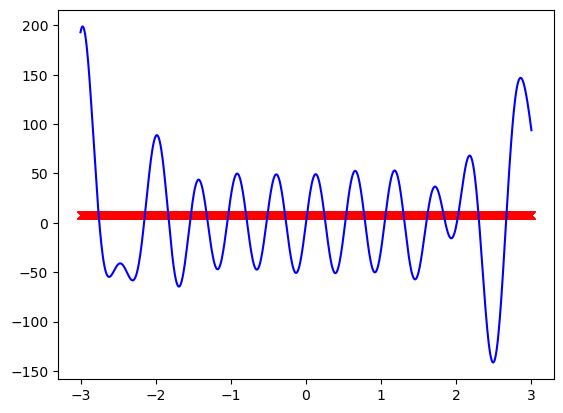

In [12]:
plt.plot(x_test,u_pred,'rx')
plt.plot(x_test,u_true,'b')

In [15]:
import scipy.io as sio
import numpy as np

for tune_reps in range(25):
    label = "Regr_atanh_tune"+str(tune_reps)+".mat"
    data = sio.loadmat(label)
    re = np.array(data["test_re"])
    print(tune_reps," ",np.mean(re[:,-1])<0.87)

0   False
1   False
2   False
3   False
4   False
5   False
6   False
7   False
8   False
9   False
10   False
11   False
12   False
13   False
14   False
15   False
16   True
17   False
18   False
19   False
20   False
21   False
22   False
23   False
24   False


In [ ]:
lrn_tune[16]